# League of Legends Ranked Games Prediction
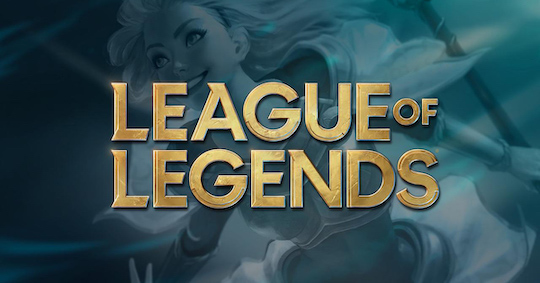

<br> 

`What is League of legend?`

League of Legends is an online MOBA (multiplayer online battle arena) where two teams(blue, red) of five champions face off to destroy the other's base. With hundreds of different champions available in game, players must work together with their teammates in order to defeat the other team.

<br>

5 players on each team join an arena that consits of 3 lanes(top, mid, bottom). The recommended formation among the lanes is a 1:1:2 distribution from top, mid, bottom with the remaining player taking on the jungle.

Each lane has minions that spawn and travel down the lane until meet the enemies minions in the middle.

<br>

Each team has 3 towers(turret) in each lane followed by an inhibitor which leads into your base. Inside your base is a Nexus guarded by 2 more towers. 

For a team to win they must destroy the other team's Nexus or make the other team surrender.

<br>

`Glossary`
>- Warding totem: An item that a player can put on the map to reveal the nearby area. Very useful for map/objectives control.
>- Minions: NPC that belong to both teams. They give gold when killed by players.
>- Jungle minions: NPC that belong to NO TEAM. They give gold and buffs when killed by players.
>- Elite monsters: Monsters with high hp/damage that give a massive bonus (gold/XP/stats) when killed by a team.
>- Dragons: Elite monster which gives team bonus when killed. The 4th dragon killed by a team gives a massive stats bonus. The 5th dragon (Elder Dragon) offers a huge advantage to the team.
>- Herald: Elite monster which gives stats bonus when killed by the player. It helps to push a lane and destroys structures.
>- Towers(Turret): Structures you have to destroy to reach the enemy Nexus. They give gold.
>- Level: Champion level. Start at 1. Max is 18.

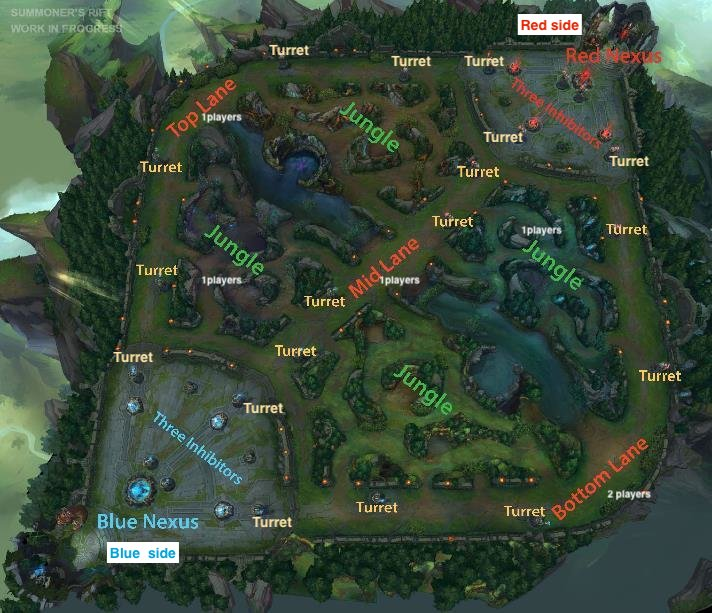

Fig. A map of the League of legends game play from: https://www.researchgate.net/figure/A-Map-of-the-League-of-Legends-game-play-in-the-classic-mode_fig1_319839481

---
Dataset: https://www.kaggle.com/datasets/bobbyscience/league-of-legends-diamond-ranked-games-10-min

League of legends guide: https://www.leagueoflegends.com/en-us/how-to-play/

<br>

`Content`

This dataset contains the first 10min. 10k ranked games(solo queue) from a high mmr(diamond 1 to master).

Each game is unique and there is no missing value.

<br>

`Column`
>- gameId : Unique Riot ID of the game
>- blueWins : **target column** (1:blue team won, 0: red team won) 
>- xxWardsPlaced: Number of warding totems placed by xx(blue/red) team
>- xxWardsDestroyed: Number of enemy warding totems
>- xxFirstBlood: First kill of the game (1:blue team did, 0: red team did)
>- xxKills: Number of enemies killed
>- xxDeaths: Number of deaths
>- xxAssists: Number of kill assits
>- xxEliteMonsters: Number of elite monsters(Dragons and Heralds) killed
>- xxDragons: Number of dragons killed
>- xxHeralds: Number of heralds killed
>- xxTowersDestroyed: Number of structures destroyed
>- xxTotalGold: Total gold
>- xxAvgLevel: Average champion level
>- xxTotalExperience: Total experience
>- xxTotalMinionsKilled: Total minions killed (CS)
>- xxTotalJungleMinionsKilled: Total jungle monsters killed
>- xxGoldDiff: Gold difference compared to the enemy team
>- xxExperienceDiff: Experience difference compared to the enemy team
>- xxCSPerMin: CS per minute
>- xxGoldPerMin: Gold per minute

<br>

`The data collection method used was the following one`
>from: https://www.kaggle.com/datasets/bobbyscience/league-of-legends-diamond-ranked-games-10-min/discussion/148164?sort=recent-comments
>1. Get hundreds of diamond player profiles on op.gg website
2. For each profile, try to get the last 10 ranked games (I get the ID attribute when parsing the HTML)
3. Deduplicate these game IDs
4. Call the Riot API for each game to get stats
5. Remove too short game (under 15min I believe)
6. Do some aggregations using game events
7. In unlikely cases, the games were two months old if the player is not very active. but in general, all games are from the season 10.

---

# 1. Importing libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from xgboost import XGBClassifier

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import classification_report, accuracy_score, roc_curve, auc, roc_auc_score, confusion_matrix

from statsmodels.stats.outliers_influence import variance_inflation_factor

import eli5
from eli5.sklearn import PermutationImportance 

import optuna
optuna.logging.set_verbosity(optuna.logging.WARNING) # silence trial results and parameters
from functools import partial
import os
import warnings
warnings.filterwarnings("ignore")
sns.set_style("whitegrid")
pd.options.display.max_columns = 40 # display all columns

2023-04-11 00:32:44.326984: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
# Colour palette
palette = sns.blend_palette(['red', 'blue'], 2)

In [3]:
# Confusion matrix visualization
def plot_cm(cm):
    ax = sns.heatmap(cm, annot=True, fmt='g')
    ax.set_title('Confusion matrix')
    ax.set_xlabel('\nPredicted Values')
    ax.set_ylabel('Actual Values')
    plt.show()

# 2. Loading data

In [4]:
df = pd.read_csv('./high_diamond_ranked_10min.csv')

df.head()

,gameId,blueWins,blueWardsPlaced,blueWardsDestroyed,blueFirstBlood,blueKills,blueDeaths,blueAssists,blueEliteMonsters,blueDragons,blueHeralds,blueTowersDestroyed,blueTotalGold,blueAvgLevel,blueTotalExperience,blueTotalMinionsKilled,blueTotalJungleMinionsKilled,blueGoldDiff,blueExperienceDiff,blueCSPerMin,blueGoldPerMin,redWardsPlaced,redWardsDestroyed,redFirstBlood,redKills,redDeaths,redAssists,redEliteMonsters,redDragons,redHeralds,redTowersDestroyed,redTotalGold,redAvgLevel,redTotalExperience,redTotalMinionsKilled,redTotalJungleMinionsKilled,redGoldDiff,redExperienceDiff,redCSPerMin,redGoldPerMin
0,4519157822,0,28,2,1,9,6,11,0,0,0,0,17210,6.6,17039,195,36,643,-8,19.5,1721.0,15,6,0,6,9,8,0,0,0,0,16567,6.8,17047,197,55,-643,8,19.7,1656.7
1,4523371949,0,12,1,0,5,5,5,0,0,0,0,14712,6.6,16265,174,43,-2908,-1173,17.4,1471.2,12,1,1,5,5,2,2,1,1,1,17620,6.8,17438,240,52,2908,1173,24.0,1762.0
2,4521474530,0,15,0,0,7,11,4,1,1,0,0,16113,6.4,16221,186,46,-1172,-1033,18.6,1611.3,15,3,1,11,7,14,0,0,0,0,17285,6.8,17254,203,28,1172,1033,20.3,1728.5
3,4524384067,0,43,1,0,4,5,5,1,0,1,0,15157,7.0,17954,201,55,-1321,-7,20.1,1515.7,15,2,1,5,4,10,0,0,0,0,16478,7.0,17961,235,47,1321,7,23.5,1647.8
4,4436033771,0,75,4,0,6,6,6,0,0,0,0,16400,7.0,18543,210,57,-1004,230,21.0,1640.0,17,2,1,6,6,7,1,1,0,0,17404,7.0,18313,225,67,1004,-230,22.5,1740.4


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9879 entries, 0 to 9878
Data columns (total 40 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   gameId                        9879 non-null   int64  
 1   blueWins                      9879 non-null   int64  
 2   blueWardsPlaced               9879 non-null   int64  
 3   blueWardsDestroyed            9879 non-null   int64  
 4   blueFirstBlood                9879 non-null   int64  
 5   blueKills                     9879 non-null   int64  
 6   blueDeaths                    9879 non-null   int64  
 7   blueAssists                   9879 non-null   int64  
 8   blueEliteMonsters             9879 non-null   int64  
 9   blueDragons                   9879 non-null   int64  
 10  blueHeralds                   9879 non-null   int64  
 11  blueTowersDestroyed           9879 non-null   int64  
 12  blueTotalGold                 9879 non-null   int64  
 13  blu

In [6]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
gameId,9879.0,4.500084e+09,2.757328e+07,4.295358e+09,4.483301e+09,4.510920e+09,4.521733e+09,4.527991e+09
blueWins,9879.0,4.990384e-01,5.000244e-01,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00
blueWardsPlaced,9879.0,2.228829e+01,1.801918e+01,5.000000e+00,1.400000e+01,1.600000e+01,2.000000e+01,2.500000e+02
blueWardsDestroyed,9879.0,2.824881e+00,2.174998e+00,0.000000e+00,1.000000e+00,3.000000e+00,4.000000e+00,2.700000e+01
blueFirstBlood,9879.0,5.048082e-01,5.000022e-01,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
blueKills,9879.0,6.183925e+00,3.011028e+00,0.000000e+00,4.000000e+00,6.000000e+00,8.000000e+00,2.200000e+01
blueDeaths,9879.0,6.137666e+00,2.933818e+00,0.000000e+00,4.000000e+00,6.000000e+00,8.000000e+00,2.200000e+01
blueAssists,9879.0,6.645106e+00,4.064520e+00,0.000000e+00,4.000000e+00,6.000000e+00,9.000000e+00,2.900000e+01
blueEliteMonsters,9879.0,5.499544e-01,6.255265e-01,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,2.000000e+00
blueDragons,9879.0,3.619800e-01,4.805974e-01,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00


In [7]:
df.blueWins.value_counts()
# df.blueWins.value_counts(normalize=True)

0    4949
1    4930
Name: blueWins, dtype: int64

# 3. EDA

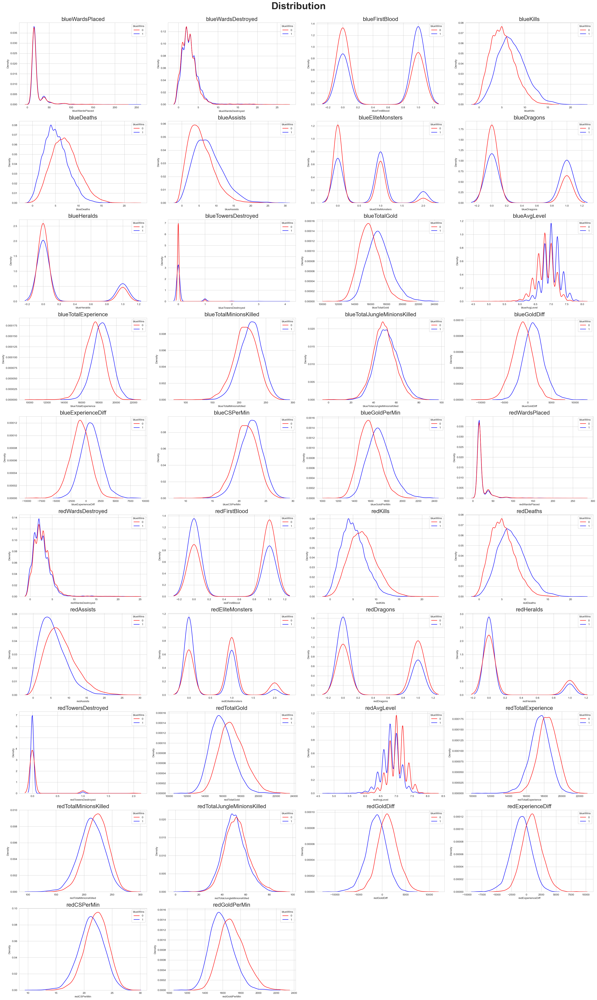

In [8]:
fig = plt.figure(figsize=(30, 50))
j = 1

for i in df.columns[2:]:
    plt.subplot(10, 4, j)
    sns.kdeplot(x=df[i], hue=df['blueWins'], palette=palette)
    plt.title(f'{i}', fontsize=20)
    j += 1
plt.suptitle('Distribution', fontsize=35, fontweight='bold', y=1)
plt.tight_layout()
plt.show()

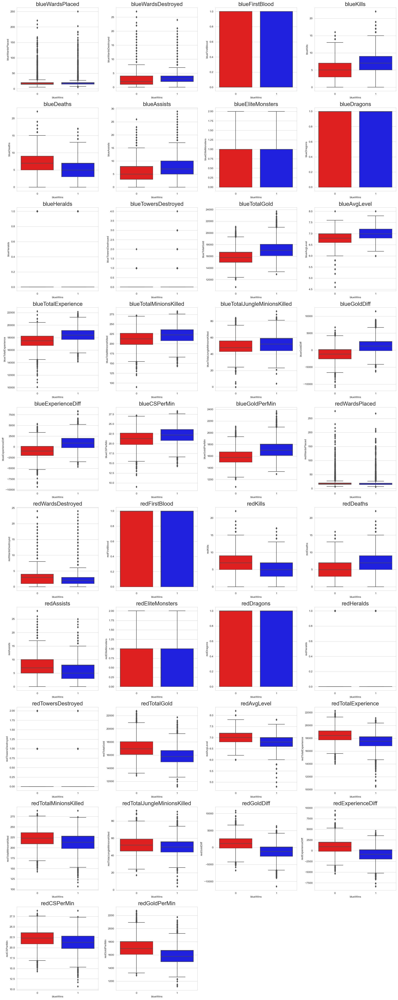

In [9]:
fig = plt.figure(figsize=(20, 50))
j = 1

for i in df.columns[2:]:
    plt.subplot(10, 4, j)
    sns.boxplot(x=df['blueWins'], y=df[i], palette=palette)
    plt.title(f'{i}', fontsize=20)
    j += 1
plt.tight_layout()
plt.show()

- Some outliers can be seen in 'xxWardsPlaced' and 'xxWardsDestroyed' features. (note)

In [10]:
print(df.groupby('blueWins').mean()['blueGoldDiff'])
print(df.groupby('blueWins').mean()['redGoldDiff'])

blueWins
0   -1237.066680
1    1270.718053
Name: blueGoldDiff, dtype: float64
blueWins
0    1237.066680
1   -1270.718053
Name: redGoldDiff, dtype: float64


In [11]:
print(df.groupby('blueWins').mean()['blueExperienceDiff'])
print(df.groupby('blueWins').mean()['redExperienceDiff'])

blueWins
0   -971.898969
1    908.274442
Name: blueExperienceDiff, dtype: float64
blueWins
0    971.898969
1   -908.274442
Name: redExperienceDiff, dtype: float64


- Gold and experience difference compared to the enemy team is the same.

In [12]:
print(df.groupby('blueWins').mean()['blueKills'])
print(df.groupby('blueWins').mean()['redDeaths'])
print('-'*30)
print(df.groupby('blueWins').mean()['blueDeaths'])
print(df.groupby('blueWins').mean()['redKills'])

blueWins
0    5.170135
1    7.201623
Name: blueKills, dtype: float64
blueWins
0    5.170135
1    7.201623
Name: redDeaths, dtype: float64
------------------------------
blueWins
0    7.131138
1    5.140365
Name: blueDeaths, dtype: float64
blueWins
0    7.131138
1    5.140365
Name: redKills, dtype: float64


- The number of enemies killed is the same as the number of deaths. There is no death by towers and minions.

In [13]:
pd.crosstab(index=df.blueTowersDestroyed, columns=df.blueWins, values=df.blueTowersDestroyed, aggfunc='count')

blueWins,0,1
blueTowersDestroyed,,
0,4835.0,4580.0
1,113.0,316.0
2,1.0,26.0
3,NaN,7.0
4,NaN,1.0


In [14]:
pd.crosstab(index=df.redTowersDestroyed, columns=df.blueWins, values=df.redTowersDestroyed, aggfunc='count')

blueWins,0,1
redTowersDestroyed,,
0,4647,4836
1,280,87
2,22,7


- There are more than three towers destroyed by the Blue Team only when the Blue Team wins.

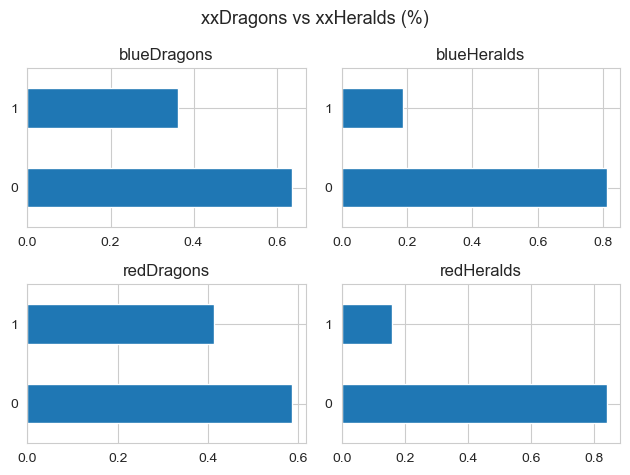

In [15]:
plt.subplot(2, 2, 1)
plt.title('blueDragons')
df.blueDragons.value_counts(normalize=True).plot(kind='barh')

plt.subplot(2, 2, 2)
plt.title('blueHeralds')
df.blueHeralds.value_counts(normalize=True).plot(kind='barh')

plt.subplot(2, 2, 3)
plt.title('redDragons')
df.redDragons.value_counts(normalize=True).plot(kind='barh')

plt.subplot(2, 2, 4)
plt.title('redHeralds')
df.redHeralds.value_counts(normalize=True).plot(kind='barh')

plt.suptitle('xxDragons vs xxHeralds (%)', fontsize=13)
plt.tight_layout()

- Both teams killed dragons more than heralds. Because the time that dragons spawn is shorter than the heralds.

|Elite monsters|Spawn time|Respawn time|
|------|---|---|
|Dragon|5 minutes|every 5 minutes after|
|Herald|8 minutes|6 minutes|

- Regular dragons will continue to spawn up until the elemental dragon soul is claimed by one team. ~~The elder dragon will spawn at 35 minutes or 6 minutes after the soul is taken.~~
- The rift herald spawns up to 2 times per game. The herald despawns permanently at 19:45 minutes and the Baron Nashor takes its place at 20 minutes.

<br> 

Source: https://www.esports.com/en/when-do-all-the-objectives-in-league-of-legends-spawn-277135

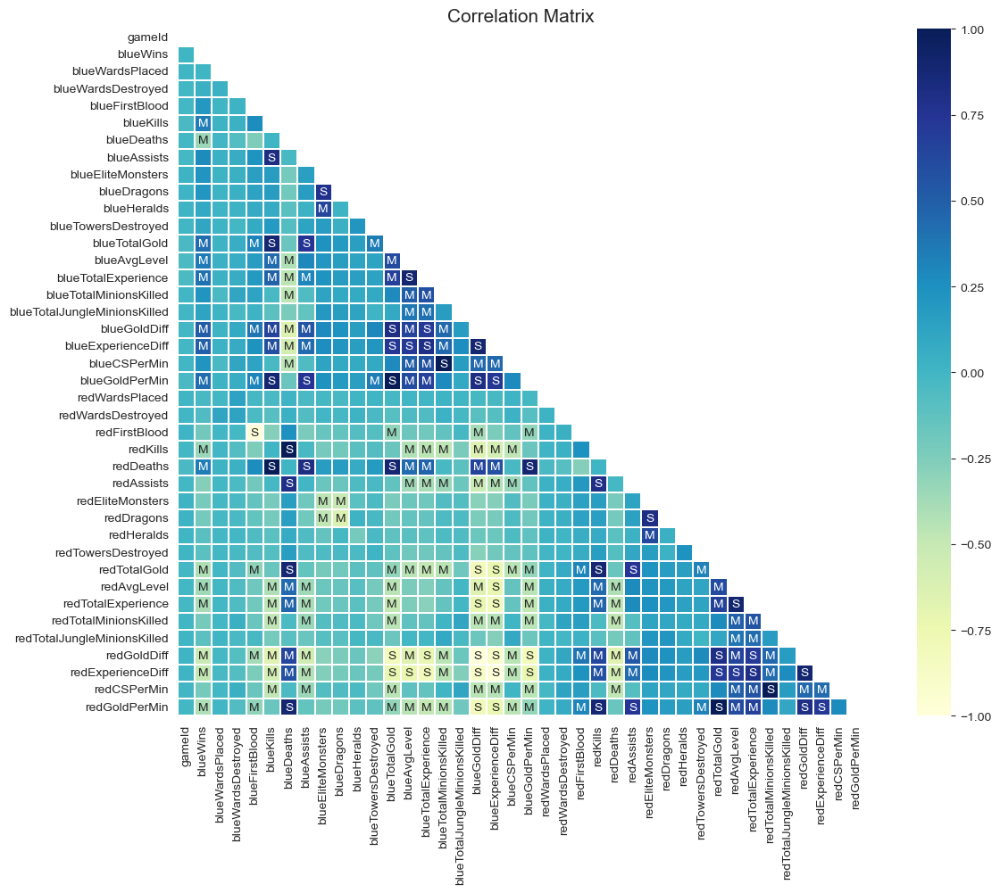

In [16]:
plt.figure(figsize=(15, 10))

labels = np.where(np.abs(df.corr())>=0.7,'S', np.where(np.abs(df.corr())>=0.3,'M', ''))

mask = np.zeros_like(df.corr(), dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

g = sns.heatmap(data=df.corr(), square=True, linewidths=0.1, cmap='YlGnBu', mask=mask, annot=labels, fmt='')
g.set_xticklabels(g.get_xticklabels())
plt.title('Correlation Matrix', fontsize=15)
plt.show()

In [17]:
# corr(abs)
temp_corr = df.corr().abs()['blueWins'][1:]

temp_corr.sort_values(ascending=False)

blueWins                        1.000000
redGoldDiff                     0.511119
blueGoldDiff                    0.511119
redExperienceDiff               0.489558
blueExperienceDiff              0.489558
blueTotalGold                   0.417213
blueGoldPerMin                  0.417213
redTotalGold                    0.411396
redGoldPerMin                   0.411396
blueTotalExperience             0.396141
redTotalExperience              0.387588
blueAvgLevel                    0.357820
redAvgLevel                     0.352127
blueDeaths                      0.339297
redKills                        0.339297
blueKills                       0.337358
redDeaths                       0.337358
blueAssists                     0.276685
redAssists                      0.271047
blueCSPerMin                    0.224909
blueTotalMinionsKilled          0.224909
blueEliteMonsters               0.221944
redEliteMonsters                0.221551
blueDragons                     0.213768
redTotalMinionsK

- Can observe same correlation value.

# 4. Data Preprocessing

In [18]:
# Outlier detection using IQR rule
def get_outlier(df=None, column=None, weight=1.5):
    new_col = df[df['blueWins'] == 1][column] # Detect the outlier separately when the blueWins is 0 or 1
    quantile_25 = np.percentile(new_col.values, 25)
    quantile_75 = np.percentile(new_col.values, 75)

    IQR = quantile_75 - quantile_25
    IQR_weight = IQR * weight
  
    lowest = quantile_25 - IQR_weight
    highest = quantile_75 + IQR_weight
  
    outlier_idx = new_col[(new_col < lowest) | (new_col > highest)].index
    return outlier_idx

In [19]:
# Create dataframe after remove outlier by IQR rule
new_df = df.copy()

for col in new_df.columns[2:]:
    outlier_idx = get_outlier(df=new_df, column=col, weight=1.5)
    
    new_df.drop(outlier_idx, axis=0, inplace=True)

print('Removed outliers: %d' % (df.shape[0] - new_df.shape[0]))

Removed outliers: 3082


In [20]:
# Check
new_df

,gameId,blueWins,blueWardsPlaced,blueWardsDestroyed,blueFirstBlood,blueKills,blueDeaths,blueAssists,blueEliteMonsters,blueDragons,blueHeralds,blueTowersDestroyed,blueTotalGold,blueAvgLevel,blueTotalExperience,blueTotalMinionsKilled,blueTotalJungleMinionsKilled,blueGoldDiff,blueExperienceDiff,blueCSPerMin,blueGoldPerMin,redWardsPlaced,redWardsDestroyed,redFirstBlood,redKills,redDeaths,redAssists,redEliteMonsters,redDragons,redHeralds,redTowersDestroyed,redTotalGold,redAvgLevel,redTotalExperience,redTotalMinionsKilled,redTotalJungleMinionsKilled,redGoldDiff,redExperienceDiff,redCSPerMin,redGoldPerMin
0,4519157822,0,28,2,1,9,6,11,0,0,0,0,17210,6.6,17039,195,36,643,-8,19.5,1721.0,15,6,0,6,9,8,0,0,0,0,16567,6.8,17047,197,55,-643,8,19.7,1656.7
1,4523371949,0,12,1,0,5,5,5,0,0,0,0,14712,6.6,16265,174,43,-2908,-1173,17.4,1471.2,12,1,1,5,5,2,2,1,1,1,17620,6.8,17438,240,52,2908,1173,24.0,1762.0
2,4521474530,0,15,0,0,7,11,4,1,1,0,0,16113,6.4,16221,186,46,-1172,-1033,18.6,1611.3,15,3,1,11,7,14,0,0,0,0,17285,6.8,17254,203,28,1172,1033,20.3,1728.5
3,4524384067,0,43,1,0,4,5,5,1,0,1,0,15157,7.0,17954,201,55,-1321,-7,20.1,1515.7,15,2,1,5,4,10,0,0,0,0,16478,7.0,17961,235,47,1321,7,23.5,1647.8
4,4436033771,0,75,4,0,6,6,6,0,0,0,0,16400,7.0,18543,210,57,-1004,230,21.0,1640.0,17,2,1,6,6,7,1,1,0,0,17404,7.0,18313,225,67,1004,-230,22.5,1740.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9871,4527715781,0,12,2,0,4,5,5,2,1,1,0,15131,6.8,18216,214,61,-727,343,21.4,1513.1,17,4,1,5,4,2,0,0,0,0,15858,6.8,17873,248,48,727,-343,24.8,1585.8
9873,4527878058,1,18,2,1,12,6,13,0,0,0,0,18573,7.2,19391,207,46,2639,2364,20.7,1857.3,16,6,0,6,12,6,0,0,0,0,15934,6.6,17027,197,38,-2639,-2364,19.7,1593.4
9876,4527713716,0,23,1,0,6,7,5,0,0,0,0,15903,7.0,18032,210,45,-2416,-1877,21.0,1590.3,14,0,1,7,6,11,1,1,0,0,18319,7.4,19909,261,60,2416,1877,26.1,1831.9
9877,4527628313,0,14,4,1,2,3,3,1,1,0,0,14459,6.6,17229,224,48,-839,-1085,22.4,1445.9,66,4,0,3,2,1,0,0,0,0,15298,7.2,18314,247,40,839,1085,24.7,1529.8


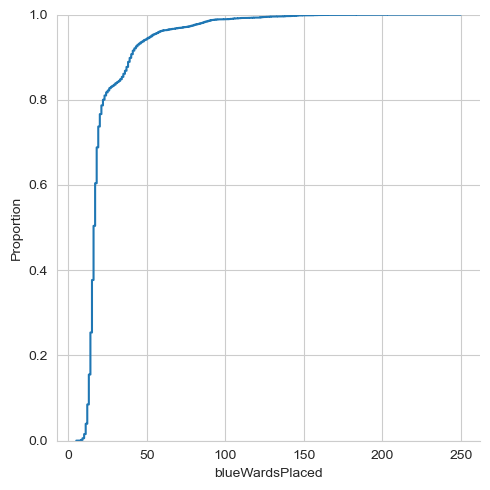

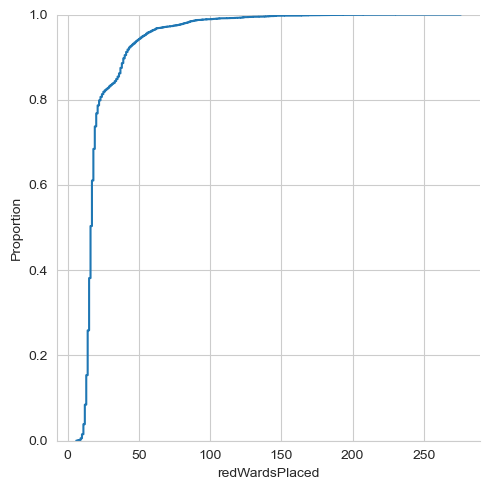

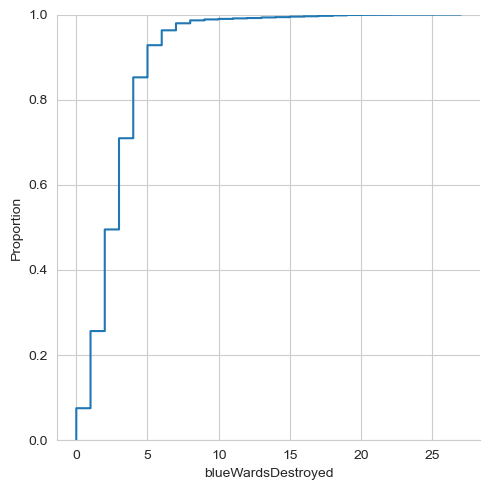

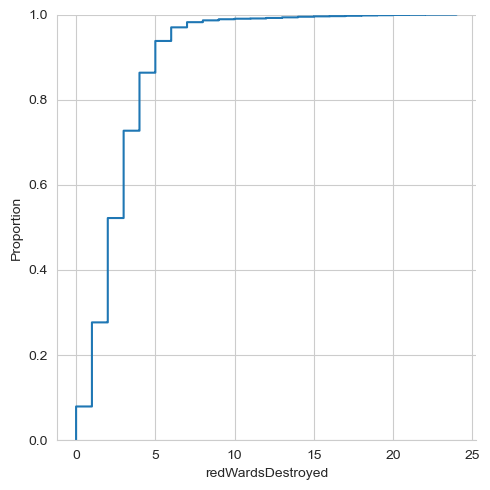

In [21]:
# ecdf plot of features with outliers
ecdf_col = ['blueWardsPlaced', 'redWardsPlaced', 'blueWardsDestroyed', 'redWardsDestroyed']

for col in ecdf_col:
    sns.displot(df[col], kind="ecdf")

In [22]:
# Remove outlier index
wardsplaced = ['blueWardsPlaced', 'redWardsPlaced']

for col in wardsplaced:
    outlier_idx = new_df[new_df[col] >= 100].index
    new_df.drop(outlier_idx, axis=0, inplace=True)

In [23]:
# Remove outlier index
wardsdestroyed = ['blueWardsDestroyed', 'redWardsDestroyed']

for col in wardsdestroyed:
    outlier_idx = new_df[new_df[col] >= 15].index
    new_df.drop(outlier_idx, axis=0, inplace=True)

In [24]:
# Check
new_df

,gameId,blueWins,blueWardsPlaced,blueWardsDestroyed,blueFirstBlood,blueKills,blueDeaths,blueAssists,blueEliteMonsters,blueDragons,blueHeralds,blueTowersDestroyed,blueTotalGold,blueAvgLevel,blueTotalExperience,blueTotalMinionsKilled,blueTotalJungleMinionsKilled,blueGoldDiff,blueExperienceDiff,blueCSPerMin,blueGoldPerMin,redWardsPlaced,redWardsDestroyed,redFirstBlood,redKills,redDeaths,redAssists,redEliteMonsters,redDragons,redHeralds,redTowersDestroyed,redTotalGold,redAvgLevel,redTotalExperience,redTotalMinionsKilled,redTotalJungleMinionsKilled,redGoldDiff,redExperienceDiff,redCSPerMin,redGoldPerMin
0,4519157822,0,28,2,1,9,6,11,0,0,0,0,17210,6.6,17039,195,36,643,-8,19.5,1721.0,15,6,0,6,9,8,0,0,0,0,16567,6.8,17047,197,55,-643,8,19.7,1656.7
1,4523371949,0,12,1,0,5,5,5,0,0,0,0,14712,6.6,16265,174,43,-2908,-1173,17.4,1471.2,12,1,1,5,5,2,2,1,1,1,17620,6.8,17438,240,52,2908,1173,24.0,1762.0
2,4521474530,0,15,0,0,7,11,4,1,1,0,0,16113,6.4,16221,186,46,-1172,-1033,18.6,1611.3,15,3,1,11,7,14,0,0,0,0,17285,6.8,17254,203,28,1172,1033,20.3,1728.5
3,4524384067,0,43,1,0,4,5,5,1,0,1,0,15157,7.0,17954,201,55,-1321,-7,20.1,1515.7,15,2,1,5,4,10,0,0,0,0,16478,7.0,17961,235,47,1321,7,23.5,1647.8
4,4436033771,0,75,4,0,6,6,6,0,0,0,0,16400,7.0,18543,210,57,-1004,230,21.0,1640.0,17,2,1,6,6,7,1,1,0,0,17404,7.0,18313,225,67,1004,-230,22.5,1740.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9871,4527715781,0,12,2,0,4,5,5,2,1,1,0,15131,6.8,18216,214,61,-727,343,21.4,1513.1,17,4,1,5,4,2,0,0,0,0,15858,6.8,17873,248,48,727,-343,24.8,1585.8
9873,4527878058,1,18,2,1,12,6,13,0,0,0,0,18573,7.2,19391,207,46,2639,2364,20.7,1857.3,16,6,0,6,12,6,0,0,0,0,15934,6.6,17027,197,38,-2639,-2364,19.7,1593.4
9876,4527713716,0,23,1,0,6,7,5,0,0,0,0,15903,7.0,18032,210,45,-2416,-1877,21.0,1590.3,14,0,1,7,6,11,1,1,0,0,18319,7.4,19909,261,60,2416,1877,26.1,1831.9
9877,4527628313,0,14,4,1,2,3,3,1,1,0,0,14459,6.6,17229,224,48,-839,-1085,22.4,1445.9,66,4,0,3,2,1,0,0,0,0,15298,7.2,18314,247,40,839,1085,24.7,1529.8


In [25]:
# Exclude features that exceed threshold
temp = new_df.corr()
temp_list = []

for x in temp.iterrows():
    idx, row = x[0], x[1] # index, series
    
    if idx in temp_list:
        continue
    
    candidate = row[row > 0.89].index[1:]
    
    if len(candidate) != 0:
        for col in candidate:
            temp_list.append(col)

print(f'Number of features: {len(temp_list)}\n {temp_list}')

Number of features: 7
 ['redDeaths', 'redKills', 'blueGoldPerMin', 'blueTotalExperience', 'blueCSPerMin', 'redGoldPerMin', 'redCSPerMin']


In [26]:
# To check for multicollinearity
temp = new_df.drop(temp_list, axis=1).drop(['gameId', 'blueWins'], axis=1)
temp

,blueWardsPlaced,blueWardsDestroyed,blueFirstBlood,blueKills,blueDeaths,blueAssists,blueEliteMonsters,blueDragons,blueHeralds,blueTowersDestroyed,blueTotalGold,blueAvgLevel,blueTotalMinionsKilled,blueTotalJungleMinionsKilled,blueGoldDiff,blueExperienceDiff,redWardsPlaced,redWardsDestroyed,redFirstBlood,redAssists,redEliteMonsters,redDragons,redHeralds,redTowersDestroyed,redTotalGold,redAvgLevel,redTotalExperience,redTotalMinionsKilled,redTotalJungleMinionsKilled,redGoldDiff,redExperienceDiff
0,28,2,1,9,6,11,0,0,0,0,17210,6.6,195,36,643,-8,15,6,0,8,0,0,0,0,16567,6.8,17047,197,55,-643,8
1,12,1,0,5,5,5,0,0,0,0,14712,6.6,174,43,-2908,-1173,12,1,1,2,2,1,1,1,17620,6.8,17438,240,52,2908,1173
2,15,0,0,7,11,4,1,1,0,0,16113,6.4,186,46,-1172,-1033,15,3,1,14,0,0,0,0,17285,6.8,17254,203,28,1172,1033
3,43,1,0,4,5,5,1,0,1,0,15157,7.0,201,55,-1321,-7,15,2,1,10,0,0,0,0,16478,7.0,17961,235,47,1321,7
4,75,4,0,6,6,6,0,0,0,0,16400,7.0,210,57,-1004,230,17,2,1,7,1,1,0,0,17404,7.0,18313,225,67,1004,-230
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9871,12,2,0,4,5,5,2,1,1,0,15131,6.8,214,61,-727,343,17,4,1,2,0,0,0,0,15858,6.8,17873,248,48,727,-343
9873,18,2,1,12,6,13,0,0,0,0,18573,7.2,207,46,2639,2364,16,6,0,6,0,0,0,0,15934,6.6,17027,197,38,-2639,-2364
9876,23,1,0,6,7,5,0,0,0,0,15903,7.0,210,45,-2416,-1877,14,0,1,11,1,1,0,0,18319,7.4,19909,261,60,2416,1877
9877,14,4,1,2,3,3,1,1,0,0,14459,6.6,224,48,-839,-1085,66,4,0,1,0,0,0,0,15298,7.2,18314,247,40,839,1085


In [27]:
# Using Variance Inflaction Factor(VIF, 다중공선성 파악)
def get_vif_df(df):
    df2 = df.copy()
    vif_df = pd.DataFrame()
    vif_df['VIF Factor'] = [variance_inflation_factor(df2.values, i) for i in range(df2.shape[1])]
    vif_df['Features'] = df2.columns
    
    return vif_df.sort_values('VIF Factor', ascending=False)

In [28]:
# get_vif_df(temp)

# Remove some of the variables have inf
get_vif_df(temp.drop(['redEliteMonsters', 'blueEliteMonsters', 'redGoldDiff', 'redTotalGold', 'redExperienceDiff'], axis=1))

,VIF Factor,Features
17,1466.960558,redFirstBlood
2,1215.502137,blueFirstBlood
13,39.869332,blueGoldDiff
9,31.937124,blueTotalGold
14,20.574486,blueExperienceDiff
23,14.305724,redTotalExperience
3,13.205011,blueKills
4,13.029640,blueDeaths
10,5.119816,blueAvgLevel
22,4.812723,redAvgLevel


In [35]:
# Remove features using VIF and permutation importance(Check 6. Standardization)
# X = new_df.drop(temp_list, axis=1).drop(['gameId', 'blueWins', 'redEliteMonsters', 'blueEliteMonsters', 'redGoldDiff', 
#                                          'redTotalGold', 'redExperienceDiff'], axis=1)
# y = new_df.blueWins

# Run the code after check permutation importance
X = new_df.drop(temp_list, axis=1).drop(['gameId', 'blueWins', 'redEliteMonsters', 'blueEliteMonsters', 'redGoldDiff', 
                                         'redTotalGold', 'redExperienceDiff', 'redAvgLevel', 'redTotalMinionsKilled', 'redFirstBlood'], axis=1)
y = new_df.blueWins

In [36]:
# Check
X

,blueWardsPlaced,blueWardsDestroyed,blueFirstBlood,blueKills,blueDeaths,blueAssists,blueDragons,blueHeralds,blueTowersDestroyed,blueTotalGold,blueAvgLevel,blueTotalMinionsKilled,blueTotalJungleMinionsKilled,blueGoldDiff,blueExperienceDiff,redWardsPlaced,redWardsDestroyed,redAssists,redDragons,redHeralds,redTowersDestroyed,redTotalExperience,redTotalJungleMinionsKilled
0,28,2,1,9,6,11,0,0,0,17210,6.6,195,36,643,-8,15,6,8,0,0,0,17047,55
1,12,1,0,5,5,5,0,0,0,14712,6.6,174,43,-2908,-1173,12,1,2,1,1,1,17438,52
2,15,0,0,7,11,4,1,0,0,16113,6.4,186,46,-1172,-1033,15,3,14,0,0,0,17254,28
3,43,1,0,4,5,5,0,1,0,15157,7.0,201,55,-1321,-7,15,2,10,0,0,0,17961,47
4,75,4,0,6,6,6,0,0,0,16400,7.0,210,57,-1004,230,17,2,7,1,0,0,18313,67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9871,12,2,0,4,5,5,1,1,0,15131,6.8,214,61,-727,343,17,4,2,0,0,0,17873,48
9873,18,2,1,12,6,13,0,0,0,18573,7.2,207,46,2639,2364,16,6,6,0,0,0,17027,38
9876,23,1,0,6,7,5,0,0,0,15903,7.0,210,45,-2416,-1877,14,0,11,1,0,0,19909,60
9877,14,4,1,2,3,3,1,0,0,14459,6.6,224,48,-839,-1085,66,4,1,0,0,0,18314,40


# 5. Train-test split

In [37]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, stratify=y, random_state=42)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(5630, 23) (994, 23) (5630,) (994,)


# 6. Standardization

In [38]:
col_names = list(X_train.columns)
scaler = StandardScaler()

# X_train
X_train_scaled = scaler.fit_transform(X_train)
X_train_scaled = pd.DataFrame(X_train_scaled, columns=col_names)
# X_test
X_test_scaled = scaler.transform(X_test)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=col_names)

In [39]:
# Check
X_train_scaled

,blueWardsPlaced,blueWardsDestroyed,blueFirstBlood,blueKills,blueDeaths,blueAssists,blueDragons,blueHeralds,blueTowersDestroyed,blueTotalGold,blueAvgLevel,blueTotalMinionsKilled,blueTotalJungleMinionsKilled,blueGoldDiff,blueExperienceDiff,redWardsPlaced,redWardsDestroyed,redAssists,redDragons,redHeralds,redTowersDestroyed,redTotalExperience,redTotalJungleMinionsKilled
0,-0.123240,-1.523209,-0.911207,-0.595745,1.174026,0.527404,-0.678279,2.794753,-0.121608,-0.608633,-1.541735,0.007635,0.224235,-1.016192,-0.528179,-0.492027,1.969384,1.684801,1.091565,-0.399835,-0.208577,0.221896,-0.783307
1,-0.460015,-0.948240,-0.911207,-1.684486,-1.195551,-1.085170,-0.678279,-0.357813,-0.121608,-1.528342,-0.873171,-0.458064,1.464558,-0.512259,-0.601954,-0.492027,1.384130,-0.997041,1.091565,-0.399835,-0.208577,0.496813,-0.380667
2,-0.628403,-1.523209,1.097445,0.492995,0.497004,-0.010120,1.474320,-0.357813,-0.121608,0.626634,1.132522,0.752752,-0.189206,-0.720828,0.190010,-0.576906,-1.542138,1.440997,-0.916116,2.501031,8.554782,0.642358,1.028574
3,-0.460015,-0.948240,-0.911207,-0.232832,-0.180018,-0.547645,-0.678279,-0.357813,-0.121608,-0.696814,1.132522,-0.877192,-0.706008,-0.436536,-0.387336,-0.661785,-0.956885,-0.021825,1.091565,-0.399835,-0.208577,0.799582,1.934515
4,2.234185,-0.373271,-0.911207,-0.958659,-0.180018,-1.622694,-0.678279,2.794753,-0.121608,-0.850585,0.463957,0.939032,1.464558,-0.309888,-0.149802,-0.067632,0.213623,-0.997041,1.091565,-0.399835,-0.208577,0.556109,0.625934
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5625,-0.039046,0.201699,-0.911207,1.581735,1.174026,2.408740,-0.678279,-0.357813,-0.121608,1.875018,-0.204607,0.287054,-1.739610,0.535462,0.445429,1.714828,-0.371631,2.172409,1.091565,2.501031,-0.208577,-0.076381,-0.481327
5626,1.560635,-0.373271,1.097445,0.130082,-0.518529,1.064929,-0.678279,2.794753,-0.121608,0.338769,-0.873171,0.007635,0.637676,0.671852,1.391091,-0.407148,-1.542138,-0.021825,-0.916116,-0.399835,-0.208577,-2.459900,0.827254
5627,-0.291627,0.776668,-0.911207,0.855908,-1.534062,-0.010120,1.474320,-0.357813,-0.121608,0.848180,1.132522,0.799322,-0.292567,2.059662,2.355198,-0.322269,1.969384,-1.484648,-0.916116,-0.399835,-0.208577,-2.704271,-0.682647
5628,-0.544209,-1.523209,1.097445,-1.321572,-0.857040,-1.085170,-0.678279,-0.357813,-0.121608,-1.185820,-0.204607,-0.038935,0.017514,-0.330258,-0.756770,-0.492027,0.213623,-1.240845,-0.916116,-0.399835,-0.208577,1.204771,-0.280007


In [34]:
# Permutation importance(xgboost)
model = XGBClassifier(random_state=42).fit(X_train_scaled, y_train)

perm = PermutationImportance(model, scoring = "accuracy", random_state = 42).fit(X_test_scaled, y_test) 
eli5.show_weights(perm, top = 30, feature_names = X_test_scaled.columns.tolist())

Weight,Feature
0.0738 ± 0.0120,blueGoldDiff
0.0368 ± 0.0043,blueWardsPlaced
0.0312 ± 0.0086,redHeralds
0.0296 ± 0.0041,redWardsPlaced
0.0290 ± 0.0085,blueHeralds
0.0137 ± 0.0037,blueDragons
0.0125 ± 0.0103,blueExperienceDiff
0.0070 ± 0.0065,blueTowersDestroyed
0.0036 ± 0.0052,redWardsDestroyed
0.0024 ± 0.0041,blueAvgLevel


- The values towards the top are the most important features, and those towards the bottom matter least. The first number in each row shows how much model performance decreased with a random shuffling (in this case, using "accuracy" as the performance metric).

Go back to 4. Data Preprocessing

# 7. Training model

In [40]:
models = [['Logistic Regression', LogisticRegression(solver='liblinear', random_state=42)],
        ['Random Forest Classifier', RandomForestClassifier(random_state=42)],
        ['XGBoost', XGBClassifier(random_state=42)]]

models_score = []

# training
for name, model in models:
    model = model
    model.fit(X_train_scaled, y_train)
    model_pred = model.predict(X_test_scaled)
    models_score.append(accuracy_score(y_test, model_pred))

    print(name)
    print('- Training   Accuracy: %.4f ' % accuracy_score(y_train, model.predict(X_train_scaled)))
    print('- Validation Acuuracy: %.4f \n' % accuracy_score(y_test, model_pred))
    print(classification_report(y_test, model_pred))
    
    # visualize roc curve
    fpr, tpr, thresholds = roc_curve(y_test, model_pred)

    fig = px.area(x=fpr, y=tpr, title=f'ROC Curve (AUC={auc(fpr, tpr):.4f})',
                labels=dict(x='False Positive Rate', y='True Positive Rate'),
                width=600, height=400)
    fig.add_shape(type='line', line=dict(dash='dash'), x0=0, x1=1, y0=0, y1=1)

    fig.update_yaxes(scaleanchor="x", scaleratio=1)
    fig.update_xaxes(constrain='domain')
    fig.show()

    print('='*70)
    print('\n')

Logistic Regression
- Training   Accuracy: 0.8368 
- Validation Acuuracy: 0.8481 

              precision    recall  f1-score   support

           0       0.89      0.91      0.90       717
           1       0.74      0.70      0.72       277

    accuracy                           0.85       994
   macro avg       0.81      0.80      0.81       994
weighted avg       0.85      0.85      0.85       994





Random Forest Classifier
- Training   Accuracy: 1.0000 
- Validation Acuuracy: 0.8350 

              precision    recall  f1-score   support

           0       0.87      0.91      0.89       717
           1       0.73      0.65      0.69       277

    accuracy                           0.84       994
   macro avg       0.80      0.78      0.79       994
weighted avg       0.83      0.84      0.83       994





XGBoost
- Training   Accuracy: 0.9865 
- Validation Acuuracy: 0.8521 

              precision    recall  f1-score   support

           0       0.90      0.90      0.90       717
           1       0.74      0.73      0.73       277

    accuracy                           0.85       994
   macro avg       0.82      0.82      0.82       994
weighted avg       0.85      0.85      0.85       994



In [41]:
# K-fold score, visualization
results=[]
names=[]

for name, model in models:
    kfold = StratifiedKFold(n_splits=10)
    cv_results = cross_val_score(model, X_train_scaled, y_train, cv=kfold, scoring='accuracy')
    results.append(cv_results)
    names.append(name)
    print('%s: %.4f (%.4f)' % (name, cv_results.mean(), cv_results.std()))

Logistic Regression: 0.8337 (0.0108)
Random Forest Classifier: 0.8355 (0.0075)
XGBoost: 0.8291 (0.0127)


In [42]:
# Compare the accuracy of individual models and voting classifier
voting_models = [['Logistic Regression', LogisticRegression(solver='liblinear', random_state=42)],
                 ['Random Forest Classifier', RandomForestClassifier(random_state=42)],
                 ['XGBoost', XGBClassifier(random_state=42)]]

voting_clf = VotingClassifier(estimators=voting_models, voting='soft')
voting_clf.fit(X_train_scaled, y_train)
pred = voting_clf.predict(X_test_scaled)

print("Voting classifier accuracy: %.4f" % accuracy_score(y_test, pred))
print("Voting classifier roc_auc score: %.4f" % roc_auc_score(y_test, pred))

Voting classifier accuracy: 0.8531
Voting classifier roc_auc score: 0.8096


---

Accuracy: 0.8521 
Roc_auc score: 0.8155 

              precision    recall  f1-score   support

           0       0.90      0.90      0.90       717
           1       0.74      0.73      0.73       277

    accuracy                           0.85       994
   macro avg       0.82      0.82      0.82       994
weighted avg       0.85      0.85      0.85       994



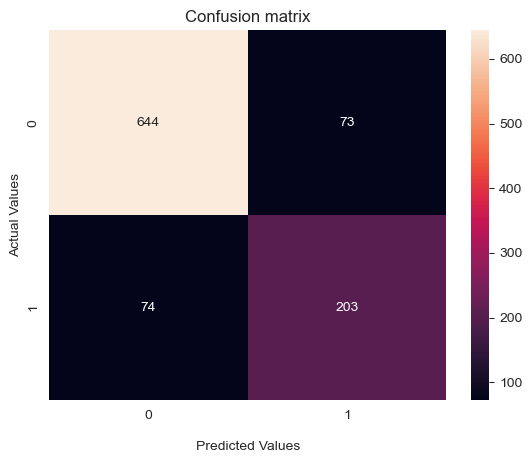

In [43]:
# final model training
final_model = XGBClassifier(random_state=42)
final_model.fit(X_train_scaled, y_train)
pred = final_model.predict(X_test_scaled)
cm_model = confusion_matrix(y_test, pred)

print("Accuracy: %.4f " % accuracy_score(y_test, pred))
print("Roc_auc score: %.4f \n" % roc_auc_score(y_test, pred))
print(classification_report(y_test, pred))
plot_cm(cm_model)

0. Feature: blueHeralds (0.2757)
1. Feature: redHeralds (0.1700)
2. Feature: blueGoldDiff (0.0858)
3. Feature: redWardsPlaced (0.0628)
4. Feature: blueWardsPlaced (0.0531)
5. Feature: blueTowersDestroyed (0.0372)
6. Feature: blueDragons (0.0366)
7. Feature: blueExperienceDiff (0.0295)
8. Feature: blueKills (0.0192)
9. Feature: blueAssists (0.0188)
10. Feature: blueAvgLevel (0.0178)
11. Feature: redAssists (0.0178)
12. Feature: redTotalExperience (0.0174)
13. Feature: redDragons (0.0174)
14. Feature: redTowersDestroyed (0.0171)
15. Feature: blueFirstBlood (0.0169)
16. Feature: redWardsDestroyed (0.0166)
17. Feature: blueTotalGold (0.0164)
18. Feature: redTotalJungleMinionsKilled (0.0160)
19. Feature: blueTotalMinionsKilled (0.0156)
20. Feature: blueWardsDestroyed (0.0148)
21. Feature: blueTotalJungleMinionsKilled (0.0141)
22. Feature: blueDeaths (0.0133)


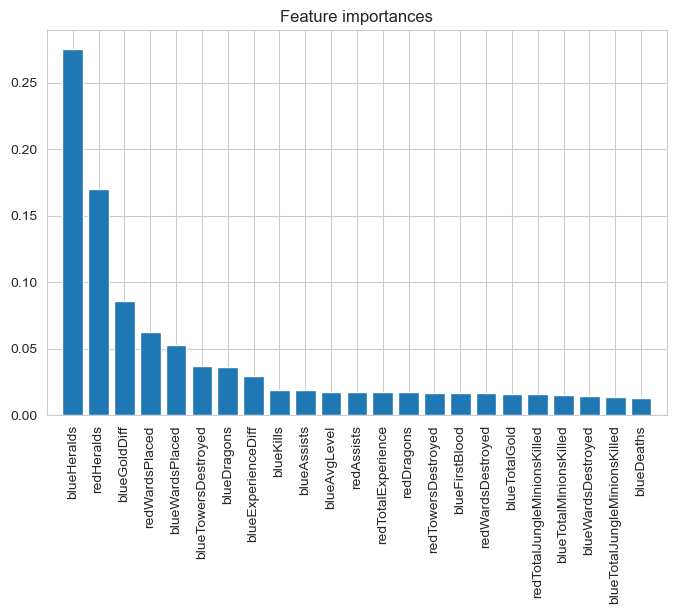

In [44]:
# Model feature importances visualization
importances = final_model.feature_importances_
indices = np.argsort(importances)[::-1]
feat_names = X.columns

for i in range(X.shape[1]):
    print(f'{i}. Feature: {X.columns[indices][i]} ({importances[indices[i]]:.4f})')

plt.figure(figsize=(8,5))
plt.title("Feature importances")
plt.bar(x=range(len(indices)), height=importances[indices], align="center")
plt.xticks(ticks=range(len(indices)), labels=feat_names[indices], rotation='vertical')
plt.xlim([-1, len(indices)])
plt.show()

`Conclusion`

This is the order of feature importance to give to the game in the first 10 minutes to have a ~85% chance of winning.
> Epic monsters, Gold, Experience, Warding, Tower Destroyed, Kills and Assists

If you found any mistakes or opinion on how to improve my notebook, please write in the comments :)

Thank you for the reading and wish you have a nice day!

# 8. ~~Optuna~~

In [45]:
def optimizer(trial, X, y, K):
    
    param = {
        'max_depth': trial.suggest_int('max_depth', 2, 15),
        # 트리의 최대 깊이
        'subsample': trial.suggest_discrete_uniform('subsample', 0.5, 1.0, 0.05),
        # 각 트리마다 데이터 샘플링 비율 over-fitting방지
        'n_estimators': trial.suggest_int('n_estimators', 1000, 10000, 100),
        # 트리 모델의 개수
        'eta': trial.suggest_discrete_uniform('eta', 0.01, 0.1, 0.01),
        # 학습 단계별 가중치 설정(낮을수록 보수적인 모델)
        'reg_alpha': trial.suggest_int('reg_alpha', 1, 50),
        # L1 규제(Lasso)
        'reg_lambda': trial.suggest_int('reg_lambda', 5, 100),
        # L2 규제(Ridge)
        'min_child_weight': trial.suggest_int('min_child_weight', 2, 20),
        # child 에서 필요한 모든 관측치에 대한 가중치의 최소합(이 값보다 샘플 수가 작으면 leaf node가 된다.)
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.1, 1.0),
        # 각 트리마다 feature 샘플링 비율
    }

    model = XGBClassifier(**param, verbose=0, random_state=42) 
    
    # K-Fold Cross validation
    folds = StratifiedKFold(n_splits=K)
    scores = []
    
    for train_idx, val_idx in folds.split(X, y):
        X_train = X.iloc[train_idx, :]
        y_train = y.iloc[train_idx]
        
        X_val = X.iloc[val_idx, :]
        y_val = y.iloc[val_idx]
        
        model.fit(X_train, y_train, eval_set=[(X_val, y_val)], early_stopping_rounds=150, eval_metric='auc')
        # early_stopping_rounds: # early_stopping_rounds를 조정해서 validation error가 최소가 되는 지점에 학습을 멈추도록 범위설정
        preds = model.predict(X_val)
        score = accuracy_score(y_val, preds)
        scores.append(score)
    
    
    # K-Fold의 평균 loss값을 돌려줍니다.
    return np.mean(scores)

In [46]:
K = 10 # k-fold
opt_func = partial(optimizer, X=X_train_scaled, y=y_train, K=K)

xgb_study = optuna.create_study(study_name="XGB", direction="maximize")
xgb_study.optimize(opt_func, n_trials=30)

[00:40:04] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-3.7/xgboost/src/learner.cc:627: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.70301
[1]	validation_0-auc:0.71445
[2]	validation_0-auc:0.74352
[3]	validation_0-auc:0.76825
[4]	validation_0-auc:0.76813
[5]	validation_0-auc:0.77226
[6]	validation_0-auc:0.77222
[7]	validation_0-auc:0.77170
[8]	validation_0-auc:0.77149
[9]	validation_0-auc:0.78072
[10]	validation_0-auc:0.78408
[11]	validation_0-auc:0.78240
[12]	validation_0-auc:0.78080
[13]	validation_0-auc:0.78122
[14]	validation_0-auc:0.78013
[15]	validation_0-auc:0.78426
[16]	validation_0-auc:0.78839
[17]	validation_0-auc:0.79174
[18]	validation_0-auc:0

[254]	validation_0-auc:0.89679
[255]	validation_0-auc:0.89680
[256]	validation_0-auc:0.89683
[257]	validation_0-auc:0.89680
[258]	validation_0-auc:0.89688
[259]	validation_0-auc:0.89688
[260]	validation_0-auc:0.89705
[261]	validation_0-auc:0.89701
[262]	validation_0-auc:0.89702
[263]	validation_0-auc:0.89705
[264]	validation_0-auc:0.89696
[265]	validation_0-auc:0.89694
[266]	validation_0-auc:0.89694
[267]	validation_0-auc:0.89698
[268]	validation_0-auc:0.89698
[269]	validation_0-auc:0.89698
[270]	validation_0-auc:0.89704
[271]	validation_0-auc:0.89709
[272]	validation_0-auc:0.89710
[273]	validation_0-auc:0.89712
[274]	validation_0-auc:0.89730
[275]	validation_0-auc:0.89730
[276]	validation_0-auc:0.89734
[277]	validation_0-auc:0.89729
[278]	validation_0-auc:0.89729
[279]	validation_0-auc:0.89719
[280]	validation_0-auc:0.89719
[281]	validation_0-auc:0.89746
[282]	validation_0-auc:0.89746
[283]	validation_0-auc:0.89745
[284]	validation_0-auc:0.89760
[285]	validation_0-auc:0.89760
[286]	va

[519]	validation_0-auc:0.89986
[520]	validation_0-auc:0.89986
[521]	validation_0-auc:0.89986
[522]	validation_0-auc:0.89986
[523]	validation_0-auc:0.90003
[524]	validation_0-auc:0.89999
[525]	validation_0-auc:0.90000
[526]	validation_0-auc:0.90002
[527]	validation_0-auc:0.90002
[528]	validation_0-auc:0.90002
[529]	validation_0-auc:0.90018
[530]	validation_0-auc:0.90013
[531]	validation_0-auc:0.90016
[532]	validation_0-auc:0.90014
[533]	validation_0-auc:0.90014
[534]	validation_0-auc:0.90021
[535]	validation_0-auc:0.90024
[536]	validation_0-auc:0.90024
[537]	validation_0-auc:0.90019
[538]	validation_0-auc:0.90019
[539]	validation_0-auc:0.90019
[540]	validation_0-auc:0.90021
[541]	validation_0-auc:0.90021
[542]	validation_0-auc:0.90021
[543]	validation_0-auc:0.90018
[544]	validation_0-auc:0.90018
[545]	validation_0-auc:0.90011
[546]	validation_0-auc:0.90011
[547]	validation_0-auc:0.90011
[548]	validation_0-auc:0.90007
[549]	validation_0-auc:0.90016
[550]	validation_0-auc:0.90016
[551]	va

[784]	validation_0-auc:0.90140
[785]	validation_0-auc:0.90135
[786]	validation_0-auc:0.90135
[787]	validation_0-auc:0.90132
[788]	validation_0-auc:0.90138
[789]	validation_0-auc:0.90138
[790]	validation_0-auc:0.90138
[791]	validation_0-auc:0.90148
[792]	validation_0-auc:0.90157
[793]	validation_0-auc:0.90160
[794]	validation_0-auc:0.90156
[795]	validation_0-auc:0.90156
[796]	validation_0-auc:0.90156
[797]	validation_0-auc:0.90156
[798]	validation_0-auc:0.90167
[799]	validation_0-auc:0.90170
[800]	validation_0-auc:0.90170
[801]	validation_0-auc:0.90170
[802]	validation_0-auc:0.90171
[803]	validation_0-auc:0.90171
[804]	validation_0-auc:0.90171
[805]	validation_0-auc:0.90173
[806]	validation_0-auc:0.90171
[807]	validation_0-auc:0.90171
[808]	validation_0-auc:0.90171
[809]	validation_0-auc:0.90171
[810]	validation_0-auc:0.90171
[811]	validation_0-auc:0.90170
[812]	validation_0-auc:0.90170
[813]	validation_0-auc:0.90170
[814]	validation_0-auc:0.90170
[815]	validation_0-auc:0.90170
[816]	va

[1047]	validation_0-auc:0.90247
[1048]	validation_0-auc:0.90247
[1049]	validation_0-auc:0.90247
[1050]	validation_0-auc:0.90247
[1051]	validation_0-auc:0.90247
[1052]	validation_0-auc:0.90247
[1053]	validation_0-auc:0.90247
[1054]	validation_0-auc:0.90236
[1055]	validation_0-auc:0.90236
[1056]	validation_0-auc:0.90236
[1057]	validation_0-auc:0.90236
[1058]	validation_0-auc:0.90236
[1059]	validation_0-auc:0.90234
[1060]	validation_0-auc:0.90237
[1061]	validation_0-auc:0.90237
[1062]	validation_0-auc:0.90237
[1063]	validation_0-auc:0.90237
[1064]	validation_0-auc:0.90234
[1065]	validation_0-auc:0.90234
[1066]	validation_0-auc:0.90237
[1067]	validation_0-auc:0.90240
[1068]	validation_0-auc:0.90242
[1069]	validation_0-auc:0.90242
[1070]	validation_0-auc:0.90237
[1071]	validation_0-auc:0.90226
[1072]	validation_0-auc:0.90223
[1073]	validation_0-auc:0.90226
[1074]	validation_0-auc:0.90226
[1075]	validation_0-auc:0.90226
[1076]	validation_0-auc:0.90226
[1077]	validation_0-auc:0.90226
[1078]	v

[1304]	validation_0-auc:0.90280
[1305]	validation_0-auc:0.90280
[1306]	validation_0-auc:0.90280
[1307]	validation_0-auc:0.90280
[1308]	validation_0-auc:0.90280
[1309]	validation_0-auc:0.90280
[1310]	validation_0-auc:0.90278
[1311]	validation_0-auc:0.90273
[1312]	validation_0-auc:0.90273
[1313]	validation_0-auc:0.90280
[1314]	validation_0-auc:0.90280
[1315]	validation_0-auc:0.90278
[1316]	validation_0-auc:0.90278
[1317]	validation_0-auc:0.90278
[1318]	validation_0-auc:0.90278
[1319]	validation_0-auc:0.90278
[1320]	validation_0-auc:0.90280
[1321]	validation_0-auc:0.90280
[1322]	validation_0-auc:0.90280
[1323]	validation_0-auc:0.90281
[1324]	validation_0-auc:0.90281
[1325]	validation_0-auc:0.90272
[1326]	validation_0-auc:0.90272
[1327]	validation_0-auc:0.90272
[1328]	validation_0-auc:0.90272
[1329]	validation_0-auc:0.90272
[1330]	validation_0-auc:0.90272
[1331]	validation_0-auc:0.90272
[1332]	validation_0-auc:0.90269
[1333]	validation_0-auc:0.90267
[1334]	validation_0-auc:0.90265
[1335]	v

[172]	validation_0-auc:0.89346
[173]	validation_0-auc:0.89349
[174]	validation_0-auc:0.89370
[175]	validation_0-auc:0.89371
[176]	validation_0-auc:0.89381
[177]	validation_0-auc:0.89385
[178]	validation_0-auc:0.89379
[179]	validation_0-auc:0.89382
[180]	validation_0-auc:0.89421
[181]	validation_0-auc:0.89425
[182]	validation_0-auc:0.89450
[183]	validation_0-auc:0.89483
[184]	validation_0-auc:0.89470
[185]	validation_0-auc:0.89508
[186]	validation_0-auc:0.89517
[187]	validation_0-auc:0.89534
[188]	validation_0-auc:0.89531
[189]	validation_0-auc:0.89536
[190]	validation_0-auc:0.89559
[191]	validation_0-auc:0.89566
[192]	validation_0-auc:0.89592
[193]	validation_0-auc:0.89583
[194]	validation_0-auc:0.89578
[195]	validation_0-auc:0.89578
[196]	validation_0-auc:0.89581
[197]	validation_0-auc:0.89575
[198]	validation_0-auc:0.89577
[199]	validation_0-auc:0.89589
[200]	validation_0-auc:0.89586
[201]	validation_0-auc:0.89611
[202]	validation_0-auc:0.89613
[203]	validation_0-auc:0.89613
[204]	va

[437]	validation_0-auc:0.90198
[438]	validation_0-auc:0.90196
[439]	validation_0-auc:0.90203
[440]	validation_0-auc:0.90206
[441]	validation_0-auc:0.90195
[442]	validation_0-auc:0.90193
[443]	validation_0-auc:0.90176
[444]	validation_0-auc:0.90176
[445]	validation_0-auc:0.90182
[446]	validation_0-auc:0.90196
[447]	validation_0-auc:0.90203
[448]	validation_0-auc:0.90204
[449]	validation_0-auc:0.90201
[450]	validation_0-auc:0.90201
[451]	validation_0-auc:0.90200
[452]	validation_0-auc:0.90203
[453]	validation_0-auc:0.90203
[454]	validation_0-auc:0.90203
[455]	validation_0-auc:0.90203
[456]	validation_0-auc:0.90203
[457]	validation_0-auc:0.90201
[458]	validation_0-auc:0.90195
[459]	validation_0-auc:0.90195
[460]	validation_0-auc:0.90198
[461]	validation_0-auc:0.90193
[462]	validation_0-auc:0.90189
[463]	validation_0-auc:0.90189
[464]	validation_0-auc:0.90193
[465]	validation_0-auc:0.90193
[466]	validation_0-auc:0.90193
[467]	validation_0-auc:0.90198
[468]	validation_0-auc:0.90198
[469]	va

[702]	validation_0-auc:0.90284
[703]	validation_0-auc:0.90284
[704]	validation_0-auc:0.90284
[705]	validation_0-auc:0.90284
[706]	validation_0-auc:0.90284
[707]	validation_0-auc:0.90284
[708]	validation_0-auc:0.90284
[709]	validation_0-auc:0.90284
[710]	validation_0-auc:0.90283
[711]	validation_0-auc:0.90286
[712]	validation_0-auc:0.90286
[713]	validation_0-auc:0.90283
[714]	validation_0-auc:0.90281
[715]	validation_0-auc:0.90281
[716]	validation_0-auc:0.90281
[717]	validation_0-auc:0.90281
[718]	validation_0-auc:0.90281
[719]	validation_0-auc:0.90280
[720]	validation_0-auc:0.90287
[721]	validation_0-auc:0.90287
[722]	validation_0-auc:0.90284
[723]	validation_0-auc:0.90287
[724]	validation_0-auc:0.90287
[725]	validation_0-auc:0.90287
[726]	validation_0-auc:0.90287
[727]	validation_0-auc:0.90286
[728]	validation_0-auc:0.90286
[729]	validation_0-auc:0.90286
[730]	validation_0-auc:0.90291
[731]	validation_0-auc:0.90291
[732]	validation_0-auc:0.90287
[733]	validation_0-auc:0.90289
[734]	va

[967]	validation_0-auc:0.90344
[968]	validation_0-auc:0.90344
[969]	validation_0-auc:0.90344
[970]	validation_0-auc:0.90344
[971]	validation_0-auc:0.90344
[972]	validation_0-auc:0.90344
[973]	validation_0-auc:0.90341
[974]	validation_0-auc:0.90341
[975]	validation_0-auc:0.90345
[976]	validation_0-auc:0.90345
[977]	validation_0-auc:0.90349
[978]	validation_0-auc:0.90342
[979]	validation_0-auc:0.90342
[980]	validation_0-auc:0.90336
[981]	validation_0-auc:0.90336
[982]	validation_0-auc:0.90344
[983]	validation_0-auc:0.90344
[984]	validation_0-auc:0.90344
[985]	validation_0-auc:0.90345
[986]	validation_0-auc:0.90345
[987]	validation_0-auc:0.90345
[988]	validation_0-auc:0.90345
[989]	validation_0-auc:0.90341
[990]	validation_0-auc:0.90338
[991]	validation_0-auc:0.90338
[992]	validation_0-auc:0.90338
[993]	validation_0-auc:0.90338
[994]	validation_0-auc:0.90338
[995]	validation_0-auc:0.90338
[996]	validation_0-auc:0.90338
[997]	validation_0-auc:0.90336
[998]	validation_0-auc:0.90336
[999]	va

[0]	validation_0-auc:0.72370
[1]	validation_0-auc:0.73548
[2]	validation_0-auc:0.75387
[3]	validation_0-auc:0.76896
[4]	validation_0-auc:0.76847
[5]	validation_0-auc:0.76866
[6]	validation_0-auc:0.77620
[7]	validation_0-auc:0.77653
[8]	validation_0-auc:0.77683
[9]	validation_0-auc:0.79070
[10]	validation_0-auc:0.78729
[11]	validation_0-auc:0.79033
[12]	validation_0-auc:0.79157
[13]	validation_0-auc:0.79181
[14]	validation_0-auc:0.79192
[15]	validation_0-auc:0.79548
[16]	validation_0-auc:0.79927
[17]	validation_0-auc:0.79911
[18]	validation_0-auc:0.79882
[19]	validation_0-auc:0.80149
[20]	validation_0-auc:0.80449
[21]	validation_0-auc:0.80530
[22]	validation_0-auc:0.80781
[23]	validation_0-auc:0.80973
[24]	validation_0-auc:0.81111
[25]	validation_0-auc:0.81172
[26]	validation_0-auc:0.81385
[27]	validation_0-auc:0.81351
[28]	validation_0-auc:0.81657
[29]	validation_0-auc:0.81864
[30]	validation_0-auc:0.81831
[31]	validation_0-auc:0.81789
[32]	validation_0-auc:0.82606
[33]	validation_0-au

[268]	validation_0-auc:0.89578
[269]	validation_0-auc:0.89577
[270]	validation_0-auc:0.89575
[271]	validation_0-auc:0.89575
[272]	validation_0-auc:0.89572
[273]	validation_0-auc:0.89577
[274]	validation_0-auc:0.89580
[275]	validation_0-auc:0.89580
[276]	validation_0-auc:0.89580
[277]	validation_0-auc:0.89589
[278]	validation_0-auc:0.89588
[279]	validation_0-auc:0.89581
[280]	validation_0-auc:0.89581
[281]	validation_0-auc:0.89591
[282]	validation_0-auc:0.89592
[283]	validation_0-auc:0.89591
[284]	validation_0-auc:0.89610
[285]	validation_0-auc:0.89610
[286]	validation_0-auc:0.89632
[287]	validation_0-auc:0.89622
[288]	validation_0-auc:0.89630
[289]	validation_0-auc:0.89639
[290]	validation_0-auc:0.89655
[291]	validation_0-auc:0.89676
[292]	validation_0-auc:0.89677
[293]	validation_0-auc:0.89672
[294]	validation_0-auc:0.89682
[295]	validation_0-auc:0.89687
[296]	validation_0-auc:0.89687
[297]	validation_0-auc:0.89698
[298]	validation_0-auc:0.89694
[299]	validation_0-auc:0.89699
[300]	va

[533]	validation_0-auc:0.89981
[534]	validation_0-auc:0.89981
[535]	validation_0-auc:0.89975
[536]	validation_0-auc:0.89980
[537]	validation_0-auc:0.89975
[538]	validation_0-auc:0.89974
[539]	validation_0-auc:0.89966
[540]	validation_0-auc:0.89969
[541]	validation_0-auc:0.89978
[542]	validation_0-auc:0.89978
[543]	validation_0-auc:0.89978
[544]	validation_0-auc:0.89978
[545]	validation_0-auc:0.89983
[546]	validation_0-auc:0.89983
[547]	validation_0-auc:0.89983
[548]	validation_0-auc:0.89985
[549]	validation_0-auc:0.89983
[550]	validation_0-auc:0.89972
[551]	validation_0-auc:0.89972
[552]	validation_0-auc:0.89972
[553]	validation_0-auc:0.89972
[554]	validation_0-auc:0.89977
[555]	validation_0-auc:0.89977
[556]	validation_0-auc:0.89977
[557]	validation_0-auc:0.89989
[558]	validation_0-auc:0.89989
[559]	validation_0-auc:0.89989
[560]	validation_0-auc:0.89989
[561]	validation_0-auc:0.89989
[562]	validation_0-auc:0.89989
[563]	validation_0-auc:0.89985
[564]	validation_0-auc:0.89985
[565]	va

[798]	validation_0-auc:0.90025
[799]	validation_0-auc:0.90025
[800]	validation_0-auc:0.90025
[801]	validation_0-auc:0.90025
[802]	validation_0-auc:0.90024
[803]	validation_0-auc:0.90024
[804]	validation_0-auc:0.90024
[805]	validation_0-auc:0.90029
[806]	validation_0-auc:0.90029
[807]	validation_0-auc:0.90029
[808]	validation_0-auc:0.90029
[809]	validation_0-auc:0.90029
[810]	validation_0-auc:0.90032
[811]	validation_0-auc:0.90033
[812]	validation_0-auc:0.90033
[813]	validation_0-auc:0.90033
[814]	validation_0-auc:0.90032
[815]	validation_0-auc:0.90032
[816]	validation_0-auc:0.90032
[817]	validation_0-auc:0.90030
[818]	validation_0-auc:0.90019
[819]	validation_0-auc:0.90019
[820]	validation_0-auc:0.90018
[821]	validation_0-auc:0.90018
[822]	validation_0-auc:0.90018
[823]	validation_0-auc:0.90008
[824]	validation_0-auc:0.90008
[825]	validation_0-auc:0.90008
[826]	validation_0-auc:0.90008
[827]	validation_0-auc:0.90008
[828]	validation_0-auc:0.90008
[829]	validation_0-auc:0.90008
[830]	va

[1061]	validation_0-auc:0.90065
[1062]	validation_0-auc:0.90065
[1063]	validation_0-auc:0.90065
[1064]	validation_0-auc:0.90065
[1065]	validation_0-auc:0.90065
[1066]	validation_0-auc:0.90065
[1067]	validation_0-auc:0.90066
[1068]	validation_0-auc:0.90066
[1069]	validation_0-auc:0.90066
[1070]	validation_0-auc:0.90079
[1071]	validation_0-auc:0.90066
[1072]	validation_0-auc:0.90058
[1073]	validation_0-auc:0.90057
[1074]	validation_0-auc:0.90057
[1075]	validation_0-auc:0.90057
[1076]	validation_0-auc:0.90057
[1077]	validation_0-auc:0.90057
[1078]	validation_0-auc:0.90060
[1079]	validation_0-auc:0.90069
[1080]	validation_0-auc:0.90069
[1081]	validation_0-auc:0.90069
[1082]	validation_0-auc:0.90069
[1083]	validation_0-auc:0.90069
[1084]	validation_0-auc:0.90069
[1085]	validation_0-auc:0.90069
[1086]	validation_0-auc:0.90069
[1087]	validation_0-auc:0.90069
[1088]	validation_0-auc:0.90069
[1089]	validation_0-auc:0.90069
[1090]	validation_0-auc:0.90063
[1091]	validation_0-auc:0.90058
[1092]	v

[156]	validation_0-auc:0.90906
[157]	validation_0-auc:0.90909
[158]	validation_0-auc:0.90906
[159]	validation_0-auc:0.90907
[160]	validation_0-auc:0.90935
[161]	validation_0-auc:0.90929
[162]	validation_0-auc:0.90910
[163]	validation_0-auc:0.90913
[164]	validation_0-auc:0.90962
[165]	validation_0-auc:0.90962
[166]	validation_0-auc:0.90957
[167]	validation_0-auc:0.90945
[168]	validation_0-auc:0.90942
[169]	validation_0-auc:0.90945
[170]	validation_0-auc:0.90945
[171]	validation_0-auc:0.90951
[172]	validation_0-auc:0.90960
[173]	validation_0-auc:0.90953
[174]	validation_0-auc:0.90960
[175]	validation_0-auc:0.90956
[176]	validation_0-auc:0.90968
[177]	validation_0-auc:0.90971
[178]	validation_0-auc:0.90993
[179]	validation_0-auc:0.91000
[180]	validation_0-auc:0.91029
[181]	validation_0-auc:0.91029
[182]	validation_0-auc:0.91029
[183]	validation_0-auc:0.91058
[184]	validation_0-auc:0.91048
[185]	validation_0-auc:0.91075
[186]	validation_0-auc:0.91081
[187]	validation_0-auc:0.91088
[188]	va

[421]	validation_0-auc:0.91488
[422]	validation_0-auc:0.91494
[423]	validation_0-auc:0.91494
[424]	validation_0-auc:0.91495
[425]	validation_0-auc:0.91492
[426]	validation_0-auc:0.91491
[427]	validation_0-auc:0.91484
[428]	validation_0-auc:0.91469
[429]	validation_0-auc:0.91494
[430]	validation_0-auc:0.91492
[431]	validation_0-auc:0.91492
[432]	validation_0-auc:0.91502
[433]	validation_0-auc:0.91500
[434]	validation_0-auc:0.91497
[435]	validation_0-auc:0.91497
[436]	validation_0-auc:0.91499
[437]	validation_0-auc:0.91484
[438]	validation_0-auc:0.91484
[439]	validation_0-auc:0.91481
[440]	validation_0-auc:0.91486
[441]	validation_0-auc:0.91491
[442]	validation_0-auc:0.91489
[443]	validation_0-auc:0.91484
[444]	validation_0-auc:0.91484
[445]	validation_0-auc:0.91484
[446]	validation_0-auc:0.91489
[447]	validation_0-auc:0.91495
[448]	validation_0-auc:0.91495
[449]	validation_0-auc:0.91495
[450]	validation_0-auc:0.91495
[451]	validation_0-auc:0.91497
[452]	validation_0-auc:0.91494
[453]	va

[14]	validation_0-auc:0.78093
[15]	validation_0-auc:0.77960
[16]	validation_0-auc:0.78399
[17]	validation_0-auc:0.78367
[18]	validation_0-auc:0.78414
[19]	validation_0-auc:0.78496
[20]	validation_0-auc:0.78888
[21]	validation_0-auc:0.79104
[22]	validation_0-auc:0.79066
[23]	validation_0-auc:0.79206
[24]	validation_0-auc:0.79124
[25]	validation_0-auc:0.79260
[26]	validation_0-auc:0.79390
[27]	validation_0-auc:0.79491
[28]	validation_0-auc:0.80071
[29]	validation_0-auc:0.80441
[30]	validation_0-auc:0.80376
[31]	validation_0-auc:0.80376
[32]	validation_0-auc:0.81142
[33]	validation_0-auc:0.81689
[34]	validation_0-auc:0.81685
[35]	validation_0-auc:0.81893
[36]	validation_0-auc:0.81814
[37]	validation_0-auc:0.81786
[38]	validation_0-auc:0.82006
[39]	validation_0-auc:0.82144
[40]	validation_0-auc:0.82451
[41]	validation_0-auc:0.82660
[42]	validation_0-auc:0.82770
[43]	validation_0-auc:0.82740
[44]	validation_0-auc:0.82974
[45]	validation_0-auc:0.83108
[46]	validation_0-auc:0.83038
[47]	valid

[282]	validation_0-auc:0.88479
[283]	validation_0-auc:0.88468
[284]	validation_0-auc:0.88463
[285]	validation_0-auc:0.88463
[286]	validation_0-auc:0.88499
[287]	validation_0-auc:0.88501
[288]	validation_0-auc:0.88504
[289]	validation_0-auc:0.88518
[290]	validation_0-auc:0.88510
[291]	validation_0-auc:0.88518
[292]	validation_0-auc:0.88518
[293]	validation_0-auc:0.88513
[294]	validation_0-auc:0.88530
[295]	validation_0-auc:0.88530
[296]	validation_0-auc:0.88521
[297]	validation_0-auc:0.88511
[298]	validation_0-auc:0.88508
[299]	validation_0-auc:0.88529
[300]	validation_0-auc:0.88530
[301]	validation_0-auc:0.88521
[302]	validation_0-auc:0.88522
[303]	validation_0-auc:0.88535
[304]	validation_0-auc:0.88551
[305]	validation_0-auc:0.88544
[306]	validation_0-auc:0.88543
[307]	validation_0-auc:0.88541
[308]	validation_0-auc:0.88540
[309]	validation_0-auc:0.88544
[310]	validation_0-auc:0.88552
[311]	validation_0-auc:0.88552
[312]	validation_0-auc:0.88543
[313]	validation_0-auc:0.88559
[314]	va

[547]	validation_0-auc:0.88900
[548]	validation_0-auc:0.88905
[549]	validation_0-auc:0.88906
[550]	validation_0-auc:0.88906
[551]	validation_0-auc:0.88904
[552]	validation_0-auc:0.88915
[553]	validation_0-auc:0.88915
[554]	validation_0-auc:0.88915
[555]	validation_0-auc:0.88915
[556]	validation_0-auc:0.88915
[557]	validation_0-auc:0.88915
[558]	validation_0-auc:0.88915
[559]	validation_0-auc:0.88915
[560]	validation_0-auc:0.88915
[561]	validation_0-auc:0.88915
[562]	validation_0-auc:0.88915
[563]	validation_0-auc:0.88913
[564]	validation_0-auc:0.88913
[565]	validation_0-auc:0.88913
[566]	validation_0-auc:0.88913
[567]	validation_0-auc:0.88915
[568]	validation_0-auc:0.88919
[569]	validation_0-auc:0.88919
[570]	validation_0-auc:0.88919
[571]	validation_0-auc:0.88921
[572]	validation_0-auc:0.88923
[573]	validation_0-auc:0.88923
[574]	validation_0-auc:0.88923
[575]	validation_0-auc:0.88919
[576]	validation_0-auc:0.88919
[577]	validation_0-auc:0.88916
[578]	validation_0-auc:0.88910
[579]	va

[812]	validation_0-auc:0.88960
[813]	validation_0-auc:0.88962
[814]	validation_0-auc:0.88963
[815]	validation_0-auc:0.88963
[816]	validation_0-auc:0.88960
[817]	validation_0-auc:0.88960
[818]	validation_0-auc:0.88960
[819]	validation_0-auc:0.88960
[820]	validation_0-auc:0.88960
[821]	validation_0-auc:0.88960
[822]	validation_0-auc:0.88960
[823]	validation_0-auc:0.88970
[824]	validation_0-auc:0.88970
[825]	validation_0-auc:0.88968
[826]	validation_0-auc:0.88968
[827]	validation_0-auc:0.88968
[828]	validation_0-auc:0.88971
[829]	validation_0-auc:0.88965
[830]	validation_0-auc:0.88965
[831]	validation_0-auc:0.88952
[832]	validation_0-auc:0.88960
[833]	validation_0-auc:0.88957
[834]	validation_0-auc:0.88957
[835]	validation_0-auc:0.88957
[836]	validation_0-auc:0.88957
[837]	validation_0-auc:0.88957
[838]	validation_0-auc:0.88957
[839]	validation_0-auc:0.88963
[840]	validation_0-auc:0.88962
[841]	validation_0-auc:0.88960
[842]	validation_0-auc:0.88960
[843]	validation_0-auc:0.88960
[844]	va

[1074]	validation_0-auc:0.89040
[1075]	validation_0-auc:0.89040
[1076]	validation_0-auc:0.89040
[1077]	validation_0-auc:0.89028
[1078]	validation_0-auc:0.89028
[1079]	validation_0-auc:0.89032
[1080]	validation_0-auc:0.89028
[1081]	validation_0-auc:0.89032
[1082]	validation_0-auc:0.89032
[1083]	validation_0-auc:0.89032
[1084]	validation_0-auc:0.89043
[1085]	validation_0-auc:0.89043
[1086]	validation_0-auc:0.89043
[1087]	validation_0-auc:0.89043
[1088]	validation_0-auc:0.89043
[1089]	validation_0-auc:0.89043
[1090]	validation_0-auc:0.89043
[1091]	validation_0-auc:0.89043
[1092]	validation_0-auc:0.89042
[1093]	validation_0-auc:0.89042
[1094]	validation_0-auc:0.89039
[1095]	validation_0-auc:0.89039
[1096]	validation_0-auc:0.89039
[1097]	validation_0-auc:0.89039
[1098]	validation_0-auc:0.89039
[1099]	validation_0-auc:0.89039
[1100]	validation_0-auc:0.89040
[1101]	validation_0-auc:0.89040
[1102]	validation_0-auc:0.89051
[1103]	validation_0-auc:0.89056
[1104]	validation_0-auc:0.89054
[1105]	v

[1331]	validation_0-auc:0.89095
[1332]	validation_0-auc:0.89106
[1333]	validation_0-auc:0.89103
[1334]	validation_0-auc:0.89103
[1335]	validation_0-auc:0.89103
[1336]	validation_0-auc:0.89103
[1337]	validation_0-auc:0.89103
[1338]	validation_0-auc:0.89103
[1339]	validation_0-auc:0.89105
[1340]	validation_0-auc:0.89103
[1341]	validation_0-auc:0.89111
[1342]	validation_0-auc:0.89111
[1343]	validation_0-auc:0.89115
[1344]	validation_0-auc:0.89112
[1345]	validation_0-auc:0.89106
[1346]	validation_0-auc:0.89106
[1347]	validation_0-auc:0.89106
[1348]	validation_0-auc:0.89108
[1349]	validation_0-auc:0.89111
[1350]	validation_0-auc:0.89111
[1351]	validation_0-auc:0.89111
[1352]	validation_0-auc:0.89111
[1353]	validation_0-auc:0.89111
[1354]	validation_0-auc:0.89111
[1355]	validation_0-auc:0.89100
[1356]	validation_0-auc:0.89100
[1357]	validation_0-auc:0.89100
[1358]	validation_0-auc:0.89100
[1359]	validation_0-auc:0.89100
[1360]	validation_0-auc:0.89111
[1361]	validation_0-auc:0.89109
[1362]	v

[58]	validation_0-auc:0.87216
[59]	validation_0-auc:0.87227
[60]	validation_0-auc:0.87241
[61]	validation_0-auc:0.87241
[62]	validation_0-auc:0.87294
[63]	validation_0-auc:0.87274
[64]	validation_0-auc:0.87299
[65]	validation_0-auc:0.87448
[66]	validation_0-auc:0.87553
[67]	validation_0-auc:0.87774
[68]	validation_0-auc:0.87771
[69]	validation_0-auc:0.87804
[70]	validation_0-auc:0.87900
[71]	validation_0-auc:0.87903
[72]	validation_0-auc:0.87953
[73]	validation_0-auc:0.87994
[74]	validation_0-auc:0.87995
[75]	validation_0-auc:0.88028
[76]	validation_0-auc:0.88016
[77]	validation_0-auc:0.88005
[78]	validation_0-auc:0.87984
[79]	validation_0-auc:0.88000
[80]	validation_0-auc:0.88069
[81]	validation_0-auc:0.88061
[82]	validation_0-auc:0.88187
[83]	validation_0-auc:0.88212
[84]	validation_0-auc:0.88221
[85]	validation_0-auc:0.88347
[86]	validation_0-auc:0.88326
[87]	validation_0-auc:0.88300
[88]	validation_0-auc:0.88395
[89]	validation_0-auc:0.88405
[90]	validation_0-auc:0.88450
[91]	valid

[324]	validation_0-auc:0.90327
[325]	validation_0-auc:0.90342
[326]	validation_0-auc:0.90334
[327]	validation_0-auc:0.90334
[328]	validation_0-auc:0.90339
[329]	validation_0-auc:0.90347
[330]	validation_0-auc:0.90336
[331]	validation_0-auc:0.90338
[332]	validation_0-auc:0.90331
[333]	validation_0-auc:0.90330
[334]	validation_0-auc:0.90336
[335]	validation_0-auc:0.90342
[336]	validation_0-auc:0.90349
[337]	validation_0-auc:0.90350
[338]	validation_0-auc:0.90352
[339]	validation_0-auc:0.90356
[340]	validation_0-auc:0.90360
[341]	validation_0-auc:0.90367
[342]	validation_0-auc:0.90366
[343]	validation_0-auc:0.90375
[344]	validation_0-auc:0.90393
[345]	validation_0-auc:0.90396
[346]	validation_0-auc:0.90405
[347]	validation_0-auc:0.90405
[348]	validation_0-auc:0.90405
[349]	validation_0-auc:0.90405
[350]	validation_0-auc:0.90422
[351]	validation_0-auc:0.90422
[352]	validation_0-auc:0.90424
[353]	validation_0-auc:0.90429
[354]	validation_0-auc:0.90430
[355]	validation_0-auc:0.90436
[356]	va

[589]	validation_0-auc:0.90650
[590]	validation_0-auc:0.90650
[591]	validation_0-auc:0.90650
[592]	validation_0-auc:0.90650
[593]	validation_0-auc:0.90651
[594]	validation_0-auc:0.90651
[595]	validation_0-auc:0.90651
[596]	validation_0-auc:0.90659
[597]	validation_0-auc:0.90659
[598]	validation_0-auc:0.90658
[599]	validation_0-auc:0.90658
[600]	validation_0-auc:0.90658
[601]	validation_0-auc:0.90655
[602]	validation_0-auc:0.90656
[603]	validation_0-auc:0.90653
[604]	validation_0-auc:0.90648
[605]	validation_0-auc:0.90648
[606]	validation_0-auc:0.90650
[607]	validation_0-auc:0.90650
[608]	validation_0-auc:0.90665
[609]	validation_0-auc:0.90665
[610]	validation_0-auc:0.90665
[611]	validation_0-auc:0.90665
[612]	validation_0-auc:0.90664
[613]	validation_0-auc:0.90664
[614]	validation_0-auc:0.90664
[615]	validation_0-auc:0.90664
[616]	validation_0-auc:0.90664
[617]	validation_0-auc:0.90670
[618]	validation_0-auc:0.90670
[619]	validation_0-auc:0.90670
[620]	validation_0-auc:0.90670
[621]	va

[854]	validation_0-auc:0.90756
[855]	validation_0-auc:0.90756
[856]	validation_0-auc:0.90756
[857]	validation_0-auc:0.90755
[858]	validation_0-auc:0.90755
[859]	validation_0-auc:0.90753
[860]	validation_0-auc:0.90753
[861]	validation_0-auc:0.90753
[862]	validation_0-auc:0.90753
[863]	validation_0-auc:0.90755
[864]	validation_0-auc:0.90755
[865]	validation_0-auc:0.90755
[866]	validation_0-auc:0.90755
[867]	validation_0-auc:0.90755
[868]	validation_0-auc:0.90766
[869]	validation_0-auc:0.90766
[870]	validation_0-auc:0.90766
[871]	validation_0-auc:0.90766
[872]	validation_0-auc:0.90769
[873]	validation_0-auc:0.90769
[874]	validation_0-auc:0.90769
[875]	validation_0-auc:0.90758
[876]	validation_0-auc:0.90758
[877]	validation_0-auc:0.90758
[878]	validation_0-auc:0.90758
[879]	validation_0-auc:0.90760
[880]	validation_0-auc:0.90760
[881]	validation_0-auc:0.90760
[882]	validation_0-auc:0.90742
[883]	validation_0-auc:0.90742
[884]	validation_0-auc:0.90742
[885]	validation_0-auc:0.90742
[886]	va

[1115]	validation_0-auc:0.90807
[1116]	validation_0-auc:0.90807
[1117]	validation_0-auc:0.90807
[1118]	validation_0-auc:0.90807
[1119]	validation_0-auc:0.90805
[1120]	validation_0-auc:0.90805
[1121]	validation_0-auc:0.90802
[1122]	validation_0-auc:0.90802
[1123]	validation_0-auc:0.90800
[1124]	validation_0-auc:0.90799
[1125]	validation_0-auc:0.90793
[1126]	validation_0-auc:0.90794
[1127]	validation_0-auc:0.90791
[1128]	validation_0-auc:0.90791
[1129]	validation_0-auc:0.90791
[1130]	validation_0-auc:0.90791
[1131]	validation_0-auc:0.90786
[1132]	validation_0-auc:0.90786
[1133]	validation_0-auc:0.90786
[1134]	validation_0-auc:0.90788
[1135]	validation_0-auc:0.90785
[1136]	validation_0-auc:0.90788
[1137]	validation_0-auc:0.90788
[1138]	validation_0-auc:0.90788
[1139]	validation_0-auc:0.90788
[1140]	validation_0-auc:0.90800
[1141]	validation_0-auc:0.90800
[1142]	validation_0-auc:0.90800
[1143]	validation_0-auc:0.90800
[1144]	validation_0-auc:0.90786
[1145]	validation_0-auc:0.90786
[1146]	v

[1372]	validation_0-auc:0.90818
[1373]	validation_0-auc:0.90818
[1374]	validation_0-auc:0.90818
[1375]	validation_0-auc:0.90827
[1376]	validation_0-auc:0.90830
[1377]	validation_0-auc:0.90830
[1378]	validation_0-auc:0.90822
[1379]	validation_0-auc:0.90822
[1380]	validation_0-auc:0.90822
[1381]	validation_0-auc:0.90822
[1382]	validation_0-auc:0.90822
[1383]	validation_0-auc:0.90822
[1384]	validation_0-auc:0.90822
[1385]	validation_0-auc:0.90822
[1386]	validation_0-auc:0.90822
[1387]	validation_0-auc:0.90821
[1388]	validation_0-auc:0.90821
[1389]	validation_0-auc:0.90821
[1390]	validation_0-auc:0.90824
[1391]	validation_0-auc:0.90824
[1392]	validation_0-auc:0.90824
[1393]	validation_0-auc:0.90824
[1394]	validation_0-auc:0.90824
[1395]	validation_0-auc:0.90824
[1396]	validation_0-auc:0.90824
[1397]	validation_0-auc:0.90824
[1398]	validation_0-auc:0.90827
[1399]	validation_0-auc:0.90827
[1400]	validation_0-auc:0.90838
[1401]	validation_0-auc:0.90838
[1402]	validation_0-auc:0.90838
[1403]	v

[1629]	validation_0-auc:0.90887
[1630]	validation_0-auc:0.90865
[1631]	validation_0-auc:0.90862
[1632]	validation_0-auc:0.90862
[1633]	validation_0-auc:0.90862
[1634]	validation_0-auc:0.90862
[1635]	validation_0-auc:0.90862
[1636]	validation_0-auc:0.90862
[1637]	validation_0-auc:0.90862
[1638]	validation_0-auc:0.90862
[1639]	validation_0-auc:0.90862
[1640]	validation_0-auc:0.90863
[1641]	validation_0-auc:0.90866
[1642]	validation_0-auc:0.90866
[1643]	validation_0-auc:0.90866
[1644]	validation_0-auc:0.90866
[1645]	validation_0-auc:0.90866
[1646]	validation_0-auc:0.90866
[1647]	validation_0-auc:0.90866
[1648]	validation_0-auc:0.90866
[1649]	validation_0-auc:0.90866
[1650]	validation_0-auc:0.90862
[1651]	validation_0-auc:0.90862
[1652]	validation_0-auc:0.90862
[1653]	validation_0-auc:0.90862
[1654]	validation_0-auc:0.90862
[1655]	validation_0-auc:0.90862
[1656]	validation_0-auc:0.90862
[1657]	validation_0-auc:0.90862
[1658]	validation_0-auc:0.90862
[1659]	validation_0-auc:0.90862
[1660]	v

[29]	validation_0-auc:0.86281
[30]	validation_0-auc:0.86270
[31]	validation_0-auc:0.86263
[32]	validation_0-auc:0.86852
[33]	validation_0-auc:0.87329
[34]	validation_0-auc:0.87285
[35]	validation_0-auc:0.87367
[36]	validation_0-auc:0.87334
[37]	validation_0-auc:0.87276
[38]	validation_0-auc:0.87340
[39]	validation_0-auc:0.87491
[40]	validation_0-auc:0.87771
[41]	validation_0-auc:0.87984
[42]	validation_0-auc:0.88091
[43]	validation_0-auc:0.88086
[44]	validation_0-auc:0.88272
[45]	validation_0-auc:0.88319
[46]	validation_0-auc:0.88275
[47]	validation_0-auc:0.88357
[48]	validation_0-auc:0.88454
[49]	validation_0-auc:0.88584
[50]	validation_0-auc:0.88562
[51]	validation_0-auc:0.88597
[52]	validation_0-auc:0.88531
[53]	validation_0-auc:0.88534
[54]	validation_0-auc:0.88788
[55]	validation_0-auc:0.88824
[56]	validation_0-auc:0.89021
[57]	validation_0-auc:0.89190
[58]	validation_0-auc:0.89231
[59]	validation_0-auc:0.89221
[60]	validation_0-auc:0.89242
[61]	validation_0-auc:0.89239
[62]	valid

[296]	validation_0-auc:0.91889
[297]	validation_0-auc:0.91891
[298]	validation_0-auc:0.91892
[299]	validation_0-auc:0.91895
[300]	validation_0-auc:0.91897
[301]	validation_0-auc:0.91906
[302]	validation_0-auc:0.91911
[303]	validation_0-auc:0.91911
[304]	validation_0-auc:0.91906
[305]	validation_0-auc:0.91924
[306]	validation_0-auc:0.91930
[307]	validation_0-auc:0.91930
[308]	validation_0-auc:0.91930
[309]	validation_0-auc:0.91930
[310]	validation_0-auc:0.91930
[311]	validation_0-auc:0.91924
[312]	validation_0-auc:0.91913
[313]	validation_0-auc:0.91924
[314]	validation_0-auc:0.91925
[315]	validation_0-auc:0.91922
[316]	validation_0-auc:0.91924
[317]	validation_0-auc:0.91939
[318]	validation_0-auc:0.91949
[319]	validation_0-auc:0.91963
[320]	validation_0-auc:0.91972
[321]	validation_0-auc:0.91961
[322]	validation_0-auc:0.91964
[323]	validation_0-auc:0.91964
[324]	validation_0-auc:0.91961
[325]	validation_0-auc:0.91974
[326]	validation_0-auc:0.91979
[327]	validation_0-auc:0.91979
[328]	va

[561]	validation_0-auc:0.92135
[562]	validation_0-auc:0.92132
[563]	validation_0-auc:0.92132
[564]	validation_0-auc:0.92132
[565]	validation_0-auc:0.92132
[566]	validation_0-auc:0.92132
[567]	validation_0-auc:0.92126
[568]	validation_0-auc:0.92126
[569]	validation_0-auc:0.92126
[570]	validation_0-auc:0.92129
[571]	validation_0-auc:0.92134
[572]	validation_0-auc:0.92129
[573]	validation_0-auc:0.92129
[574]	validation_0-auc:0.92129
[575]	validation_0-auc:0.92129
[576]	validation_0-auc:0.92129
[577]	validation_0-auc:0.92128
[578]	validation_0-auc:0.92126
[579]	validation_0-auc:0.92128
[580]	validation_0-auc:0.92139
[581]	validation_0-auc:0.92139
[582]	validation_0-auc:0.92142
[583]	validation_0-auc:0.92142
[584]	validation_0-auc:0.92142
[585]	validation_0-auc:0.92142
[586]	validation_0-auc:0.92156
[587]	validation_0-auc:0.92150
[588]	validation_0-auc:0.92150
[589]	validation_0-auc:0.92153
[590]	validation_0-auc:0.92153
[591]	validation_0-auc:0.92153
[592]	validation_0-auc:0.92153
[593]	va

[826]	validation_0-auc:0.92161
[827]	validation_0-auc:0.92161
[828]	validation_0-auc:0.92165
[829]	validation_0-auc:0.92161
[830]	validation_0-auc:0.92162
[831]	validation_0-auc:0.92161
[832]	validation_0-auc:0.92161
[833]	validation_0-auc:0.92161
[834]	validation_0-auc:0.92161
[835]	validation_0-auc:0.92161
[836]	validation_0-auc:0.92157
[837]	validation_0-auc:0.92157
[838]	validation_0-auc:0.92175
[839]	validation_0-auc:0.92175
[840]	validation_0-auc:0.92175
[841]	validation_0-auc:0.92175
[842]	validation_0-auc:0.92178
[843]	validation_0-auc:0.92173
[844]	validation_0-auc:0.92179
[845]	validation_0-auc:0.92175
[846]	validation_0-auc:0.92175
[847]	validation_0-auc:0.92172
[848]	validation_0-auc:0.92176
[849]	validation_0-auc:0.92176
[850]	validation_0-auc:0.92176
[851]	validation_0-auc:0.92176
[852]	validation_0-auc:0.92172
[853]	validation_0-auc:0.92172
[854]	validation_0-auc:0.92172
[855]	validation_0-auc:0.92175
[856]	validation_0-auc:0.92175
[857]	validation_0-auc:0.92184
[858]	va

[1088]	validation_0-auc:0.92274
[1089]	validation_0-auc:0.92269
[1090]	validation_0-auc:0.92269
[1091]	validation_0-auc:0.92269
[1092]	validation_0-auc:0.92266
[1093]	validation_0-auc:0.92266
[1094]	validation_0-auc:0.92266
[1095]	validation_0-auc:0.92261
[1096]	validation_0-auc:0.92266
[1097]	validation_0-auc:0.92266
[1098]	validation_0-auc:0.92266
[1099]	validation_0-auc:0.92266
[1100]	validation_0-auc:0.92267
[1101]	validation_0-auc:0.92275
[1102]	validation_0-auc:0.92277
[1103]	validation_0-auc:0.92277
[1104]	validation_0-auc:0.92277
[1105]	validation_0-auc:0.92277
[1106]	validation_0-auc:0.92275
[1107]	validation_0-auc:0.92274
[1108]	validation_0-auc:0.92274
[1109]	validation_0-auc:0.92277
[1110]	validation_0-auc:0.92277
[1111]	validation_0-auc:0.92277
[1112]	validation_0-auc:0.92277
[1113]	validation_0-auc:0.92278
[1114]	validation_0-auc:0.92278
[1115]	validation_0-auc:0.92278
[1116]	validation_0-auc:0.92278
[1117]	validation_0-auc:0.92278
[1118]	validation_0-auc:0.92281
[1119]	v

[55]	validation_0-auc:0.87518
[56]	validation_0-auc:0.87660
[57]	validation_0-auc:0.87889
[58]	validation_0-auc:0.87959
[59]	validation_0-auc:0.87951
[60]	validation_0-auc:0.87988
[61]	validation_0-auc:0.87988
[62]	validation_0-auc:0.88041
[63]	validation_0-auc:0.88046
[64]	validation_0-auc:0.88082
[65]	validation_0-auc:0.88243
[66]	validation_0-auc:0.88361
[67]	validation_0-auc:0.88521
[68]	validation_0-auc:0.88552
[69]	validation_0-auc:0.88607
[70]	validation_0-auc:0.88690
[71]	validation_0-auc:0.88659
[72]	validation_0-auc:0.88687
[73]	validation_0-auc:0.88800
[74]	validation_0-auc:0.88811
[75]	validation_0-auc:0.88827
[76]	validation_0-auc:0.88838
[77]	validation_0-auc:0.88836
[78]	validation_0-auc:0.88860
[79]	validation_0-auc:0.88902
[80]	validation_0-auc:0.88896
[81]	validation_0-auc:0.88882
[82]	validation_0-auc:0.88993
[83]	validation_0-auc:0.89040
[84]	validation_0-auc:0.89073
[85]	validation_0-auc:0.89210
[86]	validation_0-auc:0.89233
[87]	validation_0-auc:0.89222
[88]	valid

[321]	validation_0-auc:0.91572
[322]	validation_0-auc:0.91571
[323]	validation_0-auc:0.91571
[324]	validation_0-auc:0.91582
[325]	validation_0-auc:0.91572
[326]	validation_0-auc:0.91572
[327]	validation_0-auc:0.91572
[328]	validation_0-auc:0.91574
[329]	validation_0-auc:0.91568
[330]	validation_0-auc:0.91564
[331]	validation_0-auc:0.91571
[332]	validation_0-auc:0.91580
[333]	validation_0-auc:0.91568
[334]	validation_0-auc:0.91583
[335]	validation_0-auc:0.91593
[336]	validation_0-auc:0.91588
[337]	validation_0-auc:0.91593
[338]	validation_0-auc:0.91588
[339]	validation_0-auc:0.91599
[340]	validation_0-auc:0.91596
[341]	validation_0-auc:0.91591
[342]	validation_0-auc:0.91596
[343]	validation_0-auc:0.91601
[344]	validation_0-auc:0.91621
[345]	validation_0-auc:0.91629
[346]	validation_0-auc:0.91611
[347]	validation_0-auc:0.91635
[348]	validation_0-auc:0.91630
[349]	validation_0-auc:0.91635
[350]	validation_0-auc:0.91651
[351]	validation_0-auc:0.91651
[352]	validation_0-auc:0.91655
[353]	va

[586]	validation_0-auc:0.91793
[587]	validation_0-auc:0.91793
[588]	validation_0-auc:0.91793
[589]	validation_0-auc:0.91793
[590]	validation_0-auc:0.91793
[591]	validation_0-auc:0.91793
[592]	validation_0-auc:0.91793
[593]	validation_0-auc:0.91793
[594]	validation_0-auc:0.91793
[595]	validation_0-auc:0.91793
[596]	validation_0-auc:0.91801
[597]	validation_0-auc:0.91795
[598]	validation_0-auc:0.91795
[599]	validation_0-auc:0.91795
[600]	validation_0-auc:0.91795
[601]	validation_0-auc:0.91790
[602]	validation_0-auc:0.91797
[603]	validation_0-auc:0.91797
[604]	validation_0-auc:0.91800
[605]	validation_0-auc:0.91800
[606]	validation_0-auc:0.91789
[607]	validation_0-auc:0.91787
[608]	validation_0-auc:0.91787
[609]	validation_0-auc:0.91786
[610]	validation_0-auc:0.91786
[611]	validation_0-auc:0.91784
[612]	validation_0-auc:0.91781
[613]	validation_0-auc:0.91781
[614]	validation_0-auc:0.91790
[615]	validation_0-auc:0.91790
[616]	validation_0-auc:0.91789
[617]	validation_0-auc:0.91789
[618]	va

[851]	validation_0-auc:0.91883
[852]	validation_0-auc:0.91881
[853]	validation_0-auc:0.91881
[854]	validation_0-auc:0.91881
[855]	validation_0-auc:0.91884
[856]	validation_0-auc:0.91881
[857]	validation_0-auc:0.91881
[858]	validation_0-auc:0.91881
[859]	validation_0-auc:0.91881
[860]	validation_0-auc:0.91881
[861]	validation_0-auc:0.91881
[862]	validation_0-auc:0.91881
[863]	validation_0-auc:0.91880
[864]	validation_0-auc:0.91880
[865]	validation_0-auc:0.91864
[866]	validation_0-auc:0.91864
[867]	validation_0-auc:0.91864
[868]	validation_0-auc:0.91864
[869]	validation_0-auc:0.91864
[870]	validation_0-auc:0.91864
[871]	validation_0-auc:0.91861
[872]	validation_0-auc:0.91869
[873]	validation_0-auc:0.91869
[874]	validation_0-auc:0.91869
[875]	validation_0-auc:0.91870
[876]	validation_0-auc:0.91870
[877]	validation_0-auc:0.91873
[878]	validation_0-auc:0.91873
[879]	validation_0-auc:0.91877
[880]	validation_0-auc:0.91877
[881]	validation_0-auc:0.91877
[882]	validation_0-auc:0.91878
[883]	va

[100]	validation_0-auc:0.88455
[101]	validation_0-auc:0.88522
[102]	validation_0-auc:0.88554
[103]	validation_0-auc:0.88557
[104]	validation_0-auc:0.88570
[105]	validation_0-auc:0.88574
[106]	validation_0-auc:0.88602
[107]	validation_0-auc:0.88602
[108]	validation_0-auc:0.88634
[109]	validation_0-auc:0.88615
[110]	validation_0-auc:0.88639
[111]	validation_0-auc:0.88634
[112]	validation_0-auc:0.88654
[113]	validation_0-auc:0.88678
[114]	validation_0-auc:0.88752
[115]	validation_0-auc:0.88725
[116]	validation_0-auc:0.88772
[117]	validation_0-auc:0.88753
[118]	validation_0-auc:0.88833
[119]	validation_0-auc:0.88827
[120]	validation_0-auc:0.88816
[121]	validation_0-auc:0.88868
[122]	validation_0-auc:0.88872
[123]	validation_0-auc:0.88938
[124]	validation_0-auc:0.89010
[125]	validation_0-auc:0.89014
[126]	validation_0-auc:0.89014
[127]	validation_0-auc:0.89034
[128]	validation_0-auc:0.89048
[129]	validation_0-auc:0.89090
[130]	validation_0-auc:0.89105
[131]	validation_0-auc:0.89123
[132]	va

[364]	validation_0-auc:0.90322
[365]	validation_0-auc:0.90320
[366]	validation_0-auc:0.90322
[367]	validation_0-auc:0.90320
[368]	validation_0-auc:0.90313
[369]	validation_0-auc:0.90313
[370]	validation_0-auc:0.90314
[371]	validation_0-auc:0.90309
[372]	validation_0-auc:0.90313
[373]	validation_0-auc:0.90316
[374]	validation_0-auc:0.90316
[375]	validation_0-auc:0.90316
[376]	validation_0-auc:0.90314
[377]	validation_0-auc:0.90319
[378]	validation_0-auc:0.90327
[379]	validation_0-auc:0.90328
[380]	validation_0-auc:0.90327
[381]	validation_0-auc:0.90319
[382]	validation_0-auc:0.90314
[383]	validation_0-auc:0.90311
[384]	validation_0-auc:0.90320
[385]	validation_0-auc:0.90325
[386]	validation_0-auc:0.90320
[387]	validation_0-auc:0.90325
[388]	validation_0-auc:0.90334
[389]	validation_0-auc:0.90333
[390]	validation_0-auc:0.90333
[391]	validation_0-auc:0.90353
[392]	validation_0-auc:0.90352
[393]	validation_0-auc:0.90352
[394]	validation_0-auc:0.90353
[395]	validation_0-auc:0.90352
[396]	va

[629]	validation_0-auc:0.90441
[630]	validation_0-auc:0.90441
[631]	validation_0-auc:0.90451
[632]	validation_0-auc:0.90451
[633]	validation_0-auc:0.90451
[634]	validation_0-auc:0.90451
[635]	validation_0-auc:0.90452
[636]	validation_0-auc:0.90451
[637]	validation_0-auc:0.90451
[638]	validation_0-auc:0.90451
[639]	validation_0-auc:0.90446
[640]	validation_0-auc:0.90446
[641]	validation_0-auc:0.90446
[642]	validation_0-auc:0.90446
[643]	validation_0-auc:0.90444
[644]	validation_0-auc:0.90444
[645]	validation_0-auc:0.90444
[646]	validation_0-auc:0.90444
[647]	validation_0-auc:0.90444
[648]	validation_0-auc:0.90444
[649]	validation_0-auc:0.90452
[650]	validation_0-auc:0.90455
[651]	validation_0-auc:0.90455
[652]	validation_0-auc:0.90455
[653]	validation_0-auc:0.90455
[654]	validation_0-auc:0.90454
[655]	validation_0-auc:0.90454
[656]	validation_0-auc:0.90454
[657]	validation_0-auc:0.90446
[658]	validation_0-auc:0.90446
[659]	validation_0-auc:0.90446
[660]	validation_0-auc:0.90446
[661]	va

[894]	validation_0-auc:0.90523
[895]	validation_0-auc:0.90523
[896]	validation_0-auc:0.90520
[897]	validation_0-auc:0.90518
[898]	validation_0-auc:0.90518
[899]	validation_0-auc:0.90518
[900]	validation_0-auc:0.90521
[901]	validation_0-auc:0.90521
[902]	validation_0-auc:0.90521
[903]	validation_0-auc:0.90521
[904]	validation_0-auc:0.90521
[905]	validation_0-auc:0.90521
[906]	validation_0-auc:0.90521
[907]	validation_0-auc:0.90521
[908]	validation_0-auc:0.90523
[909]	validation_0-auc:0.90527
[910]	validation_0-auc:0.90526
[911]	validation_0-auc:0.90526
[912]	validation_0-auc:0.90526
[913]	validation_0-auc:0.90521
[914]	validation_0-auc:0.90521
[915]	validation_0-auc:0.90521
[916]	validation_0-auc:0.90521
[917]	validation_0-auc:0.90521
[918]	validation_0-auc:0.90521
[919]	validation_0-auc:0.90527
[920]	validation_0-auc:0.90527
[921]	validation_0-auc:0.90523
[922]	validation_0-auc:0.90523
[923]	validation_0-auc:0.90523
[924]	validation_0-auc:0.90520
[925]	validation_0-auc:0.90520
[926]	va

[1154]	validation_0-auc:0.90546
[1155]	validation_0-auc:0.90545
[1156]	validation_0-auc:0.90545
[1157]	validation_0-auc:0.90545
[1158]	validation_0-auc:0.90545
[1159]	validation_0-auc:0.90545
[1160]	validation_0-auc:0.90545
[1161]	validation_0-auc:0.90545
[1162]	validation_0-auc:0.90545
[1163]	validation_0-auc:0.90545
[1164]	validation_0-auc:0.90545
[1165]	validation_0-auc:0.90545
[1166]	validation_0-auc:0.90545
[1167]	validation_0-auc:0.90545
[1168]	validation_0-auc:0.90545
[1169]	validation_0-auc:0.90545
[1170]	validation_0-auc:0.90545
[1171]	validation_0-auc:0.90543
[1172]	validation_0-auc:0.90543
[1173]	validation_0-auc:0.90543
[1174]	validation_0-auc:0.90543
[1175]	validation_0-auc:0.90543
[1176]	validation_0-auc:0.90543
[1177]	validation_0-auc:0.90548
[1178]	validation_0-auc:0.90548
[1179]	validation_0-auc:0.90548
[1180]	validation_0-auc:0.90548
[1181]	validation_0-auc:0.90548
[1182]	validation_0-auc:0.90548
[1183]	validation_0-auc:0.90548
[1184]	validation_0-auc:0.90548
[1185]	v

[8]	validation_0-auc:0.74298
[9]	validation_0-auc:0.75274
[10]	validation_0-auc:0.75100
[11]	validation_0-auc:0.75839
[12]	validation_0-auc:0.76468
[13]	validation_0-auc:0.76480
[14]	validation_0-auc:0.76794
[15]	validation_0-auc:0.76907
[16]	validation_0-auc:0.77388
[17]	validation_0-auc:0.77350
[18]	validation_0-auc:0.77397
[19]	validation_0-auc:0.78190
[20]	validation_0-auc:0.78344
[21]	validation_0-auc:0.78349
[22]	validation_0-auc:0.78282
[23]	validation_0-auc:0.78868
[24]	validation_0-auc:0.79829
[25]	validation_0-auc:0.79974
[26]	validation_0-auc:0.80407
[27]	validation_0-auc:0.80410
[28]	validation_0-auc:0.80726
[29]	validation_0-auc:0.81021
[30]	validation_0-auc:0.80935
[31]	validation_0-auc:0.80977
[32]	validation_0-auc:0.81853
[33]	validation_0-auc:0.82300
[34]	validation_0-auc:0.82451
[35]	validation_0-auc:0.82595
[36]	validation_0-auc:0.82571
[37]	validation_0-auc:0.82507
[38]	validation_0-auc:0.82642
[39]	validation_0-auc:0.82823
[40]	validation_0-auc:0.83146
[41]	validat

[276]	validation_0-auc:0.89848
[277]	validation_0-auc:0.89861
[278]	validation_0-auc:0.89864
[279]	validation_0-auc:0.89859
[280]	validation_0-auc:0.89859
[281]	validation_0-auc:0.89861
[282]	validation_0-auc:0.89862
[283]	validation_0-auc:0.89870
[284]	validation_0-auc:0.89866
[285]	validation_0-auc:0.89870
[286]	validation_0-auc:0.89883
[287]	validation_0-auc:0.89883
[288]	validation_0-auc:0.89883
[289]	validation_0-auc:0.89891
[290]	validation_0-auc:0.89917
[291]	validation_0-auc:0.89928
[292]	validation_0-auc:0.89930
[293]	validation_0-auc:0.89933
[294]	validation_0-auc:0.89948
[295]	validation_0-auc:0.89948
[296]	validation_0-auc:0.89947
[297]	validation_0-auc:0.89955
[298]	validation_0-auc:0.89959
[299]	validation_0-auc:0.89953
[300]	validation_0-auc:0.89964
[301]	validation_0-auc:0.89980
[302]	validation_0-auc:0.89983
[303]	validation_0-auc:0.89998
[304]	validation_0-auc:0.90013
[305]	validation_0-auc:0.90011
[306]	validation_0-auc:0.90014
[307]	validation_0-auc:0.90014
[308]	va

[541]	validation_0-auc:0.90317
[542]	validation_0-auc:0.90314
[543]	validation_0-auc:0.90314
[544]	validation_0-auc:0.90314
[545]	validation_0-auc:0.90314
[546]	validation_0-auc:0.90314
[547]	validation_0-auc:0.90308
[548]	validation_0-auc:0.90308
[549]	validation_0-auc:0.90308
[550]	validation_0-auc:0.90308
[551]	validation_0-auc:0.90303
[552]	validation_0-auc:0.90303
[553]	validation_0-auc:0.90308
[554]	validation_0-auc:0.90309
[555]	validation_0-auc:0.90311
[556]	validation_0-auc:0.90311
[557]	validation_0-auc:0.90311
[558]	validation_0-auc:0.90319
[559]	validation_0-auc:0.90322
[560]	validation_0-auc:0.90322
[561]	validation_0-auc:0.90322
[562]	validation_0-auc:0.90322
[563]	validation_0-auc:0.90322
[564]	validation_0-auc:0.90322
[565]	validation_0-auc:0.90322
[566]	validation_0-auc:0.90322
[567]	validation_0-auc:0.90322
[568]	validation_0-auc:0.90322
[569]	validation_0-auc:0.90322
[570]	validation_0-auc:0.90323
[571]	validation_0-auc:0.90316
[572]	validation_0-auc:0.90316
[573]	va

[806]	validation_0-auc:0.90456
[807]	validation_0-auc:0.90458
[808]	validation_0-auc:0.90458
[809]	validation_0-auc:0.90458
[810]	validation_0-auc:0.90458
[811]	validation_0-auc:0.90455
[812]	validation_0-auc:0.90467
[813]	validation_0-auc:0.90456
[814]	validation_0-auc:0.90456
[815]	validation_0-auc:0.90456
[816]	validation_0-auc:0.90447
[817]	validation_0-auc:0.90447
[818]	validation_0-auc:0.90444
[819]	validation_0-auc:0.90444
[820]	validation_0-auc:0.90444
[821]	validation_0-auc:0.90444
[822]	validation_0-auc:0.90444
[823]	validation_0-auc:0.90444
[824]	validation_0-auc:0.90444
[825]	validation_0-auc:0.90444
[826]	validation_0-auc:0.90444
[827]	validation_0-auc:0.90438
[828]	validation_0-auc:0.90439
[829]	validation_0-auc:0.90434
[830]	validation_0-auc:0.90434
[831]	validation_0-auc:0.90430
[832]	validation_0-auc:0.90436
[833]	validation_0-auc:0.90453
[834]	validation_0-auc:0.90453
[835]	validation_0-auc:0.90453
[836]	validation_0-auc:0.90453
[837]	validation_0-auc:0.90455
[838]	va

[1069]	validation_0-auc:0.90506
[1070]	validation_0-auc:0.90506
[1071]	validation_0-auc:0.90506
[1072]	validation_0-auc:0.90506
[1073]	validation_0-auc:0.90506
[1074]	validation_0-auc:0.90506
[1075]	validation_0-auc:0.90500
[1076]	validation_0-auc:0.90500
[1077]	validation_0-auc:0.90500
[1078]	validation_0-auc:0.90497
[1079]	validation_0-auc:0.90497
[1080]	validation_0-auc:0.90497
[1081]	validation_0-auc:0.90502
[1082]	validation_0-auc:0.90502
[1083]	validation_0-auc:0.90502
[1084]	validation_0-auc:0.90502
[1085]	validation_0-auc:0.90502
[1086]	validation_0-auc:0.90502
[1087]	validation_0-auc:0.90502
[1088]	validation_0-auc:0.90502
[1089]	validation_0-auc:0.90503
[1090]	validation_0-auc:0.90506
[1091]	validation_0-auc:0.90506
[1092]	validation_0-auc:0.90508
[1093]	validation_0-auc:0.90508
[1094]	validation_0-auc:0.90508
[1095]	validation_0-auc:0.90506
[1096]	validation_0-auc:0.90506
[1097]	validation_0-auc:0.90506
[1098]	validation_0-auc:0.90503
[1099]	validation_0-auc:0.90502
[1100]	v

[1326]	validation_0-auc:0.90534
[1327]	validation_0-auc:0.90530
[1328]	validation_0-auc:0.90530
[1329]	validation_0-auc:0.90530
[1330]	validation_0-auc:0.90530
[1331]	validation_0-auc:0.90530
[1332]	validation_0-auc:0.90542
[1333]	validation_0-auc:0.90542
[1334]	validation_0-auc:0.90539
[1335]	validation_0-auc:0.90534
[1336]	validation_0-auc:0.90539
[1337]	validation_0-auc:0.90539
[1338]	validation_0-auc:0.90539
[1339]	validation_0-auc:0.90539
[1340]	validation_0-auc:0.90539
[1341]	validation_0-auc:0.90539
[1342]	validation_0-auc:0.90538
[1343]	validation_0-auc:0.90536
[1344]	validation_0-auc:0.90536
[1345]	validation_0-auc:0.90536
[1346]	validation_0-auc:0.90536
[1347]	validation_0-auc:0.90536
[1348]	validation_0-auc:0.90536
[1349]	validation_0-auc:0.90536
[1350]	validation_0-auc:0.90550
[1351]	validation_0-auc:0.90550
[1352]	validation_0-auc:0.90547
[1353]	validation_0-auc:0.90547
[1354]	validation_0-auc:0.90547
[1355]	validation_0-auc:0.90547
[1356]	validation_0-auc:0.90545
[1357]	v

[1583]	validation_0-auc:0.90606
[1584]	validation_0-auc:0.90606
[1585]	validation_0-auc:0.90602
[1586]	validation_0-auc:0.90602
[1587]	validation_0-auc:0.90602
[1588]	validation_0-auc:0.90602
[1589]	validation_0-auc:0.90602
[1590]	validation_0-auc:0.90602
[1591]	validation_0-auc:0.90602
[1592]	validation_0-auc:0.90602
[1593]	validation_0-auc:0.90602
[1594]	validation_0-auc:0.90602
[1595]	validation_0-auc:0.90602
[1596]	validation_0-auc:0.90602
[1597]	validation_0-auc:0.90602
[1598]	validation_0-auc:0.90602
[1599]	validation_0-auc:0.90603
[1600]	validation_0-auc:0.90584
[1601]	validation_0-auc:0.90583
[1602]	validation_0-auc:0.90583
[1603]	validation_0-auc:0.90583
[1604]	validation_0-auc:0.90583
[1605]	validation_0-auc:0.90583
[1606]	validation_0-auc:0.90597
[1607]	validation_0-auc:0.90595
[1608]	validation_0-auc:0.90595
[1609]	validation_0-auc:0.90595
[1610]	validation_0-auc:0.90595
[1611]	validation_0-auc:0.90595
[1612]	validation_0-auc:0.90594
[1613]	validation_0-auc:0.90599
[1614]	v

[1840]	validation_0-auc:0.90624
[1841]	validation_0-auc:0.90625
[1842]	validation_0-auc:0.90625
[1843]	validation_0-auc:0.90625
[1844]	validation_0-auc:0.90627
[1845]	validation_0-auc:0.90627
[1846]	validation_0-auc:0.90627
[1847]	validation_0-auc:0.90636
[1848]	validation_0-auc:0.90636
[1849]	validation_0-auc:0.90636
[1850]	validation_0-auc:0.90636
[1851]	validation_0-auc:0.90631
[1852]	validation_0-auc:0.90631
[1853]	validation_0-auc:0.90631
[1854]	validation_0-auc:0.90631
[1855]	validation_0-auc:0.90624
[1856]	validation_0-auc:0.90616
[1857]	validation_0-auc:0.90624
[1858]	validation_0-auc:0.90624
[1859]	validation_0-auc:0.90625
[1860]	validation_0-auc:0.90620
[1861]	validation_0-auc:0.90620
[1862]	validation_0-auc:0.90620
[1863]	validation_0-auc:0.90642
[1864]	validation_0-auc:0.90642
[1865]	validation_0-auc:0.90642
[1866]	validation_0-auc:0.90642
[1867]	validation_0-auc:0.90642
[1868]	validation_0-auc:0.90642
[1869]	validation_0-auc:0.90642
[1870]	validation_0-auc:0.90642
[1871]	v

[2097]	validation_0-auc:0.90675
[2098]	validation_0-auc:0.90675
[2099]	validation_0-auc:0.90675
[2100]	validation_0-auc:0.90675
[2101]	validation_0-auc:0.90675
[2102]	validation_0-auc:0.90675
[2103]	validation_0-auc:0.90672
[2104]	validation_0-auc:0.90672
[2105]	validation_0-auc:0.90672
[2106]	validation_0-auc:0.90672
[2107]	validation_0-auc:0.90672
[2108]	validation_0-auc:0.90672
[2109]	validation_0-auc:0.90672
[2110]	validation_0-auc:0.90672
[2111]	validation_0-auc:0.90672
[2112]	validation_0-auc:0.90672
[2113]	validation_0-auc:0.90672
[2114]	validation_0-auc:0.90672
[2115]	validation_0-auc:0.90672
[2116]	validation_0-auc:0.90672
[2117]	validation_0-auc:0.90672
[2118]	validation_0-auc:0.90672
[2119]	validation_0-auc:0.90672
[2120]	validation_0-auc:0.90672
[2121]	validation_0-auc:0.90667
[2122]	validation_0-auc:0.90667
[2123]	validation_0-auc:0.90680
[2124]	validation_0-auc:0.90680
[2125]	validation_0-auc:0.90677
[2126]	validation_0-auc:0.90677
[2127]	validation_0-auc:0.90677
[2128]	v

[2354]	validation_0-auc:0.90713
[2355]	validation_0-auc:0.90713
[2356]	validation_0-auc:0.90713
[2357]	validation_0-auc:0.90713
[2358]	validation_0-auc:0.90711
[2359]	validation_0-auc:0.90711
[2360]	validation_0-auc:0.90711
[2361]	validation_0-auc:0.90711
[2362]	validation_0-auc:0.90711
[2363]	validation_0-auc:0.90711
[2364]	validation_0-auc:0.90705
[2365]	validation_0-auc:0.90705
[2366]	validation_0-auc:0.90705
[2367]	validation_0-auc:0.90705
[2368]	validation_0-auc:0.90709
[2369]	validation_0-auc:0.90709
[2370]	validation_0-auc:0.90709
[2371]	validation_0-auc:0.90709
[2372]	validation_0-auc:0.90709
[2373]	validation_0-auc:0.90709
[2374]	validation_0-auc:0.90709
[2375]	validation_0-auc:0.90709
[2376]	validation_0-auc:0.90709
[2377]	validation_0-auc:0.90709
[2378]	validation_0-auc:0.90709
[2379]	validation_0-auc:0.90709
[2380]	validation_0-auc:0.90705
[2381]	validation_0-auc:0.90705
[2382]	validation_0-auc:0.90705
[2383]	validation_0-auc:0.90705
[2384]	validation_0-auc:0.90702
[2385]	v

[2611]	validation_0-auc:0.90713
[2612]	validation_0-auc:0.90711
[2613]	validation_0-auc:0.90711
[2614]	validation_0-auc:0.90717
[2615]	validation_0-auc:0.90717
[2616]	validation_0-auc:0.90717
[2617]	validation_0-auc:0.90717
[2618]	validation_0-auc:0.90717
[2619]	validation_0-auc:0.90717
[2620]	validation_0-auc:0.90717
[2621]	validation_0-auc:0.90717
[2622]	validation_0-auc:0.90697
[2623]	validation_0-auc:0.90692
[2624]	validation_0-auc:0.90692
[2625]	validation_0-auc:0.90692
[2626]	validation_0-auc:0.90692
[2627]	validation_0-auc:0.90692
[2628]	validation_0-auc:0.90692
[2629]	validation_0-auc:0.90692
[2630]	validation_0-auc:0.90692
[2631]	validation_0-auc:0.90692
[2632]	validation_0-auc:0.90695
[2633]	validation_0-auc:0.90695
[2634]	validation_0-auc:0.90695
[2635]	validation_0-auc:0.90695
[2636]	validation_0-auc:0.90695
[2637]	validation_0-auc:0.90705
[2638]	validation_0-auc:0.90705
[2639]	validation_0-auc:0.90705
[2640]	validation_0-auc:0.90705
[2641]	validation_0-auc:0.90709
[2642]	v

[164]	validation_0-auc:0.90295
[165]	validation_0-auc:0.90328
[166]	validation_0-auc:0.90374
[167]	validation_0-auc:0.90394
[168]	validation_0-auc:0.90393
[169]	validation_0-auc:0.90410
[170]	validation_0-auc:0.90399
[171]	validation_0-auc:0.90400
[172]	validation_0-auc:0.90408
[173]	validation_0-auc:0.90416
[174]	validation_0-auc:0.90413
[175]	validation_0-auc:0.90419
[176]	validation_0-auc:0.90416
[177]	validation_0-auc:0.90407
[178]	validation_0-auc:0.90424
[179]	validation_0-auc:0.90414
[180]	validation_0-auc:0.90457
[181]	validation_0-auc:0.90460
[182]	validation_0-auc:0.90487
[183]	validation_0-auc:0.90494
[184]	validation_0-auc:0.90496
[185]	validation_0-auc:0.90474
[186]	validation_0-auc:0.90465
[187]	validation_0-auc:0.90485
[188]	validation_0-auc:0.90498
[189]	validation_0-auc:0.90505
[190]	validation_0-auc:0.90505
[191]	validation_0-auc:0.90504
[192]	validation_0-auc:0.90518
[193]	validation_0-auc:0.90505
[194]	validation_0-auc:0.90513
[195]	validation_0-auc:0.90505
[196]	va

[429]	validation_0-auc:0.90564
[430]	validation_0-auc:0.90562
[431]	validation_0-auc:0.90565
[432]	validation_0-auc:0.90557
[433]	validation_0-auc:0.90557
[434]	validation_0-auc:0.90557
[435]	validation_0-auc:0.90556
[436]	validation_0-auc:0.90565
[437]	validation_0-auc:0.90567
[438]	validation_0-auc:0.90553
[439]	validation_0-auc:0.90549
[440]	validation_0-auc:0.90556
[441]	validation_0-auc:0.90568
[00:40:37] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-3.7/xgboost/src/learner.cc:627: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.71593
[1]	validation_0-auc:0.77982
[2]	validation_0-auc:0.78073
[3]	validation_0-auc:0.78293
[4]	validation_0-auc:0.78295
[5]	v

[241]	validation_0-auc:0.90633
[242]	validation_0-auc:0.90631
[243]	validation_0-auc:0.90656
[244]	validation_0-auc:0.90639
[245]	validation_0-auc:0.90623
[246]	validation_0-auc:0.90645
[247]	validation_0-auc:0.90639
[248]	validation_0-auc:0.90655
[249]	validation_0-auc:0.90655
[250]	validation_0-auc:0.90665
[251]	validation_0-auc:0.90656
[252]	validation_0-auc:0.90662
[253]	validation_0-auc:0.90655
[254]	validation_0-auc:0.90670
[255]	validation_0-auc:0.90658
[256]	validation_0-auc:0.90645
[257]	validation_0-auc:0.90645
[258]	validation_0-auc:0.90664
[259]	validation_0-auc:0.90656
[260]	validation_0-auc:0.90662
[261]	validation_0-auc:0.90662
[262]	validation_0-auc:0.90680
[263]	validation_0-auc:0.90672
[264]	validation_0-auc:0.90672
[265]	validation_0-auc:0.90673
[266]	validation_0-auc:0.90678
[267]	validation_0-auc:0.90683
[268]	validation_0-auc:0.90694
[269]	validation_0-auc:0.90686
[270]	validation_0-auc:0.90700
[271]	validation_0-auc:0.90702
[272]	validation_0-auc:0.90706
[273]	va

[36]	validation_0-auc:0.83506
[37]	validation_0-auc:0.83798
[38]	validation_0-auc:0.83807
[39]	validation_0-auc:0.84586
[40]	validation_0-auc:0.84535
[41]	validation_0-auc:0.84949
[42]	validation_0-auc:0.84911
[43]	validation_0-auc:0.85071
[44]	validation_0-auc:0.85022
[45]	validation_0-auc:0.85133
[46]	validation_0-auc:0.85309
[47]	validation_0-auc:0.85442
[48]	validation_0-auc:0.85757
[49]	validation_0-auc:0.86141
[50]	validation_0-auc:0.86392
[51]	validation_0-auc:0.86336
[52]	validation_0-auc:0.86673
[53]	validation_0-auc:0.86886
[54]	validation_0-auc:0.87140
[55]	validation_0-auc:0.87231
[56]	validation_0-auc:0.87405
[57]	validation_0-auc:0.87550
[58]	validation_0-auc:0.87589
[59]	validation_0-auc:0.87559
[60]	validation_0-auc:0.87531
[61]	validation_0-auc:0.87528
[62]	validation_0-auc:0.87735
[63]	validation_0-auc:0.87696
[64]	validation_0-auc:0.87936
[65]	validation_0-auc:0.88049
[66]	validation_0-auc:0.88223
[67]	validation_0-auc:0.88253
[68]	validation_0-auc:0.88232
[69]	valid

[303]	validation_0-auc:0.90410
[304]	validation_0-auc:0.90413
[305]	validation_0-auc:0.90421
[306]	validation_0-auc:0.90432
[307]	validation_0-auc:0.90435
[308]	validation_0-auc:0.90451
[309]	validation_0-auc:0.90438
[310]	validation_0-auc:0.90440
[311]	validation_0-auc:0.90440
[312]	validation_0-auc:0.90435
[313]	validation_0-auc:0.90446
[314]	validation_0-auc:0.90432
[315]	validation_0-auc:0.90438
[316]	validation_0-auc:0.90436
[317]	validation_0-auc:0.90446
[318]	validation_0-auc:0.90432
[319]	validation_0-auc:0.90441
[320]	validation_0-auc:0.90433
[321]	validation_0-auc:0.90433
[322]	validation_0-auc:0.90433
[323]	validation_0-auc:0.90435
[324]	validation_0-auc:0.90421
[325]	validation_0-auc:0.90424
[326]	validation_0-auc:0.90435
[327]	validation_0-auc:0.90435
[328]	validation_0-auc:0.90432
[329]	validation_0-auc:0.90446
[330]	validation_0-auc:0.90441
[331]	validation_0-auc:0.90427
[332]	validation_0-auc:0.90433
[333]	validation_0-auc:0.90414
[334]	validation_0-auc:0.90429
[335]	va

[99]	validation_0-auc:0.91237
[100]	validation_0-auc:0.91271
[101]	validation_0-auc:0.91318
[102]	validation_0-auc:0.91348
[103]	validation_0-auc:0.91378
[104]	validation_0-auc:0.91393
[105]	validation_0-auc:0.91384
[106]	validation_0-auc:0.91430
[107]	validation_0-auc:0.91417
[108]	validation_0-auc:0.91419
[109]	validation_0-auc:0.91415
[110]	validation_0-auc:0.91412
[111]	validation_0-auc:0.91419
[112]	validation_0-auc:0.91430
[113]	validation_0-auc:0.91433
[114]	validation_0-auc:0.91422
[115]	validation_0-auc:0.91480
[116]	validation_0-auc:0.91517
[117]	validation_0-auc:0.91495
[118]	validation_0-auc:0.91494
[119]	validation_0-auc:0.91528
[120]	validation_0-auc:0.91528
[121]	validation_0-auc:0.91521
[122]	validation_0-auc:0.91528
[123]	validation_0-auc:0.91557
[124]	validation_0-auc:0.91597
[125]	validation_0-auc:0.91611
[126]	validation_0-auc:0.91615
[127]	validation_0-auc:0.91643
[128]	validation_0-auc:0.91638
[129]	validation_0-auc:0.91630
[130]	validation_0-auc:0.91646
[131]	val

[364]	validation_0-auc:0.91713
[365]	validation_0-auc:0.91720
[366]	validation_0-auc:0.91718
[367]	validation_0-auc:0.91712
[368]	validation_0-auc:0.91734
[369]	validation_0-auc:0.91731
[370]	validation_0-auc:0.91728
[371]	validation_0-auc:0.91718
[372]	validation_0-auc:0.91724
[373]	validation_0-auc:0.91713
[374]	validation_0-auc:0.91712
[375]	validation_0-auc:0.91713
[376]	validation_0-auc:0.91704
[377]	validation_0-auc:0.91706
[378]	validation_0-auc:0.91712
[379]	validation_0-auc:0.91707
[380]	validation_0-auc:0.91710
[381]	validation_0-auc:0.91717
[382]	validation_0-auc:0.91715
[383]	validation_0-auc:0.91696
[384]	validation_0-auc:0.91692
[385]	validation_0-auc:0.91679
[386]	validation_0-auc:0.91684
[387]	validation_0-auc:0.91690
[388]	validation_0-auc:0.91688
[389]	validation_0-auc:0.91692
[390]	validation_0-auc:0.91699
[391]	validation_0-auc:0.91712
[392]	validation_0-auc:0.91718
[393]	validation_0-auc:0.91709
[394]	validation_0-auc:0.91709
[395]	validation_0-auc:0.91704
[396]	va

[209]	validation_0-auc:0.89335
[210]	validation_0-auc:0.89327
[211]	validation_0-auc:0.89338
[212]	validation_0-auc:0.89356
[213]	validation_0-auc:0.89388
[214]	validation_0-auc:0.89387
[215]	validation_0-auc:0.89381
[216]	validation_0-auc:0.89390
[217]	validation_0-auc:0.89390
[218]	validation_0-auc:0.89385
[219]	validation_0-auc:0.89421
[220]	validation_0-auc:0.89412
[221]	validation_0-auc:0.89434
[222]	validation_0-auc:0.89447
[223]	validation_0-auc:0.89443
[224]	validation_0-auc:0.89423
[225]	validation_0-auc:0.89436
[226]	validation_0-auc:0.89459
[227]	validation_0-auc:0.89461
[228]	validation_0-auc:0.89447
[229]	validation_0-auc:0.89443
[230]	validation_0-auc:0.89445
[231]	validation_0-auc:0.89447
[232]	validation_0-auc:0.89445
[233]	validation_0-auc:0.89439
[234]	validation_0-auc:0.89456
[235]	validation_0-auc:0.89470
[236]	validation_0-auc:0.89458
[237]	validation_0-auc:0.89450
[238]	validation_0-auc:0.89459
[239]	validation_0-auc:0.89454
[240]	validation_0-auc:0.89468
[241]	va

[474]	validation_0-auc:0.89541
[475]	validation_0-auc:0.89556
[476]	validation_0-auc:0.89548
[477]	validation_0-auc:0.89520
[478]	validation_0-auc:0.89522
[479]	validation_0-auc:0.89533
[480]	validation_0-auc:0.89522
[481]	validation_0-auc:0.89522
[482]	validation_0-auc:0.89531
[483]	validation_0-auc:0.89530
[484]	validation_0-auc:0.89545
[485]	validation_0-auc:0.89533
[486]	validation_0-auc:0.89527
[487]	validation_0-auc:0.89522
[488]	validation_0-auc:0.89527
[489]	validation_0-auc:0.89528
[490]	validation_0-auc:0.89525
[491]	validation_0-auc:0.89517
[492]	validation_0-auc:0.89508
[493]	validation_0-auc:0.89511
[494]	validation_0-auc:0.89512
[495]	validation_0-auc:0.89501
[496]	validation_0-auc:0.89501
[497]	validation_0-auc:0.89505
[498]	validation_0-auc:0.89500
[499]	validation_0-auc:0.89497
[500]	validation_0-auc:0.89514
[501]	validation_0-auc:0.89511
[502]	validation_0-auc:0.89495
[503]	validation_0-auc:0.89486
[504]	validation_0-auc:0.89494
[505]	validation_0-auc:0.89495
[506]	va

[739]	validation_0-auc:0.89431
[740]	validation_0-auc:0.89425
[741]	validation_0-auc:0.89431
[742]	validation_0-auc:0.89437
[743]	validation_0-auc:0.89434
[744]	validation_0-auc:0.89415
[00:40:45] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-3.7/xgboost/src/learner.cc:627: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.77416
[1]	validation_0-auc:0.81420
[2]	validation_0-auc:0.82070
[3]	validation_0-auc:0.82104
[4]	validation_0-auc:0.82216
[5]	validation_0-auc:0.82769
[6]	validation_0-auc:0.82957
[7]	validation_0-auc:0.82937
[8]	validation_0-auc:0.83001
[9]	validation_0-auc:0.83478
[10]	validation_0-auc:0.83703
[11]	validation_0-auc:0.83653
[12]	validation_0

[248]	validation_0-auc:0.90846
[249]	validation_0-auc:0.90844
[250]	validation_0-auc:0.90854
[251]	validation_0-auc:0.90865
[252]	validation_0-auc:0.90847
[253]	validation_0-auc:0.90855
[254]	validation_0-auc:0.90843
[255]	validation_0-auc:0.90844
[256]	validation_0-auc:0.90852
[257]	validation_0-auc:0.90857
[258]	validation_0-auc:0.90885
[259]	validation_0-auc:0.90882
[260]	validation_0-auc:0.90891
[261]	validation_0-auc:0.90901
[262]	validation_0-auc:0.90890
[263]	validation_0-auc:0.90906
[264]	validation_0-auc:0.90913
[265]	validation_0-auc:0.90912
[266]	validation_0-auc:0.90921
[267]	validation_0-auc:0.90931
[268]	validation_0-auc:0.90937
[269]	validation_0-auc:0.90932
[270]	validation_0-auc:0.90938
[271]	validation_0-auc:0.90924
[272]	validation_0-auc:0.90929
[273]	validation_0-auc:0.90926
[274]	validation_0-auc:0.90927
[275]	validation_0-auc:0.90921
[276]	validation_0-auc:0.90937
[277]	validation_0-auc:0.90943
[278]	validation_0-auc:0.90934
[279]	validation_0-auc:0.90927
[280]	va

[513]	validation_0-auc:0.90923
[514]	validation_0-auc:0.90917
[515]	validation_0-auc:0.90902
[516]	validation_0-auc:0.90904
[517]	validation_0-auc:0.90917
[518]	validation_0-auc:0.90920
[519]	validation_0-auc:0.90909
[520]	validation_0-auc:0.90921
[521]	validation_0-auc:0.90904
[522]	validation_0-auc:0.90923
[523]	validation_0-auc:0.90912
[524]	validation_0-auc:0.90912
[525]	validation_0-auc:0.90907
[526]	validation_0-auc:0.90920
[527]	validation_0-auc:0.90918
[528]	validation_0-auc:0.90913
[529]	validation_0-auc:0.90913
[530]	validation_0-auc:0.90917
[531]	validation_0-auc:0.90912
[532]	validation_0-auc:0.90915
[533]	validation_0-auc:0.90907
[534]	validation_0-auc:0.90913
[535]	validation_0-auc:0.90909
[536]	validation_0-auc:0.90898
[537]	validation_0-auc:0.90902
[538]	validation_0-auc:0.90917
[539]	validation_0-auc:0.90921
[540]	validation_0-auc:0.90929
[541]	validation_0-auc:0.90937
[542]	validation_0-auc:0.90948
[00:40:48] WARNING: /Users/runner/work/xgboost/xgboost/python-package/

[224]	validation_0-auc:0.92120
[225]	validation_0-auc:0.92117
[226]	validation_0-auc:0.92099
[227]	validation_0-auc:0.92118
[228]	validation_0-auc:0.92115
[229]	validation_0-auc:0.92121
[230]	validation_0-auc:0.92115
[231]	validation_0-auc:0.92109
[232]	validation_0-auc:0.92098
[233]	validation_0-auc:0.92092
[234]	validation_0-auc:0.92096
[235]	validation_0-auc:0.92095
[236]	validation_0-auc:0.92101
[237]	validation_0-auc:0.92099
[238]	validation_0-auc:0.92096
[239]	validation_0-auc:0.92104
[240]	validation_0-auc:0.92118
[241]	validation_0-auc:0.92118
[242]	validation_0-auc:0.92129
[243]	validation_0-auc:0.92120
[244]	validation_0-auc:0.92129
[245]	validation_0-auc:0.92134
[246]	validation_0-auc:0.92129
[247]	validation_0-auc:0.92125
[248]	validation_0-auc:0.92135
[249]	validation_0-auc:0.92114
[250]	validation_0-auc:0.92126
[251]	validation_0-auc:0.92126
[252]	validation_0-auc:0.92114
[253]	validation_0-auc:0.92128
[254]	validation_0-auc:0.92131
[255]	validation_0-auc:0.92115
[256]	va

[25]	validation_0-auc:0.85289
[26]	validation_0-auc:0.85441
[27]	validation_0-auc:0.85598
[28]	validation_0-auc:0.85638
[29]	validation_0-auc:0.85644
[30]	validation_0-auc:0.85979
[31]	validation_0-auc:0.86047
[32]	validation_0-auc:0.86524
[33]	validation_0-auc:0.86695
[34]	validation_0-auc:0.86798
[35]	validation_0-auc:0.86932
[36]	validation_0-auc:0.87015
[37]	validation_0-auc:0.87065
[38]	validation_0-auc:0.87002
[39]	validation_0-auc:0.87005
[40]	validation_0-auc:0.87065
[41]	validation_0-auc:0.87511
[42]	validation_0-auc:0.87838
[43]	validation_0-auc:0.88068
[44]	validation_0-auc:0.88020
[45]	validation_0-auc:0.87951
[46]	validation_0-auc:0.88184
[47]	validation_0-auc:0.88302
[48]	validation_0-auc:0.88514
[49]	validation_0-auc:0.88776
[50]	validation_0-auc:0.88942
[51]	validation_0-auc:0.89103
[52]	validation_0-auc:0.89098
[53]	validation_0-auc:0.89224
[54]	validation_0-auc:0.89283
[55]	validation_0-auc:0.89247
[56]	validation_0-auc:0.89412
[57]	validation_0-auc:0.89577
[58]	valid

[292]	validation_0-auc:0.92350
[293]	validation_0-auc:0.92333
[294]	validation_0-auc:0.92338
[295]	validation_0-auc:0.92346
[296]	validation_0-auc:0.92357
[297]	validation_0-auc:0.92361
[298]	validation_0-auc:0.92354
[299]	validation_0-auc:0.92360
[300]	validation_0-auc:0.92358
[301]	validation_0-auc:0.92374
[302]	validation_0-auc:0.92363
[303]	validation_0-auc:0.92358
[304]	validation_0-auc:0.92354
[305]	validation_0-auc:0.92354
[306]	validation_0-auc:0.92363
[307]	validation_0-auc:0.92363
[308]	validation_0-auc:0.92380
[309]	validation_0-auc:0.92372
[310]	validation_0-auc:0.92386
[311]	validation_0-auc:0.92385
[312]	validation_0-auc:0.92365
[313]	validation_0-auc:0.92366
[314]	validation_0-auc:0.92355
[315]	validation_0-auc:0.92369
[316]	validation_0-auc:0.92354
[317]	validation_0-auc:0.92358
[318]	validation_0-auc:0.92363
[319]	validation_0-auc:0.92360
[320]	validation_0-auc:0.92366
[321]	validation_0-auc:0.92368
[322]	validation_0-auc:0.92383
[323]	validation_0-auc:0.92368
[324]	va

[62]	validation_0-auc:0.88486
[63]	validation_0-auc:0.88447
[64]	validation_0-auc:0.88598
[65]	validation_0-auc:0.88709
[66]	validation_0-auc:0.88874
[67]	validation_0-auc:0.89018
[68]	validation_0-auc:0.89050
[69]	validation_0-auc:0.89032
[70]	validation_0-auc:0.89101
[71]	validation_0-auc:0.89089
[72]	validation_0-auc:0.89137
[73]	validation_0-auc:0.89252
[74]	validation_0-auc:0.89305
[75]	validation_0-auc:0.89387
[76]	validation_0-auc:0.89379
[77]	validation_0-auc:0.89368
[78]	validation_0-auc:0.89368
[79]	validation_0-auc:0.89417
[80]	validation_0-auc:0.89356
[81]	validation_0-auc:0.89439
[82]	validation_0-auc:0.89556
[83]	validation_0-auc:0.89553
[84]	validation_0-auc:0.89608
[85]	validation_0-auc:0.89605
[86]	validation_0-auc:0.89614
[87]	validation_0-auc:0.89682
[88]	validation_0-auc:0.89781
[89]	validation_0-auc:0.89858
[90]	validation_0-auc:0.89947
[91]	validation_0-auc:0.89994
[92]	validation_0-auc:0.90054
[93]	validation_0-auc:0.90115
[94]	validation_0-auc:0.90113
[95]	valid

[328]	validation_0-auc:0.90708
[329]	validation_0-auc:0.90713
[330]	validation_0-auc:0.90700
[331]	validation_0-auc:0.90694
[332]	validation_0-auc:0.90689
[333]	validation_0-auc:0.90695
[334]	validation_0-auc:0.90703
[335]	validation_0-auc:0.90727
[336]	validation_0-auc:0.90703
[337]	validation_0-auc:0.90717
[338]	validation_0-auc:0.90728
[339]	validation_0-auc:0.90713
[340]	validation_0-auc:0.90724
[341]	validation_0-auc:0.90711
[342]	validation_0-auc:0.90717
[343]	validation_0-auc:0.90709
[344]	validation_0-auc:0.90683
[345]	validation_0-auc:0.90687
[346]	validation_0-auc:0.90700
[347]	validation_0-auc:0.90695
[348]	validation_0-auc:0.90713
[349]	validation_0-auc:0.90695
[350]	validation_0-auc:0.90695
[351]	validation_0-auc:0.90678
[352]	validation_0-auc:0.90687
[353]	validation_0-auc:0.90670
[354]	validation_0-auc:0.90678
[355]	validation_0-auc:0.90672
[356]	validation_0-auc:0.90672
[357]	validation_0-auc:0.90669
[358]	validation_0-auc:0.90672
[359]	validation_0-auc:0.90661
[360]	va

[207]	validation_0-auc:0.91017
[208]	validation_0-auc:0.91030
[209]	validation_0-auc:0.91041
[210]	validation_0-auc:0.91039
[211]	validation_0-auc:0.91045
[212]	validation_0-auc:0.91056
[213]	validation_0-auc:0.91072
[214]	validation_0-auc:0.91091
[215]	validation_0-auc:0.91088
[216]	validation_0-auc:0.91064
[217]	validation_0-auc:0.91063
[218]	validation_0-auc:0.91094
[219]	validation_0-auc:0.91103
[220]	validation_0-auc:0.91120
[221]	validation_0-auc:0.91130
[222]	validation_0-auc:0.91138
[223]	validation_0-auc:0.91152
[224]	validation_0-auc:0.91145
[225]	validation_0-auc:0.91142
[226]	validation_0-auc:0.91139
[227]	validation_0-auc:0.91139
[228]	validation_0-auc:0.91131
[229]	validation_0-auc:0.91142
[230]	validation_0-auc:0.91138
[231]	validation_0-auc:0.91138
[232]	validation_0-auc:0.91124
[233]	validation_0-auc:0.91130
[234]	validation_0-auc:0.91124
[235]	validation_0-auc:0.91135
[236]	validation_0-auc:0.91141
[237]	validation_0-auc:0.91141
[238]	validation_0-auc:0.91160
[239]	va

[5]	validation_0-auc:0.70660
[6]	validation_0-auc:0.72590
[7]	validation_0-auc:0.72291
[8]	validation_0-auc:0.72255
[9]	validation_0-auc:0.73462
[10]	validation_0-auc:0.75351
[11]	validation_0-auc:0.75852
[12]	validation_0-auc:0.76096
[13]	validation_0-auc:0.77173
[14]	validation_0-auc:0.76865
[15]	validation_0-auc:0.76880
[16]	validation_0-auc:0.76702
[17]	validation_0-auc:0.77469
[18]	validation_0-auc:0.77307
[19]	validation_0-auc:0.77680
[20]	validation_0-auc:0.78101
[21]	validation_0-auc:0.77969
[22]	validation_0-auc:0.78004
[23]	validation_0-auc:0.78032
[24]	validation_0-auc:0.78386
[25]	validation_0-auc:0.78370
[26]	validation_0-auc:0.78509
[27]	validation_0-auc:0.78619
[28]	validation_0-auc:0.78906
[29]	validation_0-auc:0.79123
[30]	validation_0-auc:0.79193
[31]	validation_0-auc:0.79330
[32]	validation_0-auc:0.79661
[33]	validation_0-auc:0.79719
[34]	validation_0-auc:0.79761
[35]	validation_0-auc:0.79950
[36]	validation_0-auc:0.79947
[37]	validation_0-auc:0.79885
[38]	validation

[273]	validation_0-auc:0.85048
[274]	validation_0-auc:0.85048
[275]	validation_0-auc:0.85048
[276]	validation_0-auc:0.85090
[277]	validation_0-auc:0.85120
[278]	validation_0-auc:0.85120
[279]	validation_0-auc:0.85120
[280]	validation_0-auc:0.85120
[281]	validation_0-auc:0.85101
[282]	validation_0-auc:0.85101
[283]	validation_0-auc:0.85101
[284]	validation_0-auc:0.85120
[285]	validation_0-auc:0.85120
[286]	validation_0-auc:0.85175
[287]	validation_0-auc:0.85178
[288]	validation_0-auc:0.85178
[289]	validation_0-auc:0.85173
[290]	validation_0-auc:0.85173
[291]	validation_0-auc:0.85173
[292]	validation_0-auc:0.85173
[293]	validation_0-auc:0.85167
[294]	validation_0-auc:0.85167
[295]	validation_0-auc:0.85167
[296]	validation_0-auc:0.85167
[297]	validation_0-auc:0.85167
[298]	validation_0-auc:0.85179
[299]	validation_0-auc:0.85209
[300]	validation_0-auc:0.85209
[301]	validation_0-auc:0.85209
[302]	validation_0-auc:0.85251
[303]	validation_0-auc:0.85300
[304]	validation_0-auc:0.85308
[305]	va

[538]	validation_0-auc:0.86748
[539]	validation_0-auc:0.86748
[540]	validation_0-auc:0.86775
[541]	validation_0-auc:0.86775
[542]	validation_0-auc:0.86775
[543]	validation_0-auc:0.86775
[544]	validation_0-auc:0.86775
[545]	validation_0-auc:0.86775
[546]	validation_0-auc:0.86775
[547]	validation_0-auc:0.86769
[548]	validation_0-auc:0.86769
[549]	validation_0-auc:0.86769
[550]	validation_0-auc:0.86769
[551]	validation_0-auc:0.86769
[552]	validation_0-auc:0.86773
[553]	validation_0-auc:0.86767
[554]	validation_0-auc:0.86767
[555]	validation_0-auc:0.86781
[556]	validation_0-auc:0.86781
[557]	validation_0-auc:0.86806
[558]	validation_0-auc:0.86806
[559]	validation_0-auc:0.86806
[560]	validation_0-auc:0.86823
[561]	validation_0-auc:0.86830
[562]	validation_0-auc:0.86830
[563]	validation_0-auc:0.86830
[564]	validation_0-auc:0.86833
[565]	validation_0-auc:0.86833
[566]	validation_0-auc:0.86833
[567]	validation_0-auc:0.86838
[568]	validation_0-auc:0.86831
[569]	validation_0-auc:0.86833
[570]	va

[803]	validation_0-auc:0.87277
[804]	validation_0-auc:0.87277
[805]	validation_0-auc:0.87277
[806]	validation_0-auc:0.87277
[807]	validation_0-auc:0.87277
[808]	validation_0-auc:0.87277
[809]	validation_0-auc:0.87277
[810]	validation_0-auc:0.87283
[811]	validation_0-auc:0.87277
[812]	validation_0-auc:0.87275
[813]	validation_0-auc:0.87275
[814]	validation_0-auc:0.87275
[815]	validation_0-auc:0.87275
[816]	validation_0-auc:0.87291
[817]	validation_0-auc:0.87286
[818]	validation_0-auc:0.87286
[819]	validation_0-auc:0.87286
[820]	validation_0-auc:0.87286
[821]	validation_0-auc:0.87286
[822]	validation_0-auc:0.87286
[823]	validation_0-auc:0.87286
[824]	validation_0-auc:0.87293
[825]	validation_0-auc:0.87293
[826]	validation_0-auc:0.87293
[827]	validation_0-auc:0.87293
[828]	validation_0-auc:0.87299
[829]	validation_0-auc:0.87299
[830]	validation_0-auc:0.87305
[831]	validation_0-auc:0.87305
[832]	validation_0-auc:0.87305
[833]	validation_0-auc:0.87305
[834]	validation_0-auc:0.87308
[835]	va

[1066]	validation_0-auc:0.87523
[1067]	validation_0-auc:0.87526
[1068]	validation_0-auc:0.87523
[1069]	validation_0-auc:0.87523
[1070]	validation_0-auc:0.87523
[1071]	validation_0-auc:0.87523
[1072]	validation_0-auc:0.87520
[1073]	validation_0-auc:0.87520
[1074]	validation_0-auc:0.87520
[1075]	validation_0-auc:0.87520
[1076]	validation_0-auc:0.87525
[1077]	validation_0-auc:0.87553
[1078]	validation_0-auc:0.87553
[1079]	validation_0-auc:0.87553
[1080]	validation_0-auc:0.87553
[1081]	validation_0-auc:0.87553
[1082]	validation_0-auc:0.87555
[1083]	validation_0-auc:0.87555
[1084]	validation_0-auc:0.87555
[1085]	validation_0-auc:0.87555
[1086]	validation_0-auc:0.87561
[1087]	validation_0-auc:0.87564
[1088]	validation_0-auc:0.87564
[1089]	validation_0-auc:0.87564
[1090]	validation_0-auc:0.87564
[1091]	validation_0-auc:0.87564
[1092]	validation_0-auc:0.87564
[1093]	validation_0-auc:0.87570
[1094]	validation_0-auc:0.87570
[1095]	validation_0-auc:0.87570
[1096]	validation_0-auc:0.87570
[1097]	v

[1323]	validation_0-auc:0.87697
[1324]	validation_0-auc:0.87697
[1325]	validation_0-auc:0.87700
[1326]	validation_0-auc:0.87700
[1327]	validation_0-auc:0.87700
[1328]	validation_0-auc:0.87704
[1329]	validation_0-auc:0.87704
[1330]	validation_0-auc:0.87704
[1331]	validation_0-auc:0.87704
[1332]	validation_0-auc:0.87711
[1333]	validation_0-auc:0.87711
[1334]	validation_0-auc:0.87716
[1335]	validation_0-auc:0.87724
[1336]	validation_0-auc:0.87721
[1337]	validation_0-auc:0.87721
[1338]	validation_0-auc:0.87721
[1339]	validation_0-auc:0.87721
[1340]	validation_0-auc:0.87721
[1341]	validation_0-auc:0.87721
[1342]	validation_0-auc:0.87726
[1343]	validation_0-auc:0.87724
[1344]	validation_0-auc:0.87724
[1345]	validation_0-auc:0.87724
[1346]	validation_0-auc:0.87724
[1347]	validation_0-auc:0.87726
[1348]	validation_0-auc:0.87726
[1349]	validation_0-auc:0.87721
[1350]	validation_0-auc:0.87729
[1351]	validation_0-auc:0.87729
[1352]	validation_0-auc:0.87729
[1353]	validation_0-auc:0.87729
[1354]	v

[1580]	validation_0-auc:0.87851
[1581]	validation_0-auc:0.87851
[1582]	validation_0-auc:0.87851
[1583]	validation_0-auc:0.87851
[1584]	validation_0-auc:0.87854
[1585]	validation_0-auc:0.87854
[1586]	validation_0-auc:0.87854
[1587]	validation_0-auc:0.87854
[1588]	validation_0-auc:0.87854
[1589]	validation_0-auc:0.87864
[1590]	validation_0-auc:0.87864
[1591]	validation_0-auc:0.87864
[1592]	validation_0-auc:0.87862
[1593]	validation_0-auc:0.87862
[1594]	validation_0-auc:0.87862
[1595]	validation_0-auc:0.87862
[1596]	validation_0-auc:0.87862
[1597]	validation_0-auc:0.87862
[1598]	validation_0-auc:0.87862
[1599]	validation_0-auc:0.87862
[1600]	validation_0-auc:0.87862
[1601]	validation_0-auc:0.87862
[1602]	validation_0-auc:0.87862
[1603]	validation_0-auc:0.87862
[1604]	validation_0-auc:0.87862
[1605]	validation_0-auc:0.87862
[1606]	validation_0-auc:0.87862
[1607]	validation_0-auc:0.87862
[1608]	validation_0-auc:0.87862
[1609]	validation_0-auc:0.87862
[1610]	validation_0-auc:0.87862
[1611]	v

[1837]	validation_0-auc:0.87909
[1838]	validation_0-auc:0.87911
[1839]	validation_0-auc:0.87909
[1840]	validation_0-auc:0.87909
[1841]	validation_0-auc:0.87909
[1842]	validation_0-auc:0.87909
[1843]	validation_0-auc:0.87909
[1844]	validation_0-auc:0.87917
[1845]	validation_0-auc:0.87937
[1846]	validation_0-auc:0.87937
[1847]	validation_0-auc:0.87937
[1848]	validation_0-auc:0.87937
[1849]	validation_0-auc:0.87937
[1850]	validation_0-auc:0.87937
[1851]	validation_0-auc:0.87937
[1852]	validation_0-auc:0.87937
[1853]	validation_0-auc:0.87942
[1854]	validation_0-auc:0.87942
[1855]	validation_0-auc:0.87942
[1856]	validation_0-auc:0.87942
[1857]	validation_0-auc:0.87942
[1858]	validation_0-auc:0.87942
[1859]	validation_0-auc:0.87942
[1860]	validation_0-auc:0.87945
[1861]	validation_0-auc:0.87945
[1862]	validation_0-auc:0.87945
[1863]	validation_0-auc:0.87945
[1864]	validation_0-auc:0.87945
[1865]	validation_0-auc:0.87945
[1866]	validation_0-auc:0.87945
[1867]	validation_0-auc:0.87945
[1868]	v

[2094]	validation_0-auc:0.87969
[2095]	validation_0-auc:0.87970
[2096]	validation_0-auc:0.87970
[2097]	validation_0-auc:0.87970
[2098]	validation_0-auc:0.87970
[2099]	validation_0-auc:0.87970
[2100]	validation_0-auc:0.87970
[2101]	validation_0-auc:0.87970
[2102]	validation_0-auc:0.87970
[2103]	validation_0-auc:0.87970
[2104]	validation_0-auc:0.87978
[2105]	validation_0-auc:0.87978
[2106]	validation_0-auc:0.87978
[2107]	validation_0-auc:0.87978
[2108]	validation_0-auc:0.87978
[2109]	validation_0-auc:0.87978
[2110]	validation_0-auc:0.87978
[2111]	validation_0-auc:0.87978
[2112]	validation_0-auc:0.87977
[2113]	validation_0-auc:0.87977
[2114]	validation_0-auc:0.87977
[2115]	validation_0-auc:0.87977
[2116]	validation_0-auc:0.87977
[2117]	validation_0-auc:0.87977
[2118]	validation_0-auc:0.87977
[2119]	validation_0-auc:0.87977
[2120]	validation_0-auc:0.87977
[2121]	validation_0-auc:0.87977
[2122]	validation_0-auc:0.87977
[2123]	validation_0-auc:0.87977
[2124]	validation_0-auc:0.87977
[2125]	v

[2351]	validation_0-auc:0.88020
[2352]	validation_0-auc:0.88020
[2353]	validation_0-auc:0.88020
[2354]	validation_0-auc:0.88020
[2355]	validation_0-auc:0.88020
[2356]	validation_0-auc:0.88020
[2357]	validation_0-auc:0.88017
[2358]	validation_0-auc:0.88017
[2359]	validation_0-auc:0.88017
[2360]	validation_0-auc:0.88017
[2361]	validation_0-auc:0.88017
[2362]	validation_0-auc:0.88013
[2363]	validation_0-auc:0.88013
[2364]	validation_0-auc:0.88013
[2365]	validation_0-auc:0.88013
[2366]	validation_0-auc:0.88013
[2367]	validation_0-auc:0.88013
[2368]	validation_0-auc:0.88013
[2369]	validation_0-auc:0.88014
[2370]	validation_0-auc:0.88014
[2371]	validation_0-auc:0.88014
[2372]	validation_0-auc:0.88031
[2373]	validation_0-auc:0.88028
[2374]	validation_0-auc:0.88028
[2375]	validation_0-auc:0.88028
[2376]	validation_0-auc:0.88036
[2377]	validation_0-auc:0.88036
[2378]	validation_0-auc:0.88036
[2379]	validation_0-auc:0.88036
[2380]	validation_0-auc:0.88036
[2381]	validation_0-auc:0.88036
[2382]	v

[2608]	validation_0-auc:0.88086
[2609]	validation_0-auc:0.88086
[2610]	validation_0-auc:0.88086
[2611]	validation_0-auc:0.88086
[2612]	validation_0-auc:0.88086
[2613]	validation_0-auc:0.88088
[2614]	validation_0-auc:0.88088
[2615]	validation_0-auc:0.88094
[2616]	validation_0-auc:0.88094
[2617]	validation_0-auc:0.88094
[2618]	validation_0-auc:0.88094
[2619]	validation_0-auc:0.88094
[2620]	validation_0-auc:0.88094
[2621]	validation_0-auc:0.88094
[2622]	validation_0-auc:0.88094
[2623]	validation_0-auc:0.88094
[2624]	validation_0-auc:0.88094
[2625]	validation_0-auc:0.88096
[2626]	validation_0-auc:0.88096
[2627]	validation_0-auc:0.88096
[2628]	validation_0-auc:0.88096
[2629]	validation_0-auc:0.88096
[2630]	validation_0-auc:0.88096
[2631]	validation_0-auc:0.88096
[2632]	validation_0-auc:0.88096
[2633]	validation_0-auc:0.88100
[2634]	validation_0-auc:0.88100
[2635]	validation_0-auc:0.88100
[2636]	validation_0-auc:0.88100
[2637]	validation_0-auc:0.88111
[2638]	validation_0-auc:0.88111
[2639]	v

[2865]	validation_0-auc:0.88137
[2866]	validation_0-auc:0.88137
[2867]	validation_0-auc:0.88140
[2868]	validation_0-auc:0.88140
[2869]	validation_0-auc:0.88140
[2870]	validation_0-auc:0.88143
[2871]	validation_0-auc:0.88143
[2872]	validation_0-auc:0.88143
[2873]	validation_0-auc:0.88143
[2874]	validation_0-auc:0.88143
[2875]	validation_0-auc:0.88143
[2876]	validation_0-auc:0.88144
[2877]	validation_0-auc:0.88144
[2878]	validation_0-auc:0.88144
[2879]	validation_0-auc:0.88144
[2880]	validation_0-auc:0.88144
[2881]	validation_0-auc:0.88144
[2882]	validation_0-auc:0.88144
[2883]	validation_0-auc:0.88133
[2884]	validation_0-auc:0.88133
[2885]	validation_0-auc:0.88133
[2886]	validation_0-auc:0.88133
[2887]	validation_0-auc:0.88133
[2888]	validation_0-auc:0.88133
[2889]	validation_0-auc:0.88133
[2890]	validation_0-auc:0.88133
[2891]	validation_0-auc:0.88132
[2892]	validation_0-auc:0.88132
[2893]	validation_0-auc:0.88132
[2894]	validation_0-auc:0.88132
[2895]	validation_0-auc:0.88132
[2896]	v

[3122]	validation_0-auc:0.88146
[3123]	validation_0-auc:0.88146
[3124]	validation_0-auc:0.88146
[3125]	validation_0-auc:0.88146
[3126]	validation_0-auc:0.88146
[3127]	validation_0-auc:0.88146
[3128]	validation_0-auc:0.88146
[3129]	validation_0-auc:0.88144
[3130]	validation_0-auc:0.88144
[3131]	validation_0-auc:0.88144
[3132]	validation_0-auc:0.88144
[3133]	validation_0-auc:0.88144
[3134]	validation_0-auc:0.88144
[3135]	validation_0-auc:0.88144
[3136]	validation_0-auc:0.88144
[3137]	validation_0-auc:0.88144
[3138]	validation_0-auc:0.88144
[3139]	validation_0-auc:0.88144
[3140]	validation_0-auc:0.88144
[3141]	validation_0-auc:0.88144
[3142]	validation_0-auc:0.88144
[3143]	validation_0-auc:0.88144
[3144]	validation_0-auc:0.88144
[3145]	validation_0-auc:0.88144
[3146]	validation_0-auc:0.88144
[3147]	validation_0-auc:0.88144
[3148]	validation_0-auc:0.88144
[3149]	validation_0-auc:0.88144
[3150]	validation_0-auc:0.88144
[3151]	validation_0-auc:0.88144
[3152]	validation_0-auc:0.88141
[3153]	v

[3379]	validation_0-auc:0.88162
[3380]	validation_0-auc:0.88162
[3381]	validation_0-auc:0.88162
[3382]	validation_0-auc:0.88162
[3383]	validation_0-auc:0.88162
[3384]	validation_0-auc:0.88162
[3385]	validation_0-auc:0.88162
[3386]	validation_0-auc:0.88162
[3387]	validation_0-auc:0.88162
[3388]	validation_0-auc:0.88162
[3389]	validation_0-auc:0.88162
[3390]	validation_0-auc:0.88162
[3391]	validation_0-auc:0.88162
[3392]	validation_0-auc:0.88162
[3393]	validation_0-auc:0.88162
[3394]	validation_0-auc:0.88162
[3395]	validation_0-auc:0.88162
[3396]	validation_0-auc:0.88162
[3397]	validation_0-auc:0.88162
[3398]	validation_0-auc:0.88162
[3399]	validation_0-auc:0.88162
[3400]	validation_0-auc:0.88162
[3401]	validation_0-auc:0.88163
[3402]	validation_0-auc:0.88163
[3403]	validation_0-auc:0.88163
[3404]	validation_0-auc:0.88163
[3405]	validation_0-auc:0.88163
[3406]	validation_0-auc:0.88163
[3407]	validation_0-auc:0.88163
[3408]	validation_0-auc:0.88163
[3409]	validation_0-auc:0.88163
[00:41:0

[222]	validation_0-auc:0.85950
[223]	validation_0-auc:0.85950
[224]	validation_0-auc:0.85951
[225]	validation_0-auc:0.85951
[226]	validation_0-auc:0.85975
[227]	validation_0-auc:0.86006
[228]	validation_0-auc:0.86006
[229]	validation_0-auc:0.85990
[230]	validation_0-auc:0.86011
[231]	validation_0-auc:0.86014
[232]	validation_0-auc:0.86012
[233]	validation_0-auc:0.86042
[234]	validation_0-auc:0.86041
[235]	validation_0-auc:0.86022
[236]	validation_0-auc:0.86022
[237]	validation_0-auc:0.86017
[238]	validation_0-auc:0.86017
[239]	validation_0-auc:0.86036
[240]	validation_0-auc:0.86036
[241]	validation_0-auc:0.86135
[242]	validation_0-auc:0.86136
[243]	validation_0-auc:0.86136
[244]	validation_0-auc:0.86136
[245]	validation_0-auc:0.86135
[246]	validation_0-auc:0.86144
[247]	validation_0-auc:0.86139
[248]	validation_0-auc:0.86168
[249]	validation_0-auc:0.86166
[250]	validation_0-auc:0.86166
[251]	validation_0-auc:0.86166
[252]	validation_0-auc:0.86166
[253]	validation_0-auc:0.86166
[254]	va

[487]	validation_0-auc:0.87402
[488]	validation_0-auc:0.87402
[489]	validation_0-auc:0.87409
[490]	validation_0-auc:0.87409
[491]	validation_0-auc:0.87410
[492]	validation_0-auc:0.87409
[493]	validation_0-auc:0.87423
[494]	validation_0-auc:0.87437
[495]	validation_0-auc:0.87440
[496]	validation_0-auc:0.87440
[497]	validation_0-auc:0.87440
[498]	validation_0-auc:0.87445
[499]	validation_0-auc:0.87448
[500]	validation_0-auc:0.87448
[501]	validation_0-auc:0.87446
[502]	validation_0-auc:0.87446
[503]	validation_0-auc:0.87449
[504]	validation_0-auc:0.87446
[505]	validation_0-auc:0.87446
[506]	validation_0-auc:0.87443
[507]	validation_0-auc:0.87443
[508]	validation_0-auc:0.87460
[509]	validation_0-auc:0.87460
[510]	validation_0-auc:0.87460
[511]	validation_0-auc:0.87475
[512]	validation_0-auc:0.87475
[513]	validation_0-auc:0.87484
[514]	validation_0-auc:0.87484
[515]	validation_0-auc:0.87484
[516]	validation_0-auc:0.87492
[517]	validation_0-auc:0.87490
[518]	validation_0-auc:0.87493
[519]	va

[752]	validation_0-auc:0.87988
[753]	validation_0-auc:0.87988
[754]	validation_0-auc:0.87988
[755]	validation_0-auc:0.87988
[756]	validation_0-auc:0.87988
[757]	validation_0-auc:0.87988
[758]	validation_0-auc:0.87988
[759]	validation_0-auc:0.87988
[760]	validation_0-auc:0.87983
[761]	validation_0-auc:0.87980
[762]	validation_0-auc:0.87980
[763]	validation_0-auc:0.87980
[764]	validation_0-auc:0.87980
[765]	validation_0-auc:0.87980
[766]	validation_0-auc:0.87998
[767]	validation_0-auc:0.88000
[768]	validation_0-auc:0.88000
[769]	validation_0-auc:0.88009
[770]	validation_0-auc:0.88006
[771]	validation_0-auc:0.88006
[772]	validation_0-auc:0.88006
[773]	validation_0-auc:0.88008
[774]	validation_0-auc:0.88008
[775]	validation_0-auc:0.88008
[776]	validation_0-auc:0.88008
[777]	validation_0-auc:0.88008
[778]	validation_0-auc:0.88008
[779]	validation_0-auc:0.88008
[780]	validation_0-auc:0.88008
[781]	validation_0-auc:0.88008
[782]	validation_0-auc:0.88014
[783]	validation_0-auc:0.88017
[784]	va

[1016]	validation_0-auc:0.88229
[1017]	validation_0-auc:0.88229
[1018]	validation_0-auc:0.88229
[1019]	validation_0-auc:0.88229
[1020]	validation_0-auc:0.88228
[1021]	validation_0-auc:0.88228
[1022]	validation_0-auc:0.88224
[1023]	validation_0-auc:0.88226
[1024]	validation_0-auc:0.88226
[1025]	validation_0-auc:0.88226
[1026]	validation_0-auc:0.88228
[1027]	validation_0-auc:0.88228
[1028]	validation_0-auc:0.88228
[1029]	validation_0-auc:0.88228
[1030]	validation_0-auc:0.88234
[1031]	validation_0-auc:0.88240
[1032]	validation_0-auc:0.88240
[1033]	validation_0-auc:0.88240
[1034]	validation_0-auc:0.88240
[1035]	validation_0-auc:0.88240
[1036]	validation_0-auc:0.88240
[1037]	validation_0-auc:0.88246
[1038]	validation_0-auc:0.88246
[1039]	validation_0-auc:0.88246
[1040]	validation_0-auc:0.88246
[1041]	validation_0-auc:0.88246
[1042]	validation_0-auc:0.88243
[1043]	validation_0-auc:0.88243
[1044]	validation_0-auc:0.88243
[1045]	validation_0-auc:0.88250
[1046]	validation_0-auc:0.88250
[1047]	v

[1273]	validation_0-auc:0.88369
[1274]	validation_0-auc:0.88369
[1275]	validation_0-auc:0.88369
[1276]	validation_0-auc:0.88369
[1277]	validation_0-auc:0.88369
[1278]	validation_0-auc:0.88369
[1279]	validation_0-auc:0.88369
[1280]	validation_0-auc:0.88372
[1281]	validation_0-auc:0.88372
[1282]	validation_0-auc:0.88372
[1283]	validation_0-auc:0.88372
[1284]	validation_0-auc:0.88372
[1285]	validation_0-auc:0.88370
[1286]	validation_0-auc:0.88370
[1287]	validation_0-auc:0.88367
[1288]	validation_0-auc:0.88367
[1289]	validation_0-auc:0.88367
[1290]	validation_0-auc:0.88367
[1291]	validation_0-auc:0.88367
[1292]	validation_0-auc:0.88367
[1293]	validation_0-auc:0.88367
[1294]	validation_0-auc:0.88367
[1295]	validation_0-auc:0.88367
[1296]	validation_0-auc:0.88367
[1297]	validation_0-auc:0.88367
[1298]	validation_0-auc:0.88367
[1299]	validation_0-auc:0.88367
[1300]	validation_0-auc:0.88367
[1301]	validation_0-auc:0.88367
[1302]	validation_0-auc:0.88367
[1303]	validation_0-auc:0.88367
[1304]	v

[1530]	validation_0-auc:0.88452
[1531]	validation_0-auc:0.88452
[1532]	validation_0-auc:0.88452
[1533]	validation_0-auc:0.88452
[1534]	validation_0-auc:0.88452
[1535]	validation_0-auc:0.88452
[1536]	validation_0-auc:0.88452
[1537]	validation_0-auc:0.88452
[1538]	validation_0-auc:0.88452
[1539]	validation_0-auc:0.88457
[1540]	validation_0-auc:0.88457
[1541]	validation_0-auc:0.88457
[1542]	validation_0-auc:0.88457
[1543]	validation_0-auc:0.88457
[1544]	validation_0-auc:0.88457
[1545]	validation_0-auc:0.88457
[1546]	validation_0-auc:0.88458
[1547]	validation_0-auc:0.88458
[1548]	validation_0-auc:0.88458
[1549]	validation_0-auc:0.88458
[1550]	validation_0-auc:0.88458
[1551]	validation_0-auc:0.88464
[1552]	validation_0-auc:0.88464
[1553]	validation_0-auc:0.88464
[1554]	validation_0-auc:0.88464
[1555]	validation_0-auc:0.88464
[1556]	validation_0-auc:0.88464
[1557]	validation_0-auc:0.88464
[1558]	validation_0-auc:0.88464
[1559]	validation_0-auc:0.88464
[1560]	validation_0-auc:0.88468
[1561]	v

[1787]	validation_0-auc:0.88505
[1788]	validation_0-auc:0.88505
[1789]	validation_0-auc:0.88505
[1790]	validation_0-auc:0.88505
[1791]	validation_0-auc:0.88505
[1792]	validation_0-auc:0.88505
[1793]	validation_0-auc:0.88505
[1794]	validation_0-auc:0.88505
[1795]	validation_0-auc:0.88505
[1796]	validation_0-auc:0.88505
[1797]	validation_0-auc:0.88505
[1798]	validation_0-auc:0.88505
[1799]	validation_0-auc:0.88505
[1800]	validation_0-auc:0.88505
[1801]	validation_0-auc:0.88505
[1802]	validation_0-auc:0.88505
[1803]	validation_0-auc:0.88505
[1804]	validation_0-auc:0.88505
[1805]	validation_0-auc:0.88505
[1806]	validation_0-auc:0.88505
[1807]	validation_0-auc:0.88505
[1808]	validation_0-auc:0.88505
[1809]	validation_0-auc:0.88505
[1810]	validation_0-auc:0.88505
[1811]	validation_0-auc:0.88505
[1812]	validation_0-auc:0.88505
[1813]	validation_0-auc:0.88505
[1814]	validation_0-auc:0.88505
[1815]	validation_0-auc:0.88505
[1816]	validation_0-auc:0.88505
[1817]	validation_0-auc:0.88505
[1818]	v

[2044]	validation_0-auc:0.88548
[2045]	validation_0-auc:0.88548
[2046]	validation_0-auc:0.88548
[2047]	validation_0-auc:0.88549
[2048]	validation_0-auc:0.88549
[2049]	validation_0-auc:0.88549
[2050]	validation_0-auc:0.88549
[2051]	validation_0-auc:0.88549
[2052]	validation_0-auc:0.88549
[2053]	validation_0-auc:0.88549
[2054]	validation_0-auc:0.88549
[2055]	validation_0-auc:0.88549
[2056]	validation_0-auc:0.88549
[2057]	validation_0-auc:0.88548
[2058]	validation_0-auc:0.88548
[2059]	validation_0-auc:0.88548
[2060]	validation_0-auc:0.88548
[2061]	validation_0-auc:0.88548
[2062]	validation_0-auc:0.88548
[2063]	validation_0-auc:0.88548
[2064]	validation_0-auc:0.88548
[2065]	validation_0-auc:0.88557
[2066]	validation_0-auc:0.88557
[2067]	validation_0-auc:0.88557
[2068]	validation_0-auc:0.88557
[2069]	validation_0-auc:0.88557
[2070]	validation_0-auc:0.88562
[2071]	validation_0-auc:0.88562
[2072]	validation_0-auc:0.88562
[2073]	validation_0-auc:0.88562
[2074]	validation_0-auc:0.88562
[2075]	v

[2301]	validation_0-auc:0.88577
[2302]	validation_0-auc:0.88577
[2303]	validation_0-auc:0.88577
[2304]	validation_0-auc:0.88577
[2305]	validation_0-auc:0.88577
[2306]	validation_0-auc:0.88577
[2307]	validation_0-auc:0.88577
[2308]	validation_0-auc:0.88577
[2309]	validation_0-auc:0.88577
[2310]	validation_0-auc:0.88577
[2311]	validation_0-auc:0.88577
[2312]	validation_0-auc:0.88577
[2313]	validation_0-auc:0.88577
[2314]	validation_0-auc:0.88577
[2315]	validation_0-auc:0.88577
[2316]	validation_0-auc:0.88574
[2317]	validation_0-auc:0.88579
[2318]	validation_0-auc:0.88579
[2319]	validation_0-auc:0.88579
[2320]	validation_0-auc:0.88579
[2321]	validation_0-auc:0.88585
[2322]	validation_0-auc:0.88585
[2323]	validation_0-auc:0.88585
[2324]	validation_0-auc:0.88585
[2325]	validation_0-auc:0.88585
[2326]	validation_0-auc:0.88585
[2327]	validation_0-auc:0.88585
[2328]	validation_0-auc:0.88585
[2329]	validation_0-auc:0.88585
[2330]	validation_0-auc:0.88585
[2331]	validation_0-auc:0.88585
[2332]	v

[22]	validation_0-auc:0.78237
[23]	validation_0-auc:0.78367
[24]	validation_0-auc:0.78522
[25]	validation_0-auc:0.78440
[26]	validation_0-auc:0.78627
[27]	validation_0-auc:0.78669
[28]	validation_0-auc:0.79015
[29]	validation_0-auc:0.79211
[30]	validation_0-auc:0.79105
[31]	validation_0-auc:0.79044
[32]	validation_0-auc:0.79380
[33]	validation_0-auc:0.79448
[34]	validation_0-auc:0.79609
[35]	validation_0-auc:0.79860
[36]	validation_0-auc:0.79896
[37]	validation_0-auc:0.79923
[38]	validation_0-auc:0.80083
[39]	validation_0-auc:0.80116
[40]	validation_0-auc:0.80139
[41]	validation_0-auc:0.80003
[42]	validation_0-auc:0.80081
[43]	validation_0-auc:0.80143
[44]	validation_0-auc:0.80381
[45]	validation_0-auc:0.80420
[46]	validation_0-auc:0.80397
[47]	validation_0-auc:0.80306
[48]	validation_0-auc:0.80307
[49]	validation_0-auc:0.80276
[50]	validation_0-auc:0.80287
[51]	validation_0-auc:0.80267
[52]	validation_0-auc:0.80249
[53]	validation_0-auc:0.80230
[54]	validation_0-auc:0.80270
[55]	valid

[289]	validation_0-auc:0.85284
[290]	validation_0-auc:0.85284
[291]	validation_0-auc:0.85284
[292]	validation_0-auc:0.85284
[293]	validation_0-auc:0.85258
[294]	validation_0-auc:0.85258
[295]	validation_0-auc:0.85258
[296]	validation_0-auc:0.85258
[297]	validation_0-auc:0.85256
[298]	validation_0-auc:0.85284
[299]	validation_0-auc:0.85314
[300]	validation_0-auc:0.85314
[301]	validation_0-auc:0.85314
[302]	validation_0-auc:0.85341
[303]	validation_0-auc:0.85401
[304]	validation_0-auc:0.85396
[305]	validation_0-auc:0.85419
[306]	validation_0-auc:0.85419
[307]	validation_0-auc:0.85419
[308]	validation_0-auc:0.85498
[309]	validation_0-auc:0.85509
[310]	validation_0-auc:0.85509
[311]	validation_0-auc:0.85510
[312]	validation_0-auc:0.85517
[313]	validation_0-auc:0.85529
[314]	validation_0-auc:0.85529
[315]	validation_0-auc:0.85529
[316]	validation_0-auc:0.85529
[317]	validation_0-auc:0.85534
[318]	validation_0-auc:0.85532
[319]	validation_0-auc:0.85578
[320]	validation_0-auc:0.85578
[321]	va

[554]	validation_0-auc:0.86765
[555]	validation_0-auc:0.86772
[556]	validation_0-auc:0.86772
[557]	validation_0-auc:0.86787
[558]	validation_0-auc:0.86784
[559]	validation_0-auc:0.86784
[560]	validation_0-auc:0.86800
[561]	validation_0-auc:0.86816
[562]	validation_0-auc:0.86816
[563]	validation_0-auc:0.86816
[564]	validation_0-auc:0.86816
[565]	validation_0-auc:0.86814
[566]	validation_0-auc:0.86814
[567]	validation_0-auc:0.86819
[568]	validation_0-auc:0.86814
[569]	validation_0-auc:0.86816
[570]	validation_0-auc:0.86816
[571]	validation_0-auc:0.86809
[572]	validation_0-auc:0.86809
[573]	validation_0-auc:0.86836
[574]	validation_0-auc:0.86836
[575]	validation_0-auc:0.86836
[576]	validation_0-auc:0.86860
[577]	validation_0-auc:0.86863
[578]	validation_0-auc:0.86877
[579]	validation_0-auc:0.86878
[580]	validation_0-auc:0.86889
[581]	validation_0-auc:0.86889
[582]	validation_0-auc:0.86889
[583]	validation_0-auc:0.86889
[584]	validation_0-auc:0.86889
[585]	validation_0-auc:0.86889
[586]	va

[819]	validation_0-auc:0.87255
[820]	validation_0-auc:0.87255
[821]	validation_0-auc:0.87255
[822]	validation_0-auc:0.87255
[823]	validation_0-auc:0.87255
[824]	validation_0-auc:0.87253
[825]	validation_0-auc:0.87253
[826]	validation_0-auc:0.87255
[827]	validation_0-auc:0.87255
[828]	validation_0-auc:0.87255
[829]	validation_0-auc:0.87255
[830]	validation_0-auc:0.87256
[831]	validation_0-auc:0.87255
[832]	validation_0-auc:0.87255
[833]	validation_0-auc:0.87255
[834]	validation_0-auc:0.87269
[835]	validation_0-auc:0.87269
[836]	validation_0-auc:0.87275
[837]	validation_0-auc:0.87275
[838]	validation_0-auc:0.87275
[839]	validation_0-auc:0.87277
[840]	validation_0-auc:0.87275
[841]	validation_0-auc:0.87277
[842]	validation_0-auc:0.87277
[843]	validation_0-auc:0.87275
[844]	validation_0-auc:0.87275
[845]	validation_0-auc:0.87275
[846]	validation_0-auc:0.87275
[847]	validation_0-auc:0.87275
[848]	validation_0-auc:0.87275
[849]	validation_0-auc:0.87275
[850]	validation_0-auc:0.87278
[851]	va

[1081]	validation_0-auc:0.87476
[1082]	validation_0-auc:0.87476
[1083]	validation_0-auc:0.87476
[1084]	validation_0-auc:0.87476
[1085]	validation_0-auc:0.87476
[1086]	validation_0-auc:0.87482
[1087]	validation_0-auc:0.87489
[1088]	validation_0-auc:0.87489
[1089]	validation_0-auc:0.87489
[1090]	validation_0-auc:0.87489
[1091]	validation_0-auc:0.87489
[1092]	validation_0-auc:0.87489
[1093]	validation_0-auc:0.87500
[1094]	validation_0-auc:0.87500
[1095]	validation_0-auc:0.87500
[1096]	validation_0-auc:0.87504
[1097]	validation_0-auc:0.87504
[1098]	validation_0-auc:0.87504
[1099]	validation_0-auc:0.87504
[1100]	validation_0-auc:0.87504
[1101]	validation_0-auc:0.87504
[1102]	validation_0-auc:0.87506
[1103]	validation_0-auc:0.87507
[1104]	validation_0-auc:0.87509
[1105]	validation_0-auc:0.87509
[1106]	validation_0-auc:0.87509
[1107]	validation_0-auc:0.87511
[1108]	validation_0-auc:0.87514
[1109]	validation_0-auc:0.87514
[1110]	validation_0-auc:0.87520
[1111]	validation_0-auc:0.87520
[1112]	v

[1338]	validation_0-auc:0.87613
[1339]	validation_0-auc:0.87613
[1340]	validation_0-auc:0.87613
[1341]	validation_0-auc:0.87613
[1342]	validation_0-auc:0.87616
[1343]	validation_0-auc:0.87613
[1344]	validation_0-auc:0.87613
[1345]	validation_0-auc:0.87613
[1346]	validation_0-auc:0.87613
[1347]	validation_0-auc:0.87613
[1348]	validation_0-auc:0.87613
[1349]	validation_0-auc:0.87613
[1350]	validation_0-auc:0.87613
[1351]	validation_0-auc:0.87614
[1352]	validation_0-auc:0.87614
[1353]	validation_0-auc:0.87614
[1354]	validation_0-auc:0.87614
[1355]	validation_0-auc:0.87614
[1356]	validation_0-auc:0.87614
[1357]	validation_0-auc:0.87628
[1358]	validation_0-auc:0.87628
[1359]	validation_0-auc:0.87628
[1360]	validation_0-auc:0.87628
[1361]	validation_0-auc:0.87628
[1362]	validation_0-auc:0.87628
[1363]	validation_0-auc:0.87627
[1364]	validation_0-auc:0.87627
[1365]	validation_0-auc:0.87627
[1366]	validation_0-auc:0.87627
[1367]	validation_0-auc:0.87627
[1368]	validation_0-auc:0.87627
[1369]	v

[1595]	validation_0-auc:0.87710
[1596]	validation_0-auc:0.87710
[1597]	validation_0-auc:0.87708
[1598]	validation_0-auc:0.87708
[1599]	validation_0-auc:0.87708
[1600]	validation_0-auc:0.87708
[1601]	validation_0-auc:0.87708
[1602]	validation_0-auc:0.87704
[1603]	validation_0-auc:0.87704
[1604]	validation_0-auc:0.87704
[1605]	validation_0-auc:0.87704
[1606]	validation_0-auc:0.87704
[1607]	validation_0-auc:0.87704
[1608]	validation_0-auc:0.87704
[1609]	validation_0-auc:0.87704
[1610]	validation_0-auc:0.87704
[1611]	validation_0-auc:0.87704
[1612]	validation_0-auc:0.87704
[1613]	validation_0-auc:0.87704
[1614]	validation_0-auc:0.87707
[1615]	validation_0-auc:0.87705
[1616]	validation_0-auc:0.87705
[1617]	validation_0-auc:0.87705
[1618]	validation_0-auc:0.87705
[1619]	validation_0-auc:0.87705
[1620]	validation_0-auc:0.87705
[1621]	validation_0-auc:0.87705
[1622]	validation_0-auc:0.87705
[1623]	validation_0-auc:0.87705
[1624]	validation_0-auc:0.87705
[1625]	validation_0-auc:0.87719
[1626]	v

[1852]	validation_0-auc:0.87758
[1853]	validation_0-auc:0.87763
[1854]	validation_0-auc:0.87763
[1855]	validation_0-auc:0.87763
[1856]	validation_0-auc:0.87763
[1857]	validation_0-auc:0.87766
[1858]	validation_0-auc:0.87766
[1859]	validation_0-auc:0.87766
[1860]	validation_0-auc:0.87766
[1861]	validation_0-auc:0.87766
[1862]	validation_0-auc:0.87766
[1863]	validation_0-auc:0.87766
[1864]	validation_0-auc:0.87766
[1865]	validation_0-auc:0.87766
[1866]	validation_0-auc:0.87766
[1867]	validation_0-auc:0.87766
[1868]	validation_0-auc:0.87766
[1869]	validation_0-auc:0.87766
[1870]	validation_0-auc:0.87766
[1871]	validation_0-auc:0.87766
[1872]	validation_0-auc:0.87766
[1873]	validation_0-auc:0.87766
[1874]	validation_0-auc:0.87766
[1875]	validation_0-auc:0.87766
[1876]	validation_0-auc:0.87766
[1877]	validation_0-auc:0.87769
[1878]	validation_0-auc:0.87771
[1879]	validation_0-auc:0.87771
[1880]	validation_0-auc:0.87771
[1881]	validation_0-auc:0.87771
[1882]	validation_0-auc:0.87771
[1883]	v

[2109]	validation_0-auc:0.87815
[2110]	validation_0-auc:0.87815
[2111]	validation_0-auc:0.87815
[2112]	validation_0-auc:0.87807
[2113]	validation_0-auc:0.87807
[2114]	validation_0-auc:0.87807
[2115]	validation_0-auc:0.87807
[2116]	validation_0-auc:0.87807
[2117]	validation_0-auc:0.87806
[2118]	validation_0-auc:0.87806
[2119]	validation_0-auc:0.87806
[2120]	validation_0-auc:0.87806
[2121]	validation_0-auc:0.87806
[2122]	validation_0-auc:0.87806
[2123]	validation_0-auc:0.87806
[2124]	validation_0-auc:0.87806
[2125]	validation_0-auc:0.87806
[2126]	validation_0-auc:0.87806
[2127]	validation_0-auc:0.87806
[2128]	validation_0-auc:0.87806
[2129]	validation_0-auc:0.87806
[2130]	validation_0-auc:0.87806
[2131]	validation_0-auc:0.87807
[2132]	validation_0-auc:0.87807
[2133]	validation_0-auc:0.87807
[2134]	validation_0-auc:0.87807
[2135]	validation_0-auc:0.87807
[2136]	validation_0-auc:0.87807
[2137]	validation_0-auc:0.87807
[2138]	validation_0-auc:0.87807
[2139]	validation_0-auc:0.87807
[2140]	v

[2366]	validation_0-auc:0.87809
[2367]	validation_0-auc:0.87809
[2368]	validation_0-auc:0.87809
[2369]	validation_0-auc:0.87812
[2370]	validation_0-auc:0.87812
[2371]	validation_0-auc:0.87812
[2372]	validation_0-auc:0.87812
[2373]	validation_0-auc:0.87812
[2374]	validation_0-auc:0.87812
[2375]	validation_0-auc:0.87812
[2376]	validation_0-auc:0.87817
[2377]	validation_0-auc:0.87817
[2378]	validation_0-auc:0.87817
[2379]	validation_0-auc:0.87817
[2380]	validation_0-auc:0.87817
[2381]	validation_0-auc:0.87817
[2382]	validation_0-auc:0.87817
[2383]	validation_0-auc:0.87817
[2384]	validation_0-auc:0.87817
[2385]	validation_0-auc:0.87817
[2386]	validation_0-auc:0.87817
[2387]	validation_0-auc:0.87817
[2388]	validation_0-auc:0.87831
[2389]	validation_0-auc:0.87831
[2390]	validation_0-auc:0.87831
[2391]	validation_0-auc:0.87835
[2392]	validation_0-auc:0.87835
[2393]	validation_0-auc:0.87835
[2394]	validation_0-auc:0.87837
[2395]	validation_0-auc:0.87837
[2396]	validation_0-auc:0.87837
[2397]	v

[2623]	validation_0-auc:0.87851
[2624]	validation_0-auc:0.87851
[2625]	validation_0-auc:0.87851
[2626]	validation_0-auc:0.87851
[2627]	validation_0-auc:0.87851
[2628]	validation_0-auc:0.87851
[2629]	validation_0-auc:0.87851
[2630]	validation_0-auc:0.87851
[2631]	validation_0-auc:0.87851
[2632]	validation_0-auc:0.87851
[2633]	validation_0-auc:0.87851
[2634]	validation_0-auc:0.87851
[2635]	validation_0-auc:0.87851
[2636]	validation_0-auc:0.87851
[2637]	validation_0-auc:0.87870
[2638]	validation_0-auc:0.87870
[2639]	validation_0-auc:0.87870
[2640]	validation_0-auc:0.87870
[2641]	validation_0-auc:0.87870
[2642]	validation_0-auc:0.87870
[2643]	validation_0-auc:0.87870
[2644]	validation_0-auc:0.87870
[2645]	validation_0-auc:0.87870
[2646]	validation_0-auc:0.87870
[2647]	validation_0-auc:0.87870
[2648]	validation_0-auc:0.87870
[2649]	validation_0-auc:0.87862
[2650]	validation_0-auc:0.87862
[2651]	validation_0-auc:0.87862
[2652]	validation_0-auc:0.87862
[2653]	validation_0-auc:0.87862
[2654]	v

[2880]	validation_0-auc:0.87908
[2881]	validation_0-auc:0.87908
[2882]	validation_0-auc:0.87914
[2883]	validation_0-auc:0.87911
[2884]	validation_0-auc:0.87911
[2885]	validation_0-auc:0.87911
[2886]	validation_0-auc:0.87911
[2887]	validation_0-auc:0.87911
[2888]	validation_0-auc:0.87911
[2889]	validation_0-auc:0.87912
[2890]	validation_0-auc:0.87912
[2891]	validation_0-auc:0.87912
[2892]	validation_0-auc:0.87912
[2893]	validation_0-auc:0.87912
[2894]	validation_0-auc:0.87912
[2895]	validation_0-auc:0.87912
[2896]	validation_0-auc:0.87912
[2897]	validation_0-auc:0.87912
[2898]	validation_0-auc:0.87912
[2899]	validation_0-auc:0.87912
[2900]	validation_0-auc:0.87912
[2901]	validation_0-auc:0.87912
[2902]	validation_0-auc:0.87912
[2903]	validation_0-auc:0.87912
[2904]	validation_0-auc:0.87912
[2905]	validation_0-auc:0.87912
[2906]	validation_0-auc:0.87909
[2907]	validation_0-auc:0.87909
[2908]	validation_0-auc:0.87909
[2909]	validation_0-auc:0.87909
[2910]	validation_0-auc:0.87909
[2911]	v

[3137]	validation_0-auc:0.87936
[3138]	validation_0-auc:0.87936
[3139]	validation_0-auc:0.87936
[3140]	validation_0-auc:0.87936
[3141]	validation_0-auc:0.87936
[3142]	validation_0-auc:0.87936
[3143]	validation_0-auc:0.87936
[3144]	validation_0-auc:0.87936
[3145]	validation_0-auc:0.87936
[3146]	validation_0-auc:0.87936
[3147]	validation_0-auc:0.87936
[3148]	validation_0-auc:0.87936
[3149]	validation_0-auc:0.87936
[3150]	validation_0-auc:0.87936
[3151]	validation_0-auc:0.87936
[3152]	validation_0-auc:0.87931
[3153]	validation_0-auc:0.87931
[3154]	validation_0-auc:0.87931
[3155]	validation_0-auc:0.87931
[3156]	validation_0-auc:0.87931
[3157]	validation_0-auc:0.87931
[3158]	validation_0-auc:0.87931
[3159]	validation_0-auc:0.87931
[3160]	validation_0-auc:0.87931
[3161]	validation_0-auc:0.87931
[3162]	validation_0-auc:0.87931
[3163]	validation_0-auc:0.87931
[3164]	validation_0-auc:0.87931
[3165]	validation_0-auc:0.87931
[3166]	validation_0-auc:0.87931
[3167]	validation_0-auc:0.87931
[3168]	v

[3394]	validation_0-auc:0.87937
[3395]	validation_0-auc:0.87937
[3396]	validation_0-auc:0.87937
[3397]	validation_0-auc:0.87937
[3398]	validation_0-auc:0.87937
[3399]	validation_0-auc:0.87937
[3400]	validation_0-auc:0.87937
[3401]	validation_0-auc:0.87936
[3402]	validation_0-auc:0.87936
[3403]	validation_0-auc:0.87936
[3404]	validation_0-auc:0.87936
[3405]	validation_0-auc:0.87936
[3406]	validation_0-auc:0.87936
[3407]	validation_0-auc:0.87936
[3408]	validation_0-auc:0.87936
[3409]	validation_0-auc:0.87936
[3410]	validation_0-auc:0.87936
[3411]	validation_0-auc:0.87936
[3412]	validation_0-auc:0.87936
[3413]	validation_0-auc:0.87936
[3414]	validation_0-auc:0.87936
[3415]	validation_0-auc:0.87936
[3416]	validation_0-auc:0.87936
[3417]	validation_0-auc:0.87936
[3418]	validation_0-auc:0.87936
[3419]	validation_0-auc:0.87936
[3420]	validation_0-auc:0.87937
[3421]	validation_0-auc:0.87937
[3422]	validation_0-auc:0.87937
[3423]	validation_0-auc:0.87937
[3424]	validation_0-auc:0.87937
[3425]	v

[144]	validation_0-auc:0.86447
[145]	validation_0-auc:0.86485
[146]	validation_0-auc:0.86481
[147]	validation_0-auc:0.86481
[148]	validation_0-auc:0.86474
[149]	validation_0-auc:0.86519
[150]	validation_0-auc:0.86521
[151]	validation_0-auc:0.86572
[152]	validation_0-auc:0.86560
[153]	validation_0-auc:0.86550
[154]	validation_0-auc:0.86541
[155]	validation_0-auc:0.86536
[156]	validation_0-auc:0.86532
[157]	validation_0-auc:0.86532
[158]	validation_0-auc:0.86524
[159]	validation_0-auc:0.86522
[160]	validation_0-auc:0.86524
[161]	validation_0-auc:0.86524
[162]	validation_0-auc:0.86530
[163]	validation_0-auc:0.86519
[164]	validation_0-auc:0.86572
[165]	validation_0-auc:0.86572
[166]	validation_0-auc:0.86577
[167]	validation_0-auc:0.86572
[168]	validation_0-auc:0.86576
[169]	validation_0-auc:0.86571
[170]	validation_0-auc:0.86607
[171]	validation_0-auc:0.86613
[172]	validation_0-auc:0.86645
[173]	validation_0-auc:0.86635
[174]	validation_0-auc:0.86635
[175]	validation_0-auc:0.86681
[176]	va

[409]	validation_0-auc:0.88748
[410]	validation_0-auc:0.88747
[411]	validation_0-auc:0.88770
[412]	validation_0-auc:0.88766
[413]	validation_0-auc:0.88766
[414]	validation_0-auc:0.88775
[415]	validation_0-auc:0.88772
[416]	validation_0-auc:0.88775
[417]	validation_0-auc:0.88767
[418]	validation_0-auc:0.88778
[419]	validation_0-auc:0.88778
[420]	validation_0-auc:0.88786
[421]	validation_0-auc:0.88783
[422]	validation_0-auc:0.88778
[423]	validation_0-auc:0.88778
[424]	validation_0-auc:0.88791
[425]	validation_0-auc:0.88791
[426]	validation_0-auc:0.88800
[427]	validation_0-auc:0.88803
[428]	validation_0-auc:0.88806
[429]	validation_0-auc:0.88806
[430]	validation_0-auc:0.88803
[431]	validation_0-auc:0.88803
[432]	validation_0-auc:0.88810
[433]	validation_0-auc:0.88803
[434]	validation_0-auc:0.88803
[435]	validation_0-auc:0.88803
[436]	validation_0-auc:0.88803
[437]	validation_0-auc:0.88795
[438]	validation_0-auc:0.88795
[439]	validation_0-auc:0.88806
[440]	validation_0-auc:0.88806
[441]	va

[674]	validation_0-auc:0.89436
[675]	validation_0-auc:0.89436
[676]	validation_0-auc:0.89436
[677]	validation_0-auc:0.89436
[678]	validation_0-auc:0.89436
[679]	validation_0-auc:0.89436
[680]	validation_0-auc:0.89442
[681]	validation_0-auc:0.89442
[682]	validation_0-auc:0.89442
[683]	validation_0-auc:0.89454
[684]	validation_0-auc:0.89454
[685]	validation_0-auc:0.89454
[686]	validation_0-auc:0.89454
[687]	validation_0-auc:0.89454
[688]	validation_0-auc:0.89454
[689]	validation_0-auc:0.89454
[690]	validation_0-auc:0.89454
[691]	validation_0-auc:0.89456
[692]	validation_0-auc:0.89453
[693]	validation_0-auc:0.89453
[694]	validation_0-auc:0.89453
[695]	validation_0-auc:0.89453
[696]	validation_0-auc:0.89453
[697]	validation_0-auc:0.89453
[698]	validation_0-auc:0.89453
[699]	validation_0-auc:0.89456
[700]	validation_0-auc:0.89458
[701]	validation_0-auc:0.89459
[702]	validation_0-auc:0.89459
[703]	validation_0-auc:0.89461
[704]	validation_0-auc:0.89461
[705]	validation_0-auc:0.89461
[706]	va

[939]	validation_0-auc:0.89647
[940]	validation_0-auc:0.89647
[941]	validation_0-auc:0.89647
[942]	validation_0-auc:0.89647
[943]	validation_0-auc:0.89644
[944]	validation_0-auc:0.89649
[945]	validation_0-auc:0.89649
[946]	validation_0-auc:0.89649
[947]	validation_0-auc:0.89649
[948]	validation_0-auc:0.89649
[949]	validation_0-auc:0.89649
[950]	validation_0-auc:0.89649
[951]	validation_0-auc:0.89654
[952]	validation_0-auc:0.89654
[953]	validation_0-auc:0.89654
[954]	validation_0-auc:0.89654
[955]	validation_0-auc:0.89654
[956]	validation_0-auc:0.89657
[957]	validation_0-auc:0.89657
[958]	validation_0-auc:0.89657
[959]	validation_0-auc:0.89657
[960]	validation_0-auc:0.89657
[961]	validation_0-auc:0.89657
[962]	validation_0-auc:0.89657
[963]	validation_0-auc:0.89657
[964]	validation_0-auc:0.89665
[965]	validation_0-auc:0.89665
[966]	validation_0-auc:0.89650
[967]	validation_0-auc:0.89650
[968]	validation_0-auc:0.89650
[969]	validation_0-auc:0.89650
[970]	validation_0-auc:0.89652
[971]	va

[1197]	validation_0-auc:0.89787
[1198]	validation_0-auc:0.89787
[1199]	validation_0-auc:0.89790
[1200]	validation_0-auc:0.89790
[1201]	validation_0-auc:0.89787
[1202]	validation_0-auc:0.89787
[1203]	validation_0-auc:0.89787
[1204]	validation_0-auc:0.89787
[1205]	validation_0-auc:0.89787
[1206]	validation_0-auc:0.89787
[1207]	validation_0-auc:0.89787
[1208]	validation_0-auc:0.89787
[1209]	validation_0-auc:0.89792
[1210]	validation_0-auc:0.89793
[1211]	validation_0-auc:0.89793
[1212]	validation_0-auc:0.89793
[1213]	validation_0-auc:0.89793
[1214]	validation_0-auc:0.89801
[1215]	validation_0-auc:0.89801
[1216]	validation_0-auc:0.89801
[1217]	validation_0-auc:0.89801
[1218]	validation_0-auc:0.89804
[1219]	validation_0-auc:0.89804
[1220]	validation_0-auc:0.89804
[1221]	validation_0-auc:0.89804
[1222]	validation_0-auc:0.89804
[1223]	validation_0-auc:0.89803
[1224]	validation_0-auc:0.89803
[1225]	validation_0-auc:0.89803
[1226]	validation_0-auc:0.89803
[1227]	validation_0-auc:0.89803
[1228]	v

[1454]	validation_0-auc:0.89880
[1455]	validation_0-auc:0.89880
[1456]	validation_0-auc:0.89880
[1457]	validation_0-auc:0.89880
[1458]	validation_0-auc:0.89878
[1459]	validation_0-auc:0.89862
[1460]	validation_0-auc:0.89870
[1461]	validation_0-auc:0.89873
[1462]	validation_0-auc:0.89873
[1463]	validation_0-auc:0.89876
[1464]	validation_0-auc:0.89876
[1465]	validation_0-auc:0.89878
[1466]	validation_0-auc:0.89878
[1467]	validation_0-auc:0.89878
[1468]	validation_0-auc:0.89878
[1469]	validation_0-auc:0.89878
[1470]	validation_0-auc:0.89878
[1471]	validation_0-auc:0.89878
[1472]	validation_0-auc:0.89878
[1473]	validation_0-auc:0.89878
[1474]	validation_0-auc:0.89878
[1475]	validation_0-auc:0.89880
[1476]	validation_0-auc:0.89880
[1477]	validation_0-auc:0.89881
[1478]	validation_0-auc:0.89892
[1479]	validation_0-auc:0.89892
[1480]	validation_0-auc:0.89892
[1481]	validation_0-auc:0.89892
[1482]	validation_0-auc:0.89892
[1483]	validation_0-auc:0.89892
[1484]	validation_0-auc:0.89892
[1485]	v

[1711]	validation_0-auc:0.89960
[1712]	validation_0-auc:0.89960
[1713]	validation_0-auc:0.89960
[1714]	validation_0-auc:0.89960
[1715]	validation_0-auc:0.89960
[1716]	validation_0-auc:0.89960
[1717]	validation_0-auc:0.89960
[1718]	validation_0-auc:0.89960
[1719]	validation_0-auc:0.89960
[1720]	validation_0-auc:0.89960
[1721]	validation_0-auc:0.89960
[1722]	validation_0-auc:0.89960
[1723]	validation_0-auc:0.89960
[1724]	validation_0-auc:0.89960
[1725]	validation_0-auc:0.89960
[1726]	validation_0-auc:0.89960
[1727]	validation_0-auc:0.89960
[1728]	validation_0-auc:0.89960
[1729]	validation_0-auc:0.89960
[1730]	validation_0-auc:0.89960
[1731]	validation_0-auc:0.89960
[1732]	validation_0-auc:0.89960
[1733]	validation_0-auc:0.89960
[1734]	validation_0-auc:0.89958
[1735]	validation_0-auc:0.89958
[1736]	validation_0-auc:0.89958
[1737]	validation_0-auc:0.89952
[1738]	validation_0-auc:0.89956
[1739]	validation_0-auc:0.89956
[1740]	validation_0-auc:0.89963
[1741]	validation_0-auc:0.89956
[1742]	v

[1968]	validation_0-auc:0.90011
[1969]	validation_0-auc:0.90011
[1970]	validation_0-auc:0.90013
[1971]	validation_0-auc:0.90013
[1972]	validation_0-auc:0.90013
[1973]	validation_0-auc:0.90013
[1974]	validation_0-auc:0.90013
[1975]	validation_0-auc:0.90013
[1976]	validation_0-auc:0.90013
[1977]	validation_0-auc:0.90013
[1978]	validation_0-auc:0.90011
[1979]	validation_0-auc:0.90011
[1980]	validation_0-auc:0.90010
[1981]	validation_0-auc:0.90010
[1982]	validation_0-auc:0.90010
[1983]	validation_0-auc:0.90010
[1984]	validation_0-auc:0.90010
[1985]	validation_0-auc:0.90011
[1986]	validation_0-auc:0.90011
[1987]	validation_0-auc:0.90011
[1988]	validation_0-auc:0.90011
[1989]	validation_0-auc:0.90011
[1990]	validation_0-auc:0.90011
[1991]	validation_0-auc:0.90011
[1992]	validation_0-auc:0.90011
[1993]	validation_0-auc:0.90011
[1994]	validation_0-auc:0.90011
[1995]	validation_0-auc:0.90011
[1996]	validation_0-auc:0.90011
[1997]	validation_0-auc:0.90011
[1998]	validation_0-auc:0.90011
[1999]	v

[2225]	validation_0-auc:0.90029
[2226]	validation_0-auc:0.90029
[2227]	validation_0-auc:0.90029
[2228]	validation_0-auc:0.90029
[2229]	validation_0-auc:0.90029
[2230]	validation_0-auc:0.90029
[2231]	validation_0-auc:0.90029
[2232]	validation_0-auc:0.90029
[2233]	validation_0-auc:0.90029
[2234]	validation_0-auc:0.90029
[2235]	validation_0-auc:0.90029
[2236]	validation_0-auc:0.90029
[2237]	validation_0-auc:0.90029
[2238]	validation_0-auc:0.90029
[2239]	validation_0-auc:0.90029
[2240]	validation_0-auc:0.90030
[2241]	validation_0-auc:0.90030
[2242]	validation_0-auc:0.90030
[2243]	validation_0-auc:0.90030
[2244]	validation_0-auc:0.90030
[2245]	validation_0-auc:0.90030
[2246]	validation_0-auc:0.90030
[2247]	validation_0-auc:0.90021
[2248]	validation_0-auc:0.90021
[2249]	validation_0-auc:0.90021
[2250]	validation_0-auc:0.90019
[2251]	validation_0-auc:0.90019
[2252]	validation_0-auc:0.90019
[2253]	validation_0-auc:0.90019
[2254]	validation_0-auc:0.90019
[2255]	validation_0-auc:0.90014
[2256]	v

[151]	validation_0-auc:0.81304
[152]	validation_0-auc:0.81303
[153]	validation_0-auc:0.81290
[154]	validation_0-auc:0.81284
[155]	validation_0-auc:0.81279
[156]	validation_0-auc:0.81281
[157]	validation_0-auc:0.81296
[158]	validation_0-auc:0.81287
[159]	validation_0-auc:0.81281
[160]	validation_0-auc:0.81290
[161]	validation_0-auc:0.81296
[162]	validation_0-auc:0.81296
[163]	validation_0-auc:0.81296
[164]	validation_0-auc:0.81329
[165]	validation_0-auc:0.81329
[166]	validation_0-auc:0.81314
[167]	validation_0-auc:0.81296
[168]	validation_0-auc:0.81293
[169]	validation_0-auc:0.81292
[170]	validation_0-auc:0.81386
[171]	validation_0-auc:0.81386
[172]	validation_0-auc:0.81444
[173]	validation_0-auc:0.81444
[174]	validation_0-auc:0.81444
[175]	validation_0-auc:0.81488
[176]	validation_0-auc:0.81516
[177]	validation_0-auc:0.81500
[178]	validation_0-auc:0.81615
[179]	validation_0-auc:0.81612
[180]	validation_0-auc:0.81665
[181]	validation_0-auc:0.81667
[182]	validation_0-auc:0.81731
[183]	va

[416]	validation_0-auc:0.84290
[417]	validation_0-auc:0.84294
[418]	validation_0-auc:0.84298
[419]	validation_0-auc:0.84298
[420]	validation_0-auc:0.84313
[421]	validation_0-auc:0.84318
[422]	validation_0-auc:0.84316
[423]	validation_0-auc:0.84316
[424]	validation_0-auc:0.84335
[425]	validation_0-auc:0.84335
[426]	validation_0-auc:0.84346
[427]	validation_0-auc:0.84354
[428]	validation_0-auc:0.84345
[429]	validation_0-auc:0.84345
[430]	validation_0-auc:0.84359
[431]	validation_0-auc:0.84359
[432]	validation_0-auc:0.84385
[433]	validation_0-auc:0.84385
[434]	validation_0-auc:0.84385
[435]	validation_0-auc:0.84385
[436]	validation_0-auc:0.84385
[437]	validation_0-auc:0.84385
[438]	validation_0-auc:0.84385
[439]	validation_0-auc:0.84403
[440]	validation_0-auc:0.84403
[441]	validation_0-auc:0.84403
[442]	validation_0-auc:0.84425
[443]	validation_0-auc:0.84480
[444]	validation_0-auc:0.84480
[445]	validation_0-auc:0.84495
[446]	validation_0-auc:0.84495
[447]	validation_0-auc:0.84486
[448]	va

[681]	validation_0-auc:0.85455
[682]	validation_0-auc:0.85455
[683]	validation_0-auc:0.85451
[684]	validation_0-auc:0.85451
[685]	validation_0-auc:0.85451
[686]	validation_0-auc:0.85451
[687]	validation_0-auc:0.85451
[688]	validation_0-auc:0.85451
[689]	validation_0-auc:0.85451
[690]	validation_0-auc:0.85451
[691]	validation_0-auc:0.85457
[692]	validation_0-auc:0.85460
[693]	validation_0-auc:0.85460
[694]	validation_0-auc:0.85460
[695]	validation_0-auc:0.85460
[696]	validation_0-auc:0.85460
[697]	validation_0-auc:0.85466
[698]	validation_0-auc:0.85466
[699]	validation_0-auc:0.85482
[700]	validation_0-auc:0.85484
[701]	validation_0-auc:0.85490
[702]	validation_0-auc:0.85490
[703]	validation_0-auc:0.85490
[704]	validation_0-auc:0.85490
[705]	validation_0-auc:0.85490
[706]	validation_0-auc:0.85490
[707]	validation_0-auc:0.85490
[708]	validation_0-auc:0.85496
[709]	validation_0-auc:0.85496
[710]	validation_0-auc:0.85496
[711]	validation_0-auc:0.85502
[712]	validation_0-auc:0.85502
[713]	va

[946]	validation_0-auc:0.85713
[947]	validation_0-auc:0.85713
[948]	validation_0-auc:0.85713
[949]	validation_0-auc:0.85713
[950]	validation_0-auc:0.85713
[951]	validation_0-auc:0.85717
[952]	validation_0-auc:0.85722
[953]	validation_0-auc:0.85722
[954]	validation_0-auc:0.85722
[955]	validation_0-auc:0.85717
[956]	validation_0-auc:0.85722
[957]	validation_0-auc:0.85722
[958]	validation_0-auc:0.85722
[959]	validation_0-auc:0.85722
[960]	validation_0-auc:0.85722
[961]	validation_0-auc:0.85722
[962]	validation_0-auc:0.85722
[963]	validation_0-auc:0.85722
[964]	validation_0-auc:0.85721
[965]	validation_0-auc:0.85721
[966]	validation_0-auc:0.85724
[967]	validation_0-auc:0.85724
[968]	validation_0-auc:0.85724
[969]	validation_0-auc:0.85724
[970]	validation_0-auc:0.85725
[971]	validation_0-auc:0.85725
[972]	validation_0-auc:0.85744
[973]	validation_0-auc:0.85744
[974]	validation_0-auc:0.85746
[975]	validation_0-auc:0.85738
[976]	validation_0-auc:0.85738
[977]	validation_0-auc:0.85738
[978]	va

[1204]	validation_0-auc:0.85990
[1205]	validation_0-auc:0.85990
[1206]	validation_0-auc:0.85990
[1207]	validation_0-auc:0.85990
[1208]	validation_0-auc:0.85990
[1209]	validation_0-auc:0.85998
[1210]	validation_0-auc:0.86001
[1211]	validation_0-auc:0.86001
[1212]	validation_0-auc:0.86001
[1213]	validation_0-auc:0.86001
[1214]	validation_0-auc:0.86012
[1215]	validation_0-auc:0.86012
[1216]	validation_0-auc:0.86014
[1217]	validation_0-auc:0.86014
[1218]	validation_0-auc:0.86014
[1219]	validation_0-auc:0.86014
[1220]	validation_0-auc:0.86014
[1221]	validation_0-auc:0.86014
[1222]	validation_0-auc:0.86009
[1223]	validation_0-auc:0.86009
[1224]	validation_0-auc:0.86009
[1225]	validation_0-auc:0.86017
[1226]	validation_0-auc:0.86017
[1227]	validation_0-auc:0.86015
[1228]	validation_0-auc:0.86015
[1229]	validation_0-auc:0.86015
[1230]	validation_0-auc:0.86015
[1231]	validation_0-auc:0.86015
[1232]	validation_0-auc:0.86015
[1233]	validation_0-auc:0.86015
[1234]	validation_0-auc:0.86015
[1235]	v

[1461]	validation_0-auc:0.86124
[1462]	validation_0-auc:0.86124
[1463]	validation_0-auc:0.86124
[1464]	validation_0-auc:0.86124
[1465]	validation_0-auc:0.86121
[1466]	validation_0-auc:0.86117
[1467]	validation_0-auc:0.86117
[1468]	validation_0-auc:0.86117
[1469]	validation_0-auc:0.86117
[1470]	validation_0-auc:0.86117
[1471]	validation_0-auc:0.86117
[1472]	validation_0-auc:0.86117
[1473]	validation_0-auc:0.86117
[1474]	validation_0-auc:0.86117
[1475]	validation_0-auc:0.86105
[1476]	validation_0-auc:0.86105
[1477]	validation_0-auc:0.86097
[1478]	validation_0-auc:0.86102
[1479]	validation_0-auc:0.86102
[1480]	validation_0-auc:0.86102
[1481]	validation_0-auc:0.86102
[1482]	validation_0-auc:0.86102
[1483]	validation_0-auc:0.86102
[1484]	validation_0-auc:0.86102
[1485]	validation_0-auc:0.86102
[1486]	validation_0-auc:0.86106
[1487]	validation_0-auc:0.86106
[1488]	validation_0-auc:0.86106
[1489]	validation_0-auc:0.86106
[1490]	validation_0-auc:0.86106
[1491]	validation_0-auc:0.86106
[1492]	v

[1718]	validation_0-auc:0.86212
[1719]	validation_0-auc:0.86212
[1720]	validation_0-auc:0.86212
[1721]	validation_0-auc:0.86212
[1722]	validation_0-auc:0.86212
[1723]	validation_0-auc:0.86212
[1724]	validation_0-auc:0.86212
[1725]	validation_0-auc:0.86212
[1726]	validation_0-auc:0.86212
[1727]	validation_0-auc:0.86212
[1728]	validation_0-auc:0.86212
[1729]	validation_0-auc:0.86212
[1730]	validation_0-auc:0.86212
[1731]	validation_0-auc:0.86212
[1732]	validation_0-auc:0.86212
[1733]	validation_0-auc:0.86212
[1734]	validation_0-auc:0.86212
[1735]	validation_0-auc:0.86212
[1736]	validation_0-auc:0.86212
[1737]	validation_0-auc:0.86210
[1738]	validation_0-auc:0.86210
[1739]	validation_0-auc:0.86210
[1740]	validation_0-auc:0.86210
[1741]	validation_0-auc:0.86208
[1742]	validation_0-auc:0.86208
[1743]	validation_0-auc:0.86208
[1744]	validation_0-auc:0.86208
[1745]	validation_0-auc:0.86208
[1746]	validation_0-auc:0.86210
[1747]	validation_0-auc:0.86210
[1748]	validation_0-auc:0.86210
[1749]	v

[1975]	validation_0-auc:0.86254
[1976]	validation_0-auc:0.86254
[1977]	validation_0-auc:0.86254
[1978]	validation_0-auc:0.86249
[1979]	validation_0-auc:0.86249
[1980]	validation_0-auc:0.86249
[1981]	validation_0-auc:0.86249
[1982]	validation_0-auc:0.86249
[1983]	validation_0-auc:0.86252
[1984]	validation_0-auc:0.86252
[1985]	validation_0-auc:0.86252
[1986]	validation_0-auc:0.86252
[1987]	validation_0-auc:0.86252
[1988]	validation_0-auc:0.86252
[1989]	validation_0-auc:0.86252
[1990]	validation_0-auc:0.86252
[1991]	validation_0-auc:0.86252
[1992]	validation_0-auc:0.86252
[1993]	validation_0-auc:0.86252
[1994]	validation_0-auc:0.86252
[1995]	validation_0-auc:0.86252
[1996]	validation_0-auc:0.86252
[1997]	validation_0-auc:0.86252
[1998]	validation_0-auc:0.86251
[1999]	validation_0-auc:0.86251
[2000]	validation_0-auc:0.86251
[2001]	validation_0-auc:0.86251
[2002]	validation_0-auc:0.86251
[2003]	validation_0-auc:0.86251
[2004]	validation_0-auc:0.86249
[2005]	validation_0-auc:0.86248
[2006]	v

[42]	validation_0-auc:0.81493
[43]	validation_0-auc:0.81543
[44]	validation_0-auc:0.81784
[45]	validation_0-auc:0.81847
[46]	validation_0-auc:0.81848
[47]	validation_0-auc:0.81842
[48]	validation_0-auc:0.81845
[49]	validation_0-auc:0.81876
[50]	validation_0-auc:0.81856
[51]	validation_0-auc:0.81867
[52]	validation_0-auc:0.81871
[53]	validation_0-auc:0.81853
[54]	validation_0-auc:0.81893
[55]	validation_0-auc:0.81879
[56]	validation_0-auc:0.82358
[57]	validation_0-auc:0.82676
[58]	validation_0-auc:0.82649
[59]	validation_0-auc:0.82650
[60]	validation_0-auc:0.82765
[61]	validation_0-auc:0.82751
[62]	validation_0-auc:0.82765
[63]	validation_0-auc:0.82788
[64]	validation_0-auc:0.82912
[65]	validation_0-auc:0.82986
[66]	validation_0-auc:0.83184
[67]	validation_0-auc:0.83284
[68]	validation_0-auc:0.83248
[69]	validation_0-auc:0.83328
[70]	validation_0-auc:0.83498
[71]	validation_0-auc:0.83498
[72]	validation_0-auc:0.83634
[73]	validation_0-auc:0.83680
[74]	validation_0-auc:0.83672
[75]	valid

[309]	validation_0-auc:0.86480
[310]	validation_0-auc:0.86480
[311]	validation_0-auc:0.86480
[312]	validation_0-auc:0.86486
[313]	validation_0-auc:0.86499
[314]	validation_0-auc:0.86499
[315]	validation_0-auc:0.86499
[316]	validation_0-auc:0.86499
[317]	validation_0-auc:0.86502
[318]	validation_0-auc:0.86502
[319]	validation_0-auc:0.86525
[320]	validation_0-auc:0.86525
[321]	validation_0-auc:0.86539
[322]	validation_0-auc:0.86539
[323]	validation_0-auc:0.86539
[324]	validation_0-auc:0.86538
[325]	validation_0-auc:0.86538
[326]	validation_0-auc:0.86544
[327]	validation_0-auc:0.86544
[328]	validation_0-auc:0.86543
[329]	validation_0-auc:0.86555
[330]	validation_0-auc:0.86555
[331]	validation_0-auc:0.86552
[332]	validation_0-auc:0.86552
[333]	validation_0-auc:0.86552
[334]	validation_0-auc:0.86550
[335]	validation_0-auc:0.86550
[336]	validation_0-auc:0.86571
[337]	validation_0-auc:0.86626
[338]	validation_0-auc:0.86626
[339]	validation_0-auc:0.86629
[340]	validation_0-auc:0.86640
[341]	va

[574]	validation_0-auc:0.87622
[575]	validation_0-auc:0.87622
[576]	validation_0-auc:0.87631
[577]	validation_0-auc:0.87639
[578]	validation_0-auc:0.87658
[579]	validation_0-auc:0.87647
[580]	validation_0-auc:0.87656
[581]	validation_0-auc:0.87653
[582]	validation_0-auc:0.87646
[583]	validation_0-auc:0.87646
[584]	validation_0-auc:0.87646
[585]	validation_0-auc:0.87655
[586]	validation_0-auc:0.87649
[587]	validation_0-auc:0.87649
[588]	validation_0-auc:0.87649
[589]	validation_0-auc:0.87649
[590]	validation_0-auc:0.87649
[591]	validation_0-auc:0.87649
[592]	validation_0-auc:0.87649
[593]	validation_0-auc:0.87649
[594]	validation_0-auc:0.87649
[595]	validation_0-auc:0.87649
[596]	validation_0-auc:0.87649
[597]	validation_0-auc:0.87663
[598]	validation_0-auc:0.87663
[599]	validation_0-auc:0.87686
[600]	validation_0-auc:0.87689
[601]	validation_0-auc:0.87697
[602]	validation_0-auc:0.87710
[603]	validation_0-auc:0.87710
[604]	validation_0-auc:0.87707
[605]	validation_0-auc:0.87705
[606]	va

[839]	validation_0-auc:0.88052
[840]	validation_0-auc:0.88052
[841]	validation_0-auc:0.88052
[842]	validation_0-auc:0.88052
[843]	validation_0-auc:0.88052
[844]	validation_0-auc:0.88052
[845]	validation_0-auc:0.88052
[846]	validation_0-auc:0.88052
[847]	validation_0-auc:0.88055
[848]	validation_0-auc:0.88055
[849]	validation_0-auc:0.88071
[850]	validation_0-auc:0.88071
[851]	validation_0-auc:0.88071
[852]	validation_0-auc:0.88077
[853]	validation_0-auc:0.88077
[854]	validation_0-auc:0.88082
[855]	validation_0-auc:0.88074
[856]	validation_0-auc:0.88074
[857]	validation_0-auc:0.88077
[858]	validation_0-auc:0.88077
[859]	validation_0-auc:0.88079
[860]	validation_0-auc:0.88079
[861]	validation_0-auc:0.88079
[862]	validation_0-auc:0.88079
[863]	validation_0-auc:0.88079
[864]	validation_0-auc:0.88079
[865]	validation_0-auc:0.88080
[866]	validation_0-auc:0.88080
[867]	validation_0-auc:0.88083
[868]	validation_0-auc:0.88094
[869]	validation_0-auc:0.88094
[870]	validation_0-auc:0.88093
[871]	va

[1101]	validation_0-auc:0.88275
[1102]	validation_0-auc:0.88276
[1103]	validation_0-auc:0.88276
[1104]	validation_0-auc:0.88275
[1105]	validation_0-auc:0.88275
[1106]	validation_0-auc:0.88279
[1107]	validation_0-auc:0.88289
[1108]	validation_0-auc:0.88289
[1109]	validation_0-auc:0.88290
[1110]	validation_0-auc:0.88292
[1111]	validation_0-auc:0.88292
[1112]	validation_0-auc:0.88292
[1113]	validation_0-auc:0.88292
[1114]	validation_0-auc:0.88292
[1115]	validation_0-auc:0.88297
[1116]	validation_0-auc:0.88297
[1117]	validation_0-auc:0.88297
[1118]	validation_0-auc:0.88297
[1119]	validation_0-auc:0.88297
[1120]	validation_0-auc:0.88312
[1121]	validation_0-auc:0.88312
[1122]	validation_0-auc:0.88312
[1123]	validation_0-auc:0.88312
[1124]	validation_0-auc:0.88311
[1125]	validation_0-auc:0.88311
[1126]	validation_0-auc:0.88309
[1127]	validation_0-auc:0.88314
[1128]	validation_0-auc:0.88314
[1129]	validation_0-auc:0.88314
[1130]	validation_0-auc:0.88314
[1131]	validation_0-auc:0.88314
[1132]	v

[1358]	validation_0-auc:0.88399
[1359]	validation_0-auc:0.88399
[1360]	validation_0-auc:0.88399
[1361]	validation_0-auc:0.88399
[1362]	validation_0-auc:0.88397
[1363]	validation_0-auc:0.88397
[1364]	validation_0-auc:0.88397
[1365]	validation_0-auc:0.88400
[1366]	validation_0-auc:0.88400
[1367]	validation_0-auc:0.88405
[1368]	validation_0-auc:0.88405
[1369]	validation_0-auc:0.88399
[1370]	validation_0-auc:0.88399
[1371]	validation_0-auc:0.88399
[1372]	validation_0-auc:0.88399
[1373]	validation_0-auc:0.88399
[1374]	validation_0-auc:0.88399
[1375]	validation_0-auc:0.88399
[1376]	validation_0-auc:0.88402
[1377]	validation_0-auc:0.88402
[1378]	validation_0-auc:0.88402
[1379]	validation_0-auc:0.88402
[1380]	validation_0-auc:0.88403
[1381]	validation_0-auc:0.88403
[1382]	validation_0-auc:0.88403
[1383]	validation_0-auc:0.88403
[1384]	validation_0-auc:0.88403
[1385]	validation_0-auc:0.88403
[1386]	validation_0-auc:0.88403
[1387]	validation_0-auc:0.88403
[1388]	validation_0-auc:0.88403
[1389]	v

[1615]	validation_0-auc:0.88472
[1616]	validation_0-auc:0.88472
[1617]	validation_0-auc:0.88472
[1618]	validation_0-auc:0.88472
[1619]	validation_0-auc:0.88474
[1620]	validation_0-auc:0.88474
[1621]	validation_0-auc:0.88474
[1622]	validation_0-auc:0.88474
[1623]	validation_0-auc:0.88474
[1624]	validation_0-auc:0.88474
[1625]	validation_0-auc:0.88477
[1626]	validation_0-auc:0.88477
[1627]	validation_0-auc:0.88475
[1628]	validation_0-auc:0.88475
[1629]	validation_0-auc:0.88477
[1630]	validation_0-auc:0.88477
[1631]	validation_0-auc:0.88477
[1632]	validation_0-auc:0.88477
[1633]	validation_0-auc:0.88477
[1634]	validation_0-auc:0.88477
[1635]	validation_0-auc:0.88477
[1636]	validation_0-auc:0.88477
[1637]	validation_0-auc:0.88477
[1638]	validation_0-auc:0.88479
[1639]	validation_0-auc:0.88485
[1640]	validation_0-auc:0.88485
[1641]	validation_0-auc:0.88485
[1642]	validation_0-auc:0.88485
[1643]	validation_0-auc:0.88485
[1644]	validation_0-auc:0.88485
[1645]	validation_0-auc:0.88485
[1646]	v

[1872]	validation_0-auc:0.88552
[1873]	validation_0-auc:0.88552
[1874]	validation_0-auc:0.88552
[1875]	validation_0-auc:0.88552
[1876]	validation_0-auc:0.88552
[1877]	validation_0-auc:0.88557
[1878]	validation_0-auc:0.88557
[1879]	validation_0-auc:0.88557
[1880]	validation_0-auc:0.88557
[1881]	validation_0-auc:0.88557
[1882]	validation_0-auc:0.88557
[1883]	validation_0-auc:0.88557
[1884]	validation_0-auc:0.88557
[1885]	validation_0-auc:0.88557
[1886]	validation_0-auc:0.88557
[1887]	validation_0-auc:0.88557
[1888]	validation_0-auc:0.88557
[1889]	validation_0-auc:0.88557
[1890]	validation_0-auc:0.88557
[1891]	validation_0-auc:0.88557
[1892]	validation_0-auc:0.88559
[1893]	validation_0-auc:0.88559
[1894]	validation_0-auc:0.88559
[1895]	validation_0-auc:0.88559
[1896]	validation_0-auc:0.88559
[1897]	validation_0-auc:0.88559
[1898]	validation_0-auc:0.88559
[1899]	validation_0-auc:0.88559
[1900]	validation_0-auc:0.88559
[1901]	validation_0-auc:0.88559
[1902]	validation_0-auc:0.88559
[1903]	v

[2129]	validation_0-auc:0.88601
[2130]	validation_0-auc:0.88601
[2131]	validation_0-auc:0.88599
[2132]	validation_0-auc:0.88602
[2133]	validation_0-auc:0.88602
[2134]	validation_0-auc:0.88612
[2135]	validation_0-auc:0.88612
[2136]	validation_0-auc:0.88612
[2137]	validation_0-auc:0.88612
[2138]	validation_0-auc:0.88612
[2139]	validation_0-auc:0.88612
[2140]	validation_0-auc:0.88609
[2141]	validation_0-auc:0.88609
[2142]	validation_0-auc:0.88609
[2143]	validation_0-auc:0.88609
[2144]	validation_0-auc:0.88607
[2145]	validation_0-auc:0.88607
[2146]	validation_0-auc:0.88607
[2147]	validation_0-auc:0.88613
[2148]	validation_0-auc:0.88613
[2149]	validation_0-auc:0.88613
[2150]	validation_0-auc:0.88613
[2151]	validation_0-auc:0.88613
[2152]	validation_0-auc:0.88635
[2153]	validation_0-auc:0.88635
[2154]	validation_0-auc:0.88635
[2155]	validation_0-auc:0.88635
[2156]	validation_0-auc:0.88635
[2157]	validation_0-auc:0.88635
[2158]	validation_0-auc:0.88635
[2159]	validation_0-auc:0.88635
[2160]	v

[2386]	validation_0-auc:0.88643
[2387]	validation_0-auc:0.88643
[2388]	validation_0-auc:0.88651
[2389]	validation_0-auc:0.88654
[2390]	validation_0-auc:0.88654
[2391]	validation_0-auc:0.88654
[2392]	validation_0-auc:0.88654
[2393]	validation_0-auc:0.88654
[2394]	validation_0-auc:0.88654
[2395]	validation_0-auc:0.88654
[2396]	validation_0-auc:0.88654
[2397]	validation_0-auc:0.88654
[2398]	validation_0-auc:0.88654
[2399]	validation_0-auc:0.88654
[2400]	validation_0-auc:0.88654
[2401]	validation_0-auc:0.88654
[2402]	validation_0-auc:0.88654
[2403]	validation_0-auc:0.88654
[2404]	validation_0-auc:0.88654
[2405]	validation_0-auc:0.88654
[2406]	validation_0-auc:0.88654
[2407]	validation_0-auc:0.88654
[2408]	validation_0-auc:0.88654
[2409]	validation_0-auc:0.88654
[2410]	validation_0-auc:0.88654
[2411]	validation_0-auc:0.88654
[2412]	validation_0-auc:0.88654
[2413]	validation_0-auc:0.88654
[2414]	validation_0-auc:0.88654
[2415]	validation_0-auc:0.88654
[2416]	validation_0-auc:0.88654
[2417]	v

[2643]	validation_0-auc:0.88683
[2644]	validation_0-auc:0.88683
[2645]	validation_0-auc:0.88683
[2646]	validation_0-auc:0.88683
[2647]	validation_0-auc:0.88683
[2648]	validation_0-auc:0.88683
[2649]	validation_0-auc:0.88683
[2650]	validation_0-auc:0.88683
[2651]	validation_0-auc:0.88683
[2652]	validation_0-auc:0.88683
[2653]	validation_0-auc:0.88683
[2654]	validation_0-auc:0.88683
[2655]	validation_0-auc:0.88683
[2656]	validation_0-auc:0.88683
[2657]	validation_0-auc:0.88683
[2658]	validation_0-auc:0.88683
[2659]	validation_0-auc:0.88683
[2660]	validation_0-auc:0.88683
[2661]	validation_0-auc:0.88683
[2662]	validation_0-auc:0.88683
[2663]	validation_0-auc:0.88683
[2664]	validation_0-auc:0.88683
[2665]	validation_0-auc:0.88683
[2666]	validation_0-auc:0.88683
[2667]	validation_0-auc:0.88683
[2668]	validation_0-auc:0.88683
[2669]	validation_0-auc:0.88683
[2670]	validation_0-auc:0.88683
[2671]	validation_0-auc:0.88679
[2672]	validation_0-auc:0.88679
[2673]	validation_0-auc:0.88678
[2674]	v

[2900]	validation_0-auc:0.88709
[2901]	validation_0-auc:0.88709
[2902]	validation_0-auc:0.88709
[2903]	validation_0-auc:0.88709
[2904]	validation_0-auc:0.88709
[2905]	validation_0-auc:0.88709
[2906]	validation_0-auc:0.88711
[2907]	validation_0-auc:0.88711
[2908]	validation_0-auc:0.88711
[2909]	validation_0-auc:0.88711
[2910]	validation_0-auc:0.88711
[2911]	validation_0-auc:0.88711
[2912]	validation_0-auc:0.88711
[2913]	validation_0-auc:0.88711
[2914]	validation_0-auc:0.88711
[2915]	validation_0-auc:0.88711
[2916]	validation_0-auc:0.88711
[2917]	validation_0-auc:0.88711
[2918]	validation_0-auc:0.88714
[2919]	validation_0-auc:0.88714
[2920]	validation_0-auc:0.88714
[2921]	validation_0-auc:0.88714
[2922]	validation_0-auc:0.88714
[2923]	validation_0-auc:0.88714
[2924]	validation_0-auc:0.88714
[2925]	validation_0-auc:0.88714
[2926]	validation_0-auc:0.88720
[2927]	validation_0-auc:0.88720
[2928]	validation_0-auc:0.88720
[2929]	validation_0-auc:0.88720
[2930]	validation_0-auc:0.88720
[2931]	v

[71]	validation_0-auc:0.85763
[72]	validation_0-auc:0.85881
[73]	validation_0-auc:0.85986
[74]	validation_0-auc:0.85937
[75]	validation_0-auc:0.86005
[76]	validation_0-auc:0.85975
[77]	validation_0-auc:0.85992
[78]	validation_0-auc:0.85962
[79]	validation_0-auc:0.85961
[80]	validation_0-auc:0.85998
[81]	validation_0-auc:0.85970
[82]	validation_0-auc:0.86053
[83]	validation_0-auc:0.86019
[84]	validation_0-auc:0.86014
[85]	validation_0-auc:0.86006
[86]	validation_0-auc:0.86005
[87]	validation_0-auc:0.85990
[88]	validation_0-auc:0.85987
[89]	validation_0-auc:0.86080
[90]	validation_0-auc:0.86069
[91]	validation_0-auc:0.86042
[92]	validation_0-auc:0.86041
[93]	validation_0-auc:0.86001
[94]	validation_0-auc:0.85964
[95]	validation_0-auc:0.86066
[96]	validation_0-auc:0.86160
[97]	validation_0-auc:0.86179
[98]	validation_0-auc:0.86190
[99]	validation_0-auc:0.86240
[100]	validation_0-auc:0.86246
[101]	validation_0-auc:0.86307
[102]	validation_0-auc:0.86306
[103]	validation_0-auc:0.86254
[104]	

[337]	validation_0-auc:0.88535
[338]	validation_0-auc:0.88535
[339]	validation_0-auc:0.88526
[340]	validation_0-auc:0.88537
[341]	validation_0-auc:0.88584
[342]	validation_0-auc:0.88588
[343]	validation_0-auc:0.88595
[344]	validation_0-auc:0.88628
[345]	validation_0-auc:0.88628
[346]	validation_0-auc:0.88635
[347]	validation_0-auc:0.88643
[348]	validation_0-auc:0.88643
[349]	validation_0-auc:0.88643
[350]	validation_0-auc:0.88643
[351]	validation_0-auc:0.88645
[352]	validation_0-auc:0.88651
[353]	validation_0-auc:0.88651
[354]	validation_0-auc:0.88651
[355]	validation_0-auc:0.88651
[356]	validation_0-auc:0.88668
[357]	validation_0-auc:0.88659
[358]	validation_0-auc:0.88659
[359]	validation_0-auc:0.88659
[360]	validation_0-auc:0.88668
[361]	validation_0-auc:0.88683
[362]	validation_0-auc:0.88683
[363]	validation_0-auc:0.88683
[364]	validation_0-auc:0.88683
[365]	validation_0-auc:0.88686
[366]	validation_0-auc:0.88709
[367]	validation_0-auc:0.88723
[368]	validation_0-auc:0.88723
[369]	va

[602]	validation_0-auc:0.89468
[603]	validation_0-auc:0.89468
[604]	validation_0-auc:0.89472
[605]	validation_0-auc:0.89472
[606]	validation_0-auc:0.89475
[607]	validation_0-auc:0.89461
[608]	validation_0-auc:0.89461
[609]	validation_0-auc:0.89459
[610]	validation_0-auc:0.89462
[611]	validation_0-auc:0.89462
[612]	validation_0-auc:0.89464
[613]	validation_0-auc:0.89498
[614]	validation_0-auc:0.89490
[615]	validation_0-auc:0.89489
[616]	validation_0-auc:0.89494
[617]	validation_0-auc:0.89497
[618]	validation_0-auc:0.89503
[619]	validation_0-auc:0.89503
[620]	validation_0-auc:0.89503
[621]	validation_0-auc:0.89508
[622]	validation_0-auc:0.89512
[623]	validation_0-auc:0.89512
[624]	validation_0-auc:0.89519
[625]	validation_0-auc:0.89519
[626]	validation_0-auc:0.89522
[627]	validation_0-auc:0.89522
[628]	validation_0-auc:0.89522
[629]	validation_0-auc:0.89522
[630]	validation_0-auc:0.89517
[631]	validation_0-auc:0.89517
[632]	validation_0-auc:0.89534
[633]	validation_0-auc:0.89534
[634]	va

[867]	validation_0-auc:0.89770
[868]	validation_0-auc:0.89776
[869]	validation_0-auc:0.89776
[870]	validation_0-auc:0.89776
[871]	validation_0-auc:0.89776
[872]	validation_0-auc:0.89771
[873]	validation_0-auc:0.89771
[874]	validation_0-auc:0.89771
[875]	validation_0-auc:0.89774
[876]	validation_0-auc:0.89778
[877]	validation_0-auc:0.89776
[878]	validation_0-auc:0.89785
[879]	validation_0-auc:0.89785
[880]	validation_0-auc:0.89785
[881]	validation_0-auc:0.89785
[882]	validation_0-auc:0.89789
[883]	validation_0-auc:0.89789
[884]	validation_0-auc:0.89789
[885]	validation_0-auc:0.89793
[886]	validation_0-auc:0.89793
[887]	validation_0-auc:0.89793
[888]	validation_0-auc:0.89793
[889]	validation_0-auc:0.89793
[890]	validation_0-auc:0.89793
[891]	validation_0-auc:0.89795
[892]	validation_0-auc:0.89795
[893]	validation_0-auc:0.89795
[894]	validation_0-auc:0.89803
[895]	validation_0-auc:0.89804
[896]	validation_0-auc:0.89804
[897]	validation_0-auc:0.89809
[898]	validation_0-auc:0.89812
[899]	va

[1128]	validation_0-auc:0.89985
[1129]	validation_0-auc:0.89985
[1130]	validation_0-auc:0.89985
[1131]	validation_0-auc:0.89985
[1132]	validation_0-auc:0.89985
[1133]	validation_0-auc:0.89985
[1134]	validation_0-auc:0.89991
[1135]	validation_0-auc:0.89991
[1136]	validation_0-auc:0.89991
[1137]	validation_0-auc:0.89991
[1138]	validation_0-auc:0.89991
[1139]	validation_0-auc:0.89991
[1140]	validation_0-auc:0.89991
[1141]	validation_0-auc:0.89991
[1142]	validation_0-auc:0.89991
[1143]	validation_0-auc:0.89991
[1144]	validation_0-auc:0.89992
[1145]	validation_0-auc:0.89992
[1146]	validation_0-auc:0.89992
[1147]	validation_0-auc:0.89992
[1148]	validation_0-auc:0.89992
[1149]	validation_0-auc:0.89992
[1150]	validation_0-auc:0.89991
[1151]	validation_0-auc:0.89991
[1152]	validation_0-auc:0.89991
[1153]	validation_0-auc:0.89991
[1154]	validation_0-auc:0.89994
[1155]	validation_0-auc:0.89994
[1156]	validation_0-auc:0.89994
[1157]	validation_0-auc:0.89994
[1158]	validation_0-auc:0.89994
[1159]	v

[1385]	validation_0-auc:0.90076
[1386]	validation_0-auc:0.90076
[1387]	validation_0-auc:0.90082
[1388]	validation_0-auc:0.90082
[1389]	validation_0-auc:0.90082
[1390]	validation_0-auc:0.90082
[1391]	validation_0-auc:0.90082
[1392]	validation_0-auc:0.90082
[1393]	validation_0-auc:0.90093
[1394]	validation_0-auc:0.90093
[1395]	validation_0-auc:0.90093
[1396]	validation_0-auc:0.90093
[1397]	validation_0-auc:0.90093
[1398]	validation_0-auc:0.90093
[1399]	validation_0-auc:0.90093
[1400]	validation_0-auc:0.90093
[1401]	validation_0-auc:0.90093
[1402]	validation_0-auc:0.90093
[1403]	validation_0-auc:0.90093
[1404]	validation_0-auc:0.90090
[1405]	validation_0-auc:0.90090
[1406]	validation_0-auc:0.90090
[1407]	validation_0-auc:0.90090
[1408]	validation_0-auc:0.90093
[1409]	validation_0-auc:0.90090
[1410]	validation_0-auc:0.90090
[1411]	validation_0-auc:0.90093
[1412]	validation_0-auc:0.90105
[1413]	validation_0-auc:0.90105
[1414]	validation_0-auc:0.90105
[1415]	validation_0-auc:0.90105
[1416]	v

[1642]	validation_0-auc:0.90185
[1643]	validation_0-auc:0.90185
[1644]	validation_0-auc:0.90185
[1645]	validation_0-auc:0.90185
[1646]	validation_0-auc:0.90185
[1647]	validation_0-auc:0.90185
[1648]	validation_0-auc:0.90185
[1649]	validation_0-auc:0.90185
[1650]	validation_0-auc:0.90185
[1651]	validation_0-auc:0.90185
[1652]	validation_0-auc:0.90185
[1653]	validation_0-auc:0.90185
[1654]	validation_0-auc:0.90185
[1655]	validation_0-auc:0.90184
[1656]	validation_0-auc:0.90184
[1657]	validation_0-auc:0.90184
[1658]	validation_0-auc:0.90184
[1659]	validation_0-auc:0.90184
[1660]	validation_0-auc:0.90184
[1661]	validation_0-auc:0.90184
[1662]	validation_0-auc:0.90184
[1663]	validation_0-auc:0.90184
[1664]	validation_0-auc:0.90192
[1665]	validation_0-auc:0.90192
[1666]	validation_0-auc:0.90193
[1667]	validation_0-auc:0.90193
[1668]	validation_0-auc:0.90193
[1669]	validation_0-auc:0.90198
[1670]	validation_0-auc:0.90198
[1671]	validation_0-auc:0.90198
[1672]	validation_0-auc:0.90198
[1673]	v

[1899]	validation_0-auc:0.90254
[1900]	validation_0-auc:0.90254
[1901]	validation_0-auc:0.90254
[1902]	validation_0-auc:0.90254
[1903]	validation_0-auc:0.90254
[1904]	validation_0-auc:0.90254
[1905]	validation_0-auc:0.90254
[1906]	validation_0-auc:0.90254
[1907]	validation_0-auc:0.90254
[1908]	validation_0-auc:0.90254
[1909]	validation_0-auc:0.90254
[1910]	validation_0-auc:0.90245
[1911]	validation_0-auc:0.90245
[1912]	validation_0-auc:0.90245
[1913]	validation_0-auc:0.90245
[1914]	validation_0-auc:0.90245
[1915]	validation_0-auc:0.90245
[1916]	validation_0-auc:0.90245
[1917]	validation_0-auc:0.90247
[1918]	validation_0-auc:0.90247
[1919]	validation_0-auc:0.90247
[1920]	validation_0-auc:0.90247
[1921]	validation_0-auc:0.90247
[1922]	validation_0-auc:0.90247
[1923]	validation_0-auc:0.90247
[1924]	validation_0-auc:0.90247
[1925]	validation_0-auc:0.90247
[1926]	validation_0-auc:0.90247
[1927]	validation_0-auc:0.90247
[1928]	validation_0-auc:0.90247
[1929]	validation_0-auc:0.90247
[1930]	v

[2156]	validation_0-auc:0.90302
[2157]	validation_0-auc:0.90302
[2158]	validation_0-auc:0.90302
[2159]	validation_0-auc:0.90302
[2160]	validation_0-auc:0.90302
[2161]	validation_0-auc:0.90302
[2162]	validation_0-auc:0.90302
[2163]	validation_0-auc:0.90306
[2164]	validation_0-auc:0.90306
[2165]	validation_0-auc:0.90308
[2166]	validation_0-auc:0.90308
[2167]	validation_0-auc:0.90308
[2168]	validation_0-auc:0.90308
[2169]	validation_0-auc:0.90308
[2170]	validation_0-auc:0.90308
[2171]	validation_0-auc:0.90308
[2172]	validation_0-auc:0.90308
[2173]	validation_0-auc:0.90308
[2174]	validation_0-auc:0.90308
[2175]	validation_0-auc:0.90308
[2176]	validation_0-auc:0.90308
[2177]	validation_0-auc:0.90308
[2178]	validation_0-auc:0.90308
[2179]	validation_0-auc:0.90308
[2180]	validation_0-auc:0.90313
[2181]	validation_0-auc:0.90316
[2182]	validation_0-auc:0.90316
[2183]	validation_0-auc:0.90316
[2184]	validation_0-auc:0.90316
[2185]	validation_0-auc:0.90316
[2186]	validation_0-auc:0.90316
[2187]	v

[2413]	validation_0-auc:0.90353
[2414]	validation_0-auc:0.90353
[2415]	validation_0-auc:0.90353
[2416]	validation_0-auc:0.90353
[2417]	validation_0-auc:0.90353
[2418]	validation_0-auc:0.90353
[2419]	validation_0-auc:0.90353
[2420]	validation_0-auc:0.90353
[2421]	validation_0-auc:0.90353
[2422]	validation_0-auc:0.90353
[2423]	validation_0-auc:0.90353
[2424]	validation_0-auc:0.90353
[2425]	validation_0-auc:0.90353
[2426]	validation_0-auc:0.90353
[2427]	validation_0-auc:0.90352
[2428]	validation_0-auc:0.90352
[2429]	validation_0-auc:0.90352
[2430]	validation_0-auc:0.90352
[2431]	validation_0-auc:0.90352
[2432]	validation_0-auc:0.90352
[2433]	validation_0-auc:0.90352
[2434]	validation_0-auc:0.90352
[2435]	validation_0-auc:0.90352
[2436]	validation_0-auc:0.90352
[2437]	validation_0-auc:0.90352
[2438]	validation_0-auc:0.90352
[2439]	validation_0-auc:0.90352
[2440]	validation_0-auc:0.90350
[2441]	validation_0-auc:0.90350
[2442]	validation_0-auc:0.90350
[2443]	validation_0-auc:0.90350
[2444]	v

[115]	validation_0-auc:0.84845
[116]	validation_0-auc:0.84851
[117]	validation_0-auc:0.84894
[118]	validation_0-auc:0.84895
[119]	validation_0-auc:0.84911
[120]	validation_0-auc:0.84957
[121]	validation_0-auc:0.85008
[122]	validation_0-auc:0.85005
[123]	validation_0-auc:0.85008
[124]	validation_0-auc:0.84999
[125]	validation_0-auc:0.84986
[126]	validation_0-auc:0.84988
[127]	validation_0-auc:0.85112
[128]	validation_0-auc:0.85120
[129]	validation_0-auc:0.85113
[130]	validation_0-auc:0.85099
[131]	validation_0-auc:0.85099
[132]	validation_0-auc:0.85099
[133]	validation_0-auc:0.85087
[134]	validation_0-auc:0.85080
[135]	validation_0-auc:0.85109
[136]	validation_0-auc:0.85132
[137]	validation_0-auc:0.85115
[138]	validation_0-auc:0.85123
[139]	validation_0-auc:0.85117
[140]	validation_0-auc:0.85112
[141]	validation_0-auc:0.85112
[142]	validation_0-auc:0.85117
[143]	validation_0-auc:0.85117
[144]	validation_0-auc:0.85120
[145]	validation_0-auc:0.85189
[146]	validation_0-auc:0.85195
[147]	va

[380]	validation_0-auc:0.87533
[381]	validation_0-auc:0.87531
[382]	validation_0-auc:0.87531
[383]	validation_0-auc:0.87523
[384]	validation_0-auc:0.87526
[385]	validation_0-auc:0.87526
[386]	validation_0-auc:0.87526
[387]	validation_0-auc:0.87526
[388]	validation_0-auc:0.87526
[389]	validation_0-auc:0.87528
[390]	validation_0-auc:0.87528
[391]	validation_0-auc:0.87528
[392]	validation_0-auc:0.87531
[393]	validation_0-auc:0.87531
[394]	validation_0-auc:0.87531
[395]	validation_0-auc:0.87525
[396]	validation_0-auc:0.87525
[397]	validation_0-auc:0.87525
[398]	validation_0-auc:0.87555
[399]	validation_0-auc:0.87589
[400]	validation_0-auc:0.87622
[401]	validation_0-auc:0.87622
[402]	validation_0-auc:0.87622
[403]	validation_0-auc:0.87619
[404]	validation_0-auc:0.87620
[405]	validation_0-auc:0.87630
[406]	validation_0-auc:0.87630
[407]	validation_0-auc:0.87650
[408]	validation_0-auc:0.87650
[409]	validation_0-auc:0.87650
[410]	validation_0-auc:0.87646
[411]	validation_0-auc:0.87660
[412]	va

[645]	validation_0-auc:0.88557
[646]	validation_0-auc:0.88557
[647]	validation_0-auc:0.88563
[648]	validation_0-auc:0.88568
[649]	validation_0-auc:0.88568
[650]	validation_0-auc:0.88576
[651]	validation_0-auc:0.88581
[652]	validation_0-auc:0.88584
[653]	validation_0-auc:0.88584
[654]	validation_0-auc:0.88592
[655]	validation_0-auc:0.88596
[656]	validation_0-auc:0.88596
[657]	validation_0-auc:0.88596
[658]	validation_0-auc:0.88596
[659]	validation_0-auc:0.88595
[660]	validation_0-auc:0.88595
[661]	validation_0-auc:0.88595
[662]	validation_0-auc:0.88596
[663]	validation_0-auc:0.88596
[664]	validation_0-auc:0.88582
[665]	validation_0-auc:0.88582
[666]	validation_0-auc:0.88582
[667]	validation_0-auc:0.88582
[668]	validation_0-auc:0.88582
[669]	validation_0-auc:0.88582
[670]	validation_0-auc:0.88584
[671]	validation_0-auc:0.88590
[672]	validation_0-auc:0.88592
[673]	validation_0-auc:0.88618
[674]	validation_0-auc:0.88620
[675]	validation_0-auc:0.88620
[676]	validation_0-auc:0.88620
[677]	va

[910]	validation_0-auc:0.88854
[911]	validation_0-auc:0.88854
[912]	validation_0-auc:0.88854
[913]	validation_0-auc:0.88854
[914]	validation_0-auc:0.88858
[915]	validation_0-auc:0.88858
[916]	validation_0-auc:0.88864
[917]	validation_0-auc:0.88864
[918]	validation_0-auc:0.88864
[919]	validation_0-auc:0.88864
[920]	validation_0-auc:0.88868
[921]	validation_0-auc:0.88869
[922]	validation_0-auc:0.88869
[923]	validation_0-auc:0.88872
[924]	validation_0-auc:0.88872
[925]	validation_0-auc:0.88872
[926]	validation_0-auc:0.88872
[927]	validation_0-auc:0.88872
[928]	validation_0-auc:0.88872
[929]	validation_0-auc:0.88874
[930]	validation_0-auc:0.88874
[931]	validation_0-auc:0.88874
[932]	validation_0-auc:0.88874
[933]	validation_0-auc:0.88874
[934]	validation_0-auc:0.88899
[935]	validation_0-auc:0.88899
[936]	validation_0-auc:0.88893
[937]	validation_0-auc:0.88893
[938]	validation_0-auc:0.88893
[939]	validation_0-auc:0.88893
[940]	validation_0-auc:0.88893
[941]	validation_0-auc:0.88893
[942]	va

[1169]	validation_0-auc:0.89100
[1170]	validation_0-auc:0.89103
[1171]	validation_0-auc:0.89109
[1172]	validation_0-auc:0.89109
[1173]	validation_0-auc:0.89109
[1174]	validation_0-auc:0.89109
[1175]	validation_0-auc:0.89109
[1176]	validation_0-auc:0.89109
[1177]	validation_0-auc:0.89115
[1178]	validation_0-auc:0.89115
[1179]	validation_0-auc:0.89115
[1180]	validation_0-auc:0.89115
[1181]	validation_0-auc:0.89115
[1182]	validation_0-auc:0.89115
[1183]	validation_0-auc:0.89115
[1184]	validation_0-auc:0.89115
[1185]	validation_0-auc:0.89114
[1186]	validation_0-auc:0.89112
[1187]	validation_0-auc:0.89112
[1188]	validation_0-auc:0.89112
[1189]	validation_0-auc:0.89112
[1190]	validation_0-auc:0.89112
[1191]	validation_0-auc:0.89112
[1192]	validation_0-auc:0.89112
[1193]	validation_0-auc:0.89112
[1194]	validation_0-auc:0.89112
[1195]	validation_0-auc:0.89112
[1196]	validation_0-auc:0.89119
[1197]	validation_0-auc:0.89125
[1198]	validation_0-auc:0.89120
[1199]	validation_0-auc:0.89120
[1200]	v

[1426]	validation_0-auc:0.89221
[1427]	validation_0-auc:0.89221
[1428]	validation_0-auc:0.89221
[1429]	validation_0-auc:0.89221
[1430]	validation_0-auc:0.89221
[1431]	validation_0-auc:0.89221
[1432]	validation_0-auc:0.89221
[1433]	validation_0-auc:0.89221
[1434]	validation_0-auc:0.89221
[1435]	validation_0-auc:0.89221
[1436]	validation_0-auc:0.89224
[1437]	validation_0-auc:0.89224
[1438]	validation_0-auc:0.89224
[1439]	validation_0-auc:0.89224
[1440]	validation_0-auc:0.89224
[1441]	validation_0-auc:0.89224
[1442]	validation_0-auc:0.89224
[1443]	validation_0-auc:0.89224
[1444]	validation_0-auc:0.89224
[1445]	validation_0-auc:0.89224
[1446]	validation_0-auc:0.89224
[1447]	validation_0-auc:0.89224
[1448]	validation_0-auc:0.89224
[1449]	validation_0-auc:0.89224
[1450]	validation_0-auc:0.89224
[1451]	validation_0-auc:0.89224
[1452]	validation_0-auc:0.89224
[1453]	validation_0-auc:0.89219
[1454]	validation_0-auc:0.89219
[1455]	validation_0-auc:0.89219
[1456]	validation_0-auc:0.89219
[1457]	v

[1683]	validation_0-auc:0.89299
[1684]	validation_0-auc:0.89299
[1685]	validation_0-auc:0.89308
[1686]	validation_0-auc:0.89308
[1687]	validation_0-auc:0.89308
[1688]	validation_0-auc:0.89308
[1689]	validation_0-auc:0.89308
[1690]	validation_0-auc:0.89308
[1691]	validation_0-auc:0.89308
[1692]	validation_0-auc:0.89315
[1693]	validation_0-auc:0.89313
[1694]	validation_0-auc:0.89313
[1695]	validation_0-auc:0.89313
[1696]	validation_0-auc:0.89313
[1697]	validation_0-auc:0.89313
[1698]	validation_0-auc:0.89308
[1699]	validation_0-auc:0.89308
[1700]	validation_0-auc:0.89308
[1701]	validation_0-auc:0.89308
[1702]	validation_0-auc:0.89308
[1703]	validation_0-auc:0.89308
[1704]	validation_0-auc:0.89308
[1705]	validation_0-auc:0.89308
[1706]	validation_0-auc:0.89308
[1707]	validation_0-auc:0.89308
[1708]	validation_0-auc:0.89308
[1709]	validation_0-auc:0.89308
[1710]	validation_0-auc:0.89308
[1711]	validation_0-auc:0.89308
[1712]	validation_0-auc:0.89308
[1713]	validation_0-auc:0.89308
[1714]	v

[1940]	validation_0-auc:0.89335
[1941]	validation_0-auc:0.89335
[1942]	validation_0-auc:0.89335
[1943]	validation_0-auc:0.89335
[1944]	validation_0-auc:0.89335
[1945]	validation_0-auc:0.89335
[1946]	validation_0-auc:0.89335
[1947]	validation_0-auc:0.89335
[1948]	validation_0-auc:0.89335
[1949]	validation_0-auc:0.89341
[1950]	validation_0-auc:0.89341
[1951]	validation_0-auc:0.89341
[1952]	validation_0-auc:0.89343
[1953]	validation_0-auc:0.89343
[1954]	validation_0-auc:0.89343
[1955]	validation_0-auc:0.89343
[1956]	validation_0-auc:0.89343
[1957]	validation_0-auc:0.89343
[1958]	validation_0-auc:0.89343
[1959]	validation_0-auc:0.89343
[1960]	validation_0-auc:0.89343
[1961]	validation_0-auc:0.89346
[1962]	validation_0-auc:0.89346
[1963]	validation_0-auc:0.89349
[1964]	validation_0-auc:0.89349
[1965]	validation_0-auc:0.89349
[1966]	validation_0-auc:0.89349
[1967]	validation_0-auc:0.89349
[1968]	validation_0-auc:0.89349
[1969]	validation_0-auc:0.89349
[1970]	validation_0-auc:0.89349
[1971]	v

[2197]	validation_0-auc:0.89385
[2198]	validation_0-auc:0.89385
[2199]	validation_0-auc:0.89385
[2200]	validation_0-auc:0.89385
[2201]	validation_0-auc:0.89385
[2202]	validation_0-auc:0.89390
[2203]	validation_0-auc:0.89390
[2204]	validation_0-auc:0.89390
[2205]	validation_0-auc:0.89390
[2206]	validation_0-auc:0.89390
[2207]	validation_0-auc:0.89390
[2208]	validation_0-auc:0.89390
[2209]	validation_0-auc:0.89390
[2210]	validation_0-auc:0.89395
[2211]	validation_0-auc:0.89395
[2212]	validation_0-auc:0.89395
[2213]	validation_0-auc:0.89395
[2214]	validation_0-auc:0.89395
[2215]	validation_0-auc:0.89392
[2216]	validation_0-auc:0.89392
[2217]	validation_0-auc:0.89392
[2218]	validation_0-auc:0.89392
[2219]	validation_0-auc:0.89392
[2220]	validation_0-auc:0.89392
[2221]	validation_0-auc:0.89393
[2222]	validation_0-auc:0.89393
[2223]	validation_0-auc:0.89393
[2224]	validation_0-auc:0.89393
[2225]	validation_0-auc:0.89393
[2226]	validation_0-auc:0.89393
[2227]	validation_0-auc:0.89393
[2228]	v

[2454]	validation_0-auc:0.89417
[2455]	validation_0-auc:0.89417
[2456]	validation_0-auc:0.89417
[2457]	validation_0-auc:0.89417
[2458]	validation_0-auc:0.89417
[2459]	validation_0-auc:0.89425
[2460]	validation_0-auc:0.89425
[2461]	validation_0-auc:0.89425
[2462]	validation_0-auc:0.89425
[2463]	validation_0-auc:0.89425
[2464]	validation_0-auc:0.89425
[2465]	validation_0-auc:0.89425
[2466]	validation_0-auc:0.89425
[2467]	validation_0-auc:0.89425
[2468]	validation_0-auc:0.89425
[2469]	validation_0-auc:0.89425
[2470]	validation_0-auc:0.89425
[2471]	validation_0-auc:0.89425
[2472]	validation_0-auc:0.89425
[2473]	validation_0-auc:0.89425
[2474]	validation_0-auc:0.89425
[2475]	validation_0-auc:0.89429
[2476]	validation_0-auc:0.89429
[2477]	validation_0-auc:0.89429
[2478]	validation_0-auc:0.89429
[2479]	validation_0-auc:0.89429
[2480]	validation_0-auc:0.89429
[2481]	validation_0-auc:0.89429
[2482]	validation_0-auc:0.89429
[2483]	validation_0-auc:0.89429
[2484]	validation_0-auc:0.89429
[2485]	v

[2711]	validation_0-auc:0.89468
[2712]	validation_0-auc:0.89468
[2713]	validation_0-auc:0.89468
[2714]	validation_0-auc:0.89468
[2715]	validation_0-auc:0.89468
[2716]	validation_0-auc:0.89462
[2717]	validation_0-auc:0.89462
[2718]	validation_0-auc:0.89462
[2719]	validation_0-auc:0.89462
[2720]	validation_0-auc:0.89462
[2721]	validation_0-auc:0.89462
[2722]	validation_0-auc:0.89462
[2723]	validation_0-auc:0.89462
[2724]	validation_0-auc:0.89462
[2725]	validation_0-auc:0.89462
[2726]	validation_0-auc:0.89467
[2727]	validation_0-auc:0.89467
[2728]	validation_0-auc:0.89467
[2729]	validation_0-auc:0.89467
[2730]	validation_0-auc:0.89467
[2731]	validation_0-auc:0.89467
[2732]	validation_0-auc:0.89467
[2733]	validation_0-auc:0.89467
[2734]	validation_0-auc:0.89467
[2735]	validation_0-auc:0.89467
[2736]	validation_0-auc:0.89467
[2737]	validation_0-auc:0.89467
[2738]	validation_0-auc:0.89467
[2739]	validation_0-auc:0.89467
[2740]	validation_0-auc:0.89467
[2741]	validation_0-auc:0.89467
[2742]	v

[2968]	validation_0-auc:0.89470
[2969]	validation_0-auc:0.89470
[2970]	validation_0-auc:0.89470
[2971]	validation_0-auc:0.89470
[2972]	validation_0-auc:0.89470
[2973]	validation_0-auc:0.89470
[2974]	validation_0-auc:0.89470
[2975]	validation_0-auc:0.89470
[2976]	validation_0-auc:0.89470
[2977]	validation_0-auc:0.89470
[2978]	validation_0-auc:0.89470
[2979]	validation_0-auc:0.89470
[00:41:34] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-3.7/xgboost/src/learner.cc:627: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.66802
[1]	validation_0-auc:0.66802
[2]	validation_0-auc:0.67288
[3]	validation_0-auc:0.67416
[4]	validation_0-auc:0.68888
[5]	validation_0-auc:0.7

[242]	validation_0-auc:0.85650
[243]	validation_0-auc:0.85652
[244]	validation_0-auc:0.85652
[245]	validation_0-auc:0.85641
[246]	validation_0-auc:0.85658
[247]	validation_0-auc:0.85648
[248]	validation_0-auc:0.85664
[249]	validation_0-auc:0.85658
[250]	validation_0-auc:0.85658
[251]	validation_0-auc:0.85658
[252]	validation_0-auc:0.85658
[253]	validation_0-auc:0.85658
[254]	validation_0-auc:0.85658
[255]	validation_0-auc:0.85708
[256]	validation_0-auc:0.85700
[257]	validation_0-auc:0.85700
[258]	validation_0-auc:0.85700
[259]	validation_0-auc:0.85706
[260]	validation_0-auc:0.85736
[261]	validation_0-auc:0.85736
[262]	validation_0-auc:0.85736
[263]	validation_0-auc:0.85724
[264]	validation_0-auc:0.85725
[265]	validation_0-auc:0.85724
[266]	validation_0-auc:0.85722
[267]	validation_0-auc:0.85749
[268]	validation_0-auc:0.85749
[269]	validation_0-auc:0.85749
[270]	validation_0-auc:0.85746
[271]	validation_0-auc:0.85785
[272]	validation_0-auc:0.85785
[273]	validation_0-auc:0.85782
[274]	va

[507]	validation_0-auc:0.87100
[508]	validation_0-auc:0.87128
[509]	validation_0-auc:0.87128
[510]	validation_0-auc:0.87128
[511]	validation_0-auc:0.87140
[512]	validation_0-auc:0.87140
[513]	validation_0-auc:0.87147
[514]	validation_0-auc:0.87147
[515]	validation_0-auc:0.87150
[516]	validation_0-auc:0.87159
[517]	validation_0-auc:0.87159
[518]	validation_0-auc:0.87148
[519]	validation_0-auc:0.87143
[520]	validation_0-auc:0.87143
[521]	validation_0-auc:0.87145
[522]	validation_0-auc:0.87147
[523]	validation_0-auc:0.87153
[524]	validation_0-auc:0.87153
[525]	validation_0-auc:0.87153
[526]	validation_0-auc:0.87153
[527]	validation_0-auc:0.87153
[528]	validation_0-auc:0.87153
[529]	validation_0-auc:0.87169
[530]	validation_0-auc:0.87175
[531]	validation_0-auc:0.87175
[532]	validation_0-auc:0.87180
[533]	validation_0-auc:0.87173
[534]	validation_0-auc:0.87169
[535]	validation_0-auc:0.87175
[536]	validation_0-auc:0.87228
[537]	validation_0-auc:0.87228
[538]	validation_0-auc:0.87241
[539]	va

[772]	validation_0-auc:0.87699
[773]	validation_0-auc:0.87699
[774]	validation_0-auc:0.87697
[775]	validation_0-auc:0.87697
[776]	validation_0-auc:0.87697
[777]	validation_0-auc:0.87700
[778]	validation_0-auc:0.87702
[779]	validation_0-auc:0.87702
[780]	validation_0-auc:0.87702
[781]	validation_0-auc:0.87702
[782]	validation_0-auc:0.87710
[783]	validation_0-auc:0.87713
[784]	validation_0-auc:0.87713
[785]	validation_0-auc:0.87713
[786]	validation_0-auc:0.87713
[787]	validation_0-auc:0.87713
[788]	validation_0-auc:0.87713
[789]	validation_0-auc:0.87716
[790]	validation_0-auc:0.87718
[791]	validation_0-auc:0.87718
[792]	validation_0-auc:0.87718
[793]	validation_0-auc:0.87718
[794]	validation_0-auc:0.87715
[795]	validation_0-auc:0.87715
[796]	validation_0-auc:0.87715
[797]	validation_0-auc:0.87715
[798]	validation_0-auc:0.87716
[799]	validation_0-auc:0.87727
[800]	validation_0-auc:0.87727
[801]	validation_0-auc:0.87727
[802]	validation_0-auc:0.87727
[803]	validation_0-auc:0.87735
[804]	va

[1036]	validation_0-auc:0.87994
[1037]	validation_0-auc:0.87994
[1038]	validation_0-auc:0.87998
[1039]	validation_0-auc:0.87998
[1040]	validation_0-auc:0.87998
[1041]	validation_0-auc:0.87998
[1042]	validation_0-auc:0.88000
[1043]	validation_0-auc:0.88000
[1044]	validation_0-auc:0.88000
[1045]	validation_0-auc:0.88000
[1046]	validation_0-auc:0.88000
[1047]	validation_0-auc:0.88013
[1048]	validation_0-auc:0.88013
[1049]	validation_0-auc:0.88008
[1050]	validation_0-auc:0.88008
[1051]	validation_0-auc:0.88008
[1052]	validation_0-auc:0.88008
[1053]	validation_0-auc:0.88008
[1054]	validation_0-auc:0.88027
[1055]	validation_0-auc:0.88027
[1056]	validation_0-auc:0.88027
[1057]	validation_0-auc:0.88024
[1058]	validation_0-auc:0.88027
[1059]	validation_0-auc:0.88027
[1060]	validation_0-auc:0.88027
[1061]	validation_0-auc:0.88027
[1062]	validation_0-auc:0.88027
[1063]	validation_0-auc:0.88027
[1064]	validation_0-auc:0.88027
[1065]	validation_0-auc:0.88025
[1066]	validation_0-auc:0.88025
[1067]	v

[1293]	validation_0-auc:0.88141
[1294]	validation_0-auc:0.88141
[1295]	validation_0-auc:0.88141
[1296]	validation_0-auc:0.88141
[1297]	validation_0-auc:0.88141
[1298]	validation_0-auc:0.88141
[1299]	validation_0-auc:0.88141
[1300]	validation_0-auc:0.88141
[1301]	validation_0-auc:0.88141
[1302]	validation_0-auc:0.88141
[1303]	validation_0-auc:0.88141
[1304]	validation_0-auc:0.88141
[1305]	validation_0-auc:0.88141
[1306]	validation_0-auc:0.88141
[1307]	validation_0-auc:0.88141
[1308]	validation_0-auc:0.88141
[1309]	validation_0-auc:0.88141
[1310]	validation_0-auc:0.88141
[1311]	validation_0-auc:0.88141
[1312]	validation_0-auc:0.88141
[1313]	validation_0-auc:0.88141
[1314]	validation_0-auc:0.88141
[1315]	validation_0-auc:0.88144
[1316]	validation_0-auc:0.88144
[1317]	validation_0-auc:0.88144
[1318]	validation_0-auc:0.88144
[1319]	validation_0-auc:0.88149
[1320]	validation_0-auc:0.88149
[1321]	validation_0-auc:0.88149
[1322]	validation_0-auc:0.88149
[1323]	validation_0-auc:0.88148
[1324]	v

[1550]	validation_0-auc:0.88276
[1551]	validation_0-auc:0.88278
[1552]	validation_0-auc:0.88278
[1553]	validation_0-auc:0.88278
[1554]	validation_0-auc:0.88278
[1555]	validation_0-auc:0.88278
[1556]	validation_0-auc:0.88278
[1557]	validation_0-auc:0.88278
[1558]	validation_0-auc:0.88278
[1559]	validation_0-auc:0.88275
[1560]	validation_0-auc:0.88278
[1561]	validation_0-auc:0.88278
[1562]	validation_0-auc:0.88275
[1563]	validation_0-auc:0.88276
[1564]	validation_0-auc:0.88276
[1565]	validation_0-auc:0.88276
[1566]	validation_0-auc:0.88276
[1567]	validation_0-auc:0.88276
[1568]	validation_0-auc:0.88275
[1569]	validation_0-auc:0.88275
[1570]	validation_0-auc:0.88275
[1571]	validation_0-auc:0.88275
[1572]	validation_0-auc:0.88275
[1573]	validation_0-auc:0.88275
[1574]	validation_0-auc:0.88276
[1575]	validation_0-auc:0.88276
[1576]	validation_0-auc:0.88276
[1577]	validation_0-auc:0.88276
[1578]	validation_0-auc:0.88276
[1579]	validation_0-auc:0.88276
[1580]	validation_0-auc:0.88276
[1581]	v

[1807]	validation_0-auc:0.88336
[1808]	validation_0-auc:0.88336
[1809]	validation_0-auc:0.88336
[1810]	validation_0-auc:0.88336
[1811]	validation_0-auc:0.88336
[1812]	validation_0-auc:0.88336
[1813]	validation_0-auc:0.88336
[1814]	validation_0-auc:0.88336
[1815]	validation_0-auc:0.88336
[1816]	validation_0-auc:0.88336
[1817]	validation_0-auc:0.88336
[1818]	validation_0-auc:0.88336
[1819]	validation_0-auc:0.88336
[1820]	validation_0-auc:0.88336
[1821]	validation_0-auc:0.88333
[1822]	validation_0-auc:0.88333
[1823]	validation_0-auc:0.88336
[1824]	validation_0-auc:0.88336
[1825]	validation_0-auc:0.88336
[1826]	validation_0-auc:0.88336
[1827]	validation_0-auc:0.88337
[1828]	validation_0-auc:0.88337
[1829]	validation_0-auc:0.88337
[1830]	validation_0-auc:0.88337
[1831]	validation_0-auc:0.88337
[1832]	validation_0-auc:0.88337
[1833]	validation_0-auc:0.88337
[1834]	validation_0-auc:0.88337
[1835]	validation_0-auc:0.88337
[1836]	validation_0-auc:0.88337
[1837]	validation_0-auc:0.88337
[1838]	v

[2064]	validation_0-auc:0.88402
[2065]	validation_0-auc:0.88414
[2066]	validation_0-auc:0.88414
[2067]	validation_0-auc:0.88414
[2068]	validation_0-auc:0.88414
[2069]	validation_0-auc:0.88414
[2070]	validation_0-auc:0.88414
[2071]	validation_0-auc:0.88414
[2072]	validation_0-auc:0.88414
[2073]	validation_0-auc:0.88414
[2074]	validation_0-auc:0.88414
[2075]	validation_0-auc:0.88414
[2076]	validation_0-auc:0.88414
[2077]	validation_0-auc:0.88414
[2078]	validation_0-auc:0.88414
[2079]	validation_0-auc:0.88414
[2080]	validation_0-auc:0.88414
[2081]	validation_0-auc:0.88419
[2082]	validation_0-auc:0.88419
[2083]	validation_0-auc:0.88419
[2084]	validation_0-auc:0.88419
[2085]	validation_0-auc:0.88419
[2086]	validation_0-auc:0.88419
[2087]	validation_0-auc:0.88419
[2088]	validation_0-auc:0.88419
[2089]	validation_0-auc:0.88419
[2090]	validation_0-auc:0.88416
[2091]	validation_0-auc:0.88416
[2092]	validation_0-auc:0.88416
[2093]	validation_0-auc:0.88416
[2094]	validation_0-auc:0.88416
[2095]	v

[2321]	validation_0-auc:0.88450
[2322]	validation_0-auc:0.88450
[2323]	validation_0-auc:0.88450
[2324]	validation_0-auc:0.88450
[2325]	validation_0-auc:0.88450
[2326]	validation_0-auc:0.88450
[2327]	validation_0-auc:0.88450
[2328]	validation_0-auc:0.88450
[2329]	validation_0-auc:0.88450
[2330]	validation_0-auc:0.88450
[2331]	validation_0-auc:0.88450
[2332]	validation_0-auc:0.88450
[2333]	validation_0-auc:0.88450
[2334]	validation_0-auc:0.88450
[2335]	validation_0-auc:0.88453
[2336]	validation_0-auc:0.88453
[2337]	validation_0-auc:0.88453
[2338]	validation_0-auc:0.88453
[2339]	validation_0-auc:0.88453
[2340]	validation_0-auc:0.88453
[2341]	validation_0-auc:0.88453
[2342]	validation_0-auc:0.88453
[2343]	validation_0-auc:0.88453
[2344]	validation_0-auc:0.88453
[2345]	validation_0-auc:0.88453
[2346]	validation_0-auc:0.88453
[2347]	validation_0-auc:0.88453
[2348]	validation_0-auc:0.88453
[2349]	validation_0-auc:0.88453
[2350]	validation_0-auc:0.88453
[2351]	validation_0-auc:0.88453
[2352]	v

[2578]	validation_0-auc:0.88480
[2579]	validation_0-auc:0.88480
[2580]	validation_0-auc:0.88480
[2581]	validation_0-auc:0.88480
[2582]	validation_0-auc:0.88480
[2583]	validation_0-auc:0.88480
[2584]	validation_0-auc:0.88480
[2585]	validation_0-auc:0.88480
[2586]	validation_0-auc:0.88480
[2587]	validation_0-auc:0.88480
[2588]	validation_0-auc:0.88480
[2589]	validation_0-auc:0.88480
[2590]	validation_0-auc:0.88480
[2591]	validation_0-auc:0.88482
[2592]	validation_0-auc:0.88482
[2593]	validation_0-auc:0.88482
[2594]	validation_0-auc:0.88482
[2595]	validation_0-auc:0.88482
[2596]	validation_0-auc:0.88482
[2597]	validation_0-auc:0.88482
[2598]	validation_0-auc:0.88482
[2599]	validation_0-auc:0.88482
[2600]	validation_0-auc:0.88482
[2601]	validation_0-auc:0.88482
[2602]	validation_0-auc:0.88482
[2603]	validation_0-auc:0.88482
[2604]	validation_0-auc:0.88482
[2605]	validation_0-auc:0.88480
[2606]	validation_0-auc:0.88480
[2607]	validation_0-auc:0.88480
[2608]	validation_0-auc:0.88480
[2609]	v

[2835]	validation_0-auc:0.88527
[2836]	validation_0-auc:0.88527
[2837]	validation_0-auc:0.88527
[2838]	validation_0-auc:0.88527
[2839]	validation_0-auc:0.88527
[2840]	validation_0-auc:0.88527
[2841]	validation_0-auc:0.88527
[2842]	validation_0-auc:0.88527
[2843]	validation_0-auc:0.88527
[2844]	validation_0-auc:0.88527
[2845]	validation_0-auc:0.88527
[2846]	validation_0-auc:0.88527
[2847]	validation_0-auc:0.88527
[2848]	validation_0-auc:0.88527
[2849]	validation_0-auc:0.88527
[2850]	validation_0-auc:0.88527
[2851]	validation_0-auc:0.88527
[2852]	validation_0-auc:0.88527
[2853]	validation_0-auc:0.88527
[2854]	validation_0-auc:0.88527
[2855]	validation_0-auc:0.88527
[2856]	validation_0-auc:0.88527
[2857]	validation_0-auc:0.88527
[2858]	validation_0-auc:0.88527
[2859]	validation_0-auc:0.88527
[2860]	validation_0-auc:0.88527
[2861]	validation_0-auc:0.88527
[2862]	validation_0-auc:0.88527
[2863]	validation_0-auc:0.88527
[2864]	validation_0-auc:0.88527
[2865]	validation_0-auc:0.88527
[2866]	v

[3092]	validation_0-auc:0.88560
[3093]	validation_0-auc:0.88560
[3094]	validation_0-auc:0.88560
[3095]	validation_0-auc:0.88560
[3096]	validation_0-auc:0.88560
[3097]	validation_0-auc:0.88560
[3098]	validation_0-auc:0.88560
[3099]	validation_0-auc:0.88560
[3100]	validation_0-auc:0.88560
[3101]	validation_0-auc:0.88560
[3102]	validation_0-auc:0.88560
[3103]	validation_0-auc:0.88560
[3104]	validation_0-auc:0.88560
[3105]	validation_0-auc:0.88560
[3106]	validation_0-auc:0.88560
[3107]	validation_0-auc:0.88560
[3108]	validation_0-auc:0.88560
[3109]	validation_0-auc:0.88560
[3110]	validation_0-auc:0.88562
[3111]	validation_0-auc:0.88562
[3112]	validation_0-auc:0.88562
[3113]	validation_0-auc:0.88562
[3114]	validation_0-auc:0.88562
[3115]	validation_0-auc:0.88562
[3116]	validation_0-auc:0.88562
[3117]	validation_0-auc:0.88562
[3118]	validation_0-auc:0.88562
[3119]	validation_0-auc:0.88562
[3120]	validation_0-auc:0.88562
[3121]	validation_0-auc:0.88562
[3122]	validation_0-auc:0.88562
[3123]	v

[54]	validation_0-auc:0.79577
[55]	validation_0-auc:0.79543
[56]	validation_0-auc:0.80155
[57]	validation_0-auc:0.80460
[58]	validation_0-auc:0.80463
[59]	validation_0-auc:0.80488
[60]	validation_0-auc:0.80642
[61]	validation_0-auc:0.80681
[62]	validation_0-auc:0.80688
[63]	validation_0-auc:0.80667
[64]	validation_0-auc:0.80824
[65]	validation_0-auc:0.81035
[66]	validation_0-auc:0.81201
[67]	validation_0-auc:0.81291
[68]	validation_0-auc:0.81281
[69]	validation_0-auc:0.81363
[70]	validation_0-auc:0.81538
[71]	validation_0-auc:0.81538
[72]	validation_0-auc:0.81658
[73]	validation_0-auc:0.81752
[74]	validation_0-auc:0.81747
[75]	validation_0-auc:0.81841
[76]	validation_0-auc:0.81796
[77]	validation_0-auc:0.81755
[78]	validation_0-auc:0.81766
[79]	validation_0-auc:0.81753
[80]	validation_0-auc:0.81772
[81]	validation_0-auc:0.81753
[82]	validation_0-auc:0.81802
[83]	validation_0-auc:0.81805
[84]	validation_0-auc:0.81802
[85]	validation_0-auc:0.81803
[86]	validation_0-auc:0.81788
[87]	valid

[320]	validation_0-auc:0.84977
[321]	validation_0-auc:0.84998
[322]	validation_0-auc:0.84998
[323]	validation_0-auc:0.84998
[324]	validation_0-auc:0.85001
[325]	validation_0-auc:0.85001
[326]	validation_0-auc:0.85001
[327]	validation_0-auc:0.85001
[328]	validation_0-auc:0.85009
[329]	validation_0-auc:0.85041
[330]	validation_0-auc:0.85066
[331]	validation_0-auc:0.85059
[332]	validation_0-auc:0.85057
[333]	validation_0-auc:0.85057
[334]	validation_0-auc:0.85054
[335]	validation_0-auc:0.85054
[336]	validation_0-auc:0.85091
[337]	validation_0-auc:0.85129
[338]	validation_0-auc:0.85129
[339]	validation_0-auc:0.85121
[340]	validation_0-auc:0.85141
[341]	validation_0-auc:0.85193
[342]	validation_0-auc:0.85207
[343]	validation_0-auc:0.85209
[344]	validation_0-auc:0.85238
[345]	validation_0-auc:0.85238
[346]	validation_0-auc:0.85251
[347]	validation_0-auc:0.85281
[348]	validation_0-auc:0.85281
[349]	validation_0-auc:0.85281
[350]	validation_0-auc:0.85276
[351]	validation_0-auc:0.85284
[352]	va

[585]	validation_0-auc:0.86415
[586]	validation_0-auc:0.86415
[587]	validation_0-auc:0.86407
[588]	validation_0-auc:0.86407
[589]	validation_0-auc:0.86407
[590]	validation_0-auc:0.86407
[591]	validation_0-auc:0.86407
[592]	validation_0-auc:0.86407
[593]	validation_0-auc:0.86407
[594]	validation_0-auc:0.86407
[595]	validation_0-auc:0.86407
[596]	validation_0-auc:0.86407
[597]	validation_0-auc:0.86407
[598]	validation_0-auc:0.86404
[599]	validation_0-auc:0.86429
[600]	validation_0-auc:0.86445
[601]	validation_0-auc:0.86457
[602]	validation_0-auc:0.86468
[603]	validation_0-auc:0.86468
[604]	validation_0-auc:0.86459
[605]	validation_0-auc:0.86459
[606]	validation_0-auc:0.86462
[607]	validation_0-auc:0.86467
[608]	validation_0-auc:0.86467
[609]	validation_0-auc:0.86471
[610]	validation_0-auc:0.86471
[611]	validation_0-auc:0.86476
[612]	validation_0-auc:0.86479
[613]	validation_0-auc:0.86509
[614]	validation_0-auc:0.86499
[615]	validation_0-auc:0.86499
[616]	validation_0-auc:0.86499
[617]	va

[850]	validation_0-auc:0.86932
[851]	validation_0-auc:0.86932
[852]	validation_0-auc:0.86942
[853]	validation_0-auc:0.86942
[854]	validation_0-auc:0.86945
[855]	validation_0-auc:0.86945
[856]	validation_0-auc:0.86945
[857]	validation_0-auc:0.86942
[858]	validation_0-auc:0.86942
[859]	validation_0-auc:0.86943
[860]	validation_0-auc:0.86943
[861]	validation_0-auc:0.86943
[862]	validation_0-auc:0.86943
[863]	validation_0-auc:0.86942
[864]	validation_0-auc:0.86942
[865]	validation_0-auc:0.86942
[866]	validation_0-auc:0.86942
[867]	validation_0-auc:0.86942
[868]	validation_0-auc:0.86959
[869]	validation_0-auc:0.86959
[870]	validation_0-auc:0.86959
[871]	validation_0-auc:0.86959
[872]	validation_0-auc:0.86959
[873]	validation_0-auc:0.86959
[874]	validation_0-auc:0.86959
[875]	validation_0-auc:0.86959
[876]	validation_0-auc:0.86960
[877]	validation_0-auc:0.86957
[878]	validation_0-auc:0.86960
[879]	validation_0-auc:0.86960
[880]	validation_0-auc:0.86960
[881]	validation_0-auc:0.86960
[882]	va

[1111]	validation_0-auc:0.87236
[1112]	validation_0-auc:0.87236
[1113]	validation_0-auc:0.87236
[1114]	validation_0-auc:0.87236
[1115]	validation_0-auc:0.87248
[1116]	validation_0-auc:0.87248
[1117]	validation_0-auc:0.87248
[1118]	validation_0-auc:0.87246
[1119]	validation_0-auc:0.87246
[1120]	validation_0-auc:0.87273
[1121]	validation_0-auc:0.87273
[1122]	validation_0-auc:0.87265
[1123]	validation_0-auc:0.87265
[1124]	validation_0-auc:0.87265
[1125]	validation_0-auc:0.87265
[1126]	validation_0-auc:0.87262
[1127]	validation_0-auc:0.87262
[1128]	validation_0-auc:0.87262
[1129]	validation_0-auc:0.87262
[1130]	validation_0-auc:0.87262
[1131]	validation_0-auc:0.87262
[1132]	validation_0-auc:0.87270
[1133]	validation_0-auc:0.87270
[1134]	validation_0-auc:0.87270
[1135]	validation_0-auc:0.87270
[1136]	validation_0-auc:0.87270
[1137]	validation_0-auc:0.87270
[1138]	validation_0-auc:0.87270
[1139]	validation_0-auc:0.87270
[1140]	validation_0-auc:0.87271
[1141]	validation_0-auc:0.87271
[1142]	v

[1368]	validation_0-auc:0.87328
[1369]	validation_0-auc:0.87328
[1370]	validation_0-auc:0.87328
[1371]	validation_0-auc:0.87328
[1372]	validation_0-auc:0.87328
[1373]	validation_0-auc:0.87329
[1374]	validation_0-auc:0.87329
[1375]	validation_0-auc:0.87329
[1376]	validation_0-auc:0.87329
[1377]	validation_0-auc:0.87329
[1378]	validation_0-auc:0.87329
[1379]	validation_0-auc:0.87329
[1380]	validation_0-auc:0.87329
[1381]	validation_0-auc:0.87345
[1382]	validation_0-auc:0.87345
[1383]	validation_0-auc:0.87350
[1384]	validation_0-auc:0.87350
[1385]	validation_0-auc:0.87350
[1386]	validation_0-auc:0.87350
[1387]	validation_0-auc:0.87345
[1388]	validation_0-auc:0.87345
[1389]	validation_0-auc:0.87345
[1390]	validation_0-auc:0.87345
[1391]	validation_0-auc:0.87345
[1392]	validation_0-auc:0.87345
[1393]	validation_0-auc:0.87345
[1394]	validation_0-auc:0.87345
[1395]	validation_0-auc:0.87345
[1396]	validation_0-auc:0.87345
[1397]	validation_0-auc:0.87345
[1398]	validation_0-auc:0.87345
[1399]	v

[1625]	validation_0-auc:0.87482
[1626]	validation_0-auc:0.87482
[1627]	validation_0-auc:0.87482
[1628]	validation_0-auc:0.87482
[1629]	validation_0-auc:0.87482
[1630]	validation_0-auc:0.87482
[1631]	validation_0-auc:0.87482
[1632]	validation_0-auc:0.87482
[1633]	validation_0-auc:0.87482
[1634]	validation_0-auc:0.87482
[1635]	validation_0-auc:0.87482
[1636]	validation_0-auc:0.87482
[1637]	validation_0-auc:0.87482
[1638]	validation_0-auc:0.87482
[1639]	validation_0-auc:0.87487
[1640]	validation_0-auc:0.87487
[1641]	validation_0-auc:0.87487
[1642]	validation_0-auc:0.87487
[1643]	validation_0-auc:0.87487
[1644]	validation_0-auc:0.87487
[1645]	validation_0-auc:0.87487
[1646]	validation_0-auc:0.87487
[1647]	validation_0-auc:0.87487
[1648]	validation_0-auc:0.87487
[1649]	validation_0-auc:0.87487
[1650]	validation_0-auc:0.87489
[1651]	validation_0-auc:0.87489
[1652]	validation_0-auc:0.87489
[1653]	validation_0-auc:0.87489
[1654]	validation_0-auc:0.87489
[1655]	validation_0-auc:0.87489
[1656]	v

[1882]	validation_0-auc:0.87517
[1883]	validation_0-auc:0.87517
[1884]	validation_0-auc:0.87517
[1885]	validation_0-auc:0.87517
[1886]	validation_0-auc:0.87517
[1887]	validation_0-auc:0.87517
[1888]	validation_0-auc:0.87518
[1889]	validation_0-auc:0.87518
[1890]	validation_0-auc:0.87518
[1891]	validation_0-auc:0.87518
[1892]	validation_0-auc:0.87521
[1893]	validation_0-auc:0.87523
[1894]	validation_0-auc:0.87523
[1895]	validation_0-auc:0.87523
[1896]	validation_0-auc:0.87523
[1897]	validation_0-auc:0.87523
[1898]	validation_0-auc:0.87523
[1899]	validation_0-auc:0.87523
[1900]	validation_0-auc:0.87523
[1901]	validation_0-auc:0.87523
[1902]	validation_0-auc:0.87523
[1903]	validation_0-auc:0.87523
[1904]	validation_0-auc:0.87523
[1905]	validation_0-auc:0.87523
[1906]	validation_0-auc:0.87523
[1907]	validation_0-auc:0.87523
[1908]	validation_0-auc:0.87523
[1909]	validation_0-auc:0.87523
[1910]	validation_0-auc:0.87523
[1911]	validation_0-auc:0.87523
[1912]	validation_0-auc:0.87526
[1913]	v

[2139]	validation_0-auc:0.87582
[2140]	validation_0-auc:0.87582
[2141]	validation_0-auc:0.87582
[2142]	validation_0-auc:0.87582
[2143]	validation_0-auc:0.87582
[2144]	validation_0-auc:0.87582
[2145]	validation_0-auc:0.87582
[2146]	validation_0-auc:0.87582
[2147]	validation_0-auc:0.87584
[2148]	validation_0-auc:0.87584
[2149]	validation_0-auc:0.87584
[2150]	validation_0-auc:0.87584
[2151]	validation_0-auc:0.87584
[2152]	validation_0-auc:0.87607
[2153]	validation_0-auc:0.87607
[2154]	validation_0-auc:0.87607
[2155]	validation_0-auc:0.87607
[2156]	validation_0-auc:0.87607
[2157]	validation_0-auc:0.87607
[2158]	validation_0-auc:0.87607
[2159]	validation_0-auc:0.87607
[2160]	validation_0-auc:0.87607
[2161]	validation_0-auc:0.87607
[2162]	validation_0-auc:0.87607
[2163]	validation_0-auc:0.87607
[2164]	validation_0-auc:0.87607
[2165]	validation_0-auc:0.87607
[2166]	validation_0-auc:0.87607
[2167]	validation_0-auc:0.87607
[2168]	validation_0-auc:0.87607
[2169]	validation_0-auc:0.87607
[2170]	v

[2396]	validation_0-auc:0.87637
[2397]	validation_0-auc:0.87637
[2398]	validation_0-auc:0.87637
[2399]	validation_0-auc:0.87637
[2400]	validation_0-auc:0.87640
[2401]	validation_0-auc:0.87637
[2402]	validation_0-auc:0.87637
[2403]	validation_0-auc:0.87637
[2404]	validation_0-auc:0.87637
[2405]	validation_0-auc:0.87637
[2406]	validation_0-auc:0.87637
[2407]	validation_0-auc:0.87637
[2408]	validation_0-auc:0.87637
[2409]	validation_0-auc:0.87637
[2410]	validation_0-auc:0.87645
[2411]	validation_0-auc:0.87645
[2412]	validation_0-auc:0.87645
[2413]	validation_0-auc:0.87645
[2414]	validation_0-auc:0.87645
[2415]	validation_0-auc:0.87645
[2416]	validation_0-auc:0.87645
[2417]	validation_0-auc:0.87643
[2418]	validation_0-auc:0.87643
[2419]	validation_0-auc:0.87643
[2420]	validation_0-auc:0.87643
[2421]	validation_0-auc:0.87647
[2422]	validation_0-auc:0.87647
[2423]	validation_0-auc:0.87647
[2424]	validation_0-auc:0.87643
[2425]	validation_0-auc:0.87643
[2426]	validation_0-auc:0.87643
[2427]	v

[2653]	validation_0-auc:0.87689
[2654]	validation_0-auc:0.87689
[2655]	validation_0-auc:0.87689
[2656]	validation_0-auc:0.87692
[2657]	validation_0-auc:0.87692
[2658]	validation_0-auc:0.87692
[2659]	validation_0-auc:0.87692
[2660]	validation_0-auc:0.87692
[2661]	validation_0-auc:0.87692
[2662]	validation_0-auc:0.87692
[2663]	validation_0-auc:0.87692
[2664]	validation_0-auc:0.87692
[2665]	validation_0-auc:0.87692
[2666]	validation_0-auc:0.87692
[2667]	validation_0-auc:0.87692
[2668]	validation_0-auc:0.87692
[2669]	validation_0-auc:0.87692
[2670]	validation_0-auc:0.87692
[2671]	validation_0-auc:0.87692
[2672]	validation_0-auc:0.87692
[2673]	validation_0-auc:0.87692
[2674]	validation_0-auc:0.87692
[2675]	validation_0-auc:0.87692
[2676]	validation_0-auc:0.87692
[2677]	validation_0-auc:0.87692
[2678]	validation_0-auc:0.87692
[2679]	validation_0-auc:0.87692
[2680]	validation_0-auc:0.87692
[2681]	validation_0-auc:0.87692
[2682]	validation_0-auc:0.87692
[2683]	validation_0-auc:0.87692
[2684]	v

[2910]	validation_0-auc:0.87714
[2911]	validation_0-auc:0.87714
[2912]	validation_0-auc:0.87714
[2913]	validation_0-auc:0.87714
[2914]	validation_0-auc:0.87714
[2915]	validation_0-auc:0.87714
[2916]	validation_0-auc:0.87714
[2917]	validation_0-auc:0.87714
[2918]	validation_0-auc:0.87714
[2919]	validation_0-auc:0.87714
[2920]	validation_0-auc:0.87714
[2921]	validation_0-auc:0.87714
[2922]	validation_0-auc:0.87723
[2923]	validation_0-auc:0.87723
[2924]	validation_0-auc:0.87723
[2925]	validation_0-auc:0.87723
[2926]	validation_0-auc:0.87723
[2927]	validation_0-auc:0.87723
[2928]	validation_0-auc:0.87723
[2929]	validation_0-auc:0.87723
[2930]	validation_0-auc:0.87723
[2931]	validation_0-auc:0.87725
[2932]	validation_0-auc:0.87725
[2933]	validation_0-auc:0.87725
[2934]	validation_0-auc:0.87725
[2935]	validation_0-auc:0.87725
[2936]	validation_0-auc:0.87725
[2937]	validation_0-auc:0.87725
[2938]	validation_0-auc:0.87725
[2939]	validation_0-auc:0.87725
[2940]	validation_0-auc:0.87725
[2941]	v

[3167]	validation_0-auc:0.87747
[3168]	validation_0-auc:0.87747
[3169]	validation_0-auc:0.87747
[3170]	validation_0-auc:0.87745
[3171]	validation_0-auc:0.87745
[3172]	validation_0-auc:0.87745
[3173]	validation_0-auc:0.87745
[3174]	validation_0-auc:0.87745
[3175]	validation_0-auc:0.87747
[3176]	validation_0-auc:0.87747
[3177]	validation_0-auc:0.87747
[3178]	validation_0-auc:0.87747
[3179]	validation_0-auc:0.87753
[3180]	validation_0-auc:0.87753
[3181]	validation_0-auc:0.87753
[3182]	validation_0-auc:0.87753
[3183]	validation_0-auc:0.87753
[3184]	validation_0-auc:0.87753
[3185]	validation_0-auc:0.87753
[3186]	validation_0-auc:0.87751
[3187]	validation_0-auc:0.87751
[3188]	validation_0-auc:0.87751
[3189]	validation_0-auc:0.87751
[3190]	validation_0-auc:0.87751
[3191]	validation_0-auc:0.87751
[3192]	validation_0-auc:0.87751
[3193]	validation_0-auc:0.87751
[3194]	validation_0-auc:0.87751
[3195]	validation_0-auc:0.87751
[3196]	validation_0-auc:0.87751
[3197]	validation_0-auc:0.87751
[3198]	v

[3424]	validation_0-auc:0.87761
[3425]	validation_0-auc:0.87761
[3426]	validation_0-auc:0.87761
[3427]	validation_0-auc:0.87761
[3428]	validation_0-auc:0.87761
[3429]	validation_0-auc:0.87761
[3430]	validation_0-auc:0.87761
[3431]	validation_0-auc:0.87761
[3432]	validation_0-auc:0.87761
[3433]	validation_0-auc:0.87761
[3434]	validation_0-auc:0.87761
[3435]	validation_0-auc:0.87761
[3436]	validation_0-auc:0.87761
[3437]	validation_0-auc:0.87761
[3438]	validation_0-auc:0.87761
[3439]	validation_0-auc:0.87761
[3440]	validation_0-auc:0.87761
[3441]	validation_0-auc:0.87761
[3442]	validation_0-auc:0.87761
[3443]	validation_0-auc:0.87761
[3444]	validation_0-auc:0.87761
[3445]	validation_0-auc:0.87761
[3446]	validation_0-auc:0.87772
[3447]	validation_0-auc:0.87770
[3448]	validation_0-auc:0.87770
[3449]	validation_0-auc:0.87770
[3450]	validation_0-auc:0.87770
[3451]	validation_0-auc:0.87770
[3452]	validation_0-auc:0.87770
[3453]	validation_0-auc:0.87770
[3454]	validation_0-auc:0.87770
[3455]	v

[3681]	validation_0-auc:0.87811
[3682]	validation_0-auc:0.87811
[3683]	validation_0-auc:0.87811
[3684]	validation_0-auc:0.87815
[3685]	validation_0-auc:0.87815
[3686]	validation_0-auc:0.87815
[3687]	validation_0-auc:0.87815
[3688]	validation_0-auc:0.87815
[3689]	validation_0-auc:0.87815
[3690]	validation_0-auc:0.87815
[3691]	validation_0-auc:0.87815
[3692]	validation_0-auc:0.87815
[3693]	validation_0-auc:0.87815
[3694]	validation_0-auc:0.87815
[3695]	validation_0-auc:0.87815
[3696]	validation_0-auc:0.87815
[3697]	validation_0-auc:0.87815
[3698]	validation_0-auc:0.87815
[3699]	validation_0-auc:0.87815
[3700]	validation_0-auc:0.87815
[3701]	validation_0-auc:0.87815
[3702]	validation_0-auc:0.87815
[3703]	validation_0-auc:0.87815
[3704]	validation_0-auc:0.87815
[3705]	validation_0-auc:0.87815
[3706]	validation_0-auc:0.87815
[3707]	validation_0-auc:0.87818
[3708]	validation_0-auc:0.87818
[3709]	validation_0-auc:0.87818
[3710]	validation_0-auc:0.87818
[3711]	validation_0-auc:0.87818
[3712]	v

[3938]	validation_0-auc:0.87854
[3939]	validation_0-auc:0.87854
[3940]	validation_0-auc:0.87854
[3941]	validation_0-auc:0.87854
[3942]	validation_0-auc:0.87854
[3943]	validation_0-auc:0.87854
[3944]	validation_0-auc:0.87854
[3945]	validation_0-auc:0.87854
[3946]	validation_0-auc:0.87854
[3947]	validation_0-auc:0.87854
[3948]	validation_0-auc:0.87854
[3949]	validation_0-auc:0.87854
[3950]	validation_0-auc:0.87854
[3951]	validation_0-auc:0.87854
[3952]	validation_0-auc:0.87854
[3953]	validation_0-auc:0.87856
[3954]	validation_0-auc:0.87856
[3955]	validation_0-auc:0.87859
[3956]	validation_0-auc:0.87859
[3957]	validation_0-auc:0.87859
[3958]	validation_0-auc:0.87859
[3959]	validation_0-auc:0.87859
[3960]	validation_0-auc:0.87859
[3961]	validation_0-auc:0.87859
[3962]	validation_0-auc:0.87859
[3963]	validation_0-auc:0.87859
[3964]	validation_0-auc:0.87859
[3965]	validation_0-auc:0.87859
[3966]	validation_0-auc:0.87859
[3967]	validation_0-auc:0.87859
[3968]	validation_0-auc:0.87859
[3969]	v

[4195]	validation_0-auc:0.87884
[4196]	validation_0-auc:0.87884
[4197]	validation_0-auc:0.87884
[4198]	validation_0-auc:0.87884
[4199]	validation_0-auc:0.87884
[4200]	validation_0-auc:0.87884
[4201]	validation_0-auc:0.87879
[4202]	validation_0-auc:0.87879
[4203]	validation_0-auc:0.87884
[4204]	validation_0-auc:0.87884
[4205]	validation_0-auc:0.87884
[4206]	validation_0-auc:0.87884
[4207]	validation_0-auc:0.87884
[4208]	validation_0-auc:0.87884
[4209]	validation_0-auc:0.87884
[4210]	validation_0-auc:0.87884
[4211]	validation_0-auc:0.87884
[4212]	validation_0-auc:0.87884
[4213]	validation_0-auc:0.87884
[4214]	validation_0-auc:0.87886
[4215]	validation_0-auc:0.87886
[4216]	validation_0-auc:0.87886
[4217]	validation_0-auc:0.87886
[4218]	validation_0-auc:0.87886
[4219]	validation_0-auc:0.87886
[4220]	validation_0-auc:0.87886
[4221]	validation_0-auc:0.87886
[4222]	validation_0-auc:0.87884
[4223]	validation_0-auc:0.87884
[4224]	validation_0-auc:0.87884
[4225]	validation_0-auc:0.87884
[4226]	v

[107]	validation_0-auc:0.78720
[108]	validation_0-auc:0.78676
[109]	validation_0-auc:0.78670
[110]	validation_0-auc:0.78626
[111]	validation_0-auc:0.78603
[112]	validation_0-auc:0.78650
[113]	validation_0-auc:0.78625
[114]	validation_0-auc:0.78684
[115]	validation_0-auc:0.78654
[116]	validation_0-auc:0.78563
[117]	validation_0-auc:0.78492
[118]	validation_0-auc:0.78437
[119]	validation_0-auc:0.78478
[120]	validation_0-auc:0.78506
[121]	validation_0-auc:0.78552
[122]	validation_0-auc:0.78458
[123]	validation_0-auc:0.78459
[124]	validation_0-auc:0.78514
[125]	validation_0-auc:0.78456
[126]	validation_0-auc:0.78480
[127]	validation_0-auc:0.78495
[128]	validation_0-auc:0.78499
[129]	validation_0-auc:0.78515
[130]	validation_0-auc:0.78509
[131]	validation_0-auc:0.78447
[132]	validation_0-auc:0.78424
[133]	validation_0-auc:0.78453
[134]	validation_0-auc:0.78535
[135]	validation_0-auc:0.78572
[136]	validation_0-auc:0.78580
[137]	validation_0-auc:0.78608
[138]	validation_0-auc:0.78569
[139]	va

[372]	validation_0-auc:0.80611
[373]	validation_0-auc:0.80598
[374]	validation_0-auc:0.80625
[375]	validation_0-auc:0.80667
[376]	validation_0-auc:0.80666
[377]	validation_0-auc:0.80663
[378]	validation_0-auc:0.80655
[379]	validation_0-auc:0.80667
[380]	validation_0-auc:0.80660
[381]	validation_0-auc:0.80664
[382]	validation_0-auc:0.80663
[383]	validation_0-auc:0.80677
[384]	validation_0-auc:0.80664
[385]	validation_0-auc:0.80650
[386]	validation_0-auc:0.80652
[387]	validation_0-auc:0.80649
[388]	validation_0-auc:0.80663
[389]	validation_0-auc:0.80653
[390]	validation_0-auc:0.80650
[391]	validation_0-auc:0.80644
[392]	validation_0-auc:0.80644
[393]	validation_0-auc:0.80649
[394]	validation_0-auc:0.80656
[395]	validation_0-auc:0.80675
[396]	validation_0-auc:0.80672
[397]	validation_0-auc:0.80674
[398]	validation_0-auc:0.80730
[399]	validation_0-auc:0.80758
[400]	validation_0-auc:0.80796
[401]	validation_0-auc:0.80804
[402]	validation_0-auc:0.80816
[403]	validation_0-auc:0.80807
[404]	va

[637]	validation_0-auc:0.81806
[638]	validation_0-auc:0.81805
[639]	validation_0-auc:0.81794
[640]	validation_0-auc:0.81808
[641]	validation_0-auc:0.81791
[642]	validation_0-auc:0.81791
[643]	validation_0-auc:0.81778
[644]	validation_0-auc:0.81786
[645]	validation_0-auc:0.81811
[646]	validation_0-auc:0.81805
[647]	validation_0-auc:0.81819
[648]	validation_0-auc:0.81839
[649]	validation_0-auc:0.81844
[650]	validation_0-auc:0.81842
[651]	validation_0-auc:0.81847
[652]	validation_0-auc:0.81875
[653]	validation_0-auc:0.81880
[654]	validation_0-auc:0.81896
[655]	validation_0-auc:0.81915
[656]	validation_0-auc:0.81915
[657]	validation_0-auc:0.81921
[658]	validation_0-auc:0.81921
[659]	validation_0-auc:0.81927
[660]	validation_0-auc:0.81918
[661]	validation_0-auc:0.81924
[662]	validation_0-auc:0.81929
[663]	validation_0-auc:0.81932
[664]	validation_0-auc:0.81938
[665]	validation_0-auc:0.81935
[666]	validation_0-auc:0.81940
[667]	validation_0-auc:0.81940
[668]	validation_0-auc:0.81946
[669]	va

[902]	validation_0-auc:0.82638
[903]	validation_0-auc:0.82643
[904]	validation_0-auc:0.82649
[905]	validation_0-auc:0.82657
[906]	validation_0-auc:0.82655
[907]	validation_0-auc:0.82672
[908]	validation_0-auc:0.82672
[909]	validation_0-auc:0.82680
[910]	validation_0-auc:0.82666
[911]	validation_0-auc:0.82671
[912]	validation_0-auc:0.82666
[913]	validation_0-auc:0.82661
[914]	validation_0-auc:0.82688
[915]	validation_0-auc:0.82683
[916]	validation_0-auc:0.82694
[917]	validation_0-auc:0.82705
[918]	validation_0-auc:0.82712
[919]	validation_0-auc:0.82710
[920]	validation_0-auc:0.82712
[921]	validation_0-auc:0.82707
[922]	validation_0-auc:0.82713
[923]	validation_0-auc:0.82719
[924]	validation_0-auc:0.82737
[925]	validation_0-auc:0.82732
[926]	validation_0-auc:0.82734
[927]	validation_0-auc:0.82727
[928]	validation_0-auc:0.82743
[929]	validation_0-auc:0.82748
[930]	validation_0-auc:0.82746
[931]	validation_0-auc:0.82738
[932]	validation_0-auc:0.82735
[933]	validation_0-auc:0.82735
[934]	va

[1162]	validation_0-auc:0.83363
[1163]	validation_0-auc:0.83363
[1164]	validation_0-auc:0.83359
[1165]	validation_0-auc:0.83361
[1166]	validation_0-auc:0.83358
[1167]	validation_0-auc:0.83359
[1168]	validation_0-auc:0.83356
[1169]	validation_0-auc:0.83358
[1170]	validation_0-auc:0.83374
[1171]	validation_0-auc:0.83383
[1172]	validation_0-auc:0.83381
[1173]	validation_0-auc:0.83383
[1174]	validation_0-auc:0.83389
[1175]	validation_0-auc:0.83386
[1176]	validation_0-auc:0.83383
[1177]	validation_0-auc:0.83388
[1178]	validation_0-auc:0.83389
[1179]	validation_0-auc:0.83392
[1180]	validation_0-auc:0.83394
[1181]	validation_0-auc:0.83394
[1182]	validation_0-auc:0.83396
[1183]	validation_0-auc:0.83396
[1184]	validation_0-auc:0.83394
[1185]	validation_0-auc:0.83392
[1186]	validation_0-auc:0.83391
[1187]	validation_0-auc:0.83391
[1188]	validation_0-auc:0.83392
[1189]	validation_0-auc:0.83392
[1190]	validation_0-auc:0.83397
[1191]	validation_0-auc:0.83410
[1192]	validation_0-auc:0.83413
[1193]	v

[5]	validation_0-auc:0.68127
[6]	validation_0-auc:0.70365
[7]	validation_0-auc:0.70739
[8]	validation_0-auc:0.71477
[9]	validation_0-auc:0.72941
[10]	validation_0-auc:0.74497
[11]	validation_0-auc:0.74497
[12]	validation_0-auc:0.74497
[13]	validation_0-auc:0.75521
[14]	validation_0-auc:0.75446
[15]	validation_0-auc:0.75346
[16]	validation_0-auc:0.75610
[17]	validation_0-auc:0.76585
[18]	validation_0-auc:0.76497
[19]	validation_0-auc:0.76850
[20]	validation_0-auc:0.77006
[21]	validation_0-auc:0.76885
[22]	validation_0-auc:0.76934
[23]	validation_0-auc:0.76934
[24]	validation_0-auc:0.77116
[25]	validation_0-auc:0.77116
[26]	validation_0-auc:0.77350
[27]	validation_0-auc:0.77475
[28]	validation_0-auc:0.77475
[29]	validation_0-auc:0.77552
[30]	validation_0-auc:0.77467
[31]	validation_0-auc:0.77525
[32]	validation_0-auc:0.77525
[33]	validation_0-auc:0.77446
[34]	validation_0-auc:0.78154
[35]	validation_0-auc:0.78154
[36]	validation_0-auc:0.78090
[37]	validation_0-auc:0.78090
[38]	validation

[273]	validation_0-auc:0.81160
[274]	validation_0-auc:0.81160
[275]	validation_0-auc:0.81147
[276]	validation_0-auc:0.81184
[277]	validation_0-auc:0.81215
[278]	validation_0-auc:0.81224
[279]	validation_0-auc:0.81227
[280]	validation_0-auc:0.81234
[281]	validation_0-auc:0.81232
[282]	validation_0-auc:0.81235
[283]	validation_0-auc:0.81234
[284]	validation_0-auc:0.81243
[285]	validation_0-auc:0.81270
[286]	validation_0-auc:0.81304
[287]	validation_0-auc:0.81318
[288]	validation_0-auc:0.81325
[289]	validation_0-auc:0.81312
[290]	validation_0-auc:0.81301
[291]	validation_0-auc:0.81323
[292]	validation_0-auc:0.81309
[293]	validation_0-auc:0.81295
[294]	validation_0-auc:0.81320
[295]	validation_0-auc:0.81301
[296]	validation_0-auc:0.81322
[297]	validation_0-auc:0.81341
[298]	validation_0-auc:0.81354
[299]	validation_0-auc:0.81360
[300]	validation_0-auc:0.81343
[301]	validation_0-auc:0.81347
[302]	validation_0-auc:0.81383
[303]	validation_0-auc:0.81411
[304]	validation_0-auc:0.81427
[305]	va

[538]	validation_0-auc:0.82919
[539]	validation_0-auc:0.82909
[540]	validation_0-auc:0.82933
[541]	validation_0-auc:0.82922
[542]	validation_0-auc:0.82914
[543]	validation_0-auc:0.82916
[544]	validation_0-auc:0.82922
[545]	validation_0-auc:0.82922
[546]	validation_0-auc:0.82936
[547]	validation_0-auc:0.82928
[548]	validation_0-auc:0.82936
[549]	validation_0-auc:0.82925
[550]	validation_0-auc:0.82917
[551]	validation_0-auc:0.82916
[552]	validation_0-auc:0.82928
[553]	validation_0-auc:0.82941
[554]	validation_0-auc:0.82936
[555]	validation_0-auc:0.82953
[556]	validation_0-auc:0.82958
[557]	validation_0-auc:0.82977
[558]	validation_0-auc:0.82967
[559]	validation_0-auc:0.82969
[560]	validation_0-auc:0.82986
[561]	validation_0-auc:0.83011
[562]	validation_0-auc:0.83006
[563]	validation_0-auc:0.83006
[564]	validation_0-auc:0.82999
[565]	validation_0-auc:0.82996
[566]	validation_0-auc:0.82996
[567]	validation_0-auc:0.83011
[568]	validation_0-auc:0.83017
[569]	validation_0-auc:0.83013
[570]	va

[803]	validation_0-auc:0.84012
[804]	validation_0-auc:0.84000
[805]	validation_0-auc:0.84003
[806]	validation_0-auc:0.84003
[807]	validation_0-auc:0.83996
[808]	validation_0-auc:0.83998
[809]	validation_0-auc:0.83996
[810]	validation_0-auc:0.84007
[811]	validation_0-auc:0.84015
[812]	validation_0-auc:0.84003
[813]	validation_0-auc:0.84001
[814]	validation_0-auc:0.84000
[815]	validation_0-auc:0.84001
[816]	validation_0-auc:0.84017
[817]	validation_0-auc:0.84026
[818]	validation_0-auc:0.84022
[819]	validation_0-auc:0.84003
[820]	validation_0-auc:0.84009
[821]	validation_0-auc:0.84011
[822]	validation_0-auc:0.84011
[823]	validation_0-auc:0.84000
[824]	validation_0-auc:0.84017
[825]	validation_0-auc:0.84020
[826]	validation_0-auc:0.84018
[827]	validation_0-auc:0.84014
[828]	validation_0-auc:0.84023
[829]	validation_0-auc:0.84029
[830]	validation_0-auc:0.84028
[831]	validation_0-auc:0.84043
[832]	validation_0-auc:0.84042
[833]	validation_0-auc:0.84047
[834]	validation_0-auc:0.84054
[835]	va

[1066]	validation_0-auc:0.84629
[1067]	validation_0-auc:0.84643
[1068]	validation_0-auc:0.84643
[1069]	validation_0-auc:0.84640
[1070]	validation_0-auc:0.84640
[1071]	validation_0-auc:0.84649
[1072]	validation_0-auc:0.84649
[1073]	validation_0-auc:0.84657
[1074]	validation_0-auc:0.84646
[1075]	validation_0-auc:0.84652
[1076]	validation_0-auc:0.84655
[1077]	validation_0-auc:0.84691
[1078]	validation_0-auc:0.84698
[1079]	validation_0-auc:0.84690
[1080]	validation_0-auc:0.84696
[1081]	validation_0-auc:0.84693
[1082]	validation_0-auc:0.84695
[1083]	validation_0-auc:0.84695
[1084]	validation_0-auc:0.84691
[1085]	validation_0-auc:0.84704
[1086]	validation_0-auc:0.84707
[1087]	validation_0-auc:0.84726
[1088]	validation_0-auc:0.84729
[1089]	validation_0-auc:0.84731
[1090]	validation_0-auc:0.84731
[1091]	validation_0-auc:0.84726
[1092]	validation_0-auc:0.84726
[1093]	validation_0-auc:0.84735
[1094]	validation_0-auc:0.84742
[1095]	validation_0-auc:0.84738
[1096]	validation_0-auc:0.84754
[1097]	v

[1323]	validation_0-auc:0.85112
[1324]	validation_0-auc:0.85110
[1325]	validation_0-auc:0.85123
[1326]	validation_0-auc:0.85118
[1327]	validation_0-auc:0.85118
[1328]	validation_0-auc:0.85117
[1329]	validation_0-auc:0.85120
[1330]	validation_0-auc:0.85120
[1331]	validation_0-auc:0.85117
[1332]	validation_0-auc:0.85124
[1333]	validation_0-auc:0.85124
[1334]	validation_0-auc:0.85129
[1335]	validation_0-auc:0.85148
[1336]	validation_0-auc:0.85154
[1337]	validation_0-auc:0.85143
[1338]	validation_0-auc:0.85142
[1339]	validation_0-auc:0.85142
[1340]	validation_0-auc:0.85142
[1341]	validation_0-auc:0.85135
[1342]	validation_0-auc:0.85150
[1343]	validation_0-auc:0.85151
[1344]	validation_0-auc:0.85151
[1345]	validation_0-auc:0.85151
[1346]	validation_0-auc:0.85162
[1347]	validation_0-auc:0.85157
[1348]	validation_0-auc:0.85157
[1349]	validation_0-auc:0.85159
[1350]	validation_0-auc:0.85156
[1351]	validation_0-auc:0.85153
[1352]	validation_0-auc:0.85153
[1353]	validation_0-auc:0.85159
[1354]	v

[174]	validation_0-auc:0.78626
[175]	validation_0-auc:0.78568
[176]	validation_0-auc:0.78575
[177]	validation_0-auc:0.78599
[178]	validation_0-auc:0.78662
[179]	validation_0-auc:0.78679
[180]	validation_0-auc:0.78680
[181]	validation_0-auc:0.78626
[182]	validation_0-auc:0.78737
[183]	validation_0-auc:0.78753
[184]	validation_0-auc:0.78776
[185]	validation_0-auc:0.78837
[186]	validation_0-auc:0.78801
[187]	validation_0-auc:0.78778
[188]	validation_0-auc:0.78800
[189]	validation_0-auc:0.78850
[190]	validation_0-auc:0.78873
[191]	validation_0-auc:0.78878
[192]	validation_0-auc:0.78883
[193]	validation_0-auc:0.78845
[194]	validation_0-auc:0.78880
[195]	validation_0-auc:0.78871
[196]	validation_0-auc:0.78859
[197]	validation_0-auc:0.78873
[198]	validation_0-auc:0.78883
[199]	validation_0-auc:0.78920
[200]	validation_0-auc:0.78920
[201]	validation_0-auc:0.78949
[202]	validation_0-auc:0.78949
[203]	validation_0-auc:0.78977
[204]	validation_0-auc:0.79033
[205]	validation_0-auc:0.79146
[206]	va

[439]	validation_0-auc:0.80954
[440]	validation_0-auc:0.80948
[441]	validation_0-auc:0.80945
[442]	validation_0-auc:0.80981
[443]	validation_0-auc:0.81027
[444]	validation_0-auc:0.81028
[445]	validation_0-auc:0.81030
[446]	validation_0-auc:0.81038
[447]	validation_0-auc:0.81031
[448]	validation_0-auc:0.81069
[449]	validation_0-auc:0.81085
[450]	validation_0-auc:0.81096
[451]	validation_0-auc:0.81097
[452]	validation_0-auc:0.81114
[453]	validation_0-auc:0.81114
[454]	validation_0-auc:0.81127
[455]	validation_0-auc:0.81122
[456]	validation_0-auc:0.81122
[457]	validation_0-auc:0.81111
[458]	validation_0-auc:0.81111
[459]	validation_0-auc:0.81110
[460]	validation_0-auc:0.81135
[461]	validation_0-auc:0.81146
[462]	validation_0-auc:0.81165
[463]	validation_0-auc:0.81165
[464]	validation_0-auc:0.81168
[465]	validation_0-auc:0.81177
[466]	validation_0-auc:0.81185
[467]	validation_0-auc:0.81179
[468]	validation_0-auc:0.81173
[469]	validation_0-auc:0.81177
[470]	validation_0-auc:0.81199
[471]	va

[704]	validation_0-auc:0.82371
[705]	validation_0-auc:0.82373
[706]	validation_0-auc:0.82374
[707]	validation_0-auc:0.82373
[708]	validation_0-auc:0.82388
[709]	validation_0-auc:0.82384
[710]	validation_0-auc:0.82395
[711]	validation_0-auc:0.82399
[712]	validation_0-auc:0.82402
[713]	validation_0-auc:0.82415
[714]	validation_0-auc:0.82429
[715]	validation_0-auc:0.82432
[716]	validation_0-auc:0.82445
[717]	validation_0-auc:0.82443
[718]	validation_0-auc:0.82457
[719]	validation_0-auc:0.82467
[720]	validation_0-auc:0.82476
[721]	validation_0-auc:0.82476
[722]	validation_0-auc:0.82493
[723]	validation_0-auc:0.82500
[724]	validation_0-auc:0.82503
[725]	validation_0-auc:0.82504
[726]	validation_0-auc:0.82500
[727]	validation_0-auc:0.82498
[728]	validation_0-auc:0.82500
[729]	validation_0-auc:0.82489
[730]	validation_0-auc:0.82489
[731]	validation_0-auc:0.82486
[732]	validation_0-auc:0.82489
[733]	validation_0-auc:0.82504
[734]	validation_0-auc:0.82501
[735]	validation_0-auc:0.82515
[736]	va

[969]	validation_0-auc:0.83124
[970]	validation_0-auc:0.83129
[971]	validation_0-auc:0.83130
[972]	validation_0-auc:0.83152
[973]	validation_0-auc:0.83148
[974]	validation_0-auc:0.83145
[975]	validation_0-auc:0.83143
[976]	validation_0-auc:0.83165
[977]	validation_0-auc:0.83170
[978]	validation_0-auc:0.83162
[979]	validation_0-auc:0.83171
[980]	validation_0-auc:0.83154
[981]	validation_0-auc:0.83182
[982]	validation_0-auc:0.83190
[983]	validation_0-auc:0.83206
[984]	validation_0-auc:0.83234
[985]	validation_0-auc:0.83225
[986]	validation_0-auc:0.83231
[987]	validation_0-auc:0.83234
[988]	validation_0-auc:0.83247
[989]	validation_0-auc:0.83253
[990]	validation_0-auc:0.83259
[991]	validation_0-auc:0.83259
[992]	validation_0-auc:0.83258
[993]	validation_0-auc:0.83259
[994]	validation_0-auc:0.83259
[995]	validation_0-auc:0.83253
[996]	validation_0-auc:0.83253
[997]	validation_0-auc:0.83254
[998]	validation_0-auc:0.83253
[999]	validation_0-auc:0.83256
[1000]	validation_0-auc:0.83254
[1001]	

[1226]	validation_0-auc:0.83722
[1227]	validation_0-auc:0.83719
[1228]	validation_0-auc:0.83725
[1229]	validation_0-auc:0.83727
[1230]	validation_0-auc:0.83727
[1231]	validation_0-auc:0.83723
[1232]	validation_0-auc:0.83723
[1233]	validation_0-auc:0.83723
[1234]	validation_0-auc:0.83723
[1235]	validation_0-auc:0.83727
[1236]	validation_0-auc:0.83742
[1237]	validation_0-auc:0.83739
[1238]	validation_0-auc:0.83739
[1239]	validation_0-auc:0.83739
[1240]	validation_0-auc:0.83739
[1241]	validation_0-auc:0.83734
[1242]	validation_0-auc:0.83720
[1243]	validation_0-auc:0.83727
[1244]	validation_0-auc:0.83731
[1245]	validation_0-auc:0.83741
[1246]	validation_0-auc:0.83736
[1247]	validation_0-auc:0.83739
[1248]	validation_0-auc:0.83739
[1249]	validation_0-auc:0.83733
[1250]	validation_0-auc:0.83730
[1251]	validation_0-auc:0.83728
[1252]	validation_0-auc:0.83728
[1253]	validation_0-auc:0.83730
[1254]	validation_0-auc:0.83730
[1255]	validation_0-auc:0.83731
[1256]	validation_0-auc:0.83734
[1257]	v

[73]	validation_0-auc:0.81223
[74]	validation_0-auc:0.81187
[75]	validation_0-auc:0.81187
[76]	validation_0-auc:0.81265
[77]	validation_0-auc:0.81212
[78]	validation_0-auc:0.81251
[79]	validation_0-auc:0.81315
[80]	validation_0-auc:0.81366
[81]	validation_0-auc:0.81565
[82]	validation_0-auc:0.81682
[83]	validation_0-auc:0.81715
[84]	validation_0-auc:0.81777
[85]	validation_0-auc:0.81745
[86]	validation_0-auc:0.81761
[87]	validation_0-auc:0.81732
[88]	validation_0-auc:0.81763
[89]	validation_0-auc:0.81772
[90]	validation_0-auc:0.81853
[91]	validation_0-auc:0.81927
[92]	validation_0-auc:0.81893
[93]	validation_0-auc:0.81926
[94]	validation_0-auc:0.81980
[95]	validation_0-auc:0.81980
[96]	validation_0-auc:0.81946
[97]	validation_0-auc:0.81886
[98]	validation_0-auc:0.81855
[99]	validation_0-auc:0.81819
[100]	validation_0-auc:0.81814
[101]	validation_0-auc:0.81805
[102]	validation_0-auc:0.81914
[103]	validation_0-auc:0.81908
[104]	validation_0-auc:0.81900
[105]	validation_0-auc:0.81899
[106

[339]	validation_0-auc:0.83832
[340]	validation_0-auc:0.83852
[341]	validation_0-auc:0.83871
[342]	validation_0-auc:0.83893
[343]	validation_0-auc:0.83888
[344]	validation_0-auc:0.83921
[345]	validation_0-auc:0.83918
[346]	validation_0-auc:0.83923
[347]	validation_0-auc:0.83938
[348]	validation_0-auc:0.83945
[349]	validation_0-auc:0.83929
[350]	validation_0-auc:0.83932
[351]	validation_0-auc:0.83948
[352]	validation_0-auc:0.83935
[353]	validation_0-auc:0.83931
[354]	validation_0-auc:0.83951
[355]	validation_0-auc:0.83968
[356]	validation_0-auc:0.83996
[357]	validation_0-auc:0.83995
[358]	validation_0-auc:0.84015
[359]	validation_0-auc:0.84009
[360]	validation_0-auc:0.84033
[361]	validation_0-auc:0.84050
[362]	validation_0-auc:0.84048
[363]	validation_0-auc:0.84053
[364]	validation_0-auc:0.84037
[365]	validation_0-auc:0.84036
[366]	validation_0-auc:0.84072
[367]	validation_0-auc:0.84069
[368]	validation_0-auc:0.84069
[369]	validation_0-auc:0.84067
[370]	validation_0-auc:0.84083
[371]	va

[604]	validation_0-auc:0.85007
[605]	validation_0-auc:0.85005
[606]	validation_0-auc:0.85013
[607]	validation_0-auc:0.85007
[608]	validation_0-auc:0.85004
[609]	validation_0-auc:0.85022
[610]	validation_0-auc:0.85024
[611]	validation_0-auc:0.85044
[612]	validation_0-auc:0.85049
[613]	validation_0-auc:0.85087
[614]	validation_0-auc:0.85076
[615]	validation_0-auc:0.85074
[616]	validation_0-auc:0.85066
[617]	validation_0-auc:0.85082
[618]	validation_0-auc:0.85093
[619]	validation_0-auc:0.85085
[620]	validation_0-auc:0.85084
[621]	validation_0-auc:0.85085
[622]	validation_0-auc:0.85102
[623]	validation_0-auc:0.85102
[624]	validation_0-auc:0.85117
[625]	validation_0-auc:0.85109
[626]	validation_0-auc:0.85123
[627]	validation_0-auc:0.85123
[628]	validation_0-auc:0.85129
[629]	validation_0-auc:0.85131
[630]	validation_0-auc:0.85131
[631]	validation_0-auc:0.85121
[632]	validation_0-auc:0.85142
[633]	validation_0-auc:0.85143
[634]	validation_0-auc:0.85145
[635]	validation_0-auc:0.85145
[636]	va

[869]	validation_0-auc:0.85830
[870]	validation_0-auc:0.85826
[871]	validation_0-auc:0.85826
[872]	validation_0-auc:0.85826
[873]	validation_0-auc:0.85826
[874]	validation_0-auc:0.85829
[875]	validation_0-auc:0.85827
[876]	validation_0-auc:0.85834
[877]	validation_0-auc:0.85848
[878]	validation_0-auc:0.85860
[879]	validation_0-auc:0.85854
[880]	validation_0-auc:0.85860
[881]	validation_0-auc:0.85865
[882]	validation_0-auc:0.85860
[883]	validation_0-auc:0.85854
[884]	validation_0-auc:0.85852
[885]	validation_0-auc:0.85859
[886]	validation_0-auc:0.85863
[887]	validation_0-auc:0.85863
[888]	validation_0-auc:0.85860
[889]	validation_0-auc:0.85860
[890]	validation_0-auc:0.85855
[891]	validation_0-auc:0.85866
[892]	validation_0-auc:0.85876
[893]	validation_0-auc:0.85879
[894]	validation_0-auc:0.85892
[895]	validation_0-auc:0.85904
[896]	validation_0-auc:0.85895
[897]	validation_0-auc:0.85903
[898]	validation_0-auc:0.85910
[899]	validation_0-auc:0.85907
[900]	validation_0-auc:0.85903
[901]	va

[1130]	validation_0-auc:0.86503
[1131]	validation_0-auc:0.86499
[1132]	validation_0-auc:0.86502
[1133]	validation_0-auc:0.86500
[1134]	validation_0-auc:0.86499
[1135]	validation_0-auc:0.86514
[1136]	validation_0-auc:0.86510
[1137]	validation_0-auc:0.86510
[1138]	validation_0-auc:0.86510
[1139]	validation_0-auc:0.86502
[1140]	validation_0-auc:0.86502
[1141]	validation_0-auc:0.86500
[1142]	validation_0-auc:0.86503
[1143]	validation_0-auc:0.86510
[1144]	validation_0-auc:0.86507
[1145]	validation_0-auc:0.86507
[1146]	validation_0-auc:0.86507
[1147]	validation_0-auc:0.86516
[1148]	validation_0-auc:0.86516
[1149]	validation_0-auc:0.86527
[1150]	validation_0-auc:0.86532
[1151]	validation_0-auc:0.86532
[1152]	validation_0-auc:0.86541
[1153]	validation_0-auc:0.86544
[1154]	validation_0-auc:0.86549
[1155]	validation_0-auc:0.86547
[1156]	validation_0-auc:0.86550
[1157]	validation_0-auc:0.86550
[1158]	validation_0-auc:0.86550
[1159]	validation_0-auc:0.86546
[1160]	validation_0-auc:0.86543
[1161]	v

[1386]	validation_0-auc:0.86830
[1387]	validation_0-auc:0.86831
[1388]	validation_0-auc:0.86827
[1389]	validation_0-auc:0.86825
[1390]	validation_0-auc:0.86827
[1391]	validation_0-auc:0.86838
[1392]	validation_0-auc:0.86836
[1393]	validation_0-auc:0.86849
[1394]	validation_0-auc:0.86845
[1395]	validation_0-auc:0.86849
[1396]	validation_0-auc:0.86849
[1397]	validation_0-auc:0.86852
[1398]	validation_0-auc:0.86852
[1399]	validation_0-auc:0.86856
[00:41:55] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-3.7/xgboost/src/learner.cc:627: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.65473
[1]	validation_0-auc:0.65473
[2]	validation_0-auc:0.66684
[3]	validation_0-a

[239]	validation_0-auc:0.78032
[240]	validation_0-auc:0.78044
[241]	validation_0-auc:0.78132
[242]	validation_0-auc:0.78135
[243]	validation_0-auc:0.78099
[244]	validation_0-auc:0.78098
[245]	validation_0-auc:0.78132
[246]	validation_0-auc:0.78162
[247]	validation_0-auc:0.78153
[248]	validation_0-auc:0.78189
[249]	validation_0-auc:0.78168
[250]	validation_0-auc:0.78192
[251]	validation_0-auc:0.78193
[252]	validation_0-auc:0.78181
[253]	validation_0-auc:0.78157
[254]	validation_0-auc:0.78184
[255]	validation_0-auc:0.78251
[256]	validation_0-auc:0.78270
[257]	validation_0-auc:0.78253
[258]	validation_0-auc:0.78240
[259]	validation_0-auc:0.78228
[260]	validation_0-auc:0.78231
[261]	validation_0-auc:0.78229
[262]	validation_0-auc:0.78214
[263]	validation_0-auc:0.78185
[264]	validation_0-auc:0.78226
[265]	validation_0-auc:0.78236
[266]	validation_0-auc:0.78245
[267]	validation_0-auc:0.78291
[268]	validation_0-auc:0.78275
[269]	validation_0-auc:0.78283
[270]	validation_0-auc:0.78287
[271]	va

[504]	validation_0-auc:0.79710
[505]	validation_0-auc:0.79728
[506]	validation_0-auc:0.79729
[507]	validation_0-auc:0.79721
[508]	validation_0-auc:0.79746
[509]	validation_0-auc:0.79746
[510]	validation_0-auc:0.79753
[511]	validation_0-auc:0.79790
[512]	validation_0-auc:0.79776
[513]	validation_0-auc:0.79805
[514]	validation_0-auc:0.79808
[515]	validation_0-auc:0.79797
[516]	validation_0-auc:0.79808
[517]	validation_0-auc:0.79797
[518]	validation_0-auc:0.79819
[519]	validation_0-auc:0.79837
[520]	validation_0-auc:0.79819
[521]	validation_0-auc:0.79816
[522]	validation_0-auc:0.79836
[523]	validation_0-auc:0.79850
[524]	validation_0-auc:0.79842
[525]	validation_0-auc:0.79831
[526]	validation_0-auc:0.79826
[527]	validation_0-auc:0.79830
[528]	validation_0-auc:0.79831
[529]	validation_0-auc:0.79856
[530]	validation_0-auc:0.79875
[531]	validation_0-auc:0.79872
[532]	validation_0-auc:0.79863
[533]	validation_0-auc:0.79855
[534]	validation_0-auc:0.79855
[535]	validation_0-auc:0.79869
[536]	va

[769]	validation_0-auc:0.80863
[770]	validation_0-auc:0.80859
[771]	validation_0-auc:0.80857
[772]	validation_0-auc:0.80863
[773]	validation_0-auc:0.80873
[774]	validation_0-auc:0.80871
[775]	validation_0-auc:0.80863
[776]	validation_0-auc:0.80879
[777]	validation_0-auc:0.80898
[778]	validation_0-auc:0.80920
[779]	validation_0-auc:0.80920
[780]	validation_0-auc:0.80914
[781]	validation_0-auc:0.80914
[782]	validation_0-auc:0.80906
[783]	validation_0-auc:0.80925
[784]	validation_0-auc:0.80920
[785]	validation_0-auc:0.80915
[786]	validation_0-auc:0.80943
[787]	validation_0-auc:0.80939
[788]	validation_0-auc:0.80940
[789]	validation_0-auc:0.80948
[790]	validation_0-auc:0.80956
[791]	validation_0-auc:0.80953
[792]	validation_0-auc:0.80964
[793]	validation_0-auc:0.80962
[794]	validation_0-auc:0.80972
[795]	validation_0-auc:0.80967
[796]	validation_0-auc:0.80970
[797]	validation_0-auc:0.80962
[798]	validation_0-auc:0.80964
[799]	validation_0-auc:0.80964
[800]	validation_0-auc:0.80964
[801]	va

[1033]	validation_0-auc:0.81613
[1034]	validation_0-auc:0.81620
[1035]	validation_0-auc:0.81618
[1036]	validation_0-auc:0.81617
[1037]	validation_0-auc:0.81629
[1038]	validation_0-auc:0.81629
[1039]	validation_0-auc:0.81632
[1040]	validation_0-auc:0.81638
[1041]	validation_0-auc:0.81627
[1042]	validation_0-auc:0.81627
[1043]	validation_0-auc:0.81627
[1044]	validation_0-auc:0.81631
[1045]	validation_0-auc:0.81635
[1046]	validation_0-auc:0.81637
[1047]	validation_0-auc:0.81662
[1048]	validation_0-auc:0.81662
[1049]	validation_0-auc:0.81667
[1050]	validation_0-auc:0.81673
[1051]	validation_0-auc:0.81670
[1052]	validation_0-auc:0.81670
[1053]	validation_0-auc:0.81673
[1054]	validation_0-auc:0.81686
[1055]	validation_0-auc:0.81682
[1056]	validation_0-auc:0.81682
[1057]	validation_0-auc:0.81679
[1058]	validation_0-auc:0.81679
[1059]	validation_0-auc:0.81678
[1060]	validation_0-auc:0.81676
[1061]	validation_0-auc:0.81676
[1062]	validation_0-auc:0.81675
[1063]	validation_0-auc:0.81675
[1064]	v

[1290]	validation_0-auc:0.82213
[1291]	validation_0-auc:0.82210
[1292]	validation_0-auc:0.82231
[1293]	validation_0-auc:0.82228
[1294]	validation_0-auc:0.82228
[1295]	validation_0-auc:0.82238
[1296]	validation_0-auc:0.82233
[1297]	validation_0-auc:0.82232
[1298]	validation_0-auc:0.82244
[1299]	validation_0-auc:0.82249
[1300]	validation_0-auc:0.82249
[1301]	validation_0-auc:0.82249
[1302]	validation_0-auc:0.82249
[1303]	validation_0-auc:0.82249
[1304]	validation_0-auc:0.82244
[1305]	validation_0-auc:0.82255
[1306]	validation_0-auc:0.82255
[1307]	validation_0-auc:0.82263
[1308]	validation_0-auc:0.82261
[1309]	validation_0-auc:0.82266
[1310]	validation_0-auc:0.82263
[1311]	validation_0-auc:0.82263
[1312]	validation_0-auc:0.82268
[1313]	validation_0-auc:0.82274
[1314]	validation_0-auc:0.82272
[1315]	validation_0-auc:0.82277
[1316]	validation_0-auc:0.82275
[1317]	validation_0-auc:0.82272
[1318]	validation_0-auc:0.82275
[1319]	validation_0-auc:0.82285
[1320]	validation_0-auc:0.82296
[1321]	v

[140]	validation_0-auc:0.80869
[141]	validation_0-auc:0.80839
[142]	validation_0-auc:0.80858
[143]	validation_0-auc:0.80882
[144]	validation_0-auc:0.80863
[145]	validation_0-auc:0.80900
[146]	validation_0-auc:0.80929
[147]	validation_0-auc:0.80954
[148]	validation_0-auc:0.80941
[149]	validation_0-auc:0.80924
[150]	validation_0-auc:0.80910
[151]	validation_0-auc:0.80969
[152]	validation_0-auc:0.80962
[153]	validation_0-auc:0.80980
[154]	validation_0-auc:0.80959
[155]	validation_0-auc:0.80959
[156]	validation_0-auc:0.80989
[157]	validation_0-auc:0.80958
[158]	validation_0-auc:0.80929
[159]	validation_0-auc:0.80936
[160]	validation_0-auc:0.80953
[161]	validation_0-auc:0.80901
[162]	validation_0-auc:0.80937
[163]	validation_0-auc:0.80951
[164]	validation_0-auc:0.80959
[165]	validation_0-auc:0.80986
[166]	validation_0-auc:0.80994
[167]	validation_0-auc:0.81016
[168]	validation_0-auc:0.80989
[169]	validation_0-auc:0.80978
[170]	validation_0-auc:0.80995
[171]	validation_0-auc:0.80962
[172]	va

[405]	validation_0-auc:0.82410
[406]	validation_0-auc:0.82401
[407]	validation_0-auc:0.82417
[408]	validation_0-auc:0.82406
[409]	validation_0-auc:0.82404
[410]	validation_0-auc:0.82418
[411]	validation_0-auc:0.82410
[412]	validation_0-auc:0.82418
[413]	validation_0-auc:0.82421
[414]	validation_0-auc:0.82451
[415]	validation_0-auc:0.82434
[416]	validation_0-auc:0.82435
[417]	validation_0-auc:0.82435
[418]	validation_0-auc:0.82464
[419]	validation_0-auc:0.82465
[420]	validation_0-auc:0.82467
[421]	validation_0-auc:0.82462
[422]	validation_0-auc:0.82451
[423]	validation_0-auc:0.82454
[424]	validation_0-auc:0.82464
[425]	validation_0-auc:0.82473
[426]	validation_0-auc:0.82476
[427]	validation_0-auc:0.82501
[428]	validation_0-auc:0.82503
[429]	validation_0-auc:0.82478
[430]	validation_0-auc:0.82492
[431]	validation_0-auc:0.82486
[432]	validation_0-auc:0.82508
[433]	validation_0-auc:0.82503
[434]	validation_0-auc:0.82489
[435]	validation_0-auc:0.82489
[436]	validation_0-auc:0.82473
[437]	va

[670]	validation_0-auc:0.83639
[671]	validation_0-auc:0.83664
[672]	validation_0-auc:0.83678
[673]	validation_0-auc:0.83701
[674]	validation_0-auc:0.83706
[675]	validation_0-auc:0.83709
[676]	validation_0-auc:0.83705
[677]	validation_0-auc:0.83705
[678]	validation_0-auc:0.83705
[679]	validation_0-auc:0.83697
[680]	validation_0-auc:0.83706
[681]	validation_0-auc:0.83701
[682]	validation_0-auc:0.83708
[683]	validation_0-auc:0.83701
[684]	validation_0-auc:0.83701
[685]	validation_0-auc:0.83708
[686]	validation_0-auc:0.83705
[687]	validation_0-auc:0.83708
[688]	validation_0-auc:0.83731
[689]	validation_0-auc:0.83728
[690]	validation_0-auc:0.83723
[691]	validation_0-auc:0.83728
[692]	validation_0-auc:0.83739
[693]	validation_0-auc:0.83733
[694]	validation_0-auc:0.83741
[695]	validation_0-auc:0.83741
[696]	validation_0-auc:0.83734
[697]	validation_0-auc:0.83738
[698]	validation_0-auc:0.83731
[699]	validation_0-auc:0.83749
[700]	validation_0-auc:0.83764
[701]	validation_0-auc:0.83753
[702]	va

[935]	validation_0-auc:0.84387
[936]	validation_0-auc:0.84395
[937]	validation_0-auc:0.84390
[938]	validation_0-auc:0.84390
[939]	validation_0-auc:0.84396
[940]	validation_0-auc:0.84395
[941]	validation_0-auc:0.84395
[942]	validation_0-auc:0.84395
[943]	validation_0-auc:0.84393
[944]	validation_0-auc:0.84393
[945]	validation_0-auc:0.84392
[946]	validation_0-auc:0.84400
[947]	validation_0-auc:0.84404
[948]	validation_0-auc:0.84404
[949]	validation_0-auc:0.84406
[950]	validation_0-auc:0.84404
[951]	validation_0-auc:0.84412
[952]	validation_0-auc:0.84412
[953]	validation_0-auc:0.84415
[954]	validation_0-auc:0.84417
[955]	validation_0-auc:0.84420
[956]	validation_0-auc:0.84423
[957]	validation_0-auc:0.84423
[958]	validation_0-auc:0.84425
[959]	validation_0-auc:0.84429
[960]	validation_0-auc:0.84425
[961]	validation_0-auc:0.84431
[962]	validation_0-auc:0.84445
[963]	validation_0-auc:0.84442
[964]	validation_0-auc:0.84451
[965]	validation_0-auc:0.84445
[966]	validation_0-auc:0.84444
[967]	va

[1194]	validation_0-auc:0.84924
[1195]	validation_0-auc:0.84924
[1196]	validation_0-auc:0.84925
[1197]	validation_0-auc:0.84928
[1198]	validation_0-auc:0.84925
[1199]	validation_0-auc:0.84930
[1200]	validation_0-auc:0.84935
[1201]	validation_0-auc:0.84933
[1202]	validation_0-auc:0.84933
[1203]	validation_0-auc:0.84933
[1204]	validation_0-auc:0.84933
[1205]	validation_0-auc:0.84935
[1206]	validation_0-auc:0.84933
[1207]	validation_0-auc:0.84930
[1208]	validation_0-auc:0.84928
[1209]	validation_0-auc:0.84931
[1210]	validation_0-auc:0.84939
[1211]	validation_0-auc:0.84941
[1212]	validation_0-auc:0.84939
[1213]	validation_0-auc:0.84936
[1214]	validation_0-auc:0.84952
[1215]	validation_0-auc:0.84950
[1216]	validation_0-auc:0.84957
[1217]	validation_0-auc:0.84961
[1218]	validation_0-auc:0.84964
[1219]	validation_0-auc:0.84968
[1220]	validation_0-auc:0.84968
[1221]	validation_0-auc:0.84968
[1222]	validation_0-auc:0.84968
[1223]	validation_0-auc:0.84968
[1224]	validation_0-auc:0.84963
[1225]	v

[39]	validation_0-auc:0.80962
[40]	validation_0-auc:0.80787
[41]	validation_0-auc:0.80795
[42]	validation_0-auc:0.80911
[43]	validation_0-auc:0.81274
[44]	validation_0-auc:0.81239
[45]	validation_0-auc:0.81297
[46]	validation_0-auc:0.81374
[47]	validation_0-auc:0.81382
[48]	validation_0-auc:0.81492
[49]	validation_0-auc:0.81723
[50]	validation_0-auc:0.81729
[51]	validation_0-auc:0.81836
[52]	validation_0-auc:0.81906
[53]	validation_0-auc:0.81934
[54]	validation_0-auc:0.81897
[55]	validation_0-auc:0.81911
[56]	validation_0-auc:0.81911
[57]	validation_0-auc:0.81911
[58]	validation_0-auc:0.81784
[59]	validation_0-auc:0.81895
[60]	validation_0-auc:0.81868
[61]	validation_0-auc:0.81864
[62]	validation_0-auc:0.81701
[63]	validation_0-auc:0.81733
[64]	validation_0-auc:0.81711
[65]	validation_0-auc:0.81805
[66]	validation_0-auc:0.81805
[67]	validation_0-auc:0.81824
[68]	validation_0-auc:0.81828
[69]	validation_0-auc:0.81828
[70]	validation_0-auc:0.81828
[71]	validation_0-auc:0.81828
[72]	valid

[306]	validation_0-auc:0.83487
[307]	validation_0-auc:0.83474
[308]	validation_0-auc:0.83543
[309]	validation_0-auc:0.83585
[310]	validation_0-auc:0.83585
[311]	validation_0-auc:0.83593
[312]	validation_0-auc:0.83603
[313]	validation_0-auc:0.83648
[314]	validation_0-auc:0.83662
[315]	validation_0-auc:0.83658
[316]	validation_0-auc:0.83656
[317]	validation_0-auc:0.83645
[318]	validation_0-auc:0.83669
[319]	validation_0-auc:0.83667
[320]	validation_0-auc:0.83672
[321]	validation_0-auc:0.83684
[322]	validation_0-auc:0.83683
[323]	validation_0-auc:0.83683
[324]	validation_0-auc:0.83662
[325]	validation_0-auc:0.83676
[326]	validation_0-auc:0.83684
[327]	validation_0-auc:0.83684
[328]	validation_0-auc:0.83680
[329]	validation_0-auc:0.83709
[330]	validation_0-auc:0.83736
[331]	validation_0-auc:0.83750
[332]	validation_0-auc:0.83766
[333]	validation_0-auc:0.83758
[334]	validation_0-auc:0.83779
[335]	validation_0-auc:0.83788
[336]	validation_0-auc:0.83811
[337]	validation_0-auc:0.83843
[338]	va

[571]	validation_0-auc:0.84996
[572]	validation_0-auc:0.84985
[573]	validation_0-auc:0.85004
[574]	validation_0-auc:0.84993
[575]	validation_0-auc:0.84979
[576]	validation_0-auc:0.85010
[577]	validation_0-auc:0.85002
[578]	validation_0-auc:0.85019
[579]	validation_0-auc:0.85016
[580]	validation_0-auc:0.85022
[581]	validation_0-auc:0.85027
[582]	validation_0-auc:0.85027
[583]	validation_0-auc:0.85021
[584]	validation_0-auc:0.85032
[585]	validation_0-auc:0.85037
[586]	validation_0-auc:0.85046
[587]	validation_0-auc:0.85035
[588]	validation_0-auc:0.85022
[589]	validation_0-auc:0.85027
[590]	validation_0-auc:0.85024
[591]	validation_0-auc:0.85033
[592]	validation_0-auc:0.85043
[593]	validation_0-auc:0.85035
[594]	validation_0-auc:0.85040
[595]	validation_0-auc:0.85030
[596]	validation_0-auc:0.85032
[597]	validation_0-auc:0.85054
[598]	validation_0-auc:0.85055
[599]	validation_0-auc:0.85068
[600]	validation_0-auc:0.85066
[601]	validation_0-auc:0.85073
[602]	validation_0-auc:0.85090
[603]	va

[836]	validation_0-auc:0.85973
[837]	validation_0-auc:0.85959
[838]	validation_0-auc:0.85962
[839]	validation_0-auc:0.85978
[840]	validation_0-auc:0.85984
[841]	validation_0-auc:0.85981
[842]	validation_0-auc:0.85983
[843]	validation_0-auc:0.85978
[844]	validation_0-auc:0.85975
[845]	validation_0-auc:0.85979
[846]	validation_0-auc:0.85978
[847]	validation_0-auc:0.85973
[848]	validation_0-auc:0.85970
[849]	validation_0-auc:0.85986
[850]	validation_0-auc:0.86000
[851]	validation_0-auc:0.86006
[852]	validation_0-auc:0.86017
[853]	validation_0-auc:0.86014
[854]	validation_0-auc:0.86020
[855]	validation_0-auc:0.86015
[856]	validation_0-auc:0.86011
[857]	validation_0-auc:0.86015
[858]	validation_0-auc:0.86015
[859]	validation_0-auc:0.86022
[860]	validation_0-auc:0.86015
[861]	validation_0-auc:0.86020
[862]	validation_0-auc:0.86017
[863]	validation_0-auc:0.86019
[864]	validation_0-auc:0.86011
[865]	validation_0-auc:0.86019
[866]	validation_0-auc:0.86019
[867]	validation_0-auc:0.86028
[868]	va

[1098]	validation_0-auc:0.86709
[1099]	validation_0-auc:0.86707
[1100]	validation_0-auc:0.86707
[1101]	validation_0-auc:0.86698
[1102]	validation_0-auc:0.86703
[1103]	validation_0-auc:0.86703
[1104]	validation_0-auc:0.86695
[1105]	validation_0-auc:0.86698
[1106]	validation_0-auc:0.86703
[1107]	validation_0-auc:0.86709
[1108]	validation_0-auc:0.86717
[1109]	validation_0-auc:0.86717
[1110]	validation_0-auc:0.86731
[1111]	validation_0-auc:0.86731
[1112]	validation_0-auc:0.86731
[1113]	validation_0-auc:0.86734
[1114]	validation_0-auc:0.86736
[1115]	validation_0-auc:0.86743
[1116]	validation_0-auc:0.86758
[1117]	validation_0-auc:0.86759
[1118]	validation_0-auc:0.86759
[1119]	validation_0-auc:0.86758
[1120]	validation_0-auc:0.86773
[1121]	validation_0-auc:0.86773
[1122]	validation_0-auc:0.86767
[1123]	validation_0-auc:0.86769
[1124]	validation_0-auc:0.86769
[1125]	validation_0-auc:0.86767
[1126]	validation_0-auc:0.86765
[1127]	validation_0-auc:0.86769
[1128]	validation_0-auc:0.86772
[1129]	v

[1355]	validation_0-auc:0.87117
[1356]	validation_0-auc:0.87117
[1357]	validation_0-auc:0.87123
[1358]	validation_0-auc:0.87123
[1359]	validation_0-auc:0.87123
[1360]	validation_0-auc:0.87122
[1361]	validation_0-auc:0.87122
[1362]	validation_0-auc:0.87122
[1363]	validation_0-auc:0.87120
[1364]	validation_0-auc:0.87120
[1365]	validation_0-auc:0.87128
[1366]	validation_0-auc:0.87128
[1367]	validation_0-auc:0.87129
[1368]	validation_0-auc:0.87136
[1369]	validation_0-auc:0.87136
[1370]	validation_0-auc:0.87136
[1371]	validation_0-auc:0.87133
[1372]	validation_0-auc:0.87133
[1373]	validation_0-auc:0.87134
[1374]	validation_0-auc:0.87137
[1375]	validation_0-auc:0.87140
[1376]	validation_0-auc:0.87140
[1377]	validation_0-auc:0.87148
[1378]	validation_0-auc:0.87150
[1379]	validation_0-auc:0.87145
[1380]	validation_0-auc:0.87139
[1381]	validation_0-auc:0.87139
[1382]	validation_0-auc:0.87150
[1383]	validation_0-auc:0.87167
[1384]	validation_0-auc:0.87165
[1385]	validation_0-auc:0.87169
[1386]	v

[207]	validation_0-auc:0.81538
[208]	validation_0-auc:0.81529
[209]	validation_0-auc:0.81574
[210]	validation_0-auc:0.81566
[211]	validation_0-auc:0.81569
[212]	validation_0-auc:0.81563
[213]	validation_0-auc:0.81571
[214]	validation_0-auc:0.81549
[215]	validation_0-auc:0.81532
[216]	validation_0-auc:0.81513
[217]	validation_0-auc:0.81515
[218]	validation_0-auc:0.81515
[219]	validation_0-auc:0.81637
[220]	validation_0-auc:0.81645
[221]	validation_0-auc:0.81637
[222]	validation_0-auc:0.81634
[223]	validation_0-auc:0.81629
[224]	validation_0-auc:0.81637
[225]	validation_0-auc:0.81645
[226]	validation_0-auc:0.81681
[227]	validation_0-auc:0.81690
[228]	validation_0-auc:0.81690
[229]	validation_0-auc:0.81687
[230]	validation_0-auc:0.81678
[231]	validation_0-auc:0.81676
[232]	validation_0-auc:0.81679
[233]	validation_0-auc:0.81718
[234]	validation_0-auc:0.81709
[235]	validation_0-auc:0.81703
[236]	validation_0-auc:0.81701
[237]	validation_0-auc:0.81708
[238]	validation_0-auc:0.81714
[239]	va

[472]	validation_0-auc:0.83173
[473]	validation_0-auc:0.83174
[474]	validation_0-auc:0.83170
[475]	validation_0-auc:0.83162
[476]	validation_0-auc:0.83156
[477]	validation_0-auc:0.83167
[478]	validation_0-auc:0.83171
[479]	validation_0-auc:0.83163
[480]	validation_0-auc:0.83184
[481]	validation_0-auc:0.83184
[482]	validation_0-auc:0.83177
[483]	validation_0-auc:0.83177
[484]	validation_0-auc:0.83185
[485]	validation_0-auc:0.83193
[486]	validation_0-auc:0.83214
[487]	validation_0-auc:0.83231
[488]	validation_0-auc:0.83223
[489]	validation_0-auc:0.83214
[490]	validation_0-auc:0.83218
[491]	validation_0-auc:0.83217
[492]	validation_0-auc:0.83223
[493]	validation_0-auc:0.83218
[494]	validation_0-auc:0.83236
[495]	validation_0-auc:0.83237
[496]	validation_0-auc:0.83229
[497]	validation_0-auc:0.83236
[498]	validation_0-auc:0.83258
[499]	validation_0-auc:0.83287
[500]	validation_0-auc:0.83287
[501]	validation_0-auc:0.83297
[502]	validation_0-auc:0.83294
[503]	validation_0-auc:0.83314
[504]	va

[737]	validation_0-auc:0.84406
[738]	validation_0-auc:0.84393
[739]	validation_0-auc:0.84392
[740]	validation_0-auc:0.84390
[741]	validation_0-auc:0.84396
[742]	validation_0-auc:0.84390
[743]	validation_0-auc:0.84393
[744]	validation_0-auc:0.84392
[745]	validation_0-auc:0.84407
[746]	validation_0-auc:0.84403
[747]	validation_0-auc:0.84395
[748]	validation_0-auc:0.84401
[749]	validation_0-auc:0.84390
[750]	validation_0-auc:0.84396
[751]	validation_0-auc:0.84398
[752]	validation_0-auc:0.84414
[753]	validation_0-auc:0.84415
[754]	validation_0-auc:0.84420
[755]	validation_0-auc:0.84420
[756]	validation_0-auc:0.84425
[757]	validation_0-auc:0.84428
[758]	validation_0-auc:0.84426
[759]	validation_0-auc:0.84426
[760]	validation_0-auc:0.84423
[761]	validation_0-auc:0.84426
[762]	validation_0-auc:0.84420
[763]	validation_0-auc:0.84418
[764]	validation_0-auc:0.84420
[765]	validation_0-auc:0.84429
[766]	validation_0-auc:0.84426
[767]	validation_0-auc:0.84440
[768]	validation_0-auc:0.84437
[769]	va

[1002]	validation_0-auc:0.85109
[1003]	validation_0-auc:0.85109
[1004]	validation_0-auc:0.85109
[1005]	validation_0-auc:0.85110
[1006]	validation_0-auc:0.85113
[1007]	validation_0-auc:0.85110
[1008]	validation_0-auc:0.85115
[1009]	validation_0-auc:0.85110
[1010]	validation_0-auc:0.85112
[1011]	validation_0-auc:0.85123
[1012]	validation_0-auc:0.85123
[1013]	validation_0-auc:0.85123
[1014]	validation_0-auc:0.85131
[1015]	validation_0-auc:0.85132
[1016]	validation_0-auc:0.85132
[1017]	validation_0-auc:0.85135
[1018]	validation_0-auc:0.85134
[1019]	validation_0-auc:0.85143
[1020]	validation_0-auc:0.85142
[1021]	validation_0-auc:0.85145
[1022]	validation_0-auc:0.85139
[1023]	validation_0-auc:0.85134
[1024]	validation_0-auc:0.85137
[1025]	validation_0-auc:0.85137
[1026]	validation_0-auc:0.85145
[1027]	validation_0-auc:0.85140
[1028]	validation_0-auc:0.85140
[1029]	validation_0-auc:0.85126
[1030]	validation_0-auc:0.85142
[1031]	validation_0-auc:0.85156
[1032]	validation_0-auc:0.85162
[1033]	v

[1258]	validation_0-auc:0.85619
[1259]	validation_0-auc:0.85619
[1260]	validation_0-auc:0.85625
[1261]	validation_0-auc:0.85625
[1262]	validation_0-auc:0.85628
[1263]	validation_0-auc:0.85626
[1264]	validation_0-auc:0.85626
[1265]	validation_0-auc:0.85625
[1266]	validation_0-auc:0.85631
[1267]	validation_0-auc:0.85631
[1268]	validation_0-auc:0.85637
[1269]	validation_0-auc:0.85642
[1270]	validation_0-auc:0.85642
[1271]	validation_0-auc:0.85641
[1272]	validation_0-auc:0.85639
[1273]	validation_0-auc:0.85637
[1274]	validation_0-auc:0.85639
[1275]	validation_0-auc:0.85639
[1276]	validation_0-auc:0.85644
[1277]	validation_0-auc:0.85653
[1278]	validation_0-auc:0.85652
[1279]	validation_0-auc:0.85653
[1280]	validation_0-auc:0.85659
[1281]	validation_0-auc:0.85659
[1282]	validation_0-auc:0.85659
[1283]	validation_0-auc:0.85658
[1284]	validation_0-auc:0.85655
[1285]	validation_0-auc:0.85655
[1286]	validation_0-auc:0.85655
[1287]	validation_0-auc:0.85658
[1288]	validation_0-auc:0.85669
[1289]	v

[107]	validation_0-auc:0.80239
[108]	validation_0-auc:0.80187
[109]	validation_0-auc:0.80187
[110]	validation_0-auc:0.80118
[111]	validation_0-auc:0.80111
[112]	validation_0-auc:0.80078
[113]	validation_0-auc:0.80110
[114]	validation_0-auc:0.80110
[115]	validation_0-auc:0.80020
[116]	validation_0-auc:0.79968
[117]	validation_0-auc:0.79939
[118]	validation_0-auc:0.79868
[119]	validation_0-auc:0.79874
[120]	validation_0-auc:0.79838
[121]	validation_0-auc:0.79846
[122]	validation_0-auc:0.79782
[123]	validation_0-auc:0.79779
[124]	validation_0-auc:0.79807
[125]	validation_0-auc:0.79799
[126]	validation_0-auc:0.79849
[127]	validation_0-auc:0.79923
[128]	validation_0-auc:0.79899
[129]	validation_0-auc:0.79890
[130]	validation_0-auc:0.79968
[131]	validation_0-auc:0.79881
[132]	validation_0-auc:0.79832
[133]	validation_0-auc:0.79899
[134]	validation_0-auc:0.79917
[135]	validation_0-auc:0.79919
[136]	validation_0-auc:0.79966
[137]	validation_0-auc:0.80040
[138]	validation_0-auc:0.80056
[139]	va

[372]	validation_0-auc:0.81571
[373]	validation_0-auc:0.81577
[374]	validation_0-auc:0.81591
[375]	validation_0-auc:0.81579
[376]	validation_0-auc:0.81573
[377]	validation_0-auc:0.81566
[378]	validation_0-auc:0.81566
[379]	validation_0-auc:0.81569
[380]	validation_0-auc:0.81562
[381]	validation_0-auc:0.81568
[382]	validation_0-auc:0.81565
[383]	validation_0-auc:0.81573
[384]	validation_0-auc:0.81577
[385]	validation_0-auc:0.81584
[386]	validation_0-auc:0.81585
[387]	validation_0-auc:0.81606
[388]	validation_0-auc:0.81610
[389]	validation_0-auc:0.81617
[390]	validation_0-auc:0.81612
[391]	validation_0-auc:0.81596
[392]	validation_0-auc:0.81587
[393]	validation_0-auc:0.81587
[394]	validation_0-auc:0.81587
[395]	validation_0-auc:0.81588
[396]	validation_0-auc:0.81590
[397]	validation_0-auc:0.81595
[398]	validation_0-auc:0.81648
[399]	validation_0-auc:0.81679
[400]	validation_0-auc:0.81714
[401]	validation_0-auc:0.81714
[402]	validation_0-auc:0.81720
[403]	validation_0-auc:0.81700
[404]	va

[637]	validation_0-auc:0.82738
[638]	validation_0-auc:0.82730
[639]	validation_0-auc:0.82723
[640]	validation_0-auc:0.82727
[641]	validation_0-auc:0.82718
[642]	validation_0-auc:0.82724
[643]	validation_0-auc:0.82724
[644]	validation_0-auc:0.82724
[645]	validation_0-auc:0.82734
[646]	validation_0-auc:0.82732
[647]	validation_0-auc:0.82746
[648]	validation_0-auc:0.82752
[649]	validation_0-auc:0.82755
[650]	validation_0-auc:0.82749
[651]	validation_0-auc:0.82752
[652]	validation_0-auc:0.82774
[653]	validation_0-auc:0.82788
[654]	validation_0-auc:0.82810
[655]	validation_0-auc:0.82835
[656]	validation_0-auc:0.82831
[657]	validation_0-auc:0.82828
[658]	validation_0-auc:0.82823
[659]	validation_0-auc:0.82834
[660]	validation_0-auc:0.82829
[661]	validation_0-auc:0.82835
[662]	validation_0-auc:0.82839
[663]	validation_0-auc:0.82834
[664]	validation_0-auc:0.82848
[665]	validation_0-auc:0.82850
[666]	validation_0-auc:0.82851
[667]	validation_0-auc:0.82846
[668]	validation_0-auc:0.82846
[669]	va

[902]	validation_0-auc:0.83494
[903]	validation_0-auc:0.83496
[904]	validation_0-auc:0.83509
[905]	validation_0-auc:0.83516
[906]	validation_0-auc:0.83510
[907]	validation_0-auc:0.83526
[908]	validation_0-auc:0.83543
[909]	validation_0-auc:0.83541
[910]	validation_0-auc:0.83532
[911]	validation_0-auc:0.83527
[912]	validation_0-auc:0.83526
[913]	validation_0-auc:0.83521
[914]	validation_0-auc:0.83537
[915]	validation_0-auc:0.83538
[916]	validation_0-auc:0.83543
[917]	validation_0-auc:0.83546
[918]	validation_0-auc:0.83548
[919]	validation_0-auc:0.83549
[920]	validation_0-auc:0.83563
[921]	validation_0-auc:0.83562
[922]	validation_0-auc:0.83570
[923]	validation_0-auc:0.83574
[924]	validation_0-auc:0.83584
[925]	validation_0-auc:0.83585
[926]	validation_0-auc:0.83585
[927]	validation_0-auc:0.83579
[928]	validation_0-auc:0.83579
[929]	validation_0-auc:0.83592
[930]	validation_0-auc:0.83587
[931]	validation_0-auc:0.83585
[932]	validation_0-auc:0.83590
[933]	validation_0-auc:0.83590
[934]	va

[1162]	validation_0-auc:0.84246
[1163]	validation_0-auc:0.84246
[1164]	validation_0-auc:0.84246
[1165]	validation_0-auc:0.84243
[1166]	validation_0-auc:0.84246
[1167]	validation_0-auc:0.84240
[1168]	validation_0-auc:0.84236
[1169]	validation_0-auc:0.84233
[1170]	validation_0-auc:0.84260
[1171]	validation_0-auc:0.84268
[1172]	validation_0-auc:0.84265
[1173]	validation_0-auc:0.84265
[1174]	validation_0-auc:0.84269
[1175]	validation_0-auc:0.84271
[1176]	validation_0-auc:0.84269
[1177]	validation_0-auc:0.84271
[1178]	validation_0-auc:0.84269
[1179]	validation_0-auc:0.84279
[1180]	validation_0-auc:0.84279
[1181]	validation_0-auc:0.84280
[1182]	validation_0-auc:0.84280
[1183]	validation_0-auc:0.84284
[1184]	validation_0-auc:0.84282
[1185]	validation_0-auc:0.84277
[1186]	validation_0-auc:0.84276
[1187]	validation_0-auc:0.84276
[1188]	validation_0-auc:0.84279
[1189]	validation_0-auc:0.84279
[1190]	validation_0-auc:0.84280
[1191]	validation_0-auc:0.84285
[1192]	validation_0-auc:0.84294
[1193]	v

[5]	validation_0-auc:0.69565
[6]	validation_0-auc:0.69664
[7]	validation_0-auc:0.69494
[8]	validation_0-auc:0.69494
[9]	validation_0-auc:0.69868
[10]	validation_0-auc:0.70369
[11]	validation_0-auc:0.70369
[12]	validation_0-auc:0.70369
[13]	validation_0-auc:0.71970
[14]	validation_0-auc:0.71900
[15]	validation_0-auc:0.71362
[16]	validation_0-auc:0.70887
[17]	validation_0-auc:0.71249
[18]	validation_0-auc:0.71233
[19]	validation_0-auc:0.71926
[20]	validation_0-auc:0.71789
[21]	validation_0-auc:0.71497
[22]	validation_0-auc:0.71365
[23]	validation_0-auc:0.71365
[24]	validation_0-auc:0.71514
[25]	validation_0-auc:0.71514
[26]	validation_0-auc:0.71734
[27]	validation_0-auc:0.71671
[28]	validation_0-auc:0.71671
[29]	validation_0-auc:0.71792
[30]	validation_0-auc:0.71843
[31]	validation_0-auc:0.72143
[32]	validation_0-auc:0.72143
[33]	validation_0-auc:0.72236
[34]	validation_0-auc:0.72800
[35]	validation_0-auc:0.72800
[36]	validation_0-auc:0.72929
[37]	validation_0-auc:0.72929
[38]	validation

[273]	validation_0-auc:0.78173
[274]	validation_0-auc:0.78173
[275]	validation_0-auc:0.78173
[276]	validation_0-auc:0.78200
[277]	validation_0-auc:0.78239
[278]	validation_0-auc:0.78258
[279]	validation_0-auc:0.78258
[280]	validation_0-auc:0.78267
[281]	validation_0-auc:0.78289
[282]	validation_0-auc:0.78303
[283]	validation_0-auc:0.78287
[284]	validation_0-auc:0.78337
[285]	validation_0-auc:0.78314
[286]	validation_0-auc:0.78361
[287]	validation_0-auc:0.78373
[288]	validation_0-auc:0.78356
[289]	validation_0-auc:0.78373
[290]	validation_0-auc:0.78362
[291]	validation_0-auc:0.78353
[292]	validation_0-auc:0.78361
[293]	validation_0-auc:0.78368
[294]	validation_0-auc:0.78386
[295]	validation_0-auc:0.78400
[296]	validation_0-auc:0.78429
[297]	validation_0-auc:0.78426
[298]	validation_0-auc:0.78472
[299]	validation_0-auc:0.78490
[300]	validation_0-auc:0.78484
[301]	validation_0-auc:0.78469
[302]	validation_0-auc:0.78506
[303]	validation_0-auc:0.78544
[304]	validation_0-auc:0.78553
[305]	va

[538]	validation_0-auc:0.80613
[539]	validation_0-auc:0.80616
[540]	validation_0-auc:0.80647
[541]	validation_0-auc:0.80644
[542]	validation_0-auc:0.80634
[543]	validation_0-auc:0.80627
[544]	validation_0-auc:0.80630
[545]	validation_0-auc:0.80622
[546]	validation_0-auc:0.80627
[547]	validation_0-auc:0.80620
[548]	validation_0-auc:0.80613
[549]	validation_0-auc:0.80605
[550]	validation_0-auc:0.80605
[551]	validation_0-auc:0.80611
[552]	validation_0-auc:0.80622
[553]	validation_0-auc:0.80641
[554]	validation_0-auc:0.80634
[555]	validation_0-auc:0.80659
[556]	validation_0-auc:0.80669
[557]	validation_0-auc:0.80705
[558]	validation_0-auc:0.80700
[559]	validation_0-auc:0.80689
[560]	validation_0-auc:0.80719
[561]	validation_0-auc:0.80747
[562]	validation_0-auc:0.80749
[563]	validation_0-auc:0.80742
[564]	validation_0-auc:0.80738
[565]	validation_0-auc:0.80736
[566]	validation_0-auc:0.80730
[567]	validation_0-auc:0.80749
[568]	validation_0-auc:0.80755
[569]	validation_0-auc:0.80764
[570]	va

[803]	validation_0-auc:0.81847
[804]	validation_0-auc:0.81838
[805]	validation_0-auc:0.81839
[806]	validation_0-auc:0.81839
[807]	validation_0-auc:0.81844
[808]	validation_0-auc:0.81836
[809]	validation_0-auc:0.81824
[810]	validation_0-auc:0.81838
[811]	validation_0-auc:0.81833
[812]	validation_0-auc:0.81836
[813]	validation_0-auc:0.81833
[814]	validation_0-auc:0.81830
[815]	validation_0-auc:0.81827
[816]	validation_0-auc:0.81853
[817]	validation_0-auc:0.81860
[818]	validation_0-auc:0.81863
[819]	validation_0-auc:0.81860
[820]	validation_0-auc:0.81853
[821]	validation_0-auc:0.81858
[822]	validation_0-auc:0.81857
[823]	validation_0-auc:0.81850
[824]	validation_0-auc:0.81864
[825]	validation_0-auc:0.81867
[826]	validation_0-auc:0.81866
[827]	validation_0-auc:0.81871
[828]	validation_0-auc:0.81880
[829]	validation_0-auc:0.81877
[830]	validation_0-auc:0.81875
[831]	validation_0-auc:0.81882
[832]	validation_0-auc:0.81882
[833]	validation_0-auc:0.81875
[834]	validation_0-auc:0.81896
[835]	va

[1066]	validation_0-auc:0.82569
[1067]	validation_0-auc:0.82572
[1068]	validation_0-auc:0.82571
[1069]	validation_0-auc:0.82569
[1070]	validation_0-auc:0.82564
[1071]	validation_0-auc:0.82574
[1072]	validation_0-auc:0.82574
[1073]	validation_0-auc:0.82580
[1074]	validation_0-auc:0.82579
[1075]	validation_0-auc:0.82579
[1076]	validation_0-auc:0.82586
[1077]	validation_0-auc:0.82614
[1078]	validation_0-auc:0.82614
[1079]	validation_0-auc:0.82613
[1080]	validation_0-auc:0.82618
[1081]	validation_0-auc:0.82616
[1082]	validation_0-auc:0.82627
[1083]	validation_0-auc:0.82630
[1084]	validation_0-auc:0.82625
[1085]	validation_0-auc:0.82635
[1086]	validation_0-auc:0.82643
[1087]	validation_0-auc:0.82655
[1088]	validation_0-auc:0.82658
[1089]	validation_0-auc:0.82661
[1090]	validation_0-auc:0.82661
[1091]	validation_0-auc:0.82661
[1092]	validation_0-auc:0.82657
[1093]	validation_0-auc:0.82668
[1094]	validation_0-auc:0.82669
[1095]	validation_0-auc:0.82669
[1096]	validation_0-auc:0.82693
[1097]	v

[1323]	validation_0-auc:0.83094
[1324]	validation_0-auc:0.83094
[1325]	validation_0-auc:0.83096
[1326]	validation_0-auc:0.83097
[1327]	validation_0-auc:0.83099
[1328]	validation_0-auc:0.83110
[1329]	validation_0-auc:0.83111
[1330]	validation_0-auc:0.83113
[1331]	validation_0-auc:0.83116
[1332]	validation_0-auc:0.83116
[1333]	validation_0-auc:0.83116
[1334]	validation_0-auc:0.83122
[1335]	validation_0-auc:0.83133
[1336]	validation_0-auc:0.83132
[1337]	validation_0-auc:0.83132
[1338]	validation_0-auc:0.83136
[1339]	validation_0-auc:0.83136
[1340]	validation_0-auc:0.83138
[1341]	validation_0-auc:0.83140
[1342]	validation_0-auc:0.83144
[1343]	validation_0-auc:0.83163
[1344]	validation_0-auc:0.83157
[1345]	validation_0-auc:0.83157
[1346]	validation_0-auc:0.83163
[1347]	validation_0-auc:0.83163
[1348]	validation_0-auc:0.83161
[1349]	validation_0-auc:0.83161
[1350]	validation_0-auc:0.83172
[1351]	validation_0-auc:0.83168
[1352]	validation_0-auc:0.83163
[1353]	validation_0-auc:0.83165
[1354]	v

[174]	validation_0-auc:0.86700
[175]	validation_0-auc:0.86701
[176]	validation_0-auc:0.86731
[177]	validation_0-auc:0.86729
[178]	validation_0-auc:0.86827
[179]	validation_0-auc:0.86819
[180]	validation_0-auc:0.86850
[181]	validation_0-auc:0.86850
[182]	validation_0-auc:0.86907
[183]	validation_0-auc:0.86899
[184]	validation_0-auc:0.86899
[185]	validation_0-auc:0.86929
[186]	validation_0-auc:0.86952
[187]	validation_0-auc:0.86952
[188]	validation_0-auc:0.86952
[189]	validation_0-auc:0.87015
[190]	validation_0-auc:0.87015
[191]	validation_0-auc:0.87015
[192]	validation_0-auc:0.87059
[193]	validation_0-auc:0.87057
[194]	validation_0-auc:0.87111
[195]	validation_0-auc:0.87111
[196]	validation_0-auc:0.87109
[197]	validation_0-auc:0.87111
[198]	validation_0-auc:0.87164
[199]	validation_0-auc:0.87178
[200]	validation_0-auc:0.87178
[201]	validation_0-auc:0.87195
[202]	validation_0-auc:0.87195
[203]	validation_0-auc:0.87209
[204]	validation_0-auc:0.87219
[205]	validation_0-auc:0.87324
[206]	va

[439]	validation_0-auc:0.88579
[440]	validation_0-auc:0.88579
[441]	validation_0-auc:0.88581
[442]	validation_0-auc:0.88585
[443]	validation_0-auc:0.88593
[444]	validation_0-auc:0.88593
[445]	validation_0-auc:0.88588
[446]	validation_0-auc:0.88588
[447]	validation_0-auc:0.88595
[448]	validation_0-auc:0.88601
[449]	validation_0-auc:0.88613
[450]	validation_0-auc:0.88613
[451]	validation_0-auc:0.88613
[452]	validation_0-auc:0.88617
[453]	validation_0-auc:0.88617
[454]	validation_0-auc:0.88623
[455]	validation_0-auc:0.88623
[456]	validation_0-auc:0.88624
[457]	validation_0-auc:0.88621
[458]	validation_0-auc:0.88621
[459]	validation_0-auc:0.88621
[460]	validation_0-auc:0.88626
[461]	validation_0-auc:0.88626
[462]	validation_0-auc:0.88628
[463]	validation_0-auc:0.88628
[464]	validation_0-auc:0.88624
[465]	validation_0-auc:0.88624
[466]	validation_0-auc:0.88637
[467]	validation_0-auc:0.88637
[468]	validation_0-auc:0.88637
[469]	validation_0-auc:0.88637
[470]	validation_0-auc:0.88648
[471]	va

[704]	validation_0-auc:0.88902
[705]	validation_0-auc:0.88902
[706]	validation_0-auc:0.88902
[707]	validation_0-auc:0.88902
[708]	validation_0-auc:0.88905
[709]	validation_0-auc:0.88905
[710]	validation_0-auc:0.88910
[711]	validation_0-auc:0.88910
[712]	validation_0-auc:0.88910
[713]	validation_0-auc:0.88908
[714]	validation_0-auc:0.88908
[715]	validation_0-auc:0.88908
[716]	validation_0-auc:0.88908
[717]	validation_0-auc:0.88908
[718]	validation_0-auc:0.88904
[719]	validation_0-auc:0.88904
[720]	validation_0-auc:0.88907
[721]	validation_0-auc:0.88907
[722]	validation_0-auc:0.88908
[723]	validation_0-auc:0.88913
[724]	validation_0-auc:0.88913
[725]	validation_0-auc:0.88918
[726]	validation_0-auc:0.88918
[727]	validation_0-auc:0.88923
[728]	validation_0-auc:0.88923
[729]	validation_0-auc:0.88923
[730]	validation_0-auc:0.88930
[731]	validation_0-auc:0.88930
[732]	validation_0-auc:0.88930
[733]	validation_0-auc:0.88929
[734]	validation_0-auc:0.88929
[735]	validation_0-auc:0.88929
[736]	va

[969]	validation_0-auc:0.88944
[970]	validation_0-auc:0.88944
[971]	validation_0-auc:0.88944
[972]	validation_0-auc:0.88944
[973]	validation_0-auc:0.88944
[974]	validation_0-auc:0.88944
[975]	validation_0-auc:0.88946
[976]	validation_0-auc:0.88949
[977]	validation_0-auc:0.88951
[978]	validation_0-auc:0.88951
[979]	validation_0-auc:0.88951
[980]	validation_0-auc:0.88951
[981]	validation_0-auc:0.88951
[982]	validation_0-auc:0.88944
[983]	validation_0-auc:0.88948
[984]	validation_0-auc:0.88948
[985]	validation_0-auc:0.88948
[986]	validation_0-auc:0.88948
[987]	validation_0-auc:0.88948
[988]	validation_0-auc:0.88944
[989]	validation_0-auc:0.88946
[990]	validation_0-auc:0.88948
[991]	validation_0-auc:0.88948
[992]	validation_0-auc:0.88948
[993]	validation_0-auc:0.88948
[994]	validation_0-auc:0.88948
[995]	validation_0-auc:0.88948
[996]	validation_0-auc:0.88948
[997]	validation_0-auc:0.88948
[998]	validation_0-auc:0.88951
[999]	validation_0-auc:0.88951
[1000]	validation_0-auc:0.88951
[1001]	

[1226]	validation_0-auc:0.89001
[1227]	validation_0-auc:0.89001
[1228]	validation_0-auc:0.89001
[1229]	validation_0-auc:0.89001
[1230]	validation_0-auc:0.89001
[1231]	validation_0-auc:0.89001
[1232]	validation_0-auc:0.89001
[1233]	validation_0-auc:0.89001
[1234]	validation_0-auc:0.89001
[1235]	validation_0-auc:0.89001
[1236]	validation_0-auc:0.88998
[1237]	validation_0-auc:0.88998
[1238]	validation_0-auc:0.88998
[1239]	validation_0-auc:0.88998
[1240]	validation_0-auc:0.88998
[1241]	validation_0-auc:0.88998
[1242]	validation_0-auc:0.88998
[1243]	validation_0-auc:0.88998
[1244]	validation_0-auc:0.88998
[1245]	validation_0-auc:0.88998
[1246]	validation_0-auc:0.88998
[1247]	validation_0-auc:0.88998
[1248]	validation_0-auc:0.88998
[1249]	validation_0-auc:0.88998
[1250]	validation_0-auc:0.88998
[1251]	validation_0-auc:0.88998
[1252]	validation_0-auc:0.88998
[1253]	validation_0-auc:0.88999
[1254]	validation_0-auc:0.88999
[1255]	validation_0-auc:0.88999
[1256]	validation_0-auc:0.88999
[1257]	v

[1483]	validation_0-auc:0.89004
[1484]	validation_0-auc:0.89004
[1485]	validation_0-auc:0.89004
[1486]	validation_0-auc:0.89004
[1487]	validation_0-auc:0.89004
[1488]	validation_0-auc:0.89004
[1489]	validation_0-auc:0.89004
[1490]	validation_0-auc:0.89004
[1491]	validation_0-auc:0.89004
[1492]	validation_0-auc:0.89007
[1493]	validation_0-auc:0.89007
[1494]	validation_0-auc:0.89007
[1495]	validation_0-auc:0.89007
[1496]	validation_0-auc:0.89007
[1497]	validation_0-auc:0.89007
[1498]	validation_0-auc:0.89007
[1499]	validation_0-auc:0.89007
[1500]	validation_0-auc:0.89007
[1501]	validation_0-auc:0.89007
[1502]	validation_0-auc:0.89007
[1503]	validation_0-auc:0.89007
[1504]	validation_0-auc:0.89007
[1505]	validation_0-auc:0.89007
[1506]	validation_0-auc:0.89007
[1507]	validation_0-auc:0.89007
[1508]	validation_0-auc:0.89007
[1509]	validation_0-auc:0.89009
[1510]	validation_0-auc:0.89009
[1511]	validation_0-auc:0.89009
[1512]	validation_0-auc:0.89009
[1513]	validation_0-auc:0.89009
[1514]	v

[203]	validation_0-auc:0.88035
[204]	validation_0-auc:0.88050
[205]	validation_0-auc:0.88138
[206]	validation_0-auc:0.88151
[207]	validation_0-auc:0.88148
[208]	validation_0-auc:0.88146
[209]	validation_0-auc:0.88162
[210]	validation_0-auc:0.88162
[211]	validation_0-auc:0.88162
[212]	validation_0-auc:0.88154
[213]	validation_0-auc:0.88154
[214]	validation_0-auc:0.88154
[215]	validation_0-auc:0.88155
[216]	validation_0-auc:0.88160
[217]	validation_0-auc:0.88174
[218]	validation_0-auc:0.88174
[219]	validation_0-auc:0.88220
[220]	validation_0-auc:0.88221
[221]	validation_0-auc:0.88243
[222]	validation_0-auc:0.88243
[223]	validation_0-auc:0.88284
[224]	validation_0-auc:0.88276
[225]	validation_0-auc:0.88278
[226]	validation_0-auc:0.88304
[227]	validation_0-auc:0.88317
[228]	validation_0-auc:0.88317
[229]	validation_0-auc:0.88317
[230]	validation_0-auc:0.88337
[231]	validation_0-auc:0.88340
[232]	validation_0-auc:0.88337
[233]	validation_0-auc:0.88350
[234]	validation_0-auc:0.88345
[235]	va

[468]	validation_0-auc:0.89244
[469]	validation_0-auc:0.89244
[470]	validation_0-auc:0.89250
[471]	validation_0-auc:0.89255
[472]	validation_0-auc:0.89254
[473]	validation_0-auc:0.89254
[474]	validation_0-auc:0.89254
[475]	validation_0-auc:0.89255
[476]	validation_0-auc:0.89255
[477]	validation_0-auc:0.89254
[478]	validation_0-auc:0.89254
[479]	validation_0-auc:0.89254
[480]	validation_0-auc:0.89261
[481]	validation_0-auc:0.89261
[482]	validation_0-auc:0.89261
[483]	validation_0-auc:0.89261
[484]	validation_0-auc:0.89263
[485]	validation_0-auc:0.89263
[486]	validation_0-auc:0.89266
[487]	validation_0-auc:0.89268
[488]	validation_0-auc:0.89268
[489]	validation_0-auc:0.89268
[490]	validation_0-auc:0.89271
[491]	validation_0-auc:0.89271
[492]	validation_0-auc:0.89271
[493]	validation_0-auc:0.89269
[494]	validation_0-auc:0.89272
[495]	validation_0-auc:0.89274
[496]	validation_0-auc:0.89274
[497]	validation_0-auc:0.89274
[498]	validation_0-auc:0.89280
[499]	validation_0-auc:0.89280
[500]	va

[733]	validation_0-auc:0.89404
[734]	validation_0-auc:0.89404
[735]	validation_0-auc:0.89404
[736]	validation_0-auc:0.89404
[737]	validation_0-auc:0.89404
[738]	validation_0-auc:0.89404
[739]	validation_0-auc:0.89404
[740]	validation_0-auc:0.89404
[741]	validation_0-auc:0.89404
[742]	validation_0-auc:0.89403
[743]	validation_0-auc:0.89406
[744]	validation_0-auc:0.89406
[745]	validation_0-auc:0.89403
[746]	validation_0-auc:0.89401
[747]	validation_0-auc:0.89401
[748]	validation_0-auc:0.89404
[749]	validation_0-auc:0.89401
[750]	validation_0-auc:0.89401
[751]	validation_0-auc:0.89406
[752]	validation_0-auc:0.89406
[753]	validation_0-auc:0.89406
[754]	validation_0-auc:0.89406
[755]	validation_0-auc:0.89406
[756]	validation_0-auc:0.89406
[757]	validation_0-auc:0.89406
[758]	validation_0-auc:0.89406
[759]	validation_0-auc:0.89407
[760]	validation_0-auc:0.89407
[761]	validation_0-auc:0.89409
[762]	validation_0-auc:0.89409
[763]	validation_0-auc:0.89409
[764]	validation_0-auc:0.89409
[765]	va

[998]	validation_0-auc:0.89458
[999]	validation_0-auc:0.89461
[1000]	validation_0-auc:0.89461
[1001]	validation_0-auc:0.89461
[1002]	validation_0-auc:0.89459
[1003]	validation_0-auc:0.89459
[1004]	validation_0-auc:0.89459
[1005]	validation_0-auc:0.89459
[1006]	validation_0-auc:0.89454
[1007]	validation_0-auc:0.89454
[1008]	validation_0-auc:0.89454
[1009]	validation_0-auc:0.89454
[1010]	validation_0-auc:0.89454
[1011]	validation_0-auc:0.89450
[1012]	validation_0-auc:0.89450
[1013]	validation_0-auc:0.89450
[1014]	validation_0-auc:0.89450
[1015]	validation_0-auc:0.89450
[1016]	validation_0-auc:0.89450
[1017]	validation_0-auc:0.89450
[1018]	validation_0-auc:0.89450
[1019]	validation_0-auc:0.89450
[1020]	validation_0-auc:0.89450
[1021]	validation_0-auc:0.89450
[1022]	validation_0-auc:0.89453
[1023]	validation_0-auc:0.89453
[1024]	validation_0-auc:0.89453
[1025]	validation_0-auc:0.89453
[1026]	validation_0-auc:0.89453
[1027]	validation_0-auc:0.89453
[1028]	validation_0-auc:0.89453
[1029]	val

[1255]	validation_0-auc:0.89497
[1256]	validation_0-auc:0.89497
[1257]	validation_0-auc:0.89497
[1258]	validation_0-auc:0.89497
[1259]	validation_0-auc:0.89497
[1260]	validation_0-auc:0.89497
[1261]	validation_0-auc:0.89497
[1262]	validation_0-auc:0.89497
[1263]	validation_0-auc:0.89497
[1264]	validation_0-auc:0.89497
[1265]	validation_0-auc:0.89497
[1266]	validation_0-auc:0.89497
[1267]	validation_0-auc:0.89497
[1268]	validation_0-auc:0.89497
[1269]	validation_0-auc:0.89497
[1270]	validation_0-auc:0.89497
[1271]	validation_0-auc:0.89497
[1272]	validation_0-auc:0.89497
[1273]	validation_0-auc:0.89497
[1274]	validation_0-auc:0.89497
[1275]	validation_0-auc:0.89497
[1276]	validation_0-auc:0.89497
[1277]	validation_0-auc:0.89497
[1278]	validation_0-auc:0.89497
[1279]	validation_0-auc:0.89497
[1280]	validation_0-auc:0.89497
[1281]	validation_0-auc:0.89497
[1282]	validation_0-auc:0.89497
[1283]	validation_0-auc:0.89497
[1284]	validation_0-auc:0.89497
[1285]	validation_0-auc:0.89497
[1286]	v

[170]	validation_0-auc:0.86726
[171]	validation_0-auc:0.86714
[172]	validation_0-auc:0.86742
[173]	validation_0-auc:0.86743
[174]	validation_0-auc:0.86737
[175]	validation_0-auc:0.86748
[176]	validation_0-auc:0.86776
[177]	validation_0-auc:0.86781
[178]	validation_0-auc:0.86875
[179]	validation_0-auc:0.86877
[180]	validation_0-auc:0.86907
[181]	validation_0-auc:0.86907
[182]	validation_0-auc:0.86949
[183]	validation_0-auc:0.86949
[184]	validation_0-auc:0.86946
[185]	validation_0-auc:0.86980
[186]	validation_0-auc:0.87004
[187]	validation_0-auc:0.87007
[188]	validation_0-auc:0.87007
[189]	validation_0-auc:0.87082
[190]	validation_0-auc:0.87082
[191]	validation_0-auc:0.87081
[192]	validation_0-auc:0.87122
[193]	validation_0-auc:0.87120
[194]	validation_0-auc:0.87189
[195]	validation_0-auc:0.87189
[196]	validation_0-auc:0.87184
[197]	validation_0-auc:0.87184
[198]	validation_0-auc:0.87223
[199]	validation_0-auc:0.87247
[200]	validation_0-auc:0.87247
[201]	validation_0-auc:0.87256
[202]	va

[435]	validation_0-auc:0.88612
[436]	validation_0-auc:0.88631
[437]	validation_0-auc:0.88626
[438]	validation_0-auc:0.88626
[439]	validation_0-auc:0.88631
[440]	validation_0-auc:0.88634
[441]	validation_0-auc:0.88632
[442]	validation_0-auc:0.88637
[443]	validation_0-auc:0.88656
[444]	validation_0-auc:0.88656
[445]	validation_0-auc:0.88664
[446]	validation_0-auc:0.88664
[447]	validation_0-auc:0.88661
[448]	validation_0-auc:0.88659
[449]	validation_0-auc:0.88664
[450]	validation_0-auc:0.88664
[451]	validation_0-auc:0.88656
[452]	validation_0-auc:0.88650
[453]	validation_0-auc:0.88650
[454]	validation_0-auc:0.88651
[455]	validation_0-auc:0.88651
[456]	validation_0-auc:0.88651
[457]	validation_0-auc:0.88650
[458]	validation_0-auc:0.88650
[459]	validation_0-auc:0.88650
[460]	validation_0-auc:0.88654
[461]	validation_0-auc:0.88654
[462]	validation_0-auc:0.88659
[463]	validation_0-auc:0.88659
[464]	validation_0-auc:0.88659
[465]	validation_0-auc:0.88659
[466]	validation_0-auc:0.88673
[467]	va

[700]	validation_0-auc:0.88934
[701]	validation_0-auc:0.88934
[702]	validation_0-auc:0.88934
[703]	validation_0-auc:0.88934
[704]	validation_0-auc:0.88934
[705]	validation_0-auc:0.88934
[706]	validation_0-auc:0.88934
[707]	validation_0-auc:0.88934
[708]	validation_0-auc:0.88935
[709]	validation_0-auc:0.88935
[710]	validation_0-auc:0.88935
[711]	validation_0-auc:0.88930
[712]	validation_0-auc:0.88930
[713]	validation_0-auc:0.88932
[714]	validation_0-auc:0.88932
[715]	validation_0-auc:0.88932
[716]	validation_0-auc:0.88930
[717]	validation_0-auc:0.88930
[718]	validation_0-auc:0.88930
[719]	validation_0-auc:0.88932
[720]	validation_0-auc:0.88932
[721]	validation_0-auc:0.88932
[722]	validation_0-auc:0.88932
[723]	validation_0-auc:0.88948
[724]	validation_0-auc:0.88948
[725]	validation_0-auc:0.88954
[726]	validation_0-auc:0.88954
[727]	validation_0-auc:0.88957
[728]	validation_0-auc:0.88957
[729]	validation_0-auc:0.88957
[730]	validation_0-auc:0.88966
[731]	validation_0-auc:0.88966
[732]	va

[965]	validation_0-auc:0.88979
[966]	validation_0-auc:0.88984
[967]	validation_0-auc:0.88984
[968]	validation_0-auc:0.88984
[969]	validation_0-auc:0.88984
[970]	validation_0-auc:0.88992
[971]	validation_0-auc:0.88992
[972]	validation_0-auc:0.88992
[973]	validation_0-auc:0.88992
[974]	validation_0-auc:0.88992
[975]	validation_0-auc:0.88995
[976]	validation_0-auc:0.88992
[977]	validation_0-auc:0.88990
[978]	validation_0-auc:0.88990
[979]	validation_0-auc:0.88990
[980]	validation_0-auc:0.88990
[981]	validation_0-auc:0.88990
[982]	validation_0-auc:0.88993
[983]	validation_0-auc:0.88998
[984]	validation_0-auc:0.88998
[985]	validation_0-auc:0.88998
[986]	validation_0-auc:0.88998
[987]	validation_0-auc:0.88998
[988]	validation_0-auc:0.89003
[989]	validation_0-auc:0.89003
[990]	validation_0-auc:0.89006
[991]	validation_0-auc:0.89007
[992]	validation_0-auc:0.89007
[993]	validation_0-auc:0.89007
[994]	validation_0-auc:0.89007
[995]	validation_0-auc:0.89007
[996]	validation_0-auc:0.89007
[997]	va

[64]	validation_0-auc:0.86281
[65]	validation_0-auc:0.86342
[66]	validation_0-auc:0.86477
[67]	validation_0-auc:0.86725
[68]	validation_0-auc:0.86723
[69]	validation_0-auc:0.86801
[70]	validation_0-auc:0.86943
[71]	validation_0-auc:0.86914
[72]	validation_0-auc:0.86996
[73]	validation_0-auc:0.87065
[74]	validation_0-auc:0.87046
[75]	validation_0-auc:0.87128
[76]	validation_0-auc:0.87100
[77]	validation_0-auc:0.87073
[78]	validation_0-auc:0.87056
[79]	validation_0-auc:0.87114
[80]	validation_0-auc:0.87173
[81]	validation_0-auc:0.87170
[82]	validation_0-auc:0.87239
[83]	validation_0-auc:0.87223
[84]	validation_0-auc:0.87314
[85]	validation_0-auc:0.87362
[86]	validation_0-auc:0.87357
[87]	validation_0-auc:0.87357
[88]	validation_0-auc:0.87354
[89]	validation_0-auc:0.87369
[90]	validation_0-auc:0.87445
[91]	validation_0-auc:0.87479
[92]	validation_0-auc:0.87533
[93]	validation_0-auc:0.87517
[94]	validation_0-auc:0.87509
[95]	validation_0-auc:0.87683
[96]	validation_0-auc:0.87784
[97]	valid

[330]	validation_0-auc:0.90109
[331]	validation_0-auc:0.90101
[332]	validation_0-auc:0.90113
[333]	validation_0-auc:0.90113
[334]	validation_0-auc:0.90126
[335]	validation_0-auc:0.90127
[336]	validation_0-auc:0.90138
[337]	validation_0-auc:0.90157
[338]	validation_0-auc:0.90157
[339]	validation_0-auc:0.90162
[340]	validation_0-auc:0.90165
[341]	validation_0-auc:0.90185
[342]	validation_0-auc:0.90187
[343]	validation_0-auc:0.90189
[344]	validation_0-auc:0.90189
[345]	validation_0-auc:0.90189
[346]	validation_0-auc:0.90189
[347]	validation_0-auc:0.90201
[348]	validation_0-auc:0.90204
[349]	validation_0-auc:0.90211
[350]	validation_0-auc:0.90211
[351]	validation_0-auc:0.90211
[352]	validation_0-auc:0.90212
[353]	validation_0-auc:0.90209
[354]	validation_0-auc:0.90209
[355]	validation_0-auc:0.90214
[356]	validation_0-auc:0.90217
[357]	validation_0-auc:0.90214
[358]	validation_0-auc:0.90218
[359]	validation_0-auc:0.90226
[360]	validation_0-auc:0.90229
[361]	validation_0-auc:0.90239
[362]	va

[595]	validation_0-auc:0.90537
[596]	validation_0-auc:0.90537
[597]	validation_0-auc:0.90535
[598]	validation_0-auc:0.90535
[599]	validation_0-auc:0.90537
[600]	validation_0-auc:0.90542
[601]	validation_0-auc:0.90551
[602]	validation_0-auc:0.90551
[603]	validation_0-auc:0.90551
[604]	validation_0-auc:0.90551
[605]	validation_0-auc:0.90554
[606]	validation_0-auc:0.90554
[607]	validation_0-auc:0.90554
[608]	validation_0-auc:0.90553
[609]	validation_0-auc:0.90553
[610]	validation_0-auc:0.90553
[611]	validation_0-auc:0.90553
[612]	validation_0-auc:0.90551
[613]	validation_0-auc:0.90560
[614]	validation_0-auc:0.90560
[615]	validation_0-auc:0.90562
[616]	validation_0-auc:0.90562
[617]	validation_0-auc:0.90564
[618]	validation_0-auc:0.90564
[619]	validation_0-auc:0.90564
[620]	validation_0-auc:0.90564
[621]	validation_0-auc:0.90564
[622]	validation_0-auc:0.90565
[623]	validation_0-auc:0.90565
[624]	validation_0-auc:0.90565
[625]	validation_0-auc:0.90565
[626]	validation_0-auc:0.90565
[627]	va

[860]	validation_0-auc:0.90629
[861]	validation_0-auc:0.90629
[862]	validation_0-auc:0.90631
[863]	validation_0-auc:0.90631
[864]	validation_0-auc:0.90634
[865]	validation_0-auc:0.90634
[866]	validation_0-auc:0.90634
[867]	validation_0-auc:0.90634
[868]	validation_0-auc:0.90669
[869]	validation_0-auc:0.90669
[870]	validation_0-auc:0.90669
[871]	validation_0-auc:0.90667
[872]	validation_0-auc:0.90667
[873]	validation_0-auc:0.90667
[874]	validation_0-auc:0.90667
[875]	validation_0-auc:0.90667
[876]	validation_0-auc:0.90667
[877]	validation_0-auc:0.90667
[878]	validation_0-auc:0.90667
[879]	validation_0-auc:0.90667
[880]	validation_0-auc:0.90667
[881]	validation_0-auc:0.90667
[882]	validation_0-auc:0.90662
[883]	validation_0-auc:0.90664
[884]	validation_0-auc:0.90664
[885]	validation_0-auc:0.90664
[886]	validation_0-auc:0.90664
[887]	validation_0-auc:0.90664
[888]	validation_0-auc:0.90662
[889]	validation_0-auc:0.90662
[890]	validation_0-auc:0.90662
[891]	validation_0-auc:0.90662
[892]	va

[1121]	validation_0-auc:0.90686
[1122]	validation_0-auc:0.90686
[1123]	validation_0-auc:0.90686
[1124]	validation_0-auc:0.90686
[1125]	validation_0-auc:0.90686
[1126]	validation_0-auc:0.90692
[1127]	validation_0-auc:0.90692
[1128]	validation_0-auc:0.90692
[1129]	validation_0-auc:0.90692
[1130]	validation_0-auc:0.90692
[1131]	validation_0-auc:0.90692
[1132]	validation_0-auc:0.90692
[1133]	validation_0-auc:0.90692
[1134]	validation_0-auc:0.90692
[1135]	validation_0-auc:0.90689
[1136]	validation_0-auc:0.90689
[1137]	validation_0-auc:0.90689
[1138]	validation_0-auc:0.90689
[1139]	validation_0-auc:0.90689
[1140]	validation_0-auc:0.90689
[1141]	validation_0-auc:0.90689
[1142]	validation_0-auc:0.90691
[1143]	validation_0-auc:0.90691
[1144]	validation_0-auc:0.90687
[1145]	validation_0-auc:0.90687
[1146]	validation_0-auc:0.90687
[1147]	validation_0-auc:0.90689
[1148]	validation_0-auc:0.90689
[1149]	validation_0-auc:0.90689
[1150]	validation_0-auc:0.90692
[1151]	validation_0-auc:0.90692
[1152]	v

[1378]	validation_0-auc:0.90713
[1379]	validation_0-auc:0.90713
[1380]	validation_0-auc:0.90713
[1381]	validation_0-auc:0.90713
[1382]	validation_0-auc:0.90713
[1383]	validation_0-auc:0.90713
[1384]	validation_0-auc:0.90713
[1385]	validation_0-auc:0.90713
[1386]	validation_0-auc:0.90713
[1387]	validation_0-auc:0.90713
[1388]	validation_0-auc:0.90713
[1389]	validation_0-auc:0.90713
[1390]	validation_0-auc:0.90713
[1391]	validation_0-auc:0.90713
[1392]	validation_0-auc:0.90713
[1393]	validation_0-auc:0.90713
[1394]	validation_0-auc:0.90713
[1395]	validation_0-auc:0.90713
[1396]	validation_0-auc:0.90713
[1397]	validation_0-auc:0.90713
[1398]	validation_0-auc:0.90713
[1399]	validation_0-auc:0.90713
[1400]	validation_0-auc:0.90713
[1401]	validation_0-auc:0.90713
[1402]	validation_0-auc:0.90713
[1403]	validation_0-auc:0.90713
[1404]	validation_0-auc:0.90716
[1405]	validation_0-auc:0.90716
[1406]	validation_0-auc:0.90716
[1407]	validation_0-auc:0.90714
[1408]	validation_0-auc:0.90714
[1409]	v

[136]	validation_0-auc:0.84793
[137]	validation_0-auc:0.84808
[138]	validation_0-auc:0.84847
[139]	validation_0-auc:0.84840
[140]	validation_0-auc:0.84836
[141]	validation_0-auc:0.84831
[142]	validation_0-auc:0.84836
[143]	validation_0-auc:0.84866
[144]	validation_0-auc:0.84869
[145]	validation_0-auc:0.84900
[146]	validation_0-auc:0.84924
[147]	validation_0-auc:0.84924
[148]	validation_0-auc:0.84949
[149]	validation_0-auc:0.84996
[150]	validation_0-auc:0.85027
[151]	validation_0-auc:0.85060
[152]	validation_0-auc:0.85063
[153]	validation_0-auc:0.85055
[154]	validation_0-auc:0.85051
[155]	validation_0-auc:0.85051
[156]	validation_0-auc:0.85096
[157]	validation_0-auc:0.85093
[158]	validation_0-auc:0.85076
[159]	validation_0-auc:0.85079
[160]	validation_0-auc:0.85076
[161]	validation_0-auc:0.85069
[162]	validation_0-auc:0.85076
[163]	validation_0-auc:0.85073
[164]	validation_0-auc:0.85120
[165]	validation_0-auc:0.85117
[166]	validation_0-auc:0.85099
[167]	validation_0-auc:0.85098
[168]	va

[401]	validation_0-auc:0.87010
[402]	validation_0-auc:0.87037
[403]	validation_0-auc:0.87026
[404]	validation_0-auc:0.87018
[405]	validation_0-auc:0.87024
[406]	validation_0-auc:0.87021
[407]	validation_0-auc:0.87046
[408]	validation_0-auc:0.87043
[409]	validation_0-auc:0.87065
[410]	validation_0-auc:0.87065
[411]	validation_0-auc:0.87090
[412]	validation_0-auc:0.87112
[413]	validation_0-auc:0.87112
[414]	validation_0-auc:0.87112
[415]	validation_0-auc:0.87112
[416]	validation_0-auc:0.87112
[417]	validation_0-auc:0.87114
[418]	validation_0-auc:0.87098
[419]	validation_0-auc:0.87098
[420]	validation_0-auc:0.87101
[421]	validation_0-auc:0.87101
[422]	validation_0-auc:0.87101
[423]	validation_0-auc:0.87101
[424]	validation_0-auc:0.87114
[425]	validation_0-auc:0.87114
[426]	validation_0-auc:0.87120
[427]	validation_0-auc:0.87122
[428]	validation_0-auc:0.87120
[429]	validation_0-auc:0.87118
[430]	validation_0-auc:0.87109
[431]	validation_0-auc:0.87118
[432]	validation_0-auc:0.87111
[433]	va

[666]	validation_0-auc:0.87484
[667]	validation_0-auc:0.87484
[668]	validation_0-auc:0.87484
[669]	validation_0-auc:0.87484
[670]	validation_0-auc:0.87478
[671]	validation_0-auc:0.87500
[672]	validation_0-auc:0.87496
[673]	validation_0-auc:0.87500
[674]	validation_0-auc:0.87500
[675]	validation_0-auc:0.87500
[676]	validation_0-auc:0.87500
[677]	validation_0-auc:0.87498
[678]	validation_0-auc:0.87498
[679]	validation_0-auc:0.87496
[680]	validation_0-auc:0.87496
[681]	validation_0-auc:0.87496
[682]	validation_0-auc:0.87496
[683]	validation_0-auc:0.87496
[684]	validation_0-auc:0.87496
[685]	validation_0-auc:0.87496
[686]	validation_0-auc:0.87496
[687]	validation_0-auc:0.87496
[688]	validation_0-auc:0.87496
[689]	validation_0-auc:0.87496
[690]	validation_0-auc:0.87501
[691]	validation_0-auc:0.87501
[692]	validation_0-auc:0.87500
[693]	validation_0-auc:0.87500
[694]	validation_0-auc:0.87500
[695]	validation_0-auc:0.87500
[696]	validation_0-auc:0.87500
[697]	validation_0-auc:0.87500
[698]	va

[931]	validation_0-auc:0.87559
[932]	validation_0-auc:0.87559
[933]	validation_0-auc:0.87559
[934]	validation_0-auc:0.87559
[935]	validation_0-auc:0.87559
[936]	validation_0-auc:0.87562
[937]	validation_0-auc:0.87562
[938]	validation_0-auc:0.87562
[939]	validation_0-auc:0.87562
[940]	validation_0-auc:0.87562
[941]	validation_0-auc:0.87562
[942]	validation_0-auc:0.87562
[943]	validation_0-auc:0.87562
[944]	validation_0-auc:0.87562
[945]	validation_0-auc:0.87562
[946]	validation_0-auc:0.87562
[947]	validation_0-auc:0.87562
[948]	validation_0-auc:0.87562
[949]	validation_0-auc:0.87564
[950]	validation_0-auc:0.87564
[951]	validation_0-auc:0.87564
[952]	validation_0-auc:0.87567
[953]	validation_0-auc:0.87567
[954]	validation_0-auc:0.87567
[955]	validation_0-auc:0.87567
[956]	validation_0-auc:0.87569
[957]	validation_0-auc:0.87569
[958]	validation_0-auc:0.87578
[959]	validation_0-auc:0.87578
[960]	validation_0-auc:0.87580
[961]	validation_0-auc:0.87580
[962]	validation_0-auc:0.87580
[963]	va

[0]	validation_0-auc:0.75291
[1]	validation_0-auc:0.75291
[2]	validation_0-auc:0.77076
[3]	validation_0-auc:0.78569
[4]	validation_0-auc:0.77426
[5]	validation_0-auc:0.78309
[6]	validation_0-auc:0.78146
[7]	validation_0-auc:0.78617
[8]	validation_0-auc:0.80641
[9]	validation_0-auc:0.81329
[10]	validation_0-auc:0.81970
[11]	validation_0-auc:0.83264
[12]	validation_0-auc:0.82609
[13]	validation_0-auc:0.82927
[14]	validation_0-auc:0.82530
[15]	validation_0-auc:0.82290
[16]	validation_0-auc:0.82053
[17]	validation_0-auc:0.82057
[18]	validation_0-auc:0.82133
[19]	validation_0-auc:0.82349
[20]	validation_0-auc:0.82595
[21]	validation_0-auc:0.82370
[22]	validation_0-auc:0.82433
[23]	validation_0-auc:0.82310
[24]	validation_0-auc:0.82297
[25]	validation_0-auc:0.82312
[26]	validation_0-auc:0.82428
[27]	validation_0-auc:0.82477
[28]	validation_0-auc:0.82632
[29]	validation_0-auc:0.82599
[30]	validation_0-auc:0.82541
[31]	validation_0-auc:0.82548
[32]	validation_0-auc:0.82698
[33]	validation_0-au

[268]	validation_0-auc:0.88452
[269]	validation_0-auc:0.88453
[270]	validation_0-auc:0.88452
[271]	validation_0-auc:0.88464
[272]	validation_0-auc:0.88464
[273]	validation_0-auc:0.88460
[274]	validation_0-auc:0.88469
[275]	validation_0-auc:0.88468
[276]	validation_0-auc:0.88472
[277]	validation_0-auc:0.88488
[278]	validation_0-auc:0.88490
[279]	validation_0-auc:0.88488
[280]	validation_0-auc:0.88483
[281]	validation_0-auc:0.88511
[282]	validation_0-auc:0.88511
[283]	validation_0-auc:0.88511
[284]	validation_0-auc:0.88565
[285]	validation_0-auc:0.88566
[286]	validation_0-auc:0.88584
[287]	validation_0-auc:0.88584
[288]	validation_0-auc:0.88584
[289]	validation_0-auc:0.88590
[290]	validation_0-auc:0.88590
[291]	validation_0-auc:0.88590
[292]	validation_0-auc:0.88584
[293]	validation_0-auc:0.88584
[294]	validation_0-auc:0.88584
[295]	validation_0-auc:0.88584
[296]	validation_0-auc:0.88587
[297]	validation_0-auc:0.88587
[298]	validation_0-auc:0.88604
[299]	validation_0-auc:0.88610
[300]	va

[533]	validation_0-auc:0.89260
[534]	validation_0-auc:0.89263
[535]	validation_0-auc:0.89265
[536]	validation_0-auc:0.89290
[537]	validation_0-auc:0.89290
[538]	validation_0-auc:0.89302
[539]	validation_0-auc:0.89302
[540]	validation_0-auc:0.89308
[541]	validation_0-auc:0.89313
[542]	validation_0-auc:0.89313
[543]	validation_0-auc:0.89315
[544]	validation_0-auc:0.89315
[545]	validation_0-auc:0.89315
[546]	validation_0-auc:0.89315
[547]	validation_0-auc:0.89313
[548]	validation_0-auc:0.89319
[549]	validation_0-auc:0.89321
[550]	validation_0-auc:0.89321
[551]	validation_0-auc:0.89324
[552]	validation_0-auc:0.89324
[553]	validation_0-auc:0.89324
[554]	validation_0-auc:0.89323
[555]	validation_0-auc:0.89323
[556]	validation_0-auc:0.89323
[557]	validation_0-auc:0.89321
[558]	validation_0-auc:0.89321
[559]	validation_0-auc:0.89323
[560]	validation_0-auc:0.89323
[561]	validation_0-auc:0.89323
[562]	validation_0-auc:0.89323
[563]	validation_0-auc:0.89323
[564]	validation_0-auc:0.89323
[565]	va

[798]	validation_0-auc:0.89421
[799]	validation_0-auc:0.89423
[800]	validation_0-auc:0.89423
[801]	validation_0-auc:0.89423
[802]	validation_0-auc:0.89423
[803]	validation_0-auc:0.89426
[804]	validation_0-auc:0.89426
[805]	validation_0-auc:0.89421
[806]	validation_0-auc:0.89421
[807]	validation_0-auc:0.89421
[808]	validation_0-auc:0.89421
[809]	validation_0-auc:0.89421
[810]	validation_0-auc:0.89420
[811]	validation_0-auc:0.89418
[812]	validation_0-auc:0.89418
[813]	validation_0-auc:0.89418
[814]	validation_0-auc:0.89418
[815]	validation_0-auc:0.89418
[816]	validation_0-auc:0.89426
[817]	validation_0-auc:0.89426
[818]	validation_0-auc:0.89426
[819]	validation_0-auc:0.89426
[820]	validation_0-auc:0.89426
[821]	validation_0-auc:0.89426
[822]	validation_0-auc:0.89426
[823]	validation_0-auc:0.89428
[824]	validation_0-auc:0.89428
[825]	validation_0-auc:0.89428
[826]	validation_0-auc:0.89428
[827]	validation_0-auc:0.89428
[828]	validation_0-auc:0.89428
[829]	validation_0-auc:0.89428
[830]	va

[1061]	validation_0-auc:0.89459
[1062]	validation_0-auc:0.89459
[1063]	validation_0-auc:0.89459
[1064]	validation_0-auc:0.89459
[1065]	validation_0-auc:0.89459
[1066]	validation_0-auc:0.89459
[1067]	validation_0-auc:0.89459
[1068]	validation_0-auc:0.89459
[1069]	validation_0-auc:0.89459
[1070]	validation_0-auc:0.89459
[1071]	validation_0-auc:0.89459
[1072]	validation_0-auc:0.89459
[1073]	validation_0-auc:0.89459
[1074]	validation_0-auc:0.89459
[1075]	validation_0-auc:0.89459
[1076]	validation_0-auc:0.89459
[1077]	validation_0-auc:0.89464
[1078]	validation_0-auc:0.89464
[1079]	validation_0-auc:0.89464
[1080]	validation_0-auc:0.89464
[1081]	validation_0-auc:0.89464
[1082]	validation_0-auc:0.89464
[1083]	validation_0-auc:0.89464
[1084]	validation_0-auc:0.89464
[1085]	validation_0-auc:0.89464
[1086]	validation_0-auc:0.89464
[1087]	validation_0-auc:0.89464
[1088]	validation_0-auc:0.89464
[1089]	validation_0-auc:0.89464
[1090]	validation_0-auc:0.89464
[1091]	validation_0-auc:0.89464
[1092]	v

[62]	validation_0-auc:0.86436
[63]	validation_0-auc:0.86422
[64]	validation_0-auc:0.86502
[65]	validation_0-auc:0.86635
[66]	validation_0-auc:0.86795
[67]	validation_0-auc:0.87040
[68]	validation_0-auc:0.87052
[69]	validation_0-auc:0.87158
[70]	validation_0-auc:0.87282
[71]	validation_0-auc:0.87252
[72]	validation_0-auc:0.87366
[73]	validation_0-auc:0.87492
[74]	validation_0-auc:0.87464
[75]	validation_0-auc:0.87511
[76]	validation_0-auc:0.87509
[77]	validation_0-auc:0.87523
[78]	validation_0-auc:0.87520
[79]	validation_0-auc:0.87606
[80]	validation_0-auc:0.87683
[81]	validation_0-auc:0.87678
[82]	validation_0-auc:0.87769
[83]	validation_0-auc:0.87774
[84]	validation_0-auc:0.87784
[85]	validation_0-auc:0.87848
[86]	validation_0-auc:0.87849
[87]	validation_0-auc:0.87837
[88]	validation_0-auc:0.87807
[89]	validation_0-auc:0.87865
[90]	validation_0-auc:0.87917
[91]	validation_0-auc:0.87978
[92]	validation_0-auc:0.88033
[93]	validation_0-auc:0.88042
[94]	validation_0-auc:0.88017
[95]	valid

[328]	validation_0-auc:0.90499
[329]	validation_0-auc:0.90505
[330]	validation_0-auc:0.90520
[331]	validation_0-auc:0.90529
[332]	validation_0-auc:0.90534
[333]	validation_0-auc:0.90534
[334]	validation_0-auc:0.90537
[335]	validation_0-auc:0.90537
[336]	validation_0-auc:0.90543
[337]	validation_0-auc:0.90551
[338]	validation_0-auc:0.90551
[339]	validation_0-auc:0.90549
[340]	validation_0-auc:0.90551
[341]	validation_0-auc:0.90557
[342]	validation_0-auc:0.90559
[343]	validation_0-auc:0.90554
[344]	validation_0-auc:0.90565
[345]	validation_0-auc:0.90570
[346]	validation_0-auc:0.90579
[347]	validation_0-auc:0.90581
[348]	validation_0-auc:0.90585
[349]	validation_0-auc:0.90593
[350]	validation_0-auc:0.90593
[351]	validation_0-auc:0.90593
[352]	validation_0-auc:0.90593
[353]	validation_0-auc:0.90593
[354]	validation_0-auc:0.90592
[355]	validation_0-auc:0.90592
[356]	validation_0-auc:0.90592
[357]	validation_0-auc:0.90590
[358]	validation_0-auc:0.90598
[359]	validation_0-auc:0.90604
[360]	va

[593]	validation_0-auc:0.90975
[594]	validation_0-auc:0.90978
[595]	validation_0-auc:0.90978
[596]	validation_0-auc:0.90978
[597]	validation_0-auc:0.90975
[598]	validation_0-auc:0.90975
[599]	validation_0-auc:0.90973
[600]	validation_0-auc:0.90973
[601]	validation_0-auc:0.90976
[602]	validation_0-auc:0.90976
[603]	validation_0-auc:0.90976
[604]	validation_0-auc:0.90976
[605]	validation_0-auc:0.90978
[606]	validation_0-auc:0.90978
[607]	validation_0-auc:0.90979
[608]	validation_0-auc:0.90979
[609]	validation_0-auc:0.90979
[610]	validation_0-auc:0.90979
[611]	validation_0-auc:0.90979
[612]	validation_0-auc:0.90979
[613]	validation_0-auc:0.90986
[614]	validation_0-auc:0.90986
[615]	validation_0-auc:0.90986
[616]	validation_0-auc:0.90986
[617]	validation_0-auc:0.90992
[618]	validation_0-auc:0.90992
[619]	validation_0-auc:0.90992
[620]	validation_0-auc:0.90992
[621]	validation_0-auc:0.90995
[622]	validation_0-auc:0.90995
[623]	validation_0-auc:0.90995
[624]	validation_0-auc:0.90995
[625]	va

[858]	validation_0-auc:0.91058
[859]	validation_0-auc:0.91058
[860]	validation_0-auc:0.91058
[861]	validation_0-auc:0.91058
[862]	validation_0-auc:0.91058
[863]	validation_0-auc:0.91056
[864]	validation_0-auc:0.91066
[865]	validation_0-auc:0.91067
[866]	validation_0-auc:0.91067
[867]	validation_0-auc:0.91067
[868]	validation_0-auc:0.91073
[869]	validation_0-auc:0.91073
[870]	validation_0-auc:0.91073
[871]	validation_0-auc:0.91072
[872]	validation_0-auc:0.91075
[873]	validation_0-auc:0.91075
[874]	validation_0-auc:0.91075
[875]	validation_0-auc:0.91073
[876]	validation_0-auc:0.91073
[877]	validation_0-auc:0.91073
[878]	validation_0-auc:0.91077
[879]	validation_0-auc:0.91077
[880]	validation_0-auc:0.91077
[881]	validation_0-auc:0.91077
[882]	validation_0-auc:0.91072
[883]	validation_0-auc:0.91072
[884]	validation_0-auc:0.91072
[885]	validation_0-auc:0.91072
[886]	validation_0-auc:0.91072
[887]	validation_0-auc:0.91072
[888]	validation_0-auc:0.91072
[889]	validation_0-auc:0.91072
[890]	va

[1119]	validation_0-auc:0.91124
[1120]	validation_0-auc:0.91124
[1121]	validation_0-auc:0.91124
[1122]	validation_0-auc:0.91124
[1123]	validation_0-auc:0.91124
[1124]	validation_0-auc:0.91125
[1125]	validation_0-auc:0.91125
[1126]	validation_0-auc:0.91125
[1127]	validation_0-auc:0.91125
[1128]	validation_0-auc:0.91125
[1129]	validation_0-auc:0.91125
[1130]	validation_0-auc:0.91125
[1131]	validation_0-auc:0.91125
[1132]	validation_0-auc:0.91125
[1133]	validation_0-auc:0.91125
[1134]	validation_0-auc:0.91125
[1135]	validation_0-auc:0.91125
[1136]	validation_0-auc:0.91125
[1137]	validation_0-auc:0.91125
[1138]	validation_0-auc:0.91125
[1139]	validation_0-auc:0.91125
[1140]	validation_0-auc:0.91125
[1141]	validation_0-auc:0.91125
[1142]	validation_0-auc:0.91125
[1143]	validation_0-auc:0.91125
[1144]	validation_0-auc:0.91122
[1145]	validation_0-auc:0.91122
[1146]	validation_0-auc:0.91122
[1147]	validation_0-auc:0.91124
[1148]	validation_0-auc:0.91124
[1149]	validation_0-auc:0.91124
[1150]	v

[1376]	validation_0-auc:0.91128
[1377]	validation_0-auc:0.91128
[1378]	validation_0-auc:0.91128
[1379]	validation_0-auc:0.91128
[1380]	validation_0-auc:0.91128
[1381]	validation_0-auc:0.91128
[1382]	validation_0-auc:0.91128
[1383]	validation_0-auc:0.91128
[1384]	validation_0-auc:0.91128
[1385]	validation_0-auc:0.91128
[1386]	validation_0-auc:0.91128
[1387]	validation_0-auc:0.91128
[1388]	validation_0-auc:0.91128
[1389]	validation_0-auc:0.91128
[1390]	validation_0-auc:0.91128
[1391]	validation_0-auc:0.91130
[1392]	validation_0-auc:0.91130
[1393]	validation_0-auc:0.91130
[1394]	validation_0-auc:0.91130
[1395]	validation_0-auc:0.91130
[1396]	validation_0-auc:0.91130
[1397]	validation_0-auc:0.91130
[1398]	validation_0-auc:0.91130
[1399]	validation_0-auc:0.91130
[1400]	validation_0-auc:0.91130
[1401]	validation_0-auc:0.91130
[1402]	validation_0-auc:0.91130
[1403]	validation_0-auc:0.91130
[1404]	validation_0-auc:0.91130
[1405]	validation_0-auc:0.91130
[1406]	validation_0-auc:0.91130
[1407]	v

[20]	validation_0-auc:0.82812
[21]	validation_0-auc:0.82682
[22]	validation_0-auc:0.82642
[23]	validation_0-auc:0.82575
[24]	validation_0-auc:0.82573
[25]	validation_0-auc:0.82481
[26]	validation_0-auc:0.82625
[27]	validation_0-auc:0.82628
[28]	validation_0-auc:0.82803
[29]	validation_0-auc:0.82701
[30]	validation_0-auc:0.82603
[31]	validation_0-auc:0.82664
[32]	validation_0-auc:0.82905
[33]	validation_0-auc:0.83028
[34]	validation_0-auc:0.83156
[35]	validation_0-auc:0.83407
[36]	validation_0-auc:0.83430
[37]	validation_0-auc:0.83435
[38]	validation_0-auc:0.83397
[39]	validation_0-auc:0.83352
[40]	validation_0-auc:0.83590
[41]	validation_0-auc:0.83629
[42]	validation_0-auc:0.83661
[43]	validation_0-auc:0.83606
[44]	validation_0-auc:0.84050
[45]	validation_0-auc:0.83967
[46]	validation_0-auc:0.83913
[47]	validation_0-auc:0.83883
[48]	validation_0-auc:0.83931
[49]	validation_0-auc:0.83908
[50]	validation_0-auc:0.83864
[51]	validation_0-auc:0.83847
[52]	validation_0-auc:0.83900
[53]	valid

[287]	validation_0-auc:0.89319
[288]	validation_0-auc:0.89316
[289]	validation_0-auc:0.89324
[290]	validation_0-auc:0.89324
[291]	validation_0-auc:0.89324
[292]	validation_0-auc:0.89329
[293]	validation_0-auc:0.89326
[294]	validation_0-auc:0.89326
[295]	validation_0-auc:0.89326
[296]	validation_0-auc:0.89326
[297]	validation_0-auc:0.89326
[298]	validation_0-auc:0.89340
[299]	validation_0-auc:0.89348
[300]	validation_0-auc:0.89345
[301]	validation_0-auc:0.89357
[302]	validation_0-auc:0.89371
[303]	validation_0-auc:0.89410
[304]	validation_0-auc:0.89410
[305]	validation_0-auc:0.89415
[306]	validation_0-auc:0.89415
[307]	validation_0-auc:0.89420
[308]	validation_0-auc:0.89462
[309]	validation_0-auc:0.89467
[310]	validation_0-auc:0.89458
[311]	validation_0-auc:0.89456
[312]	validation_0-auc:0.89464
[313]	validation_0-auc:0.89481
[314]	validation_0-auc:0.89481
[315]	validation_0-auc:0.89481
[316]	validation_0-auc:0.89481
[317]	validation_0-auc:0.89483
[318]	validation_0-auc:0.89484
[319]	va

[552]	validation_0-auc:0.90142
[553]	validation_0-auc:0.90142
[554]	validation_0-auc:0.90142
[555]	validation_0-auc:0.90142
[556]	validation_0-auc:0.90142
[557]	validation_0-auc:0.90143
[558]	validation_0-auc:0.90143
[559]	validation_0-auc:0.90143
[560]	validation_0-auc:0.90143
[561]	validation_0-auc:0.90145
[562]	validation_0-auc:0.90145
[563]	validation_0-auc:0.90145
[564]	validation_0-auc:0.90146
[565]	validation_0-auc:0.90146
[566]	validation_0-auc:0.90146
[567]	validation_0-auc:0.90146
[568]	validation_0-auc:0.90143
[569]	validation_0-auc:0.90143
[570]	validation_0-auc:0.90145
[571]	validation_0-auc:0.90145
[572]	validation_0-auc:0.90156
[573]	validation_0-auc:0.90154
[574]	validation_0-auc:0.90156
[575]	validation_0-auc:0.90156
[576]	validation_0-auc:0.90157
[577]	validation_0-auc:0.90163
[578]	validation_0-auc:0.90170
[579]	validation_0-auc:0.90168
[580]	validation_0-auc:0.90170
[581]	validation_0-auc:0.90160
[582]	validation_0-auc:0.90162
[583]	validation_0-auc:0.90162
[584]	va

[817]	validation_0-auc:0.90286
[818]	validation_0-auc:0.90286
[819]	validation_0-auc:0.90286
[820]	validation_0-auc:0.90286
[821]	validation_0-auc:0.90286
[822]	validation_0-auc:0.90286
[823]	validation_0-auc:0.90286
[824]	validation_0-auc:0.90289
[825]	validation_0-auc:0.90289
[826]	validation_0-auc:0.90289
[827]	validation_0-auc:0.90289
[828]	validation_0-auc:0.90289
[829]	validation_0-auc:0.90289
[830]	validation_0-auc:0.90289
[831]	validation_0-auc:0.90289
[832]	validation_0-auc:0.90289
[833]	validation_0-auc:0.90292
[834]	validation_0-auc:0.90292
[835]	validation_0-auc:0.90292
[836]	validation_0-auc:0.90292
[837]	validation_0-auc:0.90292
[838]	validation_0-auc:0.90292
[839]	validation_0-auc:0.90294
[840]	validation_0-auc:0.90294
[841]	validation_0-auc:0.90294
[842]	validation_0-auc:0.90291
[843]	validation_0-auc:0.90291
[844]	validation_0-auc:0.90291
[845]	validation_0-auc:0.90291
[846]	validation_0-auc:0.90291
[847]	validation_0-auc:0.90291
[848]	validation_0-auc:0.90291
[849]	va

[1079]	validation_0-auc:0.90338
[1080]	validation_0-auc:0.90338
[1081]	validation_0-auc:0.90336
[1082]	validation_0-auc:0.90336
[1083]	validation_0-auc:0.90336
[1084]	validation_0-auc:0.90336
[1085]	validation_0-auc:0.90336
[1086]	validation_0-auc:0.90336
[1087]	validation_0-auc:0.90336
[1088]	validation_0-auc:0.90336
[1089]	validation_0-auc:0.90336
[1090]	validation_0-auc:0.90336
[1091]	validation_0-auc:0.90336
[1092]	validation_0-auc:0.90336
[1093]	validation_0-auc:0.90336
[1094]	validation_0-auc:0.90336
[1095]	validation_0-auc:0.90334
[1096]	validation_0-auc:0.90342
[1097]	validation_0-auc:0.90342
[1098]	validation_0-auc:0.90342
[1099]	validation_0-auc:0.90342
[1100]	validation_0-auc:0.90342
[1101]	validation_0-auc:0.90342
[1102]	validation_0-auc:0.90342
[1103]	validation_0-auc:0.90342
[1104]	validation_0-auc:0.90339
[1105]	validation_0-auc:0.90339
[1106]	validation_0-auc:0.90341
[1107]	validation_0-auc:0.90341
[1108]	validation_0-auc:0.90341
[1109]	validation_0-auc:0.90341
[1110]	v

[1336]	validation_0-auc:0.90342
[1337]	validation_0-auc:0.90342
[1338]	validation_0-auc:0.90342
[1339]	validation_0-auc:0.90342
[1340]	validation_0-auc:0.90342
[1341]	validation_0-auc:0.90342
[1342]	validation_0-auc:0.90347
[1343]	validation_0-auc:0.90347
[1344]	validation_0-auc:0.90347
[1345]	validation_0-auc:0.90349
[1346]	validation_0-auc:0.90349
[1347]	validation_0-auc:0.90349
[00:42:31] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-3.7/xgboost/src/learner.cc:627: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.75340
[1]	validation_0-auc:0.75340
[2]	validation_0-auc:0.76638
[3]	validation_0-auc:0.78708
[4]	validation_0-auc:0.77749
[5]	validation_0-auc:0.7

[242]	validation_0-auc:0.88206
[243]	validation_0-auc:0.88245
[244]	validation_0-auc:0.88248
[245]	validation_0-auc:0.88243
[246]	validation_0-auc:0.88251
[247]	validation_0-auc:0.88271
[248]	validation_0-auc:0.88286
[249]	validation_0-auc:0.88295
[250]	validation_0-auc:0.88290
[251]	validation_0-auc:0.88290
[252]	validation_0-auc:0.88290
[253]	validation_0-auc:0.88290
[254]	validation_0-auc:0.88328
[255]	validation_0-auc:0.88355
[256]	validation_0-auc:0.88348
[257]	validation_0-auc:0.88348
[258]	validation_0-auc:0.88348
[259]	validation_0-auc:0.88358
[260]	validation_0-auc:0.88383
[261]	validation_0-auc:0.88377
[262]	validation_0-auc:0.88377
[263]	validation_0-auc:0.88372
[264]	validation_0-auc:0.88370
[265]	validation_0-auc:0.88370
[266]	validation_0-auc:0.88377
[267]	validation_0-auc:0.88384
[268]	validation_0-auc:0.88384
[269]	validation_0-auc:0.88380
[270]	validation_0-auc:0.88377
[271]	validation_0-auc:0.88384
[272]	validation_0-auc:0.88384
[273]	validation_0-auc:0.88383
[274]	va

[507]	validation_0-auc:0.89221
[508]	validation_0-auc:0.89238
[509]	validation_0-auc:0.89238
[510]	validation_0-auc:0.89238
[511]	validation_0-auc:0.89243
[512]	validation_0-auc:0.89243
[513]	validation_0-auc:0.89246
[514]	validation_0-auc:0.89257
[515]	validation_0-auc:0.89265
[516]	validation_0-auc:0.89266
[517]	validation_0-auc:0.89266
[518]	validation_0-auc:0.89266
[519]	validation_0-auc:0.89266
[520]	validation_0-auc:0.89266
[521]	validation_0-auc:0.89268
[522]	validation_0-auc:0.89268
[523]	validation_0-auc:0.89283
[524]	validation_0-auc:0.89285
[525]	validation_0-auc:0.89283
[526]	validation_0-auc:0.89279
[527]	validation_0-auc:0.89279
[528]	validation_0-auc:0.89279
[529]	validation_0-auc:0.89282
[530]	validation_0-auc:0.89288
[531]	validation_0-auc:0.89288
[532]	validation_0-auc:0.89294
[533]	validation_0-auc:0.89296
[534]	validation_0-auc:0.89290
[535]	validation_0-auc:0.89291
[536]	validation_0-auc:0.89326
[537]	validation_0-auc:0.89326
[538]	validation_0-auc:0.89351
[539]	va

[772]	validation_0-auc:0.89503
[773]	validation_0-auc:0.89503
[774]	validation_0-auc:0.89503
[775]	validation_0-auc:0.89503
[776]	validation_0-auc:0.89503
[777]	validation_0-auc:0.89503
[778]	validation_0-auc:0.89503
[779]	validation_0-auc:0.89503
[780]	validation_0-auc:0.89506
[781]	validation_0-auc:0.89506
[782]	validation_0-auc:0.89506
[783]	validation_0-auc:0.89508
[784]	validation_0-auc:0.89511
[785]	validation_0-auc:0.89511
[786]	validation_0-auc:0.89511
[787]	validation_0-auc:0.89511
[788]	validation_0-auc:0.89511
[789]	validation_0-auc:0.89512
[790]	validation_0-auc:0.89514
[791]	validation_0-auc:0.89514
[792]	validation_0-auc:0.89527
[793]	validation_0-auc:0.89527
[794]	validation_0-auc:0.89519
[795]	validation_0-auc:0.89522
[796]	validation_0-auc:0.89522
[797]	validation_0-auc:0.89522
[798]	validation_0-auc:0.89522
[799]	validation_0-auc:0.89523
[800]	validation_0-auc:0.89523
[801]	validation_0-auc:0.89525
[802]	validation_0-auc:0.89525
[803]	validation_0-auc:0.89531
[804]	va

[1036]	validation_0-auc:0.89542
[1037]	validation_0-auc:0.89542
[1038]	validation_0-auc:0.89542
[1039]	validation_0-auc:0.89542
[1040]	validation_0-auc:0.89542
[1041]	validation_0-auc:0.89542
[1042]	validation_0-auc:0.89542
[1043]	validation_0-auc:0.89542
[1044]	validation_0-auc:0.89542
[1045]	validation_0-auc:0.89541
[1046]	validation_0-auc:0.89541
[1047]	validation_0-auc:0.89541
[1048]	validation_0-auc:0.89541
[1049]	validation_0-auc:0.89541
[1050]	validation_0-auc:0.89539
[1051]	validation_0-auc:0.89539
[1052]	validation_0-auc:0.89539
[1053]	validation_0-auc:0.89539
[1054]	validation_0-auc:0.89539
[1055]	validation_0-auc:0.89539
[1056]	validation_0-auc:0.89539
[1057]	validation_0-auc:0.89539
[1058]	validation_0-auc:0.89539
[1059]	validation_0-auc:0.89539
[1060]	validation_0-auc:0.89539
[1061]	validation_0-auc:0.89539
[1062]	validation_0-auc:0.89539
[1063]	validation_0-auc:0.89539
[1064]	validation_0-auc:0.89539
[1065]	validation_0-auc:0.89539
[1066]	validation_0-auc:0.89539
[1067]	v

[147]	validation_0-auc:0.85938
[148]	validation_0-auc:0.85987
[149]	validation_0-auc:0.86021
[150]	validation_0-auc:0.86045
[151]	validation_0-auc:0.86084
[152]	validation_0-auc:0.86085
[153]	validation_0-auc:0.86082
[154]	validation_0-auc:0.86070
[155]	validation_0-auc:0.86142
[156]	validation_0-auc:0.86156
[157]	validation_0-auc:0.86153
[158]	validation_0-auc:0.86149
[159]	validation_0-auc:0.86140
[160]	validation_0-auc:0.86148
[161]	validation_0-auc:0.86129
[162]	validation_0-auc:0.86128
[163]	validation_0-auc:0.86123
[164]	validation_0-auc:0.86217
[165]	validation_0-auc:0.86220
[166]	validation_0-auc:0.86217
[167]	validation_0-auc:0.86212
[168]	validation_0-auc:0.86206
[169]	validation_0-auc:0.86209
[170]	validation_0-auc:0.86298
[171]	validation_0-auc:0.86296
[172]	validation_0-auc:0.86332
[173]	validation_0-auc:0.86328
[174]	validation_0-auc:0.86324
[175]	validation_0-auc:0.86349
[176]	validation_0-auc:0.86367
[177]	validation_0-auc:0.86360
[178]	validation_0-auc:0.86439
[179]	va

[412]	validation_0-auc:0.88381
[413]	validation_0-auc:0.88381
[414]	validation_0-auc:0.88383
[415]	validation_0-auc:0.88384
[416]	validation_0-auc:0.88383
[417]	validation_0-auc:0.88383
[418]	validation_0-auc:0.88393
[419]	validation_0-auc:0.88395
[420]	validation_0-auc:0.88395
[421]	validation_0-auc:0.88395
[422]	validation_0-auc:0.88397
[423]	validation_0-auc:0.88395
[424]	validation_0-auc:0.88400
[425]	validation_0-auc:0.88398
[426]	validation_0-auc:0.88395
[427]	validation_0-auc:0.88398
[428]	validation_0-auc:0.88398
[429]	validation_0-auc:0.88398
[430]	validation_0-auc:0.88395
[431]	validation_0-auc:0.88398
[432]	validation_0-auc:0.88404
[433]	validation_0-auc:0.88403
[434]	validation_0-auc:0.88414
[435]	validation_0-auc:0.88414
[436]	validation_0-auc:0.88429
[437]	validation_0-auc:0.88431
[438]	validation_0-auc:0.88431
[439]	validation_0-auc:0.88436
[440]	validation_0-auc:0.88436
[441]	validation_0-auc:0.88436
[442]	validation_0-auc:0.88433
[443]	validation_0-auc:0.88444
[444]	va

[677]	validation_0-auc:0.88830
[678]	validation_0-auc:0.88830
[679]	validation_0-auc:0.88828
[680]	validation_0-auc:0.88828
[681]	validation_0-auc:0.88828
[682]	validation_0-auc:0.88828
[683]	validation_0-auc:0.88830
[684]	validation_0-auc:0.88837
[685]	validation_0-auc:0.88837
[686]	validation_0-auc:0.88837
[687]	validation_0-auc:0.88837
[688]	validation_0-auc:0.88837
[689]	validation_0-auc:0.88844
[690]	validation_0-auc:0.88842
[691]	validation_0-auc:0.88839
[692]	validation_0-auc:0.88845
[693]	validation_0-auc:0.88839
[694]	validation_0-auc:0.88839
[695]	validation_0-auc:0.88839
[696]	validation_0-auc:0.88839
[697]	validation_0-auc:0.88839
[698]	validation_0-auc:0.88836
[699]	validation_0-auc:0.88836
[700]	validation_0-auc:0.88836
[701]	validation_0-auc:0.88836
[702]	validation_0-auc:0.88836
[703]	validation_0-auc:0.88837
[704]	validation_0-auc:0.88837
[705]	validation_0-auc:0.88837
[706]	validation_0-auc:0.88837
[707]	validation_0-auc:0.88837
[708]	validation_0-auc:0.88837
[709]	va

[942]	validation_0-auc:0.88922
[943]	validation_0-auc:0.88926
[944]	validation_0-auc:0.88926
[945]	validation_0-auc:0.88926
[946]	validation_0-auc:0.88926
[947]	validation_0-auc:0.88926
[948]	validation_0-auc:0.88926
[949]	validation_0-auc:0.88925
[950]	validation_0-auc:0.88925
[951]	validation_0-auc:0.88926
[952]	validation_0-auc:0.88928
[953]	validation_0-auc:0.88928
[954]	validation_0-auc:0.88928
[955]	validation_0-auc:0.88928
[956]	validation_0-auc:0.88928
[957]	validation_0-auc:0.88928
[958]	validation_0-auc:0.88928
[959]	validation_0-auc:0.88928
[960]	validation_0-auc:0.88928
[961]	validation_0-auc:0.88928
[962]	validation_0-auc:0.88928
[963]	validation_0-auc:0.88928
[964]	validation_0-auc:0.88928
[965]	validation_0-auc:0.88926
[966]	validation_0-auc:0.88922
[967]	validation_0-auc:0.88923
[968]	validation_0-auc:0.88923
[969]	validation_0-auc:0.88923
[970]	validation_0-auc:0.88931
[971]	validation_0-auc:0.88931
[972]	validation_0-auc:0.88931
[973]	validation_0-auc:0.88931
[974]	va

[1200]	validation_0-auc:0.88973
[1201]	validation_0-auc:0.88973
[1202]	validation_0-auc:0.88972
[1203]	validation_0-auc:0.88972
[1204]	validation_0-auc:0.88972
[1205]	validation_0-auc:0.88972
[1206]	validation_0-auc:0.88972
[1207]	validation_0-auc:0.88972
[1208]	validation_0-auc:0.88972
[1209]	validation_0-auc:0.88972
[1210]	validation_0-auc:0.88970
[1211]	validation_0-auc:0.88969
[1212]	validation_0-auc:0.88969
[1213]	validation_0-auc:0.88969
[1214]	validation_0-auc:0.88969
[1215]	validation_0-auc:0.88969
[1216]	validation_0-auc:0.88969
[1217]	validation_0-auc:0.88969
[1218]	validation_0-auc:0.88969
[1219]	validation_0-auc:0.88969
[1220]	validation_0-auc:0.88969
[1221]	validation_0-auc:0.88969
[1222]	validation_0-auc:0.88969
[1223]	validation_0-auc:0.88969
[1224]	validation_0-auc:0.88969
[1225]	validation_0-auc:0.88973
[1226]	validation_0-auc:0.88973
[1227]	validation_0-auc:0.88973
[1228]	validation_0-auc:0.88973
[1229]	validation_0-auc:0.88973
[1230]	validation_0-auc:0.88973
[1231]	v

[123]	validation_0-auc:0.82588
[124]	validation_0-auc:0.82621
[125]	validation_0-auc:0.82617
[126]	validation_0-auc:0.82619
[127]	validation_0-auc:0.82639
[128]	validation_0-auc:0.82646
[129]	validation_0-auc:0.82646
[130]	validation_0-auc:0.82683
[131]	validation_0-auc:0.82715
[132]	validation_0-auc:0.82715
[133]	validation_0-auc:0.82710
[134]	validation_0-auc:0.82710
[135]	validation_0-auc:0.82745
[136]	validation_0-auc:0.82790
[137]	validation_0-auc:0.82821
[138]	validation_0-auc:0.82862
[139]	validation_0-auc:0.82937
[140]	validation_0-auc:0.82997
[141]	validation_0-auc:0.83036
[142]	validation_0-auc:0.83046
[143]	validation_0-auc:0.83099
[144]	validation_0-auc:0.83115
[145]	validation_0-auc:0.83141
[146]	validation_0-auc:0.83182
[147]	validation_0-auc:0.83270
[148]	validation_0-auc:0.83267
[149]	validation_0-auc:0.83316
[150]	validation_0-auc:0.83327
[151]	validation_0-auc:0.83334
[152]	validation_0-auc:0.83507
[153]	validation_0-auc:0.83493
[154]	validation_0-auc:0.83474
[155]	va

[388]	validation_0-auc:0.87911
[389]	validation_0-auc:0.87922
[390]	validation_0-auc:0.87922
[391]	validation_0-auc:0.87920
[392]	validation_0-auc:0.87937
[393]	validation_0-auc:0.87945
[394]	validation_0-auc:0.87939
[395]	validation_0-auc:0.87948
[396]	validation_0-auc:0.87961
[397]	validation_0-auc:0.87967
[398]	validation_0-auc:0.87975
[399]	validation_0-auc:0.87988
[400]	validation_0-auc:0.87998
[401]	validation_0-auc:0.88017
[402]	validation_0-auc:0.88025
[403]	validation_0-auc:0.88022
[404]	validation_0-auc:0.88047
[405]	validation_0-auc:0.88049
[406]	validation_0-auc:0.88049
[407]	validation_0-auc:0.88050
[408]	validation_0-auc:0.88080
[409]	validation_0-auc:0.88086
[410]	validation_0-auc:0.88116
[411]	validation_0-auc:0.88140
[412]	validation_0-auc:0.88148
[413]	validation_0-auc:0.88157
[414]	validation_0-auc:0.88168
[415]	validation_0-auc:0.88171
[416]	validation_0-auc:0.88176
[417]	validation_0-auc:0.88176
[418]	validation_0-auc:0.88179
[419]	validation_0-auc:0.88184
[420]	va

[653]	validation_0-auc:0.89367
[654]	validation_0-auc:0.89373
[655]	validation_0-auc:0.89376
[656]	validation_0-auc:0.89379
[657]	validation_0-auc:0.89382
[658]	validation_0-auc:0.89385
[659]	validation_0-auc:0.89385
[660]	validation_0-auc:0.89393
[661]	validation_0-auc:0.89390
[662]	validation_0-auc:0.89387
[663]	validation_0-auc:0.89384
[664]	validation_0-auc:0.89385
[665]	validation_0-auc:0.89395
[666]	validation_0-auc:0.89403
[667]	validation_0-auc:0.89406
[668]	validation_0-auc:0.89407
[669]	validation_0-auc:0.89409
[670]	validation_0-auc:0.89407
[671]	validation_0-auc:0.89414
[672]	validation_0-auc:0.89414
[673]	validation_0-auc:0.89420
[674]	validation_0-auc:0.89434
[675]	validation_0-auc:0.89429
[676]	validation_0-auc:0.89431
[677]	validation_0-auc:0.89439
[678]	validation_0-auc:0.89442
[679]	validation_0-auc:0.89443
[680]	validation_0-auc:0.89448
[681]	validation_0-auc:0.89454
[682]	validation_0-auc:0.89454
[683]	validation_0-auc:0.89454
[684]	validation_0-auc:0.89467
[685]	va

[918]	validation_0-auc:0.89867
[919]	validation_0-auc:0.89873
[920]	validation_0-auc:0.89873
[921]	validation_0-auc:0.89876
[922]	validation_0-auc:0.89875
[923]	validation_0-auc:0.89876
[924]	validation_0-auc:0.89876
[925]	validation_0-auc:0.89876
[926]	validation_0-auc:0.89878
[927]	validation_0-auc:0.89881
[928]	validation_0-auc:0.89880
[929]	validation_0-auc:0.89880
[930]	validation_0-auc:0.89881
[931]	validation_0-auc:0.89883
[932]	validation_0-auc:0.89884
[933]	validation_0-auc:0.89884
[934]	validation_0-auc:0.89884
[935]	validation_0-auc:0.89884
[936]	validation_0-auc:0.89890
[937]	validation_0-auc:0.89898
[938]	validation_0-auc:0.89900
[939]	validation_0-auc:0.89901
[940]	validation_0-auc:0.89901
[941]	validation_0-auc:0.89903
[942]	validation_0-auc:0.89900
[943]	validation_0-auc:0.89901
[944]	validation_0-auc:0.89901
[945]	validation_0-auc:0.89901
[946]	validation_0-auc:0.89908
[947]	validation_0-auc:0.89906
[948]	validation_0-auc:0.89903
[949]	validation_0-auc:0.89903
[950]	va

[1177]	validation_0-auc:0.90112
[1178]	validation_0-auc:0.90112
[1179]	validation_0-auc:0.90113
[1180]	validation_0-auc:0.90113
[1181]	validation_0-auc:0.90115
[1182]	validation_0-auc:0.90113
[1183]	validation_0-auc:0.90118
[1184]	validation_0-auc:0.90120
[1185]	validation_0-auc:0.90118
[1186]	validation_0-auc:0.90121
[1187]	validation_0-auc:0.90121
[1188]	validation_0-auc:0.90121
[1189]	validation_0-auc:0.90121
[1190]	validation_0-auc:0.90121
[1191]	validation_0-auc:0.90123
[1192]	validation_0-auc:0.90123
[1193]	validation_0-auc:0.90124
[1194]	validation_0-auc:0.90123
[1195]	validation_0-auc:0.90123
[1196]	validation_0-auc:0.90124
[1197]	validation_0-auc:0.90124
[1198]	validation_0-auc:0.90127
[1199]	validation_0-auc:0.90127
[1200]	validation_0-auc:0.90127
[1201]	validation_0-auc:0.90127
[1202]	validation_0-auc:0.90129
[1203]	validation_0-auc:0.90129
[1204]	validation_0-auc:0.90129
[1205]	validation_0-auc:0.90129
[1206]	validation_0-auc:0.90129
[1207]	validation_0-auc:0.90135
[1208]	v

[1434]	validation_0-auc:0.90222
[1435]	validation_0-auc:0.90218
[1436]	validation_0-auc:0.90223
[1437]	validation_0-auc:0.90222
[1438]	validation_0-auc:0.90225
[1439]	validation_0-auc:0.90225
[1440]	validation_0-auc:0.90225
[1441]	validation_0-auc:0.90225
[1442]	validation_0-auc:0.90226
[1443]	validation_0-auc:0.90225
[1444]	validation_0-auc:0.90225
[1445]	validation_0-auc:0.90228
[1446]	validation_0-auc:0.90228
[1447]	validation_0-auc:0.90228
[1448]	validation_0-auc:0.90228
[1449]	validation_0-auc:0.90229
[1450]	validation_0-auc:0.90229
[1451]	validation_0-auc:0.90229
[1452]	validation_0-auc:0.90229
[1453]	validation_0-auc:0.90229
[1454]	validation_0-auc:0.90229
[1455]	validation_0-auc:0.90229
[1456]	validation_0-auc:0.90229
[1457]	validation_0-auc:0.90231
[1458]	validation_0-auc:0.90231
[1459]	validation_0-auc:0.90231
[1460]	validation_0-auc:0.90232
[1461]	validation_0-auc:0.90234
[1462]	validation_0-auc:0.90234
[1463]	validation_0-auc:0.90236
[1464]	validation_0-auc:0.90236
[1465]	v

[1691]	validation_0-auc:0.90291
[1692]	validation_0-auc:0.90287
[1693]	validation_0-auc:0.90295
[1694]	validation_0-auc:0.90295
[1695]	validation_0-auc:0.90295
[1696]	validation_0-auc:0.90292
[1697]	validation_0-auc:0.90291
[1698]	validation_0-auc:0.90291
[1699]	validation_0-auc:0.90291
[1700]	validation_0-auc:0.90291
[1701]	validation_0-auc:0.90292
[1702]	validation_0-auc:0.90292
[1703]	validation_0-auc:0.90292
[1704]	validation_0-auc:0.90294
[1705]	validation_0-auc:0.90292
[1706]	validation_0-auc:0.90292
[1707]	validation_0-auc:0.90292
[1708]	validation_0-auc:0.90294
[1709]	validation_0-auc:0.90294
[1710]	validation_0-auc:0.90295
[1711]	validation_0-auc:0.90292
[1712]	validation_0-auc:0.90292
[1713]	validation_0-auc:0.90292
[1714]	validation_0-auc:0.90292
[1715]	validation_0-auc:0.90292
[1716]	validation_0-auc:0.90294
[1717]	validation_0-auc:0.90294
[1718]	validation_0-auc:0.90295
[1719]	validation_0-auc:0.90295
[1720]	validation_0-auc:0.90295
[1721]	validation_0-auc:0.90295
[1722]	v

[1948]	validation_0-auc:0.90308
[00:42:40] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-3.7/xgboost/src/learner.cc:627: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.71504
[1]	validation_0-auc:0.73026
[2]	validation_0-auc:0.73744
[3]	validation_0-auc:0.77585
[4]	validation_0-auc:0.78063
[5]	validation_0-auc:0.77683
[6]	validation_0-auc:0.77828
[7]	validation_0-auc:0.78222
[8]	validation_0-auc:0.78786
[9]	validation_0-auc:0.78909
[10]	validation_0-auc:0.78825
[11]	validation_0-auc:0.79110
[12]	validation_0-auc:0.79401
[13]	validation_0-auc:0.79442
[14]	validation_0-auc:0.79346
[15]	validation_0-auc:0.79313
[16]	validation_0-auc:0.79397
[17]	validation_0-auc

[253]	validation_0-auc:0.86780
[254]	validation_0-auc:0.86795
[255]	validation_0-auc:0.86831
[256]	validation_0-auc:0.86852
[257]	validation_0-auc:0.86852
[258]	validation_0-auc:0.86858
[259]	validation_0-auc:0.86871
[260]	validation_0-auc:0.86889
[261]	validation_0-auc:0.86892
[262]	validation_0-auc:0.86897
[263]	validation_0-auc:0.86891
[264]	validation_0-auc:0.86951
[265]	validation_0-auc:0.86971
[266]	validation_0-auc:0.87013
[267]	validation_0-auc:0.87070
[268]	validation_0-auc:0.87093
[269]	validation_0-auc:0.87117
[270]	validation_0-auc:0.87153
[271]	validation_0-auc:0.87156
[272]	validation_0-auc:0.87150
[273]	validation_0-auc:0.87169
[274]	validation_0-auc:0.87173
[275]	validation_0-auc:0.87238
[276]	validation_0-auc:0.87250
[277]	validation_0-auc:0.87253
[278]	validation_0-auc:0.87277
[279]	validation_0-auc:0.87289
[280]	validation_0-auc:0.87288
[281]	validation_0-auc:0.87271
[282]	validation_0-auc:0.87297
[283]	validation_0-auc:0.87304
[284]	validation_0-auc:0.87316
[285]	va

[518]	validation_0-auc:0.89272
[519]	validation_0-auc:0.89288
[520]	validation_0-auc:0.89296
[521]	validation_0-auc:0.89290
[522]	validation_0-auc:0.89294
[523]	validation_0-auc:0.89296
[524]	validation_0-auc:0.89299
[525]	validation_0-auc:0.89304
[526]	validation_0-auc:0.89310
[527]	validation_0-auc:0.89310
[528]	validation_0-auc:0.89302
[529]	validation_0-auc:0.89315
[530]	validation_0-auc:0.89313
[531]	validation_0-auc:0.89312
[532]	validation_0-auc:0.89312
[533]	validation_0-auc:0.89327
[534]	validation_0-auc:0.89329
[535]	validation_0-auc:0.89335
[536]	validation_0-auc:0.89329
[537]	validation_0-auc:0.89338
[538]	validation_0-auc:0.89354
[539]	validation_0-auc:0.89362
[540]	validation_0-auc:0.89370
[541]	validation_0-auc:0.89365
[542]	validation_0-auc:0.89374
[543]	validation_0-auc:0.89382
[544]	validation_0-auc:0.89382
[545]	validation_0-auc:0.89387
[546]	validation_0-auc:0.89398
[547]	validation_0-auc:0.89403
[548]	validation_0-auc:0.89407
[549]	validation_0-auc:0.89409
[550]	va

[783]	validation_0-auc:0.90043
[784]	validation_0-auc:0.90052
[785]	validation_0-auc:0.90052
[786]	validation_0-auc:0.90055
[787]	validation_0-auc:0.90061
[788]	validation_0-auc:0.90066
[789]	validation_0-auc:0.90068
[790]	validation_0-auc:0.90068
[791]	validation_0-auc:0.90068
[792]	validation_0-auc:0.90071
[793]	validation_0-auc:0.90072
[794]	validation_0-auc:0.90077
[795]	validation_0-auc:0.90079
[796]	validation_0-auc:0.90080
[797]	validation_0-auc:0.90082
[798]	validation_0-auc:0.90080
[799]	validation_0-auc:0.90085
[800]	validation_0-auc:0.90082
[801]	validation_0-auc:0.90085
[802]	validation_0-auc:0.90093
[803]	validation_0-auc:0.90094
[804]	validation_0-auc:0.90091
[805]	validation_0-auc:0.90091
[806]	validation_0-auc:0.90094
[807]	validation_0-auc:0.90091
[808]	validation_0-auc:0.90094
[809]	validation_0-auc:0.90096
[810]	validation_0-auc:0.90096
[811]	validation_0-auc:0.90098
[812]	validation_0-auc:0.90099
[813]	validation_0-auc:0.90101
[814]	validation_0-auc:0.90102
[815]	va

[1046]	validation_0-auc:0.90372
[1047]	validation_0-auc:0.90375
[1048]	validation_0-auc:0.90375
[1049]	validation_0-auc:0.90375
[1050]	validation_0-auc:0.90378
[1051]	validation_0-auc:0.90377
[1052]	validation_0-auc:0.90378
[1053]	validation_0-auc:0.90382
[1054]	validation_0-auc:0.90382
[1055]	validation_0-auc:0.90383
[1056]	validation_0-auc:0.90385
[1057]	validation_0-auc:0.90386
[1058]	validation_0-auc:0.90385
[1059]	validation_0-auc:0.90386
[1060]	validation_0-auc:0.90389
[1061]	validation_0-auc:0.90388
[1062]	validation_0-auc:0.90388
[1063]	validation_0-auc:0.90389
[1064]	validation_0-auc:0.90389
[1065]	validation_0-auc:0.90391
[1066]	validation_0-auc:0.90388
[1067]	validation_0-auc:0.90389
[1068]	validation_0-auc:0.90388
[1069]	validation_0-auc:0.90388
[1070]	validation_0-auc:0.90394
[1071]	validation_0-auc:0.90397
[1072]	validation_0-auc:0.90397
[1073]	validation_0-auc:0.90397
[1074]	validation_0-auc:0.90399
[1075]	validation_0-auc:0.90399
[1076]	validation_0-auc:0.90399
[1077]	v

[1303]	validation_0-auc:0.90507
[1304]	validation_0-auc:0.90505
[1305]	validation_0-auc:0.90507
[1306]	validation_0-auc:0.90507
[1307]	validation_0-auc:0.90507
[1308]	validation_0-auc:0.90507
[1309]	validation_0-auc:0.90507
[1310]	validation_0-auc:0.90507
[1311]	validation_0-auc:0.90509
[1312]	validation_0-auc:0.90510
[1313]	validation_0-auc:0.90509
[1314]	validation_0-auc:0.90507
[1315]	validation_0-auc:0.90510
[1316]	validation_0-auc:0.90512
[1317]	validation_0-auc:0.90512
[1318]	validation_0-auc:0.90515
[1319]	validation_0-auc:0.90513
[1320]	validation_0-auc:0.90516
[1321]	validation_0-auc:0.90516
[1322]	validation_0-auc:0.90518
[1323]	validation_0-auc:0.90518
[1324]	validation_0-auc:0.90518
[1325]	validation_0-auc:0.90516
[1326]	validation_0-auc:0.90516
[1327]	validation_0-auc:0.90516
[1328]	validation_0-auc:0.90516
[1329]	validation_0-auc:0.90515
[1330]	validation_0-auc:0.90515
[1331]	validation_0-auc:0.90515
[1332]	validation_0-auc:0.90518
[1333]	validation_0-auc:0.90518
[1334]	v

[1560]	validation_0-auc:0.90585
[1561]	validation_0-auc:0.90585
[1562]	validation_0-auc:0.90585
[1563]	validation_0-auc:0.90585
[1564]	validation_0-auc:0.90585
[1565]	validation_0-auc:0.90587
[1566]	validation_0-auc:0.90587
[1567]	validation_0-auc:0.90589
[1568]	validation_0-auc:0.90589
[1569]	validation_0-auc:0.90589
[1570]	validation_0-auc:0.90590
[1571]	validation_0-auc:0.90590
[1572]	validation_0-auc:0.90590
[1573]	validation_0-auc:0.90589
[1574]	validation_0-auc:0.90587
[1575]	validation_0-auc:0.90589
[1576]	validation_0-auc:0.90589
[1577]	validation_0-auc:0.90590
[1578]	validation_0-auc:0.90592
[1579]	validation_0-auc:0.90592
[1580]	validation_0-auc:0.90592
[1581]	validation_0-auc:0.90592
[1582]	validation_0-auc:0.90592
[1583]	validation_0-auc:0.90592
[1584]	validation_0-auc:0.90592
[1585]	validation_0-auc:0.90595
[1586]	validation_0-auc:0.90595
[1587]	validation_0-auc:0.90595
[1588]	validation_0-auc:0.90592
[1589]	validation_0-auc:0.90590
[1590]	validation_0-auc:0.90590
[1591]	v

[1817]	validation_0-auc:0.90651
[1818]	validation_0-auc:0.90650
[1819]	validation_0-auc:0.90650
[1820]	validation_0-auc:0.90651
[1821]	validation_0-auc:0.90651
[1822]	validation_0-auc:0.90651
[1823]	validation_0-auc:0.90651
[1824]	validation_0-auc:0.90651
[1825]	validation_0-auc:0.90650
[1826]	validation_0-auc:0.90651
[1827]	validation_0-auc:0.90653
[1828]	validation_0-auc:0.90650
[1829]	validation_0-auc:0.90650
[1830]	validation_0-auc:0.90650
[1831]	validation_0-auc:0.90653
[1832]	validation_0-auc:0.90653
[1833]	validation_0-auc:0.90653
[1834]	validation_0-auc:0.90653
[1835]	validation_0-auc:0.90653
[1836]	validation_0-auc:0.90653
[1837]	validation_0-auc:0.90653
[1838]	validation_0-auc:0.90653
[1839]	validation_0-auc:0.90655
[1840]	validation_0-auc:0.90656
[1841]	validation_0-auc:0.90656
[1842]	validation_0-auc:0.90656
[1843]	validation_0-auc:0.90656
[1844]	validation_0-auc:0.90656
[1845]	validation_0-auc:0.90658
[1846]	validation_0-auc:0.90658
[1847]	validation_0-auc:0.90658
[1848]	v

[2074]	validation_0-auc:0.90691
[2075]	validation_0-auc:0.90692
[2076]	validation_0-auc:0.90692
[2077]	validation_0-auc:0.90692
[2078]	validation_0-auc:0.90692
[2079]	validation_0-auc:0.90694
[2080]	validation_0-auc:0.90694
[2081]	validation_0-auc:0.90695
[2082]	validation_0-auc:0.90695
[2083]	validation_0-auc:0.90695
[2084]	validation_0-auc:0.90700
[2085]	validation_0-auc:0.90697
[2086]	validation_0-auc:0.90697
[2087]	validation_0-auc:0.90697
[2088]	validation_0-auc:0.90695
[2089]	validation_0-auc:0.90695
[2090]	validation_0-auc:0.90698
[2091]	validation_0-auc:0.90695
[2092]	validation_0-auc:0.90695
[2093]	validation_0-auc:0.90697
[2094]	validation_0-auc:0.90694
[2095]	validation_0-auc:0.90694
[2096]	validation_0-auc:0.90694
[2097]	validation_0-auc:0.90697
[2098]	validation_0-auc:0.90697
[2099]	validation_0-auc:0.90697
[2100]	validation_0-auc:0.90697
[2101]	validation_0-auc:0.90700
[2102]	validation_0-auc:0.90703
[2103]	validation_0-auc:0.90703
[2104]	validation_0-auc:0.90698
[2105]	v

[2331]	validation_0-auc:0.90735
[2332]	validation_0-auc:0.90731
[2333]	validation_0-auc:0.90735
[2334]	validation_0-auc:0.90736
[2335]	validation_0-auc:0.90736
[2336]	validation_0-auc:0.90735
[2337]	validation_0-auc:0.90735
[2338]	validation_0-auc:0.90735
[2339]	validation_0-auc:0.90735
[2340]	validation_0-auc:0.90735
[2341]	validation_0-auc:0.90735
[2342]	validation_0-auc:0.90735
[2343]	validation_0-auc:0.90739
[2344]	validation_0-auc:0.90739
[2345]	validation_0-auc:0.90741
[2346]	validation_0-auc:0.90739
[2347]	validation_0-auc:0.90739
[2348]	validation_0-auc:0.90739
[2349]	validation_0-auc:0.90741
[2350]	validation_0-auc:0.90742
[2351]	validation_0-auc:0.90744
[2352]	validation_0-auc:0.90747
[2353]	validation_0-auc:0.90747
[2354]	validation_0-auc:0.90747
[2355]	validation_0-auc:0.90747
[2356]	validation_0-auc:0.90747
[2357]	validation_0-auc:0.90744
[2358]	validation_0-auc:0.90744
[2359]	validation_0-auc:0.90744
[2360]	validation_0-auc:0.90744
[2361]	validation_0-auc:0.90744
[2362]	v

[2588]	validation_0-auc:0.90755
[2589]	validation_0-auc:0.90755
[2590]	validation_0-auc:0.90755
[2591]	validation_0-auc:0.90755
[2592]	validation_0-auc:0.90755
[2593]	validation_0-auc:0.90756
[2594]	validation_0-auc:0.90756
[2595]	validation_0-auc:0.90756
[2596]	validation_0-auc:0.90756
[2597]	validation_0-auc:0.90756
[2598]	validation_0-auc:0.90756
[2599]	validation_0-auc:0.90756
[2600]	validation_0-auc:0.90756
[2601]	validation_0-auc:0.90756
[2602]	validation_0-auc:0.90756
[2603]	validation_0-auc:0.90756
[2604]	validation_0-auc:0.90756
[2605]	validation_0-auc:0.90756
[2606]	validation_0-auc:0.90756
[2607]	validation_0-auc:0.90756
[2608]	validation_0-auc:0.90756
[2609]	validation_0-auc:0.90755
[2610]	validation_0-auc:0.90755
[2611]	validation_0-auc:0.90753
[2612]	validation_0-auc:0.90755
[2613]	validation_0-auc:0.90753
[2614]	validation_0-auc:0.90753
[2615]	validation_0-auc:0.90753
[2616]	validation_0-auc:0.90753
[2617]	validation_0-auc:0.90755
[2618]	validation_0-auc:0.90756
[2619]	v

[200]	validation_0-auc:0.85225
[201]	validation_0-auc:0.85324
[202]	validation_0-auc:0.85333
[203]	validation_0-auc:0.85366
[204]	validation_0-auc:0.85410
[205]	validation_0-auc:0.85415
[206]	validation_0-auc:0.85449
[207]	validation_0-auc:0.85476
[208]	validation_0-auc:0.85484
[209]	validation_0-auc:0.85513
[210]	validation_0-auc:0.85531
[211]	validation_0-auc:0.85539
[212]	validation_0-auc:0.85589
[213]	validation_0-auc:0.85658
[214]	validation_0-auc:0.85686
[215]	validation_0-auc:0.85703
[216]	validation_0-auc:0.85689
[217]	validation_0-auc:0.85689
[218]	validation_0-auc:0.85692
[219]	validation_0-auc:0.85710
[220]	validation_0-auc:0.85763
[221]	validation_0-auc:0.85813
[222]	validation_0-auc:0.85807
[223]	validation_0-auc:0.85802
[224]	validation_0-auc:0.85804
[225]	validation_0-auc:0.85810
[226]	validation_0-auc:0.85851
[227]	validation_0-auc:0.85862
[228]	validation_0-auc:0.85892
[229]	validation_0-auc:0.85918
[230]	validation_0-auc:0.85964
[231]	validation_0-auc:0.85973
[232]	va

[465]	validation_0-auc:0.88632
[466]	validation_0-auc:0.88642
[467]	validation_0-auc:0.88651
[468]	validation_0-auc:0.88661
[469]	validation_0-auc:0.88664
[470]	validation_0-auc:0.88657
[471]	validation_0-auc:0.88657
[472]	validation_0-auc:0.88664
[473]	validation_0-auc:0.88676
[474]	validation_0-auc:0.88686
[475]	validation_0-auc:0.88692
[476]	validation_0-auc:0.88704
[477]	validation_0-auc:0.88712
[478]	validation_0-auc:0.88736
[479]	validation_0-auc:0.88741
[480]	validation_0-auc:0.88750
[481]	validation_0-auc:0.88764
[482]	validation_0-auc:0.88775
[483]	validation_0-auc:0.88770
[484]	validation_0-auc:0.88773
[485]	validation_0-auc:0.88770
[486]	validation_0-auc:0.88803
[487]	validation_0-auc:0.88802
[488]	validation_0-auc:0.88805
[489]	validation_0-auc:0.88803
[490]	validation_0-auc:0.88808
[491]	validation_0-auc:0.88816
[492]	validation_0-auc:0.88827
[493]	validation_0-auc:0.88830
[494]	validation_0-auc:0.88832
[495]	validation_0-auc:0.88860
[496]	validation_0-auc:0.88864
[497]	va

[730]	validation_0-auc:0.89608
[731]	validation_0-auc:0.89608
[732]	validation_0-auc:0.89613
[733]	validation_0-auc:0.89621
[734]	validation_0-auc:0.89621
[735]	validation_0-auc:0.89621
[736]	validation_0-auc:0.89622
[737]	validation_0-auc:0.89621
[738]	validation_0-auc:0.89630
[739]	validation_0-auc:0.89643
[740]	validation_0-auc:0.89644
[741]	validation_0-auc:0.89652
[742]	validation_0-auc:0.89646
[743]	validation_0-auc:0.89649
[744]	validation_0-auc:0.89652
[745]	validation_0-auc:0.89655
[746]	validation_0-auc:0.89660
[747]	validation_0-auc:0.89665
[748]	validation_0-auc:0.89661
[749]	validation_0-auc:0.89660
[750]	validation_0-auc:0.89658
[751]	validation_0-auc:0.89663
[752]	validation_0-auc:0.89666
[753]	validation_0-auc:0.89666
[754]	validation_0-auc:0.89669
[755]	validation_0-auc:0.89668
[756]	validation_0-auc:0.89669
[757]	validation_0-auc:0.89665
[758]	validation_0-auc:0.89665
[759]	validation_0-auc:0.89661
[760]	validation_0-auc:0.89666
[761]	validation_0-auc:0.89669
[762]	va

[995]	validation_0-auc:0.90035
[996]	validation_0-auc:0.90038
[997]	validation_0-auc:0.90035
[998]	validation_0-auc:0.90036
[999]	validation_0-auc:0.90036
[1000]	validation_0-auc:0.90040
[1001]	validation_0-auc:0.90040
[1002]	validation_0-auc:0.90040
[1003]	validation_0-auc:0.90040
[1004]	validation_0-auc:0.90040
[1005]	validation_0-auc:0.90040
[1006]	validation_0-auc:0.90047
[1007]	validation_0-auc:0.90047
[1008]	validation_0-auc:0.90047
[1009]	validation_0-auc:0.90052
[1010]	validation_0-auc:0.90054
[1011]	validation_0-auc:0.90054
[1012]	validation_0-auc:0.90052
[1013]	validation_0-auc:0.90054
[1014]	validation_0-auc:0.90054
[1015]	validation_0-auc:0.90055
[1016]	validation_0-auc:0.90057
[1017]	validation_0-auc:0.90057
[1018]	validation_0-auc:0.90058
[1019]	validation_0-auc:0.90061
[1020]	validation_0-auc:0.90061
[1021]	validation_0-auc:0.90061
[1022]	validation_0-auc:0.90061
[1023]	validation_0-auc:0.90061
[1024]	validation_0-auc:0.90063
[1025]	validation_0-auc:0.90065
[1026]	valida

[1252]	validation_0-auc:0.90170
[1253]	validation_0-auc:0.90170
[1254]	validation_0-auc:0.90170
[1255]	validation_0-auc:0.90170
[1256]	validation_0-auc:0.90173
[1257]	validation_0-auc:0.90173
[1258]	validation_0-auc:0.90173
[1259]	validation_0-auc:0.90178
[1260]	validation_0-auc:0.90174
[1261]	validation_0-auc:0.90174
[1262]	validation_0-auc:0.90174
[1263]	validation_0-auc:0.90178
[1264]	validation_0-auc:0.90179
[1265]	validation_0-auc:0.90182
[1266]	validation_0-auc:0.90182
[1267]	validation_0-auc:0.90184
[1268]	validation_0-auc:0.90184
[1269]	validation_0-auc:0.90184
[1270]	validation_0-auc:0.90184
[1271]	validation_0-auc:0.90184
[1272]	validation_0-auc:0.90184
[1273]	validation_0-auc:0.90185
[1274]	validation_0-auc:0.90185
[1275]	validation_0-auc:0.90185
[1276]	validation_0-auc:0.90185
[1277]	validation_0-auc:0.90185
[1278]	validation_0-auc:0.90190
[1279]	validation_0-auc:0.90192
[1280]	validation_0-auc:0.90193
[1281]	validation_0-auc:0.90193
[1282]	validation_0-auc:0.90198
[1283]	v

[1509]	validation_0-auc:0.90286
[1510]	validation_0-auc:0.90287
[1511]	validation_0-auc:0.90286
[1512]	validation_0-auc:0.90286
[1513]	validation_0-auc:0.90287
[1514]	validation_0-auc:0.90287
[1515]	validation_0-auc:0.90287
[1516]	validation_0-auc:0.90286
[1517]	validation_0-auc:0.90286
[1518]	validation_0-auc:0.90287
[1519]	validation_0-auc:0.90287
[1520]	validation_0-auc:0.90287
[1521]	validation_0-auc:0.90291
[1522]	validation_0-auc:0.90291
[1523]	validation_0-auc:0.90289
[1524]	validation_0-auc:0.90287
[1525]	validation_0-auc:0.90289
[1526]	validation_0-auc:0.90292
[1527]	validation_0-auc:0.90292
[1528]	validation_0-auc:0.90292
[1529]	validation_0-auc:0.90292
[1530]	validation_0-auc:0.90302
[1531]	validation_0-auc:0.90298
[1532]	validation_0-auc:0.90298
[1533]	validation_0-auc:0.90298
[1534]	validation_0-auc:0.90297
[1535]	validation_0-auc:0.90302
[1536]	validation_0-auc:0.90305
[1537]	validation_0-auc:0.90306
[1538]	validation_0-auc:0.90308
[1539]	validation_0-auc:0.90309
[1540]	v

[1766]	validation_0-auc:0.90331
[1767]	validation_0-auc:0.90331
[1768]	validation_0-auc:0.90331
[1769]	validation_0-auc:0.90328
[1770]	validation_0-auc:0.90330
[1771]	validation_0-auc:0.90331
[1772]	validation_0-auc:0.90331
[1773]	validation_0-auc:0.90333
[1774]	validation_0-auc:0.90336
[1775]	validation_0-auc:0.90336
[1776]	validation_0-auc:0.90334
[1777]	validation_0-auc:0.90334
[1778]	validation_0-auc:0.90334
[1779]	validation_0-auc:0.90336
[1780]	validation_0-auc:0.90336
[1781]	validation_0-auc:0.90334
[1782]	validation_0-auc:0.90338
[1783]	validation_0-auc:0.90338
[1784]	validation_0-auc:0.90338
[1785]	validation_0-auc:0.90338
[1786]	validation_0-auc:0.90338
[1787]	validation_0-auc:0.90341
[1788]	validation_0-auc:0.90341
[1789]	validation_0-auc:0.90341
[1790]	validation_0-auc:0.90336
[1791]	validation_0-auc:0.90336
[1792]	validation_0-auc:0.90338
[1793]	validation_0-auc:0.90338
[1794]	validation_0-auc:0.90338
[1795]	validation_0-auc:0.90338
[1796]	validation_0-auc:0.90338
[1797]	v

[58]	validation_0-auc:0.84069
[59]	validation_0-auc:0.84035
[60]	validation_0-auc:0.84101
[61]	validation_0-auc:0.84078
[62]	validation_0-auc:0.84106
[63]	validation_0-auc:0.84094
[64]	validation_0-auc:0.84064
[65]	validation_0-auc:0.84205
[66]	validation_0-auc:0.84294
[67]	validation_0-auc:0.84299
[68]	validation_0-auc:0.84296
[69]	validation_0-auc:0.84240
[70]	validation_0-auc:0.84293
[71]	validation_0-auc:0.84323
[72]	validation_0-auc:0.84331
[73]	validation_0-auc:0.84371
[74]	validation_0-auc:0.84391
[75]	validation_0-auc:0.84536
[76]	validation_0-auc:0.84583
[77]	validation_0-auc:0.84580
[78]	validation_0-auc:0.84649
[79]	validation_0-auc:0.84712
[80]	validation_0-auc:0.84709
[81]	validation_0-auc:0.84754
[82]	validation_0-auc:0.84893
[83]	validation_0-auc:0.84929
[84]	validation_0-auc:0.84989
[85]	validation_0-auc:0.85063
[86]	validation_0-auc:0.85177
[87]	validation_0-auc:0.85160
[88]	validation_0-auc:0.85160
[89]	validation_0-auc:0.85213
[90]	validation_0-auc:0.85295
[91]	valid

[324]	validation_0-auc:0.89597
[325]	validation_0-auc:0.89613
[326]	validation_0-auc:0.89633
[327]	validation_0-auc:0.89649
[328]	validation_0-auc:0.89650
[329]	validation_0-auc:0.89657
[330]	validation_0-auc:0.89660
[331]	validation_0-auc:0.89665
[332]	validation_0-auc:0.89679
[333]	validation_0-auc:0.89672
[334]	validation_0-auc:0.89679
[335]	validation_0-auc:0.89680
[336]	validation_0-auc:0.89682
[337]	validation_0-auc:0.89690
[338]	validation_0-auc:0.89707
[339]	validation_0-auc:0.89718
[340]	validation_0-auc:0.89724
[341]	validation_0-auc:0.89734
[342]	validation_0-auc:0.89729
[343]	validation_0-auc:0.89738
[344]	validation_0-auc:0.89741
[345]	validation_0-auc:0.89763
[346]	validation_0-auc:0.89759
[347]	validation_0-auc:0.89752
[348]	validation_0-auc:0.89768
[349]	validation_0-auc:0.89778
[350]	validation_0-auc:0.89774
[351]	validation_0-auc:0.89795
[352]	validation_0-auc:0.89809
[353]	validation_0-auc:0.89815
[354]	validation_0-auc:0.89810
[355]	validation_0-auc:0.89831
[356]	va

[589]	validation_0-auc:0.90934
[590]	validation_0-auc:0.90940
[591]	validation_0-auc:0.90945
[592]	validation_0-auc:0.90956
[593]	validation_0-auc:0.90962
[594]	validation_0-auc:0.90967
[595]	validation_0-auc:0.90967
[596]	validation_0-auc:0.90971
[597]	validation_0-auc:0.90970
[598]	validation_0-auc:0.90975
[599]	validation_0-auc:0.90975
[600]	validation_0-auc:0.90976
[601]	validation_0-auc:0.90981
[602]	validation_0-auc:0.90981
[603]	validation_0-auc:0.90982
[604]	validation_0-auc:0.90993
[605]	validation_0-auc:0.90995
[606]	validation_0-auc:0.90993
[607]	validation_0-auc:0.90998
[608]	validation_0-auc:0.90998
[609]	validation_0-auc:0.91003
[610]	validation_0-auc:0.91004
[611]	validation_0-auc:0.91006
[612]	validation_0-auc:0.91006
[613]	validation_0-auc:0.91011
[614]	validation_0-auc:0.91011
[615]	validation_0-auc:0.91014
[616]	validation_0-auc:0.91014
[617]	validation_0-auc:0.91015
[618]	validation_0-auc:0.91015
[619]	validation_0-auc:0.91015
[620]	validation_0-auc:0.91015
[621]	va

[854]	validation_0-auc:0.91431
[855]	validation_0-auc:0.91434
[856]	validation_0-auc:0.91434
[857]	validation_0-auc:0.91434
[858]	validation_0-auc:0.91439
[859]	validation_0-auc:0.91437
[860]	validation_0-auc:0.91439
[861]	validation_0-auc:0.91442
[862]	validation_0-auc:0.91439
[863]	validation_0-auc:0.91442
[864]	validation_0-auc:0.91442
[865]	validation_0-auc:0.91444
[866]	validation_0-auc:0.91445
[867]	validation_0-auc:0.91445
[868]	validation_0-auc:0.91436
[869]	validation_0-auc:0.91436
[870]	validation_0-auc:0.91437
[871]	validation_0-auc:0.91437
[872]	validation_0-auc:0.91439
[873]	validation_0-auc:0.91440
[874]	validation_0-auc:0.91442
[875]	validation_0-auc:0.91445
[876]	validation_0-auc:0.91445
[877]	validation_0-auc:0.91444
[878]	validation_0-auc:0.91447
[879]	validation_0-auc:0.91448
[880]	validation_0-auc:0.91445
[881]	validation_0-auc:0.91445
[882]	validation_0-auc:0.91447
[883]	validation_0-auc:0.91447
[884]	validation_0-auc:0.91450
[885]	validation_0-auc:0.91448
[886]	va

[1115]	validation_0-auc:0.91629
[1116]	validation_0-auc:0.91629
[1117]	validation_0-auc:0.91629
[1118]	validation_0-auc:0.91629
[1119]	validation_0-auc:0.91629
[1120]	validation_0-auc:0.91629
[1121]	validation_0-auc:0.91635
[1122]	validation_0-auc:0.91635
[1123]	validation_0-auc:0.91635
[1124]	validation_0-auc:0.91635
[1125]	validation_0-auc:0.91637
[1126]	validation_0-auc:0.91638
[1127]	validation_0-auc:0.91638
[1128]	validation_0-auc:0.91638
[1129]	validation_0-auc:0.91638
[1130]	validation_0-auc:0.91638
[1131]	validation_0-auc:0.91638
[1132]	validation_0-auc:0.91641
[1133]	validation_0-auc:0.91641
[1134]	validation_0-auc:0.91643
[1135]	validation_0-auc:0.91641
[1136]	validation_0-auc:0.91643
[1137]	validation_0-auc:0.91644
[1138]	validation_0-auc:0.91648
[1139]	validation_0-auc:0.91648
[1140]	validation_0-auc:0.91648
[1141]	validation_0-auc:0.91649
[1142]	validation_0-auc:0.91651
[1143]	validation_0-auc:0.91651
[1144]	validation_0-auc:0.91651
[1145]	validation_0-auc:0.91649
[1146]	v

[1372]	validation_0-auc:0.91740
[1373]	validation_0-auc:0.91739
[1374]	validation_0-auc:0.91740
[1375]	validation_0-auc:0.91740
[1376]	validation_0-auc:0.91742
[1377]	validation_0-auc:0.91742
[1378]	validation_0-auc:0.91743
[1379]	validation_0-auc:0.91743
[1380]	validation_0-auc:0.91743
[1381]	validation_0-auc:0.91748
[1382]	validation_0-auc:0.91746
[1383]	validation_0-auc:0.91745
[1384]	validation_0-auc:0.91743
[1385]	validation_0-auc:0.91745
[1386]	validation_0-auc:0.91745
[1387]	validation_0-auc:0.91746
[1388]	validation_0-auc:0.91746
[1389]	validation_0-auc:0.91746
[1390]	validation_0-auc:0.91748
[1391]	validation_0-auc:0.91748
[1392]	validation_0-auc:0.91751
[1393]	validation_0-auc:0.91751
[1394]	validation_0-auc:0.91751
[1395]	validation_0-auc:0.91751
[1396]	validation_0-auc:0.91751
[1397]	validation_0-auc:0.91759
[1398]	validation_0-auc:0.91759
[1399]	validation_0-auc:0.91759
[1400]	validation_0-auc:0.91759
[1401]	validation_0-auc:0.91759
[1402]	validation_0-auc:0.91759
[1403]	v

[1629]	validation_0-auc:0.91798
[1630]	validation_0-auc:0.91798
[1631]	validation_0-auc:0.91798
[1632]	validation_0-auc:0.91798
[1633]	validation_0-auc:0.91801
[1634]	validation_0-auc:0.91801
[1635]	validation_0-auc:0.91801
[1636]	validation_0-auc:0.91800
[1637]	validation_0-auc:0.91801
[1638]	validation_0-auc:0.91801
[1639]	validation_0-auc:0.91801
[1640]	validation_0-auc:0.91801
[1641]	validation_0-auc:0.91801
[1642]	validation_0-auc:0.91804
[1643]	validation_0-auc:0.91806
[1644]	validation_0-auc:0.91803
[1645]	validation_0-auc:0.91803
[1646]	validation_0-auc:0.91803
[1647]	validation_0-auc:0.91803
[1648]	validation_0-auc:0.91803
[1649]	validation_0-auc:0.91803
[1650]	validation_0-auc:0.91804
[1651]	validation_0-auc:0.91804
[1652]	validation_0-auc:0.91806
[1653]	validation_0-auc:0.91806
[1654]	validation_0-auc:0.91806
[1655]	validation_0-auc:0.91806
[1656]	validation_0-auc:0.91808
[1657]	validation_0-auc:0.91806
[1658]	validation_0-auc:0.91808
[1659]	validation_0-auc:0.91808
[1660]	v

[1886]	validation_0-auc:0.91845
[1887]	validation_0-auc:0.91845
[1888]	validation_0-auc:0.91845
[1889]	validation_0-auc:0.91845
[1890]	validation_0-auc:0.91845
[1891]	validation_0-auc:0.91845
[1892]	validation_0-auc:0.91845
[1893]	validation_0-auc:0.91847
[1894]	validation_0-auc:0.91847
[1895]	validation_0-auc:0.91847
[1896]	validation_0-auc:0.91847
[1897]	validation_0-auc:0.91847
[1898]	validation_0-auc:0.91847
[1899]	validation_0-auc:0.91847
[1900]	validation_0-auc:0.91847
[1901]	validation_0-auc:0.91847
[1902]	validation_0-auc:0.91847
[1903]	validation_0-auc:0.91847
[1904]	validation_0-auc:0.91845
[1905]	validation_0-auc:0.91844
[1906]	validation_0-auc:0.91844
[1907]	validation_0-auc:0.91844
[1908]	validation_0-auc:0.91844
[1909]	validation_0-auc:0.91847
[1910]	validation_0-auc:0.91847
[1911]	validation_0-auc:0.91847
[1912]	validation_0-auc:0.91845
[1913]	validation_0-auc:0.91844
[1914]	validation_0-auc:0.91842
[1915]	validation_0-auc:0.91842
[1916]	validation_0-auc:0.91841
[1917]	v

[92]	validation_0-auc:0.79508
[93]	validation_0-auc:0.79514
[94]	validation_0-auc:0.79557
[95]	validation_0-auc:0.79601
[96]	validation_0-auc:0.79737
[97]	validation_0-auc:0.79714
[98]	validation_0-auc:0.79687
[99]	validation_0-auc:0.79682
[100]	validation_0-auc:0.79641
[101]	validation_0-auc:0.79806
[102]	validation_0-auc:0.79874
[103]	validation_0-auc:0.79906
[104]	validation_0-auc:0.79933
[105]	validation_0-auc:0.80087
[106]	validation_0-auc:0.80068
[107]	validation_0-auc:0.80076
[108]	validation_0-auc:0.80073
[109]	validation_0-auc:0.80065
[110]	validation_0-auc:0.80101
[111]	validation_0-auc:0.80101
[112]	validation_0-auc:0.80092
[113]	validation_0-auc:0.80339
[114]	validation_0-auc:0.80338
[115]	validation_0-auc:0.80393
[116]	validation_0-auc:0.80487
[117]	validation_0-auc:0.80569
[118]	validation_0-auc:0.80700
[119]	validation_0-auc:0.80716
[120]	validation_0-auc:0.80776
[121]	validation_0-auc:0.80798
[122]	validation_0-auc:0.80848
[123]	validation_0-auc:0.80929
[124]	validation

[357]	validation_0-auc:0.86158
[358]	validation_0-auc:0.86155
[359]	validation_0-auc:0.86163
[360]	validation_0-auc:0.86169
[361]	validation_0-auc:0.86174
[362]	validation_0-auc:0.86187
[363]	validation_0-auc:0.86176
[364]	validation_0-auc:0.86208
[365]	validation_0-auc:0.86218
[366]	validation_0-auc:0.86216
[367]	validation_0-auc:0.86219
[368]	validation_0-auc:0.86238
[369]	validation_0-auc:0.86238
[370]	validation_0-auc:0.86249
[371]	validation_0-auc:0.86276
[372]	validation_0-auc:0.86274
[373]	validation_0-auc:0.86285
[374]	validation_0-auc:0.86314
[375]	validation_0-auc:0.86353
[376]	validation_0-auc:0.86347
[377]	validation_0-auc:0.86361
[378]	validation_0-auc:0.86358
[379]	validation_0-auc:0.86389
[380]	validation_0-auc:0.86392
[381]	validation_0-auc:0.86441
[382]	validation_0-auc:0.86453
[383]	validation_0-auc:0.86453
[384]	validation_0-auc:0.86452
[385]	validation_0-auc:0.86453
[386]	validation_0-auc:0.86445
[387]	validation_0-auc:0.86494
[388]	validation_0-auc:0.86502
[389]	va

[622]	validation_0-auc:0.88091
[623]	validation_0-auc:0.88091
[624]	validation_0-auc:0.88097
[625]	validation_0-auc:0.88100
[626]	validation_0-auc:0.88108
[627]	validation_0-auc:0.88107
[628]	validation_0-auc:0.88113
[629]	validation_0-auc:0.88110
[630]	validation_0-auc:0.88110
[631]	validation_0-auc:0.88113
[632]	validation_0-auc:0.88118
[633]	validation_0-auc:0.88126
[634]	validation_0-auc:0.88129
[635]	validation_0-auc:0.88143
[636]	validation_0-auc:0.88140
[637]	validation_0-auc:0.88141
[638]	validation_0-auc:0.88149
[639]	validation_0-auc:0.88152
[640]	validation_0-auc:0.88176
[641]	validation_0-auc:0.88176
[642]	validation_0-auc:0.88176
[643]	validation_0-auc:0.88182
[644]	validation_0-auc:0.88185
[645]	validation_0-auc:0.88201
[646]	validation_0-auc:0.88201
[647]	validation_0-auc:0.88201
[648]	validation_0-auc:0.88202
[649]	validation_0-auc:0.88212
[650]	validation_0-auc:0.88213
[651]	validation_0-auc:0.88215
[652]	validation_0-auc:0.88215
[653]	validation_0-auc:0.88215
[654]	va

[887]	validation_0-auc:0.88802
[888]	validation_0-auc:0.88806
[889]	validation_0-auc:0.88805
[890]	validation_0-auc:0.88816
[891]	validation_0-auc:0.88816
[892]	validation_0-auc:0.88813
[893]	validation_0-auc:0.88813
[894]	validation_0-auc:0.88816
[895]	validation_0-auc:0.88824
[896]	validation_0-auc:0.88824
[897]	validation_0-auc:0.88825
[898]	validation_0-auc:0.88827
[899]	validation_0-auc:0.88821
[900]	validation_0-auc:0.88822
[901]	validation_0-auc:0.88825
[902]	validation_0-auc:0.88830
[903]	validation_0-auc:0.88835
[904]	validation_0-auc:0.88836
[905]	validation_0-auc:0.88836
[906]	validation_0-auc:0.88841
[907]	validation_0-auc:0.88843
[908]	validation_0-auc:0.88846
[909]	validation_0-auc:0.88846
[910]	validation_0-auc:0.88844
[911]	validation_0-auc:0.88841
[912]	validation_0-auc:0.88844
[913]	validation_0-auc:0.88844
[914]	validation_0-auc:0.88846
[915]	validation_0-auc:0.88854
[916]	validation_0-auc:0.88855
[917]	validation_0-auc:0.88858
[918]	validation_0-auc:0.88864
[919]	va

[1147]	validation_0-auc:0.89089
[1148]	validation_0-auc:0.89087
[1149]	validation_0-auc:0.89089
[1150]	validation_0-auc:0.89089
[1151]	validation_0-auc:0.89089
[1152]	validation_0-auc:0.89089
[1153]	validation_0-auc:0.89089
[1154]	validation_0-auc:0.89092
[1155]	validation_0-auc:0.89090
[1156]	validation_0-auc:0.89090
[1157]	validation_0-auc:0.89094
[1158]	validation_0-auc:0.89095
[1159]	validation_0-auc:0.89095
[1160]	validation_0-auc:0.89097
[1161]	validation_0-auc:0.89097
[1162]	validation_0-auc:0.89097
[1163]	validation_0-auc:0.89100
[1164]	validation_0-auc:0.89100
[1165]	validation_0-auc:0.89098
[1166]	validation_0-auc:0.89098
[1167]	validation_0-auc:0.89100
[1168]	validation_0-auc:0.89105
[1169]	validation_0-auc:0.89106
[1170]	validation_0-auc:0.89103
[1171]	validation_0-auc:0.89100
[1172]	validation_0-auc:0.89106
[1173]	validation_0-auc:0.89108
[1174]	validation_0-auc:0.89108
[1175]	validation_0-auc:0.89108
[1176]	validation_0-auc:0.89108
[1177]	validation_0-auc:0.89108
[1178]	v

[1404]	validation_0-auc:0.89214
[1405]	validation_0-auc:0.89217
[1406]	validation_0-auc:0.89219
[1407]	validation_0-auc:0.89221
[1408]	validation_0-auc:0.89222
[1409]	validation_0-auc:0.89221
[1410]	validation_0-auc:0.89221
[1411]	validation_0-auc:0.89221
[1412]	validation_0-auc:0.89221
[1413]	validation_0-auc:0.89221
[1414]	validation_0-auc:0.89222
[1415]	validation_0-auc:0.89224
[1416]	validation_0-auc:0.89225
[1417]	validation_0-auc:0.89224
[1418]	validation_0-auc:0.89222
[1419]	validation_0-auc:0.89224
[1420]	validation_0-auc:0.89224
[1421]	validation_0-auc:0.89224
[1422]	validation_0-auc:0.89224
[1423]	validation_0-auc:0.89225
[1424]	validation_0-auc:0.89227
[1425]	validation_0-auc:0.89228
[1426]	validation_0-auc:0.89227
[1427]	validation_0-auc:0.89228
[1428]	validation_0-auc:0.89225
[1429]	validation_0-auc:0.89224
[1430]	validation_0-auc:0.89227
[1431]	validation_0-auc:0.89227
[1432]	validation_0-auc:0.89225
[1433]	validation_0-auc:0.89224
[1434]	validation_0-auc:0.89225
[1435]	v

[1661]	validation_0-auc:0.89310
[1662]	validation_0-auc:0.89310
[1663]	validation_0-auc:0.89304
[1664]	validation_0-auc:0.89305
[1665]	validation_0-auc:0.89305
[1666]	validation_0-auc:0.89307
[1667]	validation_0-auc:0.89307
[1668]	validation_0-auc:0.89307
[1669]	validation_0-auc:0.89307
[1670]	validation_0-auc:0.89307
[1671]	validation_0-auc:0.89307
[1672]	validation_0-auc:0.89307
[1673]	validation_0-auc:0.89305
[1674]	validation_0-auc:0.89305
[1675]	validation_0-auc:0.89305
[1676]	validation_0-auc:0.89304
[1677]	validation_0-auc:0.89304
[1678]	validation_0-auc:0.89302
[1679]	validation_0-auc:0.89302
[1680]	validation_0-auc:0.89304
[1681]	validation_0-auc:0.89302
[1682]	validation_0-auc:0.89302
[1683]	validation_0-auc:0.89297
[1684]	validation_0-auc:0.89297
[1685]	validation_0-auc:0.89297
[1686]	validation_0-auc:0.89297
[1687]	validation_0-auc:0.89297
[1688]	validation_0-auc:0.89297
[1689]	validation_0-auc:0.89297
[1690]	validation_0-auc:0.89299
[1691]	validation_0-auc:0.89299
[1692]	v

[1918]	validation_0-auc:0.89346
[1919]	validation_0-auc:0.89345
[1920]	validation_0-auc:0.89345
[1921]	validation_0-auc:0.89349
[1922]	validation_0-auc:0.89349
[1923]	validation_0-auc:0.89351
[1924]	validation_0-auc:0.89352
[1925]	validation_0-auc:0.89352
[1926]	validation_0-auc:0.89352
[1927]	validation_0-auc:0.89352
[1928]	validation_0-auc:0.89349
[1929]	validation_0-auc:0.89349
[1930]	validation_0-auc:0.89351
[1931]	validation_0-auc:0.89351
[1932]	validation_0-auc:0.89351
[1933]	validation_0-auc:0.89354
[1934]	validation_0-auc:0.89354
[1935]	validation_0-auc:0.89354
[1936]	validation_0-auc:0.89354
[1937]	validation_0-auc:0.89354
[1938]	validation_0-auc:0.89354
[1939]	validation_0-auc:0.89354
[1940]	validation_0-auc:0.89354
[1941]	validation_0-auc:0.89354
[1942]	validation_0-auc:0.89354
[1943]	validation_0-auc:0.89354
[1944]	validation_0-auc:0.89354
[1945]	validation_0-auc:0.89354
[1946]	validation_0-auc:0.89354
[1947]	validation_0-auc:0.89354
[1948]	validation_0-auc:0.89356
[1949]	v

[2175]	validation_0-auc:0.89388
[2176]	validation_0-auc:0.89388
[2177]	validation_0-auc:0.89388
[2178]	validation_0-auc:0.89388
[2179]	validation_0-auc:0.89388
[2180]	validation_0-auc:0.89388
[2181]	validation_0-auc:0.89388
[2182]	validation_0-auc:0.89390
[2183]	validation_0-auc:0.89390
[2184]	validation_0-auc:0.89390
[2185]	validation_0-auc:0.89388
[2186]	validation_0-auc:0.89384
[2187]	validation_0-auc:0.89384
[2188]	validation_0-auc:0.89384
[2189]	validation_0-auc:0.89384
[2190]	validation_0-auc:0.89388
[2191]	validation_0-auc:0.89390
[2192]	validation_0-auc:0.89390
[2193]	validation_0-auc:0.89390
[2194]	validation_0-auc:0.89392
[2195]	validation_0-auc:0.89392
[2196]	validation_0-auc:0.89388
[2197]	validation_0-auc:0.89392
[2198]	validation_0-auc:0.89392
[2199]	validation_0-auc:0.89392
[2200]	validation_0-auc:0.89392
[2201]	validation_0-auc:0.89393
[2202]	validation_0-auc:0.89396
[2203]	validation_0-auc:0.89396
[2204]	validation_0-auc:0.89396
[2205]	validation_0-auc:0.89396
[2206]	v

[2432]	validation_0-auc:0.89432
[2433]	validation_0-auc:0.89432
[2434]	validation_0-auc:0.89432
[2435]	validation_0-auc:0.89434
[2436]	validation_0-auc:0.89436
[2437]	validation_0-auc:0.89437
[2438]	validation_0-auc:0.89437
[2439]	validation_0-auc:0.89437
[2440]	validation_0-auc:0.89439
[2441]	validation_0-auc:0.89439
[2442]	validation_0-auc:0.89439
[2443]	validation_0-auc:0.89439
[2444]	validation_0-auc:0.89437
[2445]	validation_0-auc:0.89436
[2446]	validation_0-auc:0.89436
[2447]	validation_0-auc:0.89440
[2448]	validation_0-auc:0.89445
[2449]	validation_0-auc:0.89447
[2450]	validation_0-auc:0.89445
[2451]	validation_0-auc:0.89445
[2452]	validation_0-auc:0.89445
[2453]	validation_0-auc:0.89439
[2454]	validation_0-auc:0.89439
[2455]	validation_0-auc:0.89443
[2456]	validation_0-auc:0.89443
[2457]	validation_0-auc:0.89443
[2458]	validation_0-auc:0.89448
[2459]	validation_0-auc:0.89445
[2460]	validation_0-auc:0.89450
[2461]	validation_0-auc:0.89450
[2462]	validation_0-auc:0.89448
[2463]	v

[2689]	validation_0-auc:0.89454
[2690]	validation_0-auc:0.89454
[2691]	validation_0-auc:0.89454
[00:43:01] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-3.7/xgboost/src/learner.cc:627: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.77066
[1]	validation_0-auc:0.79095
[2]	validation_0-auc:0.79370
[3]	validation_0-auc:0.80274
[4]	validation_0-auc:0.79820
[5]	validation_0-auc:0.79507
[6]	validation_0-auc:0.80405
[7]	validation_0-auc:0.80594
[8]	validation_0-auc:0.80896
[9]	validation_0-auc:0.80789
[10]	validation_0-auc:0.80918
[11]	validation_0-auc:0.80805
[12]	validation_0-auc:0.81086
[13]	validation_0-auc:0.81259
[14]	validation_0-auc:0.81448
[15]	validation_0

[251]	validation_0-auc:0.87186
[252]	validation_0-auc:0.87198
[253]	validation_0-auc:0.87213
[254]	validation_0-auc:0.87233
[255]	validation_0-auc:0.87256
[256]	validation_0-auc:0.87266
[257]	validation_0-auc:0.87267
[258]	validation_0-auc:0.87260
[259]	validation_0-auc:0.87286
[260]	validation_0-auc:0.87300
[261]	validation_0-auc:0.87299
[262]	validation_0-auc:0.87294
[263]	validation_0-auc:0.87277
[264]	validation_0-auc:0.87346
[265]	validation_0-auc:0.87354
[266]	validation_0-auc:0.87371
[267]	validation_0-auc:0.87410
[268]	validation_0-auc:0.87416
[269]	validation_0-auc:0.87443
[270]	validation_0-auc:0.87493
[271]	validation_0-auc:0.87493
[272]	validation_0-auc:0.87489
[273]	validation_0-auc:0.87503
[274]	validation_0-auc:0.87518
[275]	validation_0-auc:0.87569
[276]	validation_0-auc:0.87584
[277]	validation_0-auc:0.87587
[278]	validation_0-auc:0.87614
[279]	validation_0-auc:0.87624
[280]	validation_0-auc:0.87628
[281]	validation_0-auc:0.87624
[282]	validation_0-auc:0.87642
[283]	va

[516]	validation_0-auc:0.89365
[517]	validation_0-auc:0.89373
[518]	validation_0-auc:0.89381
[519]	validation_0-auc:0.89387
[520]	validation_0-auc:0.89395
[521]	validation_0-auc:0.89392
[522]	validation_0-auc:0.89395
[523]	validation_0-auc:0.89396
[524]	validation_0-auc:0.89399
[525]	validation_0-auc:0.89404
[526]	validation_0-auc:0.89412
[527]	validation_0-auc:0.89415
[528]	validation_0-auc:0.89414
[529]	validation_0-auc:0.89426
[530]	validation_0-auc:0.89423
[531]	validation_0-auc:0.89417
[532]	validation_0-auc:0.89415
[533]	validation_0-auc:0.89421
[534]	validation_0-auc:0.89428
[535]	validation_0-auc:0.89432
[536]	validation_0-auc:0.89432
[537]	validation_0-auc:0.89443
[538]	validation_0-auc:0.89453
[539]	validation_0-auc:0.89459
[540]	validation_0-auc:0.89458
[541]	validation_0-auc:0.89458
[542]	validation_0-auc:0.89473
[543]	validation_0-auc:0.89476
[544]	validation_0-auc:0.89476
[545]	validation_0-auc:0.89478
[546]	validation_0-auc:0.89478
[547]	validation_0-auc:0.89481
[548]	va

[781]	validation_0-auc:0.90025
[782]	validation_0-auc:0.90035
[783]	validation_0-auc:0.90044
[784]	validation_0-auc:0.90044
[785]	validation_0-auc:0.90044
[786]	validation_0-auc:0.90051
[787]	validation_0-auc:0.90061
[788]	validation_0-auc:0.90061
[789]	validation_0-auc:0.90063
[790]	validation_0-auc:0.90063
[791]	validation_0-auc:0.90061
[792]	validation_0-auc:0.90065
[793]	validation_0-auc:0.90061
[794]	validation_0-auc:0.90072
[795]	validation_0-auc:0.90074
[796]	validation_0-auc:0.90076
[797]	validation_0-auc:0.90076
[798]	validation_0-auc:0.90076
[799]	validation_0-auc:0.90082
[800]	validation_0-auc:0.90082
[801]	validation_0-auc:0.90082
[802]	validation_0-auc:0.90091
[803]	validation_0-auc:0.90092
[804]	validation_0-auc:0.90091
[805]	validation_0-auc:0.90091
[806]	validation_0-auc:0.90094
[807]	validation_0-auc:0.90098
[808]	validation_0-auc:0.90096
[809]	validation_0-auc:0.90098
[810]	validation_0-auc:0.90099
[811]	validation_0-auc:0.90105
[812]	validation_0-auc:0.90109
[813]	va

[1044]	validation_0-auc:0.90363
[1045]	validation_0-auc:0.90366
[1046]	validation_0-auc:0.90366
[1047]	validation_0-auc:0.90366
[1048]	validation_0-auc:0.90366
[1049]	validation_0-auc:0.90366
[1050]	validation_0-auc:0.90369
[1051]	validation_0-auc:0.90369
[1052]	validation_0-auc:0.90372
[1053]	validation_0-auc:0.90372
[1054]	validation_0-auc:0.90377
[1055]	validation_0-auc:0.90382
[1056]	validation_0-auc:0.90388
[1057]	validation_0-auc:0.90388
[1058]	validation_0-auc:0.90388
[1059]	validation_0-auc:0.90388
[1060]	validation_0-auc:0.90388
[1061]	validation_0-auc:0.90388
[1062]	validation_0-auc:0.90389
[1063]	validation_0-auc:0.90389
[1064]	validation_0-auc:0.90389
[1065]	validation_0-auc:0.90388
[1066]	validation_0-auc:0.90386
[1067]	validation_0-auc:0.90386
[1068]	validation_0-auc:0.90386
[1069]	validation_0-auc:0.90386
[1070]	validation_0-auc:0.90391
[1071]	validation_0-auc:0.90388
[1072]	validation_0-auc:0.90385
[1073]	validation_0-auc:0.90385
[1074]	validation_0-auc:0.90391
[1075]	v

[1301]	validation_0-auc:0.90545
[1302]	validation_0-auc:0.90546
[1303]	validation_0-auc:0.90546
[1304]	validation_0-auc:0.90545
[1305]	validation_0-auc:0.90546
[1306]	validation_0-auc:0.90546
[1307]	validation_0-auc:0.90546
[1308]	validation_0-auc:0.90546
[1309]	validation_0-auc:0.90546
[1310]	validation_0-auc:0.90546
[1311]	validation_0-auc:0.90546
[1312]	validation_0-auc:0.90548
[1313]	validation_0-auc:0.90548
[1314]	validation_0-auc:0.90548
[1315]	validation_0-auc:0.90548
[1316]	validation_0-auc:0.90548
[1317]	validation_0-auc:0.90548
[1318]	validation_0-auc:0.90549
[1319]	validation_0-auc:0.90549
[1320]	validation_0-auc:0.90551
[1321]	validation_0-auc:0.90551
[1322]	validation_0-auc:0.90551
[1323]	validation_0-auc:0.90551
[1324]	validation_0-auc:0.90551
[1325]	validation_0-auc:0.90551
[1326]	validation_0-auc:0.90551
[1327]	validation_0-auc:0.90551
[1328]	validation_0-auc:0.90556
[1329]	validation_0-auc:0.90554
[1330]	validation_0-auc:0.90554
[1331]	validation_0-auc:0.90556
[1332]	v

[1558]	validation_0-auc:0.90618
[1559]	validation_0-auc:0.90620
[1560]	validation_0-auc:0.90620
[1561]	validation_0-auc:0.90620
[1562]	validation_0-auc:0.90622
[1563]	validation_0-auc:0.90620
[1564]	validation_0-auc:0.90623
[1565]	validation_0-auc:0.90623
[1566]	validation_0-auc:0.90625
[1567]	validation_0-auc:0.90629
[1568]	validation_0-auc:0.90629
[1569]	validation_0-auc:0.90629
[1570]	validation_0-auc:0.90626
[1571]	validation_0-auc:0.90628
[1572]	validation_0-auc:0.90626
[1573]	validation_0-auc:0.90625
[1574]	validation_0-auc:0.90625
[1575]	validation_0-auc:0.90625
[1576]	validation_0-auc:0.90625
[1577]	validation_0-auc:0.90625
[1578]	validation_0-auc:0.90628
[1579]	validation_0-auc:0.90628
[1580]	validation_0-auc:0.90628
[1581]	validation_0-auc:0.90628
[1582]	validation_0-auc:0.90628
[1583]	validation_0-auc:0.90629
[1584]	validation_0-auc:0.90629
[1585]	validation_0-auc:0.90628
[1586]	validation_0-auc:0.90628
[1587]	validation_0-auc:0.90631
[1588]	validation_0-auc:0.90631
[1589]	v

[1815]	validation_0-auc:0.90692
[1816]	validation_0-auc:0.90692
[1817]	validation_0-auc:0.90692
[1818]	validation_0-auc:0.90692
[1819]	validation_0-auc:0.90695
[1820]	validation_0-auc:0.90695
[1821]	validation_0-auc:0.90695
[1822]	validation_0-auc:0.90695
[1823]	validation_0-auc:0.90695
[1824]	validation_0-auc:0.90695
[1825]	validation_0-auc:0.90694
[1826]	validation_0-auc:0.90694
[1827]	validation_0-auc:0.90694
[1828]	validation_0-auc:0.90694
[1829]	validation_0-auc:0.90694
[1830]	validation_0-auc:0.90692
[1831]	validation_0-auc:0.90697
[1832]	validation_0-auc:0.90697
[1833]	validation_0-auc:0.90697
[1834]	validation_0-auc:0.90697
[1835]	validation_0-auc:0.90697
[1836]	validation_0-auc:0.90697
[1837]	validation_0-auc:0.90697
[1838]	validation_0-auc:0.90697
[1839]	validation_0-auc:0.90697
[1840]	validation_0-auc:0.90698
[1841]	validation_0-auc:0.90698
[1842]	validation_0-auc:0.90700
[1843]	validation_0-auc:0.90698
[1844]	validation_0-auc:0.90702
[1845]	validation_0-auc:0.90702
[1846]	v

[2072]	validation_0-auc:0.90761
[2073]	validation_0-auc:0.90761
[2074]	validation_0-auc:0.90761
[2075]	validation_0-auc:0.90763
[2076]	validation_0-auc:0.90763
[2077]	validation_0-auc:0.90763
[2078]	validation_0-auc:0.90764
[2079]	validation_0-auc:0.90764
[2080]	validation_0-auc:0.90766
[2081]	validation_0-auc:0.90764
[2082]	validation_0-auc:0.90764
[2083]	validation_0-auc:0.90767
[2084]	validation_0-auc:0.90767
[2085]	validation_0-auc:0.90767
[2086]	validation_0-auc:0.90767
[2087]	validation_0-auc:0.90767
[2088]	validation_0-auc:0.90766
[2089]	validation_0-auc:0.90767
[2090]	validation_0-auc:0.90767
[2091]	validation_0-auc:0.90767
[2092]	validation_0-auc:0.90767
[2093]	validation_0-auc:0.90767
[2094]	validation_0-auc:0.90769
[2095]	validation_0-auc:0.90769
[2096]	validation_0-auc:0.90769
[2097]	validation_0-auc:0.90769
[2098]	validation_0-auc:0.90769
[2099]	validation_0-auc:0.90771
[2100]	validation_0-auc:0.90772
[2101]	validation_0-auc:0.90774
[2102]	validation_0-auc:0.90772
[2103]	v

[2329]	validation_0-auc:0.90786
[2330]	validation_0-auc:0.90786
[2331]	validation_0-auc:0.90786
[2332]	validation_0-auc:0.90788
[2333]	validation_0-auc:0.90786
[2334]	validation_0-auc:0.90785
[2335]	validation_0-auc:0.90786
[2336]	validation_0-auc:0.90789
[2337]	validation_0-auc:0.90789
[2338]	validation_0-auc:0.90789
[2339]	validation_0-auc:0.90794
[2340]	validation_0-auc:0.90794
[2341]	validation_0-auc:0.90794
[2342]	validation_0-auc:0.90794
[2343]	validation_0-auc:0.90799
[2344]	validation_0-auc:0.90799
[2345]	validation_0-auc:0.90799
[2346]	validation_0-auc:0.90799
[2347]	validation_0-auc:0.90799
[2348]	validation_0-auc:0.90799
[2349]	validation_0-auc:0.90800
[2350]	validation_0-auc:0.90799
[2351]	validation_0-auc:0.90800
[2352]	validation_0-auc:0.90800
[2353]	validation_0-auc:0.90800
[2354]	validation_0-auc:0.90802
[2355]	validation_0-auc:0.90802
[2356]	validation_0-auc:0.90804
[2357]	validation_0-auc:0.90805
[2358]	validation_0-auc:0.90805
[2359]	validation_0-auc:0.90805
[2360]	v

[2586]	validation_0-auc:0.90821
[2587]	validation_0-auc:0.90821
[2588]	validation_0-auc:0.90821
[2589]	validation_0-auc:0.90824
[2590]	validation_0-auc:0.90824
[2591]	validation_0-auc:0.90822
[2592]	validation_0-auc:0.90827
[2593]	validation_0-auc:0.90829
[2594]	validation_0-auc:0.90829
[2595]	validation_0-auc:0.90829
[2596]	validation_0-auc:0.90830
[2597]	validation_0-auc:0.90830
[2598]	validation_0-auc:0.90830
[2599]	validation_0-auc:0.90829
[2600]	validation_0-auc:0.90830
[2601]	validation_0-auc:0.90829
[2602]	validation_0-auc:0.90830
[2603]	validation_0-auc:0.90830
[2604]	validation_0-auc:0.90830
[2605]	validation_0-auc:0.90830
[2606]	validation_0-auc:0.90827
[2607]	validation_0-auc:0.90829
[2608]	validation_0-auc:0.90829
[2609]	validation_0-auc:0.90829
[2610]	validation_0-auc:0.90829
[2611]	validation_0-auc:0.90829
[2612]	validation_0-auc:0.90830
[2613]	validation_0-auc:0.90830
[2614]	validation_0-auc:0.90830
[2615]	validation_0-auc:0.90830
[2616]	validation_0-auc:0.90830
[2617]	v

[2843]	validation_0-auc:0.90843
[2844]	validation_0-auc:0.90843
[2845]	validation_0-auc:0.90843
[2846]	validation_0-auc:0.90843
[2847]	validation_0-auc:0.90843
[2848]	validation_0-auc:0.90843
[2849]	validation_0-auc:0.90843
[2850]	validation_0-auc:0.90843
[2851]	validation_0-auc:0.90844
[2852]	validation_0-auc:0.90844
[2853]	validation_0-auc:0.90844
[2854]	validation_0-auc:0.90844
[2855]	validation_0-auc:0.90844
[2856]	validation_0-auc:0.90844
[2857]	validation_0-auc:0.90844
[2858]	validation_0-auc:0.90844
[2859]	validation_0-auc:0.90844
[2860]	validation_0-auc:0.90844
[2861]	validation_0-auc:0.90844
[2862]	validation_0-auc:0.90844
[2863]	validation_0-auc:0.90844
[2864]	validation_0-auc:0.90844
[2865]	validation_0-auc:0.90844
[2866]	validation_0-auc:0.90843
[2867]	validation_0-auc:0.90843
[2868]	validation_0-auc:0.90843
[2869]	validation_0-auc:0.90843
[2870]	validation_0-auc:0.90843
[2871]	validation_0-auc:0.90843
[2872]	validation_0-auc:0.90843
[2873]	validation_0-auc:0.90843
[2874]	v

[0]	validation_0-auc:0.79055
[1]	validation_0-auc:0.78824
[2]	validation_0-auc:0.79009
[3]	validation_0-auc:0.80548
[4]	validation_0-auc:0.80078
[5]	validation_0-auc:0.79172
[6]	validation_0-auc:0.80490
[7]	validation_0-auc:0.80904
[8]	validation_0-auc:0.81329
[9]	validation_0-auc:0.81409
[10]	validation_0-auc:0.81667
[11]	validation_0-auc:0.81951
[12]	validation_0-auc:0.81660
[13]	validation_0-auc:0.81933
[14]	validation_0-auc:0.81984
[15]	validation_0-auc:0.82045
[16]	validation_0-auc:0.82067
[17]	validation_0-auc:0.82060
[18]	validation_0-auc:0.81938
[19]	validation_0-auc:0.81926
[20]	validation_0-auc:0.81762
[21]	validation_0-auc:0.81607
[22]	validation_0-auc:0.81832
[23]	validation_0-auc:0.81666
[24]	validation_0-auc:0.81478
[25]	validation_0-auc:0.81642
[26]	validation_0-auc:0.81624
[27]	validation_0-auc:0.81664
[28]	validation_0-auc:0.82044
[29]	validation_0-auc:0.82050
[30]	validation_0-auc:0.82273
[31]	validation_0-auc:0.82315
[32]	validation_0-auc:0.82801
[33]	validation_0-au

[268]	validation_0-auc:0.89385
[269]	validation_0-auc:0.89410
[270]	validation_0-auc:0.89428
[271]	validation_0-auc:0.89439
[272]	validation_0-auc:0.89440
[273]	validation_0-auc:0.89458
[274]	validation_0-auc:0.89468
[275]	validation_0-auc:0.89516
[276]	validation_0-auc:0.89541
[277]	validation_0-auc:0.89547
[278]	validation_0-auc:0.89574
[279]	validation_0-auc:0.89588
[280]	validation_0-auc:0.89594
[281]	validation_0-auc:0.89588
[282]	validation_0-auc:0.89596
[283]	validation_0-auc:0.89599
[284]	validation_0-auc:0.89618
[285]	validation_0-auc:0.89644
[286]	validation_0-auc:0.89676
[287]	validation_0-auc:0.89671
[288]	validation_0-auc:0.89680
[289]	validation_0-auc:0.89701
[290]	validation_0-auc:0.89693
[291]	validation_0-auc:0.89718
[292]	validation_0-auc:0.89712
[293]	validation_0-auc:0.89718
[294]	validation_0-auc:0.89760
[295]	validation_0-auc:0.89787
[296]	validation_0-auc:0.89785
[297]	validation_0-auc:0.89795
[298]	validation_0-auc:0.89823
[299]	validation_0-auc:0.89828
[300]	va

[533]	validation_0-auc:0.91128
[534]	validation_0-auc:0.91130
[535]	validation_0-auc:0.91127
[536]	validation_0-auc:0.91124
[537]	validation_0-auc:0.91141
[538]	validation_0-auc:0.91150
[539]	validation_0-auc:0.91152
[540]	validation_0-auc:0.91153
[541]	validation_0-auc:0.91158
[542]	validation_0-auc:0.91168
[543]	validation_0-auc:0.91171
[544]	validation_0-auc:0.91171
[545]	validation_0-auc:0.91174
[546]	validation_0-auc:0.91177
[547]	validation_0-auc:0.91182
[548]	validation_0-auc:0.91186
[549]	validation_0-auc:0.91193
[550]	validation_0-auc:0.91193
[551]	validation_0-auc:0.91197
[552]	validation_0-auc:0.91196
[553]	validation_0-auc:0.91194
[554]	validation_0-auc:0.91196
[555]	validation_0-auc:0.91193
[556]	validation_0-auc:0.91194
[557]	validation_0-auc:0.91196
[558]	validation_0-auc:0.91197
[559]	validation_0-auc:0.91215
[560]	validation_0-auc:0.91213
[561]	validation_0-auc:0.91227
[562]	validation_0-auc:0.91224
[563]	validation_0-auc:0.91227
[564]	validation_0-auc:0.91226
[565]	va

[798]	validation_0-auc:0.91593
[799]	validation_0-auc:0.91596
[800]	validation_0-auc:0.91597
[801]	validation_0-auc:0.91599
[802]	validation_0-auc:0.91604
[803]	validation_0-auc:0.91604
[804]	validation_0-auc:0.91604
[805]	validation_0-auc:0.91602
[806]	validation_0-auc:0.91607
[807]	validation_0-auc:0.91607
[808]	validation_0-auc:0.91605
[809]	validation_0-auc:0.91608
[810]	validation_0-auc:0.91608
[811]	validation_0-auc:0.91610
[812]	validation_0-auc:0.91613
[813]	validation_0-auc:0.91616
[814]	validation_0-auc:0.91616
[815]	validation_0-auc:0.91621
[816]	validation_0-auc:0.91619
[817]	validation_0-auc:0.91619
[818]	validation_0-auc:0.91619
[819]	validation_0-auc:0.91621
[820]	validation_0-auc:0.91618
[821]	validation_0-auc:0.91622
[822]	validation_0-auc:0.91630
[823]	validation_0-auc:0.91632
[824]	validation_0-auc:0.91633
[825]	validation_0-auc:0.91638
[826]	validation_0-auc:0.91638
[827]	validation_0-auc:0.91643
[828]	validation_0-auc:0.91643
[829]	validation_0-auc:0.91644
[830]	va

[1060]	validation_0-auc:0.91847
[1061]	validation_0-auc:0.91848
[1062]	validation_0-auc:0.91848
[1063]	validation_0-auc:0.91848
[1064]	validation_0-auc:0.91848
[1065]	validation_0-auc:0.91850
[1066]	validation_0-auc:0.91850
[1067]	validation_0-auc:0.91850
[1068]	validation_0-auc:0.91852
[1069]	validation_0-auc:0.91852
[1070]	validation_0-auc:0.91855
[1071]	validation_0-auc:0.91856
[1072]	validation_0-auc:0.91858
[1073]	validation_0-auc:0.91858
[1074]	validation_0-auc:0.91856
[1075]	validation_0-auc:0.91858
[1076]	validation_0-auc:0.91858
[1077]	validation_0-auc:0.91858
[1078]	validation_0-auc:0.91858
[1079]	validation_0-auc:0.91858
[1080]	validation_0-auc:0.91858
[1081]	validation_0-auc:0.91858
[1082]	validation_0-auc:0.91858
[1083]	validation_0-auc:0.91858
[1084]	validation_0-auc:0.91859
[1085]	validation_0-auc:0.91859
[1086]	validation_0-auc:0.91861
[1087]	validation_0-auc:0.91861
[1088]	validation_0-auc:0.91861
[1089]	validation_0-auc:0.91861
[1090]	validation_0-auc:0.91861
[1091]	v

[1317]	validation_0-auc:0.91936
[1318]	validation_0-auc:0.91939
[1319]	validation_0-auc:0.91938
[1320]	validation_0-auc:0.91938
[1321]	validation_0-auc:0.91938
[1322]	validation_0-auc:0.91939
[1323]	validation_0-auc:0.91941
[1324]	validation_0-auc:0.91943
[1325]	validation_0-auc:0.91941
[1326]	validation_0-auc:0.91943
[1327]	validation_0-auc:0.91943
[1328]	validation_0-auc:0.91944
[1329]	validation_0-auc:0.91944
[1330]	validation_0-auc:0.91944
[1331]	validation_0-auc:0.91944
[1332]	validation_0-auc:0.91944
[1333]	validation_0-auc:0.91946
[1334]	validation_0-auc:0.91946
[1335]	validation_0-auc:0.91946
[1336]	validation_0-auc:0.91946
[1337]	validation_0-auc:0.91943
[1338]	validation_0-auc:0.91943
[1339]	validation_0-auc:0.91943
[1340]	validation_0-auc:0.91946
[1341]	validation_0-auc:0.91946
[1342]	validation_0-auc:0.91947
[1343]	validation_0-auc:0.91949
[1344]	validation_0-auc:0.91950
[1345]	validation_0-auc:0.91950
[1346]	validation_0-auc:0.91950
[1347]	validation_0-auc:0.91950
[1348]	v

[1574]	validation_0-auc:0.92051
[1575]	validation_0-auc:0.92051
[1576]	validation_0-auc:0.92051
[1577]	validation_0-auc:0.92049
[1578]	validation_0-auc:0.92051
[1579]	validation_0-auc:0.92051
[1580]	validation_0-auc:0.92051
[1581]	validation_0-auc:0.92051
[1582]	validation_0-auc:0.92052
[1583]	validation_0-auc:0.92052
[1584]	validation_0-auc:0.92052
[1585]	validation_0-auc:0.92052
[1586]	validation_0-auc:0.92052
[1587]	validation_0-auc:0.92052
[1588]	validation_0-auc:0.92052
[1589]	validation_0-auc:0.92052
[1590]	validation_0-auc:0.92051
[1591]	validation_0-auc:0.92052
[1592]	validation_0-auc:0.92052
[1593]	validation_0-auc:0.92051
[1594]	validation_0-auc:0.92055
[1595]	validation_0-auc:0.92055
[1596]	validation_0-auc:0.92057
[1597]	validation_0-auc:0.92057
[1598]	validation_0-auc:0.92057
[1599]	validation_0-auc:0.92063
[1600]	validation_0-auc:0.92063
[1601]	validation_0-auc:0.92063
[1602]	validation_0-auc:0.92063
[1603]	validation_0-auc:0.92063
[1604]	validation_0-auc:0.92062
[1605]	v

[1831]	validation_0-auc:0.92098
[1832]	validation_0-auc:0.92098
[1833]	validation_0-auc:0.92098
[1834]	validation_0-auc:0.92098
[1835]	validation_0-auc:0.92098
[1836]	validation_0-auc:0.92098
[1837]	validation_0-auc:0.92098
[1838]	validation_0-auc:0.92098
[1839]	validation_0-auc:0.92098
[1840]	validation_0-auc:0.92098
[1841]	validation_0-auc:0.92098
[1842]	validation_0-auc:0.92101
[1843]	validation_0-auc:0.92101
[1844]	validation_0-auc:0.92099
[1845]	validation_0-auc:0.92099
[1846]	validation_0-auc:0.92099
[1847]	validation_0-auc:0.92099
[1848]	validation_0-auc:0.92099
[1849]	validation_0-auc:0.92099
[1850]	validation_0-auc:0.92099
[1851]	validation_0-auc:0.92099
[1852]	validation_0-auc:0.92101
[1853]	validation_0-auc:0.92101
[1854]	validation_0-auc:0.92101
[1855]	validation_0-auc:0.92101
[1856]	validation_0-auc:0.92101
[1857]	validation_0-auc:0.92101
[1858]	validation_0-auc:0.92101
[1859]	validation_0-auc:0.92104
[1860]	validation_0-auc:0.92106
[1861]	validation_0-auc:0.92104
[1862]	v

[2088]	validation_0-auc:0.92128
[2089]	validation_0-auc:0.92128
[2090]	validation_0-auc:0.92128
[2091]	validation_0-auc:0.92128
[2092]	validation_0-auc:0.92128
[2093]	validation_0-auc:0.92128
[2094]	validation_0-auc:0.92128
[2095]	validation_0-auc:0.92126
[2096]	validation_0-auc:0.92126
[2097]	validation_0-auc:0.92126
[2098]	validation_0-auc:0.92126
[2099]	validation_0-auc:0.92128
[2100]	validation_0-auc:0.92128
[2101]	validation_0-auc:0.92129
[2102]	validation_0-auc:0.92131
[2103]	validation_0-auc:0.92131
[2104]	validation_0-auc:0.92131
[2105]	validation_0-auc:0.92131
[2106]	validation_0-auc:0.92132
[2107]	validation_0-auc:0.92132
[2108]	validation_0-auc:0.92132
[2109]	validation_0-auc:0.92132
[2110]	validation_0-auc:0.92132
[2111]	validation_0-auc:0.92132
[2112]	validation_0-auc:0.92132
[2113]	validation_0-auc:0.92132
[2114]	validation_0-auc:0.92132
[2115]	validation_0-auc:0.92132
[2116]	validation_0-auc:0.92134
[2117]	validation_0-auc:0.92134
[2118]	validation_0-auc:0.92134
[2119]	v

[2345]	validation_0-auc:0.92151
[2346]	validation_0-auc:0.92151
[2347]	validation_0-auc:0.92151
[2348]	validation_0-auc:0.92151
[2349]	validation_0-auc:0.92153
[2350]	validation_0-auc:0.92153
[2351]	validation_0-auc:0.92154
[2352]	validation_0-auc:0.92156
[2353]	validation_0-auc:0.92156
[2354]	validation_0-auc:0.92154
[2355]	validation_0-auc:0.92154
[2356]	validation_0-auc:0.92154
[2357]	validation_0-auc:0.92154
[2358]	validation_0-auc:0.92154
[2359]	validation_0-auc:0.92154
[2360]	validation_0-auc:0.92154
[2361]	validation_0-auc:0.92154
[2362]	validation_0-auc:0.92154
[2363]	validation_0-auc:0.92157
[2364]	validation_0-auc:0.92159
[2365]	validation_0-auc:0.92159
[2366]	validation_0-auc:0.92159
[2367]	validation_0-auc:0.92159
[2368]	validation_0-auc:0.92157
[2369]	validation_0-auc:0.92157
[2370]	validation_0-auc:0.92157
[2371]	validation_0-auc:0.92156
[2372]	validation_0-auc:0.92157
[2373]	validation_0-auc:0.92157
[2374]	validation_0-auc:0.92157
[2375]	validation_0-auc:0.92157
[2376]	v

[2601]	validation_0-auc:0.92179
[2602]	validation_0-auc:0.92179
[2603]	validation_0-auc:0.92179
[2604]	validation_0-auc:0.92179
[2605]	validation_0-auc:0.92179
[2606]	validation_0-auc:0.92179
[2607]	validation_0-auc:0.92179
[2608]	validation_0-auc:0.92179
[2609]	validation_0-auc:0.92181
[2610]	validation_0-auc:0.92181
[2611]	validation_0-auc:0.92181
[2612]	validation_0-auc:0.92181
[2613]	validation_0-auc:0.92181
[2614]	validation_0-auc:0.92181
[2615]	validation_0-auc:0.92181
[2616]	validation_0-auc:0.92181
[2617]	validation_0-auc:0.92181
[2618]	validation_0-auc:0.92179
[2619]	validation_0-auc:0.92179
[2620]	validation_0-auc:0.92179
[2621]	validation_0-auc:0.92179
[2622]	validation_0-auc:0.92179
[2623]	validation_0-auc:0.92179
[2624]	validation_0-auc:0.92179
[2625]	validation_0-auc:0.92179
[2626]	validation_0-auc:0.92179
[2627]	validation_0-auc:0.92179
[2628]	validation_0-auc:0.92179
[2629]	validation_0-auc:0.92179
[2630]	validation_0-auc:0.92179
[2631]	validation_0-auc:0.92179
[2632]	v

[2858]	validation_0-auc:0.92197
[2859]	validation_0-auc:0.92197
[2860]	validation_0-auc:0.92197
[2861]	validation_0-auc:0.92198
[2862]	validation_0-auc:0.92198
[2863]	validation_0-auc:0.92198
[2864]	validation_0-auc:0.92198
[2865]	validation_0-auc:0.92198
[2866]	validation_0-auc:0.92201
[2867]	validation_0-auc:0.92201
[2868]	validation_0-auc:0.92201
[2869]	validation_0-auc:0.92201
[2870]	validation_0-auc:0.92201
[2871]	validation_0-auc:0.92201
[2872]	validation_0-auc:0.92201
[2873]	validation_0-auc:0.92201
[2874]	validation_0-auc:0.92201
[2875]	validation_0-auc:0.92201
[2876]	validation_0-auc:0.92201
[2877]	validation_0-auc:0.92201
[2878]	validation_0-auc:0.92201
[2879]	validation_0-auc:0.92201
[2880]	validation_0-auc:0.92201
[2881]	validation_0-auc:0.92201
[2882]	validation_0-auc:0.92201
[2883]	validation_0-auc:0.92201
[2884]	validation_0-auc:0.92201
[2885]	validation_0-auc:0.92201
[2886]	validation_0-auc:0.92203
[2887]	validation_0-auc:0.92203
[2888]	validation_0-auc:0.92203
[2889]	v

[54]	validation_0-auc:0.81951
[55]	validation_0-auc:0.81987
[56]	validation_0-auc:0.82084
[57]	validation_0-auc:0.82172
[58]	validation_0-auc:0.82251
[59]	validation_0-auc:0.82206
[60]	validation_0-auc:0.82265
[61]	validation_0-auc:0.82306
[62]	validation_0-auc:0.82323
[63]	validation_0-auc:0.82301
[64]	validation_0-auc:0.82254
[65]	validation_0-auc:0.82415
[66]	validation_0-auc:0.82514
[67]	validation_0-auc:0.82533
[68]	validation_0-auc:0.82500
[69]	validation_0-auc:0.82451
[70]	validation_0-auc:0.82490
[71]	validation_0-auc:0.82522
[72]	validation_0-auc:0.82512
[73]	validation_0-auc:0.82545
[74]	validation_0-auc:0.82542
[75]	validation_0-auc:0.82752
[76]	validation_0-auc:0.82845
[77]	validation_0-auc:0.82906
[78]	validation_0-auc:0.82999
[79]	validation_0-auc:0.83068
[80]	validation_0-auc:0.83077
[81]	validation_0-auc:0.83072
[82]	validation_0-auc:0.83228
[83]	validation_0-auc:0.83304
[84]	validation_0-auc:0.83346
[85]	validation_0-auc:0.83406
[86]	validation_0-auc:0.83558
[87]	valid

[320]	validation_0-auc:0.88963
[321]	validation_0-auc:0.88977
[322]	validation_0-auc:0.88971
[323]	validation_0-auc:0.88985
[324]	validation_0-auc:0.89015
[325]	validation_0-auc:0.89029
[326]	validation_0-auc:0.89070
[327]	validation_0-auc:0.89094
[328]	validation_0-auc:0.89109
[329]	validation_0-auc:0.89119
[330]	validation_0-auc:0.89126
[331]	validation_0-auc:0.89134
[332]	validation_0-auc:0.89137
[333]	validation_0-auc:0.89134
[334]	validation_0-auc:0.89144
[335]	validation_0-auc:0.89139
[336]	validation_0-auc:0.89142
[337]	validation_0-auc:0.89141
[338]	validation_0-auc:0.89167
[339]	validation_0-auc:0.89178
[340]	validation_0-auc:0.89186
[341]	validation_0-auc:0.89206
[342]	validation_0-auc:0.89210
[343]	validation_0-auc:0.89216
[344]	validation_0-auc:0.89224
[345]	validation_0-auc:0.89236
[346]	validation_0-auc:0.89232
[347]	validation_0-auc:0.89235
[348]	validation_0-auc:0.89233
[349]	validation_0-auc:0.89252
[350]	validation_0-auc:0.89265
[351]	validation_0-auc:0.89294
[352]	va

[585]	validation_0-auc:0.90753
[586]	validation_0-auc:0.90756
[587]	validation_0-auc:0.90760
[588]	validation_0-auc:0.90761
[589]	validation_0-auc:0.90766
[590]	validation_0-auc:0.90767
[591]	validation_0-auc:0.90767
[592]	validation_0-auc:0.90769
[593]	validation_0-auc:0.90778
[594]	validation_0-auc:0.90777
[595]	validation_0-auc:0.90783
[596]	validation_0-auc:0.90785
[597]	validation_0-auc:0.90788
[598]	validation_0-auc:0.90793
[599]	validation_0-auc:0.90796
[600]	validation_0-auc:0.90797
[601]	validation_0-auc:0.90810
[602]	validation_0-auc:0.90811
[603]	validation_0-auc:0.90816
[604]	validation_0-auc:0.90824
[605]	validation_0-auc:0.90824
[606]	validation_0-auc:0.90819
[607]	validation_0-auc:0.90821
[608]	validation_0-auc:0.90821
[609]	validation_0-auc:0.90824
[610]	validation_0-auc:0.90826
[611]	validation_0-auc:0.90826
[612]	validation_0-auc:0.90827
[613]	validation_0-auc:0.90849
[614]	validation_0-auc:0.90854
[615]	validation_0-auc:0.90854
[616]	validation_0-auc:0.90855
[617]	va

[850]	validation_0-auc:0.91342
[851]	validation_0-auc:0.91343
[852]	validation_0-auc:0.91346
[853]	validation_0-auc:0.91346
[854]	validation_0-auc:0.91351
[855]	validation_0-auc:0.91354
[856]	validation_0-auc:0.91351
[857]	validation_0-auc:0.91353
[858]	validation_0-auc:0.91360
[859]	validation_0-auc:0.91364
[860]	validation_0-auc:0.91367
[861]	validation_0-auc:0.91365
[862]	validation_0-auc:0.91371
[863]	validation_0-auc:0.91371
[864]	validation_0-auc:0.91373
[865]	validation_0-auc:0.91373
[866]	validation_0-auc:0.91379
[867]	validation_0-auc:0.91376
[868]	validation_0-auc:0.91373
[869]	validation_0-auc:0.91370
[870]	validation_0-auc:0.91370
[871]	validation_0-auc:0.91384
[872]	validation_0-auc:0.91387
[873]	validation_0-auc:0.91386
[874]	validation_0-auc:0.91386
[875]	validation_0-auc:0.91395
[876]	validation_0-auc:0.91398
[877]	validation_0-auc:0.91393
[878]	validation_0-auc:0.91395
[879]	validation_0-auc:0.91397
[880]	validation_0-auc:0.91398
[881]	validation_0-auc:0.91398
[882]	va

[1111]	validation_0-auc:0.91615
[1112]	validation_0-auc:0.91615
[1113]	validation_0-auc:0.91610
[1114]	validation_0-auc:0.91611
[1115]	validation_0-auc:0.91611
[1116]	validation_0-auc:0.91611
[1117]	validation_0-auc:0.91611
[1118]	validation_0-auc:0.91611
[1119]	validation_0-auc:0.91613
[1120]	validation_0-auc:0.91616
[1121]	validation_0-auc:0.91621
[1122]	validation_0-auc:0.91622
[1123]	validation_0-auc:0.91626
[1124]	validation_0-auc:0.91624
[1125]	validation_0-auc:0.91624
[1126]	validation_0-auc:0.91624
[1127]	validation_0-auc:0.91621
[1128]	validation_0-auc:0.91621
[1129]	validation_0-auc:0.91622
[1130]	validation_0-auc:0.91619
[1131]	validation_0-auc:0.91616
[1132]	validation_0-auc:0.91613
[1133]	validation_0-auc:0.91613
[1134]	validation_0-auc:0.91616
[1135]	validation_0-auc:0.91619
[1136]	validation_0-auc:0.91619
[1137]	validation_0-auc:0.91619
[1138]	validation_0-auc:0.91622
[1139]	validation_0-auc:0.91624
[1140]	validation_0-auc:0.91621
[1141]	validation_0-auc:0.91621
[1142]	v

[1368]	validation_0-auc:0.91742
[1369]	validation_0-auc:0.91745
[1370]	validation_0-auc:0.91745
[1371]	validation_0-auc:0.91746
[1372]	validation_0-auc:0.91748
[1373]	validation_0-auc:0.91746
[1374]	validation_0-auc:0.91746
[1375]	validation_0-auc:0.91750
[1376]	validation_0-auc:0.91750
[1377]	validation_0-auc:0.91750
[1378]	validation_0-auc:0.91754
[1379]	validation_0-auc:0.91754
[1380]	validation_0-auc:0.91754
[1381]	validation_0-auc:0.91756
[1382]	validation_0-auc:0.91753
[1383]	validation_0-auc:0.91753
[1384]	validation_0-auc:0.91753
[1385]	validation_0-auc:0.91756
[1386]	validation_0-auc:0.91756
[1387]	validation_0-auc:0.91756
[1388]	validation_0-auc:0.91756
[1389]	validation_0-auc:0.91756
[1390]	validation_0-auc:0.91757
[1391]	validation_0-auc:0.91757
[1392]	validation_0-auc:0.91756
[1393]	validation_0-auc:0.91756
[1394]	validation_0-auc:0.91756
[1395]	validation_0-auc:0.91756
[1396]	validation_0-auc:0.91756
[1397]	validation_0-auc:0.91753
[1398]	validation_0-auc:0.91754
[1399]	v

[1625]	validation_0-auc:0.91815
[1626]	validation_0-auc:0.91820
[1627]	validation_0-auc:0.91819
[1628]	validation_0-auc:0.91819
[1629]	validation_0-auc:0.91820
[1630]	validation_0-auc:0.91820
[1631]	validation_0-auc:0.91820
[1632]	validation_0-auc:0.91817
[1633]	validation_0-auc:0.91819
[1634]	validation_0-auc:0.91819
[1635]	validation_0-auc:0.91819
[1636]	validation_0-auc:0.91819
[1637]	validation_0-auc:0.91819
[1638]	validation_0-auc:0.91819
[1639]	validation_0-auc:0.91819
[1640]	validation_0-auc:0.91819
[1641]	validation_0-auc:0.91819
[1642]	validation_0-auc:0.91820
[1643]	validation_0-auc:0.91819
[1644]	validation_0-auc:0.91819
[1645]	validation_0-auc:0.91820
[1646]	validation_0-auc:0.91822
[1647]	validation_0-auc:0.91819
[1648]	validation_0-auc:0.91817
[1649]	validation_0-auc:0.91817
[1650]	validation_0-auc:0.91819
[1651]	validation_0-auc:0.91819
[1652]	validation_0-auc:0.91820
[1653]	validation_0-auc:0.91820
[1654]	validation_0-auc:0.91823
[1655]	validation_0-auc:0.91822
[1656]	v

[1882]	validation_0-auc:0.91863
[1883]	validation_0-auc:0.91866
[1884]	validation_0-auc:0.91866
[1885]	validation_0-auc:0.91864
[1886]	validation_0-auc:0.91863
[1887]	validation_0-auc:0.91864
[1888]	validation_0-auc:0.91864
[1889]	validation_0-auc:0.91864
[1890]	validation_0-auc:0.91866
[1891]	validation_0-auc:0.91864
[1892]	validation_0-auc:0.91864
[1893]	validation_0-auc:0.91866
[1894]	validation_0-auc:0.91869
[1895]	validation_0-auc:0.91869
[1896]	validation_0-auc:0.91869
[1897]	validation_0-auc:0.91869
[1898]	validation_0-auc:0.91869
[1899]	validation_0-auc:0.91869
[1900]	validation_0-auc:0.91869
[1901]	validation_0-auc:0.91869
[1902]	validation_0-auc:0.91867
[1903]	validation_0-auc:0.91867
[1904]	validation_0-auc:0.91867
[1905]	validation_0-auc:0.91869
[1906]	validation_0-auc:0.91869
[1907]	validation_0-auc:0.91867
[1908]	validation_0-auc:0.91867
[1909]	validation_0-auc:0.91867
[1910]	validation_0-auc:0.91867
[1911]	validation_0-auc:0.91867
[1912]	validation_0-auc:0.91867
[1913]	v

[2139]	validation_0-auc:0.91894
[2140]	validation_0-auc:0.91894
[2141]	validation_0-auc:0.91895
[2142]	validation_0-auc:0.91895
[2143]	validation_0-auc:0.91895
[2144]	validation_0-auc:0.91895
[2145]	validation_0-auc:0.91895
[2146]	validation_0-auc:0.91895
[2147]	validation_0-auc:0.91895
[2148]	validation_0-auc:0.91895
[2149]	validation_0-auc:0.91894
[2150]	validation_0-auc:0.91894
[2151]	validation_0-auc:0.91895
[2152]	validation_0-auc:0.91892
[2153]	validation_0-auc:0.91892
[2154]	validation_0-auc:0.91892
[2155]	validation_0-auc:0.91892
[2156]	validation_0-auc:0.91894
[2157]	validation_0-auc:0.91895
[2158]	validation_0-auc:0.91895
[2159]	validation_0-auc:0.91895
[2160]	validation_0-auc:0.91895
[2161]	validation_0-auc:0.91897
[2162]	validation_0-auc:0.91895
[2163]	validation_0-auc:0.91895
[2164]	validation_0-auc:0.91895
[2165]	validation_0-auc:0.91895
[2166]	validation_0-auc:0.91895
[2167]	validation_0-auc:0.91895
[2168]	validation_0-auc:0.91895
[2169]	validation_0-auc:0.91895
[2170]	v

[169]	validation_0-auc:0.84961
[170]	validation_0-auc:0.84985
[171]	validation_0-auc:0.84986
[172]	validation_0-auc:0.84989
[173]	validation_0-auc:0.85029
[174]	validation_0-auc:0.85063
[175]	validation_0-auc:0.85093
[176]	validation_0-auc:0.85115
[177]	validation_0-auc:0.85198
[178]	validation_0-auc:0.85231
[179]	validation_0-auc:0.85283
[180]	validation_0-auc:0.85305
[181]	validation_0-auc:0.85357
[182]	validation_0-auc:0.85382
[183]	validation_0-auc:0.85363
[184]	validation_0-auc:0.85390
[185]	validation_0-auc:0.85443
[186]	validation_0-auc:0.85465
[187]	validation_0-auc:0.85479
[188]	validation_0-auc:0.85481
[189]	validation_0-auc:0.85477
[190]	validation_0-auc:0.85509
[191]	validation_0-auc:0.85570
[192]	validation_0-auc:0.85625
[193]	validation_0-auc:0.85623
[194]	validation_0-auc:0.85622
[195]	validation_0-auc:0.85667
[196]	validation_0-auc:0.85782
[197]	validation_0-auc:0.85844
[198]	validation_0-auc:0.85830
[199]	validation_0-auc:0.85917
[200]	validation_0-auc:0.85935
[201]	va

[434]	validation_0-auc:0.88951
[435]	validation_0-auc:0.88955
[436]	validation_0-auc:0.88971
[437]	validation_0-auc:0.88979
[438]	validation_0-auc:0.88979
[439]	validation_0-auc:0.88993
[440]	validation_0-auc:0.88995
[441]	validation_0-auc:0.89009
[442]	validation_0-auc:0.89023
[443]	validation_0-auc:0.89042
[444]	validation_0-auc:0.89059
[445]	validation_0-auc:0.89062
[446]	validation_0-auc:0.89087
[447]	validation_0-auc:0.89106
[448]	validation_0-auc:0.89108
[449]	validation_0-auc:0.89109
[450]	validation_0-auc:0.89108
[451]	validation_0-auc:0.89100
[452]	validation_0-auc:0.89120
[453]	validation_0-auc:0.89126
[454]	validation_0-auc:0.89122
[455]	validation_0-auc:0.89131
[456]	validation_0-auc:0.89142
[457]	validation_0-auc:0.89147
[458]	validation_0-auc:0.89156
[459]	validation_0-auc:0.89159
[460]	validation_0-auc:0.89158
[461]	validation_0-auc:0.89170
[462]	validation_0-auc:0.89178
[463]	validation_0-auc:0.89183
[464]	validation_0-auc:0.89186
[465]	validation_0-auc:0.89194
[466]	va

[699]	validation_0-auc:0.90066
[700]	validation_0-auc:0.90066
[701]	validation_0-auc:0.90074
[702]	validation_0-auc:0.90071
[703]	validation_0-auc:0.90090
[704]	validation_0-auc:0.90093
[705]	validation_0-auc:0.90094
[706]	validation_0-auc:0.90094
[707]	validation_0-auc:0.90101
[708]	validation_0-auc:0.90102
[709]	validation_0-auc:0.90101
[710]	validation_0-auc:0.90099
[711]	validation_0-auc:0.90101
[712]	validation_0-auc:0.90101
[713]	validation_0-auc:0.90101
[714]	validation_0-auc:0.90101
[715]	validation_0-auc:0.90101
[716]	validation_0-auc:0.90105
[717]	validation_0-auc:0.90109
[718]	validation_0-auc:0.90110
[719]	validation_0-auc:0.90113
[720]	validation_0-auc:0.90113
[721]	validation_0-auc:0.90113
[722]	validation_0-auc:0.90110
[723]	validation_0-auc:0.90123
[724]	validation_0-auc:0.90124
[725]	validation_0-auc:0.90127
[726]	validation_0-auc:0.90127
[727]	validation_0-auc:0.90129
[728]	validation_0-auc:0.90135
[729]	validation_0-auc:0.90135
[730]	validation_0-auc:0.90135
[731]	va

[963]	validation_0-auc:0.90531
[964]	validation_0-auc:0.90532
[965]	validation_0-auc:0.90532
[966]	validation_0-auc:0.90532
[967]	validation_0-auc:0.90534
[968]	validation_0-auc:0.90538
[969]	validation_0-auc:0.90538
[970]	validation_0-auc:0.90538
[971]	validation_0-auc:0.90540
[972]	validation_0-auc:0.90540
[973]	validation_0-auc:0.90543
[974]	validation_0-auc:0.90545
[975]	validation_0-auc:0.90545
[976]	validation_0-auc:0.90545
[977]	validation_0-auc:0.90545
[978]	validation_0-auc:0.90545
[979]	validation_0-auc:0.90542
[980]	validation_0-auc:0.90543
[981]	validation_0-auc:0.90545
[982]	validation_0-auc:0.90548
[983]	validation_0-auc:0.90549
[984]	validation_0-auc:0.90549
[985]	validation_0-auc:0.90546
[986]	validation_0-auc:0.90549
[987]	validation_0-auc:0.90549
[988]	validation_0-auc:0.90551
[989]	validation_0-auc:0.90554
[990]	validation_0-auc:0.90556
[991]	validation_0-auc:0.90554
[992]	validation_0-auc:0.90556
[993]	validation_0-auc:0.90556
[994]	validation_0-auc:0.90557
[995]	va

[1220]	validation_0-auc:0.90669
[1221]	validation_0-auc:0.90669
[1222]	validation_0-auc:0.90669
[1223]	validation_0-auc:0.90670
[1224]	validation_0-auc:0.90670
[1225]	validation_0-auc:0.90672
[1226]	validation_0-auc:0.90675
[1227]	validation_0-auc:0.90676
[1228]	validation_0-auc:0.90676
[1229]	validation_0-auc:0.90672
[1230]	validation_0-auc:0.90672
[1231]	validation_0-auc:0.90672
[1232]	validation_0-auc:0.90673
[1233]	validation_0-auc:0.90673
[1234]	validation_0-auc:0.90673
[1235]	validation_0-auc:0.90676
[1236]	validation_0-auc:0.90676
[1237]	validation_0-auc:0.90676
[1238]	validation_0-auc:0.90676
[1239]	validation_0-auc:0.90676
[1240]	validation_0-auc:0.90676
[1241]	validation_0-auc:0.90683
[1242]	validation_0-auc:0.90684
[1243]	validation_0-auc:0.90686
[1244]	validation_0-auc:0.90686
[1245]	validation_0-auc:0.90687
[1246]	validation_0-auc:0.90689
[1247]	validation_0-auc:0.90687
[1248]	validation_0-auc:0.90689
[1249]	validation_0-auc:0.90687
[1250]	validation_0-auc:0.90691
[1251]	v

[1477]	validation_0-auc:0.90782
[1478]	validation_0-auc:0.90782
[1479]	validation_0-auc:0.90785
[1480]	validation_0-auc:0.90783
[1481]	validation_0-auc:0.90783
[1482]	validation_0-auc:0.90782
[1483]	validation_0-auc:0.90780
[1484]	validation_0-auc:0.90782
[1485]	validation_0-auc:0.90782
[1486]	validation_0-auc:0.90785
[1487]	validation_0-auc:0.90785
[1488]	validation_0-auc:0.90786
[1489]	validation_0-auc:0.90786
[1490]	validation_0-auc:0.90786
[1491]	validation_0-auc:0.90788
[1492]	validation_0-auc:0.90788
[1493]	validation_0-auc:0.90788
[1494]	validation_0-auc:0.90788
[1495]	validation_0-auc:0.90788
[1496]	validation_0-auc:0.90786
[1497]	validation_0-auc:0.90788
[1498]	validation_0-auc:0.90786
[1499]	validation_0-auc:0.90788
[1500]	validation_0-auc:0.90788
[1501]	validation_0-auc:0.90789
[1502]	validation_0-auc:0.90788
[1503]	validation_0-auc:0.90789
[1504]	validation_0-auc:0.90793
[1505]	validation_0-auc:0.90794
[1506]	validation_0-auc:0.90796
[1507]	validation_0-auc:0.90797
[1508]	v

[1734]	validation_0-auc:0.90860
[1735]	validation_0-auc:0.90865
[1736]	validation_0-auc:0.90866
[1737]	validation_0-auc:0.90868
[1738]	validation_0-auc:0.90868
[1739]	validation_0-auc:0.90865
[1740]	validation_0-auc:0.90863
[1741]	validation_0-auc:0.90863
[1742]	validation_0-auc:0.90863
[1743]	validation_0-auc:0.90865
[1744]	validation_0-auc:0.90866
[1745]	validation_0-auc:0.90868
[1746]	validation_0-auc:0.90868
[1747]	validation_0-auc:0.90863
[1748]	validation_0-auc:0.90863
[1749]	validation_0-auc:0.90863
[1750]	validation_0-auc:0.90863
[1751]	validation_0-auc:0.90866
[1752]	validation_0-auc:0.90866
[1753]	validation_0-auc:0.90865
[1754]	validation_0-auc:0.90865
[1755]	validation_0-auc:0.90863
[1756]	validation_0-auc:0.90862
[1757]	validation_0-auc:0.90865
[1758]	validation_0-auc:0.90862
[1759]	validation_0-auc:0.90858
[1760]	validation_0-auc:0.90857
[1761]	validation_0-auc:0.90854
[1762]	validation_0-auc:0.90855
[1763]	validation_0-auc:0.90858
[1764]	validation_0-auc:0.90857
[1765]	v

[1991]	validation_0-auc:0.90893
[1992]	validation_0-auc:0.90893
[1993]	validation_0-auc:0.90893
[1994]	validation_0-auc:0.90893
[1995]	validation_0-auc:0.90895
[1996]	validation_0-auc:0.90895
[1997]	validation_0-auc:0.90895
[1998]	validation_0-auc:0.90895
[1999]	validation_0-auc:0.90895
[2000]	validation_0-auc:0.90896
[2001]	validation_0-auc:0.90896
[2002]	validation_0-auc:0.90896
[2003]	validation_0-auc:0.90901
[2004]	validation_0-auc:0.90901
[2005]	validation_0-auc:0.90898
[2006]	validation_0-auc:0.90898
[2007]	validation_0-auc:0.90898
[2008]	validation_0-auc:0.90898
[2009]	validation_0-auc:0.90896
[2010]	validation_0-auc:0.90896
[2011]	validation_0-auc:0.90896
[2012]	validation_0-auc:0.90896
[2013]	validation_0-auc:0.90896
[2014]	validation_0-auc:0.90896
[2015]	validation_0-auc:0.90896
[2016]	validation_0-auc:0.90899
[2017]	validation_0-auc:0.90901
[2018]	validation_0-auc:0.90901
[2019]	validation_0-auc:0.90901
[2020]	validation_0-auc:0.90901
[2021]	validation_0-auc:0.90898
[2022]	v

[2248]	validation_0-auc:0.90910
[2249]	validation_0-auc:0.90912
[2250]	validation_0-auc:0.90912
[2251]	validation_0-auc:0.90912
[2252]	validation_0-auc:0.90912
[2253]	validation_0-auc:0.90910
[2254]	validation_0-auc:0.90910
[2255]	validation_0-auc:0.90910
[2256]	validation_0-auc:0.90910
[2257]	validation_0-auc:0.90910
[2258]	validation_0-auc:0.90909
[2259]	validation_0-auc:0.90909
[2260]	validation_0-auc:0.90909
[2261]	validation_0-auc:0.90909
[2262]	validation_0-auc:0.90910
[2263]	validation_0-auc:0.90910
[2264]	validation_0-auc:0.90910
[2265]	validation_0-auc:0.90910
[2266]	validation_0-auc:0.90910
[2267]	validation_0-auc:0.90912
[2268]	validation_0-auc:0.90912
[2269]	validation_0-auc:0.90912
[2270]	validation_0-auc:0.90909
[2271]	validation_0-auc:0.90909
[2272]	validation_0-auc:0.90909
[2273]	validation_0-auc:0.90910
[2274]	validation_0-auc:0.90910
[2275]	validation_0-auc:0.90910
[2276]	validation_0-auc:0.90912
[2277]	validation_0-auc:0.90909
[2278]	validation_0-auc:0.90909
[2279]	v

[2505]	validation_0-auc:0.90940
[2506]	validation_0-auc:0.90940
[2507]	validation_0-auc:0.90943
[2508]	validation_0-auc:0.90940
[2509]	validation_0-auc:0.90938
[2510]	validation_0-auc:0.90938
[2511]	validation_0-auc:0.90938
[2512]	validation_0-auc:0.90938
[2513]	validation_0-auc:0.90938
[2514]	validation_0-auc:0.90938
[2515]	validation_0-auc:0.90938
[2516]	validation_0-auc:0.90938
[2517]	validation_0-auc:0.90938
[2518]	validation_0-auc:0.90938
[2519]	validation_0-auc:0.90938
[2520]	validation_0-auc:0.90938
[2521]	validation_0-auc:0.90938
[2522]	validation_0-auc:0.90938
[2523]	validation_0-auc:0.90938
[2524]	validation_0-auc:0.90938
[2525]	validation_0-auc:0.90938
[2526]	validation_0-auc:0.90938
[2527]	validation_0-auc:0.90938
[2528]	validation_0-auc:0.90938
[2529]	validation_0-auc:0.90938
[2530]	validation_0-auc:0.90938
[2531]	validation_0-auc:0.90938
[2532]	validation_0-auc:0.90940
[2533]	validation_0-auc:0.90940
[2534]	validation_0-auc:0.90940
[2535]	validation_0-auc:0.90942
[2536]	v

[2762]	validation_0-auc:0.90940
[2763]	validation_0-auc:0.90940
[2764]	validation_0-auc:0.90940
[2765]	validation_0-auc:0.90942
[2766]	validation_0-auc:0.90942
[2767]	validation_0-auc:0.90942
[2768]	validation_0-auc:0.90942
[2769]	validation_0-auc:0.90943
[2770]	validation_0-auc:0.90943
[2771]	validation_0-auc:0.90940
[2772]	validation_0-auc:0.90943
[2773]	validation_0-auc:0.90943
[2774]	validation_0-auc:0.90943
[2775]	validation_0-auc:0.90943
[2776]	validation_0-auc:0.90943
[2777]	validation_0-auc:0.90943
[2778]	validation_0-auc:0.90943
[2779]	validation_0-auc:0.90943
[2780]	validation_0-auc:0.90943
[2781]	validation_0-auc:0.90943
[2782]	validation_0-auc:0.90943
[2783]	validation_0-auc:0.90943
[2784]	validation_0-auc:0.90943
[2785]	validation_0-auc:0.90940
[2786]	validation_0-auc:0.90940
[2787]	validation_0-auc:0.90938
[2788]	validation_0-auc:0.90938
[2789]	validation_0-auc:0.90938
[2790]	validation_0-auc:0.90938
[2791]	validation_0-auc:0.90940
[2792]	validation_0-auc:0.90940
[2793]	v

[217]	validation_0-auc:0.84641
[218]	validation_0-auc:0.84623
[219]	validation_0-auc:0.84649
[220]	validation_0-auc:0.84719
[221]	validation_0-auc:0.84794
[222]	validation_0-auc:0.84791
[223]	validation_0-auc:0.84771
[224]	validation_0-auc:0.84799
[225]	validation_0-auc:0.84820
[226]	validation_0-auc:0.84877
[227]	validation_0-auc:0.84898
[228]	validation_0-auc:0.84918
[229]	validation_0-auc:0.84940
[230]	validation_0-auc:0.84957
[231]	validation_0-auc:0.84979
[232]	validation_0-auc:0.84976
[233]	validation_0-auc:0.85002
[234]	validation_0-auc:0.84993
[235]	validation_0-auc:0.85035
[236]	validation_0-auc:0.85048
[237]	validation_0-auc:0.85063
[238]	validation_0-auc:0.85113
[239]	validation_0-auc:0.85137
[240]	validation_0-auc:0.85168
[241]	validation_0-auc:0.85190
[242]	validation_0-auc:0.85216
[243]	validation_0-auc:0.85212
[244]	validation_0-auc:0.85243
[245]	validation_0-auc:0.85260
[246]	validation_0-auc:0.85268
[247]	validation_0-auc:0.85263
[248]	validation_0-auc:0.85291
[249]	va

[482]	validation_0-auc:0.88368
[483]	validation_0-auc:0.88359
[484]	validation_0-auc:0.88365
[485]	validation_0-auc:0.88356
[486]	validation_0-auc:0.88381
[487]	validation_0-auc:0.88383
[488]	validation_0-auc:0.88383
[489]	validation_0-auc:0.88390
[490]	validation_0-auc:0.88389
[491]	validation_0-auc:0.88397
[492]	validation_0-auc:0.88423
[493]	validation_0-auc:0.88428
[494]	validation_0-auc:0.88436
[495]	validation_0-auc:0.88469
[496]	validation_0-auc:0.88469
[497]	validation_0-auc:0.88475
[498]	validation_0-auc:0.88483
[499]	validation_0-auc:0.88487
[500]	validation_0-auc:0.88494
[501]	validation_0-auc:0.88501
[502]	validation_0-auc:0.88515
[503]	validation_0-auc:0.88523
[504]	validation_0-auc:0.88526
[505]	validation_0-auc:0.88542
[506]	validation_0-auc:0.88545
[507]	validation_0-auc:0.88554
[508]	validation_0-auc:0.88558
[509]	validation_0-auc:0.88559
[510]	validation_0-auc:0.88562
[511]	validation_0-auc:0.88564
[512]	validation_0-auc:0.88565
[513]	validation_0-auc:0.88576
[514]	va

[747]	validation_0-auc:0.89509
[748]	validation_0-auc:0.89508
[749]	validation_0-auc:0.89508
[750]	validation_0-auc:0.89506
[751]	validation_0-auc:0.89506
[752]	validation_0-auc:0.89509
[753]	validation_0-auc:0.89509
[754]	validation_0-auc:0.89514
[755]	validation_0-auc:0.89514
[756]	validation_0-auc:0.89517
[757]	validation_0-auc:0.89522
[758]	validation_0-auc:0.89517
[759]	validation_0-auc:0.89520
[760]	validation_0-auc:0.89520
[761]	validation_0-auc:0.89522
[762]	validation_0-auc:0.89530
[763]	validation_0-auc:0.89533
[764]	validation_0-auc:0.89536
[765]	validation_0-auc:0.89541
[766]	validation_0-auc:0.89555
[767]	validation_0-auc:0.89551
[768]	validation_0-auc:0.89555
[769]	validation_0-auc:0.89556
[770]	validation_0-auc:0.89558
[771]	validation_0-auc:0.89566
[772]	validation_0-auc:0.89575
[773]	validation_0-auc:0.89576
[774]	validation_0-auc:0.89575
[775]	validation_0-auc:0.89573
[776]	validation_0-auc:0.89581
[777]	validation_0-auc:0.89578
[778]	validation_0-auc:0.89575
[779]	va

[1011]	validation_0-auc:0.90006
[1012]	validation_0-auc:0.90008
[1013]	validation_0-auc:0.90008
[1014]	validation_0-auc:0.90008
[1015]	validation_0-auc:0.90008
[1016]	validation_0-auc:0.90009
[1017]	validation_0-auc:0.90009
[1018]	validation_0-auc:0.90016
[1019]	validation_0-auc:0.90017
[1020]	validation_0-auc:0.90017
[1021]	validation_0-auc:0.90017
[1022]	validation_0-auc:0.90017
[1023]	validation_0-auc:0.90019
[1024]	validation_0-auc:0.90019
[1025]	validation_0-auc:0.90020
[1026]	validation_0-auc:0.90025
[1027]	validation_0-auc:0.90031
[1028]	validation_0-auc:0.90030
[1029]	validation_0-auc:0.90028
[1030]	validation_0-auc:0.90030
[1031]	validation_0-auc:0.90038
[1032]	validation_0-auc:0.90036
[1033]	validation_0-auc:0.90036
[1034]	validation_0-auc:0.90034
[1035]	validation_0-auc:0.90034
[1036]	validation_0-auc:0.90033
[1037]	validation_0-auc:0.90036
[1038]	validation_0-auc:0.90038
[1039]	validation_0-auc:0.90038
[1040]	validation_0-auc:0.90038
[1041]	validation_0-auc:0.90036
[1042]	v

[1268]	validation_0-auc:0.90264
[1269]	validation_0-auc:0.90264
[1270]	validation_0-auc:0.90264
[1271]	validation_0-auc:0.90264
[1272]	validation_0-auc:0.90263
[1273]	validation_0-auc:0.90261
[1274]	validation_0-auc:0.90264
[1275]	validation_0-auc:0.90266
[1276]	validation_0-auc:0.90264
[1277]	validation_0-auc:0.90264
[1278]	validation_0-auc:0.90264
[1279]	validation_0-auc:0.90264
[1280]	validation_0-auc:0.90264
[1281]	validation_0-auc:0.90264
[1282]	validation_0-auc:0.90264
[1283]	validation_0-auc:0.90264
[1284]	validation_0-auc:0.90266
[1285]	validation_0-auc:0.90266
[1286]	validation_0-auc:0.90270
[1287]	validation_0-auc:0.90277
[1288]	validation_0-auc:0.90278
[1289]	validation_0-auc:0.90283
[1290]	validation_0-auc:0.90284
[1291]	validation_0-auc:0.90286
[1292]	validation_0-auc:0.90281
[1293]	validation_0-auc:0.90281
[1294]	validation_0-auc:0.90283
[1295]	validation_0-auc:0.90283
[1296]	validation_0-auc:0.90280
[1297]	validation_0-auc:0.90280
[1298]	validation_0-auc:0.90281
[1299]	v

[1525]	validation_0-auc:0.90392
[1526]	validation_0-auc:0.90391
[1527]	validation_0-auc:0.90391
[1528]	validation_0-auc:0.90394
[1529]	validation_0-auc:0.90395
[1530]	validation_0-auc:0.90398
[1531]	validation_0-auc:0.90400
[1532]	validation_0-auc:0.90400
[1533]	validation_0-auc:0.90402
[1534]	validation_0-auc:0.90400
[1535]	validation_0-auc:0.90406
[1536]	validation_0-auc:0.90405
[1537]	validation_0-auc:0.90403
[1538]	validation_0-auc:0.90406
[1539]	validation_0-auc:0.90405
[1540]	validation_0-auc:0.90406
[1541]	validation_0-auc:0.90406
[1542]	validation_0-auc:0.90409
[1543]	validation_0-auc:0.90409
[1544]	validation_0-auc:0.90411
[1545]	validation_0-auc:0.90411
[1546]	validation_0-auc:0.90413
[1547]	validation_0-auc:0.90411
[1548]	validation_0-auc:0.90411
[1549]	validation_0-auc:0.90408
[1550]	validation_0-auc:0.90409
[1551]	validation_0-auc:0.90413
[1552]	validation_0-auc:0.90416
[1553]	validation_0-auc:0.90417
[1554]	validation_0-auc:0.90416
[1555]	validation_0-auc:0.90414
[1556]	v

[1782]	validation_0-auc:0.90478
[1783]	validation_0-auc:0.90478
[1784]	validation_0-auc:0.90477
[1785]	validation_0-auc:0.90478
[1786]	validation_0-auc:0.90478
[1787]	validation_0-auc:0.90478
[1788]	validation_0-auc:0.90478
[1789]	validation_0-auc:0.90478
[1790]	validation_0-auc:0.90481
[1791]	validation_0-auc:0.90480
[1792]	validation_0-auc:0.90480
[1793]	validation_0-auc:0.90481
[1794]	validation_0-auc:0.90481
[1795]	validation_0-auc:0.90481
[1796]	validation_0-auc:0.90478
[1797]	validation_0-auc:0.90484
[1798]	validation_0-auc:0.90484
[1799]	validation_0-auc:0.90484
[1800]	validation_0-auc:0.90484
[1801]	validation_0-auc:0.90484
[1802]	validation_0-auc:0.90484
[1803]	validation_0-auc:0.90486
[1804]	validation_0-auc:0.90488
[1805]	validation_0-auc:0.90484
[1806]	validation_0-auc:0.90484
[1807]	validation_0-auc:0.90484
[1808]	validation_0-auc:0.90489
[1809]	validation_0-auc:0.90489
[1810]	validation_0-auc:0.90492
[1811]	validation_0-auc:0.90492
[1812]	validation_0-auc:0.90491
[1813]	v

[2039]	validation_0-auc:0.90527
[2040]	validation_0-auc:0.90528
[2041]	validation_0-auc:0.90528
[2042]	validation_0-auc:0.90528
[2043]	validation_0-auc:0.90528
[2044]	validation_0-auc:0.90528
[2045]	validation_0-auc:0.90528
[2046]	validation_0-auc:0.90528
[2047]	validation_0-auc:0.90527
[2048]	validation_0-auc:0.90527
[2049]	validation_0-auc:0.90528
[2050]	validation_0-auc:0.90525
[2051]	validation_0-auc:0.90528
[2052]	validation_0-auc:0.90528
[2053]	validation_0-auc:0.90528
[2054]	validation_0-auc:0.90527
[2055]	validation_0-auc:0.90527
[2056]	validation_0-auc:0.90527
[2057]	validation_0-auc:0.90527
[2058]	validation_0-auc:0.90528
[2059]	validation_0-auc:0.90527
[2060]	validation_0-auc:0.90530
[2061]	validation_0-auc:0.90530
[2062]	validation_0-auc:0.90528
[2063]	validation_0-auc:0.90528
[2064]	validation_0-auc:0.90530
[2065]	validation_0-auc:0.90531
[2066]	validation_0-auc:0.90531
[2067]	validation_0-auc:0.90531
[2068]	validation_0-auc:0.90531
[2069]	validation_0-auc:0.90531
[2070]	v

[2296]	validation_0-auc:0.90563
[2297]	validation_0-auc:0.90564
[2298]	validation_0-auc:0.90564
[2299]	validation_0-auc:0.90564
[2300]	validation_0-auc:0.90564
[2301]	validation_0-auc:0.90561
[2302]	validation_0-auc:0.90561
[2303]	validation_0-auc:0.90561
[2304]	validation_0-auc:0.90561
[2305]	validation_0-auc:0.90561
[2306]	validation_0-auc:0.90561
[2307]	validation_0-auc:0.90561
[2308]	validation_0-auc:0.90561
[2309]	validation_0-auc:0.90561
[2310]	validation_0-auc:0.90561
[2311]	validation_0-auc:0.90561
[2312]	validation_0-auc:0.90563
[2313]	validation_0-auc:0.90563
[2314]	validation_0-auc:0.90563
[2315]	validation_0-auc:0.90563
[2316]	validation_0-auc:0.90561
[2317]	validation_0-auc:0.90561
[2318]	validation_0-auc:0.90561
[2319]	validation_0-auc:0.90559
[2320]	validation_0-auc:0.90559
[2321]	validation_0-auc:0.90559
[2322]	validation_0-auc:0.90559
[2323]	validation_0-auc:0.90559
[2324]	validation_0-auc:0.90559
[2325]	validation_0-auc:0.90559
[2326]	validation_0-auc:0.90561
[2327]	v

[2553]	validation_0-auc:0.90586
[2554]	validation_0-auc:0.90586
[2555]	validation_0-auc:0.90586
[2556]	validation_0-auc:0.90588
[2557]	validation_0-auc:0.90589
[2558]	validation_0-auc:0.90588
[2559]	validation_0-auc:0.90588
[2560]	validation_0-auc:0.90588
[2561]	validation_0-auc:0.90588
[2562]	validation_0-auc:0.90588
[2563]	validation_0-auc:0.90588
[2564]	validation_0-auc:0.90588
[2565]	validation_0-auc:0.90588
[2566]	validation_0-auc:0.90588
[2567]	validation_0-auc:0.90589
[2568]	validation_0-auc:0.90591
[2569]	validation_0-auc:0.90589
[2570]	validation_0-auc:0.90589
[2571]	validation_0-auc:0.90589
[2572]	validation_0-auc:0.90589
[2573]	validation_0-auc:0.90589
[2574]	validation_0-auc:0.90589
[2575]	validation_0-auc:0.90589
[2576]	validation_0-auc:0.90592
[2577]	validation_0-auc:0.90592
[2578]	validation_0-auc:0.90592
[2579]	validation_0-auc:0.90592
[2580]	validation_0-auc:0.90592
[2581]	validation_0-auc:0.90592
[2582]	validation_0-auc:0.90592
[2583]	validation_0-auc:0.90592
[2584]	v

[2810]	validation_0-auc:0.90614
[2811]	validation_0-auc:0.90614
[2812]	validation_0-auc:0.90614
[2813]	validation_0-auc:0.90614
[2814]	validation_0-auc:0.90614
[2815]	validation_0-auc:0.90614
[2816]	validation_0-auc:0.90614
[2817]	validation_0-auc:0.90614
[2818]	validation_0-auc:0.90613
[2819]	validation_0-auc:0.90613
[2820]	validation_0-auc:0.90613
[2821]	validation_0-auc:0.90613
[2822]	validation_0-auc:0.90613
[2823]	validation_0-auc:0.90611
[2824]	validation_0-auc:0.90613
[2825]	validation_0-auc:0.90613
[2826]	validation_0-auc:0.90613
[2827]	validation_0-auc:0.90613
[2828]	validation_0-auc:0.90613
[2829]	validation_0-auc:0.90613
[2830]	validation_0-auc:0.90613
[2831]	validation_0-auc:0.90613
[2832]	validation_0-auc:0.90613
[2833]	validation_0-auc:0.90611
[2834]	validation_0-auc:0.90611
[2835]	validation_0-auc:0.90611
[2836]	validation_0-auc:0.90611
[2837]	validation_0-auc:0.90611
[2838]	validation_0-auc:0.90611
[2839]	validation_0-auc:0.90611
[2840]	validation_0-auc:0.90611
[2841]	v

[100]	validation_0-auc:0.88697
[101]	validation_0-auc:0.88744
[102]	validation_0-auc:0.88767
[103]	validation_0-auc:0.88800
[104]	validation_0-auc:0.88836
[105]	validation_0-auc:0.88943
[106]	validation_0-auc:0.88935
[107]	validation_0-auc:0.88924
[108]	validation_0-auc:0.88923
[109]	validation_0-auc:0.88923
[110]	validation_0-auc:0.88937
[111]	validation_0-auc:0.88929
[112]	validation_0-auc:0.88929
[113]	validation_0-auc:0.89045
[114]	validation_0-auc:0.89040
[115]	validation_0-auc:0.89042
[116]	validation_0-auc:0.89039
[117]	validation_0-auc:0.89037
[118]	validation_0-auc:0.89076
[119]	validation_0-auc:0.89072
[120]	validation_0-auc:0.89079
[121]	validation_0-auc:0.89072
[122]	validation_0-auc:0.89103
[123]	validation_0-auc:0.89103
[124]	validation_0-auc:0.89106
[125]	validation_0-auc:0.89100
[126]	validation_0-auc:0.89117
[127]	validation_0-auc:0.89178
[128]	validation_0-auc:0.89177
[129]	validation_0-auc:0.89180
[130]	validation_0-auc:0.89227
[131]	validation_0-auc:0.89232
[132]	va

[365]	validation_0-auc:0.90375
[366]	validation_0-auc:0.90374
[367]	validation_0-auc:0.90374
[368]	validation_0-auc:0.90372
[369]	validation_0-auc:0.90372
[370]	validation_0-auc:0.90371
[371]	validation_0-auc:0.90374
[372]	validation_0-auc:0.90374
[373]	validation_0-auc:0.90374
[374]	validation_0-auc:0.90378
[375]	validation_0-auc:0.90383
[376]	validation_0-auc:0.90383
[377]	validation_0-auc:0.90388
[378]	validation_0-auc:0.90386
[379]	validation_0-auc:0.90389
[380]	validation_0-auc:0.90385
[381]	validation_0-auc:0.90386
[382]	validation_0-auc:0.90377
[383]	validation_0-auc:0.90380
[384]	validation_0-auc:0.90380
[385]	validation_0-auc:0.90377
[386]	validation_0-auc:0.90378
[387]	validation_0-auc:0.90375
[388]	validation_0-auc:0.90383
[389]	validation_0-auc:0.90383
[390]	validation_0-auc:0.90383
[391]	validation_0-auc:0.90383
[392]	validation_0-auc:0.90383
[393]	validation_0-auc:0.90386
[394]	validation_0-auc:0.90396
[395]	validation_0-auc:0.90394
[396]	validation_0-auc:0.90394
[397]	va

[630]	validation_0-auc:0.90462
[631]	validation_0-auc:0.90462
[632]	validation_0-auc:0.90462
[633]	validation_0-auc:0.90462
[634]	validation_0-auc:0.90462
[635]	validation_0-auc:0.90462
[636]	validation_0-auc:0.90462
[637]	validation_0-auc:0.90468
[638]	validation_0-auc:0.90468
[639]	validation_0-auc:0.90468
[640]	validation_0-auc:0.90469
[641]	validation_0-auc:0.90469
[642]	validation_0-auc:0.90471
[643]	validation_0-auc:0.90469
[644]	validation_0-auc:0.90469
[645]	validation_0-auc:0.90466
[646]	validation_0-auc:0.90466
[647]	validation_0-auc:0.90466
[648]	validation_0-auc:0.90466
[649]	validation_0-auc:0.90468
[650]	validation_0-auc:0.90460
[651]	validation_0-auc:0.90455
[652]	validation_0-auc:0.90455
[653]	validation_0-auc:0.90460
[654]	validation_0-auc:0.90460
[655]	validation_0-auc:0.90460
[656]	validation_0-auc:0.90460
[657]	validation_0-auc:0.90458
[658]	validation_0-auc:0.90458
[659]	validation_0-auc:0.90458
[660]	validation_0-auc:0.90458
[661]	validation_0-auc:0.90458
[662]	va

[92]	validation_0-auc:0.88866
[93]	validation_0-auc:0.88855
[94]	validation_0-auc:0.88929
[95]	validation_0-auc:0.89004
[96]	validation_0-auc:0.89076
[97]	validation_0-auc:0.89073
[98]	validation_0-auc:0.89062
[99]	validation_0-auc:0.89046
[100]	validation_0-auc:0.89046
[101]	validation_0-auc:0.89103
[102]	validation_0-auc:0.89133
[103]	validation_0-auc:0.89158
[104]	validation_0-auc:0.89219
[105]	validation_0-auc:0.89315
[106]	validation_0-auc:0.89302
[107]	validation_0-auc:0.89297
[108]	validation_0-auc:0.89307
[109]	validation_0-auc:0.89310
[110]	validation_0-auc:0.89338
[111]	validation_0-auc:0.89324
[112]	validation_0-auc:0.89319
[113]	validation_0-auc:0.89450
[114]	validation_0-auc:0.89453
[115]	validation_0-auc:0.89445
[116]	validation_0-auc:0.89445
[117]	validation_0-auc:0.89443
[118]	validation_0-auc:0.89483
[119]	validation_0-auc:0.89486
[120]	validation_0-auc:0.89478
[121]	validation_0-auc:0.89492
[122]	validation_0-auc:0.89508
[123]	validation_0-auc:0.89508
[124]	validation

[357]	validation_0-auc:0.90618
[358]	validation_0-auc:0.90615
[359]	validation_0-auc:0.90617
[360]	validation_0-auc:0.90617
[361]	validation_0-auc:0.90620
[362]	validation_0-auc:0.90620
[363]	validation_0-auc:0.90623
[364]	validation_0-auc:0.90623
[365]	validation_0-auc:0.90623
[366]	validation_0-auc:0.90622
[367]	validation_0-auc:0.90622
[368]	validation_0-auc:0.90622
[369]	validation_0-auc:0.90622
[370]	validation_0-auc:0.90625
[371]	validation_0-auc:0.90626
[372]	validation_0-auc:0.90626
[373]	validation_0-auc:0.90626
[374]	validation_0-auc:0.90629
[375]	validation_0-auc:0.90634
[376]	validation_0-auc:0.90634
[377]	validation_0-auc:0.90633
[378]	validation_0-auc:0.90633
[379]	validation_0-auc:0.90639
[380]	validation_0-auc:0.90642
[381]	validation_0-auc:0.90642
[382]	validation_0-auc:0.90644
[383]	validation_0-auc:0.90644
[384]	validation_0-auc:0.90644
[385]	validation_0-auc:0.90647
[386]	validation_0-auc:0.90647
[387]	validation_0-auc:0.90648
[388]	validation_0-auc:0.90653
[389]	va

[622]	validation_0-auc:0.90800
[623]	validation_0-auc:0.90800
[624]	validation_0-auc:0.90800
[625]	validation_0-auc:0.90800
[626]	validation_0-auc:0.90800
[627]	validation_0-auc:0.90800
[628]	validation_0-auc:0.90800
[629]	validation_0-auc:0.90800
[630]	validation_0-auc:0.90800
[631]	validation_0-auc:0.90800
[632]	validation_0-auc:0.90800
[633]	validation_0-auc:0.90800
[634]	validation_0-auc:0.90800
[635]	validation_0-auc:0.90800
[636]	validation_0-auc:0.90800
[637]	validation_0-auc:0.90805
[638]	validation_0-auc:0.90804
[639]	validation_0-auc:0.90804
[640]	validation_0-auc:0.90813
[641]	validation_0-auc:0.90813
[642]	validation_0-auc:0.90813
[643]	validation_0-auc:0.90813
[644]	validation_0-auc:0.90811
[645]	validation_0-auc:0.90813
[646]	validation_0-auc:0.90813
[647]	validation_0-auc:0.90813
[648]	validation_0-auc:0.90813
[649]	validation_0-auc:0.90816
[650]	validation_0-auc:0.90821
[651]	validation_0-auc:0.90821
[652]	validation_0-auc:0.90821
[653]	validation_0-auc:0.90822
[654]	va

[11]	validation_0-auc:0.81751
[12]	validation_0-auc:0.82299
[13]	validation_0-auc:0.82755
[14]	validation_0-auc:0.82566
[15]	validation_0-auc:0.83197
[16]	validation_0-auc:0.83029
[17]	validation_0-auc:0.82999
[18]	validation_0-auc:0.83312
[19]	validation_0-auc:0.83061
[20]	validation_0-auc:0.83134
[21]	validation_0-auc:0.83073
[22]	validation_0-auc:0.82921
[23]	validation_0-auc:0.83611
[24]	validation_0-auc:0.84083
[25]	validation_0-auc:0.84101
[26]	validation_0-auc:0.84011
[27]	validation_0-auc:0.84269
[28]	validation_0-auc:0.84558
[29]	validation_0-auc:0.84447
[30]	validation_0-auc:0.84668
[31]	validation_0-auc:0.84850
[32]	validation_0-auc:0.85526
[33]	validation_0-auc:0.85722
[34]	validation_0-auc:0.85680
[35]	validation_0-auc:0.86003
[36]	validation_0-auc:0.86094
[37]	validation_0-auc:0.86069
[38]	validation_0-auc:0.85964
[39]	validation_0-auc:0.85945
[40]	validation_0-auc:0.85946
[41]	validation_0-auc:0.86455
[42]	validation_0-auc:0.86430
[43]	validation_0-auc:0.86347
[44]	valid

[278]	validation_0-auc:0.90123
[279]	validation_0-auc:0.90132
[280]	validation_0-auc:0.90124
[281]	validation_0-auc:0.90123
[282]	validation_0-auc:0.90120
[283]	validation_0-auc:0.90121
[284]	validation_0-auc:0.90121
[285]	validation_0-auc:0.90131
[286]	validation_0-auc:0.90131
[287]	validation_0-auc:0.90131
[288]	validation_0-auc:0.90129
[289]	validation_0-auc:0.90129
[290]	validation_0-auc:0.90131
[291]	validation_0-auc:0.90131
[292]	validation_0-auc:0.90131
[293]	validation_0-auc:0.90131
[294]	validation_0-auc:0.90140
[295]	validation_0-auc:0.90140
[296]	validation_0-auc:0.90138
[297]	validation_0-auc:0.90142
[298]	validation_0-auc:0.90138
[299]	validation_0-auc:0.90127
[300]	validation_0-auc:0.90129
[301]	validation_0-auc:0.90129
[302]	validation_0-auc:0.90135
[303]	validation_0-auc:0.90135
[304]	validation_0-auc:0.90137
[305]	validation_0-auc:0.90142
[306]	validation_0-auc:0.90137
[307]	validation_0-auc:0.90142
[308]	validation_0-auc:0.90142
[309]	validation_0-auc:0.90142
[310]	va

[543]	validation_0-auc:0.90294
[544]	validation_0-auc:0.90292
[545]	validation_0-auc:0.90292
[546]	validation_0-auc:0.90292
[547]	validation_0-auc:0.90295
[548]	validation_0-auc:0.90295
[549]	validation_0-auc:0.90295
[550]	validation_0-auc:0.90295
[551]	validation_0-auc:0.90295
[552]	validation_0-auc:0.90295
[553]	validation_0-auc:0.90295
[554]	validation_0-auc:0.90295
[555]	validation_0-auc:0.90295
[556]	validation_0-auc:0.90295
[557]	validation_0-auc:0.90295
[558]	validation_0-auc:0.90291
[559]	validation_0-auc:0.90294
[560]	validation_0-auc:0.90295
[561]	validation_0-auc:0.90297
[562]	validation_0-auc:0.90298
[563]	validation_0-auc:0.90298
[564]	validation_0-auc:0.90298
[565]	validation_0-auc:0.90298
[566]	validation_0-auc:0.90298
[567]	validation_0-auc:0.90298
[568]	validation_0-auc:0.90298
[569]	validation_0-auc:0.90300
[570]	validation_0-auc:0.90294
[571]	validation_0-auc:0.90287
[572]	validation_0-auc:0.90287
[573]	validation_0-auc:0.90287
[574]	validation_0-auc:0.90287
[575]	va

[168]	validation_0-auc:0.91141
[169]	validation_0-auc:0.91130
[170]	validation_0-auc:0.91130
[171]	validation_0-auc:0.91130
[172]	validation_0-auc:0.91130
[173]	validation_0-auc:0.91146
[174]	validation_0-auc:0.91177
[175]	validation_0-auc:0.91211
[176]	validation_0-auc:0.91241
[177]	validation_0-auc:0.91240
[178]	validation_0-auc:0.91230
[179]	validation_0-auc:0.91248
[180]	validation_0-auc:0.91263
[181]	validation_0-auc:0.91298
[182]	validation_0-auc:0.91290
[183]	validation_0-auc:0.91290
[184]	validation_0-auc:0.91301
[185]	validation_0-auc:0.91339
[186]	validation_0-auc:0.91348
[187]	validation_0-auc:0.91346
[188]	validation_0-auc:0.91343
[189]	validation_0-auc:0.91340
[190]	validation_0-auc:0.91359
[191]	validation_0-auc:0.91378
[192]	validation_0-auc:0.91386
[193]	validation_0-auc:0.91386
[194]	validation_0-auc:0.91393
[195]	validation_0-auc:0.91403
[196]	validation_0-auc:0.91433
[197]	validation_0-auc:0.91451
[198]	validation_0-auc:0.91448
[199]	validation_0-auc:0.91475
[200]	va

[433]	validation_0-auc:0.91952
[434]	validation_0-auc:0.91949
[435]	validation_0-auc:0.91949
[436]	validation_0-auc:0.91949
[437]	validation_0-auc:0.91949
[438]	validation_0-auc:0.91947
[439]	validation_0-auc:0.91947
[440]	validation_0-auc:0.91941
[441]	validation_0-auc:0.91941
[442]	validation_0-auc:0.91941
[443]	validation_0-auc:0.91941
[444]	validation_0-auc:0.91941
[445]	validation_0-auc:0.91941
[446]	validation_0-auc:0.91941
[447]	validation_0-auc:0.91949
[448]	validation_0-auc:0.91946
[449]	validation_0-auc:0.91946
[450]	validation_0-auc:0.91946
[451]	validation_0-auc:0.91946
[452]	validation_0-auc:0.91946
[453]	validation_0-auc:0.91946
[454]	validation_0-auc:0.91947
[455]	validation_0-auc:0.91952
[456]	validation_0-auc:0.91952
[457]	validation_0-auc:0.91950
[458]	validation_0-auc:0.91950
[459]	validation_0-auc:0.91950
[460]	validation_0-auc:0.91946
[461]	validation_0-auc:0.91946
[462]	validation_0-auc:0.91946
[463]	validation_0-auc:0.91947
[464]	validation_0-auc:0.91947
[465]	va

[698]	validation_0-auc:0.91979
[699]	validation_0-auc:0.91979
[700]	validation_0-auc:0.91979
[701]	validation_0-auc:0.91979
[702]	validation_0-auc:0.91979
[703]	validation_0-auc:0.91979
[704]	validation_0-auc:0.91977
[705]	validation_0-auc:0.91977
[706]	validation_0-auc:0.91977
[707]	validation_0-auc:0.91977
[708]	validation_0-auc:0.91977
[709]	validation_0-auc:0.91977
[710]	validation_0-auc:0.91977
[711]	validation_0-auc:0.91977
[712]	validation_0-auc:0.91977
[713]	validation_0-auc:0.91977
[714]	validation_0-auc:0.91977
[715]	validation_0-auc:0.91977
[716]	validation_0-auc:0.91977
[717]	validation_0-auc:0.91979
[718]	validation_0-auc:0.91979
[719]	validation_0-auc:0.91979
[720]	validation_0-auc:0.91979
[721]	validation_0-auc:0.91979
[722]	validation_0-auc:0.91979
[723]	validation_0-auc:0.91975
[724]	validation_0-auc:0.91975
[725]	validation_0-auc:0.91975
[726]	validation_0-auc:0.91975
[727]	validation_0-auc:0.91975
[728]	validation_0-auc:0.91977
[729]	validation_0-auc:0.91977
[730]	va

[141]	validation_0-auc:0.87928
[142]	validation_0-auc:0.87925
[143]	validation_0-auc:0.87925
[144]	validation_0-auc:0.87926
[145]	validation_0-auc:0.87923
[146]	validation_0-auc:0.87918
[147]	validation_0-auc:0.87926
[148]	validation_0-auc:0.87918
[149]	validation_0-auc:0.87918
[150]	validation_0-auc:0.87920
[151]	validation_0-auc:0.87920
[152]	validation_0-auc:0.87989
[153]	validation_0-auc:0.87983
[154]	validation_0-auc:0.87980
[155]	validation_0-auc:0.88044
[156]	validation_0-auc:0.88060
[157]	validation_0-auc:0.88060
[158]	validation_0-auc:0.88053
[159]	validation_0-auc:0.88061
[160]	validation_0-auc:0.88060
[161]	validation_0-auc:0.88058
[162]	validation_0-auc:0.88075
[163]	validation_0-auc:0.88133
[164]	validation_0-auc:0.88140
[165]	validation_0-auc:0.88135
[166]	validation_0-auc:0.88129
[167]	validation_0-auc:0.88122
[168]	validation_0-auc:0.88121
[169]	validation_0-auc:0.88119
[170]	validation_0-auc:0.88118
[171]	validation_0-auc:0.88118
[172]	validation_0-auc:0.88118
[173]	va

[406]	validation_0-auc:0.89296
[407]	validation_0-auc:0.89293
[408]	validation_0-auc:0.89296
[409]	validation_0-auc:0.89296
[410]	validation_0-auc:0.89305
[411]	validation_0-auc:0.89316
[412]	validation_0-auc:0.89312
[413]	validation_0-auc:0.89319
[414]	validation_0-auc:0.89319
[415]	validation_0-auc:0.89312
[416]	validation_0-auc:0.89316
[417]	validation_0-auc:0.89318
[418]	validation_0-auc:0.89318
[419]	validation_0-auc:0.89316
[420]	validation_0-auc:0.89316
[421]	validation_0-auc:0.89315
[422]	validation_0-auc:0.89315
[423]	validation_0-auc:0.89315
[424]	validation_0-auc:0.89315
[425]	validation_0-auc:0.89327
[426]	validation_0-auc:0.89327
[427]	validation_0-auc:0.89327
[428]	validation_0-auc:0.89327
[429]	validation_0-auc:0.89327
[430]	validation_0-auc:0.89327
[431]	validation_0-auc:0.89326
[432]	validation_0-auc:0.89330
[433]	validation_0-auc:0.89332
[434]	validation_0-auc:0.89330
[435]	validation_0-auc:0.89329
[436]	validation_0-auc:0.89329
[437]	validation_0-auc:0.89329
[438]	va

[671]	validation_0-auc:0.89412
[672]	validation_0-auc:0.89412
[673]	validation_0-auc:0.89409
[674]	validation_0-auc:0.89409
[675]	validation_0-auc:0.89409
[676]	validation_0-auc:0.89409
[677]	validation_0-auc:0.89409
[678]	validation_0-auc:0.89409
[679]	validation_0-auc:0.89409
[680]	validation_0-auc:0.89407
[681]	validation_0-auc:0.89407
[682]	validation_0-auc:0.89407
[683]	validation_0-auc:0.89409
[684]	validation_0-auc:0.89409
[685]	validation_0-auc:0.89409
[686]	validation_0-auc:0.89409
[687]	validation_0-auc:0.89410
[688]	validation_0-auc:0.89410
[689]	validation_0-auc:0.89410
[690]	validation_0-auc:0.89410
[691]	validation_0-auc:0.89410
[692]	validation_0-auc:0.89398
[693]	validation_0-auc:0.89398
[694]	validation_0-auc:0.89398
[695]	validation_0-auc:0.89398
[696]	validation_0-auc:0.89398
[697]	validation_0-auc:0.89398
[698]	validation_0-auc:0.89398
[699]	validation_0-auc:0.89398
[700]	validation_0-auc:0.89398
[701]	validation_0-auc:0.89398
[702]	validation_0-auc:0.89398
[703]	va

[124]	validation_0-auc:0.89476
[125]	validation_0-auc:0.89468
[126]	validation_0-auc:0.89508
[127]	validation_0-auc:0.89563
[128]	validation_0-auc:0.89559
[129]	validation_0-auc:0.89553
[130]	validation_0-auc:0.89618
[131]	validation_0-auc:0.89610
[132]	validation_0-auc:0.89610
[133]	validation_0-auc:0.89603
[134]	validation_0-auc:0.89596
[135]	validation_0-auc:0.89589
[136]	validation_0-auc:0.89589
[137]	validation_0-auc:0.89594
[138]	validation_0-auc:0.89588
[139]	validation_0-auc:0.89588
[140]	validation_0-auc:0.89586
[141]	validation_0-auc:0.89624
[142]	validation_0-auc:0.89621
[143]	validation_0-auc:0.89619
[144]	validation_0-auc:0.89614
[145]	validation_0-auc:0.89614
[146]	validation_0-auc:0.89616
[147]	validation_0-auc:0.89622
[148]	validation_0-auc:0.89616
[149]	validation_0-auc:0.89610
[150]	validation_0-auc:0.89611
[151]	validation_0-auc:0.89611
[152]	validation_0-auc:0.89638
[153]	validation_0-auc:0.89632
[154]	validation_0-auc:0.89632
[155]	validation_0-auc:0.89712
[156]	va

[389]	validation_0-auc:0.90849
[390]	validation_0-auc:0.90849
[391]	validation_0-auc:0.90849
[392]	validation_0-auc:0.90849
[393]	validation_0-auc:0.90846
[394]	validation_0-auc:0.90838
[395]	validation_0-auc:0.90838
[396]	validation_0-auc:0.90840
[397]	validation_0-auc:0.90843
[398]	validation_0-auc:0.90844
[399]	validation_0-auc:0.90844
[400]	validation_0-auc:0.90852
[401]	validation_0-auc:0.90852
[402]	validation_0-auc:0.90854
[403]	validation_0-auc:0.90855
[404]	validation_0-auc:0.90857
[405]	validation_0-auc:0.90857
[406]	validation_0-auc:0.90851
[407]	validation_0-auc:0.90852
[408]	validation_0-auc:0.90852
[409]	validation_0-auc:0.90851
[410]	validation_0-auc:0.90851
[411]	validation_0-auc:0.90852
[412]	validation_0-auc:0.90849
[413]	validation_0-auc:0.90851
[414]	validation_0-auc:0.90851
[415]	validation_0-auc:0.90846
[416]	validation_0-auc:0.90846
[417]	validation_0-auc:0.90851
[418]	validation_0-auc:0.90855
[419]	validation_0-auc:0.90855
[420]	validation_0-auc:0.90855
[421]	va

[654]	validation_0-auc:0.90948
[655]	validation_0-auc:0.90948
[656]	validation_0-auc:0.90948
[657]	validation_0-auc:0.90951
[658]	validation_0-auc:0.90951
[659]	validation_0-auc:0.90951
[660]	validation_0-auc:0.90951
[661]	validation_0-auc:0.90957
[662]	validation_0-auc:0.90957
[663]	validation_0-auc:0.90957
[664]	validation_0-auc:0.90957
[665]	validation_0-auc:0.90957
[666]	validation_0-auc:0.90957
[667]	validation_0-auc:0.90957
[668]	validation_0-auc:0.90957
[669]	validation_0-auc:0.90957
[670]	validation_0-auc:0.90957
[671]	validation_0-auc:0.90957
[672]	validation_0-auc:0.90957
[673]	validation_0-auc:0.90957
[674]	validation_0-auc:0.90957
[675]	validation_0-auc:0.90957
[676]	validation_0-auc:0.90957
[677]	validation_0-auc:0.90957
[678]	validation_0-auc:0.90957
[679]	validation_0-auc:0.90957
[680]	validation_0-auc:0.90957
[681]	validation_0-auc:0.90957
[682]	validation_0-auc:0.90957
[683]	validation_0-auc:0.90956
[684]	validation_0-auc:0.90956
[685]	validation_0-auc:0.90956
[686]	va

[97]	validation_0-auc:0.90887
[98]	validation_0-auc:0.90887
[99]	validation_0-auc:0.90884
[100]	validation_0-auc:0.90882
[101]	validation_0-auc:0.90921
[102]	validation_0-auc:0.90959
[103]	validation_0-auc:0.90984
[104]	validation_0-auc:0.91000
[105]	validation_0-auc:0.91072
[106]	validation_0-auc:0.91072
[107]	validation_0-auc:0.91069
[108]	validation_0-auc:0.91047
[109]	validation_0-auc:0.91051
[110]	validation_0-auc:0.91069
[111]	validation_0-auc:0.91072
[112]	validation_0-auc:0.91073
[113]	validation_0-auc:0.91133
[114]	validation_0-auc:0.91125
[115]	validation_0-auc:0.91127
[116]	validation_0-auc:0.91128
[117]	validation_0-auc:0.91128
[118]	validation_0-auc:0.91146
[119]	validation_0-auc:0.91149
[120]	validation_0-auc:0.91152
[121]	validation_0-auc:0.91141
[122]	validation_0-auc:0.91169
[123]	validation_0-auc:0.91164
[124]	validation_0-auc:0.91166
[125]	validation_0-auc:0.91168
[126]	validation_0-auc:0.91180
[127]	validation_0-auc:0.91224
[128]	validation_0-auc:0.91230
[129]	valid

[362]	validation_0-auc:0.92076
[363]	validation_0-auc:0.92076
[364]	validation_0-auc:0.92076
[365]	validation_0-auc:0.92076
[366]	validation_0-auc:0.92074
[367]	validation_0-auc:0.92074
[368]	validation_0-auc:0.92076
[369]	validation_0-auc:0.92076
[370]	validation_0-auc:0.92074
[371]	validation_0-auc:0.92076
[372]	validation_0-auc:0.92076
[373]	validation_0-auc:0.92076
[374]	validation_0-auc:0.92077
[375]	validation_0-auc:0.92081
[376]	validation_0-auc:0.92081
[377]	validation_0-auc:0.92082
[378]	validation_0-auc:0.92082
[379]	validation_0-auc:0.92079
[380]	validation_0-auc:0.92085
[381]	validation_0-auc:0.92085
[382]	validation_0-auc:0.92077
[383]	validation_0-auc:0.92079
[384]	validation_0-auc:0.92079
[385]	validation_0-auc:0.92079
[386]	validation_0-auc:0.92079
[387]	validation_0-auc:0.92081
[388]	validation_0-auc:0.92085
[389]	validation_0-auc:0.92085
[390]	validation_0-auc:0.92085
[391]	validation_0-auc:0.92085
[392]	validation_0-auc:0.92087
[393]	validation_0-auc:0.92082
[394]	va

[627]	validation_0-auc:0.92173
[628]	validation_0-auc:0.92173
[629]	validation_0-auc:0.92173
[630]	validation_0-auc:0.92175
[631]	validation_0-auc:0.92175
[632]	validation_0-auc:0.92175
[633]	validation_0-auc:0.92175
[634]	validation_0-auc:0.92175
[635]	validation_0-auc:0.92175
[636]	validation_0-auc:0.92175
[637]	validation_0-auc:0.92175
[638]	validation_0-auc:0.92175
[639]	validation_0-auc:0.92175
[640]	validation_0-auc:0.92181
[641]	validation_0-auc:0.92181
[642]	validation_0-auc:0.92181
[643]	validation_0-auc:0.92178
[644]	validation_0-auc:0.92178
[645]	validation_0-auc:0.92181
[646]	validation_0-auc:0.92181
[647]	validation_0-auc:0.92181
[648]	validation_0-auc:0.92181
[649]	validation_0-auc:0.92181
[650]	validation_0-auc:0.92183
[651]	validation_0-auc:0.92183
[652]	validation_0-auc:0.92183
[653]	validation_0-auc:0.92181
[654]	validation_0-auc:0.92181
[655]	validation_0-auc:0.92181
[656]	validation_0-auc:0.92181
[657]	validation_0-auc:0.92181
[658]	validation_0-auc:0.92181
[659]	va

[0]	validation_0-auc:0.75842
[1]	validation_0-auc:0.76407
[2]	validation_0-auc:0.78220
[3]	validation_0-auc:0.80042
[4]	validation_0-auc:0.80290
[5]	validation_0-auc:0.80663
[6]	validation_0-auc:0.81822
[7]	validation_0-auc:0.82678
[8]	validation_0-auc:0.82914
[9]	validation_0-auc:0.82721
[10]	validation_0-auc:0.83735
[11]	validation_0-auc:0.83443
[12]	validation_0-auc:0.83902
[13]	validation_0-auc:0.84217
[14]	validation_0-auc:0.83922
[15]	validation_0-auc:0.84582
[16]	validation_0-auc:0.84484
[17]	validation_0-auc:0.84450
[18]	validation_0-auc:0.84699
[19]	validation_0-auc:0.84564
[20]	validation_0-auc:0.84608
[21]	validation_0-auc:0.84524
[22]	validation_0-auc:0.84353
[23]	validation_0-auc:0.85069
[24]	validation_0-auc:0.85558
[25]	validation_0-auc:0.85557
[26]	validation_0-auc:0.85538
[27]	validation_0-auc:0.85787
[28]	validation_0-auc:0.86113
[29]	validation_0-auc:0.86008
[30]	validation_0-auc:0.86259
[31]	validation_0-auc:0.86469
[32]	validation_0-auc:0.87090
[33]	validation_0-au

[268]	validation_0-auc:0.91546
[269]	validation_0-auc:0.91547
[270]	validation_0-auc:0.91560
[271]	validation_0-auc:0.91564
[272]	validation_0-auc:0.91564
[273]	validation_0-auc:0.91566
[274]	validation_0-auc:0.91563
[275]	validation_0-auc:0.91594
[276]	validation_0-auc:0.91597
[277]	validation_0-auc:0.91596
[278]	validation_0-auc:0.91602
[279]	validation_0-auc:0.91602
[280]	validation_0-auc:0.91596
[281]	validation_0-auc:0.91602
[282]	validation_0-auc:0.91599
[283]	validation_0-auc:0.91599
[284]	validation_0-auc:0.91601
[285]	validation_0-auc:0.91611
[286]	validation_0-auc:0.91605
[287]	validation_0-auc:0.91605
[288]	validation_0-auc:0.91611
[289]	validation_0-auc:0.91608
[290]	validation_0-auc:0.91608
[291]	validation_0-auc:0.91610
[292]	validation_0-auc:0.91610
[293]	validation_0-auc:0.91610
[294]	validation_0-auc:0.91608
[295]	validation_0-auc:0.91615
[296]	validation_0-auc:0.91611
[297]	validation_0-auc:0.91608
[298]	validation_0-auc:0.91610
[299]	validation_0-auc:0.91611
[300]	va

[533]	validation_0-auc:0.91842
[534]	validation_0-auc:0.91842
[535]	validation_0-auc:0.91842
[536]	validation_0-auc:0.91845
[537]	validation_0-auc:0.91845
[538]	validation_0-auc:0.91845
[539]	validation_0-auc:0.91845
[540]	validation_0-auc:0.91842
[541]	validation_0-auc:0.91842
[542]	validation_0-auc:0.91844
[543]	validation_0-auc:0.91844
[544]	validation_0-auc:0.91842
[545]	validation_0-auc:0.91842
[546]	validation_0-auc:0.91842
[547]	validation_0-auc:0.91839
[548]	validation_0-auc:0.91839
[549]	validation_0-auc:0.91839
[550]	validation_0-auc:0.91839
[551]	validation_0-auc:0.91839
[552]	validation_0-auc:0.91837
[553]	validation_0-auc:0.91837
[554]	validation_0-auc:0.91837
[555]	validation_0-auc:0.91837
[556]	validation_0-auc:0.91837
[557]	validation_0-auc:0.91837
[558]	validation_0-auc:0.91837
[559]	validation_0-auc:0.91839
[560]	validation_0-auc:0.91841
[561]	validation_0-auc:0.91837
[562]	validation_0-auc:0.91839
[563]	validation_0-auc:0.91841
[564]	validation_0-auc:0.91841
[565]	va

[20]	validation_0-auc:0.84182
[21]	validation_0-auc:0.84177
[22]	validation_0-auc:0.84133
[23]	validation_0-auc:0.84770
[24]	validation_0-auc:0.85122
[25]	validation_0-auc:0.84941
[26]	validation_0-auc:0.84900
[27]	validation_0-auc:0.85251
[28]	validation_0-auc:0.85476
[29]	validation_0-auc:0.85390
[30]	validation_0-auc:0.85600
[31]	validation_0-auc:0.85852
[32]	validation_0-auc:0.86497
[33]	validation_0-auc:0.86644
[34]	validation_0-auc:0.86583
[35]	validation_0-auc:0.86966
[36]	validation_0-auc:0.87123
[37]	validation_0-auc:0.87031
[38]	validation_0-auc:0.87013
[39]	validation_0-auc:0.87001
[40]	validation_0-auc:0.86991
[41]	validation_0-auc:0.87468
[42]	validation_0-auc:0.87391
[43]	validation_0-auc:0.87322
[44]	validation_0-auc:0.87459
[45]	validation_0-auc:0.87636
[46]	validation_0-auc:0.87584
[47]	validation_0-auc:0.87660
[48]	validation_0-auc:0.87602
[49]	validation_0-auc:0.87834
[50]	validation_0-auc:0.87798
[51]	validation_0-auc:0.87765
[52]	validation_0-auc:0.87755
[53]	valid

[287]	validation_0-auc:0.90731
[288]	validation_0-auc:0.90739
[289]	validation_0-auc:0.90742
[290]	validation_0-auc:0.90742
[291]	validation_0-auc:0.90742
[292]	validation_0-auc:0.90741
[293]	validation_0-auc:0.90741
[294]	validation_0-auc:0.90738
[295]	validation_0-auc:0.90739
[296]	validation_0-auc:0.90738
[297]	validation_0-auc:0.90741
[298]	validation_0-auc:0.90739
[299]	validation_0-auc:0.90741
[300]	validation_0-auc:0.90741
[301]	validation_0-auc:0.90741
[302]	validation_0-auc:0.90747
[303]	validation_0-auc:0.90752
[304]	validation_0-auc:0.90752
[305]	validation_0-auc:0.90752
[306]	validation_0-auc:0.90752
[307]	validation_0-auc:0.90756
[308]	validation_0-auc:0.90756
[309]	validation_0-auc:0.90760
[310]	validation_0-auc:0.90758
[311]	validation_0-auc:0.90758
[312]	validation_0-auc:0.90758
[313]	validation_0-auc:0.90756
[314]	validation_0-auc:0.90756
[315]	validation_0-auc:0.90756
[316]	validation_0-auc:0.90767
[317]	validation_0-auc:0.90769
[318]	validation_0-auc:0.90771
[319]	va

[552]	validation_0-auc:0.90924
[553]	validation_0-auc:0.90924
[554]	validation_0-auc:0.90924
[555]	validation_0-auc:0.90924
[556]	validation_0-auc:0.90924
[557]	validation_0-auc:0.90924
[558]	validation_0-auc:0.90924
[559]	validation_0-auc:0.90924
[560]	validation_0-auc:0.90924
[561]	validation_0-auc:0.90926
[562]	validation_0-auc:0.90929
[563]	validation_0-auc:0.90929
[564]	validation_0-auc:0.90929
[565]	validation_0-auc:0.90929
[566]	validation_0-auc:0.90929
[567]	validation_0-auc:0.90929
[568]	validation_0-auc:0.90929
[569]	validation_0-auc:0.90934
[570]	validation_0-auc:0.90931
[571]	validation_0-auc:0.90938
[572]	validation_0-auc:0.90938
[573]	validation_0-auc:0.90938
[574]	validation_0-auc:0.90938
[575]	validation_0-auc:0.90935
[576]	validation_0-auc:0.90935
[577]	validation_0-auc:0.90935
[578]	validation_0-auc:0.90935
[579]	validation_0-auc:0.90931
[580]	validation_0-auc:0.90932
[581]	validation_0-auc:0.90931
[582]	validation_0-auc:0.90931
[583]	validation_0-auc:0.90932
[584]	va

[4]	validation_0-auc:0.76452
[5]	validation_0-auc:0.76825
[6]	validation_0-auc:0.78318
[7]	validation_0-auc:0.78355
[8]	validation_0-auc:0.78877
[9]	validation_0-auc:0.78772
[10]	validation_0-auc:0.80209
[11]	validation_0-auc:0.79855
[12]	validation_0-auc:0.80679
[13]	validation_0-auc:0.81229
[14]	validation_0-auc:0.80945
[15]	validation_0-auc:0.81793
[16]	validation_0-auc:0.81635
[17]	validation_0-auc:0.81596
[18]	validation_0-auc:0.81885
[19]	validation_0-auc:0.81702
[20]	validation_0-auc:0.81824
[21]	validation_0-auc:0.81835
[22]	validation_0-auc:0.81831
[23]	validation_0-auc:0.82843
[24]	validation_0-auc:0.83268
[25]	validation_0-auc:0.83271
[26]	validation_0-auc:0.83168
[27]	validation_0-auc:0.83569
[28]	validation_0-auc:0.83962
[29]	validation_0-auc:0.83871
[30]	validation_0-auc:0.84012
[31]	validation_0-auc:0.84296
[32]	validation_0-auc:0.84941
[33]	validation_0-auc:0.85066
[34]	validation_0-auc:0.85051
[35]	validation_0-auc:0.85466
[36]	validation_0-auc:0.85688
[37]	validation_

[272]	validation_0-auc:0.90516
[273]	validation_0-auc:0.90520
[274]	validation_0-auc:0.90516
[275]	validation_0-auc:0.90545
[276]	validation_0-auc:0.90545
[277]	validation_0-auc:0.90547
[278]	validation_0-auc:0.90552
[279]	validation_0-auc:0.90563
[280]	validation_0-auc:0.90564
[281]	validation_0-auc:0.90575
[282]	validation_0-auc:0.90577
[283]	validation_0-auc:0.90572
[284]	validation_0-auc:0.90575
[285]	validation_0-auc:0.90592
[286]	validation_0-auc:0.90589
[287]	validation_0-auc:0.90589
[288]	validation_0-auc:0.90574
[289]	validation_0-auc:0.90575
[290]	validation_0-auc:0.90575
[291]	validation_0-auc:0.90578
[292]	validation_0-auc:0.90584
[293]	validation_0-auc:0.90584
[294]	validation_0-auc:0.90588
[295]	validation_0-auc:0.90599
[296]	validation_0-auc:0.90600
[297]	validation_0-auc:0.90602
[298]	validation_0-auc:0.90602
[299]	validation_0-auc:0.90600
[300]	validation_0-auc:0.90599
[301]	validation_0-auc:0.90599
[302]	validation_0-auc:0.90600
[303]	validation_0-auc:0.90603
[304]	va

[537]	validation_0-auc:0.90892
[538]	validation_0-auc:0.90892
[539]	validation_0-auc:0.90891
[540]	validation_0-auc:0.90891
[541]	validation_0-auc:0.90891
[542]	validation_0-auc:0.90889
[543]	validation_0-auc:0.90889
[544]	validation_0-auc:0.90888
[545]	validation_0-auc:0.90888
[546]	validation_0-auc:0.90888
[547]	validation_0-auc:0.90889
[548]	validation_0-auc:0.90889
[549]	validation_0-auc:0.90889
[550]	validation_0-auc:0.90889
[551]	validation_0-auc:0.90889
[552]	validation_0-auc:0.90889
[553]	validation_0-auc:0.90889
[554]	validation_0-auc:0.90889
[555]	validation_0-auc:0.90889
[556]	validation_0-auc:0.90889
[557]	validation_0-auc:0.90889
[558]	validation_0-auc:0.90889
[559]	validation_0-auc:0.90892
[560]	validation_0-auc:0.90892
[561]	validation_0-auc:0.90894
[562]	validation_0-auc:0.90891
[563]	validation_0-auc:0.90891
[564]	validation_0-auc:0.90891
[565]	validation_0-auc:0.90891
[566]	validation_0-auc:0.90891
[567]	validation_0-auc:0.90891
[568]	validation_0-auc:0.90892
[569]	va

[32]	validation_0-auc:0.79961
[33]	validation_0-auc:0.79947
[34]	validation_0-auc:0.80024
[35]	validation_0-auc:0.80059
[36]	validation_0-auc:0.80063
[37]	validation_0-auc:0.80059
[38]	validation_0-auc:0.80316
[39]	validation_0-auc:0.80432
[40]	validation_0-auc:0.80940
[41]	validation_0-auc:0.80920
[42]	validation_0-auc:0.80932
[43]	validation_0-auc:0.80904
[44]	validation_0-auc:0.80890
[45]	validation_0-auc:0.80890
[46]	validation_0-auc:0.80901
[47]	validation_0-auc:0.80900
[48]	validation_0-auc:0.80885
[49]	validation_0-auc:0.80928
[50]	validation_0-auc:0.80925
[51]	validation_0-auc:0.80964
[52]	validation_0-auc:0.80954
[53]	validation_0-auc:0.81003
[54]	validation_0-auc:0.80986
[55]	validation_0-auc:0.81010
[56]	validation_0-auc:0.81415
[57]	validation_0-auc:0.81642
[58]	validation_0-auc:0.81766
[59]	validation_0-auc:0.81864
[60]	validation_0-auc:0.81920
[61]	validation_0-auc:0.81958
[62]	validation_0-auc:0.82000
[63]	validation_0-auc:0.81969
[64]	validation_0-auc:0.82097
[65]	valid

[299]	validation_0-auc:0.88232
[300]	validation_0-auc:0.88234
[301]	validation_0-auc:0.88243
[302]	validation_0-auc:0.88245
[303]	validation_0-auc:0.88282
[304]	validation_0-auc:0.88289
[305]	validation_0-auc:0.88306
[306]	validation_0-auc:0.88309
[307]	validation_0-auc:0.88319
[308]	validation_0-auc:0.88347
[309]	validation_0-auc:0.88361
[310]	validation_0-auc:0.88361
[311]	validation_0-auc:0.88362
[312]	validation_0-auc:0.88375
[313]	validation_0-auc:0.88384
[314]	validation_0-auc:0.88391
[315]	validation_0-auc:0.88386
[316]	validation_0-auc:0.88405
[317]	validation_0-auc:0.88428
[318]	validation_0-auc:0.88433
[319]	validation_0-auc:0.88436
[320]	validation_0-auc:0.88444
[321]	validation_0-auc:0.88453
[322]	validation_0-auc:0.88453
[323]	validation_0-auc:0.88457
[324]	validation_0-auc:0.88460
[325]	validation_0-auc:0.88466
[326]	validation_0-auc:0.88464
[327]	validation_0-auc:0.88464
[328]	validation_0-auc:0.88460
[329]	validation_0-auc:0.88468
[330]	validation_0-auc:0.88479
[331]	va

[564]	validation_0-auc:0.89553
[565]	validation_0-auc:0.89559
[566]	validation_0-auc:0.89556
[567]	validation_0-auc:0.89559
[568]	validation_0-auc:0.89559
[569]	validation_0-auc:0.89555
[570]	validation_0-auc:0.89570
[571]	validation_0-auc:0.89570
[572]	validation_0-auc:0.89570
[573]	validation_0-auc:0.89577
[574]	validation_0-auc:0.89577
[575]	validation_0-auc:0.89583
[576]	validation_0-auc:0.89594
[577]	validation_0-auc:0.89616
[578]	validation_0-auc:0.89618
[579]	validation_0-auc:0.89618
[580]	validation_0-auc:0.89613
[581]	validation_0-auc:0.89613
[582]	validation_0-auc:0.89613
[583]	validation_0-auc:0.89610
[584]	validation_0-auc:0.89613
[585]	validation_0-auc:0.89613
[586]	validation_0-auc:0.89614
[587]	validation_0-auc:0.89613
[588]	validation_0-auc:0.89613
[589]	validation_0-auc:0.89616
[590]	validation_0-auc:0.89621
[591]	validation_0-auc:0.89614
[592]	validation_0-auc:0.89614
[593]	validation_0-auc:0.89614
[594]	validation_0-auc:0.89618
[595]	validation_0-auc:0.89619
[596]	va

[829]	validation_0-auc:0.89847
[830]	validation_0-auc:0.89842
[831]	validation_0-auc:0.89847
[832]	validation_0-auc:0.89851
[833]	validation_0-auc:0.89854
[834]	validation_0-auc:0.89856
[835]	validation_0-auc:0.89858
[836]	validation_0-auc:0.89859
[837]	validation_0-auc:0.89858
[838]	validation_0-auc:0.89859
[839]	validation_0-auc:0.89864
[840]	validation_0-auc:0.89864
[841]	validation_0-auc:0.89865
[842]	validation_0-auc:0.89864
[843]	validation_0-auc:0.89867
[844]	validation_0-auc:0.89867
[845]	validation_0-auc:0.89864
[846]	validation_0-auc:0.89864
[847]	validation_0-auc:0.89864
[848]	validation_0-auc:0.89864
[849]	validation_0-auc:0.89867
[850]	validation_0-auc:0.89869
[851]	validation_0-auc:0.89865
[852]	validation_0-auc:0.89869
[853]	validation_0-auc:0.89869
[854]	validation_0-auc:0.89869
[855]	validation_0-auc:0.89870
[856]	validation_0-auc:0.89864
[857]	validation_0-auc:0.89864
[858]	validation_0-auc:0.89865
[859]	validation_0-auc:0.89872
[860]	validation_0-auc:0.89870
[861]	va

[1091]	validation_0-auc:0.89996
[1092]	validation_0-auc:0.89999
[1093]	validation_0-auc:0.89999
[1094]	validation_0-auc:0.89999
[1095]	validation_0-auc:0.89997
[1096]	validation_0-auc:0.89997
[1097]	validation_0-auc:0.89999
[1098]	validation_0-auc:0.89999
[1099]	validation_0-auc:0.89999
[1100]	validation_0-auc:0.89999
[1101]	validation_0-auc:0.89999
[1102]	validation_0-auc:0.89997
[1103]	validation_0-auc:0.89997
[1104]	validation_0-auc:0.89999
[1105]	validation_0-auc:0.90000
[1106]	validation_0-auc:0.90000
[1107]	validation_0-auc:0.90000
[1108]	validation_0-auc:0.90005
[1109]	validation_0-auc:0.90005
[1110]	validation_0-auc:0.90005
[1111]	validation_0-auc:0.90005
[1112]	validation_0-auc:0.90011
[1113]	validation_0-auc:0.90022
[1114]	validation_0-auc:0.90025
[1115]	validation_0-auc:0.90032
[1116]	validation_0-auc:0.90032
[1117]	validation_0-auc:0.90029
[1118]	validation_0-auc:0.90027
[1119]	validation_0-auc:0.90030
[1120]	validation_0-auc:0.90032
[1121]	validation_0-auc:0.90030
[1122]	v

[1348]	validation_0-auc:0.90109
[1349]	validation_0-auc:0.90110
[1350]	validation_0-auc:0.90105
[1351]	validation_0-auc:0.90105
[1352]	validation_0-auc:0.90107
[1353]	validation_0-auc:0.90107
[1354]	validation_0-auc:0.90107
[1355]	validation_0-auc:0.90107
[1356]	validation_0-auc:0.90107
[1357]	validation_0-auc:0.90107
[1358]	validation_0-auc:0.90107
[1359]	validation_0-auc:0.90107
[1360]	validation_0-auc:0.90102
[1361]	validation_0-auc:0.90102
[1362]	validation_0-auc:0.90102
[1363]	validation_0-auc:0.90102
[1364]	validation_0-auc:0.90102
[1365]	validation_0-auc:0.90102
[1366]	validation_0-auc:0.90102
[1367]	validation_0-auc:0.90102
[1368]	validation_0-auc:0.90105
[1369]	validation_0-auc:0.90105
[1370]	validation_0-auc:0.90105
[1371]	validation_0-auc:0.90105
[1372]	validation_0-auc:0.90105
[1373]	validation_0-auc:0.90105
[1374]	validation_0-auc:0.90105
[1375]	validation_0-auc:0.90105
[1376]	validation_0-auc:0.90107
[1377]	validation_0-auc:0.90107
[1378]	validation_0-auc:0.90107
[1379]	v

[1605]	validation_0-auc:0.90171
[1606]	validation_0-auc:0.90171
[1607]	validation_0-auc:0.90171
[1608]	validation_0-auc:0.90171
[1609]	validation_0-auc:0.90170
[1610]	validation_0-auc:0.90170
[1611]	validation_0-auc:0.90173
[1612]	validation_0-auc:0.90171
[1613]	validation_0-auc:0.90168
[1614]	validation_0-auc:0.90168
[1615]	validation_0-auc:0.90168
[1616]	validation_0-auc:0.90168
[1617]	validation_0-auc:0.90168
[1618]	validation_0-auc:0.90168
[1619]	validation_0-auc:0.90171
[1620]	validation_0-auc:0.90170
[1621]	validation_0-auc:0.90170
[1622]	validation_0-auc:0.90170
[1623]	validation_0-auc:0.90170
[1624]	validation_0-auc:0.90170
[1625]	validation_0-auc:0.90170
[1626]	validation_0-auc:0.90170
[1627]	validation_0-auc:0.90170
[1628]	validation_0-auc:0.90170
[1629]	validation_0-auc:0.90170
[1630]	validation_0-auc:0.90170
[1631]	validation_0-auc:0.90170
[1632]	validation_0-auc:0.90170
[1633]	validation_0-auc:0.90170
[1634]	validation_0-auc:0.90170
[1635]	validation_0-auc:0.90170
[1636]	v

[51]	validation_0-auc:0.82668
[52]	validation_0-auc:0.82647
[53]	validation_0-auc:0.82611
[54]	validation_0-auc:0.82666
[55]	validation_0-auc:0.82686
[56]	validation_0-auc:0.82972
[57]	validation_0-auc:0.83226
[58]	validation_0-auc:0.83308
[59]	validation_0-auc:0.83405
[60]	validation_0-auc:0.83532
[61]	validation_0-auc:0.83567
[62]	validation_0-auc:0.83629
[63]	validation_0-auc:0.83590
[64]	validation_0-auc:0.83700
[65]	validation_0-auc:0.83913
[66]	validation_0-auc:0.84130
[67]	validation_0-auc:0.84360
[68]	validation_0-auc:0.84327
[69]	validation_0-auc:0.84503
[70]	validation_0-auc:0.84599
[71]	validation_0-auc:0.84611
[72]	validation_0-auc:0.84679
[73]	validation_0-auc:0.84787
[74]	validation_0-auc:0.84746
[75]	validation_0-auc:0.84815
[76]	validation_0-auc:0.84768
[77]	validation_0-auc:0.84727
[78]	validation_0-auc:0.84709
[79]	validation_0-auc:0.84771
[80]	validation_0-auc:0.84862
[81]	validation_0-auc:0.84806
[82]	validation_0-auc:0.84996
[83]	validation_0-auc:0.85074
[84]	valid

[317]	validation_0-auc:0.89125
[318]	validation_0-auc:0.89133
[319]	validation_0-auc:0.89139
[320]	validation_0-auc:0.89136
[321]	validation_0-auc:0.89144
[322]	validation_0-auc:0.89150
[323]	validation_0-auc:0.89142
[324]	validation_0-auc:0.89145
[325]	validation_0-auc:0.89158
[326]	validation_0-auc:0.89158
[327]	validation_0-auc:0.89156
[328]	validation_0-auc:0.89164
[329]	validation_0-auc:0.89170
[330]	validation_0-auc:0.89192
[331]	validation_0-auc:0.89202
[332]	validation_0-auc:0.89205
[333]	validation_0-auc:0.89203
[334]	validation_0-auc:0.89210
[335]	validation_0-auc:0.89210
[336]	validation_0-auc:0.89222
[337]	validation_0-auc:0.89236
[338]	validation_0-auc:0.89249
[339]	validation_0-auc:0.89246
[340]	validation_0-auc:0.89252
[341]	validation_0-auc:0.89276
[342]	validation_0-auc:0.89268
[343]	validation_0-auc:0.89271
[344]	validation_0-auc:0.89293
[345]	validation_0-auc:0.89299
[346]	validation_0-auc:0.89312
[347]	validation_0-auc:0.89327
[348]	validation_0-auc:0.89326
[349]	va

[582]	validation_0-auc:0.90068
[583]	validation_0-auc:0.90066
[584]	validation_0-auc:0.90065
[585]	validation_0-auc:0.90066
[586]	validation_0-auc:0.90066
[587]	validation_0-auc:0.90066
[588]	validation_0-auc:0.90074
[589]	validation_0-auc:0.90083
[590]	validation_0-auc:0.90082
[591]	validation_0-auc:0.90083
[592]	validation_0-auc:0.90083
[593]	validation_0-auc:0.90087
[594]	validation_0-auc:0.90083
[595]	validation_0-auc:0.90083
[596]	validation_0-auc:0.90083
[597]	validation_0-auc:0.90085
[598]	validation_0-auc:0.90085
[599]	validation_0-auc:0.90088
[600]	validation_0-auc:0.90090
[601]	validation_0-auc:0.90093
[602]	validation_0-auc:0.90102
[603]	validation_0-auc:0.90102
[604]	validation_0-auc:0.90101
[605]	validation_0-auc:0.90102
[606]	validation_0-auc:0.90098
[607]	validation_0-auc:0.90110
[608]	validation_0-auc:0.90109
[609]	validation_0-auc:0.90113
[610]	validation_0-auc:0.90110
[611]	validation_0-auc:0.90115
[612]	validation_0-auc:0.90112
[613]	validation_0-auc:0.90112
[614]	va

[847]	validation_0-auc:0.90270
[848]	validation_0-auc:0.90270
[849]	validation_0-auc:0.90272
[850]	validation_0-auc:0.90272
[851]	validation_0-auc:0.90270
[852]	validation_0-auc:0.90270
[853]	validation_0-auc:0.90270
[854]	validation_0-auc:0.90275
[855]	validation_0-auc:0.90276
[856]	validation_0-auc:0.90278
[857]	validation_0-auc:0.90278
[858]	validation_0-auc:0.90280
[859]	validation_0-auc:0.90276
[860]	validation_0-auc:0.90278
[861]	validation_0-auc:0.90280
[862]	validation_0-auc:0.90281
[863]	validation_0-auc:0.90283
[864]	validation_0-auc:0.90287
[865]	validation_0-auc:0.90287
[866]	validation_0-auc:0.90286
[867]	validation_0-auc:0.90286
[868]	validation_0-auc:0.90291
[869]	validation_0-auc:0.90292
[870]	validation_0-auc:0.90292
[871]	validation_0-auc:0.90295
[872]	validation_0-auc:0.90295
[873]	validation_0-auc:0.90292
[874]	validation_0-auc:0.90292
[875]	validation_0-auc:0.90292
[876]	validation_0-auc:0.90300
[877]	validation_0-auc:0.90287
[878]	validation_0-auc:0.90287
[879]	va

[1108]	validation_0-auc:0.90394
[1109]	validation_0-auc:0.90394
[1110]	validation_0-auc:0.90394
[1111]	validation_0-auc:0.90394
[1112]	validation_0-auc:0.90393
[1113]	validation_0-auc:0.90394
[1114]	validation_0-auc:0.90396
[1115]	validation_0-auc:0.90410
[1116]	validation_0-auc:0.90410
[1117]	validation_0-auc:0.90405
[1118]	validation_0-auc:0.90405
[1119]	validation_0-auc:0.90397
[1120]	validation_0-auc:0.90397
[1121]	validation_0-auc:0.90397
[1122]	validation_0-auc:0.90397
[1123]	validation_0-auc:0.90397
[1124]	validation_0-auc:0.90397
[1125]	validation_0-auc:0.90397
[1126]	validation_0-auc:0.90399
[1127]	validation_0-auc:0.90399
[1128]	validation_0-auc:0.90400
[1129]	validation_0-auc:0.90400
[1130]	validation_0-auc:0.90404
[1131]	validation_0-auc:0.90404
[1132]	validation_0-auc:0.90404
[1133]	validation_0-auc:0.90404
[1134]	validation_0-auc:0.90404
[1135]	validation_0-auc:0.90402
[1136]	validation_0-auc:0.90402
[1137]	validation_0-auc:0.90404
[1138]	validation_0-auc:0.90404
[1139]	v

[1365]	validation_0-auc:0.90441
[1366]	validation_0-auc:0.90441
[1367]	validation_0-auc:0.90441
[1368]	validation_0-auc:0.90441
[1369]	validation_0-auc:0.90441
[1370]	validation_0-auc:0.90441
[1371]	validation_0-auc:0.90441
[1372]	validation_0-auc:0.90441
[1373]	validation_0-auc:0.90441
[1374]	validation_0-auc:0.90441
[1375]	validation_0-auc:0.90441
[1376]	validation_0-auc:0.90441
[1377]	validation_0-auc:0.90441
[1378]	validation_0-auc:0.90441
[1379]	validation_0-auc:0.90441
[1380]	validation_0-auc:0.90441
[1381]	validation_0-auc:0.90440
[1382]	validation_0-auc:0.90444
[1383]	validation_0-auc:0.90444
[1384]	validation_0-auc:0.90444
[1385]	validation_0-auc:0.90444
[1386]	validation_0-auc:0.90444
[1387]	validation_0-auc:0.90444
[1388]	validation_0-auc:0.90444
[1389]	validation_0-auc:0.90444
[1390]	validation_0-auc:0.90444
[1391]	validation_0-auc:0.90446
[1392]	validation_0-auc:0.90446
[1393]	validation_0-auc:0.90446
[1394]	validation_0-auc:0.90444
[1395]	validation_0-auc:0.90444
[1396]	v

[1622]	validation_0-auc:0.90479
[1623]	validation_0-auc:0.90479
[1624]	validation_0-auc:0.90479
[1625]	validation_0-auc:0.90479
[1626]	validation_0-auc:0.90479
[1627]	validation_0-auc:0.90479
[1628]	validation_0-auc:0.90479
[1629]	validation_0-auc:0.90479
[1630]	validation_0-auc:0.90480
[1631]	validation_0-auc:0.90480
[1632]	validation_0-auc:0.90480
[1633]	validation_0-auc:0.90480
[1634]	validation_0-auc:0.90480
[1635]	validation_0-auc:0.90479
[1636]	validation_0-auc:0.90479
[1637]	validation_0-auc:0.90479
[1638]	validation_0-auc:0.90479
[1639]	validation_0-auc:0.90479
[1640]	validation_0-auc:0.90479
[1641]	validation_0-auc:0.90479
[1642]	validation_0-auc:0.90479
[1643]	validation_0-auc:0.90479
[1644]	validation_0-auc:0.90479
[1645]	validation_0-auc:0.90479
[1646]	validation_0-auc:0.90479
[1647]	validation_0-auc:0.90479
[1648]	validation_0-auc:0.90479
[1649]	validation_0-auc:0.90479
[1650]	validation_0-auc:0.90476
[1651]	validation_0-auc:0.90476
[1652]	validation_0-auc:0.90476
[1653]	v

[69]	validation_0-auc:0.83465
[70]	validation_0-auc:0.83573
[71]	validation_0-auc:0.83568
[72]	validation_0-auc:0.83653
[73]	validation_0-auc:0.83734
[74]	validation_0-auc:0.83684
[75]	validation_0-auc:0.83733
[76]	validation_0-auc:0.83691
[77]	validation_0-auc:0.83665
[78]	validation_0-auc:0.83645
[79]	validation_0-auc:0.83738
[80]	validation_0-auc:0.83800
[81]	validation_0-auc:0.83780
[82]	validation_0-auc:0.83995
[83]	validation_0-auc:0.84067
[84]	validation_0-auc:0.84114
[85]	validation_0-auc:0.84149
[86]	validation_0-auc:0.84122
[87]	validation_0-auc:0.84155
[88]	validation_0-auc:0.84113
[89]	validation_0-auc:0.84166
[90]	validation_0-auc:0.84318
[91]	validation_0-auc:0.84290
[92]	validation_0-auc:0.84367
[93]	validation_0-auc:0.84362
[94]	validation_0-auc:0.84343
[95]	validation_0-auc:0.84519
[96]	validation_0-auc:0.84599
[97]	validation_0-auc:0.84585
[98]	validation_0-auc:0.84624
[99]	validation_0-auc:0.84715
[100]	validation_0-auc:0.84699
[101]	validation_0-auc:0.84756
[102]	va

[335]	validation_0-auc:0.88736
[336]	validation_0-auc:0.88761
[337]	validation_0-auc:0.88777
[338]	validation_0-auc:0.88808
[339]	validation_0-auc:0.88813
[340]	validation_0-auc:0.88824
[341]	validation_0-auc:0.88841
[342]	validation_0-auc:0.88846
[343]	validation_0-auc:0.88836
[344]	validation_0-auc:0.88861
[345]	validation_0-auc:0.88872
[346]	validation_0-auc:0.88869
[347]	validation_0-auc:0.88883
[348]	validation_0-auc:0.88883
[349]	validation_0-auc:0.88896
[350]	validation_0-auc:0.88902
[351]	validation_0-auc:0.88902
[352]	validation_0-auc:0.88893
[353]	validation_0-auc:0.88888
[354]	validation_0-auc:0.88890
[355]	validation_0-auc:0.88893
[356]	validation_0-auc:0.88894
[357]	validation_0-auc:0.88893
[358]	validation_0-auc:0.88907
[359]	validation_0-auc:0.88916
[360]	validation_0-auc:0.88924
[361]	validation_0-auc:0.88954
[362]	validation_0-auc:0.88954
[363]	validation_0-auc:0.88955
[364]	validation_0-auc:0.88952
[365]	validation_0-auc:0.88952
[366]	validation_0-auc:0.88966
[367]	va

[600]	validation_0-auc:0.89765
[601]	validation_0-auc:0.89767
[602]	validation_0-auc:0.89776
[603]	validation_0-auc:0.89776
[604]	validation_0-auc:0.89778
[605]	validation_0-auc:0.89778
[606]	validation_0-auc:0.89774
[607]	validation_0-auc:0.89776
[608]	validation_0-auc:0.89768
[609]	validation_0-auc:0.89773
[610]	validation_0-auc:0.89778
[611]	validation_0-auc:0.89774
[612]	validation_0-auc:0.89779
[613]	validation_0-auc:0.89789
[614]	validation_0-auc:0.89793
[615]	validation_0-auc:0.89792
[616]	validation_0-auc:0.89793
[617]	validation_0-auc:0.89795
[618]	validation_0-auc:0.89801
[619]	validation_0-auc:0.89801
[620]	validation_0-auc:0.89801
[621]	validation_0-auc:0.89807
[622]	validation_0-auc:0.89810
[623]	validation_0-auc:0.89810
[624]	validation_0-auc:0.89814
[625]	validation_0-auc:0.89817
[626]	validation_0-auc:0.89821
[627]	validation_0-auc:0.89820
[628]	validation_0-auc:0.89818
[629]	validation_0-auc:0.89823
[630]	validation_0-auc:0.89823
[631]	validation_0-auc:0.89823
[632]	va

[865]	validation_0-auc:0.90058
[866]	validation_0-auc:0.90061
[867]	validation_0-auc:0.90061
[868]	validation_0-auc:0.90061
[869]	validation_0-auc:0.90061
[870]	validation_0-auc:0.90065
[871]	validation_0-auc:0.90065
[872]	validation_0-auc:0.90063
[873]	validation_0-auc:0.90054
[874]	validation_0-auc:0.90054
[875]	validation_0-auc:0.90054
[876]	validation_0-auc:0.90058
[877]	validation_0-auc:0.90060
[878]	validation_0-auc:0.90060
[879]	validation_0-auc:0.90055
[880]	validation_0-auc:0.90046
[881]	validation_0-auc:0.90047
[882]	validation_0-auc:0.90044
[883]	validation_0-auc:0.90047
[884]	validation_0-auc:0.90047
[885]	validation_0-auc:0.90051
[886]	validation_0-auc:0.90051
[887]	validation_0-auc:0.90051
[888]	validation_0-auc:0.90054
[889]	validation_0-auc:0.90054
[890]	validation_0-auc:0.90052
[891]	validation_0-auc:0.90052
[892]	validation_0-auc:0.90051
[893]	validation_0-auc:0.90049
[894]	validation_0-auc:0.90051
[895]	validation_0-auc:0.90051
[896]	validation_0-auc:0.90054
[897]	va

[1126]	validation_0-auc:0.90131
[1127]	validation_0-auc:0.90131
[1128]	validation_0-auc:0.90131
[1129]	validation_0-auc:0.90131
[1130]	validation_0-auc:0.90131
[1131]	validation_0-auc:0.90131
[1132]	validation_0-auc:0.90131
[1133]	validation_0-auc:0.90131
[1134]	validation_0-auc:0.90134
[1135]	validation_0-auc:0.90134
[1136]	validation_0-auc:0.90134
[1137]	validation_0-auc:0.90134
[1138]	validation_0-auc:0.90138
[1139]	validation_0-auc:0.90138
[1140]	validation_0-auc:0.90137
[1141]	validation_0-auc:0.90140
[1142]	validation_0-auc:0.90138
[1143]	validation_0-auc:0.90140
[1144]	validation_0-auc:0.90140
[1145]	validation_0-auc:0.90140
[1146]	validation_0-auc:0.90140
[1147]	validation_0-auc:0.90140
[1148]	validation_0-auc:0.90140
[1149]	validation_0-auc:0.90140
[1150]	validation_0-auc:0.90140
[1151]	validation_0-auc:0.90140
[1152]	validation_0-auc:0.90135
[1153]	validation_0-auc:0.90132
[1154]	validation_0-auc:0.90135
[1155]	validation_0-auc:0.90137
[1156]	validation_0-auc:0.90137
[1157]	v

[1383]	validation_0-auc:0.90160
[1384]	validation_0-auc:0.90160
[1385]	validation_0-auc:0.90160
[1386]	validation_0-auc:0.90160
[1387]	validation_0-auc:0.90160
[1388]	validation_0-auc:0.90160
[1389]	validation_0-auc:0.90160
[1390]	validation_0-auc:0.90160
[1391]	validation_0-auc:0.90160
[1392]	validation_0-auc:0.90160
[1393]	validation_0-auc:0.90160
[1394]	validation_0-auc:0.90160
[1395]	validation_0-auc:0.90160
[1396]	validation_0-auc:0.90160
[1397]	validation_0-auc:0.90160
[1398]	validation_0-auc:0.90160
[1399]	validation_0-auc:0.90157
[1400]	validation_0-auc:0.90157
[1401]	validation_0-auc:0.90157
[1402]	validation_0-auc:0.90157
[1403]	validation_0-auc:0.90157
[1404]	validation_0-auc:0.90156
[1405]	validation_0-auc:0.90156
[1406]	validation_0-auc:0.90156
[1407]	validation_0-auc:0.90154
[1408]	validation_0-auc:0.90154
[1409]	validation_0-auc:0.90156
[1410]	validation_0-auc:0.90156
[1411]	validation_0-auc:0.90156
[1412]	validation_0-auc:0.90156
[1413]	validation_0-auc:0.90156
[1414]	v

[1640]	validation_0-auc:0.90156
[1641]	validation_0-auc:0.90152
[1642]	validation_0-auc:0.90152
[1643]	validation_0-auc:0.90152
[1644]	validation_0-auc:0.90152
[1645]	validation_0-auc:0.90152
[1646]	validation_0-auc:0.90154
[1647]	validation_0-auc:0.90154
[1648]	validation_0-auc:0.90154
[1649]	validation_0-auc:0.90154
[1650]	validation_0-auc:0.90156
[1651]	validation_0-auc:0.90156
[1652]	validation_0-auc:0.90156
[1653]	validation_0-auc:0.90156
[1654]	validation_0-auc:0.90156
[1655]	validation_0-auc:0.90156
[1656]	validation_0-auc:0.90156
[1657]	validation_0-auc:0.90156
[1658]	validation_0-auc:0.90156
[1659]	validation_0-auc:0.90156
[1660]	validation_0-auc:0.90156
[1661]	validation_0-auc:0.90156
[1662]	validation_0-auc:0.90156
[1663]	validation_0-auc:0.90156
[1664]	validation_0-auc:0.90156
[1665]	validation_0-auc:0.90156
[1666]	validation_0-auc:0.90156
[1667]	validation_0-auc:0.90156
[1668]	validation_0-auc:0.90156
[1669]	validation_0-auc:0.90156
[1670]	validation_0-auc:0.90156
[1671]	v

[160]	validation_0-auc:0.88932
[161]	validation_0-auc:0.88937
[162]	validation_0-auc:0.88951
[163]	validation_0-auc:0.88954
[164]	validation_0-auc:0.89009
[165]	validation_0-auc:0.89004
[166]	validation_0-auc:0.88993
[167]	validation_0-auc:0.88993
[168]	validation_0-auc:0.88987
[169]	validation_0-auc:0.88973
[170]	validation_0-auc:0.88999
[171]	validation_0-auc:0.88995
[172]	validation_0-auc:0.89020
[173]	validation_0-auc:0.89017
[174]	validation_0-auc:0.89039
[175]	validation_0-auc:0.89053
[176]	validation_0-auc:0.89073
[177]	validation_0-auc:0.89106
[178]	validation_0-auc:0.89161
[179]	validation_0-auc:0.89197
[180]	validation_0-auc:0.89213
[181]	validation_0-auc:0.89216
[182]	validation_0-auc:0.89257
[183]	validation_0-auc:0.89263
[184]	validation_0-auc:0.89263
[185]	validation_0-auc:0.89341
[186]	validation_0-auc:0.89348
[187]	validation_0-auc:0.89343
[188]	validation_0-auc:0.89345
[189]	validation_0-auc:0.89374
[190]	validation_0-auc:0.89368
[191]	validation_0-auc:0.89398
[192]	va

[425]	validation_0-auc:0.90995
[426]	validation_0-auc:0.91000
[427]	validation_0-auc:0.91003
[428]	validation_0-auc:0.91001
[429]	validation_0-auc:0.91003
[430]	validation_0-auc:0.91006
[431]	validation_0-auc:0.91004
[432]	validation_0-auc:0.91004
[433]	validation_0-auc:0.91006
[434]	validation_0-auc:0.91014
[435]	validation_0-auc:0.91014
[436]	validation_0-auc:0.91015
[437]	validation_0-auc:0.91020
[438]	validation_0-auc:0.91020
[439]	validation_0-auc:0.91033
[440]	validation_0-auc:0.91033
[441]	validation_0-auc:0.91037
[442]	validation_0-auc:0.91042
[443]	validation_0-auc:0.91051
[444]	validation_0-auc:0.91058
[445]	validation_0-auc:0.91056
[446]	validation_0-auc:0.91058
[447]	validation_0-auc:0.91070
[448]	validation_0-auc:0.91073
[449]	validation_0-auc:0.91075
[450]	validation_0-auc:0.91075
[451]	validation_0-auc:0.91075
[452]	validation_0-auc:0.91081
[453]	validation_0-auc:0.91080
[454]	validation_0-auc:0.91083
[455]	validation_0-auc:0.91084
[456]	validation_0-auc:0.91086
[457]	va

[690]	validation_0-auc:0.91428
[691]	validation_0-auc:0.91431
[692]	validation_0-auc:0.91433
[693]	validation_0-auc:0.91436
[694]	validation_0-auc:0.91437
[695]	validation_0-auc:0.91433
[696]	validation_0-auc:0.91433
[697]	validation_0-auc:0.91433
[698]	validation_0-auc:0.91433
[699]	validation_0-auc:0.91433
[700]	validation_0-auc:0.91433
[701]	validation_0-auc:0.91433
[702]	validation_0-auc:0.91433
[703]	validation_0-auc:0.91433
[704]	validation_0-auc:0.91433
[705]	validation_0-auc:0.91436
[706]	validation_0-auc:0.91436
[707]	validation_0-auc:0.91434
[708]	validation_0-auc:0.91442
[709]	validation_0-auc:0.91440
[710]	validation_0-auc:0.91433
[711]	validation_0-auc:0.91434
[712]	validation_0-auc:0.91436
[713]	validation_0-auc:0.91440
[714]	validation_0-auc:0.91440
[715]	validation_0-auc:0.91444
[716]	validation_0-auc:0.91442
[717]	validation_0-auc:0.91444
[718]	validation_0-auc:0.91444
[719]	validation_0-auc:0.91445
[720]	validation_0-auc:0.91442
[721]	validation_0-auc:0.91442
[722]	va

[955]	validation_0-auc:0.91552
[956]	validation_0-auc:0.91552
[957]	validation_0-auc:0.91550
[958]	validation_0-auc:0.91549
[959]	validation_0-auc:0.91549
[960]	validation_0-auc:0.91547
[961]	validation_0-auc:0.91550
[962]	validation_0-auc:0.91552
[963]	validation_0-auc:0.91550
[964]	validation_0-auc:0.91550
[965]	validation_0-auc:0.91550
[966]	validation_0-auc:0.91546
[967]	validation_0-auc:0.91546
[968]	validation_0-auc:0.91546
[969]	validation_0-auc:0.91546
[970]	validation_0-auc:0.91546
[971]	validation_0-auc:0.91546
[972]	validation_0-auc:0.91547
[973]	validation_0-auc:0.91544
[974]	validation_0-auc:0.91544
[975]	validation_0-auc:0.91546
[976]	validation_0-auc:0.91549
[977]	validation_0-auc:0.91550
[978]	validation_0-auc:0.91550
[979]	validation_0-auc:0.91550
[980]	validation_0-auc:0.91553
[981]	validation_0-auc:0.91553
[982]	validation_0-auc:0.91555
[983]	validation_0-auc:0.91552
[984]	validation_0-auc:0.91553
[985]	validation_0-auc:0.91553
[986]	validation_0-auc:0.91549
[987]	va

[1213]	validation_0-auc:0.91613
[1214]	validation_0-auc:0.91613
[1215]	validation_0-auc:0.91613
[1216]	validation_0-auc:0.91613
[1217]	validation_0-auc:0.91619
[1218]	validation_0-auc:0.91619
[1219]	validation_0-auc:0.91616
[1220]	validation_0-auc:0.91616
[1221]	validation_0-auc:0.91616
[1222]	validation_0-auc:0.91616
[1223]	validation_0-auc:0.91616
[1224]	validation_0-auc:0.91619
[1225]	validation_0-auc:0.91619
[1226]	validation_0-auc:0.91619
[1227]	validation_0-auc:0.91619
[1228]	validation_0-auc:0.91624
[1229]	validation_0-auc:0.91624
[1230]	validation_0-auc:0.91624
[1231]	validation_0-auc:0.91624
[1232]	validation_0-auc:0.91624
[1233]	validation_0-auc:0.91621
[1234]	validation_0-auc:0.91621
[1235]	validation_0-auc:0.91621
[1236]	validation_0-auc:0.91621
[1237]	validation_0-auc:0.91618
[1238]	validation_0-auc:0.91618
[1239]	validation_0-auc:0.91618
[1240]	validation_0-auc:0.91621
[1241]	validation_0-auc:0.91621
[1242]	validation_0-auc:0.91621
[1243]	validation_0-auc:0.91621
[1244]	v

[30]	validation_0-auc:0.78962
[31]	validation_0-auc:0.78910
[32]	validation_0-auc:0.79343
[33]	validation_0-auc:0.79445
[34]	validation_0-auc:0.79561
[35]	validation_0-auc:0.79588
[36]	validation_0-auc:0.79528
[37]	validation_0-auc:0.79486
[38]	validation_0-auc:0.79787
[39]	validation_0-auc:0.79781
[40]	validation_0-auc:0.80077
[41]	validation_0-auc:0.80070
[42]	validation_0-auc:0.80112
[43]	validation_0-auc:0.80150
[44]	validation_0-auc:0.80344
[45]	validation_0-auc:0.80421
[46]	validation_0-auc:0.80429
[47]	validation_0-auc:0.80402
[48]	validation_0-auc:0.80366
[49]	validation_0-auc:0.80438
[50]	validation_0-auc:0.80391
[51]	validation_0-auc:0.80438
[52]	validation_0-auc:0.80445
[53]	validation_0-auc:0.80423
[54]	validation_0-auc:0.80449
[55]	validation_0-auc:0.80418
[56]	validation_0-auc:0.80779
[57]	validation_0-auc:0.80937
[58]	validation_0-auc:0.81008
[59]	validation_0-auc:0.81135
[60]	validation_0-auc:0.81147
[61]	validation_0-auc:0.81113
[62]	validation_0-auc:0.81124
[63]	valid

[297]	validation_0-auc:0.87242
[298]	validation_0-auc:0.87252
[299]	validation_0-auc:0.87258
[300]	validation_0-auc:0.87261
[301]	validation_0-auc:0.87258
[302]	validation_0-auc:0.87263
[303]	validation_0-auc:0.87297
[304]	validation_0-auc:0.87314
[305]	validation_0-auc:0.87314
[306]	validation_0-auc:0.87313
[307]	validation_0-auc:0.87316
[308]	validation_0-auc:0.87357
[309]	validation_0-auc:0.87368
[310]	validation_0-auc:0.87371
[311]	validation_0-auc:0.87366
[312]	validation_0-auc:0.87373
[313]	validation_0-auc:0.87385
[314]	validation_0-auc:0.87387
[315]	validation_0-auc:0.87385
[316]	validation_0-auc:0.87385
[317]	validation_0-auc:0.87398
[318]	validation_0-auc:0.87390
[319]	validation_0-auc:0.87390
[320]	validation_0-auc:0.87390
[321]	validation_0-auc:0.87402
[322]	validation_0-auc:0.87393
[323]	validation_0-auc:0.87393
[324]	validation_0-auc:0.87394
[325]	validation_0-auc:0.87410
[326]	validation_0-auc:0.87404
[327]	validation_0-auc:0.87402
[328]	validation_0-auc:0.87393
[329]	va

[562]	validation_0-auc:0.88529
[563]	validation_0-auc:0.88529
[564]	validation_0-auc:0.88530
[565]	validation_0-auc:0.88530
[566]	validation_0-auc:0.88533
[567]	validation_0-auc:0.88538
[568]	validation_0-auc:0.88535
[569]	validation_0-auc:0.88535
[570]	validation_0-auc:0.88541
[571]	validation_0-auc:0.88541
[572]	validation_0-auc:0.88541
[573]	validation_0-auc:0.88548
[574]	validation_0-auc:0.88548
[575]	validation_0-auc:0.88546
[576]	validation_0-auc:0.88559
[577]	validation_0-auc:0.88582
[578]	validation_0-auc:0.88590
[579]	validation_0-auc:0.88587
[580]	validation_0-auc:0.88606
[581]	validation_0-auc:0.88609
[582]	validation_0-auc:0.88609
[583]	validation_0-auc:0.88609
[584]	validation_0-auc:0.88606
[585]	validation_0-auc:0.88610
[586]	validation_0-auc:0.88612
[587]	validation_0-auc:0.88607
[588]	validation_0-auc:0.88607
[589]	validation_0-auc:0.88613
[590]	validation_0-auc:0.88612
[591]	validation_0-auc:0.88617
[592]	validation_0-auc:0.88615
[593]	validation_0-auc:0.88612
[594]	va

[827]	validation_0-auc:0.88869
[828]	validation_0-auc:0.88869
[829]	validation_0-auc:0.88869
[830]	validation_0-auc:0.88879
[831]	validation_0-auc:0.88880
[832]	validation_0-auc:0.88888
[833]	validation_0-auc:0.88886
[834]	validation_0-auc:0.88888
[835]	validation_0-auc:0.88888
[836]	validation_0-auc:0.88880
[837]	validation_0-auc:0.88886
[838]	validation_0-auc:0.88886
[839]	validation_0-auc:0.88896
[840]	validation_0-auc:0.88897
[841]	validation_0-auc:0.88901
[842]	validation_0-auc:0.88901
[843]	validation_0-auc:0.88901
[844]	validation_0-auc:0.88902
[845]	validation_0-auc:0.88902
[846]	validation_0-auc:0.88902
[847]	validation_0-auc:0.88902
[848]	validation_0-auc:0.88902
[849]	validation_0-auc:0.88904
[850]	validation_0-auc:0.88905
[851]	validation_0-auc:0.88905
[852]	validation_0-auc:0.88904
[853]	validation_0-auc:0.88904
[854]	validation_0-auc:0.88901
[855]	validation_0-auc:0.88904
[856]	validation_0-auc:0.88905
[857]	validation_0-auc:0.88907
[858]	validation_0-auc:0.88908
[859]	va

[1089]	validation_0-auc:0.89062
[1090]	validation_0-auc:0.89062
[1091]	validation_0-auc:0.89062
[1092]	validation_0-auc:0.89064
[1093]	validation_0-auc:0.89061
[1094]	validation_0-auc:0.89061
[1095]	validation_0-auc:0.89061
[1096]	validation_0-auc:0.89057
[1097]	validation_0-auc:0.89057
[1098]	validation_0-auc:0.89057
[1099]	validation_0-auc:0.89057
[1100]	validation_0-auc:0.89057
[1101]	validation_0-auc:0.89056
[1102]	validation_0-auc:0.89062
[1103]	validation_0-auc:0.89062
[1104]	validation_0-auc:0.89062
[1105]	validation_0-auc:0.89062
[1106]	validation_0-auc:0.89061
[1107]	validation_0-auc:0.89061
[1108]	validation_0-auc:0.89065
[1109]	validation_0-auc:0.89067
[1110]	validation_0-auc:0.89067
[1111]	validation_0-auc:0.89056
[1112]	validation_0-auc:0.89057
[1113]	validation_0-auc:0.89056
[1114]	validation_0-auc:0.89056
[1115]	validation_0-auc:0.89067
[1116]	validation_0-auc:0.89067
[1117]	validation_0-auc:0.89065
[1118]	validation_0-auc:0.89065
[1119]	validation_0-auc:0.89065
[1120]	v

[1346]	validation_0-auc:0.89137
[1347]	validation_0-auc:0.89136
[1348]	validation_0-auc:0.89136
[1349]	validation_0-auc:0.89137
[1350]	validation_0-auc:0.89137
[1351]	validation_0-auc:0.89137
[1352]	validation_0-auc:0.89137
[1353]	validation_0-auc:0.89137
[1354]	validation_0-auc:0.89137
[1355]	validation_0-auc:0.89136
[1356]	validation_0-auc:0.89137
[1357]	validation_0-auc:0.89137
[1358]	validation_0-auc:0.89137
[1359]	validation_0-auc:0.89137
[1360]	validation_0-auc:0.89137
[1361]	validation_0-auc:0.89136
[1362]	validation_0-auc:0.89134
[1363]	validation_0-auc:0.89137
[1364]	validation_0-auc:0.89137
[1365]	validation_0-auc:0.89137
[1366]	validation_0-auc:0.89137
[1367]	validation_0-auc:0.89137
[1368]	validation_0-auc:0.89131
[1369]	validation_0-auc:0.89131
[1370]	validation_0-auc:0.89131
[1371]	validation_0-auc:0.89131
[1372]	validation_0-auc:0.89131
[1373]	validation_0-auc:0.89131
[1374]	validation_0-auc:0.89131
[1375]	validation_0-auc:0.89134
[1376]	validation_0-auc:0.89137
[1377]	v

[103]	validation_0-auc:0.86114
[104]	validation_0-auc:0.86183
[105]	validation_0-auc:0.86163
[106]	validation_0-auc:0.86177
[107]	validation_0-auc:0.86179
[108]	validation_0-auc:0.86221
[109]	validation_0-auc:0.86260
[110]	validation_0-auc:0.86325
[111]	validation_0-auc:0.86318
[112]	validation_0-auc:0.86315
[113]	validation_0-auc:0.86331
[114]	validation_0-auc:0.86423
[115]	validation_0-auc:0.86419
[116]	validation_0-auc:0.86403
[117]	validation_0-auc:0.86478
[118]	validation_0-auc:0.86507
[119]	validation_0-auc:0.86492
[120]	validation_0-auc:0.86500
[121]	validation_0-auc:0.86585
[122]	validation_0-auc:0.86577
[123]	validation_0-auc:0.86673
[124]	validation_0-auc:0.86707
[125]	validation_0-auc:0.86703
[126]	validation_0-auc:0.86693
[127]	validation_0-auc:0.86750
[128]	validation_0-auc:0.86808
[129]	validation_0-auc:0.86817
[130]	validation_0-auc:0.86839
[131]	validation_0-auc:0.86922
[132]	validation_0-auc:0.86927
[133]	validation_0-auc:0.86968
[134]	validation_0-auc:0.86954
[135]	va

[368]	validation_0-auc:0.89308
[369]	validation_0-auc:0.89310
[370]	validation_0-auc:0.89308
[371]	validation_0-auc:0.89301
[372]	validation_0-auc:0.89308
[373]	validation_0-auc:0.89310
[374]	validation_0-auc:0.89312
[375]	validation_0-auc:0.89318
[376]	validation_0-auc:0.89321
[377]	validation_0-auc:0.89334
[378]	validation_0-auc:0.89332
[379]	validation_0-auc:0.89346
[380]	validation_0-auc:0.89346
[381]	validation_0-auc:0.89360
[382]	validation_0-auc:0.89362
[383]	validation_0-auc:0.89363
[384]	validation_0-auc:0.89360
[385]	validation_0-auc:0.89365
[386]	validation_0-auc:0.89367
[387]	validation_0-auc:0.89363
[388]	validation_0-auc:0.89365
[389]	validation_0-auc:0.89367
[390]	validation_0-auc:0.89370
[391]	validation_0-auc:0.89393
[392]	validation_0-auc:0.89392
[393]	validation_0-auc:0.89392
[394]	validation_0-auc:0.89393
[395]	validation_0-auc:0.89399
[396]	validation_0-auc:0.89386
[397]	validation_0-auc:0.89394
[398]	validation_0-auc:0.89392
[399]	validation_0-auc:0.89420
[400]	va

[633]	validation_0-auc:0.90055
[634]	validation_0-auc:0.90055
[635]	validation_0-auc:0.90065
[636]	validation_0-auc:0.90071
[637]	validation_0-auc:0.90068
[638]	validation_0-auc:0.90068
[639]	validation_0-auc:0.90074
[640]	validation_0-auc:0.90077
[641]	validation_0-auc:0.90077
[642]	validation_0-auc:0.90079
[643]	validation_0-auc:0.90079
[644]	validation_0-auc:0.90087
[645]	validation_0-auc:0.90088
[646]	validation_0-auc:0.90088
[647]	validation_0-auc:0.90082
[648]	validation_0-auc:0.90091
[649]	validation_0-auc:0.90088
[650]	validation_0-auc:0.90087
[651]	validation_0-auc:0.90094
[652]	validation_0-auc:0.90094
[653]	validation_0-auc:0.90096
[654]	validation_0-auc:0.90099
[655]	validation_0-auc:0.90099
[656]	validation_0-auc:0.90099
[657]	validation_0-auc:0.90099
[658]	validation_0-auc:0.90099
[659]	validation_0-auc:0.90101
[660]	validation_0-auc:0.90101
[661]	validation_0-auc:0.90105
[662]	validation_0-auc:0.90099
[663]	validation_0-auc:0.90102
[664]	validation_0-auc:0.90105
[665]	va

[898]	validation_0-auc:0.90280
[899]	validation_0-auc:0.90278
[900]	validation_0-auc:0.90283
[901]	validation_0-auc:0.90287
[902]	validation_0-auc:0.90286
[903]	validation_0-auc:0.90284
[904]	validation_0-auc:0.90286
[905]	validation_0-auc:0.90284
[906]	validation_0-auc:0.90286
[907]	validation_0-auc:0.90289
[908]	validation_0-auc:0.90289
[909]	validation_0-auc:0.90291
[910]	validation_0-auc:0.90291
[911]	validation_0-auc:0.90295
[912]	validation_0-auc:0.90295
[913]	validation_0-auc:0.90295
[914]	validation_0-auc:0.90295
[915]	validation_0-auc:0.90295
[916]	validation_0-auc:0.90294
[917]	validation_0-auc:0.90292
[918]	validation_0-auc:0.90292
[919]	validation_0-auc:0.90292
[920]	validation_0-auc:0.90294
[921]	validation_0-auc:0.90294
[922]	validation_0-auc:0.90294
[923]	validation_0-auc:0.90302
[924]	validation_0-auc:0.90302
[925]	validation_0-auc:0.90306
[926]	validation_0-auc:0.90303
[927]	validation_0-auc:0.90303
[928]	validation_0-auc:0.90297
[929]	validation_0-auc:0.90298
[930]	va

[1158]	validation_0-auc:0.90414
[1159]	validation_0-auc:0.90414
[1160]	validation_0-auc:0.90418
[1161]	validation_0-auc:0.90416
[1162]	validation_0-auc:0.90418
[1163]	validation_0-auc:0.90414
[1164]	validation_0-auc:0.90414
[1165]	validation_0-auc:0.90416
[1166]	validation_0-auc:0.90419
[1167]	validation_0-auc:0.90422
[1168]	validation_0-auc:0.90421
[1169]	validation_0-auc:0.90421
[1170]	validation_0-auc:0.90419
[1171]	validation_0-auc:0.90422
[1172]	validation_0-auc:0.90419
[1173]	validation_0-auc:0.90419
[1174]	validation_0-auc:0.90419
[1175]	validation_0-auc:0.90427
[1176]	validation_0-auc:0.90432
[1177]	validation_0-auc:0.90429
[1178]	validation_0-auc:0.90429
[1179]	validation_0-auc:0.90429
[1180]	validation_0-auc:0.90429
[1181]	validation_0-auc:0.90429
[1182]	validation_0-auc:0.90425
[1183]	validation_0-auc:0.90427
[1184]	validation_0-auc:0.90427
[1185]	validation_0-auc:0.90429
[1186]	validation_0-auc:0.90427
[1187]	validation_0-auc:0.90427
[1188]	validation_0-auc:0.90429
[1189]	v

[1415]	validation_0-auc:0.90468
[1416]	validation_0-auc:0.90468
[1417]	validation_0-auc:0.90468
[1418]	validation_0-auc:0.90468
[1419]	validation_0-auc:0.90468
[1420]	validation_0-auc:0.90468
[1421]	validation_0-auc:0.90469
[1422]	validation_0-auc:0.90469
[1423]	validation_0-auc:0.90469
[1424]	validation_0-auc:0.90469
[1425]	validation_0-auc:0.90469
[1426]	validation_0-auc:0.90468
[1427]	validation_0-auc:0.90469
[1428]	validation_0-auc:0.90469
[1429]	validation_0-auc:0.90469
[1430]	validation_0-auc:0.90469
[1431]	validation_0-auc:0.90471
[1432]	validation_0-auc:0.90471
[1433]	validation_0-auc:0.90471
[1434]	validation_0-auc:0.90471
[1435]	validation_0-auc:0.90471
[1436]	validation_0-auc:0.90469
[1437]	validation_0-auc:0.90469
[1438]	validation_0-auc:0.90469
[1439]	validation_0-auc:0.90468
[1440]	validation_0-auc:0.90468
[1441]	validation_0-auc:0.90468
[1442]	validation_0-auc:0.90468
[1443]	validation_0-auc:0.90468
[1444]	validation_0-auc:0.90469
[1445]	validation_0-auc:0.90469
[1446]	v

[1672]	validation_0-auc:0.90482
[1673]	validation_0-auc:0.90482
[1674]	validation_0-auc:0.90482
[1675]	validation_0-auc:0.90487
[1676]	validation_0-auc:0.90484
[1677]	validation_0-auc:0.90485
[1678]	validation_0-auc:0.90485
[1679]	validation_0-auc:0.90485
[1680]	validation_0-auc:0.90485
[1681]	validation_0-auc:0.90491
[1682]	validation_0-auc:0.90494
[1683]	validation_0-auc:0.90494
[1684]	validation_0-auc:0.90494
[1685]	validation_0-auc:0.90494
[1686]	validation_0-auc:0.90494
[1687]	validation_0-auc:0.90494
[1688]	validation_0-auc:0.90494
[1689]	validation_0-auc:0.90494
[1690]	validation_0-auc:0.90494
[1691]	validation_0-auc:0.90496
[1692]	validation_0-auc:0.90496
[1693]	validation_0-auc:0.90496
[1694]	validation_0-auc:0.90496
[1695]	validation_0-auc:0.90499
[1696]	validation_0-auc:0.90499
[1697]	validation_0-auc:0.90499
[1698]	validation_0-auc:0.90499
[1699]	validation_0-auc:0.90499
[1700]	validation_0-auc:0.90499
[1701]	validation_0-auc:0.90499
[1702]	validation_0-auc:0.90499
[1703]	v

[122]	validation_0-auc:0.88527
[123]	validation_0-auc:0.88615
[124]	validation_0-auc:0.88653
[125]	validation_0-auc:0.88656
[126]	validation_0-auc:0.88648
[127]	validation_0-auc:0.88698
[128]	validation_0-auc:0.88756
[129]	validation_0-auc:0.88781
[130]	validation_0-auc:0.88810
[131]	validation_0-auc:0.88866
[132]	validation_0-auc:0.88921
[133]	validation_0-auc:0.88937
[134]	validation_0-auc:0.88930
[135]	validation_0-auc:0.88946
[136]	validation_0-auc:0.88937
[137]	validation_0-auc:0.88985
[138]	validation_0-auc:0.88998
[139]	validation_0-auc:0.89018
[140]	validation_0-auc:0.89023
[141]	validation_0-auc:0.89026
[142]	validation_0-auc:0.89021
[143]	validation_0-auc:0.89031
[144]	validation_0-auc:0.89023
[145]	validation_0-auc:0.89112
[146]	validation_0-auc:0.89174
[147]	validation_0-auc:0.89199
[148]	validation_0-auc:0.89250
[149]	validation_0-auc:0.89254
[150]	validation_0-auc:0.89271
[151]	validation_0-auc:0.89291
[152]	validation_0-auc:0.89323
[153]	validation_0-auc:0.89313
[154]	va

[387]	validation_0-auc:0.91280
[388]	validation_0-auc:0.91293
[389]	validation_0-auc:0.91296
[390]	validation_0-auc:0.91293
[391]	validation_0-auc:0.91307
[392]	validation_0-auc:0.91309
[393]	validation_0-auc:0.91307
[394]	validation_0-auc:0.91310
[395]	validation_0-auc:0.91304
[396]	validation_0-auc:0.91306
[397]	validation_0-auc:0.91326
[398]	validation_0-auc:0.91318
[399]	validation_0-auc:0.91328
[400]	validation_0-auc:0.91353
[401]	validation_0-auc:0.91345
[402]	validation_0-auc:0.91351
[403]	validation_0-auc:0.91348
[404]	validation_0-auc:0.91350
[405]	validation_0-auc:0.91351
[406]	validation_0-auc:0.91353
[407]	validation_0-auc:0.91356
[408]	validation_0-auc:0.91357
[409]	validation_0-auc:0.91359
[410]	validation_0-auc:0.91359
[411]	validation_0-auc:0.91360
[412]	validation_0-auc:0.91371
[413]	validation_0-auc:0.91370
[414]	validation_0-auc:0.91375
[415]	validation_0-auc:0.91370
[416]	validation_0-auc:0.91368
[417]	validation_0-auc:0.91370
[418]	validation_0-auc:0.91370
[419]	va

[652]	validation_0-auc:0.91756
[653]	validation_0-auc:0.91756
[654]	validation_0-auc:0.91761
[655]	validation_0-auc:0.91756
[656]	validation_0-auc:0.91756
[657]	validation_0-auc:0.91756
[658]	validation_0-auc:0.91756
[659]	validation_0-auc:0.91756
[660]	validation_0-auc:0.91757
[661]	validation_0-auc:0.91757
[662]	validation_0-auc:0.91757
[663]	validation_0-auc:0.91757
[664]	validation_0-auc:0.91761
[665]	validation_0-auc:0.91761
[666]	validation_0-auc:0.91761
[667]	validation_0-auc:0.91761
[668]	validation_0-auc:0.91768
[669]	validation_0-auc:0.91767
[670]	validation_0-auc:0.91775
[671]	validation_0-auc:0.91773
[672]	validation_0-auc:0.91772
[673]	validation_0-auc:0.91778
[674]	validation_0-auc:0.91773
[675]	validation_0-auc:0.91773
[676]	validation_0-auc:0.91778
[677]	validation_0-auc:0.91781
[678]	validation_0-auc:0.91781
[679]	validation_0-auc:0.91782
[680]	validation_0-auc:0.91782
[681]	validation_0-auc:0.91784
[682]	validation_0-auc:0.91782
[683]	validation_0-auc:0.91786
[684]	va

[917]	validation_0-auc:0.91935
[918]	validation_0-auc:0.91932
[919]	validation_0-auc:0.91933
[920]	validation_0-auc:0.91932
[921]	validation_0-auc:0.91936
[922]	validation_0-auc:0.91935
[923]	validation_0-auc:0.91933
[924]	validation_0-auc:0.91935
[925]	validation_0-auc:0.91939
[926]	validation_0-auc:0.91935
[927]	validation_0-auc:0.91927
[928]	validation_0-auc:0.91927
[929]	validation_0-auc:0.91927
[930]	validation_0-auc:0.91924
[931]	validation_0-auc:0.91924
[932]	validation_0-auc:0.91924
[933]	validation_0-auc:0.91924
[934]	validation_0-auc:0.91927
[935]	validation_0-auc:0.91927
[936]	validation_0-auc:0.91928
[937]	validation_0-auc:0.91928
[938]	validation_0-auc:0.91928
[939]	validation_0-auc:0.91928
[940]	validation_0-auc:0.91928
[941]	validation_0-auc:0.91928
[942]	validation_0-auc:0.91930
[943]	validation_0-auc:0.91928
[944]	validation_0-auc:0.91935
[945]	validation_0-auc:0.91935
[946]	validation_0-auc:0.91932
[947]	validation_0-auc:0.91925
[948]	validation_0-auc:0.91930
[949]	va

[1176]	validation_0-auc:0.92015
[1177]	validation_0-auc:0.92016
[1178]	validation_0-auc:0.92012
[1179]	validation_0-auc:0.92012
[1180]	validation_0-auc:0.92012
[1181]	validation_0-auc:0.92012
[1182]	validation_0-auc:0.92013
[1183]	validation_0-auc:0.92013
[1184]	validation_0-auc:0.92013
[1185]	validation_0-auc:0.92013
[1186]	validation_0-auc:0.92013
[1187]	validation_0-auc:0.92013
[1188]	validation_0-auc:0.92013
[1189]	validation_0-auc:0.92013
[1190]	validation_0-auc:0.92012
[1191]	validation_0-auc:0.92010
[1192]	validation_0-auc:0.92018
[1193]	validation_0-auc:0.92015
[1194]	validation_0-auc:0.92013
[1195]	validation_0-auc:0.92007
[1196]	validation_0-auc:0.92007
[1197]	validation_0-auc:0.92013
[1198]	validation_0-auc:0.92013
[1199]	validation_0-auc:0.92013
[1200]	validation_0-auc:0.92013
[1201]	validation_0-auc:0.92013
[1202]	validation_0-auc:0.92013
[1203]	validation_0-auc:0.92013
[1204]	validation_0-auc:0.92012
[1205]	validation_0-auc:0.92012
[1206]	validation_0-auc:0.92013
[1207]	v

[1433]	validation_0-auc:0.92043
[1434]	validation_0-auc:0.92044
[1435]	validation_0-auc:0.92044
[1436]	validation_0-auc:0.92048
[1437]	validation_0-auc:0.92048
[1438]	validation_0-auc:0.92048
[1439]	validation_0-auc:0.92048
[1440]	validation_0-auc:0.92048
[1441]	validation_0-auc:0.92048
[1442]	validation_0-auc:0.92046
[1443]	validation_0-auc:0.92046
[1444]	validation_0-auc:0.92044
[1445]	validation_0-auc:0.92048
[1446]	validation_0-auc:0.92048
[1447]	validation_0-auc:0.92048
[1448]	validation_0-auc:0.92048
[1449]	validation_0-auc:0.92048
[1450]	validation_0-auc:0.92046
[1451]	validation_0-auc:0.92046
[1452]	validation_0-auc:0.92046
[1453]	validation_0-auc:0.92048
[1454]	validation_0-auc:0.92048
[1455]	validation_0-auc:0.92048
[1456]	validation_0-auc:0.92048
[1457]	validation_0-auc:0.92048
[1458]	validation_0-auc:0.92048
[1459]	validation_0-auc:0.92048
[1460]	validation_0-auc:0.92048
[1461]	validation_0-auc:0.92048
[1462]	validation_0-auc:0.92048
[00:44:21] WARNING: /Users/runner/work/x

[223]	validation_0-auc:0.89367
[224]	validation_0-auc:0.89362
[225]	validation_0-auc:0.89362
[226]	validation_0-auc:0.89374
[227]	validation_0-auc:0.89423
[228]	validation_0-auc:0.89418
[229]	validation_0-auc:0.89412
[230]	validation_0-auc:0.89432
[231]	validation_0-auc:0.89448
[232]	validation_0-auc:0.89450
[233]	validation_0-auc:0.89461
[234]	validation_0-auc:0.89454
[235]	validation_0-auc:0.89459
[236]	validation_0-auc:0.89490
[237]	validation_0-auc:0.89490
[238]	validation_0-auc:0.89484
[239]	validation_0-auc:0.89498
[240]	validation_0-auc:0.89497
[241]	validation_0-auc:0.89559
[242]	validation_0-auc:0.89563
[243]	validation_0-auc:0.89577
[244]	validation_0-auc:0.89589
[245]	validation_0-auc:0.89610
[246]	validation_0-auc:0.89633
[247]	validation_0-auc:0.89643
[248]	validation_0-auc:0.89658
[249]	validation_0-auc:0.89663
[250]	validation_0-auc:0.89666
[251]	validation_0-auc:0.89676
[252]	validation_0-auc:0.89677
[253]	validation_0-auc:0.89680
[254]	validation_0-auc:0.89713
[255]	va

[488]	validation_0-auc:0.91020
[489]	validation_0-auc:0.91022
[490]	validation_0-auc:0.91028
[491]	validation_0-auc:0.91025
[492]	validation_0-auc:0.91023
[493]	validation_0-auc:0.91023
[494]	validation_0-auc:0.91023
[495]	validation_0-auc:0.91039
[496]	validation_0-auc:0.91042
[497]	validation_0-auc:0.91047
[498]	validation_0-auc:0.91050
[499]	validation_0-auc:0.91048
[500]	validation_0-auc:0.91048
[501]	validation_0-auc:0.91047
[502]	validation_0-auc:0.91045
[503]	validation_0-auc:0.91047
[504]	validation_0-auc:0.91044
[505]	validation_0-auc:0.91050
[506]	validation_0-auc:0.91050
[507]	validation_0-auc:0.91050
[508]	validation_0-auc:0.91055
[509]	validation_0-auc:0.91056
[510]	validation_0-auc:0.91061
[511]	validation_0-auc:0.91070
[512]	validation_0-auc:0.91069
[513]	validation_0-auc:0.91072
[514]	validation_0-auc:0.91077
[515]	validation_0-auc:0.91092
[516]	validation_0-auc:0.91105
[517]	validation_0-auc:0.91103
[518]	validation_0-auc:0.91109
[519]	validation_0-auc:0.91106
[520]	va

[753]	validation_0-auc:0.91419
[754]	validation_0-auc:0.91420
[755]	validation_0-auc:0.91419
[756]	validation_0-auc:0.91420
[757]	validation_0-auc:0.91433
[758]	validation_0-auc:0.91439
[759]	validation_0-auc:0.91439
[760]	validation_0-auc:0.91439
[761]	validation_0-auc:0.91444
[762]	validation_0-auc:0.91439
[763]	validation_0-auc:0.91439
[764]	validation_0-auc:0.91434
[765]	validation_0-auc:0.91436
[766]	validation_0-auc:0.91436
[767]	validation_0-auc:0.91437
[768]	validation_0-auc:0.91445
[769]	validation_0-auc:0.91447
[770]	validation_0-auc:0.91451
[771]	validation_0-auc:0.91453
[772]	validation_0-auc:0.91453
[773]	validation_0-auc:0.91455
[774]	validation_0-auc:0.91456
[775]	validation_0-auc:0.91456
[776]	validation_0-auc:0.91458
[777]	validation_0-auc:0.91448
[778]	validation_0-auc:0.91450
[779]	validation_0-auc:0.91442
[780]	validation_0-auc:0.91440
[781]	validation_0-auc:0.91440
[782]	validation_0-auc:0.91455
[783]	validation_0-auc:0.91455
[784]	validation_0-auc:0.91461
[785]	va

[1017]	validation_0-auc:0.91549
[1018]	validation_0-auc:0.91550
[1019]	validation_0-auc:0.91552
[1020]	validation_0-auc:0.91552
[1021]	validation_0-auc:0.91550
[1022]	validation_0-auc:0.91550
[1023]	validation_0-auc:0.91549
[1024]	validation_0-auc:0.91555
[1025]	validation_0-auc:0.91549
[1026]	validation_0-auc:0.91555
[1027]	validation_0-auc:0.91555
[1028]	validation_0-auc:0.91557
[1029]	validation_0-auc:0.91557
[1030]	validation_0-auc:0.91563
[1031]	validation_0-auc:0.91564
[1032]	validation_0-auc:0.91564
[1033]	validation_0-auc:0.91564
[1034]	validation_0-auc:0.91563
[1035]	validation_0-auc:0.91561
[1036]	validation_0-auc:0.91561
[1037]	validation_0-auc:0.91563
[1038]	validation_0-auc:0.91563
[1039]	validation_0-auc:0.91560
[1040]	validation_0-auc:0.91560
[1041]	validation_0-auc:0.91563
[1042]	validation_0-auc:0.91561
[1043]	validation_0-auc:0.91564
[1044]	validation_0-auc:0.91564
[1045]	validation_0-auc:0.91571
[1046]	validation_0-auc:0.91571
[1047]	validation_0-auc:0.91574
[1048]	v

[1274]	validation_0-auc:0.91624
[1275]	validation_0-auc:0.91626
[1276]	validation_0-auc:0.91626
[1277]	validation_0-auc:0.91626
[1278]	validation_0-auc:0.91626
[1279]	validation_0-auc:0.91626
[1280]	validation_0-auc:0.91627
[1281]	validation_0-auc:0.91626
[1282]	validation_0-auc:0.91626
[1283]	validation_0-auc:0.91626
[1284]	validation_0-auc:0.91626
[1285]	validation_0-auc:0.91626
[1286]	validation_0-auc:0.91621
[1287]	validation_0-auc:0.91621
[1288]	validation_0-auc:0.91624
[1289]	validation_0-auc:0.91624
[1290]	validation_0-auc:0.91624
[1291]	validation_0-auc:0.91624
[1292]	validation_0-auc:0.91624
[1293]	validation_0-auc:0.91624
[1294]	validation_0-auc:0.91624
[1295]	validation_0-auc:0.91622
[1296]	validation_0-auc:0.91622
[1297]	validation_0-auc:0.91618
[1298]	validation_0-auc:0.91618
[1299]	validation_0-auc:0.91618
[1300]	validation_0-auc:0.91618
[1301]	validation_0-auc:0.91618
[1302]	validation_0-auc:0.91618
[1303]	validation_0-auc:0.91618
[1304]	validation_0-auc:0.91618
[1305]	v

[147]	validation_0-auc:0.87282
[148]	validation_0-auc:0.87338
[149]	validation_0-auc:0.87368
[150]	validation_0-auc:0.87399
[151]	validation_0-auc:0.87412
[152]	validation_0-auc:0.87438
[153]	validation_0-auc:0.87423
[154]	validation_0-auc:0.87459
[155]	validation_0-auc:0.87465
[156]	validation_0-auc:0.87485
[157]	validation_0-auc:0.87503
[158]	validation_0-auc:0.87495
[159]	validation_0-auc:0.87500
[160]	validation_0-auc:0.87528
[161]	validation_0-auc:0.87539
[162]	validation_0-auc:0.87558
[163]	validation_0-auc:0.87558
[164]	validation_0-auc:0.87617
[165]	validation_0-auc:0.87617
[166]	validation_0-auc:0.87605
[167]	validation_0-auc:0.87602
[168]	validation_0-auc:0.87600
[169]	validation_0-auc:0.87606
[170]	validation_0-auc:0.87624
[171]	validation_0-auc:0.87622
[172]	validation_0-auc:0.87641
[173]	validation_0-auc:0.87638
[174]	validation_0-auc:0.87675
[175]	validation_0-auc:0.87686
[176]	validation_0-auc:0.87719
[177]	validation_0-auc:0.87730
[178]	validation_0-auc:0.87765
[179]	va

[412]	validation_0-auc:0.89847
[413]	validation_0-auc:0.89847
[414]	validation_0-auc:0.89848
[415]	validation_0-auc:0.89848
[416]	validation_0-auc:0.89850
[417]	validation_0-auc:0.89856
[418]	validation_0-auc:0.89861
[419]	validation_0-auc:0.89856
[420]	validation_0-auc:0.89859
[421]	validation_0-auc:0.89856
[422]	validation_0-auc:0.89854
[423]	validation_0-auc:0.89853
[424]	validation_0-auc:0.89872
[425]	validation_0-auc:0.89872
[426]	validation_0-auc:0.89873
[427]	validation_0-auc:0.89876
[428]	validation_0-auc:0.89878
[429]	validation_0-auc:0.89880
[430]	validation_0-auc:0.89884
[431]	validation_0-auc:0.89884
[432]	validation_0-auc:0.89889
[433]	validation_0-auc:0.89889
[434]	validation_0-auc:0.89897
[435]	validation_0-auc:0.89898
[436]	validation_0-auc:0.89903
[437]	validation_0-auc:0.89903
[438]	validation_0-auc:0.89895
[439]	validation_0-auc:0.89901
[440]	validation_0-auc:0.89901
[441]	validation_0-auc:0.89903
[442]	validation_0-auc:0.89911
[443]	validation_0-auc:0.89931
[444]	va

[677]	validation_0-auc:0.90397
[678]	validation_0-auc:0.90394
[679]	validation_0-auc:0.90394
[680]	validation_0-auc:0.90394
[681]	validation_0-auc:0.90396
[682]	validation_0-auc:0.90399
[683]	validation_0-auc:0.90397
[684]	validation_0-auc:0.90399
[685]	validation_0-auc:0.90397
[686]	validation_0-auc:0.90399
[687]	validation_0-auc:0.90397
[688]	validation_0-auc:0.90394
[689]	validation_0-auc:0.90391
[690]	validation_0-auc:0.90393
[691]	validation_0-auc:0.90397
[692]	validation_0-auc:0.90391
[693]	validation_0-auc:0.90389
[694]	validation_0-auc:0.90388
[695]	validation_0-auc:0.90388
[696]	validation_0-auc:0.90388
[697]	validation_0-auc:0.90386
[698]	validation_0-auc:0.90386
[699]	validation_0-auc:0.90388
[700]	validation_0-auc:0.90393
[701]	validation_0-auc:0.90393
[702]	validation_0-auc:0.90389
[703]	validation_0-auc:0.90389
[704]	validation_0-auc:0.90393
[705]	validation_0-auc:0.90391
[706]	validation_0-auc:0.90391
[707]	validation_0-auc:0.90391
[708]	validation_0-auc:0.90399
[709]	va

[942]	validation_0-auc:0.90560
[943]	validation_0-auc:0.90560
[944]	validation_0-auc:0.90564
[945]	validation_0-auc:0.90562
[946]	validation_0-auc:0.90562
[947]	validation_0-auc:0.90568
[948]	validation_0-auc:0.90571
[949]	validation_0-auc:0.90573
[950]	validation_0-auc:0.90573
[951]	validation_0-auc:0.90575
[952]	validation_0-auc:0.90576
[953]	validation_0-auc:0.90568
[954]	validation_0-auc:0.90571
[955]	validation_0-auc:0.90570
[956]	validation_0-auc:0.90570
[957]	validation_0-auc:0.90571
[958]	validation_0-auc:0.90571
[959]	validation_0-auc:0.90571
[960]	validation_0-auc:0.90571
[961]	validation_0-auc:0.90578
[962]	validation_0-auc:0.90573
[963]	validation_0-auc:0.90573
[964]	validation_0-auc:0.90570
[965]	validation_0-auc:0.90567
[966]	validation_0-auc:0.90570
[967]	validation_0-auc:0.90571
[968]	validation_0-auc:0.90568
[969]	validation_0-auc:0.90568
[970]	validation_0-auc:0.90568
[971]	validation_0-auc:0.90570
[972]	validation_0-auc:0.90571
[973]	validation_0-auc:0.90573
[974]	va

[1200]	validation_0-auc:0.90653
[1201]	validation_0-auc:0.90653
[1202]	validation_0-auc:0.90655
[1203]	validation_0-auc:0.90653
[1204]	validation_0-auc:0.90653
[1205]	validation_0-auc:0.90653
[1206]	validation_0-auc:0.90656
[1207]	validation_0-auc:0.90656
[1208]	validation_0-auc:0.90650
[1209]	validation_0-auc:0.90650
[1210]	validation_0-auc:0.90655
[1211]	validation_0-auc:0.90651
[1212]	validation_0-auc:0.90651
[1213]	validation_0-auc:0.90651
[1214]	validation_0-auc:0.90651
[1215]	validation_0-auc:0.90651
[1216]	validation_0-auc:0.90651
[1217]	validation_0-auc:0.90651
[1218]	validation_0-auc:0.90651
[1219]	validation_0-auc:0.90651
[1220]	validation_0-auc:0.90651
[1221]	validation_0-auc:0.90651
[1222]	validation_0-auc:0.90662
[1223]	validation_0-auc:0.90658
[1224]	validation_0-auc:0.90658
[1225]	validation_0-auc:0.90658
[1226]	validation_0-auc:0.90658
[1227]	validation_0-auc:0.90658
[1228]	validation_0-auc:0.90662
[1229]	validation_0-auc:0.90662
[1230]	validation_0-auc:0.90662
[1231]	v

[1457]	validation_0-auc:0.90670
[1458]	validation_0-auc:0.90670
[1459]	validation_0-auc:0.90672
[1460]	validation_0-auc:0.90673
[1461]	validation_0-auc:0.90673
[1462]	validation_0-auc:0.90673
[1463]	validation_0-auc:0.90673
[1464]	validation_0-auc:0.90673
[1465]	validation_0-auc:0.90673
[1466]	validation_0-auc:0.90675
[1467]	validation_0-auc:0.90678
[1468]	validation_0-auc:0.90678
[1469]	validation_0-auc:0.90678
[1470]	validation_0-auc:0.90678
[1471]	validation_0-auc:0.90678
[1472]	validation_0-auc:0.90678
[1473]	validation_0-auc:0.90678
[1474]	validation_0-auc:0.90678
[1475]	validation_0-auc:0.90678
[1476]	validation_0-auc:0.90678
[1477]	validation_0-auc:0.90675
[1478]	validation_0-auc:0.90675
[1479]	validation_0-auc:0.90675
[1480]	validation_0-auc:0.90675
[1481]	validation_0-auc:0.90675
[1482]	validation_0-auc:0.90675
[1483]	validation_0-auc:0.90675
[00:44:28] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-3.7/xgboost/src/learner.cc:627: 
Par

[226]	validation_0-auc:0.87492
[227]	validation_0-auc:0.87543
[228]	validation_0-auc:0.87540
[229]	validation_0-auc:0.87536
[230]	validation_0-auc:0.87561
[231]	validation_0-auc:0.87578
[232]	validation_0-auc:0.87575
[233]	validation_0-auc:0.87598
[234]	validation_0-auc:0.87612
[235]	validation_0-auc:0.87598
[236]	validation_0-auc:0.87631
[237]	validation_0-auc:0.87629
[238]	validation_0-auc:0.87623
[239]	validation_0-auc:0.87651
[240]	validation_0-auc:0.87665
[241]	validation_0-auc:0.87729
[242]	validation_0-auc:0.87742
[243]	validation_0-auc:0.87764
[244]	validation_0-auc:0.87772
[245]	validation_0-auc:0.87782
[246]	validation_0-auc:0.87795
[247]	validation_0-auc:0.87820
[248]	validation_0-auc:0.87831
[249]	validation_0-auc:0.87853
[250]	validation_0-auc:0.87851
[251]	validation_0-auc:0.87865
[252]	validation_0-auc:0.87864
[253]	validation_0-auc:0.87856
[254]	validation_0-auc:0.87887
[255]	validation_0-auc:0.87922
[256]	validation_0-auc:0.87939
[257]	validation_0-auc:0.87965
[258]	va

[491]	validation_0-auc:0.89541
[492]	validation_0-auc:0.89544
[493]	validation_0-auc:0.89555
[494]	validation_0-auc:0.89558
[495]	validation_0-auc:0.89569
[496]	validation_0-auc:0.89569
[497]	validation_0-auc:0.89570
[498]	validation_0-auc:0.89587
[499]	validation_0-auc:0.89598
[500]	validation_0-auc:0.89606
[501]	validation_0-auc:0.89602
[502]	validation_0-auc:0.89608
[503]	validation_0-auc:0.89616
[504]	validation_0-auc:0.89619
[505]	validation_0-auc:0.89630
[506]	validation_0-auc:0.89633
[507]	validation_0-auc:0.89636
[508]	validation_0-auc:0.89652
[509]	validation_0-auc:0.89652
[510]	validation_0-auc:0.89644
[511]	validation_0-auc:0.89656
[512]	validation_0-auc:0.89658
[513]	validation_0-auc:0.89661
[514]	validation_0-auc:0.89675
[515]	validation_0-auc:0.89687
[516]	validation_0-auc:0.89698
[517]	validation_0-auc:0.89700
[518]	validation_0-auc:0.89703
[519]	validation_0-auc:0.89705
[520]	validation_0-auc:0.89698
[521]	validation_0-auc:0.89703
[522]	validation_0-auc:0.89714
[523]	va

[756]	validation_0-auc:0.90122
[757]	validation_0-auc:0.90127
[758]	validation_0-auc:0.90128
[759]	validation_0-auc:0.90128
[760]	validation_0-auc:0.90128
[761]	validation_0-auc:0.90133
[762]	validation_0-auc:0.90144
[763]	validation_0-auc:0.90144
[764]	validation_0-auc:0.90144
[765]	validation_0-auc:0.90144
[766]	validation_0-auc:0.90142
[767]	validation_0-auc:0.90145
[768]	validation_0-auc:0.90147
[769]	validation_0-auc:0.90158
[770]	validation_0-auc:0.90156
[771]	validation_0-auc:0.90159
[772]	validation_0-auc:0.90158
[773]	validation_0-auc:0.90156
[774]	validation_0-auc:0.90153
[775]	validation_0-auc:0.90153
[776]	validation_0-auc:0.90153
[777]	validation_0-auc:0.90155
[778]	validation_0-auc:0.90155
[779]	validation_0-auc:0.90153
[780]	validation_0-auc:0.90156
[781]	validation_0-auc:0.90158
[782]	validation_0-auc:0.90163
[783]	validation_0-auc:0.90164
[784]	validation_0-auc:0.90170
[785]	validation_0-auc:0.90167
[786]	validation_0-auc:0.90166
[787]	validation_0-auc:0.90163
[788]	va

[1020]	validation_0-auc:0.90356
[1021]	validation_0-auc:0.90358
[1022]	validation_0-auc:0.90358
[1023]	validation_0-auc:0.90359
[1024]	validation_0-auc:0.90356
[1025]	validation_0-auc:0.90344
[1026]	validation_0-auc:0.90344
[1027]	validation_0-auc:0.90344
[1028]	validation_0-auc:0.90345
[1029]	validation_0-auc:0.90352
[1030]	validation_0-auc:0.90353
[1031]	validation_0-auc:0.90352
[1032]	validation_0-auc:0.90352
[1033]	validation_0-auc:0.90352
[1034]	validation_0-auc:0.90350
[1035]	validation_0-auc:0.90356
[1036]	validation_0-auc:0.90356
[1037]	validation_0-auc:0.90356
[1038]	validation_0-auc:0.90356
[1039]	validation_0-auc:0.90356
[1040]	validation_0-auc:0.90356
[1041]	validation_0-auc:0.90356
[1042]	validation_0-auc:0.90358
[1043]	validation_0-auc:0.90356
[1044]	validation_0-auc:0.90356
[1045]	validation_0-auc:0.90353
[1046]	validation_0-auc:0.90353
[1047]	validation_0-auc:0.90369
[1048]	validation_0-auc:0.90369
[1049]	validation_0-auc:0.90367
[1050]	validation_0-auc:0.90378
[1051]	v

[1277]	validation_0-auc:0.90453
[1278]	validation_0-auc:0.90453
[1279]	validation_0-auc:0.90453
[1280]	validation_0-auc:0.90453
[1281]	validation_0-auc:0.90453
[1282]	validation_0-auc:0.90453
[1283]	validation_0-auc:0.90453
[1284]	validation_0-auc:0.90453
[1285]	validation_0-auc:0.90453
[1286]	validation_0-auc:0.90453
[1287]	validation_0-auc:0.90453
[1288]	validation_0-auc:0.90453
[1289]	validation_0-auc:0.90453
[1290]	validation_0-auc:0.90453
[1291]	validation_0-auc:0.90453
[1292]	validation_0-auc:0.90453
[1293]	validation_0-auc:0.90453
[1294]	validation_0-auc:0.90453
[1295]	validation_0-auc:0.90452
[1296]	validation_0-auc:0.90452
[1297]	validation_0-auc:0.90445
[1298]	validation_0-auc:0.90445
[1299]	validation_0-auc:0.90445
[1300]	validation_0-auc:0.90445
[1301]	validation_0-auc:0.90445
[1302]	validation_0-auc:0.90444
[1303]	validation_0-auc:0.90444
[1304]	validation_0-auc:0.90444
[1305]	validation_0-auc:0.90445
[1306]	validation_0-auc:0.90445
[1307]	validation_0-auc:0.90445
[1308]	v

[1534]	validation_0-auc:0.90506
[1535]	validation_0-auc:0.90506
[1536]	validation_0-auc:0.90506
[1537]	validation_0-auc:0.90506
[1538]	validation_0-auc:0.90508
[1539]	validation_0-auc:0.90508
[1540]	validation_0-auc:0.90508
[1541]	validation_0-auc:0.90508
[1542]	validation_0-auc:0.90508
[1543]	validation_0-auc:0.90508
[1544]	validation_0-auc:0.90508
[1545]	validation_0-auc:0.90506
[1546]	validation_0-auc:0.90506
[1547]	validation_0-auc:0.90508
[1548]	validation_0-auc:0.90508
[1549]	validation_0-auc:0.90508
[1550]	validation_0-auc:0.90508
[1551]	validation_0-auc:0.90508
[1552]	validation_0-auc:0.90508
[1553]	validation_0-auc:0.90508
[1554]	validation_0-auc:0.90508
[1555]	validation_0-auc:0.90514
[1556]	validation_0-auc:0.90514
[1557]	validation_0-auc:0.90514
[1558]	validation_0-auc:0.90514
[1559]	validation_0-auc:0.90514
[1560]	validation_0-auc:0.90514
[1561]	validation_0-auc:0.90514
[1562]	validation_0-auc:0.90513
[1563]	validation_0-auc:0.90516
[1564]	validation_0-auc:0.90516
[1565]	v

[1791]	validation_0-auc:0.90555
[1792]	validation_0-auc:0.90555
[1793]	validation_0-auc:0.90555
[1794]	validation_0-auc:0.90555
[1795]	validation_0-auc:0.90555
[1796]	validation_0-auc:0.90555
[1797]	validation_0-auc:0.90555
[1798]	validation_0-auc:0.90555
[1799]	validation_0-auc:0.90555
[00:44:32] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-3.7/xgboost/src/learner.cc:627: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.75961
[1]	validation_0-auc:0.77491
[2]	validation_0-auc:0.77741
[3]	validation_0-auc:0.78232
[4]	validation_0-auc:0.80053
[5]	validation_0-auc:0.79962
[6]	validation_0-auc:0.81107
[7]	validation_0-auc:0.81344
[8]	validation_0-auc:0.81370
[9]	

[245]	validation_0-auc:0.90611
[246]	validation_0-auc:0.90614
[247]	validation_0-auc:0.90603
[248]	validation_0-auc:0.90603
[249]	validation_0-auc:0.90587
[250]	validation_0-auc:0.90578
[251]	validation_0-auc:0.90584
[252]	validation_0-auc:0.90584
[253]	validation_0-auc:0.90585
[254]	validation_0-auc:0.90606
[255]	validation_0-auc:0.90592
[256]	validation_0-auc:0.90595
[257]	validation_0-auc:0.90589
[258]	validation_0-auc:0.90592
[259]	validation_0-auc:0.90590
[260]	validation_0-auc:0.90593
[261]	validation_0-auc:0.90598
[262]	validation_0-auc:0.90589
[263]	validation_0-auc:0.90600
[264]	validation_0-auc:0.90595
[265]	validation_0-auc:0.90589
[266]	validation_0-auc:0.90593
[267]	validation_0-auc:0.90584
[268]	validation_0-auc:0.90585
[269]	validation_0-auc:0.90582
[270]	validation_0-auc:0.90576
[271]	validation_0-auc:0.90568
[272]	validation_0-auc:0.90570
[273]	validation_0-auc:0.90565
[274]	validation_0-auc:0.90564
[00:44:34] WARNING: /Users/runner/work/xgboost/xgboost/python-package/

[224]	validation_0-auc:0.90833
[225]	validation_0-auc:0.90829
[226]	validation_0-auc:0.90844
[227]	validation_0-auc:0.90838
[228]	validation_0-auc:0.90847
[229]	validation_0-auc:0.90855
[230]	validation_0-auc:0.90849
[231]	validation_0-auc:0.90840
[232]	validation_0-auc:0.90835
[233]	validation_0-auc:0.90851
[234]	validation_0-auc:0.90857
[235]	validation_0-auc:0.90852
[236]	validation_0-auc:0.90860
[237]	validation_0-auc:0.90844
[238]	validation_0-auc:0.90860
[239]	validation_0-auc:0.90846
[240]	validation_0-auc:0.90843
[241]	validation_0-auc:0.90862
[242]	validation_0-auc:0.90849
[243]	validation_0-auc:0.90871
[244]	validation_0-auc:0.90868
[245]	validation_0-auc:0.90858
[246]	validation_0-auc:0.90865
[247]	validation_0-auc:0.90860
[248]	validation_0-auc:0.90860
[249]	validation_0-auc:0.90862
[250]	validation_0-auc:0.90871
[251]	validation_0-auc:0.90865
[252]	validation_0-auc:0.90862
[253]	validation_0-auc:0.90841
[254]	validation_0-auc:0.90854
[255]	validation_0-auc:0.90858
[256]	va

[192]	validation_0-auc:0.90711
[193]	validation_0-auc:0.90717
[194]	validation_0-auc:0.90700
[195]	validation_0-auc:0.90705
[196]	validation_0-auc:0.90717
[197]	validation_0-auc:0.90716
[198]	validation_0-auc:0.90702
[199]	validation_0-auc:0.90689
[200]	validation_0-auc:0.90728
[201]	validation_0-auc:0.90735
[202]	validation_0-auc:0.90720
[203]	validation_0-auc:0.90731
[204]	validation_0-auc:0.90719
[205]	validation_0-auc:0.90728
[206]	validation_0-auc:0.90731
[207]	validation_0-auc:0.90714
[208]	validation_0-auc:0.90706
[209]	validation_0-auc:0.90713
[210]	validation_0-auc:0.90706
[211]	validation_0-auc:0.90703
[212]	validation_0-auc:0.90703
[213]	validation_0-auc:0.90705
[214]	validation_0-auc:0.90700
[215]	validation_0-auc:0.90706
[216]	validation_0-auc:0.90700
[217]	validation_0-auc:0.90720
[218]	validation_0-auc:0.90731
[219]	validation_0-auc:0.90717
[220]	validation_0-auc:0.90731
[221]	validation_0-auc:0.90713
[222]	validation_0-auc:0.90706
[223]	validation_0-auc:0.90680
[224]	va

[140]	validation_0-auc:0.92132
[141]	validation_0-auc:0.92134
[142]	validation_0-auc:0.92145
[143]	validation_0-auc:0.92132
[144]	validation_0-auc:0.92135
[145]	validation_0-auc:0.92128
[146]	validation_0-auc:0.92112
[147]	validation_0-auc:0.92125
[148]	validation_0-auc:0.92126
[149]	validation_0-auc:0.92143
[150]	validation_0-auc:0.92118
[151]	validation_0-auc:0.92131
[152]	validation_0-auc:0.92132
[153]	validation_0-auc:0.92120
[154]	validation_0-auc:0.92120
[155]	validation_0-auc:0.92117
[156]	validation_0-auc:0.92123
[157]	validation_0-auc:0.92106
[158]	validation_0-auc:0.92120
[159]	validation_0-auc:0.92126
[160]	validation_0-auc:0.92129
[161]	validation_0-auc:0.92137
[162]	validation_0-auc:0.92140
[163]	validation_0-auc:0.92157
[164]	validation_0-auc:0.92153
[165]	validation_0-auc:0.92148
[166]	validation_0-auc:0.92146
[167]	validation_0-auc:0.92156
[168]	validation_0-auc:0.92161
[169]	validation_0-auc:0.92162
[170]	validation_0-auc:0.92156
[171]	validation_0-auc:0.92172
[172]	va

[142]	validation_0-auc:0.89721
[143]	validation_0-auc:0.89734
[144]	validation_0-auc:0.89732
[145]	validation_0-auc:0.89734
[146]	validation_0-auc:0.89743
[147]	validation_0-auc:0.89741
[148]	validation_0-auc:0.89754
[149]	validation_0-auc:0.89740
[150]	validation_0-auc:0.89721
[151]	validation_0-auc:0.89729
[152]	validation_0-auc:0.89732
[153]	validation_0-auc:0.89724
[154]	validation_0-auc:0.89712
[155]	validation_0-auc:0.89710
[156]	validation_0-auc:0.89723
[157]	validation_0-auc:0.89735
[158]	validation_0-auc:0.89732
[159]	validation_0-auc:0.89726
[160]	validation_0-auc:0.89745
[161]	validation_0-auc:0.89748
[162]	validation_0-auc:0.89740
[163]	validation_0-auc:0.89734
[164]	validation_0-auc:0.89743
[165]	validation_0-auc:0.89748
[166]	validation_0-auc:0.89768
[167]	validation_0-auc:0.89740
[168]	validation_0-auc:0.89741
[169]	validation_0-auc:0.89749
[170]	validation_0-auc:0.89734
[171]	validation_0-auc:0.89735
[172]	validation_0-auc:0.89718
[173]	validation_0-auc:0.89716
[174]	va

[79]	validation_0-auc:0.90937
[80]	validation_0-auc:0.90938
[81]	validation_0-auc:0.90924
[82]	validation_0-auc:0.90918
[83]	validation_0-auc:0.90907
[84]	validation_0-auc:0.90926
[85]	validation_0-auc:0.90938
[86]	validation_0-auc:0.90962
[87]	validation_0-auc:0.90993
[88]	validation_0-auc:0.90993
[89]	validation_0-auc:0.90992
[90]	validation_0-auc:0.90989
[91]	validation_0-auc:0.90986
[92]	validation_0-auc:0.91012
[93]	validation_0-auc:0.91022
[94]	validation_0-auc:0.91015
[95]	validation_0-auc:0.91044
[96]	validation_0-auc:0.91042
[97]	validation_0-auc:0.91029
[98]	validation_0-auc:0.91048
[99]	validation_0-auc:0.91067
[100]	validation_0-auc:0.91053
[101]	validation_0-auc:0.91053
[102]	validation_0-auc:0.91051
[103]	validation_0-auc:0.91053
[104]	validation_0-auc:0.91062
[105]	validation_0-auc:0.91051
[106]	validation_0-auc:0.91047
[107]	validation_0-auc:0.91053
[108]	validation_0-auc:0.91073
[109]	validation_0-auc:0.91062
[110]	validation_0-auc:0.91088
[111]	validation_0-auc:0.9108

[41]	validation_0-auc:0.91519
[42]	validation_0-auc:0.91505
[43]	validation_0-auc:0.91563
[44]	validation_0-auc:0.91530
[45]	validation_0-auc:0.91566
[46]	validation_0-auc:0.91577
[47]	validation_0-auc:0.91643
[48]	validation_0-auc:0.91684
[49]	validation_0-auc:0.91726
[50]	validation_0-auc:0.91770
[51]	validation_0-auc:0.91786
[52]	validation_0-auc:0.91742
[53]	validation_0-auc:0.91766
[54]	validation_0-auc:0.91799
[55]	validation_0-auc:0.91847
[56]	validation_0-auc:0.91870
[57]	validation_0-auc:0.91883
[58]	validation_0-auc:0.91895
[59]	validation_0-auc:0.91875
[60]	validation_0-auc:0.91886
[61]	validation_0-auc:0.91916
[62]	validation_0-auc:0.91878
[63]	validation_0-auc:0.91875
[64]	validation_0-auc:0.91900
[65]	validation_0-auc:0.91919
[66]	validation_0-auc:0.91941
[67]	validation_0-auc:0.91958
[68]	validation_0-auc:0.91960
[69]	validation_0-auc:0.91950
[70]	validation_0-auc:0.91950
[71]	validation_0-auc:0.91968
[72]	validation_0-auc:0.91983
[73]	validation_0-auc:0.91990
[74]	valid

[0]	validation_0-auc:0.79215
[1]	validation_0-auc:0.80269
[2]	validation_0-auc:0.82321
[3]	validation_0-auc:0.82322
[4]	validation_0-auc:0.82408
[5]	validation_0-auc:0.82413
[6]	validation_0-auc:0.83665
[7]	validation_0-auc:0.84757
[8]	validation_0-auc:0.84645
[9]	validation_0-auc:0.84611
[10]	validation_0-auc:0.84849
[11]	validation_0-auc:0.84869
[12]	validation_0-auc:0.85406
[13]	validation_0-auc:0.85581
[14]	validation_0-auc:0.85917
[15]	validation_0-auc:0.85897
[16]	validation_0-auc:0.86379
[17]	validation_0-auc:0.86883
[18]	validation_0-auc:0.87130
[19]	validation_0-auc:0.87360
[20]	validation_0-auc:0.87970
[21]	validation_0-auc:0.88322
[22]	validation_0-auc:0.88604
[23]	validation_0-auc:0.88807
[24]	validation_0-auc:0.89097
[25]	validation_0-auc:0.89196
[26]	validation_0-auc:0.89268
[27]	validation_0-auc:0.89263
[28]	validation_0-auc:0.89634
[29]	validation_0-auc:0.89765
[30]	validation_0-auc:0.89922
[31]	validation_0-auc:0.89965
[32]	validation_0-auc:0.90167
[33]	validation_0-au

[268]	validation_0-auc:0.92085
[269]	validation_0-auc:0.92096
[270]	validation_0-auc:0.92071
[271]	validation_0-auc:0.92066
[00:44:47] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-3.7/xgboost/src/learner.cc:627: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.79172
[1]	validation_0-auc:0.80495
[2]	validation_0-auc:0.80773
[3]	validation_0-auc:0.80588
[4]	validation_0-auc:0.80728
[5]	validation_0-auc:0.80801
[6]	validation_0-auc:0.82195
[7]	validation_0-auc:0.84051
[8]	validation_0-auc:0.84048
[9]	validation_0-auc:0.84276
[10]	validation_0-auc:0.84364
[11]	validation_0-auc:0.84546
[12]	validation_0-auc:0.85031
[13]	validation_0-auc:0.85160
[14]	validation_0-a

[250]	validation_0-auc:0.90945
[251]	validation_0-auc:0.90926
[252]	validation_0-auc:0.90912
[253]	validation_0-auc:0.90907
[254]	validation_0-auc:0.90910
[255]	validation_0-auc:0.90917
[256]	validation_0-auc:0.90913
[257]	validation_0-auc:0.90901
[258]	validation_0-auc:0.90902
[259]	validation_0-auc:0.90895
[260]	validation_0-auc:0.90882
[261]	validation_0-auc:0.90891
[262]	validation_0-auc:0.90882
[263]	validation_0-auc:0.90877
[264]	validation_0-auc:0.90882
[265]	validation_0-auc:0.90877
[266]	validation_0-auc:0.90898
[267]	validation_0-auc:0.90880
[268]	validation_0-auc:0.90887
[269]	validation_0-auc:0.90873
[270]	validation_0-auc:0.90846
[271]	validation_0-auc:0.90841
[272]	validation_0-auc:0.90862
[273]	validation_0-auc:0.90869
[274]	validation_0-auc:0.90852
[275]	validation_0-auc:0.90858
[276]	validation_0-auc:0.90847
[277]	validation_0-auc:0.90844
[278]	validation_0-auc:0.90838
[00:44:49] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-3

[225]	validation_0-auc:0.91611
[226]	validation_0-auc:0.91614
[227]	validation_0-auc:0.91613
[228]	validation_0-auc:0.91602
[229]	validation_0-auc:0.91610
[230]	validation_0-auc:0.91597
[231]	validation_0-auc:0.91596
[232]	validation_0-auc:0.91596
[233]	validation_0-auc:0.91594
[234]	validation_0-auc:0.91592
[235]	validation_0-auc:0.91588
[236]	validation_0-auc:0.91581
[237]	validation_0-auc:0.91581
[238]	validation_0-auc:0.91586
[239]	validation_0-auc:0.91580
[240]	validation_0-auc:0.91577
[241]	validation_0-auc:0.91563
[242]	validation_0-auc:0.91553
[243]	validation_0-auc:0.91558
[244]	validation_0-auc:0.91556
[245]	validation_0-auc:0.91550
[246]	validation_0-auc:0.91542
[247]	validation_0-auc:0.91544
[248]	validation_0-auc:0.91536
[249]	validation_0-auc:0.91539
[250]	validation_0-auc:0.91555
[251]	validation_0-auc:0.91546
[252]	validation_0-auc:0.91535
[253]	validation_0-auc:0.91531
[254]	validation_0-auc:0.91521
[255]	validation_0-auc:0.91517
[256]	validation_0-auc:0.91513
[257]	va

[103]	validation_0-auc:0.90473
[104]	validation_0-auc:0.90471
[105]	validation_0-auc:0.90473
[106]	validation_0-auc:0.90487
[107]	validation_0-auc:0.90474
[108]	validation_0-auc:0.90498
[109]	validation_0-auc:0.90502
[110]	validation_0-auc:0.90509
[111]	validation_0-auc:0.90513
[112]	validation_0-auc:0.90490
[113]	validation_0-auc:0.90487
[114]	validation_0-auc:0.90502
[115]	validation_0-auc:0.90499
[116]	validation_0-auc:0.90518
[117]	validation_0-auc:0.90527
[118]	validation_0-auc:0.90524
[119]	validation_0-auc:0.90502
[120]	validation_0-auc:0.90499
[121]	validation_0-auc:0.90493
[122]	validation_0-auc:0.90498
[123]	validation_0-auc:0.90502
[124]	validation_0-auc:0.90510
[125]	validation_0-auc:0.90523
[126]	validation_0-auc:0.90502
[127]	validation_0-auc:0.90520
[128]	validation_0-auc:0.90510
[129]	validation_0-auc:0.90516
[130]	validation_0-auc:0.90529
[131]	validation_0-auc:0.90560
[132]	validation_0-auc:0.90553
[133]	validation_0-auc:0.90556
[134]	validation_0-auc:0.90562
[135]	va

[32]	validation_0-auc:0.87885
[33]	validation_0-auc:0.88004
[34]	validation_0-auc:0.88230
[35]	validation_0-auc:0.88308
[36]	validation_0-auc:0.88313
[37]	validation_0-auc:0.88512
[38]	validation_0-auc:0.88671
[39]	validation_0-auc:0.88834
[40]	validation_0-auc:0.88784
[41]	validation_0-auc:0.88950
[42]	validation_0-auc:0.89088
[43]	validation_0-auc:0.89071
[44]	validation_0-auc:0.89116
[45]	validation_0-auc:0.89181
[46]	validation_0-auc:0.89236
[47]	validation_0-auc:0.89354
[48]	validation_0-auc:0.89461
[49]	validation_0-auc:0.89495
[50]	validation_0-auc:0.89427
[51]	validation_0-auc:0.89428
[52]	validation_0-auc:0.89515
[53]	validation_0-auc:0.89574
[54]	validation_0-auc:0.89669
[55]	validation_0-auc:0.89750
[56]	validation_0-auc:0.89775
[57]	validation_0-auc:0.89844
[58]	validation_0-auc:0.89891
[59]	validation_0-auc:0.89912
[60]	validation_0-auc:0.89982
[61]	validation_0-auc:0.90034
[62]	validation_0-auc:0.90047
[63]	validation_0-auc:0.90055
[64]	validation_0-auc:0.90079
[65]	valid

[16]	validation_0-auc:0.82948
[17]	validation_0-auc:0.83336
[18]	validation_0-auc:0.83329
[19]	validation_0-auc:0.84223
[20]	validation_0-auc:0.84211
[21]	validation_0-auc:0.84981
[22]	validation_0-auc:0.85649
[23]	validation_0-auc:0.85905
[24]	validation_0-auc:0.86219
[25]	validation_0-auc:0.86129
[26]	validation_0-auc:0.86390
[27]	validation_0-auc:0.86936
[28]	validation_0-auc:0.86896
[29]	validation_0-auc:0.87333
[30]	validation_0-auc:0.87648
[31]	validation_0-auc:0.87640
[32]	validation_0-auc:0.87976
[33]	validation_0-auc:0.88100
[34]	validation_0-auc:0.88072
[35]	validation_0-auc:0.88221
[36]	validation_0-auc:0.88468
[37]	validation_0-auc:0.88708
[38]	validation_0-auc:0.88874
[39]	validation_0-auc:0.89031
[40]	validation_0-auc:0.89047
[41]	validation_0-auc:0.89179
[42]	validation_0-auc:0.89301
[43]	validation_0-auc:0.89319
[44]	validation_0-auc:0.89446
[45]	validation_0-auc:0.89560
[46]	validation_0-auc:0.89636
[47]	validation_0-auc:0.89716
[48]	validation_0-auc:0.89794
[49]	valid

[283]	validation_0-auc:0.90545
[284]	validation_0-auc:0.90542
[285]	validation_0-auc:0.90538
[286]	validation_0-auc:0.90538
[287]	validation_0-auc:0.90537
[288]	validation_0-auc:0.90545
[289]	validation_0-auc:0.90543
[290]	validation_0-auc:0.90540
[291]	validation_0-auc:0.90532
[292]	validation_0-auc:0.90529
[293]	validation_0-auc:0.90526
[294]	validation_0-auc:0.90545
[295]	validation_0-auc:0.90538
[296]	validation_0-auc:0.90538
[297]	validation_0-auc:0.90531
[298]	validation_0-auc:0.90531
[299]	validation_0-auc:0.90524
[300]	validation_0-auc:0.90524
[301]	validation_0-auc:0.90529
[302]	validation_0-auc:0.90534
[303]	validation_0-auc:0.90529
[304]	validation_0-auc:0.90524
[305]	validation_0-auc:0.90529
[306]	validation_0-auc:0.90529
[307]	validation_0-auc:0.90537
[308]	validation_0-auc:0.90549
[309]	validation_0-auc:0.90551
[310]	validation_0-auc:0.90562
[311]	validation_0-auc:0.90557
[312]	validation_0-auc:0.90557
[313]	validation_0-auc:0.90557
[314]	validation_0-auc:0.90551
[315]	va

[196]	validation_0-auc:0.91789
[197]	validation_0-auc:0.91770
[198]	validation_0-auc:0.91762
[199]	validation_0-auc:0.91768
[200]	validation_0-auc:0.91770
[201]	validation_0-auc:0.91767
[202]	validation_0-auc:0.91757
[203]	validation_0-auc:0.91759
[204]	validation_0-auc:0.91753
[205]	validation_0-auc:0.91745
[206]	validation_0-auc:0.91756
[207]	validation_0-auc:0.91762
[208]	validation_0-auc:0.91756
[209]	validation_0-auc:0.91751
[210]	validation_0-auc:0.91762
[211]	validation_0-auc:0.91757
[212]	validation_0-auc:0.91761
[213]	validation_0-auc:0.91751
[214]	validation_0-auc:0.91743
[215]	validation_0-auc:0.91753
[216]	validation_0-auc:0.91756
[217]	validation_0-auc:0.91751
[218]	validation_0-auc:0.91751
[219]	validation_0-auc:0.91729
[220]	validation_0-auc:0.91729
[221]	validation_0-auc:0.91729
[222]	validation_0-auc:0.91746
[223]	validation_0-auc:0.91759
[224]	validation_0-auc:0.91761
[225]	validation_0-auc:0.91753
[226]	validation_0-auc:0.91750
[227]	validation_0-auc:0.91748
[228]	va

[132]	validation_0-auc:0.89592
[133]	validation_0-auc:0.89592
[134]	validation_0-auc:0.89608
[135]	validation_0-auc:0.89589
[136]	validation_0-auc:0.89600
[137]	validation_0-auc:0.89607
[138]	validation_0-auc:0.89616
[139]	validation_0-auc:0.89624
[140]	validation_0-auc:0.89654
[141]	validation_0-auc:0.89644
[142]	validation_0-auc:0.89639
[143]	validation_0-auc:0.89641
[144]	validation_0-auc:0.89647
[145]	validation_0-auc:0.89649
[146]	validation_0-auc:0.89654
[147]	validation_0-auc:0.89661
[148]	validation_0-auc:0.89643
[149]	validation_0-auc:0.89644
[150]	validation_0-auc:0.89646
[151]	validation_0-auc:0.89654
[152]	validation_0-auc:0.89655
[153]	validation_0-auc:0.89666
[154]	validation_0-auc:0.89680
[155]	validation_0-auc:0.89680
[156]	validation_0-auc:0.89690
[157]	validation_0-auc:0.89677
[158]	validation_0-auc:0.89672
[159]	validation_0-auc:0.89671
[160]	validation_0-auc:0.89666
[161]	validation_0-auc:0.89665
[162]	validation_0-auc:0.89654
[163]	validation_0-auc:0.89658
[164]	va

[78]	validation_0-auc:0.90511
[79]	validation_0-auc:0.90498
[80]	validation_0-auc:0.90488
[81]	validation_0-auc:0.90480
[82]	validation_0-auc:0.90512
[83]	validation_0-auc:0.90517
[84]	validation_0-auc:0.90520
[85]	validation_0-auc:0.90538
[86]	validation_0-auc:0.90533
[87]	validation_0-auc:0.90564
[88]	validation_0-auc:0.90538
[89]	validation_0-auc:0.90571
[90]	validation_0-auc:0.90576
[91]	validation_0-auc:0.90589
[92]	validation_0-auc:0.90585
[93]	validation_0-auc:0.90581
[94]	validation_0-auc:0.90590
[95]	validation_0-auc:0.90596
[96]	validation_0-auc:0.90614
[97]	validation_0-auc:0.90604
[98]	validation_0-auc:0.90628
[99]	validation_0-auc:0.90609
[100]	validation_0-auc:0.90609
[101]	validation_0-auc:0.90590
[102]	validation_0-auc:0.90600
[103]	validation_0-auc:0.90607
[104]	validation_0-auc:0.90615
[105]	validation_0-auc:0.90618
[106]	validation_0-auc:0.90634
[107]	validation_0-auc:0.90622
[108]	validation_0-auc:0.90633
[109]	validation_0-auc:0.90644
[110]	validation_0-auc:0.90648

[343]	validation_0-auc:0.90764
[344]	validation_0-auc:0.90767
[345]	validation_0-auc:0.90766
[346]	validation_0-auc:0.90764
[347]	validation_0-auc:0.90766
[348]	validation_0-auc:0.90767
[349]	validation_0-auc:0.90756
[350]	validation_0-auc:0.90752
[351]	validation_0-auc:0.90753
[352]	validation_0-auc:0.90746
[353]	validation_0-auc:0.90741
[354]	validation_0-auc:0.90736
[355]	validation_0-auc:0.90733
[356]	validation_0-auc:0.90739
[357]	validation_0-auc:0.90744
[358]	validation_0-auc:0.90747
[359]	validation_0-auc:0.90753
[360]	validation_0-auc:0.90749
[361]	validation_0-auc:0.90746
[362]	validation_0-auc:0.90741
[363]	validation_0-auc:0.90747
[364]	validation_0-auc:0.90724
[365]	validation_0-auc:0.90724
[366]	validation_0-auc:0.90708
[367]	validation_0-auc:0.90708
[368]	validation_0-auc:0.90717
[369]	validation_0-auc:0.90717
[370]	validation_0-auc:0.90717
[371]	validation_0-auc:0.90720
[372]	validation_0-auc:0.90730
[373]	validation_0-auc:0.90730
[374]	validation_0-auc:0.90730
[375]	va

[176]	validation_0-auc:0.92247
[177]	validation_0-auc:0.92245
[178]	validation_0-auc:0.92247
[179]	validation_0-auc:0.92237
[180]	validation_0-auc:0.92239
[181]	validation_0-auc:0.92237
[182]	validation_0-auc:0.92242
[183]	validation_0-auc:0.92239
[184]	validation_0-auc:0.92237
[185]	validation_0-auc:0.92236
[186]	validation_0-auc:0.92248
[187]	validation_0-auc:0.92245
[188]	validation_0-auc:0.92237
[189]	validation_0-auc:0.92237
[190]	validation_0-auc:0.92237
[191]	validation_0-auc:0.92236
[192]	validation_0-auc:0.92250
[193]	validation_0-auc:0.92244
[194]	validation_0-auc:0.92231
[195]	validation_0-auc:0.92234
[196]	validation_0-auc:0.92236
[197]	validation_0-auc:0.92212
[198]	validation_0-auc:0.92215
[199]	validation_0-auc:0.92219
[200]	validation_0-auc:0.92217
[201]	validation_0-auc:0.92211
[202]	validation_0-auc:0.92212
[203]	validation_0-auc:0.92217
[204]	validation_0-auc:0.92233
[205]	validation_0-auc:0.92234
[206]	validation_0-auc:0.92231
[207]	validation_0-auc:0.92233
[208]	va

[138]	validation_0-auc:0.92321
[139]	validation_0-auc:0.92327
[140]	validation_0-auc:0.92314
[141]	validation_0-auc:0.92305
[142]	validation_0-auc:0.92316
[143]	validation_0-auc:0.92316
[144]	validation_0-auc:0.92313
[145]	validation_0-auc:0.92300
[146]	validation_0-auc:0.92313
[147]	validation_0-auc:0.92289
[148]	validation_0-auc:0.92296
[149]	validation_0-auc:0.92302
[150]	validation_0-auc:0.92296
[151]	validation_0-auc:0.92285
[152]	validation_0-auc:0.92286
[153]	validation_0-auc:0.92274
[154]	validation_0-auc:0.92274
[155]	validation_0-auc:0.92269
[156]	validation_0-auc:0.92270
[157]	validation_0-auc:0.92270
[158]	validation_0-auc:0.92261
[159]	validation_0-auc:0.92261
[160]	validation_0-auc:0.92277
[161]	validation_0-auc:0.92264
[162]	validation_0-auc:0.92269
[163]	validation_0-auc:0.92272
[164]	validation_0-auc:0.92280
[165]	validation_0-auc:0.92283
[166]	validation_0-auc:0.92285
[167]	validation_0-auc:0.92283
[168]	validation_0-auc:0.92283
[169]	validation_0-auc:0.92261
[170]	va

[102]	validation_0-auc:0.91000
[103]	validation_0-auc:0.91001
[104]	validation_0-auc:0.91006
[105]	validation_0-auc:0.90997
[106]	validation_0-auc:0.91000
[107]	validation_0-auc:0.91017
[108]	validation_0-auc:0.91014
[109]	validation_0-auc:0.91006
[110]	validation_0-auc:0.91009
[111]	validation_0-auc:0.91001
[112]	validation_0-auc:0.91007
[113]	validation_0-auc:0.90993
[114]	validation_0-auc:0.90998
[115]	validation_0-auc:0.91014
[116]	validation_0-auc:0.91007
[117]	validation_0-auc:0.90990
[118]	validation_0-auc:0.91000
[119]	validation_0-auc:0.90992
[120]	validation_0-auc:0.90975
[121]	validation_0-auc:0.90979
[122]	validation_0-auc:0.90968
[123]	validation_0-auc:0.90970
[124]	validation_0-auc:0.90992
[125]	validation_0-auc:0.90992
[126]	validation_0-auc:0.90998
[127]	validation_0-auc:0.91000
[128]	validation_0-auc:0.90989
[129]	validation_0-auc:0.90993
[130]	validation_0-auc:0.90984
[131]	validation_0-auc:0.91000
[132]	validation_0-auc:0.90984
[133]	validation_0-auc:0.90986
[134]	va

[66]	validation_0-auc:0.90438
[67]	validation_0-auc:0.90513
[68]	validation_0-auc:0.90496
[69]	validation_0-auc:0.90495
[70]	validation_0-auc:0.90509
[71]	validation_0-auc:0.90509
[72]	validation_0-auc:0.90570
[73]	validation_0-auc:0.90565
[74]	validation_0-auc:0.90591
[75]	validation_0-auc:0.90598
[76]	validation_0-auc:0.90595
[77]	validation_0-auc:0.90617
[78]	validation_0-auc:0.90598
[79]	validation_0-auc:0.90581
[80]	validation_0-auc:0.90570
[81]	validation_0-auc:0.90598
[82]	validation_0-auc:0.90590
[83]	validation_0-auc:0.90623
[84]	validation_0-auc:0.90657
[85]	validation_0-auc:0.90624
[86]	validation_0-auc:0.90617
[87]	validation_0-auc:0.90613
[88]	validation_0-auc:0.90641
[89]	validation_0-auc:0.90678
[90]	validation_0-auc:0.90706
[91]	validation_0-auc:0.90713
[92]	validation_0-auc:0.90720
[93]	validation_0-auc:0.90717
[94]	validation_0-auc:0.90725
[95]	validation_0-auc:0.90722
[96]	validation_0-auc:0.90755
[97]	validation_0-auc:0.90756
[98]	validation_0-auc:0.90781
[99]	valid

[332]	validation_0-auc:0.91005
[333]	validation_0-auc:0.91003
[334]	validation_0-auc:0.91003
[335]	validation_0-auc:0.91000
[336]	validation_0-auc:0.91003
[337]	validation_0-auc:0.91003
[338]	validation_0-auc:0.91010
[339]	validation_0-auc:0.91020
[340]	validation_0-auc:0.91011
[341]	validation_0-auc:0.91024
[342]	validation_0-auc:0.91003
[343]	validation_0-auc:0.91010
[344]	validation_0-auc:0.91008
[345]	validation_0-auc:0.91010
[346]	validation_0-auc:0.91003
[347]	validation_0-auc:0.91006
[348]	validation_0-auc:0.91003
[349]	validation_0-auc:0.91002
[350]	validation_0-auc:0.90995
[351]	validation_0-auc:0.91003
[352]	validation_0-auc:0.91005
[353]	validation_0-auc:0.90997
[354]	validation_0-auc:0.91003
[355]	validation_0-auc:0.91005
[356]	validation_0-auc:0.91016
[357]	validation_0-auc:0.91014
[358]	validation_0-auc:0.91005
[359]	validation_0-auc:0.91003
[360]	validation_0-auc:0.91010
[361]	validation_0-auc:0.91005
[362]	validation_0-auc:0.91005
[363]	validation_0-auc:0.91002
[364]	va

[193]	validation_0-auc:0.90778
[194]	validation_0-auc:0.90788
[195]	validation_0-auc:0.90800
[196]	validation_0-auc:0.90789
[197]	validation_0-auc:0.90778
[198]	validation_0-auc:0.90783
[199]	validation_0-auc:0.90789
[200]	validation_0-auc:0.90791
[201]	validation_0-auc:0.90802
[202]	validation_0-auc:0.90800
[203]	validation_0-auc:0.90802
[204]	validation_0-auc:0.90807
[205]	validation_0-auc:0.90816
[206]	validation_0-auc:0.90810
[207]	validation_0-auc:0.90822
[208]	validation_0-auc:0.90818
[209]	validation_0-auc:0.90819
[210]	validation_0-auc:0.90819
[211]	validation_0-auc:0.90836
[212]	validation_0-auc:0.90840
[213]	validation_0-auc:0.90821
[214]	validation_0-auc:0.90821
[215]	validation_0-auc:0.90822
[216]	validation_0-auc:0.90819
[217]	validation_0-auc:0.90815
[218]	validation_0-auc:0.90822
[219]	validation_0-auc:0.90836
[220]	validation_0-auc:0.90829
[221]	validation_0-auc:0.90833
[222]	validation_0-auc:0.90827
[223]	validation_0-auc:0.90841
[224]	validation_0-auc:0.90832
[225]	va

[72]	validation_0-auc:0.89428
[73]	validation_0-auc:0.89508
[74]	validation_0-auc:0.89563
[75]	validation_0-auc:0.89543
[76]	validation_0-auc:0.89523
[77]	validation_0-auc:0.89526
[78]	validation_0-auc:0.89557
[79]	validation_0-auc:0.89527
[80]	validation_0-auc:0.89530
[81]	validation_0-auc:0.89576
[82]	validation_0-auc:0.89643
[83]	validation_0-auc:0.89679
[84]	validation_0-auc:0.89698
[85]	validation_0-auc:0.89759
[86]	validation_0-auc:0.89728
[87]	validation_0-auc:0.89732
[88]	validation_0-auc:0.89757
[89]	validation_0-auc:0.89801
[90]	validation_0-auc:0.89843
[91]	validation_0-auc:0.89900
[92]	validation_0-auc:0.89928
[93]	validation_0-auc:0.89905
[94]	validation_0-auc:0.89925
[95]	validation_0-auc:0.89955
[96]	validation_0-auc:0.89978
[97]	validation_0-auc:0.89988
[98]	validation_0-auc:0.90022
[99]	validation_0-auc:0.90067
[100]	validation_0-auc:0.90083
[101]	validation_0-auc:0.90083
[102]	validation_0-auc:0.90112
[103]	validation_0-auc:0.90136
[104]	validation_0-auc:0.90164
[105]

[338]	validation_0-auc:0.90571
[339]	validation_0-auc:0.90573
[340]	validation_0-auc:0.90568
[341]	validation_0-auc:0.90575
[342]	validation_0-auc:0.90568
[343]	validation_0-auc:0.90571
[344]	validation_0-auc:0.90562
[345]	validation_0-auc:0.90553
[346]	validation_0-auc:0.90554
[347]	validation_0-auc:0.90548
[348]	validation_0-auc:0.90553
[349]	validation_0-auc:0.90549
[350]	validation_0-auc:0.90548
[351]	validation_0-auc:0.90538
[352]	validation_0-auc:0.90540
[353]	validation_0-auc:0.90540
[354]	validation_0-auc:0.90540
[355]	validation_0-auc:0.90546
[356]	validation_0-auc:0.90549
[357]	validation_0-auc:0.90540
[358]	validation_0-auc:0.90535
[359]	validation_0-auc:0.90542
[360]	validation_0-auc:0.90542
[361]	validation_0-auc:0.90546
[362]	validation_0-auc:0.90546
[363]	validation_0-auc:0.90549
[364]	validation_0-auc:0.90556
[365]	validation_0-auc:0.90534
[366]	validation_0-auc:0.90534
[367]	validation_0-auc:0.90535
[368]	validation_0-auc:0.90537
[369]	validation_0-auc:0.90546
[370]	va

[34]	validation_0-auc:0.86415
[35]	validation_0-auc:0.86520
[36]	validation_0-auc:0.86813
[37]	validation_0-auc:0.87014
[38]	validation_0-auc:0.87242
[39]	validation_0-auc:0.87441
[40]	validation_0-auc:0.87604
[41]	validation_0-auc:0.87747
[42]	validation_0-auc:0.87930
[43]	validation_0-auc:0.87940
[44]	validation_0-auc:0.88115
[45]	validation_0-auc:0.88259
[46]	validation_0-auc:0.88254
[47]	validation_0-auc:0.88292
[48]	validation_0-auc:0.88411
[49]	validation_0-auc:0.88549
[50]	validation_0-auc:0.88459
[51]	validation_0-auc:0.88462
[52]	validation_0-auc:0.88602
[53]	validation_0-auc:0.88699
[54]	validation_0-auc:0.88823
[55]	validation_0-auc:0.88900
[56]	validation_0-auc:0.89013
[57]	validation_0-auc:0.89054
[58]	validation_0-auc:0.89137
[59]	validation_0-auc:0.89134
[60]	validation_0-auc:0.89197
[61]	validation_0-auc:0.89258
[62]	validation_0-auc:0.89255
[63]	validation_0-auc:0.89250
[64]	validation_0-auc:0.89329
[65]	validation_0-auc:0.89404
[66]	validation_0-auc:0.89484
[67]	valid

[301]	validation_0-auc:0.90567
[302]	validation_0-auc:0.90568
[303]	validation_0-auc:0.90568
[304]	validation_0-auc:0.90560
[305]	validation_0-auc:0.90557
[306]	validation_0-auc:0.90565
[307]	validation_0-auc:0.90570
[308]	validation_0-auc:0.90567
[309]	validation_0-auc:0.90573
[310]	validation_0-auc:0.90562
[311]	validation_0-auc:0.90554
[312]	validation_0-auc:0.90545
[313]	validation_0-auc:0.90554
[314]	validation_0-auc:0.90562
[315]	validation_0-auc:0.90565
[316]	validation_0-auc:0.90560
[317]	validation_0-auc:0.90564
[318]	validation_0-auc:0.90559
[319]	validation_0-auc:0.90567
[320]	validation_0-auc:0.90575
[321]	validation_0-auc:0.90578
[322]	validation_0-auc:0.90581
[323]	validation_0-auc:0.90581
[324]	validation_0-auc:0.90581
[325]	validation_0-auc:0.90593
[326]	validation_0-auc:0.90592
[327]	validation_0-auc:0.90606
[328]	validation_0-auc:0.90607
[329]	validation_0-auc:0.90607
[330]	validation_0-auc:0.90611
[331]	validation_0-auc:0.90596
[332]	validation_0-auc:0.90593
[333]	va

[144]	validation_0-auc:0.91803
[145]	validation_0-auc:0.91797
[146]	validation_0-auc:0.91809
[147]	validation_0-auc:0.91812
[148]	validation_0-auc:0.91817
[149]	validation_0-auc:0.91822
[150]	validation_0-auc:0.91845
[151]	validation_0-auc:0.91836
[152]	validation_0-auc:0.91844
[153]	validation_0-auc:0.91848
[154]	validation_0-auc:0.91861
[155]	validation_0-auc:0.91866
[156]	validation_0-auc:0.91866
[157]	validation_0-auc:0.91877
[158]	validation_0-auc:0.91872
[159]	validation_0-auc:0.91877
[160]	validation_0-auc:0.91883
[161]	validation_0-auc:0.91880
[162]	validation_0-auc:0.91877
[163]	validation_0-auc:0.91858
[164]	validation_0-auc:0.91863
[165]	validation_0-auc:0.91880
[166]	validation_0-auc:0.91892
[167]	validation_0-auc:0.91903
[168]	validation_0-auc:0.91902
[169]	validation_0-auc:0.91914
[170]	validation_0-auc:0.91897
[171]	validation_0-auc:0.91903
[172]	validation_0-auc:0.91914
[173]	validation_0-auc:0.91908
[174]	validation_0-auc:0.91910
[175]	validation_0-auc:0.91892
[176]	va

[409]	validation_0-auc:0.91836
[410]	validation_0-auc:0.91845
[411]	validation_0-auc:0.91847
[412]	validation_0-auc:0.91853
[413]	validation_0-auc:0.91853
[414]	validation_0-auc:0.91856
[415]	validation_0-auc:0.91852
[416]	validation_0-auc:0.91847
[00:45:04] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-3.7/xgboost/src/learner.cc:627: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.73797
[1]	validation_0-auc:0.75813
[2]	validation_0-auc:0.75938
[3]	validation_0-auc:0.78082
[4]	validation_0-auc:0.77772
[5]	validation_0-auc:0.78273
[6]	validation_0-auc:0.79036
[7]	validation_0-auc:0.79359
[8]	validation_0-auc:0.79574
[9]	validation_0-auc:0.79898
[10]	validation

[246]	validation_0-auc:0.89647
[247]	validation_0-auc:0.89649
[248]	validation_0-auc:0.89644
[249]	validation_0-auc:0.89647
[250]	validation_0-auc:0.89644
[251]	validation_0-auc:0.89638
[252]	validation_0-auc:0.89636
[253]	validation_0-auc:0.89633
[254]	validation_0-auc:0.89627
[255]	validation_0-auc:0.89650
[256]	validation_0-auc:0.89630
[257]	validation_0-auc:0.89635
[258]	validation_0-auc:0.89635
[259]	validation_0-auc:0.89633
[260]	validation_0-auc:0.89641
[261]	validation_0-auc:0.89635
[262]	validation_0-auc:0.89638
[263]	validation_0-auc:0.89624
[264]	validation_0-auc:0.89636
[265]	validation_0-auc:0.89624
[266]	validation_0-auc:0.89630
[267]	validation_0-auc:0.89629
[268]	validation_0-auc:0.89630
[269]	validation_0-auc:0.89624
[270]	validation_0-auc:0.89621
[271]	validation_0-auc:0.89613
[272]	validation_0-auc:0.89611
[273]	validation_0-auc:0.89607
[274]	validation_0-auc:0.89614
[275]	validation_0-auc:0.89600
[276]	validation_0-auc:0.89607
[277]	validation_0-auc:0.89608
[278]	va

[511]	validation_0-auc:0.89669
[512]	validation_0-auc:0.89666
[00:45:05] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-3.7/xgboost/src/learner.cc:627: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.79125
[1]	validation_0-auc:0.81218
[2]	validation_0-auc:0.81563
[3]	validation_0-auc:0.81685
[4]	validation_0-auc:0.82810
[5]	validation_0-auc:0.83335
[6]	validation_0-auc:0.83761
[7]	validation_0-auc:0.83581
[8]	validation_0-auc:0.83692
[9]	validation_0-auc:0.83745
[10]	validation_0-auc:0.83584
[11]	validation_0-auc:0.83614
[12]	validation_0-auc:0.83705
[13]	validation_0-auc:0.83784
[14]	validation_0-auc:0.83817
[15]	validation_0-auc:0.84058
[16]	validation_0-auc

[252]	validation_0-auc:0.90786
[253]	validation_0-auc:0.90797
[254]	validation_0-auc:0.90785
[255]	validation_0-auc:0.90785
[256]	validation_0-auc:0.90785
[257]	validation_0-auc:0.90789
[258]	validation_0-auc:0.90791
[259]	validation_0-auc:0.90791
[260]	validation_0-auc:0.90789
[261]	validation_0-auc:0.90788
[262]	validation_0-auc:0.90797
[263]	validation_0-auc:0.90807
[264]	validation_0-auc:0.90815
[265]	validation_0-auc:0.90819
[266]	validation_0-auc:0.90810
[267]	validation_0-auc:0.90811
[268]	validation_0-auc:0.90808
[269]	validation_0-auc:0.90821
[270]	validation_0-auc:0.90824
[271]	validation_0-auc:0.90830
[272]	validation_0-auc:0.90838
[273]	validation_0-auc:0.90841
[274]	validation_0-auc:0.90824
[275]	validation_0-auc:0.90821
[276]	validation_0-auc:0.90826
[277]	validation_0-auc:0.90830
[278]	validation_0-auc:0.90832
[279]	validation_0-auc:0.90827
[280]	validation_0-auc:0.90832
[281]	validation_0-auc:0.90822
[282]	validation_0-auc:0.90826
[283]	validation_0-auc:0.90826
[284]	va

[517]	validation_0-auc:0.90880
[518]	validation_0-auc:0.90885
[519]	validation_0-auc:0.90882
[520]	validation_0-auc:0.90895
[521]	validation_0-auc:0.90880
[522]	validation_0-auc:0.90874
[523]	validation_0-auc:0.90877
[524]	validation_0-auc:0.90882
[525]	validation_0-auc:0.90873
[526]	validation_0-auc:0.90862
[527]	validation_0-auc:0.90868
[528]	validation_0-auc:0.90865
[529]	validation_0-auc:0.90866
[530]	validation_0-auc:0.90868
[531]	validation_0-auc:0.90855
[532]	validation_0-auc:0.90862
[533]	validation_0-auc:0.90847
[534]	validation_0-auc:0.90858
[535]	validation_0-auc:0.90857
[536]	validation_0-auc:0.90858
[537]	validation_0-auc:0.90863
[538]	validation_0-auc:0.90863
[539]	validation_0-auc:0.90866
[540]	validation_0-auc:0.90876
[541]	validation_0-auc:0.90874
[542]	validation_0-auc:0.90882
[543]	validation_0-auc:0.90880
[544]	validation_0-auc:0.90882
[545]	validation_0-auc:0.90869
[546]	validation_0-auc:0.90868
[547]	validation_0-auc:0.90868
[548]	validation_0-auc:0.90858
[549]	va

[153]	validation_0-auc:0.92236
[154]	validation_0-auc:0.92244
[155]	validation_0-auc:0.92244
[156]	validation_0-auc:0.92226
[157]	validation_0-auc:0.92228
[158]	validation_0-auc:0.92231
[159]	validation_0-auc:0.92245
[160]	validation_0-auc:0.92248
[161]	validation_0-auc:0.92241
[162]	validation_0-auc:0.92230
[163]	validation_0-auc:0.92230
[164]	validation_0-auc:0.92225
[165]	validation_0-auc:0.92234
[166]	validation_0-auc:0.92252
[167]	validation_0-auc:0.92255
[168]	validation_0-auc:0.92247
[169]	validation_0-auc:0.92264
[170]	validation_0-auc:0.92258
[171]	validation_0-auc:0.92264
[172]	validation_0-auc:0.92266
[173]	validation_0-auc:0.92259
[174]	validation_0-auc:0.92253
[175]	validation_0-auc:0.92250
[176]	validation_0-auc:0.92263
[177]	validation_0-auc:0.92252
[178]	validation_0-auc:0.92255
[179]	validation_0-auc:0.92248
[180]	validation_0-auc:0.92258
[181]	validation_0-auc:0.92267
[182]	validation_0-auc:0.92274
[183]	validation_0-auc:0.92278
[184]	validation_0-auc:0.92296
[185]	va

[418]	validation_0-auc:0.92313
[419]	validation_0-auc:0.92294
[420]	validation_0-auc:0.92310
[421]	validation_0-auc:0.92314
[422]	validation_0-auc:0.92306
[423]	validation_0-auc:0.92297
[424]	validation_0-auc:0.92296
[425]	validation_0-auc:0.92302
[426]	validation_0-auc:0.92303
[427]	validation_0-auc:0.92310
[428]	validation_0-auc:0.92306
[429]	validation_0-auc:0.92306
[430]	validation_0-auc:0.92303
[431]	validation_0-auc:0.92289
[432]	validation_0-auc:0.92286
[433]	validation_0-auc:0.92285
[434]	validation_0-auc:0.92280
[435]	validation_0-auc:0.92281
[436]	validation_0-auc:0.92281
[437]	validation_0-auc:0.92283
[438]	validation_0-auc:0.92280
[439]	validation_0-auc:0.92274
[440]	validation_0-auc:0.92278
[441]	validation_0-auc:0.92263
[442]	validation_0-auc:0.92259
[443]	validation_0-auc:0.92267
[444]	validation_0-auc:0.92258
[445]	validation_0-auc:0.92258
[446]	validation_0-auc:0.92261
[447]	validation_0-auc:0.92256
[448]	validation_0-auc:0.92256
[449]	validation_0-auc:0.92242
[450]	va

[128]	validation_0-auc:0.92179
[129]	validation_0-auc:0.92170
[130]	validation_0-auc:0.92164
[131]	validation_0-auc:0.92178
[132]	validation_0-auc:0.92183
[133]	validation_0-auc:0.92192
[134]	validation_0-auc:0.92212
[135]	validation_0-auc:0.92190
[136]	validation_0-auc:0.92181
[137]	validation_0-auc:0.92206
[138]	validation_0-auc:0.92200
[139]	validation_0-auc:0.92208
[140]	validation_0-auc:0.92219
[141]	validation_0-auc:0.92215
[142]	validation_0-auc:0.92225
[143]	validation_0-auc:0.92212
[144]	validation_0-auc:0.92200
[145]	validation_0-auc:0.92208
[146]	validation_0-auc:0.92208
[147]	validation_0-auc:0.92215
[148]	validation_0-auc:0.92223
[149]	validation_0-auc:0.92225
[150]	validation_0-auc:0.92233
[151]	validation_0-auc:0.92241
[152]	validation_0-auc:0.92253
[153]	validation_0-auc:0.92261
[154]	validation_0-auc:0.92256
[155]	validation_0-auc:0.92259
[156]	validation_0-auc:0.92272
[157]	validation_0-auc:0.92286
[158]	validation_0-auc:0.92292
[159]	validation_0-auc:0.92306
[160]	va

[393]	validation_0-auc:0.92363
[394]	validation_0-auc:0.92366
[395]	validation_0-auc:0.92358
[396]	validation_0-auc:0.92371
[397]	validation_0-auc:0.92376
[398]	validation_0-auc:0.92371
[399]	validation_0-auc:0.92377
[400]	validation_0-auc:0.92361
[401]	validation_0-auc:0.92369
[402]	validation_0-auc:0.92369
[403]	validation_0-auc:0.92355
[404]	validation_0-auc:0.92361
[405]	validation_0-auc:0.92371
[406]	validation_0-auc:0.92369
[407]	validation_0-auc:0.92371
[408]	validation_0-auc:0.92379
[409]	validation_0-auc:0.92383
[410]	validation_0-auc:0.92385
[411]	validation_0-auc:0.92386
[412]	validation_0-auc:0.92386
[413]	validation_0-auc:0.92374
[414]	validation_0-auc:0.92365
[415]	validation_0-auc:0.92371
[416]	validation_0-auc:0.92374
[417]	validation_0-auc:0.92366
[418]	validation_0-auc:0.92363
[419]	validation_0-auc:0.92360
[420]	validation_0-auc:0.92358
[421]	validation_0-auc:0.92352
[422]	validation_0-auc:0.92363
[423]	validation_0-auc:0.92360
[424]	validation_0-auc:0.92358
[425]	va

[174]	validation_0-auc:0.91120
[175]	validation_0-auc:0.91111
[176]	validation_0-auc:0.91117
[177]	validation_0-auc:0.91106
[178]	validation_0-auc:0.91113
[179]	validation_0-auc:0.91114
[180]	validation_0-auc:0.91109
[181]	validation_0-auc:0.91119
[182]	validation_0-auc:0.91120
[183]	validation_0-auc:0.91111
[184]	validation_0-auc:0.91095
[185]	validation_0-auc:0.91100
[186]	validation_0-auc:0.91094
[187]	validation_0-auc:0.91097
[188]	validation_0-auc:0.91094
[189]	validation_0-auc:0.91091
[190]	validation_0-auc:0.91095
[191]	validation_0-auc:0.91097
[192]	validation_0-auc:0.91100
[193]	validation_0-auc:0.91108
[194]	validation_0-auc:0.91108
[195]	validation_0-auc:0.91105
[196]	validation_0-auc:0.91102
[197]	validation_0-auc:0.91120
[198]	validation_0-auc:0.91125
[199]	validation_0-auc:0.91105
[200]	validation_0-auc:0.91105
[201]	validation_0-auc:0.91109
[202]	validation_0-auc:0.91103
[203]	validation_0-auc:0.91086
[204]	validation_0-auc:0.91073
[205]	validation_0-auc:0.91081
[206]	va

[112]	validation_0-auc:0.90662
[113]	validation_0-auc:0.90679
[114]	validation_0-auc:0.90690
[115]	validation_0-auc:0.90707
[116]	validation_0-auc:0.90717
[117]	validation_0-auc:0.90729
[118]	validation_0-auc:0.90746
[119]	validation_0-auc:0.90760
[120]	validation_0-auc:0.90761
[121]	validation_0-auc:0.90753
[122]	validation_0-auc:0.90747
[123]	validation_0-auc:0.90714
[124]	validation_0-auc:0.90725
[125]	validation_0-auc:0.90731
[126]	validation_0-auc:0.90742
[127]	validation_0-auc:0.90759
[128]	validation_0-auc:0.90744
[129]	validation_0-auc:0.90756
[130]	validation_0-auc:0.90759
[131]	validation_0-auc:0.90788
[132]	validation_0-auc:0.90803
[133]	validation_0-auc:0.90780
[134]	validation_0-auc:0.90797
[135]	validation_0-auc:0.90794
[136]	validation_0-auc:0.90774
[137]	validation_0-auc:0.90781
[138]	validation_0-auc:0.90777
[139]	validation_0-auc:0.90799
[140]	validation_0-auc:0.90788
[141]	validation_0-auc:0.90795
[142]	validation_0-auc:0.90816
[143]	validation_0-auc:0.90795
[144]	va

[377]	validation_0-auc:0.91177
[378]	validation_0-auc:0.91206
[379]	validation_0-auc:0.91211
[380]	validation_0-auc:0.91217
[381]	validation_0-auc:0.91195
[382]	validation_0-auc:0.91194
[383]	validation_0-auc:0.91172
[384]	validation_0-auc:0.91185
[385]	validation_0-auc:0.91169
[386]	validation_0-auc:0.91164
[387]	validation_0-auc:0.91163
[388]	validation_0-auc:0.91174
[389]	validation_0-auc:0.91166
[390]	validation_0-auc:0.91166
[391]	validation_0-auc:0.91169
[392]	validation_0-auc:0.91166
[393]	validation_0-auc:0.91166
[394]	validation_0-auc:0.91166
[395]	validation_0-auc:0.91175
[396]	validation_0-auc:0.91175
[397]	validation_0-auc:0.91177
[398]	validation_0-auc:0.91175
[399]	validation_0-auc:0.91170
[400]	validation_0-auc:0.91178
[401]	validation_0-auc:0.91188
[402]	validation_0-auc:0.91188
[403]	validation_0-auc:0.91185
[404]	validation_0-auc:0.91194
[405]	validation_0-auc:0.91195
[406]	validation_0-auc:0.91188
[407]	validation_0-auc:0.91189
[408]	validation_0-auc:0.91188
[409]	va

[642]	validation_0-auc:0.91164
[643]	validation_0-auc:0.91169
[644]	validation_0-auc:0.91172
[645]	validation_0-auc:0.91181
[646]	validation_0-auc:0.91166
[647]	validation_0-auc:0.91170
[648]	validation_0-auc:0.91170
[00:45:11] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-3.7/xgboost/src/learner.cc:627: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.75032
[1]	validation_0-auc:0.76261
[2]	validation_0-auc:0.79017
[3]	validation_0-auc:0.79240
[4]	validation_0-auc:0.79918
[5]	validation_0-auc:0.79844
[6]	validation_0-auc:0.80067
[7]	validation_0-auc:0.80596
[8]	validation_0-auc:0.80880
[9]	validation_0-auc:0.80987
[10]	validation_0-auc:0.81343
[11]	validation_

[247]	validation_0-auc:0.90929
[248]	validation_0-auc:0.90927
[249]	validation_0-auc:0.90927
[250]	validation_0-auc:0.90931
[251]	validation_0-auc:0.90937
[252]	validation_0-auc:0.90938
[253]	validation_0-auc:0.90935
[254]	validation_0-auc:0.90918
[255]	validation_0-auc:0.90943
[256]	validation_0-auc:0.90931
[257]	validation_0-auc:0.90943
[258]	validation_0-auc:0.90948
[259]	validation_0-auc:0.90953
[260]	validation_0-auc:0.90937
[261]	validation_0-auc:0.90937
[262]	validation_0-auc:0.90940
[263]	validation_0-auc:0.90949
[264]	validation_0-auc:0.90942
[265]	validation_0-auc:0.90935
[266]	validation_0-auc:0.90932
[267]	validation_0-auc:0.90937
[268]	validation_0-auc:0.90937
[269]	validation_0-auc:0.90932
[270]	validation_0-auc:0.90938
[271]	validation_0-auc:0.90940
[272]	validation_0-auc:0.90942
[273]	validation_0-auc:0.90945
[274]	validation_0-auc:0.90948
[275]	validation_0-auc:0.90951
[276]	validation_0-auc:0.90948
[277]	validation_0-auc:0.90954
[278]	validation_0-auc:0.90953
[279]	va

[12]	validation_0-auc:0.82204
[13]	validation_0-auc:0.82059
[14]	validation_0-auc:0.81938
[15]	validation_0-auc:0.81843
[16]	validation_0-auc:0.81912
[17]	validation_0-auc:0.82777
[18]	validation_0-auc:0.83193
[19]	validation_0-auc:0.83298
[20]	validation_0-auc:0.83258
[21]	validation_0-auc:0.83403
[22]	validation_0-auc:0.83624
[23]	validation_0-auc:0.83806
[24]	validation_0-auc:0.83704
[25]	validation_0-auc:0.84167
[26]	validation_0-auc:0.84605
[27]	validation_0-auc:0.84518
[28]	validation_0-auc:0.84940
[29]	validation_0-auc:0.85004
[30]	validation_0-auc:0.85339
[31]	validation_0-auc:0.85279
[32]	validation_0-auc:0.85630
[33]	validation_0-auc:0.85954
[34]	validation_0-auc:0.85963
[35]	validation_0-auc:0.86206
[36]	validation_0-auc:0.86457
[37]	validation_0-auc:0.86710
[38]	validation_0-auc:0.86929
[39]	validation_0-auc:0.87132
[40]	validation_0-auc:0.87144
[41]	validation_0-auc:0.87289
[42]	validation_0-auc:0.87505
[43]	validation_0-auc:0.87488
[44]	validation_0-auc:0.87675
[45]	valid

[280]	validation_0-auc:0.90485
[281]	validation_0-auc:0.90490
[282]	validation_0-auc:0.90484
[283]	validation_0-auc:0.90484
[284]	validation_0-auc:0.90488
[285]	validation_0-auc:0.90480
[286]	validation_0-auc:0.90485
[287]	validation_0-auc:0.90488
[288]	validation_0-auc:0.90499
[289]	validation_0-auc:0.90504
[290]	validation_0-auc:0.90502
[291]	validation_0-auc:0.90505
[292]	validation_0-auc:0.90501
[293]	validation_0-auc:0.90494
[294]	validation_0-auc:0.90496
[295]	validation_0-auc:0.90499
[296]	validation_0-auc:0.90499
[297]	validation_0-auc:0.90496
[298]	validation_0-auc:0.90498
[299]	validation_0-auc:0.90501
[300]	validation_0-auc:0.90505
[301]	validation_0-auc:0.90498
[302]	validation_0-auc:0.90494
[303]	validation_0-auc:0.90491
[304]	validation_0-auc:0.90491
[305]	validation_0-auc:0.90499
[306]	validation_0-auc:0.90499
[307]	validation_0-auc:0.90488
[308]	validation_0-auc:0.90501
[309]	validation_0-auc:0.90502
[310]	validation_0-auc:0.90509
[311]	validation_0-auc:0.90507
[312]	va

[545]	validation_0-auc:0.90499
[546]	validation_0-auc:0.90499
[547]	validation_0-auc:0.90496
[548]	validation_0-auc:0.90502
[549]	validation_0-auc:0.90507
[550]	validation_0-auc:0.90504
[551]	validation_0-auc:0.90504
[552]	validation_0-auc:0.90504
[553]	validation_0-auc:0.90505
[554]	validation_0-auc:0.90515
[555]	validation_0-auc:0.90513
[556]	validation_0-auc:0.90512
[557]	validation_0-auc:0.90512
[558]	validation_0-auc:0.90512
[00:45:14] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-3.7/xgboost/src/learner.cc:627: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.76146
[1]	validation_0-auc:0.77641
[2]	validation_0-auc:0.79433
[3]	validation_0-auc:0.79873
[4]

[240]	validation_0-auc:0.90477
[241]	validation_0-auc:0.90482
[242]	validation_0-auc:0.90485
[243]	validation_0-auc:0.90490
[244]	validation_0-auc:0.90493
[245]	validation_0-auc:0.90479
[246]	validation_0-auc:0.90468
[247]	validation_0-auc:0.90471
[248]	validation_0-auc:0.90476
[249]	validation_0-auc:0.90469
[250]	validation_0-auc:0.90476
[251]	validation_0-auc:0.90487
[252]	validation_0-auc:0.90487
[253]	validation_0-auc:0.90485
[254]	validation_0-auc:0.90477
[255]	validation_0-auc:0.90485
[256]	validation_0-auc:0.90485
[257]	validation_0-auc:0.90491
[258]	validation_0-auc:0.90499
[259]	validation_0-auc:0.90493
[260]	validation_0-auc:0.90490
[261]	validation_0-auc:0.90498
[262]	validation_0-auc:0.90502
[263]	validation_0-auc:0.90498
[264]	validation_0-auc:0.90491
[265]	validation_0-auc:0.90496
[266]	validation_0-auc:0.90499
[267]	validation_0-auc:0.90505
[268]	validation_0-auc:0.90498
[269]	validation_0-auc:0.90507
[270]	validation_0-auc:0.90505
[271]	validation_0-auc:0.90509
[272]	va

[10]	validation_0-auc:0.85068
[11]	validation_0-auc:0.85523
[12]	validation_0-auc:0.85626
[13]	validation_0-auc:0.85645
[14]	validation_0-auc:0.85672
[15]	validation_0-auc:0.85883
[16]	validation_0-auc:0.86054
[17]	validation_0-auc:0.86638
[18]	validation_0-auc:0.86915
[19]	validation_0-auc:0.87039
[20]	validation_0-auc:0.87099
[21]	validation_0-auc:0.86996
[22]	validation_0-auc:0.87012
[23]	validation_0-auc:0.87193
[24]	validation_0-auc:0.87631
[25]	validation_0-auc:0.87620
[26]	validation_0-auc:0.87583
[27]	validation_0-auc:0.87609
[28]	validation_0-auc:0.87891
[29]	validation_0-auc:0.87853
[30]	validation_0-auc:0.88140
[31]	validation_0-auc:0.88148
[32]	validation_0-auc:0.88391
[33]	validation_0-auc:0.88624
[34]	validation_0-auc:0.88828
[35]	validation_0-auc:0.88893
[36]	validation_0-auc:0.89115
[37]	validation_0-auc:0.89290
[38]	validation_0-auc:0.89473
[39]	validation_0-auc:0.89591
[40]	validation_0-auc:0.89771
[41]	validation_0-auc:0.89890
[42]	validation_0-auc:0.90041
[43]	valid

[278]	validation_0-auc:0.91935
[279]	validation_0-auc:0.91928
[280]	validation_0-auc:0.91933
[281]	validation_0-auc:0.91935
[282]	validation_0-auc:0.91936
[283]	validation_0-auc:0.91939
[284]	validation_0-auc:0.91938
[285]	validation_0-auc:0.91906
[286]	validation_0-auc:0.91905
[287]	validation_0-auc:0.91906
[288]	validation_0-auc:0.91906
[289]	validation_0-auc:0.91910
[290]	validation_0-auc:0.91911
[291]	validation_0-auc:0.91938
[292]	validation_0-auc:0.91941
[293]	validation_0-auc:0.91947
[294]	validation_0-auc:0.91964
[295]	validation_0-auc:0.91961
[296]	validation_0-auc:0.91955
[297]	validation_0-auc:0.91946
[298]	validation_0-auc:0.91950
[299]	validation_0-auc:0.91944
[300]	validation_0-auc:0.91941
[301]	validation_0-auc:0.91941
[302]	validation_0-auc:0.91941
[303]	validation_0-auc:0.91943
[304]	validation_0-auc:0.91941
[305]	validation_0-auc:0.91954
[306]	validation_0-auc:0.91952
[307]	validation_0-auc:0.91952
[308]	validation_0-auc:0.91946
[309]	validation_0-auc:0.91933
[310]	va

[40]	validation_0-auc:0.86668
[41]	validation_0-auc:0.86797
[42]	validation_0-auc:0.86972
[43]	validation_0-auc:0.86996
[44]	validation_0-auc:0.86974
[45]	validation_0-auc:0.87117
[46]	validation_0-auc:0.87151
[47]	validation_0-auc:0.87283
[48]	validation_0-auc:0.87482
[49]	validation_0-auc:0.87578
[50]	validation_0-auc:0.87626
[51]	validation_0-auc:0.87556
[52]	validation_0-auc:0.87678
[53]	validation_0-auc:0.87740
[54]	validation_0-auc:0.87780
[55]	validation_0-auc:0.87872
[56]	validation_0-auc:0.88028
[57]	validation_0-auc:0.88137
[58]	validation_0-auc:0.88220
[59]	validation_0-auc:0.88214
[60]	validation_0-auc:0.88188
[61]	validation_0-auc:0.88253
[62]	validation_0-auc:0.88205
[63]	validation_0-auc:0.88210
[64]	validation_0-auc:0.88285
[65]	validation_0-auc:0.88360
[66]	validation_0-auc:0.88446
[67]	validation_0-auc:0.88537
[68]	validation_0-auc:0.88490
[69]	validation_0-auc:0.88477
[70]	validation_0-auc:0.88582
[71]	validation_0-auc:0.88642
[72]	validation_0-auc:0.88709
[73]	valid

[307]	validation_0-auc:0.89589
[308]	validation_0-auc:0.89580
[309]	validation_0-auc:0.89567
[310]	validation_0-auc:0.89570
[311]	validation_0-auc:0.89572
[312]	validation_0-auc:0.89574
[313]	validation_0-auc:0.89577
[314]	validation_0-auc:0.89569
[315]	validation_0-auc:0.89561
[316]	validation_0-auc:0.89569
[317]	validation_0-auc:0.89575
[318]	validation_0-auc:0.89575
[319]	validation_0-auc:0.89577
[320]	validation_0-auc:0.89570
[321]	validation_0-auc:0.89555
[322]	validation_0-auc:0.89563
[323]	validation_0-auc:0.89563
[324]	validation_0-auc:0.89564
[325]	validation_0-auc:0.89544
[326]	validation_0-auc:0.89559
[327]	validation_0-auc:0.89570
[328]	validation_0-auc:0.89569
[329]	validation_0-auc:0.89570
[330]	validation_0-auc:0.89569
[331]	validation_0-auc:0.89561
[332]	validation_0-auc:0.89564
[333]	validation_0-auc:0.89574
[334]	validation_0-auc:0.89585
[335]	validation_0-auc:0.89594
[336]	validation_0-auc:0.89596
[337]	validation_0-auc:0.89596
[338]	validation_0-auc:0.89599
[339]	va

[572]	validation_0-auc:0.89699
[573]	validation_0-auc:0.89696
[574]	validation_0-auc:0.89694
[575]	validation_0-auc:0.89691
[576]	validation_0-auc:0.89690
[577]	validation_0-auc:0.89693
[578]	validation_0-auc:0.89693
[579]	validation_0-auc:0.89699
[580]	validation_0-auc:0.89701
[581]	validation_0-auc:0.89691
[582]	validation_0-auc:0.89687
[583]	validation_0-auc:0.89680
[584]	validation_0-auc:0.89687
[585]	validation_0-auc:0.89691
[586]	validation_0-auc:0.89701
[587]	validation_0-auc:0.89696
[588]	validation_0-auc:0.89698
[589]	validation_0-auc:0.89698
[590]	validation_0-auc:0.89698
[591]	validation_0-auc:0.89698
[592]	validation_0-auc:0.89698
[593]	validation_0-auc:0.89694
[594]	validation_0-auc:0.89693
[595]	validation_0-auc:0.89693
[596]	validation_0-auc:0.89690
[597]	validation_0-auc:0.89691
[598]	validation_0-auc:0.89694
[599]	validation_0-auc:0.89701
[600]	validation_0-auc:0.89694
[601]	validation_0-auc:0.89680
[602]	validation_0-auc:0.89683
[603]	validation_0-auc:0.89683
[604]	va

[162]	validation_0-auc:0.90597
[163]	validation_0-auc:0.90582
[164]	validation_0-auc:0.90582
[165]	validation_0-auc:0.90591
[166]	validation_0-auc:0.90596
[167]	validation_0-auc:0.90593
[168]	validation_0-auc:0.90604
[169]	validation_0-auc:0.90607
[170]	validation_0-auc:0.90611
[171]	validation_0-auc:0.90625
[172]	validation_0-auc:0.90633
[173]	validation_0-auc:0.90636
[174]	validation_0-auc:0.90645
[175]	validation_0-auc:0.90647
[176]	validation_0-auc:0.90651
[177]	validation_0-auc:0.90645
[178]	validation_0-auc:0.90642
[179]	validation_0-auc:0.90645
[180]	validation_0-auc:0.90648
[181]	validation_0-auc:0.90651
[182]	validation_0-auc:0.90647
[183]	validation_0-auc:0.90635
[184]	validation_0-auc:0.90625
[185]	validation_0-auc:0.90634
[186]	validation_0-auc:0.90614
[187]	validation_0-auc:0.90623
[188]	validation_0-auc:0.90626
[189]	validation_0-auc:0.90628
[190]	validation_0-auc:0.90640
[191]	validation_0-auc:0.90628
[192]	validation_0-auc:0.90618
[193]	validation_0-auc:0.90603
[194]	va

[427]	validation_0-auc:0.90802
[428]	validation_0-auc:0.90799
[429]	validation_0-auc:0.90796
[430]	validation_0-auc:0.90785
[431]	validation_0-auc:0.90786
[432]	validation_0-auc:0.90789
[433]	validation_0-auc:0.90800
[434]	validation_0-auc:0.90800
[435]	validation_0-auc:0.90800
[436]	validation_0-auc:0.90807
[437]	validation_0-auc:0.90805
[438]	validation_0-auc:0.90802
[439]	validation_0-auc:0.90802
[440]	validation_0-auc:0.90818
[441]	validation_0-auc:0.90818
[442]	validation_0-auc:0.90808
[443]	validation_0-auc:0.90810
[444]	validation_0-auc:0.90813
[445]	validation_0-auc:0.90826
[446]	validation_0-auc:0.90830
[447]	validation_0-auc:0.90818
[448]	validation_0-auc:0.90818
[449]	validation_0-auc:0.90830
[450]	validation_0-auc:0.90838
[451]	validation_0-auc:0.90835
[452]	validation_0-auc:0.90827
[453]	validation_0-auc:0.90836
[454]	validation_0-auc:0.90833
[455]	validation_0-auc:0.90833
[456]	validation_0-auc:0.90840
[457]	validation_0-auc:0.90846
[458]	validation_0-auc:0.90846
[459]	va

[692]	validation_0-auc:0.90880
[693]	validation_0-auc:0.90880
[694]	validation_0-auc:0.90880
[695]	validation_0-auc:0.90880
[696]	validation_0-auc:0.90884
[697]	validation_0-auc:0.90884
[698]	validation_0-auc:0.90882
[699]	validation_0-auc:0.90876
[700]	validation_0-auc:0.90879
[701]	validation_0-auc:0.90874
[702]	validation_0-auc:0.90874
[703]	validation_0-auc:0.90877
[704]	validation_0-auc:0.90877
[705]	validation_0-auc:0.90880
[706]	validation_0-auc:0.90882
[707]	validation_0-auc:0.90882
[708]	validation_0-auc:0.90882
[709]	validation_0-auc:0.90893
[710]	validation_0-auc:0.90888
[711]	validation_0-auc:0.90888
[712]	validation_0-auc:0.90890
[713]	validation_0-auc:0.90893
[714]	validation_0-auc:0.90888
[715]	validation_0-auc:0.90882
[716]	validation_0-auc:0.90882
[717]	validation_0-auc:0.90882
[718]	validation_0-auc:0.90885
[719]	validation_0-auc:0.90876
[720]	validation_0-auc:0.90874
[721]	validation_0-auc:0.90880
[722]	validation_0-auc:0.90890
[723]	validation_0-auc:0.90888
[724]	va

[143]	validation_0-auc:0.91931
[144]	validation_0-auc:0.91937
[145]	validation_0-auc:0.91961
[146]	validation_0-auc:0.91959
[147]	validation_0-auc:0.91967
[148]	validation_0-auc:0.91973
[149]	validation_0-auc:0.91973
[150]	validation_0-auc:0.91994
[151]	validation_0-auc:0.91996
[152]	validation_0-auc:0.92008
[153]	validation_0-auc:0.92008
[154]	validation_0-auc:0.92013
[155]	validation_0-auc:0.92018
[156]	validation_0-auc:0.92019
[157]	validation_0-auc:0.92023
[158]	validation_0-auc:0.92024
[159]	validation_0-auc:0.92029
[160]	validation_0-auc:0.92032
[161]	validation_0-auc:0.92016
[162]	validation_0-auc:0.91991
[163]	validation_0-auc:0.91993
[164]	validation_0-auc:0.92016
[165]	validation_0-auc:0.92019
[166]	validation_0-auc:0.92048
[167]	validation_0-auc:0.92046
[168]	validation_0-auc:0.92021
[169]	validation_0-auc:0.92027
[170]	validation_0-auc:0.92026
[171]	validation_0-auc:0.92029
[172]	validation_0-auc:0.92035
[173]	validation_0-auc:0.92049
[174]	validation_0-auc:0.92051
[175]	va

[408]	validation_0-auc:0.92179
[409]	validation_0-auc:0.92183
[410]	validation_0-auc:0.92192
[411]	validation_0-auc:0.92190
[412]	validation_0-auc:0.92189
[413]	validation_0-auc:0.92192
[414]	validation_0-auc:0.92190
[415]	validation_0-auc:0.92198
[416]	validation_0-auc:0.92190
[417]	validation_0-auc:0.92192
[418]	validation_0-auc:0.92197
[419]	validation_0-auc:0.92192
[420]	validation_0-auc:0.92194
[421]	validation_0-auc:0.92194
[422]	validation_0-auc:0.92197
[423]	validation_0-auc:0.92203
[424]	validation_0-auc:0.92201
[425]	validation_0-auc:0.92190
[426]	validation_0-auc:0.92184
[427]	validation_0-auc:0.92190
[428]	validation_0-auc:0.92179
[429]	validation_0-auc:0.92179
[430]	validation_0-auc:0.92179
[431]	validation_0-auc:0.92187
[432]	validation_0-auc:0.92183
[433]	validation_0-auc:0.92184
[434]	validation_0-auc:0.92184
[435]	validation_0-auc:0.92195
[436]	validation_0-auc:0.92190
[437]	validation_0-auc:0.92194
[438]	validation_0-auc:0.92194
[439]	validation_0-auc:0.92195
[440]	va

[166]	validation_0-auc:0.92248
[167]	validation_0-auc:0.92244
[168]	validation_0-auc:0.92244
[169]	validation_0-auc:0.92250
[170]	validation_0-auc:0.92255
[171]	validation_0-auc:0.92245
[172]	validation_0-auc:0.92258
[173]	validation_0-auc:0.92244
[174]	validation_0-auc:0.92253
[175]	validation_0-auc:0.92252
[176]	validation_0-auc:0.92263
[177]	validation_0-auc:0.92259
[178]	validation_0-auc:0.92267
[179]	validation_0-auc:0.92267
[180]	validation_0-auc:0.92255
[181]	validation_0-auc:0.92256
[182]	validation_0-auc:0.92261
[183]	validation_0-auc:0.92264
[184]	validation_0-auc:0.92274
[185]	validation_0-auc:0.92281
[186]	validation_0-auc:0.92278
[187]	validation_0-auc:0.92274
[188]	validation_0-auc:0.92266
[189]	validation_0-auc:0.92261
[190]	validation_0-auc:0.92274
[191]	validation_0-auc:0.92278
[192]	validation_0-auc:0.92280
[193]	validation_0-auc:0.92285
[194]	validation_0-auc:0.92286
[195]	validation_0-auc:0.92294
[196]	validation_0-auc:0.92294
[197]	validation_0-auc:0.92294
[198]	va

[431]	validation_0-auc:0.92405
[432]	validation_0-auc:0.92402
[433]	validation_0-auc:0.92402
[434]	validation_0-auc:0.92399
[435]	validation_0-auc:0.92405
[436]	validation_0-auc:0.92404
[437]	validation_0-auc:0.92404
[438]	validation_0-auc:0.92405
[439]	validation_0-auc:0.92385
[440]	validation_0-auc:0.92390
[441]	validation_0-auc:0.92382
[442]	validation_0-auc:0.92379
[443]	validation_0-auc:0.92379
[444]	validation_0-auc:0.92379
[445]	validation_0-auc:0.92380
[446]	validation_0-auc:0.92380
[447]	validation_0-auc:0.92385
[448]	validation_0-auc:0.92386
[449]	validation_0-auc:0.92386
[450]	validation_0-auc:0.92390
[451]	validation_0-auc:0.92380
[452]	validation_0-auc:0.92376
[453]	validation_0-auc:0.92374
[454]	validation_0-auc:0.92374
[455]	validation_0-auc:0.92394
[456]	validation_0-auc:0.92393
[457]	validation_0-auc:0.92399
[458]	validation_0-auc:0.92394
[459]	validation_0-auc:0.92402
[460]	validation_0-auc:0.92401
[461]	validation_0-auc:0.92388
[462]	validation_0-auc:0.92388
[463]	va

[122]	validation_0-auc:0.90997
[123]	validation_0-auc:0.90990
[124]	validation_0-auc:0.91006
[125]	validation_0-auc:0.91009
[126]	validation_0-auc:0.91009
[127]	validation_0-auc:0.91015
[128]	validation_0-auc:0.91004
[129]	validation_0-auc:0.90990
[130]	validation_0-auc:0.91003
[131]	validation_0-auc:0.91020
[132]	validation_0-auc:0.91028
[133]	validation_0-auc:0.91014
[134]	validation_0-auc:0.91017
[135]	validation_0-auc:0.90998
[136]	validation_0-auc:0.90984
[137]	validation_0-auc:0.90990
[138]	validation_0-auc:0.90992
[139]	validation_0-auc:0.91003
[140]	validation_0-auc:0.90989
[141]	validation_0-auc:0.90986
[142]	validation_0-auc:0.90997
[143]	validation_0-auc:0.91014
[144]	validation_0-auc:0.91012
[145]	validation_0-auc:0.91025
[146]	validation_0-auc:0.91022
[147]	validation_0-auc:0.91036
[148]	validation_0-auc:0.91039
[149]	validation_0-auc:0.91034
[150]	validation_0-auc:0.91037
[151]	validation_0-auc:0.91042
[152]	validation_0-auc:0.91048
[153]	validation_0-auc:0.91055
[154]	va

[387]	validation_0-auc:0.91113
[388]	validation_0-auc:0.91114
[389]	validation_0-auc:0.91114
[390]	validation_0-auc:0.91117
[391]	validation_0-auc:0.91117
[392]	validation_0-auc:0.91120
[393]	validation_0-auc:0.91119
[394]	validation_0-auc:0.91119
[395]	validation_0-auc:0.91125
[396]	validation_0-auc:0.91120
[397]	validation_0-auc:0.91124
[398]	validation_0-auc:0.91127
[399]	validation_0-auc:0.91125
[400]	validation_0-auc:0.91117
[401]	validation_0-auc:0.91116
[402]	validation_0-auc:0.91122
[403]	validation_0-auc:0.91120
[404]	validation_0-auc:0.91127
[405]	validation_0-auc:0.91122
[406]	validation_0-auc:0.91111
[407]	validation_0-auc:0.91111
[408]	validation_0-auc:0.91108
[00:45:23] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-3.7/xgboost/src/learner.cc:627: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost co

[232]	validation_0-auc:0.90758
[233]	validation_0-auc:0.90763
[234]	validation_0-auc:0.90766
[235]	validation_0-auc:0.90772
[236]	validation_0-auc:0.90774
[237]	validation_0-auc:0.90764
[238]	validation_0-auc:0.90769
[239]	validation_0-auc:0.90791
[240]	validation_0-auc:0.90778
[241]	validation_0-auc:0.90789
[242]	validation_0-auc:0.90788
[243]	validation_0-auc:0.90784
[244]	validation_0-auc:0.90786
[245]	validation_0-auc:0.90786
[246]	validation_0-auc:0.90789
[247]	validation_0-auc:0.90791
[248]	validation_0-auc:0.90799
[249]	validation_0-auc:0.90799
[250]	validation_0-auc:0.90803
[251]	validation_0-auc:0.90802
[252]	validation_0-auc:0.90803
[253]	validation_0-auc:0.90803
[254]	validation_0-auc:0.90808
[255]	validation_0-auc:0.90811
[256]	validation_0-auc:0.90806
[257]	validation_0-auc:0.90819
[258]	validation_0-auc:0.90830
[259]	validation_0-auc:0.90833
[260]	validation_0-auc:0.90833
[261]	validation_0-auc:0.90838
[262]	validation_0-auc:0.90831
[263]	validation_0-auc:0.90836
[264]	va

[497]	validation_0-auc:0.91036
[498]	validation_0-auc:0.91039
[499]	validation_0-auc:0.91044
[500]	validation_0-auc:0.91039
[501]	validation_0-auc:0.91041
[502]	validation_0-auc:0.91036
[503]	validation_0-auc:0.91041
[504]	validation_0-auc:0.91036
[505]	validation_0-auc:0.91041
[506]	validation_0-auc:0.91041
[507]	validation_0-auc:0.91041
[508]	validation_0-auc:0.91045
[509]	validation_0-auc:0.91045
[510]	validation_0-auc:0.91042
[511]	validation_0-auc:0.91049
[512]	validation_0-auc:0.91052
[513]	validation_0-auc:0.91052
[514]	validation_0-auc:0.91042
[515]	validation_0-auc:0.91045
[516]	validation_0-auc:0.91053
[517]	validation_0-auc:0.91053
[518]	validation_0-auc:0.91053
[519]	validation_0-auc:0.91050
[520]	validation_0-auc:0.91050
[521]	validation_0-auc:0.91053
[522]	validation_0-auc:0.91056
[523]	validation_0-auc:0.91049
[524]	validation_0-auc:0.91052
[525]	validation_0-auc:0.91056
[526]	validation_0-auc:0.91056
[527]	validation_0-auc:0.91055
[528]	validation_0-auc:0.91052
[529]	va

[24]	validation_0-auc:0.84396
[25]	validation_0-auc:0.84640
[26]	validation_0-auc:0.85241
[27]	validation_0-auc:0.85708
[28]	validation_0-auc:0.85790
[29]	validation_0-auc:0.86033
[30]	validation_0-auc:0.86349
[31]	validation_0-auc:0.86283
[32]	validation_0-auc:0.86471
[33]	validation_0-auc:0.86647
[34]	validation_0-auc:0.86851
[35]	validation_0-auc:0.87021
[36]	validation_0-auc:0.87266
[37]	validation_0-auc:0.87536
[38]	validation_0-auc:0.87774
[39]	validation_0-auc:0.87755
[40]	validation_0-auc:0.87997
[41]	validation_0-auc:0.88213
[42]	validation_0-auc:0.88384
[43]	validation_0-auc:0.88527
[44]	validation_0-auc:0.88714
[45]	validation_0-auc:0.88849
[46]	validation_0-auc:0.88839
[47]	validation_0-auc:0.88941
[48]	validation_0-auc:0.88926
[49]	validation_0-auc:0.89094
[50]	validation_0-auc:0.89263
[51]	validation_0-auc:0.89236
[52]	validation_0-auc:0.89357
[53]	validation_0-auc:0.89445
[54]	validation_0-auc:0.89426
[55]	validation_0-auc:0.89473
[56]	validation_0-auc:0.89552
[57]	valid

[291]	validation_0-auc:0.90389
[292]	validation_0-auc:0.90383
[293]	validation_0-auc:0.90385
[294]	validation_0-auc:0.90382
[295]	validation_0-auc:0.90383
[296]	validation_0-auc:0.90389
[297]	validation_0-auc:0.90372
[298]	validation_0-auc:0.90375
[299]	validation_0-auc:0.90375
[300]	validation_0-auc:0.90366
[301]	validation_0-auc:0.90372
[302]	validation_0-auc:0.90383
[303]	validation_0-auc:0.90389
[304]	validation_0-auc:0.90396
[305]	validation_0-auc:0.90396
[306]	validation_0-auc:0.90396
[307]	validation_0-auc:0.90402
[308]	validation_0-auc:0.90388
[309]	validation_0-auc:0.90386
[310]	validation_0-auc:0.90400
[311]	validation_0-auc:0.90400
[312]	validation_0-auc:0.90391
[313]	validation_0-auc:0.90400
[314]	validation_0-auc:0.90393
[315]	validation_0-auc:0.90389
[316]	validation_0-auc:0.90389
[317]	validation_0-auc:0.90391
[318]	validation_0-auc:0.90393
[319]	validation_0-auc:0.90380
[320]	validation_0-auc:0.90377
[321]	validation_0-auc:0.90380
[322]	validation_0-auc:0.90375
[323]	va

[220]	validation_0-auc:0.90371
[221]	validation_0-auc:0.90372
[222]	validation_0-auc:0.90375
[223]	validation_0-auc:0.90371
[224]	validation_0-auc:0.90361
[225]	validation_0-auc:0.90367
[226]	validation_0-auc:0.90367
[227]	validation_0-auc:0.90375
[228]	validation_0-auc:0.90385
[229]	validation_0-auc:0.90400
[230]	validation_0-auc:0.90397
[231]	validation_0-auc:0.90402
[232]	validation_0-auc:0.90400
[233]	validation_0-auc:0.90389
[234]	validation_0-auc:0.90383
[235]	validation_0-auc:0.90375
[236]	validation_0-auc:0.90378
[237]	validation_0-auc:0.90366
[238]	validation_0-auc:0.90371
[239]	validation_0-auc:0.90364
[240]	validation_0-auc:0.90367
[241]	validation_0-auc:0.90364
[242]	validation_0-auc:0.90374
[243]	validation_0-auc:0.90377
[244]	validation_0-auc:0.90385
[245]	validation_0-auc:0.90385
[246]	validation_0-auc:0.90385
[247]	validation_0-auc:0.90385
[248]	validation_0-auc:0.90374
[249]	validation_0-auc:0.90372
[250]	validation_0-auc:0.90375
[251]	validation_0-auc:0.90371
[252]	va

[180]	validation_0-auc:0.90421
[181]	validation_0-auc:0.90404
[182]	validation_0-auc:0.90407
[183]	validation_0-auc:0.90411
[184]	validation_0-auc:0.90416
[185]	validation_0-auc:0.90422
[186]	validation_0-auc:0.90393
[187]	validation_0-auc:0.90399
[188]	validation_0-auc:0.90399
[189]	validation_0-auc:0.90404
[190]	validation_0-auc:0.90375
[191]	validation_0-auc:0.90389
[192]	validation_0-auc:0.90366
[193]	validation_0-auc:0.90371
[194]	validation_0-auc:0.90382
[195]	validation_0-auc:0.90374
[196]	validation_0-auc:0.90364
[197]	validation_0-auc:0.90350
[198]	validation_0-auc:0.90374
[199]	validation_0-auc:0.90372
[200]	validation_0-auc:0.90350
[201]	validation_0-auc:0.90360
[202]	validation_0-auc:0.90374
[203]	validation_0-auc:0.90366
[204]	validation_0-auc:0.90352
[205]	validation_0-auc:0.90345
[206]	validation_0-auc:0.90352
[207]	validation_0-auc:0.90342
[208]	validation_0-auc:0.90342
[209]	validation_0-auc:0.90331
[210]	validation_0-auc:0.90328
[211]	validation_0-auc:0.90331
[212]	va

[129]	validation_0-auc:0.91789
[130]	validation_0-auc:0.91803
[131]	validation_0-auc:0.91776
[132]	validation_0-auc:0.91772
[133]	validation_0-auc:0.91782
[134]	validation_0-auc:0.91782
[135]	validation_0-auc:0.91801
[136]	validation_0-auc:0.91803
[137]	validation_0-auc:0.91806
[138]	validation_0-auc:0.91792
[139]	validation_0-auc:0.91800
[140]	validation_0-auc:0.91815
[141]	validation_0-auc:0.91826
[142]	validation_0-auc:0.91823
[143]	validation_0-auc:0.91808
[144]	validation_0-auc:0.91806
[145]	validation_0-auc:0.91811
[146]	validation_0-auc:0.91815
[147]	validation_0-auc:0.91811
[148]	validation_0-auc:0.91811
[149]	validation_0-auc:0.91815
[150]	validation_0-auc:0.91812
[151]	validation_0-auc:0.91809
[152]	validation_0-auc:0.91787
[153]	validation_0-auc:0.91789
[154]	validation_0-auc:0.91784
[155]	validation_0-auc:0.91767
[156]	validation_0-auc:0.91778
[157]	validation_0-auc:0.91808
[158]	validation_0-auc:0.91804
[159]	validation_0-auc:0.91811
[160]	validation_0-auc:0.91820
[161]	va

[67]	validation_0-auc:0.88947
[68]	validation_0-auc:0.88912
[69]	validation_0-auc:0.88887
[70]	validation_0-auc:0.88923
[71]	validation_0-auc:0.88878
[72]	validation_0-auc:0.88926
[73]	validation_0-auc:0.88942
[74]	validation_0-auc:0.88949
[75]	validation_0-auc:0.88990
[76]	validation_0-auc:0.88992
[77]	validation_0-auc:0.88993
[78]	validation_0-auc:0.89006
[79]	validation_0-auc:0.88999
[80]	validation_0-auc:0.89009
[81]	validation_0-auc:0.89031
[82]	validation_0-auc:0.89023
[83]	validation_0-auc:0.89004
[84]	validation_0-auc:0.89035
[85]	validation_0-auc:0.89089
[86]	validation_0-auc:0.89062
[87]	validation_0-auc:0.89075
[88]	validation_0-auc:0.89084
[89]	validation_0-auc:0.89115
[90]	validation_0-auc:0.89128
[91]	validation_0-auc:0.89147
[92]	validation_0-auc:0.89137
[93]	validation_0-auc:0.89153
[94]	validation_0-auc:0.89158
[95]	validation_0-auc:0.89163
[96]	validation_0-auc:0.89163
[97]	validation_0-auc:0.89181
[98]	validation_0-auc:0.89191
[99]	validation_0-auc:0.89192
[100]	vali

[333]	validation_0-auc:0.89412
[334]	validation_0-auc:0.89412
[00:45:29] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-3.7/xgboost/src/learner.cc:627: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.80474
[1]	validation_0-auc:0.81857
[2]	validation_0-auc:0.82208
[3]	validation_0-auc:0.82482
[4]	validation_0-auc:0.82486
[5]	validation_0-auc:0.83509
[6]	validation_0-auc:0.83925
[7]	validation_0-auc:0.83981
[8]	validation_0-auc:0.83975
[9]	validation_0-auc:0.84012
[10]	validation_0-auc:0.83860
[11]	validation_0-auc:0.83887
[12]	validation_0-auc:0.83843
[13]	validation_0-auc:0.83906
[14]	validation_0-auc:0.83882
[15]	validation_0-auc:0.83915
[16]	validation_0-auc

[252]	validation_0-auc:0.90766
[253]	validation_0-auc:0.90772
[254]	validation_0-auc:0.90772
[255]	validation_0-auc:0.90775
[256]	validation_0-auc:0.90775
[257]	validation_0-auc:0.90771
[258]	validation_0-auc:0.90778
[259]	validation_0-auc:0.90775
[260]	validation_0-auc:0.90778
[261]	validation_0-auc:0.90785
[262]	validation_0-auc:0.90785
[263]	validation_0-auc:0.90791
[264]	validation_0-auc:0.90793
[265]	validation_0-auc:0.90797
[266]	validation_0-auc:0.90794
[267]	validation_0-auc:0.90788
[268]	validation_0-auc:0.90775
[269]	validation_0-auc:0.90786
[270]	validation_0-auc:0.90789
[271]	validation_0-auc:0.90789
[272]	validation_0-auc:0.90791
[273]	validation_0-auc:0.90788
[274]	validation_0-auc:0.90789
[275]	validation_0-auc:0.90785
[276]	validation_0-auc:0.90775
[277]	validation_0-auc:0.90778
[278]	validation_0-auc:0.90778
[279]	validation_0-auc:0.90767
[280]	validation_0-auc:0.90771
[281]	validation_0-auc:0.90760
[282]	validation_0-auc:0.90777
[283]	validation_0-auc:0.90783
[284]	va

[14]	validation_0-auc:0.85644
[15]	validation_0-auc:0.85761
[16]	validation_0-auc:0.86015
[17]	validation_0-auc:0.86972
[18]	validation_0-auc:0.87006
[19]	validation_0-auc:0.87158
[20]	validation_0-auc:0.87271
[21]	validation_0-auc:0.87951
[22]	validation_0-auc:0.88647
[23]	validation_0-auc:0.88763
[24]	validation_0-auc:0.88861
[25]	validation_0-auc:0.88979
[26]	validation_0-auc:0.89047
[27]	validation_0-auc:0.89452
[28]	validation_0-auc:0.89833
[29]	validation_0-auc:0.90042
[30]	validation_0-auc:0.90133
[31]	validation_0-auc:0.90218
[32]	validation_0-auc:0.90391
[33]	validation_0-auc:0.90437
[34]	validation_0-auc:0.90437
[35]	validation_0-auc:0.90541
[36]	validation_0-auc:0.90530
[37]	validation_0-auc:0.90716
[38]	validation_0-auc:0.90715
[39]	validation_0-auc:0.90767
[40]	validation_0-auc:0.90898
[41]	validation_0-auc:0.91029
[42]	validation_0-auc:0.91142
[43]	validation_0-auc:0.91237
[44]	validation_0-auc:0.91315
[45]	validation_0-auc:0.91370
[46]	validation_0-auc:0.91358
[47]	valid

[282]	validation_0-auc:0.92123
[283]	validation_0-auc:0.92123
[284]	validation_0-auc:0.92112
[285]	validation_0-auc:0.92117
[286]	validation_0-auc:0.92117
[287]	validation_0-auc:0.92110
[288]	validation_0-auc:0.92117
[289]	validation_0-auc:0.92117
[290]	validation_0-auc:0.92129
[291]	validation_0-auc:0.92132
[292]	validation_0-auc:0.92126
[293]	validation_0-auc:0.92120
[294]	validation_0-auc:0.92123
[295]	validation_0-auc:0.92121
[296]	validation_0-auc:0.92117
[297]	validation_0-auc:0.92117
[298]	validation_0-auc:0.92117
[299]	validation_0-auc:0.92117
[300]	validation_0-auc:0.92121
[301]	validation_0-auc:0.92112
[302]	validation_0-auc:0.92106
[303]	validation_0-auc:0.92103
[304]	validation_0-auc:0.92103
[305]	validation_0-auc:0.92090
[306]	validation_0-auc:0.92106
[307]	validation_0-auc:0.92092
[308]	validation_0-auc:0.92106
[309]	validation_0-auc:0.92120
[310]	validation_0-auc:0.92154
[311]	validation_0-auc:0.92140
[312]	validation_0-auc:0.92140
[313]	validation_0-auc:0.92146
[314]	va

[217]	validation_0-auc:0.92175
[218]	validation_0-auc:0.92192
[219]	validation_0-auc:0.92190
[220]	validation_0-auc:0.92195
[221]	validation_0-auc:0.92201
[222]	validation_0-auc:0.92198
[223]	validation_0-auc:0.92183
[224]	validation_0-auc:0.92176
[225]	validation_0-auc:0.92170
[226]	validation_0-auc:0.92181
[227]	validation_0-auc:0.92178
[228]	validation_0-auc:0.92183
[229]	validation_0-auc:0.92183
[230]	validation_0-auc:0.92183
[231]	validation_0-auc:0.92167
[232]	validation_0-auc:0.92164
[233]	validation_0-auc:0.92176
[234]	validation_0-auc:0.92150
[235]	validation_0-auc:0.92151
[236]	validation_0-auc:0.92167
[237]	validation_0-auc:0.92157
[238]	validation_0-auc:0.92181
[239]	validation_0-auc:0.92151
[240]	validation_0-auc:0.92157
[241]	validation_0-auc:0.92184
[242]	validation_0-auc:0.92181
[243]	validation_0-auc:0.92181
[244]	validation_0-auc:0.92173
[245]	validation_0-auc:0.92154
[246]	validation_0-auc:0.92161
[247]	validation_0-auc:0.92164
[248]	validation_0-auc:0.92168
[249]	va

[118]	validation_0-auc:0.90931
[119]	validation_0-auc:0.90929
[120]	validation_0-auc:0.90912
[121]	validation_0-auc:0.90910
[122]	validation_0-auc:0.90907
[123]	validation_0-auc:0.90923
[124]	validation_0-auc:0.90935
[125]	validation_0-auc:0.90940
[126]	validation_0-auc:0.90942
[127]	validation_0-auc:0.90935
[128]	validation_0-auc:0.90932
[129]	validation_0-auc:0.90937
[130]	validation_0-auc:0.90913
[131]	validation_0-auc:0.90931
[132]	validation_0-auc:0.90909
[133]	validation_0-auc:0.90888
[134]	validation_0-auc:0.90910
[135]	validation_0-auc:0.90921
[136]	validation_0-auc:0.90913
[137]	validation_0-auc:0.90917
[138]	validation_0-auc:0.90921
[139]	validation_0-auc:0.90907
[140]	validation_0-auc:0.90913
[141]	validation_0-auc:0.90918
[142]	validation_0-auc:0.90932
[143]	validation_0-auc:0.90938
[144]	validation_0-auc:0.90934
[145]	validation_0-auc:0.90920
[146]	validation_0-auc:0.90913
[147]	validation_0-auc:0.90913
[148]	validation_0-auc:0.90929
[149]	validation_0-auc:0.90921
[150]	va

[95]	validation_0-auc:0.90749
[96]	validation_0-auc:0.90794
[97]	validation_0-auc:0.90775
[98]	validation_0-auc:0.90808
[99]	validation_0-auc:0.90825
[100]	validation_0-auc:0.90828
[101]	validation_0-auc:0.90836
[102]	validation_0-auc:0.90855
[103]	validation_0-auc:0.90844
[104]	validation_0-auc:0.90842
[105]	validation_0-auc:0.90841
[106]	validation_0-auc:0.90856
[107]	validation_0-auc:0.90864
[108]	validation_0-auc:0.90869
[109]	validation_0-auc:0.90856
[110]	validation_0-auc:0.90878
[111]	validation_0-auc:0.90905
[112]	validation_0-auc:0.90900
[113]	validation_0-auc:0.90906
[114]	validation_0-auc:0.90899
[115]	validation_0-auc:0.90911
[116]	validation_0-auc:0.90911
[117]	validation_0-auc:0.90902
[118]	validation_0-auc:0.90928
[119]	validation_0-auc:0.90928
[120]	validation_0-auc:0.90964
[121]	validation_0-auc:0.90966
[122]	validation_0-auc:0.90950
[123]	validation_0-auc:0.90958
[124]	validation_0-auc:0.90967
[125]	validation_0-auc:0.90980
[126]	validation_0-auc:0.90977
[127]	validat

[360]	validation_0-auc:0.91097
[361]	validation_0-auc:0.91094
[362]	validation_0-auc:0.91110
[363]	validation_0-auc:0.91105
[364]	validation_0-auc:0.91102
[365]	validation_0-auc:0.91099
[366]	validation_0-auc:0.91103
[367]	validation_0-auc:0.91108
[368]	validation_0-auc:0.91119
[369]	validation_0-auc:0.91111
[370]	validation_0-auc:0.91106
[371]	validation_0-auc:0.91095
[372]	validation_0-auc:0.91091
[373]	validation_0-auc:0.91085
[374]	validation_0-auc:0.91097
[375]	validation_0-auc:0.91102
[376]	validation_0-auc:0.91097
[377]	validation_0-auc:0.91091
[378]	validation_0-auc:0.91100
[379]	validation_0-auc:0.91092
[380]	validation_0-auc:0.91095
[381]	validation_0-auc:0.91080
[382]	validation_0-auc:0.91064
[383]	validation_0-auc:0.91066
[384]	validation_0-auc:0.91066
[385]	validation_0-auc:0.91066
[386]	validation_0-auc:0.91069
[387]	validation_0-auc:0.91066
[388]	validation_0-auc:0.91066
[389]	validation_0-auc:0.91069
[390]	validation_0-auc:0.91061
[391]	validation_0-auc:0.91066
[392]	va

[123]	validation_0-auc:0.90951
[124]	validation_0-auc:0.90942
[125]	validation_0-auc:0.90953
[126]	validation_0-auc:0.90948
[127]	validation_0-auc:0.90946
[128]	validation_0-auc:0.90937
[129]	validation_0-auc:0.90910
[130]	validation_0-auc:0.90931
[131]	validation_0-auc:0.90918
[132]	validation_0-auc:0.90906
[133]	validation_0-auc:0.90915
[134]	validation_0-auc:0.90923
[135]	validation_0-auc:0.90907
[136]	validation_0-auc:0.90910
[137]	validation_0-auc:0.90887
[138]	validation_0-auc:0.90904
[139]	validation_0-auc:0.90913
[140]	validation_0-auc:0.90915
[141]	validation_0-auc:0.90923
[142]	validation_0-auc:0.90924
[143]	validation_0-auc:0.90915
[144]	validation_0-auc:0.90898
[145]	validation_0-auc:0.90901
[146]	validation_0-auc:0.90874
[147]	validation_0-auc:0.90871
[148]	validation_0-auc:0.90858
[149]	validation_0-auc:0.90849
[150]	validation_0-auc:0.90847
[151]	validation_0-auc:0.90841
[152]	validation_0-auc:0.90835
[153]	validation_0-auc:0.90826
[154]	validation_0-auc:0.90830
[155]	va

[151]	validation_0-auc:0.90799
[152]	validation_0-auc:0.90794
[153]	validation_0-auc:0.90771
[154]	validation_0-auc:0.90775
[155]	validation_0-auc:0.90764
[156]	validation_0-auc:0.90756
[157]	validation_0-auc:0.90755
[158]	validation_0-auc:0.90741
[159]	validation_0-auc:0.90719
[160]	validation_0-auc:0.90758
[161]	validation_0-auc:0.90753
[162]	validation_0-auc:0.90758
[163]	validation_0-auc:0.90746
[164]	validation_0-auc:0.90754
[165]	validation_0-auc:0.90766
[166]	validation_0-auc:0.90775
[167]	validation_0-auc:0.90769
[168]	validation_0-auc:0.90777
[169]	validation_0-auc:0.90782
[170]	validation_0-auc:0.90752
[171]	validation_0-auc:0.90720
[172]	validation_0-auc:0.90719
[173]	validation_0-auc:0.90716
[174]	validation_0-auc:0.90695
[175]	validation_0-auc:0.90705
[176]	validation_0-auc:0.90700
[177]	validation_0-auc:0.90681
[178]	validation_0-auc:0.90676
[179]	validation_0-auc:0.90686
[180]	validation_0-auc:0.90694
[181]	validation_0-auc:0.90684
[182]	validation_0-auc:0.90691
[183]	va

[142]	validation_0-auc:0.90764
[143]	validation_0-auc:0.90763
[144]	validation_0-auc:0.90760
[145]	validation_0-auc:0.90747
[146]	validation_0-auc:0.90730
[147]	validation_0-auc:0.90713
[148]	validation_0-auc:0.90731
[149]	validation_0-auc:0.90725
[150]	validation_0-auc:0.90736
[151]	validation_0-auc:0.90756
[152]	validation_0-auc:0.90760
[153]	validation_0-auc:0.90739
[154]	validation_0-auc:0.90739
[155]	validation_0-auc:0.90746
[156]	validation_0-auc:0.90763
[157]	validation_0-auc:0.90746
[158]	validation_0-auc:0.90724
[159]	validation_0-auc:0.90713
[160]	validation_0-auc:0.90705
[161]	validation_0-auc:0.90702
[162]	validation_0-auc:0.90695
[163]	validation_0-auc:0.90691
[164]	validation_0-auc:0.90676
[165]	validation_0-auc:0.90681
[166]	validation_0-auc:0.90676
[167]	validation_0-auc:0.90676
[168]	validation_0-auc:0.90676
[169]	validation_0-auc:0.90659
[170]	validation_0-auc:0.90662
[171]	validation_0-auc:0.90673
[172]	validation_0-auc:0.90665
[173]	validation_0-auc:0.90683
[174]	va

[132]	validation_0-auc:0.92139
[133]	validation_0-auc:0.92142
[134]	validation_0-auc:0.92135
[135]	validation_0-auc:0.92151
[136]	validation_0-auc:0.92156
[137]	validation_0-auc:0.92167
[138]	validation_0-auc:0.92167
[139]	validation_0-auc:0.92154
[140]	validation_0-auc:0.92146
[141]	validation_0-auc:0.92139
[142]	validation_0-auc:0.92134
[143]	validation_0-auc:0.92142
[144]	validation_0-auc:0.92139
[145]	validation_0-auc:0.92129
[146]	validation_0-auc:0.92115
[147]	validation_0-auc:0.92106
[148]	validation_0-auc:0.92115
[149]	validation_0-auc:0.92099
[150]	validation_0-auc:0.92092
[151]	validation_0-auc:0.92090
[152]	validation_0-auc:0.92088
[153]	validation_0-auc:0.92096
[154]	validation_0-auc:0.92115
[155]	validation_0-auc:0.92101
[156]	validation_0-auc:0.92112
[157]	validation_0-auc:0.92117
[158]	validation_0-auc:0.92123
[159]	validation_0-auc:0.92126
[160]	validation_0-auc:0.92131
[161]	validation_0-auc:0.92126
[162]	validation_0-auc:0.92134
[163]	validation_0-auc:0.92135
[164]	va

[99]	validation_0-auc:0.89949
[100]	validation_0-auc:0.89940
[101]	validation_0-auc:0.89960
[102]	validation_0-auc:0.89958
[103]	validation_0-auc:0.89938
[104]	validation_0-auc:0.89926
[105]	validation_0-auc:0.89960
[106]	validation_0-auc:0.89965
[107]	validation_0-auc:0.89990
[108]	validation_0-auc:0.89985
[109]	validation_0-auc:0.89982
[110]	validation_0-auc:0.90034
[111]	validation_0-auc:0.90034
[112]	validation_0-auc:0.90015
[113]	validation_0-auc:0.90017
[114]	validation_0-auc:0.90009
[115]	validation_0-auc:0.89993
[116]	validation_0-auc:0.89981
[117]	validation_0-auc:0.89971
[118]	validation_0-auc:0.89971
[119]	validation_0-auc:0.89985
[120]	validation_0-auc:0.89992
[121]	validation_0-auc:0.89951
[122]	validation_0-auc:0.89940
[123]	validation_0-auc:0.89940
[124]	validation_0-auc:0.89921
[125]	validation_0-auc:0.89912
[126]	validation_0-auc:0.89899
[127]	validation_0-auc:0.89910
[128]	validation_0-auc:0.89876
[129]	validation_0-auc:0.89869
[130]	validation_0-auc:0.89882
[131]	val

[93]	validation_0-auc:0.90872
[94]	validation_0-auc:0.90881
[95]	validation_0-auc:0.90895
[96]	validation_0-auc:0.90911
[97]	validation_0-auc:0.90902
[98]	validation_0-auc:0.90914
[99]	validation_0-auc:0.90924
[100]	validation_0-auc:0.90916
[101]	validation_0-auc:0.90905
[102]	validation_0-auc:0.90898
[103]	validation_0-auc:0.90902
[104]	validation_0-auc:0.90924
[105]	validation_0-auc:0.90920
[106]	validation_0-auc:0.90933
[107]	validation_0-auc:0.90941
[108]	validation_0-auc:0.90941
[109]	validation_0-auc:0.90924
[110]	validation_0-auc:0.90922
[111]	validation_0-auc:0.90931
[112]	validation_0-auc:0.90897
[113]	validation_0-auc:0.90901
[114]	validation_0-auc:0.90913
[115]	validation_0-auc:0.90902
[116]	validation_0-auc:0.90906
[117]	validation_0-auc:0.90898
[118]	validation_0-auc:0.90902
[119]	validation_0-auc:0.90912
[120]	validation_0-auc:0.90913
[121]	validation_0-auc:0.90929
[122]	validation_0-auc:0.90921
[123]	validation_0-auc:0.90931
[124]	validation_0-auc:0.90917
[125]	validatio

[90]	validation_0-auc:0.92206
[91]	validation_0-auc:0.92217
[92]	validation_0-auc:0.92217
[93]	validation_0-auc:0.92225
[94]	validation_0-auc:0.92230
[95]	validation_0-auc:0.92247
[96]	validation_0-auc:0.92255
[97]	validation_0-auc:0.92255
[98]	validation_0-auc:0.92261
[99]	validation_0-auc:0.92264
[100]	validation_0-auc:0.92274
[101]	validation_0-auc:0.92278
[102]	validation_0-auc:0.92288
[103]	validation_0-auc:0.92291
[104]	validation_0-auc:0.92286
[105]	validation_0-auc:0.92299
[106]	validation_0-auc:0.92289
[107]	validation_0-auc:0.92284
[108]	validation_0-auc:0.92290
[109]	validation_0-auc:0.92293
[110]	validation_0-auc:0.92295
[111]	validation_0-auc:0.92292
[112]	validation_0-auc:0.92309
[113]	validation_0-auc:0.92295
[114]	validation_0-auc:0.92297
[115]	validation_0-auc:0.92289
[116]	validation_0-auc:0.92300
[117]	validation_0-auc:0.92306
[118]	validation_0-auc:0.92299
[119]	validation_0-auc:0.92300
[120]	validation_0-auc:0.92306
[121]	validation_0-auc:0.92314
[122]	validation_0

[72]	validation_0-auc:0.92312
[73]	validation_0-auc:0.92342
[74]	validation_0-auc:0.92325
[75]	validation_0-auc:0.92340
[76]	validation_0-auc:0.92342
[77]	validation_0-auc:0.92348
[78]	validation_0-auc:0.92342
[79]	validation_0-auc:0.92325
[80]	validation_0-auc:0.92316
[81]	validation_0-auc:0.92317
[82]	validation_0-auc:0.92334
[83]	validation_0-auc:0.92345
[84]	validation_0-auc:0.92361
[85]	validation_0-auc:0.92351
[86]	validation_0-auc:0.92361
[87]	validation_0-auc:0.92383
[88]	validation_0-auc:0.92406
[89]	validation_0-auc:0.92397
[90]	validation_0-auc:0.92406
[91]	validation_0-auc:0.92434
[92]	validation_0-auc:0.92448
[93]	validation_0-auc:0.92475
[94]	validation_0-auc:0.92481
[95]	validation_0-auc:0.92492
[96]	validation_0-auc:0.92510
[97]	validation_0-auc:0.92522
[98]	validation_0-auc:0.92527
[99]	validation_0-auc:0.92547
[100]	validation_0-auc:0.92536
[101]	validation_0-auc:0.92546
[102]	validation_0-auc:0.92554
[103]	validation_0-auc:0.92554
[104]	validation_0-auc:0.92555
[105]

[45]	validation_0-auc:0.90540
[46]	validation_0-auc:0.90502
[47]	validation_0-auc:0.90512
[48]	validation_0-auc:0.90589
[49]	validation_0-auc:0.90571
[50]	validation_0-auc:0.90642
[51]	validation_0-auc:0.90662
[52]	validation_0-auc:0.90686
[53]	validation_0-auc:0.90763
[54]	validation_0-auc:0.90723
[55]	validation_0-auc:0.90789
[56]	validation_0-auc:0.90812
[57]	validation_0-auc:0.90822
[58]	validation_0-auc:0.90880
[59]	validation_0-auc:0.90904
[60]	validation_0-auc:0.90935
[61]	validation_0-auc:0.90973
[62]	validation_0-auc:0.90975
[63]	validation_0-auc:0.90978
[64]	validation_0-auc:0.91011
[65]	validation_0-auc:0.91057
[66]	validation_0-auc:0.91088
[67]	validation_0-auc:0.91142
[68]	validation_0-auc:0.91121
[69]	validation_0-auc:0.91106
[70]	validation_0-auc:0.91087
[71]	validation_0-auc:0.91093
[72]	validation_0-auc:0.91129
[73]	validation_0-auc:0.91136
[74]	validation_0-auc:0.91133
[75]	validation_0-auc:0.91163
[76]	validation_0-auc:0.91138
[77]	validation_0-auc:0.91108
[78]	valid

[47]	validation_0-auc:0.90381
[48]	validation_0-auc:0.90511
[49]	validation_0-auc:0.90510
[50]	validation_0-auc:0.90631
[51]	validation_0-auc:0.90648
[52]	validation_0-auc:0.90654
[53]	validation_0-auc:0.90774
[54]	validation_0-auc:0.90761
[55]	validation_0-auc:0.90847
[56]	validation_0-auc:0.90850
[57]	validation_0-auc:0.90855
[58]	validation_0-auc:0.90936
[59]	validation_0-auc:0.90960
[60]	validation_0-auc:0.90963
[61]	validation_0-auc:0.91016
[62]	validation_0-auc:0.91064
[63]	validation_0-auc:0.91032
[64]	validation_0-auc:0.91074
[65]	validation_0-auc:0.91067
[66]	validation_0-auc:0.91105
[67]	validation_0-auc:0.91172
[68]	validation_0-auc:0.91182
[69]	validation_0-auc:0.91179
[70]	validation_0-auc:0.91179
[71]	validation_0-auc:0.91220
[72]	validation_0-auc:0.91274
[73]	validation_0-auc:0.91323
[74]	validation_0-auc:0.91343
[75]	validation_0-auc:0.91335
[76]	validation_0-auc:0.91326
[77]	validation_0-auc:0.91383
[78]	validation_0-auc:0.91413
[79]	validation_0-auc:0.91383
[80]	valid

[39]	validation_0-auc:0.85066
[40]	validation_0-auc:0.85327
[41]	validation_0-auc:0.85713
[42]	validation_0-auc:0.86163
[43]	validation_0-auc:0.86256
[44]	validation_0-auc:0.86547
[45]	validation_0-auc:0.86692
[46]	validation_0-auc:0.86830
[47]	validation_0-auc:0.86976
[48]	validation_0-auc:0.87056
[49]	validation_0-auc:0.87300
[50]	validation_0-auc:0.87346
[51]	validation_0-auc:0.87365
[52]	validation_0-auc:0.87409
[53]	validation_0-auc:0.87468
[54]	validation_0-auc:0.87625
[55]	validation_0-auc:0.87653
[56]	validation_0-auc:0.87788
[57]	validation_0-auc:0.88036
[58]	validation_0-auc:0.88071
[59]	validation_0-auc:0.88105
[60]	validation_0-auc:0.88124
[61]	validation_0-auc:0.88193
[62]	validation_0-auc:0.88226
[63]	validation_0-auc:0.88271
[64]	validation_0-auc:0.88315
[65]	validation_0-auc:0.88389
[66]	validation_0-auc:0.88570
[67]	validation_0-auc:0.88568
[68]	validation_0-auc:0.88560
[69]	validation_0-auc:0.88548
[70]	validation_0-auc:0.88617
[71]	validation_0-auc:0.88606
[72]	valid

[306]	validation_0-auc:0.90386
[307]	validation_0-auc:0.90400
[308]	validation_0-auc:0.90410
[309]	validation_0-auc:0.90410
[310]	validation_0-auc:0.90413
[311]	validation_0-auc:0.90410
[312]	validation_0-auc:0.90402
[313]	validation_0-auc:0.90408
[314]	validation_0-auc:0.90397
[315]	validation_0-auc:0.90388
[316]	validation_0-auc:0.90391
[317]	validation_0-auc:0.90385
[318]	validation_0-auc:0.90386
[319]	validation_0-auc:0.90394
[320]	validation_0-auc:0.90405
[321]	validation_0-auc:0.90388
[322]	validation_0-auc:0.90388
[323]	validation_0-auc:0.90388
[324]	validation_0-auc:0.90396
[325]	validation_0-auc:0.90396
[326]	validation_0-auc:0.90396
[327]	validation_0-auc:0.90407
[328]	validation_0-auc:0.90414
[329]	validation_0-auc:0.90407
[330]	validation_0-auc:0.90407
[331]	validation_0-auc:0.90418
[332]	validation_0-auc:0.90421
[333]	validation_0-auc:0.90427
[334]	validation_0-auc:0.90419
[335]	validation_0-auc:0.90413
[336]	validation_0-auc:0.90424
[337]	validation_0-auc:0.90419
[338]	va

[37]	validation_0-auc:0.85611
[38]	validation_0-auc:0.85841
[39]	validation_0-auc:0.86104
[40]	validation_0-auc:0.86281
[41]	validation_0-auc:0.86568
[42]	validation_0-auc:0.86867
[43]	validation_0-auc:0.86907
[44]	validation_0-auc:0.87173
[45]	validation_0-auc:0.87283
[46]	validation_0-auc:0.87427
[47]	validation_0-auc:0.87537
[48]	validation_0-auc:0.87550
[49]	validation_0-auc:0.87758
[50]	validation_0-auc:0.87777
[51]	validation_0-auc:0.87815
[52]	validation_0-auc:0.87834
[53]	validation_0-auc:0.87886
[54]	validation_0-auc:0.88030
[55]	validation_0-auc:0.88069
[56]	validation_0-auc:0.88135
[57]	validation_0-auc:0.88314
[58]	validation_0-auc:0.88369
[59]	validation_0-auc:0.88383
[60]	validation_0-auc:0.88446
[61]	validation_0-auc:0.88524
[62]	validation_0-auc:0.88526
[63]	validation_0-auc:0.88533
[64]	validation_0-auc:0.88570
[65]	validation_0-auc:0.88704
[66]	validation_0-auc:0.88894
[67]	validation_0-auc:0.88984
[68]	validation_0-auc:0.88962
[69]	validation_0-auc:0.89012
[70]	valid

[304]	validation_0-auc:0.90399
[305]	validation_0-auc:0.90397
[306]	validation_0-auc:0.90397
[307]	validation_0-auc:0.90388
[308]	validation_0-auc:0.90385
[309]	validation_0-auc:0.90385
[310]	validation_0-auc:0.90391
[311]	validation_0-auc:0.90389
[312]	validation_0-auc:0.90400
[313]	validation_0-auc:0.90397
[314]	validation_0-auc:0.90397
[315]	validation_0-auc:0.90394
[316]	validation_0-auc:0.90394
[317]	validation_0-auc:0.90388
[318]	validation_0-auc:0.90399
[319]	validation_0-auc:0.90400
[320]	validation_0-auc:0.90402
[321]	validation_0-auc:0.90411
[322]	validation_0-auc:0.90407
[323]	validation_0-auc:0.90407
[324]	validation_0-auc:0.90408
[325]	validation_0-auc:0.90411
[326]	validation_0-auc:0.90416
[327]	validation_0-auc:0.90396
[328]	validation_0-auc:0.90397
[329]	validation_0-auc:0.90388
[330]	validation_0-auc:0.90404
[331]	validation_0-auc:0.90399
[332]	validation_0-auc:0.90400
[333]	validation_0-auc:0.90410
[334]	validation_0-auc:0.90413
[335]	validation_0-auc:0.90425
[336]	va

[569]	validation_0-auc:0.90421
[570]	validation_0-auc:0.90421
[571]	validation_0-auc:0.90414
[572]	validation_0-auc:0.90414
[573]	validation_0-auc:0.90418
[574]	validation_0-auc:0.90418
[00:45:48] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-3.7/xgboost/src/learner.cc:627: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.75590
[1]	validation_0-auc:0.76362
[2]	validation_0-auc:0.76663
[3]	validation_0-auc:0.77134
[4]	validation_0-auc:0.77001
[5]	validation_0-auc:0.78642
[6]	validation_0-auc:0.79148
[7]	validation_0-auc:0.79937
[8]	validation_0-auc:0.79731
[9]	validation_0-auc:0.80558
[10]	validation_0-auc:0.80849
[11]	validation_0-auc:0.80983
[12]	validation_0

[248]	validation_0-auc:0.90124
[249]	validation_0-auc:0.90124
[250]	validation_0-auc:0.90132
[251]	validation_0-auc:0.90124
[252]	validation_0-auc:0.90109
[253]	validation_0-auc:0.90124
[254]	validation_0-auc:0.90107
[255]	validation_0-auc:0.90118
[256]	validation_0-auc:0.90110
[257]	validation_0-auc:0.90126
[258]	validation_0-auc:0.90116
[259]	validation_0-auc:0.90113
[260]	validation_0-auc:0.90116
[261]	validation_0-auc:0.90115
[262]	validation_0-auc:0.90115
[263]	validation_0-auc:0.90121
[264]	validation_0-auc:0.90107
[265]	validation_0-auc:0.90109
[266]	validation_0-auc:0.90113
[267]	validation_0-auc:0.90124
[268]	validation_0-auc:0.90121
[269]	validation_0-auc:0.90129
[270]	validation_0-auc:0.90124
[271]	validation_0-auc:0.90124
[272]	validation_0-auc:0.90134
[273]	validation_0-auc:0.90112
[274]	validation_0-auc:0.90118
[275]	validation_0-auc:0.90115
[276]	validation_0-auc:0.90105
[277]	validation_0-auc:0.90116
[278]	validation_0-auc:0.90123
[279]	validation_0-auc:0.90115
[280]	va

[513]	validation_0-auc:0.90234
[514]	validation_0-auc:0.90237
[515]	validation_0-auc:0.90242
[516]	validation_0-auc:0.90239
[517]	validation_0-auc:0.90231
[518]	validation_0-auc:0.90228
[519]	validation_0-auc:0.90229
[520]	validation_0-auc:0.90229
[521]	validation_0-auc:0.90220
[522]	validation_0-auc:0.90223
[523]	validation_0-auc:0.90231
[00:45:49] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-3.7/xgboost/src/learner.cc:627: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.80129
[1]	validation_0-auc:0.81398
[2]	validation_0-auc:0.81362
[3]	validation_0-auc:0.81823
[4]	validation_0-auc:0.82242
[5]	validation_0-auc:0.83407
[6]	validation_0-auc:0.83494
[7]	valid

[243]	validation_0-auc:0.91781
[244]	validation_0-auc:0.91776
[245]	validation_0-auc:0.91787
[246]	validation_0-auc:0.91793
[247]	validation_0-auc:0.91797
[248]	validation_0-auc:0.91801
[249]	validation_0-auc:0.91798
[250]	validation_0-auc:0.91787
[251]	validation_0-auc:0.91787
[252]	validation_0-auc:0.91793
[253]	validation_0-auc:0.91797
[254]	validation_0-auc:0.91784
[255]	validation_0-auc:0.91787
[256]	validation_0-auc:0.91786
[257]	validation_0-auc:0.91801
[258]	validation_0-auc:0.91801
[259]	validation_0-auc:0.91793
[260]	validation_0-auc:0.91798
[261]	validation_0-auc:0.91797
[262]	validation_0-auc:0.91792
[263]	validation_0-auc:0.91808
[264]	validation_0-auc:0.91801
[265]	validation_0-auc:0.91797
[266]	validation_0-auc:0.91812
[267]	validation_0-auc:0.91803
[268]	validation_0-auc:0.91809
[269]	validation_0-auc:0.91806
[270]	validation_0-auc:0.91808
[271]	validation_0-auc:0.91806
[272]	validation_0-auc:0.91809
[273]	validation_0-auc:0.91798
[274]	validation_0-auc:0.91800
[275]	va

[55]	validation_0-auc:0.86445
[56]	validation_0-auc:0.86629
[57]	validation_0-auc:0.86913
[58]	validation_0-auc:0.86866
[59]	validation_0-auc:0.86842
[60]	validation_0-auc:0.86809
[61]	validation_0-auc:0.86935
[62]	validation_0-auc:0.86951
[63]	validation_0-auc:0.86968
[64]	validation_0-auc:0.87013
[65]	validation_0-auc:0.87103
[66]	validation_0-auc:0.87289
[67]	validation_0-auc:0.87272
[68]	validation_0-auc:0.87286
[69]	validation_0-auc:0.87394
[70]	validation_0-auc:0.87471
[71]	validation_0-auc:0.87489
[72]	validation_0-auc:0.87537
[73]	validation_0-auc:0.87586
[74]	validation_0-auc:0.87587
[75]	validation_0-auc:0.87595
[76]	validation_0-auc:0.87564
[77]	validation_0-auc:0.87562
[78]	validation_0-auc:0.87594
[79]	validation_0-auc:0.87598
[80]	validation_0-auc:0.87595
[81]	validation_0-auc:0.87620
[82]	validation_0-auc:0.87702
[83]	validation_0-auc:0.87729
[84]	validation_0-auc:0.87771
[85]	validation_0-auc:0.87923
[86]	validation_0-auc:0.87908
[87]	validation_0-auc:0.87900
[88]	valid

[321]	validation_0-auc:0.89123
[322]	validation_0-auc:0.89112
[323]	validation_0-auc:0.89112
[324]	validation_0-auc:0.89117
[325]	validation_0-auc:0.89123
[326]	validation_0-auc:0.89123
[327]	validation_0-auc:0.89134
[328]	validation_0-auc:0.89131
[329]	validation_0-auc:0.89142
[330]	validation_0-auc:0.89144
[331]	validation_0-auc:0.89144
[332]	validation_0-auc:0.89150
[333]	validation_0-auc:0.89164
[334]	validation_0-auc:0.89166
[335]	validation_0-auc:0.89164
[336]	validation_0-auc:0.89164
[337]	validation_0-auc:0.89163
[338]	validation_0-auc:0.89161
[339]	validation_0-auc:0.89175
[340]	validation_0-auc:0.89181
[341]	validation_0-auc:0.89178
[342]	validation_0-auc:0.89181
[343]	validation_0-auc:0.89194
[344]	validation_0-auc:0.89196
[345]	validation_0-auc:0.89203
[346]	validation_0-auc:0.89203
[347]	validation_0-auc:0.89206
[348]	validation_0-auc:0.89206
[349]	validation_0-auc:0.89206
[350]	validation_0-auc:0.89211
[351]	validation_0-auc:0.89208
[352]	validation_0-auc:0.89194
[353]	va

[586]	validation_0-auc:0.89285
[587]	validation_0-auc:0.89274
[588]	validation_0-auc:0.89276
[589]	validation_0-auc:0.89276
[590]	validation_0-auc:0.89276
[591]	validation_0-auc:0.89276
[592]	validation_0-auc:0.89279
[593]	validation_0-auc:0.89274
[594]	validation_0-auc:0.89265
[595]	validation_0-auc:0.89265
[596]	validation_0-auc:0.89263
[597]	validation_0-auc:0.89263
[598]	validation_0-auc:0.89260
[599]	validation_0-auc:0.89260
[600]	validation_0-auc:0.89260
[601]	validation_0-auc:0.89257
[602]	validation_0-auc:0.89257
[603]	validation_0-auc:0.89257
[604]	validation_0-auc:0.89260
[605]	validation_0-auc:0.89260
[606]	validation_0-auc:0.89247
[607]	validation_0-auc:0.89246
[608]	validation_0-auc:0.89243
[609]	validation_0-auc:0.89255
[610]	validation_0-auc:0.89235
[611]	validation_0-auc:0.89239
[612]	validation_0-auc:0.89246
[613]	validation_0-auc:0.89246
[614]	validation_0-auc:0.89246
[615]	validation_0-auc:0.89246
[616]	validation_0-auc:0.89246
[617]	validation_0-auc:0.89244
[618]	va

[126]	validation_0-auc:0.90195
[127]	validation_0-auc:0.90198
[128]	validation_0-auc:0.90211
[129]	validation_0-auc:0.90206
[130]	validation_0-auc:0.90203
[131]	validation_0-auc:0.90231
[132]	validation_0-auc:0.90232
[133]	validation_0-auc:0.90234
[134]	validation_0-auc:0.90236
[135]	validation_0-auc:0.90256
[136]	validation_0-auc:0.90262
[137]	validation_0-auc:0.90273
[138]	validation_0-auc:0.90279
[139]	validation_0-auc:0.90321
[140]	validation_0-auc:0.90334
[141]	validation_0-auc:0.90338
[142]	validation_0-auc:0.90358
[143]	validation_0-auc:0.90356
[144]	validation_0-auc:0.90361
[145]	validation_0-auc:0.90383
[146]	validation_0-auc:0.90371
[147]	validation_0-auc:0.90367
[148]	validation_0-auc:0.90400
[149]	validation_0-auc:0.90404
[150]	validation_0-auc:0.90408
[151]	validation_0-auc:0.90427
[152]	validation_0-auc:0.90432
[153]	validation_0-auc:0.90429
[154]	validation_0-auc:0.90447
[155]	validation_0-auc:0.90460
[156]	validation_0-auc:0.90482
[157]	validation_0-auc:0.90493
[158]	va

[391]	validation_0-auc:0.90981
[392]	validation_0-auc:0.90993
[393]	validation_0-auc:0.90989
[394]	validation_0-auc:0.90995
[395]	validation_0-auc:0.90990
[396]	validation_0-auc:0.90992
[397]	validation_0-auc:0.90992
[398]	validation_0-auc:0.90984
[399]	validation_0-auc:0.90987
[400]	validation_0-auc:0.90987
[401]	validation_0-auc:0.90984
[402]	validation_0-auc:0.90989
[403]	validation_0-auc:0.90967
[404]	validation_0-auc:0.90970
[405]	validation_0-auc:0.90973
[406]	validation_0-auc:0.90973
[407]	validation_0-auc:0.90973
[408]	validation_0-auc:0.90976
[409]	validation_0-auc:0.90976
[410]	validation_0-auc:0.90971
[411]	validation_0-auc:0.90984
[412]	validation_0-auc:0.90992
[413]	validation_0-auc:0.90992
[414]	validation_0-auc:0.90992
[415]	validation_0-auc:0.90992
[416]	validation_0-auc:0.90986
[417]	validation_0-auc:0.90979
[418]	validation_0-auc:0.90976
[419]	validation_0-auc:0.90978
[420]	validation_0-auc:0.90970
[421]	validation_0-auc:0.90982
[422]	validation_0-auc:0.90973
[423]	va

[656]	validation_0-auc:0.91077
[657]	validation_0-auc:0.91061
[658]	validation_0-auc:0.91066
[659]	validation_0-auc:0.91066
[660]	validation_0-auc:0.91066
[661]	validation_0-auc:0.91064
[662]	validation_0-auc:0.91064
[663]	validation_0-auc:0.91064
[664]	validation_0-auc:0.91062
[665]	validation_0-auc:0.91064
[666]	validation_0-auc:0.91075
[667]	validation_0-auc:0.91075
[668]	validation_0-auc:0.91067
[669]	validation_0-auc:0.91069
[670]	validation_0-auc:0.91075
[671]	validation_0-auc:0.91078
[672]	validation_0-auc:0.91078
[673]	validation_0-auc:0.91084
[674]	validation_0-auc:0.91077
[675]	validation_0-auc:0.91077
[676]	validation_0-auc:0.91081
[677]	validation_0-auc:0.91080
[678]	validation_0-auc:0.91086
[679]	validation_0-auc:0.91086
[680]	validation_0-auc:0.91086
[681]	validation_0-auc:0.91089
[682]	validation_0-auc:0.91088
[683]	validation_0-auc:0.91081
[684]	validation_0-auc:0.91091
[685]	validation_0-auc:0.91089
[686]	validation_0-auc:0.91083
[687]	validation_0-auc:0.91083
[688]	va

[921]	validation_0-auc:0.91125
[922]	validation_0-auc:0.91125
[923]	validation_0-auc:0.91120
[924]	validation_0-auc:0.91120
[925]	validation_0-auc:0.91131
[926]	validation_0-auc:0.91120
[927]	validation_0-auc:0.91114
[928]	validation_0-auc:0.91114
[929]	validation_0-auc:0.91125
[930]	validation_0-auc:0.91128
[931]	validation_0-auc:0.91127
[932]	validation_0-auc:0.91127
[933]	validation_0-auc:0.91127
[934]	validation_0-auc:0.91127
[935]	validation_0-auc:0.91133
[936]	validation_0-auc:0.91119
[937]	validation_0-auc:0.91133
[938]	validation_0-auc:0.91119
[939]	validation_0-auc:0.91119
[940]	validation_0-auc:0.91116
[941]	validation_0-auc:0.91116
[942]	validation_0-auc:0.91113
[943]	validation_0-auc:0.91113
[944]	validation_0-auc:0.91113
[945]	validation_0-auc:0.91113
[946]	validation_0-auc:0.91122
[947]	validation_0-auc:0.91113
[948]	validation_0-auc:0.91125
[949]	validation_0-auc:0.91125
[950]	validation_0-auc:0.91133
[951]	validation_0-auc:0.91133
[952]	validation_0-auc:0.91136
[953]	va

[30]	validation_0-auc:0.87557
[31]	validation_0-auc:0.87515
[32]	validation_0-auc:0.87960
[33]	validation_0-auc:0.88190
[34]	validation_0-auc:0.88196
[35]	validation_0-auc:0.88403
[36]	validation_0-auc:0.88458
[37]	validation_0-auc:0.88435
[38]	validation_0-auc:0.88656
[39]	validation_0-auc:0.88852
[40]	validation_0-auc:0.88971
[41]	validation_0-auc:0.89228
[42]	validation_0-auc:0.89473
[43]	validation_0-auc:0.89508
[44]	validation_0-auc:0.89718
[45]	validation_0-auc:0.89854
[46]	validation_0-auc:0.89975
[47]	validation_0-auc:0.90077
[48]	validation_0-auc:0.90126
[49]	validation_0-auc:0.90289
[50]	validation_0-auc:0.90220
[51]	validation_0-auc:0.90267
[52]	validation_0-auc:0.90254
[53]	validation_0-auc:0.90283
[54]	validation_0-auc:0.90283
[55]	validation_0-auc:0.90328
[56]	validation_0-auc:0.90441
[57]	validation_0-auc:0.90615
[58]	validation_0-auc:0.90653
[59]	validation_0-auc:0.90656
[60]	validation_0-auc:0.90676
[61]	validation_0-auc:0.90724
[62]	validation_0-auc:0.90761
[63]	valid

[297]	validation_0-auc:0.92201
[298]	validation_0-auc:0.92215
[299]	validation_0-auc:0.92226
[300]	validation_0-auc:0.92226
[301]	validation_0-auc:0.92228
[302]	validation_0-auc:0.92230
[303]	validation_0-auc:0.92222
[304]	validation_0-auc:0.92217
[305]	validation_0-auc:0.92215
[306]	validation_0-auc:0.92220
[307]	validation_0-auc:0.92219
[308]	validation_0-auc:0.92206
[309]	validation_0-auc:0.92203
[310]	validation_0-auc:0.92211
[311]	validation_0-auc:0.92208
[312]	validation_0-auc:0.92205
[313]	validation_0-auc:0.92206
[314]	validation_0-auc:0.92203
[315]	validation_0-auc:0.92197
[316]	validation_0-auc:0.92197
[317]	validation_0-auc:0.92197
[318]	validation_0-auc:0.92200
[319]	validation_0-auc:0.92186
[320]	validation_0-auc:0.92200
[321]	validation_0-auc:0.92194
[322]	validation_0-auc:0.92190
[323]	validation_0-auc:0.92192
[324]	validation_0-auc:0.92203
[325]	validation_0-auc:0.92200
[326]	validation_0-auc:0.92203
[327]	validation_0-auc:0.92203
[328]	validation_0-auc:0.92205
[329]	va

[562]	validation_0-auc:0.92299
[563]	validation_0-auc:0.92299
[564]	validation_0-auc:0.92299
[565]	validation_0-auc:0.92299
[566]	validation_0-auc:0.92302
[567]	validation_0-auc:0.92302
[568]	validation_0-auc:0.92302
[569]	validation_0-auc:0.92296
[570]	validation_0-auc:0.92299
[571]	validation_0-auc:0.92300
[572]	validation_0-auc:0.92300
[573]	validation_0-auc:0.92285
[574]	validation_0-auc:0.92285
[575]	validation_0-auc:0.92272
[576]	validation_0-auc:0.92272
[577]	validation_0-auc:0.92272
[578]	validation_0-auc:0.92272
[579]	validation_0-auc:0.92264
[580]	validation_0-auc:0.92270
[581]	validation_0-auc:0.92270
[582]	validation_0-auc:0.92269
[583]	validation_0-auc:0.92278
[584]	validation_0-auc:0.92278
[585]	validation_0-auc:0.92291
[586]	validation_0-auc:0.92291
[587]	validation_0-auc:0.92288
[588]	validation_0-auc:0.92288
[589]	validation_0-auc:0.92288
[590]	validation_0-auc:0.92277
[591]	validation_0-auc:0.92277
[592]	validation_0-auc:0.92277
[593]	validation_0-auc:0.92277
[594]	va

[197]	validation_0-auc:0.91944
[198]	validation_0-auc:0.91960
[199]	validation_0-auc:0.91972
[200]	validation_0-auc:0.91969
[201]	validation_0-auc:0.91968
[202]	validation_0-auc:0.91952
[203]	validation_0-auc:0.91954
[204]	validation_0-auc:0.91936
[205]	validation_0-auc:0.91939
[206]	validation_0-auc:0.91947
[207]	validation_0-auc:0.91961
[208]	validation_0-auc:0.91955
[209]	validation_0-auc:0.91955
[210]	validation_0-auc:0.91964
[211]	validation_0-auc:0.91964
[212]	validation_0-auc:0.91958
[213]	validation_0-auc:0.91979
[214]	validation_0-auc:0.91985
[215]	validation_0-auc:0.91969
[216]	validation_0-auc:0.91974
[217]	validation_0-auc:0.91974
[218]	validation_0-auc:0.91977
[219]	validation_0-auc:0.91986
[220]	validation_0-auc:0.91996
[221]	validation_0-auc:0.91991
[222]	validation_0-auc:0.92004
[223]	validation_0-auc:0.92008
[224]	validation_0-auc:0.92012
[225]	validation_0-auc:0.92012
[226]	validation_0-auc:0.92004
[227]	validation_0-auc:0.91996
[228]	validation_0-auc:0.91999
[229]	va

[462]	validation_0-auc:0.92099
[463]	validation_0-auc:0.92104
[464]	validation_0-auc:0.92099
[465]	validation_0-auc:0.92096
[466]	validation_0-auc:0.92096
[467]	validation_0-auc:0.92096
[468]	validation_0-auc:0.92096
[469]	validation_0-auc:0.92095
[470]	validation_0-auc:0.92087
[471]	validation_0-auc:0.92088
[472]	validation_0-auc:0.92104
[473]	validation_0-auc:0.92095
[474]	validation_0-auc:0.92096
[475]	validation_0-auc:0.92095
[476]	validation_0-auc:0.92095
[477]	validation_0-auc:0.92087
[478]	validation_0-auc:0.92087
[479]	validation_0-auc:0.92085
[480]	validation_0-auc:0.92085
[481]	validation_0-auc:0.92085
[482]	validation_0-auc:0.92096
[483]	validation_0-auc:0.92110
[484]	validation_0-auc:0.92129
[485]	validation_0-auc:0.92118
[486]	validation_0-auc:0.92109
[487]	validation_0-auc:0.92118
[488]	validation_0-auc:0.92118
[489]	validation_0-auc:0.92118
[490]	validation_0-auc:0.92112
[491]	validation_0-auc:0.92110
[492]	validation_0-auc:0.92110
[493]	validation_0-auc:0.92126
[494]	va

[139]	validation_0-auc:0.90284
[140]	validation_0-auc:0.90283
[141]	validation_0-auc:0.90289
[142]	validation_0-auc:0.90311
[143]	validation_0-auc:0.90319
[144]	validation_0-auc:0.90317
[145]	validation_0-auc:0.90336
[146]	validation_0-auc:0.90322
[147]	validation_0-auc:0.90339
[148]	validation_0-auc:0.90366
[149]	validation_0-auc:0.90358
[150]	validation_0-auc:0.90366
[151]	validation_0-auc:0.90363
[152]	validation_0-auc:0.90363
[153]	validation_0-auc:0.90364
[154]	validation_0-auc:0.90366
[155]	validation_0-auc:0.90385
[156]	validation_0-auc:0.90397
[157]	validation_0-auc:0.90402
[158]	validation_0-auc:0.90416
[159]	validation_0-auc:0.90429
[160]	validation_0-auc:0.90463
[161]	validation_0-auc:0.90474
[162]	validation_0-auc:0.90469
[163]	validation_0-auc:0.90484
[164]	validation_0-auc:0.90471
[165]	validation_0-auc:0.90469
[166]	validation_0-auc:0.90477
[167]	validation_0-auc:0.90471
[168]	validation_0-auc:0.90460
[169]	validation_0-auc:0.90458
[170]	validation_0-auc:0.90452
[171]	va

[4]	validation_0-auc:0.75188
[5]	validation_0-auc:0.75845
[6]	validation_0-auc:0.75405
[7]	validation_0-auc:0.76316
[8]	validation_0-auc:0.76067
[9]	validation_0-auc:0.76296
[10]	validation_0-auc:0.76433
[11]	validation_0-auc:0.76680
[12]	validation_0-auc:0.77160
[13]	validation_0-auc:0.78114
[14]	validation_0-auc:0.78262
[15]	validation_0-auc:0.78843
[16]	validation_0-auc:0.79183
[17]	validation_0-auc:0.79412
[18]	validation_0-auc:0.79461
[19]	validation_0-auc:0.79614
[20]	validation_0-auc:0.80098
[21]	validation_0-auc:0.80518
[22]	validation_0-auc:0.80451
[23]	validation_0-auc:0.80937
[24]	validation_0-auc:0.81895
[25]	validation_0-auc:0.81828
[26]	validation_0-auc:0.81968
[27]	validation_0-auc:0.81860
[28]	validation_0-auc:0.82457
[29]	validation_0-auc:0.82656
[30]	validation_0-auc:0.82952
[31]	validation_0-auc:0.82927
[32]	validation_0-auc:0.83477
[33]	validation_0-auc:0.83638
[34]	validation_0-auc:0.83879
[35]	validation_0-auc:0.84182
[36]	validation_0-auc:0.84229
[37]	validation_

[272]	validation_0-auc:0.90705
[273]	validation_0-auc:0.90730
[274]	validation_0-auc:0.90708
[275]	validation_0-auc:0.90720
[276]	validation_0-auc:0.90724
[277]	validation_0-auc:0.90724
[278]	validation_0-auc:0.90713
[279]	validation_0-auc:0.90708
[280]	validation_0-auc:0.90708
[281]	validation_0-auc:0.90725
[282]	validation_0-auc:0.90720
[283]	validation_0-auc:0.90728
[284]	validation_0-auc:0.90728
[285]	validation_0-auc:0.90716
[286]	validation_0-auc:0.90725
[287]	validation_0-auc:0.90728
[288]	validation_0-auc:0.90738
[289]	validation_0-auc:0.90739
[290]	validation_0-auc:0.90761
[291]	validation_0-auc:0.90759
[292]	validation_0-auc:0.90756
[293]	validation_0-auc:0.90755
[294]	validation_0-auc:0.90747
[295]	validation_0-auc:0.90756
[296]	validation_0-auc:0.90744
[297]	validation_0-auc:0.90744
[298]	validation_0-auc:0.90744
[299]	validation_0-auc:0.90747
[300]	validation_0-auc:0.90734
[301]	validation_0-auc:0.90739
[302]	validation_0-auc:0.90728
[303]	validation_0-auc:0.90719
[304]	va

[537]	validation_0-auc:0.90933
[538]	validation_0-auc:0.90938
[539]	validation_0-auc:0.90938
[540]	validation_0-auc:0.90939
[541]	validation_0-auc:0.90933
[542]	validation_0-auc:0.90931
[543]	validation_0-auc:0.90931
[544]	validation_0-auc:0.90931
[545]	validation_0-auc:0.90931
[546]	validation_0-auc:0.90931
[547]	validation_0-auc:0.90933
[548]	validation_0-auc:0.90933
[549]	validation_0-auc:0.90933
[550]	validation_0-auc:0.90941
[551]	validation_0-auc:0.90917
[552]	validation_0-auc:0.90914
[553]	validation_0-auc:0.90914
[554]	validation_0-auc:0.90916
[555]	validation_0-auc:0.90920
[556]	validation_0-auc:0.90920
[557]	validation_0-auc:0.90920
[558]	validation_0-auc:0.90920
[559]	validation_0-auc:0.90939
[560]	validation_0-auc:0.90939
[561]	validation_0-auc:0.90939
[562]	validation_0-auc:0.90933
[563]	validation_0-auc:0.90936
[564]	validation_0-auc:0.90936
[565]	validation_0-auc:0.90950
[566]	validation_0-auc:0.90950
[567]	validation_0-auc:0.90950
[568]	validation_0-auc:0.90939
[569]	va

[62]	validation_0-auc:0.89636
[63]	validation_0-auc:0.89729
[64]	validation_0-auc:0.89802
[65]	validation_0-auc:0.89896
[66]	validation_0-auc:0.89946
[67]	validation_0-auc:0.89934
[68]	validation_0-auc:0.89919
[69]	validation_0-auc:0.89901
[70]	validation_0-auc:0.89898
[71]	validation_0-auc:0.89886
[72]	validation_0-auc:0.89955
[73]	validation_0-auc:0.90024
[74]	validation_0-auc:0.90091
[75]	validation_0-auc:0.90094
[76]	validation_0-auc:0.90146
[77]	validation_0-auc:0.90167
[78]	validation_0-auc:0.90145
[79]	validation_0-auc:0.90153
[80]	validation_0-auc:0.90155
[81]	validation_0-auc:0.90186
[82]	validation_0-auc:0.90235
[83]	validation_0-auc:0.90206
[84]	validation_0-auc:0.90232
[85]	validation_0-auc:0.90231
[86]	validation_0-auc:0.90203
[87]	validation_0-auc:0.90233
[88]	validation_0-auc:0.90213
[89]	validation_0-auc:0.90265
[90]	validation_0-auc:0.90258
[91]	validation_0-auc:0.90260
[92]	validation_0-auc:0.90307
[93]	validation_0-auc:0.90334
[94]	validation_0-auc:0.90357
[95]	valid

[328]	validation_0-auc:0.90741
[329]	validation_0-auc:0.90744
[330]	validation_0-auc:0.90753
[331]	validation_0-auc:0.90750
[332]	validation_0-auc:0.90744
[333]	validation_0-auc:0.90760
[334]	validation_0-auc:0.90758
[335]	validation_0-auc:0.90764
[336]	validation_0-auc:0.90764
[337]	validation_0-auc:0.90764
[338]	validation_0-auc:0.90761
[339]	validation_0-auc:0.90758
[340]	validation_0-auc:0.90750
[341]	validation_0-auc:0.90736
[342]	validation_0-auc:0.90739
[343]	validation_0-auc:0.90730
[344]	validation_0-auc:0.90720
[345]	validation_0-auc:0.90727
[346]	validation_0-auc:0.90727
[347]	validation_0-auc:0.90724
[348]	validation_0-auc:0.90724
[349]	validation_0-auc:0.90727
[350]	validation_0-auc:0.90731
[351]	validation_0-auc:0.90724
[352]	validation_0-auc:0.90724
[353]	validation_0-auc:0.90720
[354]	validation_0-auc:0.90730
[355]	validation_0-auc:0.90725
[356]	validation_0-auc:0.90727
[357]	validation_0-auc:0.90728
[358]	validation_0-auc:0.90725
[359]	validation_0-auc:0.90725
[360]	va

[200]	validation_0-auc:0.90634
[201]	validation_0-auc:0.90629
[202]	validation_0-auc:0.90636
[203]	validation_0-auc:0.90622
[204]	validation_0-auc:0.90625
[205]	validation_0-auc:0.90628
[206]	validation_0-auc:0.90631
[207]	validation_0-auc:0.90631
[208]	validation_0-auc:0.90614
[209]	validation_0-auc:0.90625
[210]	validation_0-auc:0.90625
[211]	validation_0-auc:0.90626
[212]	validation_0-auc:0.90623
[213]	validation_0-auc:0.90622
[214]	validation_0-auc:0.90622
[215]	validation_0-auc:0.90620
[216]	validation_0-auc:0.90601
[217]	validation_0-auc:0.90609
[218]	validation_0-auc:0.90614
[219]	validation_0-auc:0.90612
[220]	validation_0-auc:0.90609
[221]	validation_0-auc:0.90609
[222]	validation_0-auc:0.90611
[223]	validation_0-auc:0.90615
[224]	validation_0-auc:0.90607
[225]	validation_0-auc:0.90618
[226]	validation_0-auc:0.90617
[227]	validation_0-auc:0.90615
[228]	validation_0-auc:0.90623
[229]	validation_0-auc:0.90636
[230]	validation_0-auc:0.90637
[231]	validation_0-auc:0.90631
[232]	va

[465]	validation_0-auc:0.90738
[466]	validation_0-auc:0.90738
[467]	validation_0-auc:0.90738
[468]	validation_0-auc:0.90739
[469]	validation_0-auc:0.90731
[470]	validation_0-auc:0.90730
[471]	validation_0-auc:0.90725
[472]	validation_0-auc:0.90725
[473]	validation_0-auc:0.90731
[474]	validation_0-auc:0.90728
[475]	validation_0-auc:0.90728
[476]	validation_0-auc:0.90736
[477]	validation_0-auc:0.90736
[478]	validation_0-auc:0.90736
[479]	validation_0-auc:0.90741
[480]	validation_0-auc:0.90747
[481]	validation_0-auc:0.90747
[482]	validation_0-auc:0.90747
[483]	validation_0-auc:0.90749
[484]	validation_0-auc:0.90750
[485]	validation_0-auc:0.90750
[486]	validation_0-auc:0.90750
[487]	validation_0-auc:0.90750
[488]	validation_0-auc:0.90739
[489]	validation_0-auc:0.90741
[490]	validation_0-auc:0.90742
[491]	validation_0-auc:0.90746
[492]	validation_0-auc:0.90744
[493]	validation_0-auc:0.90744
[494]	validation_0-auc:0.90744
[495]	validation_0-auc:0.90731
[496]	validation_0-auc:0.90731
[497]	va

[182]	validation_0-auc:0.90468
[183]	validation_0-auc:0.90465
[184]	validation_0-auc:0.90466
[185]	validation_0-auc:0.90465
[186]	validation_0-auc:0.90473
[187]	validation_0-auc:0.90487
[188]	validation_0-auc:0.90469
[189]	validation_0-auc:0.90477
[190]	validation_0-auc:0.90480
[191]	validation_0-auc:0.90490
[192]	validation_0-auc:0.90480
[193]	validation_0-auc:0.90476
[194]	validation_0-auc:0.90488
[195]	validation_0-auc:0.90491
[196]	validation_0-auc:0.90493
[197]	validation_0-auc:0.90501
[198]	validation_0-auc:0.90501
[199]	validation_0-auc:0.90502
[200]	validation_0-auc:0.90496
[201]	validation_0-auc:0.90509
[202]	validation_0-auc:0.90510
[203]	validation_0-auc:0.90502
[204]	validation_0-auc:0.90509
[205]	validation_0-auc:0.90501
[206]	validation_0-auc:0.90501
[207]	validation_0-auc:0.90488
[208]	validation_0-auc:0.90490
[209]	validation_0-auc:0.90504
[210]	validation_0-auc:0.90494
[211]	validation_0-auc:0.90504
[212]	validation_0-auc:0.90501
[213]	validation_0-auc:0.90501
[214]	va

[18]	validation_0-auc:0.86952
[19]	validation_0-auc:0.86994
[20]	validation_0-auc:0.86918
[21]	validation_0-auc:0.87092
[22]	validation_0-auc:0.87333
[23]	validation_0-auc:0.87417
[24]	validation_0-auc:0.88091
[25]	validation_0-auc:0.88101
[26]	validation_0-auc:0.88266
[27]	validation_0-auc:0.88250
[28]	validation_0-auc:0.88184
[29]	validation_0-auc:0.88501
[30]	validation_0-auc:0.88879
[31]	validation_0-auc:0.88825
[32]	validation_0-auc:0.89128
[33]	validation_0-auc:0.89201
[34]	validation_0-auc:0.89214
[35]	validation_0-auc:0.89492
[36]	validation_0-auc:0.89526
[37]	validation_0-auc:0.89648
[38]	validation_0-auc:0.89640
[39]	validation_0-auc:0.89857
[40]	validation_0-auc:0.90048
[41]	validation_0-auc:0.90211
[42]	validation_0-auc:0.90187
[43]	validation_0-auc:0.90182
[44]	validation_0-auc:0.90371
[45]	validation_0-auc:0.90440
[46]	validation_0-auc:0.90508
[47]	validation_0-auc:0.90559
[48]	validation_0-auc:0.90531
[49]	validation_0-auc:0.90630
[50]	validation_0-auc:0.90612
[51]	valid

[285]	validation_0-auc:0.91640
[286]	validation_0-auc:0.91632
[287]	validation_0-auc:0.91640
[288]	validation_0-auc:0.91641
[289]	validation_0-auc:0.91646
[290]	validation_0-auc:0.91644
[291]	validation_0-auc:0.91644
[292]	validation_0-auc:0.91652
[293]	validation_0-auc:0.91655
[294]	validation_0-auc:0.91665
[295]	validation_0-auc:0.91670
[296]	validation_0-auc:0.91655
[297]	validation_0-auc:0.91660
[298]	validation_0-auc:0.91652
[299]	validation_0-auc:0.91651
[300]	validation_0-auc:0.91635
[301]	validation_0-auc:0.91635
[302]	validation_0-auc:0.91637
[303]	validation_0-auc:0.91643
[304]	validation_0-auc:0.91637
[305]	validation_0-auc:0.91630
[306]	validation_0-auc:0.91626
[307]	validation_0-auc:0.91638
[308]	validation_0-auc:0.91649
[309]	validation_0-auc:0.91649
[310]	validation_0-auc:0.91643
[311]	validation_0-auc:0.91646
[312]	validation_0-auc:0.91648
[313]	validation_0-auc:0.91648
[314]	validation_0-auc:0.91646
[315]	validation_0-auc:0.91644
[316]	validation_0-auc:0.91648
[317]	va

[135]	validation_0-auc:0.89501
[136]	validation_0-auc:0.89508
[137]	validation_0-auc:0.89500
[138]	validation_0-auc:0.89506
[139]	validation_0-auc:0.89527
[140]	validation_0-auc:0.89552
[141]	validation_0-auc:0.89520
[142]	validation_0-auc:0.89558
[143]	validation_0-auc:0.89559
[144]	validation_0-auc:0.89555
[145]	validation_0-auc:0.89550
[146]	validation_0-auc:0.89555
[147]	validation_0-auc:0.89574
[148]	validation_0-auc:0.89559
[149]	validation_0-auc:0.89577
[150]	validation_0-auc:0.89570
[151]	validation_0-auc:0.89577
[152]	validation_0-auc:0.89585
[153]	validation_0-auc:0.89596
[154]	validation_0-auc:0.89591
[155]	validation_0-auc:0.89578
[156]	validation_0-auc:0.89586
[157]	validation_0-auc:0.89586
[158]	validation_0-auc:0.89592
[159]	validation_0-auc:0.89599
[160]	validation_0-auc:0.89614
[161]	validation_0-auc:0.89614
[162]	validation_0-auc:0.89600
[163]	validation_0-auc:0.89597
[164]	validation_0-auc:0.89608
[165]	validation_0-auc:0.89616
[166]	validation_0-auc:0.89624
[167]	va

[400]	validation_0-auc:0.89762
[401]	validation_0-auc:0.89767
[402]	validation_0-auc:0.89767
[403]	validation_0-auc:0.89765
[404]	validation_0-auc:0.89757
[405]	validation_0-auc:0.89757
[406]	validation_0-auc:0.89763
[407]	validation_0-auc:0.89768
[408]	validation_0-auc:0.89765
[409]	validation_0-auc:0.89763
[410]	validation_0-auc:0.89760
[411]	validation_0-auc:0.89760
[412]	validation_0-auc:0.89762
[413]	validation_0-auc:0.89762
[414]	validation_0-auc:0.89759
[415]	validation_0-auc:0.89759
[416]	validation_0-auc:0.89754
[417]	validation_0-auc:0.89743
[418]	validation_0-auc:0.89745
[419]	validation_0-auc:0.89737
[420]	validation_0-auc:0.89737
[421]	validation_0-auc:0.89737
[422]	validation_0-auc:0.89738
[423]	validation_0-auc:0.89745
[424]	validation_0-auc:0.89737
[425]	validation_0-auc:0.89730
[426]	validation_0-auc:0.89737
[427]	validation_0-auc:0.89738
[428]	validation_0-auc:0.89746
[429]	validation_0-auc:0.89746
[430]	validation_0-auc:0.89748
[431]	validation_0-auc:0.89748
[432]	va

[665]	validation_0-auc:0.89770
[666]	validation_0-auc:0.89776
[667]	validation_0-auc:0.89771
[668]	validation_0-auc:0.89773
[669]	validation_0-auc:0.89767
[670]	validation_0-auc:0.89759
[671]	validation_0-auc:0.89759
[672]	validation_0-auc:0.89760
[673]	validation_0-auc:0.89765
[674]	validation_0-auc:0.89765
[675]	validation_0-auc:0.89765
[676]	validation_0-auc:0.89765
[677]	validation_0-auc:0.89781
[678]	validation_0-auc:0.89771
[679]	validation_0-auc:0.89774
[680]	validation_0-auc:0.89785
[681]	validation_0-auc:0.89779
[682]	validation_0-auc:0.89779
[683]	validation_0-auc:0.89779
[684]	validation_0-auc:0.89770
[685]	validation_0-auc:0.89767
[686]	validation_0-auc:0.89767
[687]	validation_0-auc:0.89767
[688]	validation_0-auc:0.89767
[689]	validation_0-auc:0.89776
[690]	validation_0-auc:0.89776
[691]	validation_0-auc:0.89776
[692]	validation_0-auc:0.89774
[693]	validation_0-auc:0.89774
[694]	validation_0-auc:0.89774
[695]	validation_0-auc:0.89773
[696]	validation_0-auc:0.89773
[697]	va

[199]	validation_0-auc:0.90678
[200]	validation_0-auc:0.90686
[201]	validation_0-auc:0.90673
[202]	validation_0-auc:0.90684
[203]	validation_0-auc:0.90683
[204]	validation_0-auc:0.90687
[205]	validation_0-auc:0.90673
[206]	validation_0-auc:0.90667
[207]	validation_0-auc:0.90672
[208]	validation_0-auc:0.90662
[209]	validation_0-auc:0.90670
[210]	validation_0-auc:0.90667
[211]	validation_0-auc:0.90667
[212]	validation_0-auc:0.90662
[213]	validation_0-auc:0.90680
[214]	validation_0-auc:0.90678
[215]	validation_0-auc:0.90697
[216]	validation_0-auc:0.90698
[217]	validation_0-auc:0.90697
[218]	validation_0-auc:0.90700
[219]	validation_0-auc:0.90689
[220]	validation_0-auc:0.90694
[221]	validation_0-auc:0.90695
[222]	validation_0-auc:0.90705
[223]	validation_0-auc:0.90706
[224]	validation_0-auc:0.90705
[225]	validation_0-auc:0.90702
[226]	validation_0-auc:0.90702
[227]	validation_0-auc:0.90706
[228]	validation_0-auc:0.90698
[229]	validation_0-auc:0.90694
[230]	validation_0-auc:0.90689
[231]	va

[464]	validation_0-auc:0.90747
[465]	validation_0-auc:0.90752
[466]	validation_0-auc:0.90752
[467]	validation_0-auc:0.90744
[468]	validation_0-auc:0.90749
[469]	validation_0-auc:0.90744
[470]	validation_0-auc:0.90736
[471]	validation_0-auc:0.90736
[472]	validation_0-auc:0.90756
[473]	validation_0-auc:0.90756
[474]	validation_0-auc:0.90753
[475]	validation_0-auc:0.90752
[476]	validation_0-auc:0.90749
[477]	validation_0-auc:0.90750
[478]	validation_0-auc:0.90752
[479]	validation_0-auc:0.90758
[480]	validation_0-auc:0.90755
[481]	validation_0-auc:0.90756
[482]	validation_0-auc:0.90756
[483]	validation_0-auc:0.90749
[484]	validation_0-auc:0.90749
[485]	validation_0-auc:0.90747
[486]	validation_0-auc:0.90752
[487]	validation_0-auc:0.90749
[488]	validation_0-auc:0.90746
[489]	validation_0-auc:0.90750
[490]	validation_0-auc:0.90750
[491]	validation_0-auc:0.90750
[492]	validation_0-auc:0.90747
[493]	validation_0-auc:0.90747
[494]	validation_0-auc:0.90750
[495]	validation_0-auc:0.90742
[00:46:1

[222]	validation_0-auc:0.92203
[223]	validation_0-auc:0.92205
[224]	validation_0-auc:0.92206
[225]	validation_0-auc:0.92201
[226]	validation_0-auc:0.92197
[227]	validation_0-auc:0.92190
[228]	validation_0-auc:0.92192
[229]	validation_0-auc:0.92198
[230]	validation_0-auc:0.92181
[231]	validation_0-auc:0.92195
[232]	validation_0-auc:0.92190
[233]	validation_0-auc:0.92195
[234]	validation_0-auc:0.92194
[235]	validation_0-auc:0.92201
[236]	validation_0-auc:0.92194
[237]	validation_0-auc:0.92198
[238]	validation_0-auc:0.92211
[239]	validation_0-auc:0.92201
[240]	validation_0-auc:0.92192
[241]	validation_0-auc:0.92198
[242]	validation_0-auc:0.92203
[243]	validation_0-auc:0.92201
[244]	validation_0-auc:0.92194
[245]	validation_0-auc:0.92198
[246]	validation_0-auc:0.92206
[247]	validation_0-auc:0.92200
[248]	validation_0-auc:0.92197
[249]	validation_0-auc:0.92201
[250]	validation_0-auc:0.92208
[251]	validation_0-auc:0.92215
[252]	validation_0-auc:0.92219
[253]	validation_0-auc:0.92222
[254]	va

[0]	validation_0-auc:0.77123
[1]	validation_0-auc:0.81602
[2]	validation_0-auc:0.82443
[3]	validation_0-auc:0.82777
[4]	validation_0-auc:0.84079
[5]	validation_0-auc:0.84102
[6]	validation_0-auc:0.84343
[7]	validation_0-auc:0.84221
[8]	validation_0-auc:0.84138
[9]	validation_0-auc:0.83989
[10]	validation_0-auc:0.84011
[11]	validation_0-auc:0.84123
[12]	validation_0-auc:0.84568
[13]	validation_0-auc:0.84903
[14]	validation_0-auc:0.85256
[15]	validation_0-auc:0.85321
[16]	validation_0-auc:0.85673
[17]	validation_0-auc:0.85946
[18]	validation_0-auc:0.86139
[19]	validation_0-auc:0.86024
[20]	validation_0-auc:0.86243
[21]	validation_0-auc:0.86662
[22]	validation_0-auc:0.86975
[23]	validation_0-auc:0.86998
[24]	validation_0-auc:0.87383
[25]	validation_0-auc:0.87614
[26]	validation_0-auc:0.87652
[27]	validation_0-auc:0.87657
[28]	validation_0-auc:0.87904
[29]	validation_0-auc:0.88264
[30]	validation_0-auc:0.88733
[31]	validation_0-auc:0.89118
[32]	validation_0-auc:0.89359
[33]	validation_0-au

[268]	validation_0-auc:0.92270
[269]	validation_0-auc:0.92267
[270]	validation_0-auc:0.92269
[271]	validation_0-auc:0.92263
[272]	validation_0-auc:0.92256
[273]	validation_0-auc:0.92247
[274]	validation_0-auc:0.92245
[275]	validation_0-auc:0.92253
[276]	validation_0-auc:0.92250
[277]	validation_0-auc:0.92248
[278]	validation_0-auc:0.92244
[279]	validation_0-auc:0.92244
[280]	validation_0-auc:0.92245
[281]	validation_0-auc:0.92247
[282]	validation_0-auc:0.92247
[283]	validation_0-auc:0.92247
[284]	validation_0-auc:0.92248
[285]	validation_0-auc:0.92233
[286]	validation_0-auc:0.92214
[287]	validation_0-auc:0.92211
[288]	validation_0-auc:0.92215
[289]	validation_0-auc:0.92212
[290]	validation_0-auc:0.92217
[291]	validation_0-auc:0.92225
[292]	validation_0-auc:0.92236
[293]	validation_0-auc:0.92241
[294]	validation_0-auc:0.92231
[295]	validation_0-auc:0.92237
[296]	validation_0-auc:0.92234
[297]	validation_0-auc:0.92219
[298]	validation_0-auc:0.92225
[299]	validation_0-auc:0.92236
[300]	va

[133]	validation_0-auc:0.91062
[134]	validation_0-auc:0.91084
[135]	validation_0-auc:0.91077
[136]	validation_0-auc:0.91083
[137]	validation_0-auc:0.91092
[138]	validation_0-auc:0.91097
[139]	validation_0-auc:0.91089
[140]	validation_0-auc:0.91102
[141]	validation_0-auc:0.91089
[142]	validation_0-auc:0.91084
[143]	validation_0-auc:0.91086
[144]	validation_0-auc:0.91088
[145]	validation_0-auc:0.91097
[146]	validation_0-auc:0.91108
[147]	validation_0-auc:0.91088
[148]	validation_0-auc:0.91106
[149]	validation_0-auc:0.91102
[150]	validation_0-auc:0.91098
[151]	validation_0-auc:0.91089
[152]	validation_0-auc:0.91097
[153]	validation_0-auc:0.91097
[154]	validation_0-auc:0.91111
[155]	validation_0-auc:0.91117
[156]	validation_0-auc:0.91127
[157]	validation_0-auc:0.91130
[158]	validation_0-auc:0.91131
[159]	validation_0-auc:0.91128
[160]	validation_0-auc:0.91105
[161]	validation_0-auc:0.91098
[162]	validation_0-auc:0.91091
[163]	validation_0-auc:0.91100
[164]	validation_0-auc:0.91097
[165]	va

[37]	validation_0-auc:0.87775
[38]	validation_0-auc:0.88109
[39]	validation_0-auc:0.88398
[40]	validation_0-auc:0.88581
[41]	validation_0-auc:0.88704
[42]	validation_0-auc:0.88590
[43]	validation_0-auc:0.88616
[44]	validation_0-auc:0.88932
[45]	validation_0-auc:0.89135
[46]	validation_0-auc:0.89219
[47]	validation_0-auc:0.89215
[48]	validation_0-auc:0.89205
[49]	validation_0-auc:0.89176
[50]	validation_0-auc:0.89363
[51]	validation_0-auc:0.89481
[52]	validation_0-auc:0.89466
[53]	validation_0-auc:0.89617
[54]	validation_0-auc:0.89608
[55]	validation_0-auc:0.89666
[56]	validation_0-auc:0.89761
[57]	validation_0-auc:0.89833
[58]	validation_0-auc:0.89966
[59]	validation_0-auc:0.89940
[60]	validation_0-auc:0.90020
[61]	validation_0-auc:0.90006
[62]	validation_0-auc:0.90077
[63]	validation_0-auc:0.90159
[64]	validation_0-auc:0.90159
[65]	validation_0-auc:0.90124
[66]	validation_0-auc:0.90223
[67]	validation_0-auc:0.90309
[68]	validation_0-auc:0.90297
[69]	validation_0-auc:0.90319
[70]	valid

[304]	validation_0-auc:0.91213
[305]	validation_0-auc:0.91210
[306]	validation_0-auc:0.91191
[307]	validation_0-auc:0.91194
[308]	validation_0-auc:0.91194
[309]	validation_0-auc:0.91194
[310]	validation_0-auc:0.91192
[311]	validation_0-auc:0.91192
[312]	validation_0-auc:0.91210
[313]	validation_0-auc:0.91213
[314]	validation_0-auc:0.91210
[315]	validation_0-auc:0.91203
[316]	validation_0-auc:0.91200
[317]	validation_0-auc:0.91195
[318]	validation_0-auc:0.91197
[319]	validation_0-auc:0.91210
[320]	validation_0-auc:0.91202
[321]	validation_0-auc:0.91195
[322]	validation_0-auc:0.91217
[323]	validation_0-auc:0.91206
[324]	validation_0-auc:0.91214
[325]	validation_0-auc:0.91222
[326]	validation_0-auc:0.91227
[327]	validation_0-auc:0.91225
[328]	validation_0-auc:0.91221
[329]	validation_0-auc:0.91221
[330]	validation_0-auc:0.91217
[331]	validation_0-auc:0.91222
[332]	validation_0-auc:0.91236
[333]	validation_0-auc:0.91231
[334]	validation_0-auc:0.91228
[335]	validation_0-auc:0.91228
[336]	va

[70]	validation_0-auc:0.88215
[71]	validation_0-auc:0.88300
[72]	validation_0-auc:0.88309
[73]	validation_0-auc:0.88430
[74]	validation_0-auc:0.88444
[75]	validation_0-auc:0.88444
[76]	validation_0-auc:0.88438
[77]	validation_0-auc:0.88496
[78]	validation_0-auc:0.88526
[79]	validation_0-auc:0.88533
[80]	validation_0-auc:0.88579
[81]	validation_0-auc:0.88568
[82]	validation_0-auc:0.88646
[83]	validation_0-auc:0.88711
[84]	validation_0-auc:0.88783
[85]	validation_0-auc:0.88934
[86]	validation_0-auc:0.88949
[87]	validation_0-auc:0.88955
[88]	validation_0-auc:0.89053
[89]	validation_0-auc:0.89123
[90]	validation_0-auc:0.89258
[91]	validation_0-auc:0.89297
[92]	validation_0-auc:0.89362
[93]	validation_0-auc:0.89384
[94]	validation_0-auc:0.89426
[95]	validation_0-auc:0.89459
[96]	validation_0-auc:0.89497
[97]	validation_0-auc:0.89519
[98]	validation_0-auc:0.89514
[99]	validation_0-auc:0.89531
[100]	validation_0-auc:0.89552
[101]	validation_0-auc:0.89600
[102]	validation_0-auc:0.89597
[103]	v

[336]	validation_0-auc:0.90849
[337]	validation_0-auc:0.90847
[338]	validation_0-auc:0.90843
[339]	validation_0-auc:0.90846
[340]	validation_0-auc:0.90840
[341]	validation_0-auc:0.90840
[342]	validation_0-auc:0.90841
[343]	validation_0-auc:0.90841
[344]	validation_0-auc:0.90844
[345]	validation_0-auc:0.90849
[346]	validation_0-auc:0.90854
[347]	validation_0-auc:0.90849
[348]	validation_0-auc:0.90847
[349]	validation_0-auc:0.90847
[350]	validation_0-auc:0.90847
[351]	validation_0-auc:0.90841
[352]	validation_0-auc:0.90843
[353]	validation_0-auc:0.90846
[354]	validation_0-auc:0.90846
[355]	validation_0-auc:0.90849
[356]	validation_0-auc:0.90846
[357]	validation_0-auc:0.90852
[358]	validation_0-auc:0.90846
[359]	validation_0-auc:0.90849
[360]	validation_0-auc:0.90846
[361]	validation_0-auc:0.90854
[362]	validation_0-auc:0.90849
[363]	validation_0-auc:0.90852
[364]	validation_0-auc:0.90852
[365]	validation_0-auc:0.90858
[366]	validation_0-auc:0.90855
[367]	validation_0-auc:0.90855
[368]	va

[144]	validation_0-auc:0.90262
[145]	validation_0-auc:0.90287
[146]	validation_0-auc:0.90309
[147]	validation_0-auc:0.90314
[148]	validation_0-auc:0.90333
[149]	validation_0-auc:0.90339
[150]	validation_0-auc:0.90342
[151]	validation_0-auc:0.90349
[152]	validation_0-auc:0.90353
[153]	validation_0-auc:0.90372
[154]	validation_0-auc:0.90374
[155]	validation_0-auc:0.90400
[156]	validation_0-auc:0.90400
[157]	validation_0-auc:0.90399
[158]	validation_0-auc:0.90389
[159]	validation_0-auc:0.90404
[160]	validation_0-auc:0.90402
[161]	validation_0-auc:0.90416
[162]	validation_0-auc:0.90410
[163]	validation_0-auc:0.90418
[164]	validation_0-auc:0.90430
[165]	validation_0-auc:0.90427
[166]	validation_0-auc:0.90430
[167]	validation_0-auc:0.90424
[168]	validation_0-auc:0.90416
[169]	validation_0-auc:0.90410
[170]	validation_0-auc:0.90421
[171]	validation_0-auc:0.90422
[172]	validation_0-auc:0.90427
[173]	validation_0-auc:0.90427
[174]	validation_0-auc:0.90436
[175]	validation_0-auc:0.90443
[176]	va

[409]	validation_0-auc:0.90796
[410]	validation_0-auc:0.90799
[411]	validation_0-auc:0.90799
[412]	validation_0-auc:0.90805
[413]	validation_0-auc:0.90811
[414]	validation_0-auc:0.90804
[415]	validation_0-auc:0.90791
[416]	validation_0-auc:0.90782
[417]	validation_0-auc:0.90785
[418]	validation_0-auc:0.90778
[419]	validation_0-auc:0.90780
[420]	validation_0-auc:0.90780
[421]	validation_0-auc:0.90785
[422]	validation_0-auc:0.90782
[423]	validation_0-auc:0.90778
[424]	validation_0-auc:0.90788
[425]	validation_0-auc:0.90789
[426]	validation_0-auc:0.90786
[427]	validation_0-auc:0.90791
[428]	validation_0-auc:0.90793
[429]	validation_0-auc:0.90789
[430]	validation_0-auc:0.90793
[431]	validation_0-auc:0.90800
[432]	validation_0-auc:0.90789
[433]	validation_0-auc:0.90796
[434]	validation_0-auc:0.90791
[435]	validation_0-auc:0.90796
[436]	validation_0-auc:0.90794
[437]	validation_0-auc:0.90804
[438]	validation_0-auc:0.90805
[439]	validation_0-auc:0.90799
[440]	validation_0-auc:0.90797
[441]	va

[175]	validation_0-auc:0.90501
[176]	validation_0-auc:0.90502
[177]	validation_0-auc:0.90512
[178]	validation_0-auc:0.90507
[179]	validation_0-auc:0.90512
[180]	validation_0-auc:0.90540
[181]	validation_0-auc:0.90538
[182]	validation_0-auc:0.90542
[183]	validation_0-auc:0.90546
[184]	validation_0-auc:0.90540
[185]	validation_0-auc:0.90548
[186]	validation_0-auc:0.90551
[187]	validation_0-auc:0.90560
[188]	validation_0-auc:0.90567
[189]	validation_0-auc:0.90568
[190]	validation_0-auc:0.90573
[191]	validation_0-auc:0.90578
[192]	validation_0-auc:0.90589
[193]	validation_0-auc:0.90579
[194]	validation_0-auc:0.90576
[195]	validation_0-auc:0.90579
[196]	validation_0-auc:0.90584
[197]	validation_0-auc:0.90581
[198]	validation_0-auc:0.90596
[199]	validation_0-auc:0.90609
[200]	validation_0-auc:0.90611
[201]	validation_0-auc:0.90615
[202]	validation_0-auc:0.90601
[203]	validation_0-auc:0.90603
[204]	validation_0-auc:0.90603
[205]	validation_0-auc:0.90614
[206]	validation_0-auc:0.90618
[207]	va

[40]	validation_0-auc:0.87747
[41]	validation_0-auc:0.88035
[42]	validation_0-auc:0.88094
[43]	validation_0-auc:0.88080
[44]	validation_0-auc:0.88341
[45]	validation_0-auc:0.88523
[46]	validation_0-auc:0.88610
[47]	validation_0-auc:0.88793
[48]	validation_0-auc:0.88787
[49]	validation_0-auc:0.89047
[50]	validation_0-auc:0.89094
[51]	validation_0-auc:0.89126
[52]	validation_0-auc:0.89162
[53]	validation_0-auc:0.89188
[54]	validation_0-auc:0.89297
[55]	validation_0-auc:0.89391
[56]	validation_0-auc:0.89480
[57]	validation_0-auc:0.89660
[58]	validation_0-auc:0.89712
[59]	validation_0-auc:0.89730
[60]	validation_0-auc:0.89743
[61]	validation_0-auc:0.89825
[62]	validation_0-auc:0.89858
[63]	validation_0-auc:0.89884
[64]	validation_0-auc:0.89939
[65]	validation_0-auc:0.89994
[66]	validation_0-auc:0.90167
[67]	validation_0-auc:0.90269
[68]	validation_0-auc:0.90294
[69]	validation_0-auc:0.90393
[70]	validation_0-auc:0.90418
[71]	validation_0-auc:0.90480
[72]	validation_0-auc:0.90498
[73]	valid

[307]	validation_0-auc:0.92145
[308]	validation_0-auc:0.92148
[309]	validation_0-auc:0.92140
[310]	validation_0-auc:0.92139
[311]	validation_0-auc:0.92137
[312]	validation_0-auc:0.92145
[313]	validation_0-auc:0.92145
[314]	validation_0-auc:0.92139
[315]	validation_0-auc:0.92132
[316]	validation_0-auc:0.92135
[317]	validation_0-auc:0.92128
[318]	validation_0-auc:0.92120
[319]	validation_0-auc:0.92118
[320]	validation_0-auc:0.92132
[321]	validation_0-auc:0.92135
[322]	validation_0-auc:0.92148
[323]	validation_0-auc:0.92143
[324]	validation_0-auc:0.92142
[325]	validation_0-auc:0.92135
[326]	validation_0-auc:0.92132
[327]	validation_0-auc:0.92131
[328]	validation_0-auc:0.92132
[329]	validation_0-auc:0.92139
[330]	validation_0-auc:0.92143
[331]	validation_0-auc:0.92142
[332]	validation_0-auc:0.92140
[333]	validation_0-auc:0.92142
[334]	validation_0-auc:0.92139
[335]	validation_0-auc:0.92143
[336]	validation_0-auc:0.92142
[337]	validation_0-auc:0.92148
[338]	validation_0-auc:0.92153
[339]	va

[0]	validation_0-auc:0.71931
[1]	validation_0-auc:0.74059
[2]	validation_0-auc:0.76196
[3]	validation_0-auc:0.76144
[4]	validation_0-auc:0.77041
[5]	validation_0-auc:0.77317
[6]	validation_0-auc:0.77723
[7]	validation_0-auc:0.77889
[8]	validation_0-auc:0.78087
[9]	validation_0-auc:0.78098
[10]	validation_0-auc:0.78907
[11]	validation_0-auc:0.79008
[12]	validation_0-auc:0.79168
[13]	validation_0-auc:0.79416
[14]	validation_0-auc:0.79444
[15]	validation_0-auc:0.79493
[16]	validation_0-auc:0.79424
[17]	validation_0-auc:0.79520
[18]	validation_0-auc:0.79653
[19]	validation_0-auc:0.79548
[20]	validation_0-auc:0.79656
[21]	validation_0-auc:0.79808
[22]	validation_0-auc:0.79967
[23]	validation_0-auc:0.80114
[24]	validation_0-auc:0.80189
[25]	validation_0-auc:0.80358
[26]	validation_0-auc:0.80473
[27]	validation_0-auc:0.80490
[28]	validation_0-auc:0.80870
[29]	validation_0-auc:0.80900
[30]	validation_0-auc:0.80873
[31]	validation_0-auc:0.80901
[32]	validation_0-auc:0.81873
[33]	validation_0-au

[268]	validation_0-auc:0.89698
[269]	validation_0-auc:0.89699
[270]	validation_0-auc:0.89696
[271]	validation_0-auc:0.89694
[272]	validation_0-auc:0.89699
[273]	validation_0-auc:0.89701
[274]	validation_0-auc:0.89702
[275]	validation_0-auc:0.89712
[276]	validation_0-auc:0.89690
[277]	validation_0-auc:0.89710
[278]	validation_0-auc:0.89696
[279]	validation_0-auc:0.89691
[280]	validation_0-auc:0.89687
[281]	validation_0-auc:0.89696
[282]	validation_0-auc:0.89694
[283]	validation_0-auc:0.89699
[284]	validation_0-auc:0.89701
[285]	validation_0-auc:0.89694
[286]	validation_0-auc:0.89705
[287]	validation_0-auc:0.89696
[288]	validation_0-auc:0.89699
[289]	validation_0-auc:0.89707
[290]	validation_0-auc:0.89712
[291]	validation_0-auc:0.89715
[292]	validation_0-auc:0.89716
[293]	validation_0-auc:0.89724
[294]	validation_0-auc:0.89715
[295]	validation_0-auc:0.89713
[296]	validation_0-auc:0.89712
[297]	validation_0-auc:0.89718
[298]	validation_0-auc:0.89718
[299]	validation_0-auc:0.89721
[300]	va

[18]	validation_0-auc:0.83977
[19]	validation_0-auc:0.84160
[20]	validation_0-auc:0.84251
[21]	validation_0-auc:0.84408
[22]	validation_0-auc:0.84462
[23]	validation_0-auc:0.84516
[24]	validation_0-auc:0.84640
[25]	validation_0-auc:0.84622
[26]	validation_0-auc:0.84757
[27]	validation_0-auc:0.84762
[28]	validation_0-auc:0.84891
[29]	validation_0-auc:0.84919
[30]	validation_0-auc:0.84909
[31]	validation_0-auc:0.84906
[32]	validation_0-auc:0.85375
[33]	validation_0-auc:0.85508
[34]	validation_0-auc:0.85483
[35]	validation_0-auc:0.85558
[36]	validation_0-auc:0.85684
[37]	validation_0-auc:0.85621
[38]	validation_0-auc:0.85789
[39]	validation_0-auc:0.85990
[40]	validation_0-auc:0.86006
[41]	validation_0-auc:0.86336
[42]	validation_0-auc:0.86654
[43]	validation_0-auc:0.86641
[44]	validation_0-auc:0.86872
[45]	validation_0-auc:0.87079
[46]	validation_0-auc:0.87131
[47]	validation_0-auc:0.87302
[48]	validation_0-auc:0.87316
[49]	validation_0-auc:0.87635
[50]	validation_0-auc:0.87716
[51]	valid

[285]	validation_0-auc:0.91122
[286]	validation_0-auc:0.91128
[287]	validation_0-auc:0.91144
[288]	validation_0-auc:0.91139
[289]	validation_0-auc:0.91153
[290]	validation_0-auc:0.91144
[291]	validation_0-auc:0.91142
[292]	validation_0-auc:0.91136
[293]	validation_0-auc:0.91136
[294]	validation_0-auc:0.91133
[295]	validation_0-auc:0.91144
[296]	validation_0-auc:0.91146
[297]	validation_0-auc:0.91141
[298]	validation_0-auc:0.91141
[299]	validation_0-auc:0.91144
[300]	validation_0-auc:0.91147
[301]	validation_0-auc:0.91152
[302]	validation_0-auc:0.91157
[303]	validation_0-auc:0.91155
[304]	validation_0-auc:0.91149
[305]	validation_0-auc:0.91141
[306]	validation_0-auc:0.91141
[307]	validation_0-auc:0.91153
[308]	validation_0-auc:0.91157
[309]	validation_0-auc:0.91152
[310]	validation_0-auc:0.91158
[311]	validation_0-auc:0.91155
[312]	validation_0-auc:0.91152
[313]	validation_0-auc:0.91161
[314]	validation_0-auc:0.91155
[315]	validation_0-auc:0.91155
[316]	validation_0-auc:0.91163
[317]	va

[49]	validation_0-auc:0.89576
[50]	validation_0-auc:0.89626
[51]	validation_0-auc:0.89645
[52]	validation_0-auc:0.89632
[53]	validation_0-auc:0.89607
[54]	validation_0-auc:0.89796
[55]	validation_0-auc:0.89860
[56]	validation_0-auc:0.89986
[57]	validation_0-auc:0.90163
[58]	validation_0-auc:0.90220
[59]	validation_0-auc:0.90223
[60]	validation_0-auc:0.90242
[61]	validation_0-auc:0.90334
[62]	validation_0-auc:0.90336
[63]	validation_0-auc:0.90382
[64]	validation_0-auc:0.90410
[65]	validation_0-auc:0.90477
[66]	validation_0-auc:0.90628
[67]	validation_0-auc:0.90717
[68]	validation_0-auc:0.90720
[69]	validation_0-auc:0.90800
[70]	validation_0-auc:0.90838
[71]	validation_0-auc:0.90869
[72]	validation_0-auc:0.90863
[73]	validation_0-auc:0.90934
[74]	validation_0-auc:0.90951
[75]	validation_0-auc:0.90957
[76]	validation_0-auc:0.90951
[77]	validation_0-auc:0.90970
[78]	validation_0-auc:0.91018
[79]	validation_0-auc:0.91022
[80]	validation_0-auc:0.91050
[81]	validation_0-auc:0.91055
[82]	valid

[315]	validation_0-auc:0.92231
[316]	validation_0-auc:0.92237
[317]	validation_0-auc:0.92233
[318]	validation_0-auc:0.92245
[319]	validation_0-auc:0.92230
[320]	validation_0-auc:0.92234
[321]	validation_0-auc:0.92244
[322]	validation_0-auc:0.92234
[323]	validation_0-auc:0.92230
[324]	validation_0-auc:0.92237
[325]	validation_0-auc:0.92237
[326]	validation_0-auc:0.92233
[327]	validation_0-auc:0.92239
[328]	validation_0-auc:0.92239
[329]	validation_0-auc:0.92236
[330]	validation_0-auc:0.92245
[331]	validation_0-auc:0.92237
[332]	validation_0-auc:0.92242
[333]	validation_0-auc:0.92247
[334]	validation_0-auc:0.92244
[335]	validation_0-auc:0.92241
[336]	validation_0-auc:0.92242
[337]	validation_0-auc:0.92248
[338]	validation_0-auc:0.92245
[339]	validation_0-auc:0.92248
[340]	validation_0-auc:0.92248
[341]	validation_0-auc:0.92252
[342]	validation_0-auc:0.92263
[343]	validation_0-auc:0.92269
[344]	validation_0-auc:0.92272
[345]	validation_0-auc:0.92272
[346]	validation_0-auc:0.92272
[347]	va

[0]	validation_0-auc:0.79943
[1]	validation_0-auc:0.82142
[2]	validation_0-auc:0.81955
[3]	validation_0-auc:0.82212
[4]	validation_0-auc:0.82355
[5]	validation_0-auc:0.82420
[6]	validation_0-auc:0.82774
[7]	validation_0-auc:0.83793
[8]	validation_0-auc:0.83944
[9]	validation_0-auc:0.84422
[10]	validation_0-auc:0.84375
[11]	validation_0-auc:0.84538
[12]	validation_0-auc:0.84213
[13]	validation_0-auc:0.84285
[14]	validation_0-auc:0.84397
[15]	validation_0-auc:0.84521
[16]	validation_0-auc:0.84549
[17]	validation_0-auc:0.84837
[18]	validation_0-auc:0.84886
[19]	validation_0-auc:0.84897
[20]	validation_0-auc:0.84911
[21]	validation_0-auc:0.85004
[22]	validation_0-auc:0.85028
[23]	validation_0-auc:0.85165
[24]	validation_0-auc:0.85269
[25]	validation_0-auc:0.85132
[26]	validation_0-auc:0.85275
[27]	validation_0-auc:0.85175
[28]	validation_0-auc:0.85360
[29]	validation_0-auc:0.85419
[30]	validation_0-auc:0.85409
[31]	validation_0-auc:0.85361
[32]	validation_0-auc:0.85866
[33]	validation_0-au

[268]	validation_0-auc:0.92474
[269]	validation_0-auc:0.92470
[270]	validation_0-auc:0.92468
[271]	validation_0-auc:0.92468
[272]	validation_0-auc:0.92465
[273]	validation_0-auc:0.92467
[274]	validation_0-auc:0.92470
[275]	validation_0-auc:0.92463
[276]	validation_0-auc:0.92462
[277]	validation_0-auc:0.92468
[278]	validation_0-auc:0.92465
[279]	validation_0-auc:0.92462
[280]	validation_0-auc:0.92468
[281]	validation_0-auc:0.92463
[282]	validation_0-auc:0.92465
[283]	validation_0-auc:0.92459
[284]	validation_0-auc:0.92459
[285]	validation_0-auc:0.92456
[286]	validation_0-auc:0.92456
[287]	validation_0-auc:0.92445
[288]	validation_0-auc:0.92449
[289]	validation_0-auc:0.92440
[290]	validation_0-auc:0.92445
[291]	validation_0-auc:0.92449
[292]	validation_0-auc:0.92457
[293]	validation_0-auc:0.92454
[294]	validation_0-auc:0.92460
[295]	validation_0-auc:0.92459
[296]	validation_0-auc:0.92457
[297]	validation_0-auc:0.92463
[298]	validation_0-auc:0.92471
[299]	validation_0-auc:0.92467
[300]	va

[112]	validation_0-auc:0.90129
[113]	validation_0-auc:0.90162
[114]	validation_0-auc:0.90218
[115]	validation_0-auc:0.90214
[116]	validation_0-auc:0.90237
[117]	validation_0-auc:0.90276
[118]	validation_0-auc:0.90291
[119]	validation_0-auc:0.90317
[120]	validation_0-auc:0.90333
[121]	validation_0-auc:0.90336
[122]	validation_0-auc:0.90325
[123]	validation_0-auc:0.90342
[124]	validation_0-auc:0.90350
[125]	validation_0-auc:0.90358
[126]	validation_0-auc:0.90361
[127]	validation_0-auc:0.90367
[128]	validation_0-auc:0.90378
[129]	validation_0-auc:0.90388
[130]	validation_0-auc:0.90402
[131]	validation_0-auc:0.90422
[132]	validation_0-auc:0.90430
[133]	validation_0-auc:0.90432
[134]	validation_0-auc:0.90441
[135]	validation_0-auc:0.90440
[136]	validation_0-auc:0.90457
[137]	validation_0-auc:0.90490
[138]	validation_0-auc:0.90485
[139]	validation_0-auc:0.90480
[140]	validation_0-auc:0.90466
[141]	validation_0-auc:0.90484
[142]	validation_0-auc:0.90491
[143]	validation_0-auc:0.90526
[144]	va

[377]	validation_0-auc:0.91029
[378]	validation_0-auc:0.91028
[379]	validation_0-auc:0.91022
[380]	validation_0-auc:0.91029
[381]	validation_0-auc:0.91033
[382]	validation_0-auc:0.91025
[383]	validation_0-auc:0.91022
[384]	validation_0-auc:0.91022
[385]	validation_0-auc:0.91018
[386]	validation_0-auc:0.91012
[387]	validation_0-auc:0.91003
[388]	validation_0-auc:0.91007
[389]	validation_0-auc:0.91009
[390]	validation_0-auc:0.91009
[391]	validation_0-auc:0.91012
[392]	validation_0-auc:0.91018
[393]	validation_0-auc:0.91015
[394]	validation_0-auc:0.91011
[395]	validation_0-auc:0.91009
[396]	validation_0-auc:0.91009
[397]	validation_0-auc:0.91017
[398]	validation_0-auc:0.91022
[399]	validation_0-auc:0.91029
[400]	validation_0-auc:0.91033
[401]	validation_0-auc:0.91028
[402]	validation_0-auc:0.91020
[403]	validation_0-auc:0.91018
[404]	validation_0-auc:0.91025
[405]	validation_0-auc:0.91028
[406]	validation_0-auc:0.91028
[407]	validation_0-auc:0.91023
[408]	validation_0-auc:0.91028
[409]	va

[33]	validation_0-auc:0.82344
[34]	validation_0-auc:0.82358
[35]	validation_0-auc:0.82540
[36]	validation_0-auc:0.82653
[37]	validation_0-auc:0.82662
[38]	validation_0-auc:0.83095
[39]	validation_0-auc:0.83333
[40]	validation_0-auc:0.83421
[41]	validation_0-auc:0.83787
[42]	validation_0-auc:0.84208
[43]	validation_0-auc:0.84232
[44]	validation_0-auc:0.84617
[45]	validation_0-auc:0.84931
[46]	validation_0-auc:0.84955
[47]	validation_0-auc:0.85219
[48]	validation_0-auc:0.85258
[49]	validation_0-auc:0.85674
[50]	validation_0-auc:0.85804
[51]	validation_0-auc:0.85824
[52]	validation_0-auc:0.85854
[53]	validation_0-auc:0.85865
[54]	validation_0-auc:0.86143
[55]	validation_0-auc:0.86278
[56]	validation_0-auc:0.86454
[57]	validation_0-auc:0.86799
[58]	validation_0-auc:0.86928
[59]	validation_0-auc:0.86975
[60]	validation_0-auc:0.87048
[61]	validation_0-auc:0.87151
[62]	validation_0-auc:0.87206
[63]	validation_0-auc:0.87176
[64]	validation_0-auc:0.87292
[65]	validation_0-auc:0.87401
[66]	valid

[300]	validation_0-auc:0.91325
[301]	validation_0-auc:0.91319
[302]	validation_0-auc:0.91322
[303]	validation_0-auc:0.91321
[304]	validation_0-auc:0.91322
[305]	validation_0-auc:0.91313
[306]	validation_0-auc:0.91317
[307]	validation_0-auc:0.91324
[308]	validation_0-auc:0.91319
[309]	validation_0-auc:0.91303
[310]	validation_0-auc:0.91305
[311]	validation_0-auc:0.91306
[312]	validation_0-auc:0.91305
[313]	validation_0-auc:0.91299
[314]	validation_0-auc:0.91292
[315]	validation_0-auc:0.91299
[316]	validation_0-auc:0.91306
[317]	validation_0-auc:0.91305
[318]	validation_0-auc:0.91306
[319]	validation_0-auc:0.91313
[320]	validation_0-auc:0.91317
[321]	validation_0-auc:0.91314
[322]	validation_0-auc:0.91308
[323]	validation_0-auc:0.91314
[324]	validation_0-auc:0.91314
[325]	validation_0-auc:0.91328
[326]	validation_0-auc:0.91319
[327]	validation_0-auc:0.91327
[328]	validation_0-auc:0.91325
[329]	validation_0-auc:0.91327
[330]	validation_0-auc:0.91333
[331]	validation_0-auc:0.91341
[332]	va

[55]	validation_0-auc:0.91031
[56]	validation_0-auc:0.91039
[57]	validation_0-auc:0.91075
[58]	validation_0-auc:0.91091
[59]	validation_0-auc:0.91081
[60]	validation_0-auc:0.91062
[61]	validation_0-auc:0.91070
[62]	validation_0-auc:0.91059
[63]	validation_0-auc:0.91072
[64]	validation_0-auc:0.91056
[65]	validation_0-auc:0.91045
[66]	validation_0-auc:0.91044
[67]	validation_0-auc:0.91022
[68]	validation_0-auc:0.91015
[69]	validation_0-auc:0.90993
[70]	validation_0-auc:0.90993
[71]	validation_0-auc:0.91001
[72]	validation_0-auc:0.90982
[73]	validation_0-auc:0.90992
[74]	validation_0-auc:0.90968
[75]	validation_0-auc:0.90984
[76]	validation_0-auc:0.91004
[77]	validation_0-auc:0.91028
[78]	validation_0-auc:0.91009
[79]	validation_0-auc:0.90973
[80]	validation_0-auc:0.90978
[81]	validation_0-auc:0.90954
[82]	validation_0-auc:0.90949
[83]	validation_0-auc:0.90918
[84]	validation_0-auc:0.90891
[85]	validation_0-auc:0.90863
[86]	validation_0-auc:0.90866
[87]	validation_0-auc:0.90885
[88]	valid

[102]	validation_0-auc:0.90667
[103]	validation_0-auc:0.90650
[104]	validation_0-auc:0.90672
[105]	validation_0-auc:0.90669
[106]	validation_0-auc:0.90618
[107]	validation_0-auc:0.90636
[108]	validation_0-auc:0.90658
[109]	validation_0-auc:0.90658
[110]	validation_0-auc:0.90656
[111]	validation_0-auc:0.90648
[112]	validation_0-auc:0.90650
[113]	validation_0-auc:0.90647
[114]	validation_0-auc:0.90656
[115]	validation_0-auc:0.90626
[116]	validation_0-auc:0.90633
[117]	validation_0-auc:0.90615
[118]	validation_0-auc:0.90609
[119]	validation_0-auc:0.90571
[120]	validation_0-auc:0.90568
[121]	validation_0-auc:0.90556
[122]	validation_0-auc:0.90538
[123]	validation_0-auc:0.90548
[124]	validation_0-auc:0.90532
[125]	validation_0-auc:0.90568
[126]	validation_0-auc:0.90538
[127]	validation_0-auc:0.90537
[128]	validation_0-auc:0.90526
[129]	validation_0-auc:0.90573
[130]	validation_0-auc:0.90526
[131]	validation_0-auc:0.90526
[132]	validation_0-auc:0.90516
[133]	validation_0-auc:0.90471
[134]	va

[149]	validation_0-auc:0.90276
[150]	validation_0-auc:0.90276
[151]	validation_0-auc:0.90276
[152]	validation_0-auc:0.90284
[153]	validation_0-auc:0.90280
[154]	validation_0-auc:0.90291
[155]	validation_0-auc:0.90289
[156]	validation_0-auc:0.90280
[157]	validation_0-auc:0.90284
[158]	validation_0-auc:0.90300
[159]	validation_0-auc:0.90259
[160]	validation_0-auc:0.90236
[161]	validation_0-auc:0.90239
[162]	validation_0-auc:0.90239
[163]	validation_0-auc:0.90259
[164]	validation_0-auc:0.90234
[165]	validation_0-auc:0.90264
[166]	validation_0-auc:0.90283
[167]	validation_0-auc:0.90272
[168]	validation_0-auc:0.90264
[169]	validation_0-auc:0.90264
[170]	validation_0-auc:0.90265
[171]	validation_0-auc:0.90253
[172]	validation_0-auc:0.90264
[173]	validation_0-auc:0.90284
[174]	validation_0-auc:0.90272
[175]	validation_0-auc:0.90265
[176]	validation_0-auc:0.90226
[177]	validation_0-auc:0.90239
[178]	validation_0-auc:0.90272
[179]	validation_0-auc:0.90265
[180]	validation_0-auc:0.90248
[181]	va

[195]	validation_0-auc:0.91737
[196]	validation_0-auc:0.91726
[197]	validation_0-auc:0.91704
[198]	validation_0-auc:0.91715
[199]	validation_0-auc:0.91729
[200]	validation_0-auc:0.91692
[201]	validation_0-auc:0.91684
[202]	validation_0-auc:0.91641
[203]	validation_0-auc:0.91671
[204]	validation_0-auc:0.91666
[205]	validation_0-auc:0.91660
[206]	validation_0-auc:0.91652
[207]	validation_0-auc:0.91657
[208]	validation_0-auc:0.91657
[209]	validation_0-auc:0.91610
[210]	validation_0-auc:0.91616
[00:46:48] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-3.7/xgboost/src/learner.cc:627: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.75599
[1]	validation_0-auc:0.79233

[17]	validation_0-auc:0.88355
[18]	validation_0-auc:0.88317
[19]	validation_0-auc:0.88646
[20]	validation_0-auc:0.88648
[21]	validation_0-auc:0.88962
[22]	validation_0-auc:0.89292
[23]	validation_0-auc:0.89348
[24]	validation_0-auc:0.89494
[25]	validation_0-auc:0.89640
[26]	validation_0-auc:0.89797
[27]	validation_0-auc:0.89945
[28]	validation_0-auc:0.90125
[29]	validation_0-auc:0.90170
[30]	validation_0-auc:0.90291
[31]	validation_0-auc:0.90334
[32]	validation_0-auc:0.90464
[33]	validation_0-auc:0.90494
[34]	validation_0-auc:0.90483
[35]	validation_0-auc:0.90509
[36]	validation_0-auc:0.90558
[37]	validation_0-auc:0.90585
[38]	validation_0-auc:0.90611
[39]	validation_0-auc:0.90627
[40]	validation_0-auc:0.90674
[41]	validation_0-auc:0.90720
[42]	validation_0-auc:0.90759
[43]	validation_0-auc:0.90786
[44]	validation_0-auc:0.90822
[45]	validation_0-auc:0.90829
[46]	validation_0-auc:0.90826
[47]	validation_0-auc:0.90857
[48]	validation_0-auc:0.90874
[49]	validation_0-auc:0.90866
[50]	valid

[42]	validation_0-auc:0.92241
[43]	validation_0-auc:0.92276
[44]	validation_0-auc:0.92270
[45]	validation_0-auc:0.92293
[46]	validation_0-auc:0.92288
[47]	validation_0-auc:0.92319
[48]	validation_0-auc:0.92325
[49]	validation_0-auc:0.92333
[50]	validation_0-auc:0.92336
[51]	validation_0-auc:0.92376
[52]	validation_0-auc:0.92360
[53]	validation_0-auc:0.92377
[54]	validation_0-auc:0.92386
[55]	validation_0-auc:0.92396
[56]	validation_0-auc:0.92441
[57]	validation_0-auc:0.92430
[58]	validation_0-auc:0.92438
[59]	validation_0-auc:0.92416
[60]	validation_0-auc:0.92413
[61]	validation_0-auc:0.92366
[62]	validation_0-auc:0.92361
[63]	validation_0-auc:0.92354
[64]	validation_0-auc:0.92324
[65]	validation_0-auc:0.92300
[66]	validation_0-auc:0.92288
[67]	validation_0-auc:0.92274
[68]	validation_0-auc:0.92252
[69]	validation_0-auc:0.92255
[70]	validation_0-auc:0.92253
[71]	validation_0-auc:0.92234
[72]	validation_0-auc:0.92211
[73]	validation_0-auc:0.92200
[74]	validation_0-auc:0.92217
[75]	valid

[90]	validation_0-auc:0.92536
[91]	validation_0-auc:0.92556
[92]	validation_0-auc:0.92564
[93]	validation_0-auc:0.92526
[94]	validation_0-auc:0.92532
[95]	validation_0-auc:0.92537
[96]	validation_0-auc:0.92528
[97]	validation_0-auc:0.92532
[98]	validation_0-auc:0.92531
[99]	validation_0-auc:0.92557
[100]	validation_0-auc:0.92589
[101]	validation_0-auc:0.92581
[102]	validation_0-auc:0.92594
[103]	validation_0-auc:0.92645
[104]	validation_0-auc:0.92619
[105]	validation_0-auc:0.92645
[106]	validation_0-auc:0.92669
[107]	validation_0-auc:0.92642
[108]	validation_0-auc:0.92642
[109]	validation_0-auc:0.92633
[110]	validation_0-auc:0.92631
[111]	validation_0-auc:0.92609
[112]	validation_0-auc:0.92600
[113]	validation_0-auc:0.92595
[114]	validation_0-auc:0.92609
[115]	validation_0-auc:0.92581
[116]	validation_0-auc:0.92601
[117]	validation_0-auc:0.92592
[118]	validation_0-auc:0.92594
[119]	validation_0-auc:0.92573
[120]	validation_0-auc:0.92554
[121]	validation_0-auc:0.92554
[122]	validation_0

[87]	validation_0-auc:0.90882
[88]	validation_0-auc:0.90890
[89]	validation_0-auc:0.90899
[90]	validation_0-auc:0.90887
[91]	validation_0-auc:0.90898
[92]	validation_0-auc:0.90863
[93]	validation_0-auc:0.90860
[94]	validation_0-auc:0.90852
[95]	validation_0-auc:0.90804
[96]	validation_0-auc:0.90847
[97]	validation_0-auc:0.90844
[98]	validation_0-auc:0.90840
[99]	validation_0-auc:0.90832
[100]	validation_0-auc:0.90830
[101]	validation_0-auc:0.90789
[102]	validation_0-auc:0.90782
[103]	validation_0-auc:0.90760
[104]	validation_0-auc:0.90755
[105]	validation_0-auc:0.90756
[106]	validation_0-auc:0.90736
[107]	validation_0-auc:0.90733
[108]	validation_0-auc:0.90753
[109]	validation_0-auc:0.90728
[110]	validation_0-auc:0.90713
[111]	validation_0-auc:0.90711
[112]	validation_0-auc:0.90706
[113]	validation_0-auc:0.90683
[114]	validation_0-auc:0.90681
[115]	validation_0-auc:0.90692
[116]	validation_0-auc:0.90678
[117]	validation_0-auc:0.90678
[118]	validation_0-auc:0.90644
[119]	validation_0-au

[129]	validation_0-auc:0.91511
[130]	validation_0-auc:0.91521
[131]	validation_0-auc:0.91511
[132]	validation_0-auc:0.91485
[133]	validation_0-auc:0.91486
[134]	validation_0-auc:0.91474
[135]	validation_0-auc:0.91475
[136]	validation_0-auc:0.91503
[137]	validation_0-auc:0.91502
[138]	validation_0-auc:0.91517
[139]	validation_0-auc:0.91508
[140]	validation_0-auc:0.91510
[141]	validation_0-auc:0.91508
[142]	validation_0-auc:0.91530
[143]	validation_0-auc:0.91525
[144]	validation_0-auc:0.91488
[145]	validation_0-auc:0.91499
[146]	validation_0-auc:0.91483
[147]	validation_0-auc:0.91477
[148]	validation_0-auc:0.91478
[149]	validation_0-auc:0.91453
[150]	validation_0-auc:0.91456
[151]	validation_0-auc:0.91464
[152]	validation_0-auc:0.91442
[153]	validation_0-auc:0.91442
[154]	validation_0-auc:0.91444
[155]	validation_0-auc:0.91431
[156]	validation_0-auc:0.91428
[157]	validation_0-auc:0.91439
[158]	validation_0-auc:0.91449
[159]	validation_0-auc:0.91428
[160]	validation_0-auc:0.91396
[161]	va

[143]	validation_0-auc:0.90665
[144]	validation_0-auc:0.90672
[145]	validation_0-auc:0.90667
[146]	validation_0-auc:0.90664
[147]	validation_0-auc:0.90681
[148]	validation_0-auc:0.90672
[149]	validation_0-auc:0.90694
[150]	validation_0-auc:0.90683
[151]	validation_0-auc:0.90702
[152]	validation_0-auc:0.90678
[153]	validation_0-auc:0.90672
[154]	validation_0-auc:0.90647
[155]	validation_0-auc:0.90653
[156]	validation_0-auc:0.90640
[157]	validation_0-auc:0.90637
[158]	validation_0-auc:0.90634
[159]	validation_0-auc:0.90628
[160]	validation_0-auc:0.90617
[161]	validation_0-auc:0.90595
[162]	validation_0-auc:0.90601
[163]	validation_0-auc:0.90604
[164]	validation_0-auc:0.90589
[165]	validation_0-auc:0.90585
[166]	validation_0-auc:0.90584
[167]	validation_0-auc:0.90587
[168]	validation_0-auc:0.90592
[169]	validation_0-auc:0.90584
[170]	validation_0-auc:0.90587
[171]	validation_0-auc:0.90553
[172]	validation_0-auc:0.90565
[173]	validation_0-auc:0.90513
[174]	validation_0-auc:0.90491
[175]	va

[160]	validation_0-auc:0.90438
[161]	validation_0-auc:0.90435
[162]	validation_0-auc:0.90433
[163]	validation_0-auc:0.90451
[164]	validation_0-auc:0.90454
[165]	validation_0-auc:0.90468
[166]	validation_0-auc:0.90473
[167]	validation_0-auc:0.90469
[168]	validation_0-auc:0.90451
[169]	validation_0-auc:0.90460
[170]	validation_0-auc:0.90440
[171]	validation_0-auc:0.90424
[172]	validation_0-auc:0.90422
[173]	validation_0-auc:0.90468
[174]	validation_0-auc:0.90447
[175]	validation_0-auc:0.90447
[176]	validation_0-auc:0.90438
[177]	validation_0-auc:0.90430
[178]	validation_0-auc:0.90418
[179]	validation_0-auc:0.90430
[180]	validation_0-auc:0.90427
[181]	validation_0-auc:0.90452
[182]	validation_0-auc:0.90455
[183]	validation_0-auc:0.90455
[184]	validation_0-auc:0.90444
[185]	validation_0-auc:0.90454
[186]	validation_0-auc:0.90449
[187]	validation_0-auc:0.90452
[188]	validation_0-auc:0.90484
[189]	validation_0-auc:0.90485
[190]	validation_0-auc:0.90454
[191]	validation_0-auc:0.90441
[192]	va

[47]	validation_0-auc:0.90102
[48]	validation_0-auc:0.90132
[49]	validation_0-auc:0.90236
[50]	validation_0-auc:0.90259
[51]	validation_0-auc:0.90309
[52]	validation_0-auc:0.90356
[53]	validation_0-auc:0.90334
[54]	validation_0-auc:0.90342
[55]	validation_0-auc:0.90388
[56]	validation_0-auc:0.90391
[57]	validation_0-auc:0.90449
[58]	validation_0-auc:0.90490
[59]	validation_0-auc:0.90477
[60]	validation_0-auc:0.90477
[61]	validation_0-auc:0.90520
[62]	validation_0-auc:0.90524
[63]	validation_0-auc:0.90531
[64]	validation_0-auc:0.90576
[65]	validation_0-auc:0.90584
[66]	validation_0-auc:0.90604
[67]	validation_0-auc:0.90595
[68]	validation_0-auc:0.90604
[69]	validation_0-auc:0.90584
[70]	validation_0-auc:0.90614
[71]	validation_0-auc:0.90631
[72]	validation_0-auc:0.90658
[73]	validation_0-auc:0.90686
[74]	validation_0-auc:0.90697
[75]	validation_0-auc:0.90675
[76]	validation_0-auc:0.90708
[77]	validation_0-auc:0.90706
[78]	validation_0-auc:0.90719
[79]	validation_0-auc:0.90716
[80]	valid

[46]	validation_0-auc:0.91505
[47]	validation_0-auc:0.91546
[48]	validation_0-auc:0.91608
[49]	validation_0-auc:0.91646
[50]	validation_0-auc:0.91693
[51]	validation_0-auc:0.91698
[52]	validation_0-auc:0.91731
[53]	validation_0-auc:0.91702
[54]	validation_0-auc:0.91704
[55]	validation_0-auc:0.91737
[56]	validation_0-auc:0.91748
[57]	validation_0-auc:0.91808
[58]	validation_0-auc:0.91847
[59]	validation_0-auc:0.91837
[60]	validation_0-auc:0.91820
[61]	validation_0-auc:0.91888
[62]	validation_0-auc:0.91889
[63]	validation_0-auc:0.91900
[64]	validation_0-auc:0.91936
[65]	validation_0-auc:0.91944
[66]	validation_0-auc:0.91969
[67]	validation_0-auc:0.92012
[68]	validation_0-auc:0.91988
[69]	validation_0-auc:0.92012
[70]	validation_0-auc:0.92005
[71]	validation_0-auc:0.92023
[72]	validation_0-auc:0.92027
[73]	validation_0-auc:0.92038
[74]	validation_0-auc:0.92048
[75]	validation_0-auc:0.92048
[76]	validation_0-auc:0.92063
[77]	validation_0-auc:0.92065
[78]	validation_0-auc:0.92043
[79]	valid

[49]	validation_0-auc:0.89043
[50]	validation_0-auc:0.89101
[51]	validation_0-auc:0.89090
[52]	validation_0-auc:0.89140
[53]	validation_0-auc:0.89177
[54]	validation_0-auc:0.89242
[55]	validation_0-auc:0.89258
[56]	validation_0-auc:0.89243
[57]	validation_0-auc:0.89265
[58]	validation_0-auc:0.89282
[59]	validation_0-auc:0.89266
[60]	validation_0-auc:0.89266
[61]	validation_0-auc:0.89296
[62]	validation_0-auc:0.89323
[63]	validation_0-auc:0.89299
[64]	validation_0-auc:0.89352
[65]	validation_0-auc:0.89370
[66]	validation_0-auc:0.89426
[67]	validation_0-auc:0.89373
[68]	validation_0-auc:0.89374
[69]	validation_0-auc:0.89399
[70]	validation_0-auc:0.89363
[71]	validation_0-auc:0.89417
[72]	validation_0-auc:0.89464
[73]	validation_0-auc:0.89490
[74]	validation_0-auc:0.89487
[75]	validation_0-auc:0.89495
[76]	validation_0-auc:0.89520
[77]	validation_0-auc:0.89506
[78]	validation_0-auc:0.89481
[79]	validation_0-auc:0.89516
[80]	validation_0-auc:0.89528
[81]	validation_0-auc:0.89574
[82]	valid

[61]	validation_0-auc:0.90529
[62]	validation_0-auc:0.90524
[63]	validation_0-auc:0.90542
[64]	validation_0-auc:0.90582
[65]	validation_0-auc:0.90581
[66]	validation_0-auc:0.90606
[67]	validation_0-auc:0.90645
[68]	validation_0-auc:0.90628
[69]	validation_0-auc:0.90651
[70]	validation_0-auc:0.90642
[71]	validation_0-auc:0.90673
[72]	validation_0-auc:0.90689
[73]	validation_0-auc:0.90697
[74]	validation_0-auc:0.90700
[75]	validation_0-auc:0.90709
[76]	validation_0-auc:0.90728
[77]	validation_0-auc:0.90744
[78]	validation_0-auc:0.90738
[79]	validation_0-auc:0.90766
[80]	validation_0-auc:0.90771
[81]	validation_0-auc:0.90774
[82]	validation_0-auc:0.90786
[83]	validation_0-auc:0.90777
[84]	validation_0-auc:0.90791
[85]	validation_0-auc:0.90826
[86]	validation_0-auc:0.90789
[87]	validation_0-auc:0.90769
[88]	validation_0-auc:0.90791
[89]	validation_0-auc:0.90794
[90]	validation_0-auc:0.90815
[91]	validation_0-auc:0.90811
[92]	validation_0-auc:0.90797
[93]	validation_0-auc:0.90819
[94]	valid

[63]	validation_0-auc:0.92143
[64]	validation_0-auc:0.92175
[65]	validation_0-auc:0.92193
[66]	validation_0-auc:0.92212
[67]	validation_0-auc:0.92226
[68]	validation_0-auc:0.92219
[69]	validation_0-auc:0.92219
[70]	validation_0-auc:0.92200
[71]	validation_0-auc:0.92219
[72]	validation_0-auc:0.92230
[73]	validation_0-auc:0.92220
[74]	validation_0-auc:0.92192
[75]	validation_0-auc:0.92203
[76]	validation_0-auc:0.92181
[77]	validation_0-auc:0.92189
[78]	validation_0-auc:0.92189
[79]	validation_0-auc:0.92181
[80]	validation_0-auc:0.92184
[81]	validation_0-auc:0.92194
[82]	validation_0-auc:0.92164
[83]	validation_0-auc:0.92161
[84]	validation_0-auc:0.92159
[85]	validation_0-auc:0.92151
[86]	validation_0-auc:0.92135
[87]	validation_0-auc:0.92134
[88]	validation_0-auc:0.92125
[89]	validation_0-auc:0.92148
[90]	validation_0-auc:0.92107
[91]	validation_0-auc:0.92103
[92]	validation_0-auc:0.92121
[93]	validation_0-auc:0.92129
[94]	validation_0-auc:0.92107
[95]	validation_0-auc:0.92117
[96]	valid

[95]	validation_0-auc:0.92339
[96]	validation_0-auc:0.92346
[97]	validation_0-auc:0.92333
[98]	validation_0-auc:0.92327
[99]	validation_0-auc:0.92352
[100]	validation_0-auc:0.92324
[101]	validation_0-auc:0.92325
[102]	validation_0-auc:0.92327
[103]	validation_0-auc:0.92314
[104]	validation_0-auc:0.92308
[105]	validation_0-auc:0.92296
[106]	validation_0-auc:0.92294
[107]	validation_0-auc:0.92281
[108]	validation_0-auc:0.92259
[109]	validation_0-auc:0.92239
[110]	validation_0-auc:0.92247
[111]	validation_0-auc:0.92244
[112]	validation_0-auc:0.92253
[113]	validation_0-auc:0.92253
[114]	validation_0-auc:0.92244
[115]	validation_0-auc:0.92245
[116]	validation_0-auc:0.92256
[117]	validation_0-auc:0.92275
[118]	validation_0-auc:0.92297
[119]	validation_0-auc:0.92286
[120]	validation_0-auc:0.92283
[121]	validation_0-auc:0.92305
[122]	validation_0-auc:0.92294
[123]	validation_0-auc:0.92305
[124]	validation_0-auc:0.92311
[125]	validation_0-auc:0.92297
[126]	validation_0-auc:0.92316
[127]	validat

[109]	validation_0-auc:0.90946
[110]	validation_0-auc:0.90943
[111]	validation_0-auc:0.90946
[112]	validation_0-auc:0.90929
[113]	validation_0-auc:0.90927
[114]	validation_0-auc:0.90906
[115]	validation_0-auc:0.90899
[116]	validation_0-auc:0.90887
[117]	validation_0-auc:0.90913
[118]	validation_0-auc:0.90917
[119]	validation_0-auc:0.90915
[120]	validation_0-auc:0.90915
[121]	validation_0-auc:0.90913
[122]	validation_0-auc:0.90910
[123]	validation_0-auc:0.90895
[124]	validation_0-auc:0.90885
[125]	validation_0-auc:0.90890
[126]	validation_0-auc:0.90871
[127]	validation_0-auc:0.90868
[128]	validation_0-auc:0.90846
[129]	validation_0-auc:0.90838
[130]	validation_0-auc:0.90838
[131]	validation_0-auc:0.90847
[132]	validation_0-auc:0.90835
[133]	validation_0-auc:0.90835
[134]	validation_0-auc:0.90844
[135]	validation_0-auc:0.90821
[136]	validation_0-auc:0.90810
[137]	validation_0-auc:0.90815
[138]	validation_0-auc:0.90830
[139]	validation_0-auc:0.90810
[140]	validation_0-auc:0.90800
[141]	va

[121]	validation_0-auc:0.91421
[122]	validation_0-auc:0.91421
[123]	validation_0-auc:0.91421
[124]	validation_0-auc:0.91428
[125]	validation_0-auc:0.91439
[126]	validation_0-auc:0.91460
[127]	validation_0-auc:0.91458
[128]	validation_0-auc:0.91446
[129]	validation_0-auc:0.91405
[130]	validation_0-auc:0.91419
[131]	validation_0-auc:0.91430
[132]	validation_0-auc:0.91402
[133]	validation_0-auc:0.91381
[134]	validation_0-auc:0.91388
[135]	validation_0-auc:0.91419
[136]	validation_0-auc:0.91388
[137]	validation_0-auc:0.91372
[138]	validation_0-auc:0.91364
[139]	validation_0-auc:0.91372
[140]	validation_0-auc:0.91366
[141]	validation_0-auc:0.91389
[142]	validation_0-auc:0.91406
[143]	validation_0-auc:0.91425
[144]	validation_0-auc:0.91391
[145]	validation_0-auc:0.91405
[146]	validation_0-auc:0.91392
[147]	validation_0-auc:0.91389
[148]	validation_0-auc:0.91381
[149]	validation_0-auc:0.91377
[150]	validation_0-auc:0.91369
[151]	validation_0-auc:0.91375
[152]	validation_0-auc:0.91375
[153]	va

[98]	validation_0-auc:0.91160
[99]	validation_0-auc:0.91166
[100]	validation_0-auc:0.91158
[101]	validation_0-auc:0.91155
[102]	validation_0-auc:0.91153
[103]	validation_0-auc:0.91157
[104]	validation_0-auc:0.91141
[105]	validation_0-auc:0.91116
[106]	validation_0-auc:0.91117
[107]	validation_0-auc:0.91136
[108]	validation_0-auc:0.91139
[109]	validation_0-auc:0.91117
[110]	validation_0-auc:0.91128
[111]	validation_0-auc:0.91138
[112]	validation_0-auc:0.91109
[113]	validation_0-auc:0.91117
[114]	validation_0-auc:0.91116
[115]	validation_0-auc:0.91111
[116]	validation_0-auc:0.91113
[117]	validation_0-auc:0.91075
[118]	validation_0-auc:0.91080
[119]	validation_0-auc:0.91083
[120]	validation_0-auc:0.91094
[121]	validation_0-auc:0.91083
[122]	validation_0-auc:0.91069
[123]	validation_0-auc:0.91070
[124]	validation_0-auc:0.91075
[125]	validation_0-auc:0.91056
[126]	validation_0-auc:0.91040
[127]	validation_0-auc:0.91051
[128]	validation_0-auc:0.91059
[129]	validation_0-auc:0.91056
[130]	vali

[117]	validation_0-auc:0.90997
[118]	validation_0-auc:0.91001
[119]	validation_0-auc:0.90978
[120]	validation_0-auc:0.90960
[121]	validation_0-auc:0.90951
[122]	validation_0-auc:0.90949
[123]	validation_0-auc:0.90946
[124]	validation_0-auc:0.90937
[125]	validation_0-auc:0.90940
[126]	validation_0-auc:0.90943
[127]	validation_0-auc:0.90940
[128]	validation_0-auc:0.90946
[129]	validation_0-auc:0.90948
[130]	validation_0-auc:0.90953
[131]	validation_0-auc:0.90964
[132]	validation_0-auc:0.90967
[133]	validation_0-auc:0.90975
[134]	validation_0-auc:0.90960
[135]	validation_0-auc:0.90982
[136]	validation_0-auc:0.90997
[137]	validation_0-auc:0.91001
[138]	validation_0-auc:0.91007
[139]	validation_0-auc:0.90993
[140]	validation_0-auc:0.90979
[141]	validation_0-auc:0.90978
[142]	validation_0-auc:0.90981
[143]	validation_0-auc:0.90982
[144]	validation_0-auc:0.90987
[145]	validation_0-auc:0.91015
[146]	validation_0-auc:0.91020
[147]	validation_0-auc:0.91015
[148]	validation_0-auc:0.91012
[149]	va

[130]	validation_0-auc:0.90711
[131]	validation_0-auc:0.90714
[132]	validation_0-auc:0.90705
[133]	validation_0-auc:0.90706
[134]	validation_0-auc:0.90708
[135]	validation_0-auc:0.90709
[136]	validation_0-auc:0.90727
[137]	validation_0-auc:0.90725
[138]	validation_0-auc:0.90738
[139]	validation_0-auc:0.90736
[140]	validation_0-auc:0.90730
[141]	validation_0-auc:0.90716
[142]	validation_0-auc:0.90725
[143]	validation_0-auc:0.90730
[144]	validation_0-auc:0.90719
[145]	validation_0-auc:0.90744
[146]	validation_0-auc:0.90739
[147]	validation_0-auc:0.90739
[148]	validation_0-auc:0.90741
[149]	validation_0-auc:0.90730
[150]	validation_0-auc:0.90735
[151]	validation_0-auc:0.90694
[152]	validation_0-auc:0.90691
[153]	validation_0-auc:0.90691
[154]	validation_0-auc:0.90691
[155]	validation_0-auc:0.90683
[156]	validation_0-auc:0.90697
[157]	validation_0-auc:0.90708
[158]	validation_0-auc:0.90697
[159]	validation_0-auc:0.90692
[160]	validation_0-auc:0.90691
[161]	validation_0-auc:0.90662
[162]	va

[133]	validation_0-auc:0.92192
[134]	validation_0-auc:0.92190
[135]	validation_0-auc:0.92214
[136]	validation_0-auc:0.92206
[137]	validation_0-auc:0.92192
[138]	validation_0-auc:0.92201
[139]	validation_0-auc:0.92186
[140]	validation_0-auc:0.92176
[141]	validation_0-auc:0.92178
[142]	validation_0-auc:0.92198
[143]	validation_0-auc:0.92203
[144]	validation_0-auc:0.92183
[145]	validation_0-auc:0.92200
[146]	validation_0-auc:0.92209
[147]	validation_0-auc:0.92194
[148]	validation_0-auc:0.92178
[149]	validation_0-auc:0.92189
[150]	validation_0-auc:0.92200
[151]	validation_0-auc:0.92187
[152]	validation_0-auc:0.92189
[153]	validation_0-auc:0.92190
[154]	validation_0-auc:0.92194
[155]	validation_0-auc:0.92183
[156]	validation_0-auc:0.92175
[157]	validation_0-auc:0.92161
[158]	validation_0-auc:0.92162
[159]	validation_0-auc:0.92175
[160]	validation_0-auc:0.92159
[161]	validation_0-auc:0.92154
[162]	validation_0-auc:0.92151
[163]	validation_0-auc:0.92145
[164]	validation_0-auc:0.92139
[165]	va

[135]	validation_0-auc:0.90121
[136]	validation_0-auc:0.90123
[137]	validation_0-auc:0.90120
[138]	validation_0-auc:0.90091
[139]	validation_0-auc:0.90101
[140]	validation_0-auc:0.90085
[141]	validation_0-auc:0.90077
[142]	validation_0-auc:0.90071
[143]	validation_0-auc:0.90080
[144]	validation_0-auc:0.90085
[145]	validation_0-auc:0.90107
[146]	validation_0-auc:0.90110
[147]	validation_0-auc:0.90107
[148]	validation_0-auc:0.90099
[149]	validation_0-auc:0.90082
[150]	validation_0-auc:0.90082
[151]	validation_0-auc:0.90072
[152]	validation_0-auc:0.90080
[153]	validation_0-auc:0.90083
[154]	validation_0-auc:0.90090
[155]	validation_0-auc:0.90080
[156]	validation_0-auc:0.90112
[157]	validation_0-auc:0.90120
[158]	validation_0-auc:0.90104
[159]	validation_0-auc:0.90104
[160]	validation_0-auc:0.90123
[161]	validation_0-auc:0.90132
[162]	validation_0-auc:0.90115
[163]	validation_0-auc:0.90104
[164]	validation_0-auc:0.90088
[165]	validation_0-auc:0.90091
[166]	validation_0-auc:0.90093
[167]	va

[152]	validation_0-auc:0.91072
[153]	validation_0-auc:0.91081
[154]	validation_0-auc:0.91073
[155]	validation_0-auc:0.91061
[156]	validation_0-auc:0.91047
[157]	validation_0-auc:0.91028
[158]	validation_0-auc:0.91031
[159]	validation_0-auc:0.91033
[160]	validation_0-auc:0.91034
[161]	validation_0-auc:0.91047
[162]	validation_0-auc:0.91045
[163]	validation_0-auc:0.91029
[164]	validation_0-auc:0.91044
[165]	validation_0-auc:0.91040
[166]	validation_0-auc:0.91037
[167]	validation_0-auc:0.91026
[168]	validation_0-auc:0.91045
[169]	validation_0-auc:0.91047
[170]	validation_0-auc:0.91031
[171]	validation_0-auc:0.91020
[172]	validation_0-auc:0.91003
[173]	validation_0-auc:0.91031
[174]	validation_0-auc:0.91042
[175]	validation_0-auc:0.91044
[176]	validation_0-auc:0.91066
[177]	validation_0-auc:0.91066
[178]	validation_0-auc:0.91055
[179]	validation_0-auc:0.91044
[180]	validation_0-auc:0.91045
[181]	validation_0-auc:0.91047
[182]	validation_0-auc:0.91048
[183]	validation_0-auc:0.91053
[184]	va

[103]	validation_0-auc:0.92357
[104]	validation_0-auc:0.92369
[105]	validation_0-auc:0.92379
[106]	validation_0-auc:0.92386
[107]	validation_0-auc:0.92397
[108]	validation_0-auc:0.92397
[109]	validation_0-auc:0.92402
[110]	validation_0-auc:0.92388
[111]	validation_0-auc:0.92380
[112]	validation_0-auc:0.92383
[113]	validation_0-auc:0.92386
[114]	validation_0-auc:0.92386
[115]	validation_0-auc:0.92376
[116]	validation_0-auc:0.92408
[117]	validation_0-auc:0.92407
[118]	validation_0-auc:0.92408
[119]	validation_0-auc:0.92405
[120]	validation_0-auc:0.92401
[121]	validation_0-auc:0.92410
[122]	validation_0-auc:0.92410
[123]	validation_0-auc:0.92413
[124]	validation_0-auc:0.92405
[125]	validation_0-auc:0.92399
[126]	validation_0-auc:0.92391
[127]	validation_0-auc:0.92396
[128]	validation_0-auc:0.92393
[129]	validation_0-auc:0.92390
[130]	validation_0-auc:0.92369
[131]	validation_0-auc:0.92352
[132]	validation_0-auc:0.92321
[133]	validation_0-auc:0.92302
[134]	validation_0-auc:0.92285
[135]	va

[83]	validation_0-auc:0.92561
[84]	validation_0-auc:0.92559
[85]	validation_0-auc:0.92565
[86]	validation_0-auc:0.92557
[87]	validation_0-auc:0.92579
[88]	validation_0-auc:0.92567
[89]	validation_0-auc:0.92575
[90]	validation_0-auc:0.92578
[91]	validation_0-auc:0.92581
[92]	validation_0-auc:0.92589
[93]	validation_0-auc:0.92586
[94]	validation_0-auc:0.92572
[95]	validation_0-auc:0.92570
[96]	validation_0-auc:0.92567
[97]	validation_0-auc:0.92579
[98]	validation_0-auc:0.92584
[99]	validation_0-auc:0.92601
[100]	validation_0-auc:0.92583
[101]	validation_0-auc:0.92584
[102]	validation_0-auc:0.92589
[103]	validation_0-auc:0.92595
[104]	validation_0-auc:0.92594
[105]	validation_0-auc:0.92608
[106]	validation_0-auc:0.92609
[107]	validation_0-auc:0.92605
[108]	validation_0-auc:0.92600
[109]	validation_0-auc:0.92612
[110]	validation_0-auc:0.92617
[111]	validation_0-auc:0.92612
[112]	validation_0-auc:0.92614
[113]	validation_0-auc:0.92617
[114]	validation_0-auc:0.92617
[115]	validation_0-auc:0.

[62]	validation_0-auc:0.91504
[63]	validation_0-auc:0.91477
[64]	validation_0-auc:0.91488
[65]	validation_0-auc:0.91497
[66]	validation_0-auc:0.91500
[67]	validation_0-auc:0.91508
[68]	validation_0-auc:0.91495
[69]	validation_0-auc:0.91488
[70]	validation_0-auc:0.91499
[71]	validation_0-auc:0.91471
[72]	validation_0-auc:0.91477
[73]	validation_0-auc:0.91484
[74]	validation_0-auc:0.91501
[75]	validation_0-auc:0.91489
[76]	validation_0-auc:0.91455
[77]	validation_0-auc:0.91422
[78]	validation_0-auc:0.91423
[79]	validation_0-auc:0.91404
[80]	validation_0-auc:0.91409
[81]	validation_0-auc:0.91426
[82]	validation_0-auc:0.91426
[83]	validation_0-auc:0.91445
[84]	validation_0-auc:0.91422
[85]	validation_0-auc:0.91431
[86]	validation_0-auc:0.91444
[87]	validation_0-auc:0.91448
[88]	validation_0-auc:0.91444
[89]	validation_0-auc:0.91455
[90]	validation_0-auc:0.91448
[91]	validation_0-auc:0.91459
[92]	validation_0-auc:0.91464
[93]	validation_0-auc:0.91461
[94]	validation_0-auc:0.91462
[95]	valid

[100]	validation_0-auc:0.91722
[101]	validation_0-auc:0.91747
[102]	validation_0-auc:0.91774
[103]	validation_0-auc:0.91764
[104]	validation_0-auc:0.91738
[105]	validation_0-auc:0.91738
[106]	validation_0-auc:0.91741
[107]	validation_0-auc:0.91763
[108]	validation_0-auc:0.91769
[109]	validation_0-auc:0.91772
[110]	validation_0-auc:0.91780
[111]	validation_0-auc:0.91777
[112]	validation_0-auc:0.91775
[113]	validation_0-auc:0.91761
[114]	validation_0-auc:0.91764
[115]	validation_0-auc:0.91749
[116]	validation_0-auc:0.91744
[117]	validation_0-auc:0.91741
[118]	validation_0-auc:0.91746
[119]	validation_0-auc:0.91750
[120]	validation_0-auc:0.91766
[121]	validation_0-auc:0.91767
[122]	validation_0-auc:0.91749
[123]	validation_0-auc:0.91749
[124]	validation_0-auc:0.91753
[125]	validation_0-auc:0.91757
[126]	validation_0-auc:0.91758
[127]	validation_0-auc:0.91760
[128]	validation_0-auc:0.91767
[129]	validation_0-auc:0.91769
[130]	validation_0-auc:0.91764
[131]	validation_0-auc:0.91742
[132]	va

[93]	validation_0-auc:0.87268
[94]	validation_0-auc:0.87380
[95]	validation_0-auc:0.87370
[96]	validation_0-auc:0.87365
[97]	validation_0-auc:0.87359
[98]	validation_0-auc:0.87333
[99]	validation_0-auc:0.87439
[100]	validation_0-auc:0.87449
[101]	validation_0-auc:0.87436
[102]	validation_0-auc:0.87425
[103]	validation_0-auc:0.87424
[104]	validation_0-auc:0.87433
[105]	validation_0-auc:0.87475
[106]	validation_0-auc:0.87651
[107]	validation_0-auc:0.87648
[108]	validation_0-auc:0.87643
[109]	validation_0-auc:0.87631
[110]	validation_0-auc:0.87729
[111]	validation_0-auc:0.87728
[112]	validation_0-auc:0.87718
[113]	validation_0-auc:0.87703
[114]	validation_0-auc:0.87817
[115]	validation_0-auc:0.87820
[116]	validation_0-auc:0.87890
[117]	validation_0-auc:0.87890
[118]	validation_0-auc:0.87887
[119]	validation_0-auc:0.87882
[120]	validation_0-auc:0.87884
[121]	validation_0-auc:0.87860
[122]	validation_0-auc:0.87860
[123]	validation_0-auc:0.87950
[124]	validation_0-auc:0.88017
[125]	validatio

[358]	validation_0-auc:0.89009
[359]	validation_0-auc:0.89009
[360]	validation_0-auc:0.89007
[361]	validation_0-auc:0.89007
[362]	validation_0-auc:0.89007
[363]	validation_0-auc:0.89007
[364]	validation_0-auc:0.89003
[365]	validation_0-auc:0.89003
[366]	validation_0-auc:0.89003
[367]	validation_0-auc:0.89003
[368]	validation_0-auc:0.89003
[369]	validation_0-auc:0.89003
[370]	validation_0-auc:0.89003
[371]	validation_0-auc:0.89003
[372]	validation_0-auc:0.89003
[373]	validation_0-auc:0.89003
[374]	validation_0-auc:0.89003
[375]	validation_0-auc:0.89003
[376]	validation_0-auc:0.89003
[377]	validation_0-auc:0.89003
[378]	validation_0-auc:0.89003
[379]	validation_0-auc:0.89003
[380]	validation_0-auc:0.89003
[381]	validation_0-auc:0.89006
[382]	validation_0-auc:0.89006
[383]	validation_0-auc:0.89006
[384]	validation_0-auc:0.89006
[385]	validation_0-auc:0.89006
[386]	validation_0-auc:0.89006
[387]	validation_0-auc:0.89006
[388]	validation_0-auc:0.89006
[389]	validation_0-auc:0.89006
[390]	va

[218]	validation_0-auc:0.89255
[219]	validation_0-auc:0.89255
[220]	validation_0-auc:0.89279
[221]	validation_0-auc:0.89279
[222]	validation_0-auc:0.89283
[223]	validation_0-auc:0.89283
[224]	validation_0-auc:0.89282
[225]	validation_0-auc:0.89282
[226]	validation_0-auc:0.89313
[227]	validation_0-auc:0.89307
[228]	validation_0-auc:0.89307
[229]	validation_0-auc:0.89307
[230]	validation_0-auc:0.89308
[231]	validation_0-auc:0.89304
[232]	validation_0-auc:0.89307
[233]	validation_0-auc:0.89310
[234]	validation_0-auc:0.89310
[235]	validation_0-auc:0.89307
[236]	validation_0-auc:0.89313
[237]	validation_0-auc:0.89316
[238]	validation_0-auc:0.89312
[239]	validation_0-auc:0.89307
[240]	validation_0-auc:0.89307
[241]	validation_0-auc:0.89307
[242]	validation_0-auc:0.89307
[243]	validation_0-auc:0.89312
[244]	validation_0-auc:0.89312
[245]	validation_0-auc:0.89312
[246]	validation_0-auc:0.89312
[247]	validation_0-auc:0.89312
[248]	validation_0-auc:0.89313
[249]	validation_0-auc:0.89313
[250]	va

[483]	validation_0-auc:0.89398
[484]	validation_0-auc:0.89398
[485]	validation_0-auc:0.89398
[486]	validation_0-auc:0.89398
[487]	validation_0-auc:0.89398
[488]	validation_0-auc:0.89399
[489]	validation_0-auc:0.89399
[490]	validation_0-auc:0.89399
[491]	validation_0-auc:0.89399
[492]	validation_0-auc:0.89399
[493]	validation_0-auc:0.89399
[494]	validation_0-auc:0.89399
[495]	validation_0-auc:0.89399
[496]	validation_0-auc:0.89399
[497]	validation_0-auc:0.89399
[498]	validation_0-auc:0.89399
[499]	validation_0-auc:0.89399
[500]	validation_0-auc:0.89399
[501]	validation_0-auc:0.89399
[502]	validation_0-auc:0.89399
[503]	validation_0-auc:0.89399
[504]	validation_0-auc:0.89401
[505]	validation_0-auc:0.89401
[506]	validation_0-auc:0.89401
[507]	validation_0-auc:0.89401
[508]	validation_0-auc:0.89401
[509]	validation_0-auc:0.89401
[510]	validation_0-auc:0.89401
[511]	validation_0-auc:0.89401
[512]	validation_0-auc:0.89401
[513]	validation_0-auc:0.89401
[514]	validation_0-auc:0.89401
[515]	va

[748]	validation_0-auc:0.89458
[749]	validation_0-auc:0.89458
[750]	validation_0-auc:0.89458
[751]	validation_0-auc:0.89458
[752]	validation_0-auc:0.89458
[753]	validation_0-auc:0.89458
[754]	validation_0-auc:0.89458
[755]	validation_0-auc:0.89458
[756]	validation_0-auc:0.89458
[757]	validation_0-auc:0.89458
[758]	validation_0-auc:0.89458
[759]	validation_0-auc:0.89458
[760]	validation_0-auc:0.89458
[761]	validation_0-auc:0.89458
[762]	validation_0-auc:0.89458
[763]	validation_0-auc:0.89458
[764]	validation_0-auc:0.89458
[765]	validation_0-auc:0.89458
[766]	validation_0-auc:0.89458
[767]	validation_0-auc:0.89458
[768]	validation_0-auc:0.89458
[769]	validation_0-auc:0.89458
[770]	validation_0-auc:0.89459
[771]	validation_0-auc:0.89459
[772]	validation_0-auc:0.89459
[773]	validation_0-auc:0.89459
[774]	validation_0-auc:0.89459
[775]	validation_0-auc:0.89459
[776]	validation_0-auc:0.89459
[777]	validation_0-auc:0.89459
[778]	validation_0-auc:0.89459
[779]	validation_0-auc:0.89459
[780]	va

[218]	validation_0-auc:0.88758
[219]	validation_0-auc:0.88755
[220]	validation_0-auc:0.88819
[221]	validation_0-auc:0.88819
[222]	validation_0-auc:0.88821
[223]	validation_0-auc:0.88821
[224]	validation_0-auc:0.88819
[225]	validation_0-auc:0.88817
[226]	validation_0-auc:0.88839
[227]	validation_0-auc:0.88835
[228]	validation_0-auc:0.88835
[229]	validation_0-auc:0.88833
[230]	validation_0-auc:0.88833
[231]	validation_0-auc:0.88832
[232]	validation_0-auc:0.88832
[233]	validation_0-auc:0.88833
[234]	validation_0-auc:0.88832
[235]	validation_0-auc:0.88832
[236]	validation_0-auc:0.88821
[237]	validation_0-auc:0.88814
[238]	validation_0-auc:0.88814
[239]	validation_0-auc:0.88816
[240]	validation_0-auc:0.88816
[241]	validation_0-auc:0.88816
[242]	validation_0-auc:0.88816
[243]	validation_0-auc:0.88816
[244]	validation_0-auc:0.88816
[245]	validation_0-auc:0.88832
[246]	validation_0-auc:0.88835
[247]	validation_0-auc:0.88835
[248]	validation_0-auc:0.88836
[249]	validation_0-auc:0.88836
[250]	va

[483]	validation_0-auc:0.88913
[484]	validation_0-auc:0.88913
[485]	validation_0-auc:0.88913
[486]	validation_0-auc:0.88913
[487]	validation_0-auc:0.88913
[488]	validation_0-auc:0.88907
[489]	validation_0-auc:0.88907
[490]	validation_0-auc:0.88907
[491]	validation_0-auc:0.88907
[492]	validation_0-auc:0.88910
[493]	validation_0-auc:0.88910
[494]	validation_0-auc:0.88910
[495]	validation_0-auc:0.88910
[496]	validation_0-auc:0.88910
[497]	validation_0-auc:0.88910
[498]	validation_0-auc:0.88907
[499]	validation_0-auc:0.88907
[500]	validation_0-auc:0.88907
[501]	validation_0-auc:0.88907
[502]	validation_0-auc:0.88907
[503]	validation_0-auc:0.88907
[504]	validation_0-auc:0.88907
[505]	validation_0-auc:0.88907
[506]	validation_0-auc:0.88907
[507]	validation_0-auc:0.88908
[508]	validation_0-auc:0.88908
[509]	validation_0-auc:0.88908
[510]	validation_0-auc:0.88908
[511]	validation_0-auc:0.88908
[512]	validation_0-auc:0.88908
[513]	validation_0-auc:0.88908
[514]	validation_0-auc:0.88908
[515]	va

[118]	validation_0-auc:0.90263
[119]	validation_0-auc:0.90305
[120]	validation_0-auc:0.90307
[121]	validation_0-auc:0.90304
[122]	validation_0-auc:0.90294
[123]	validation_0-auc:0.90381
[124]	validation_0-auc:0.90378
[125]	validation_0-auc:0.90374
[126]	validation_0-auc:0.90374
[127]	validation_0-auc:0.90372
[128]	validation_0-auc:0.90378
[129]	validation_0-auc:0.90382
[130]	validation_0-auc:0.90377
[131]	validation_0-auc:0.90413
[132]	validation_0-auc:0.90411
[133]	validation_0-auc:0.90414
[134]	validation_0-auc:0.90457
[135]	validation_0-auc:0.90462
[136]	validation_0-auc:0.90460
[137]	validation_0-auc:0.90458
[138]	validation_0-auc:0.90446
[139]	validation_0-auc:0.90499
[140]	validation_0-auc:0.90501
[141]	validation_0-auc:0.90501
[142]	validation_0-auc:0.90559
[143]	validation_0-auc:0.90560
[144]	validation_0-auc:0.90568
[145]	validation_0-auc:0.90571
[146]	validation_0-auc:0.90634
[147]	validation_0-auc:0.90633
[148]	validation_0-auc:0.90634
[149]	validation_0-auc:0.90681
[150]	va

[383]	validation_0-auc:0.91004
[384]	validation_0-auc:0.91004
[385]	validation_0-auc:0.91004
[386]	validation_0-auc:0.91001
[387]	validation_0-auc:0.91001
[388]	validation_0-auc:0.91001
[389]	validation_0-auc:0.91001
[390]	validation_0-auc:0.91001
[391]	validation_0-auc:0.91001
[392]	validation_0-auc:0.90998
[393]	validation_0-auc:0.90998
[394]	validation_0-auc:0.90998
[395]	validation_0-auc:0.90998
[396]	validation_0-auc:0.90997
[397]	validation_0-auc:0.90997
[398]	validation_0-auc:0.90997
[399]	validation_0-auc:0.90997
[400]	validation_0-auc:0.90997
[401]	validation_0-auc:0.90997
[402]	validation_0-auc:0.90997
[403]	validation_0-auc:0.90997
[404]	validation_0-auc:0.90997
[405]	validation_0-auc:0.90997
[406]	validation_0-auc:0.90997
[407]	validation_0-auc:0.90997
[408]	validation_0-auc:0.90993
[409]	validation_0-auc:0.90992
[410]	validation_0-auc:0.90992
[411]	validation_0-auc:0.90992
[412]	validation_0-auc:0.90992
[413]	validation_0-auc:0.90992
[414]	validation_0-auc:0.90992
[415]	va

[131]	validation_0-auc:0.86223
[132]	validation_0-auc:0.86230
[133]	validation_0-auc:0.86231
[134]	validation_0-auc:0.86225
[135]	validation_0-auc:0.86227
[136]	validation_0-auc:0.86227
[137]	validation_0-auc:0.86222
[138]	validation_0-auc:0.86225
[139]	validation_0-auc:0.86313
[140]	validation_0-auc:0.86305
[141]	validation_0-auc:0.86297
[142]	validation_0-auc:0.86398
[143]	validation_0-auc:0.86398
[144]	validation_0-auc:0.86401
[145]	validation_0-auc:0.86406
[146]	validation_0-auc:0.86481
[147]	validation_0-auc:0.86478
[148]	validation_0-auc:0.86475
[149]	validation_0-auc:0.86566
[150]	validation_0-auc:0.86566
[151]	validation_0-auc:0.86560
[152]	validation_0-auc:0.86563
[153]	validation_0-auc:0.86563
[154]	validation_0-auc:0.86554
[155]	validation_0-auc:0.86663
[156]	validation_0-auc:0.86754
[157]	validation_0-auc:0.86753
[158]	validation_0-auc:0.86750
[159]	validation_0-auc:0.86751
[160]	validation_0-auc:0.86750
[161]	validation_0-auc:0.86754
[162]	validation_0-auc:0.86750
[163]	va

[396]	validation_0-auc:0.87384
[397]	validation_0-auc:0.87384
[398]	validation_0-auc:0.87384
[399]	validation_0-auc:0.87384
[400]	validation_0-auc:0.87384
[401]	validation_0-auc:0.87384
[402]	validation_0-auc:0.87384
[403]	validation_0-auc:0.87384
[404]	validation_0-auc:0.87384
[405]	validation_0-auc:0.87384
[406]	validation_0-auc:0.87384
[407]	validation_0-auc:0.87384
[408]	validation_0-auc:0.87382
[409]	validation_0-auc:0.87382
[410]	validation_0-auc:0.87382
[411]	validation_0-auc:0.87382
[412]	validation_0-auc:0.87382
[413]	validation_0-auc:0.87382
[414]	validation_0-auc:0.87382
[415]	validation_0-auc:0.87382
[416]	validation_0-auc:0.87382
[417]	validation_0-auc:0.87382
[418]	validation_0-auc:0.87382
[419]	validation_0-auc:0.87382
[420]	validation_0-auc:0.87382
[421]	validation_0-auc:0.87382
[422]	validation_0-auc:0.87377
[423]	validation_0-auc:0.87377
[424]	validation_0-auc:0.87377
[425]	validation_0-auc:0.87377
[426]	validation_0-auc:0.87377
[427]	validation_0-auc:0.87377
[428]	va

[661]	validation_0-auc:0.87470
[662]	validation_0-auc:0.87470
[663]	validation_0-auc:0.87470
[664]	validation_0-auc:0.87470
[665]	validation_0-auc:0.87470
[666]	validation_0-auc:0.87467
[667]	validation_0-auc:0.87467
[668]	validation_0-auc:0.87467
[669]	validation_0-auc:0.87467
[670]	validation_0-auc:0.87464
[671]	validation_0-auc:0.87464
[672]	validation_0-auc:0.87464
[673]	validation_0-auc:0.87464
[674]	validation_0-auc:0.87464
[675]	validation_0-auc:0.87464
[676]	validation_0-auc:0.87464
[677]	validation_0-auc:0.87464
[678]	validation_0-auc:0.87464
[679]	validation_0-auc:0.87464
[680]	validation_0-auc:0.87464
[681]	validation_0-auc:0.87464
[682]	validation_0-auc:0.87470
[683]	validation_0-auc:0.87470
[684]	validation_0-auc:0.87470
[685]	validation_0-auc:0.87470
[686]	validation_0-auc:0.87470
[687]	validation_0-auc:0.87470
[688]	validation_0-auc:0.87470
[689]	validation_0-auc:0.87470
[690]	validation_0-auc:0.87470
[691]	validation_0-auc:0.87470
[692]	validation_0-auc:0.87470
[693]	va

[180]	validation_0-auc:0.89243
[181]	validation_0-auc:0.89238
[182]	validation_0-auc:0.89238
[183]	validation_0-auc:0.89241
[184]	validation_0-auc:0.89246
[185]	validation_0-auc:0.89238
[186]	validation_0-auc:0.89236
[187]	validation_0-auc:0.89288
[188]	validation_0-auc:0.89288
[189]	validation_0-auc:0.89288
[190]	validation_0-auc:0.89286
[191]	validation_0-auc:0.89282
[192]	validation_0-auc:0.89291
[193]	validation_0-auc:0.89291
[194]	validation_0-auc:0.89288
[195]	validation_0-auc:0.89288
[196]	validation_0-auc:0.89327
[197]	validation_0-auc:0.89330
[198]	validation_0-auc:0.89321
[199]	validation_0-auc:0.89368
[200]	validation_0-auc:0.89348
[201]	validation_0-auc:0.89346
[202]	validation_0-auc:0.89348
[203]	validation_0-auc:0.89345
[204]	validation_0-auc:0.89338
[205]	validation_0-auc:0.89335
[206]	validation_0-auc:0.89330
[207]	validation_0-auc:0.89329
[208]	validation_0-auc:0.89329
[209]	validation_0-auc:0.89329
[210]	validation_0-auc:0.89329
[211]	validation_0-auc:0.89329
[212]	va

[445]	validation_0-auc:0.89588
[446]	validation_0-auc:0.89588
[447]	validation_0-auc:0.89588
[448]	validation_0-auc:0.89588
[449]	validation_0-auc:0.89588
[450]	validation_0-auc:0.89588
[451]	validation_0-auc:0.89588
[452]	validation_0-auc:0.89588
[453]	validation_0-auc:0.89588
[454]	validation_0-auc:0.89588
[455]	validation_0-auc:0.89588
[456]	validation_0-auc:0.89588
[457]	validation_0-auc:0.89588
[458]	validation_0-auc:0.89588
[459]	validation_0-auc:0.89588
[460]	validation_0-auc:0.89588
[461]	validation_0-auc:0.89588
[462]	validation_0-auc:0.89588
[463]	validation_0-auc:0.89588
[464]	validation_0-auc:0.89588
[465]	validation_0-auc:0.89588
[466]	validation_0-auc:0.89588
[467]	validation_0-auc:0.89588
[468]	validation_0-auc:0.89585
[469]	validation_0-auc:0.89585
[470]	validation_0-auc:0.89585
[471]	validation_0-auc:0.89585
[472]	validation_0-auc:0.89585
[473]	validation_0-auc:0.89585
[474]	validation_0-auc:0.89585
[475]	validation_0-auc:0.89585
[476]	validation_0-auc:0.89585
[477]	va

[132]	validation_0-auc:0.90724
[133]	validation_0-auc:0.90724
[134]	validation_0-auc:0.90725
[135]	validation_0-auc:0.90724
[136]	validation_0-auc:0.90720
[137]	validation_0-auc:0.90746
[138]	validation_0-auc:0.90799
[139]	validation_0-auc:0.90794
[140]	validation_0-auc:0.90797
[141]	validation_0-auc:0.90794
[142]	validation_0-auc:0.90838
[143]	validation_0-auc:0.90840
[144]	validation_0-auc:0.90846
[145]	validation_0-auc:0.90890
[146]	validation_0-auc:0.90884
[147]	validation_0-auc:0.90890
[148]	validation_0-auc:0.90893
[149]	validation_0-auc:0.90935
[150]	validation_0-auc:0.90934
[151]	validation_0-auc:0.90931
[152]	validation_0-auc:0.90964
[153]	validation_0-auc:0.90964
[154]	validation_0-auc:0.90962
[155]	validation_0-auc:0.90960
[156]	validation_0-auc:0.90964
[157]	validation_0-auc:0.90965
[158]	validation_0-auc:0.90964
[159]	validation_0-auc:0.90959
[160]	validation_0-auc:0.91009
[161]	validation_0-auc:0.91006
[162]	validation_0-auc:0.91007
[163]	validation_0-auc:0.91012
[164]	va

[396]	validation_0-auc:0.91299
[397]	validation_0-auc:0.91299
[398]	validation_0-auc:0.91299
[399]	validation_0-auc:0.91298
[400]	validation_0-auc:0.91298
[401]	validation_0-auc:0.91298
[402]	validation_0-auc:0.91298
[403]	validation_0-auc:0.91298
[404]	validation_0-auc:0.91298
[405]	validation_0-auc:0.91298
[406]	validation_0-auc:0.91298
[407]	validation_0-auc:0.91298
[408]	validation_0-auc:0.91298
[409]	validation_0-auc:0.91298
[410]	validation_0-auc:0.91306
[411]	validation_0-auc:0.91306
[412]	validation_0-auc:0.91306
[413]	validation_0-auc:0.91306
[414]	validation_0-auc:0.91306
[415]	validation_0-auc:0.91306
[416]	validation_0-auc:0.91306
[417]	validation_0-auc:0.91306
[418]	validation_0-auc:0.91306
[419]	validation_0-auc:0.91291
[420]	validation_0-auc:0.91291
[421]	validation_0-auc:0.91291
[422]	validation_0-auc:0.91291
[423]	validation_0-auc:0.91291
[424]	validation_0-auc:0.91291
[425]	validation_0-auc:0.91291
[426]	validation_0-auc:0.91291
[427]	validation_0-auc:0.91291
[428]	va

[208]	validation_0-auc:0.90709
[209]	validation_0-auc:0.90708
[210]	validation_0-auc:0.90708
[211]	validation_0-auc:0.90703
[212]	validation_0-auc:0.90700
[213]	validation_0-auc:0.90689
[214]	validation_0-auc:0.90689
[215]	validation_0-auc:0.90692
[216]	validation_0-auc:0.90700
[217]	validation_0-auc:0.90698
[218]	validation_0-auc:0.90698
[219]	validation_0-auc:0.90698
[220]	validation_0-auc:0.90694
[221]	validation_0-auc:0.90686
[222]	validation_0-auc:0.90686
[223]	validation_0-auc:0.90686
[224]	validation_0-auc:0.90686
[225]	validation_0-auc:0.90687
[226]	validation_0-auc:0.90684
[227]	validation_0-auc:0.90684
[228]	validation_0-auc:0.90684
[229]	validation_0-auc:0.90686
[230]	validation_0-auc:0.90680
[231]	validation_0-auc:0.90681
[232]	validation_0-auc:0.90687
[233]	validation_0-auc:0.90687
[234]	validation_0-auc:0.90687
[235]	validation_0-auc:0.90706
[236]	validation_0-auc:0.90753
[237]	validation_0-auc:0.90753
[238]	validation_0-auc:0.90789
[239]	validation_0-auc:0.90786
[240]	va

[473]	validation_0-auc:0.90858
[474]	validation_0-auc:0.90858
[475]	validation_0-auc:0.90858
[476]	validation_0-auc:0.90858
[477]	validation_0-auc:0.90858
[478]	validation_0-auc:0.90858
[479]	validation_0-auc:0.90858
[00:47:29] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-3.7/xgboost/src/learner.cc:627: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.75965
[1]	validation_0-auc:0.75974
[2]	validation_0-auc:0.76235
[3]	validation_0-auc:0.76763
[4]	validation_0-auc:0.78087
[5]	validation_0-auc:0.78996
[6]	validation_0-auc:0.79026
[7]	validation_0-auc:0.78968
[8]	validation_0-auc:0.78938
[9]	validation_0-auc:0.79771
[10]	validation_0-auc:0.79661
[11]	validation_

[247]	validation_0-auc:0.89853
[248]	validation_0-auc:0.89853
[249]	validation_0-auc:0.89850
[250]	validation_0-auc:0.89850
[251]	validation_0-auc:0.89848
[252]	validation_0-auc:0.89848
[253]	validation_0-auc:0.89848
[254]	validation_0-auc:0.89843
[255]	validation_0-auc:0.89845
[256]	validation_0-auc:0.89842
[257]	validation_0-auc:0.89842
[258]	validation_0-auc:0.89839
[259]	validation_0-auc:0.89837
[260]	validation_0-auc:0.89831
[261]	validation_0-auc:0.89831
[262]	validation_0-auc:0.89850
[263]	validation_0-auc:0.89848
[264]	validation_0-auc:0.89847
[265]	validation_0-auc:0.89845
[266]	validation_0-auc:0.89845
[267]	validation_0-auc:0.89847
[268]	validation_0-auc:0.89842
[269]	validation_0-auc:0.89843
[270]	validation_0-auc:0.89843
[271]	validation_0-auc:0.89848
[272]	validation_0-auc:0.89848
[273]	validation_0-auc:0.89842
[274]	validation_0-auc:0.89843
[275]	validation_0-auc:0.89843
[276]	validation_0-auc:0.89836
[277]	validation_0-auc:0.89836
[278]	validation_0-auc:0.89836
[279]	va

[113]	validation_0-auc:0.87036
[114]	validation_0-auc:0.87024
[115]	validation_0-auc:0.87000
[116]	validation_0-auc:0.87005
[117]	validation_0-auc:0.86994
[118]	validation_0-auc:0.86996
[119]	validation_0-auc:0.87153
[120]	validation_0-auc:0.87141
[121]	validation_0-auc:0.87133
[122]	validation_0-auc:0.87139
[123]	validation_0-auc:0.87264
[124]	validation_0-auc:0.87266
[125]	validation_0-auc:0.87253
[126]	validation_0-auc:0.87250
[127]	validation_0-auc:0.87241
[128]	validation_0-auc:0.87235
[129]	validation_0-auc:0.87227
[130]	validation_0-auc:0.87288
[131]	validation_0-auc:0.87272
[132]	validation_0-auc:0.87271
[133]	validation_0-auc:0.87268
[134]	validation_0-auc:0.87374
[135]	validation_0-auc:0.87371
[136]	validation_0-auc:0.87369
[137]	validation_0-auc:0.87404
[138]	validation_0-auc:0.87468
[139]	validation_0-auc:0.87571
[140]	validation_0-auc:0.87568
[141]	validation_0-auc:0.87568
[142]	validation_0-auc:0.87568
[143]	validation_0-auc:0.87578
[144]	validation_0-auc:0.87579
[145]	va

[378]	validation_0-auc:0.88514
[379]	validation_0-auc:0.88514
[380]	validation_0-auc:0.88514
[381]	validation_0-auc:0.88514
[382]	validation_0-auc:0.88514
[383]	validation_0-auc:0.88514
[384]	validation_0-auc:0.88514
[385]	validation_0-auc:0.88514
[386]	validation_0-auc:0.88514
[387]	validation_0-auc:0.88514
[388]	validation_0-auc:0.88514
[389]	validation_0-auc:0.88514
[390]	validation_0-auc:0.88512
[391]	validation_0-auc:0.88512
[392]	validation_0-auc:0.88512
[393]	validation_0-auc:0.88512
[394]	validation_0-auc:0.88512
[395]	validation_0-auc:0.88512
[396]	validation_0-auc:0.88512
[397]	validation_0-auc:0.88512
[398]	validation_0-auc:0.88512
[399]	validation_0-auc:0.88504
[400]	validation_0-auc:0.88503
[401]	validation_0-auc:0.88503
[402]	validation_0-auc:0.88503
[403]	validation_0-auc:0.88503
[404]	validation_0-auc:0.88503
[405]	validation_0-auc:0.88503
[406]	validation_0-auc:0.88504
[407]	validation_0-auc:0.88504
[408]	validation_0-auc:0.88504
[409]	validation_0-auc:0.88504
[410]	va

[643]	validation_0-auc:0.88565
[644]	validation_0-auc:0.88565
[645]	validation_0-auc:0.88565
[646]	validation_0-auc:0.88565
[647]	validation_0-auc:0.88565
[648]	validation_0-auc:0.88565
[649]	validation_0-auc:0.88565
[650]	validation_0-auc:0.88565
[651]	validation_0-auc:0.88565
[652]	validation_0-auc:0.88565
[653]	validation_0-auc:0.88565
[654]	validation_0-auc:0.88564
[655]	validation_0-auc:0.88564
[656]	validation_0-auc:0.88564
[657]	validation_0-auc:0.88564
[658]	validation_0-auc:0.88564
[659]	validation_0-auc:0.88564
[660]	validation_0-auc:0.88564
[661]	validation_0-auc:0.88564
[662]	validation_0-auc:0.88564
[663]	validation_0-auc:0.88564
[664]	validation_0-auc:0.88564
[665]	validation_0-auc:0.88564
[666]	validation_0-auc:0.88564
[667]	validation_0-auc:0.88564
[668]	validation_0-auc:0.88564
[669]	validation_0-auc:0.88564
[670]	validation_0-auc:0.88564
[671]	validation_0-auc:0.88564
[672]	validation_0-auc:0.88564
[673]	validation_0-auc:0.88564
[674]	validation_0-auc:0.88564
[675]	va

[175]	validation_0-auc:0.90973
[176]	validation_0-auc:0.90976
[177]	validation_0-auc:0.90956
[178]	validation_0-auc:0.90965
[179]	validation_0-auc:0.90982
[180]	validation_0-auc:0.90982
[181]	validation_0-auc:0.90965
[182]	validation_0-auc:0.90968
[183]	validation_0-auc:0.90984
[184]	validation_0-auc:0.90978
[185]	validation_0-auc:0.90976
[186]	validation_0-auc:0.90981
[187]	validation_0-auc:0.90989
[188]	validation_0-auc:0.90979
[189]	validation_0-auc:0.90962
[190]	validation_0-auc:0.90964
[191]	validation_0-auc:0.90964
[192]	validation_0-auc:0.90959
[193]	validation_0-auc:0.90962
[194]	validation_0-auc:0.90946
[195]	validation_0-auc:0.90956
[196]	validation_0-auc:0.90956
[197]	validation_0-auc:0.90945
[198]	validation_0-auc:0.90956
[199]	validation_0-auc:0.90953
[200]	validation_0-auc:0.90951
[201]	validation_0-auc:0.90951
[202]	validation_0-auc:0.90937
[203]	validation_0-auc:0.90951
[204]	validation_0-auc:0.90943
[205]	validation_0-auc:0.90949
[206]	validation_0-auc:0.90948
[207]	va

[183]	validation_0-auc:0.90893
[184]	validation_0-auc:0.90873
[185]	validation_0-auc:0.90858
[186]	validation_0-auc:0.90888
[187]	validation_0-auc:0.90895
[188]	validation_0-auc:0.90895
[189]	validation_0-auc:0.90890
[190]	validation_0-auc:0.90896
[191]	validation_0-auc:0.90895
[192]	validation_0-auc:0.90898
[193]	validation_0-auc:0.90885
[194]	validation_0-auc:0.90885
[195]	validation_0-auc:0.90895
[196]	validation_0-auc:0.90879
[197]	validation_0-auc:0.90888
[198]	validation_0-auc:0.90907
[199]	validation_0-auc:0.90923
[200]	validation_0-auc:0.90917
[201]	validation_0-auc:0.90913
[202]	validation_0-auc:0.90899
[203]	validation_0-auc:0.90909
[204]	validation_0-auc:0.90902
[205]	validation_0-auc:0.90906
[206]	validation_0-auc:0.90902
[207]	validation_0-auc:0.90904
[208]	validation_0-auc:0.90901
[209]	validation_0-auc:0.90910
[210]	validation_0-auc:0.90898
[211]	validation_0-auc:0.90893
[212]	validation_0-auc:0.90902
[213]	validation_0-auc:0.90926
[214]	validation_0-auc:0.90912
[215]	va

[190]	validation_0-auc:0.90651
[191]	validation_0-auc:0.90656
[192]	validation_0-auc:0.90651
[193]	validation_0-auc:0.90659
[194]	validation_0-auc:0.90644
[195]	validation_0-auc:0.90645
[196]	validation_0-auc:0.90645
[197]	validation_0-auc:0.90628
[198]	validation_0-auc:0.90622
[199]	validation_0-auc:0.90607
[200]	validation_0-auc:0.90571
[201]	validation_0-auc:0.90571
[202]	validation_0-auc:0.90579
[203]	validation_0-auc:0.90565
[204]	validation_0-auc:0.90560
[205]	validation_0-auc:0.90584
[206]	validation_0-auc:0.90575
[207]	validation_0-auc:0.90565
[208]	validation_0-auc:0.90540
[209]	validation_0-auc:0.90516
[210]	validation_0-auc:0.90538
[211]	validation_0-auc:0.90540
[212]	validation_0-auc:0.90531
[213]	validation_0-auc:0.90559
[214]	validation_0-auc:0.90548
[215]	validation_0-auc:0.90562
[216]	validation_0-auc:0.90560
[217]	validation_0-auc:0.90575
[218]	validation_0-auc:0.90549
[219]	validation_0-auc:0.90557
[220]	validation_0-auc:0.90549
[221]	validation_0-auc:0.90559
[222]	va

[182]	validation_0-auc:0.92103
[183]	validation_0-auc:0.92090
[184]	validation_0-auc:0.92081
[185]	validation_0-auc:0.92062
[186]	validation_0-auc:0.92063
[187]	validation_0-auc:0.92063
[188]	validation_0-auc:0.92065
[189]	validation_0-auc:0.92065
[190]	validation_0-auc:0.92048
[191]	validation_0-auc:0.92062
[192]	validation_0-auc:0.92062
[193]	validation_0-auc:0.92044
[194]	validation_0-auc:0.92038
[195]	validation_0-auc:0.92044
[196]	validation_0-auc:0.92048
[197]	validation_0-auc:0.92023
[198]	validation_0-auc:0.92012
[199]	validation_0-auc:0.92008
[200]	validation_0-auc:0.92038
[201]	validation_0-auc:0.92049
[202]	validation_0-auc:0.92034
[203]	validation_0-auc:0.92035
[204]	validation_0-auc:0.92035
[205]	validation_0-auc:0.92027
[206]	validation_0-auc:0.92035
[207]	validation_0-auc:0.92037
[208]	validation_0-auc:0.92037
[209]	validation_0-auc:0.92043
[210]	validation_0-auc:0.92032
[211]	validation_0-auc:0.92037
[212]	validation_0-auc:0.92043
[213]	validation_0-auc:0.92049
[214]	va

[162]	validation_0-auc:0.90079
[163]	validation_0-auc:0.90083
[164]	validation_0-auc:0.90080
[165]	validation_0-auc:0.90071
[166]	validation_0-auc:0.90074
[167]	validation_0-auc:0.90060
[168]	validation_0-auc:0.90068
[169]	validation_0-auc:0.90072
[170]	validation_0-auc:0.90083
[171]	validation_0-auc:0.90080
[172]	validation_0-auc:0.90083
[173]	validation_0-auc:0.90082
[174]	validation_0-auc:0.90088
[175]	validation_0-auc:0.90088
[176]	validation_0-auc:0.90098
[177]	validation_0-auc:0.90101
[178]	validation_0-auc:0.90105
[179]	validation_0-auc:0.90115
[180]	validation_0-auc:0.90116
[181]	validation_0-auc:0.90124
[182]	validation_0-auc:0.90115
[183]	validation_0-auc:0.90104
[184]	validation_0-auc:0.90126
[185]	validation_0-auc:0.90118
[186]	validation_0-auc:0.90099
[187]	validation_0-auc:0.90104
[188]	validation_0-auc:0.90115
[189]	validation_0-auc:0.90118
[190]	validation_0-auc:0.90132
[191]	validation_0-auc:0.90123
[192]	validation_0-auc:0.90126
[193]	validation_0-auc:0.90127
[194]	va

[190]	validation_0-auc:0.91077
[191]	validation_0-auc:0.91073
[192]	validation_0-auc:0.91073
[193]	validation_0-auc:0.91069
[194]	validation_0-auc:0.91075
[195]	validation_0-auc:0.91091
[196]	validation_0-auc:0.91073
[197]	validation_0-auc:0.91080
[198]	validation_0-auc:0.91103
[199]	validation_0-auc:0.91109
[200]	validation_0-auc:0.91106
[201]	validation_0-auc:0.91103
[202]	validation_0-auc:0.91078
[203]	validation_0-auc:0.91080
[204]	validation_0-auc:0.91109
[205]	validation_0-auc:0.91111
[206]	validation_0-auc:0.91122
[207]	validation_0-auc:0.91125
[208]	validation_0-auc:0.91108
[209]	validation_0-auc:0.91114
[210]	validation_0-auc:0.91130
[211]	validation_0-auc:0.91116
[212]	validation_0-auc:0.91095
[213]	validation_0-auc:0.91097
[214]	validation_0-auc:0.91084
[215]	validation_0-auc:0.91091
[216]	validation_0-auc:0.91092
[217]	validation_0-auc:0.91092
[218]	validation_0-auc:0.91081
[219]	validation_0-auc:0.91078
[220]	validation_0-auc:0.91070
[221]	validation_0-auc:0.91075
[222]	va

[82]	validation_0-auc:0.92414
[83]	validation_0-auc:0.92404
[84]	validation_0-auc:0.92404
[85]	validation_0-auc:0.92386
[86]	validation_0-auc:0.92391
[87]	validation_0-auc:0.92385
[88]	validation_0-auc:0.92382
[89]	validation_0-auc:0.92383
[90]	validation_0-auc:0.92383
[91]	validation_0-auc:0.92363
[92]	validation_0-auc:0.92358
[93]	validation_0-auc:0.92379
[94]	validation_0-auc:0.92371
[95]	validation_0-auc:0.92374
[96]	validation_0-auc:0.92382
[97]	validation_0-auc:0.92383
[98]	validation_0-auc:0.92408
[99]	validation_0-auc:0.92412
[100]	validation_0-auc:0.92413
[101]	validation_0-auc:0.92397
[102]	validation_0-auc:0.92402
[103]	validation_0-auc:0.92380
[104]	validation_0-auc:0.92386
[105]	validation_0-auc:0.92391
[106]	validation_0-auc:0.92380
[107]	validation_0-auc:0.92404
[108]	validation_0-auc:0.92385
[109]	validation_0-auc:0.92396
[110]	validation_0-auc:0.92380
[111]	validation_0-auc:0.92391
[112]	validation_0-auc:0.92397
[113]	validation_0-auc:0.92393
[114]	validation_0-auc:0.9

[66]	validation_0-auc:0.92558
[67]	validation_0-auc:0.92568
[68]	validation_0-auc:0.92561
[69]	validation_0-auc:0.92544
[70]	validation_0-auc:0.92572
[71]	validation_0-auc:0.92550
[72]	validation_0-auc:0.92560
[73]	validation_0-auc:0.92565
[74]	validation_0-auc:0.92566
[75]	validation_0-auc:0.92582
[76]	validation_0-auc:0.92596
[77]	validation_0-auc:0.92606
[78]	validation_0-auc:0.92612
[79]	validation_0-auc:0.92634
[80]	validation_0-auc:0.92620
[81]	validation_0-auc:0.92625
[82]	validation_0-auc:0.92636
[83]	validation_0-auc:0.92608
[84]	validation_0-auc:0.92614
[85]	validation_0-auc:0.92617
[86]	validation_0-auc:0.92633
[87]	validation_0-auc:0.92672
[88]	validation_0-auc:0.92644
[89]	validation_0-auc:0.92648
[90]	validation_0-auc:0.92644
[91]	validation_0-auc:0.92658
[92]	validation_0-auc:0.92659
[93]	validation_0-auc:0.92658
[94]	validation_0-auc:0.92663
[95]	validation_0-auc:0.92663
[96]	validation_0-auc:0.92666
[97]	validation_0-auc:0.92678
[98]	validation_0-auc:0.92672
[99]	valid

[71]	validation_0-auc:0.91393
[72]	validation_0-auc:0.91376
[73]	validation_0-auc:0.91384
[74]	validation_0-auc:0.91404
[75]	validation_0-auc:0.91353
[76]	validation_0-auc:0.91370
[77]	validation_0-auc:0.91353
[78]	validation_0-auc:0.91332
[79]	validation_0-auc:0.91323
[80]	validation_0-auc:0.91318
[81]	validation_0-auc:0.91329
[82]	validation_0-auc:0.91337
[83]	validation_0-auc:0.91335
[84]	validation_0-auc:0.91321
[85]	validation_0-auc:0.91337
[86]	validation_0-auc:0.91326
[87]	validation_0-auc:0.91334
[88]	validation_0-auc:0.91339
[89]	validation_0-auc:0.91346
[90]	validation_0-auc:0.91351
[91]	validation_0-auc:0.91350
[92]	validation_0-auc:0.91343
[93]	validation_0-auc:0.91317
[94]	validation_0-auc:0.91329
[95]	validation_0-auc:0.91318
[96]	validation_0-auc:0.91323
[97]	validation_0-auc:0.91326
[98]	validation_0-auc:0.91339
[99]	validation_0-auc:0.91348
[100]	validation_0-auc:0.91346
[101]	validation_0-auc:0.91321
[102]	validation_0-auc:0.91334
[103]	validation_0-auc:0.91337
[104]	

[108]	validation_0-auc:0.91657
[109]	validation_0-auc:0.91649
[110]	validation_0-auc:0.91663
[111]	validation_0-auc:0.91660
[112]	validation_0-auc:0.91658
[113]	validation_0-auc:0.91667
[114]	validation_0-auc:0.91680
[115]	validation_0-auc:0.91677
[116]	validation_0-auc:0.91691
[117]	validation_0-auc:0.91680
[118]	validation_0-auc:0.91675
[119]	validation_0-auc:0.91680
[120]	validation_0-auc:0.91675
[121]	validation_0-auc:0.91666
[122]	validation_0-auc:0.91669
[123]	validation_0-auc:0.91674
[124]	validation_0-auc:0.91672
[125]	validation_0-auc:0.91686
[126]	validation_0-auc:0.91696
[127]	validation_0-auc:0.91692
[128]	validation_0-auc:0.91689
[129]	validation_0-auc:0.91692
[130]	validation_0-auc:0.91674
[131]	validation_0-auc:0.91674
[132]	validation_0-auc:0.91685
[133]	validation_0-auc:0.91682
[134]	validation_0-auc:0.91683
[135]	validation_0-auc:0.91685
[136]	validation_0-auc:0.91685
[137]	validation_0-auc:0.91694
[138]	validation_0-auc:0.91674
[139]	validation_0-auc:0.91677
[140]	va

[109]	validation_0-auc:0.91022
[110]	validation_0-auc:0.91040
[111]	validation_0-auc:0.91044
[112]	validation_0-auc:0.91045
[113]	validation_0-auc:0.91039
[114]	validation_0-auc:0.91048
[115]	validation_0-auc:0.91036
[116]	validation_0-auc:0.91047
[117]	validation_0-auc:0.91051
[118]	validation_0-auc:0.91051
[119]	validation_0-auc:0.91070
[120]	validation_0-auc:0.91047
[121]	validation_0-auc:0.91047
[122]	validation_0-auc:0.91040
[123]	validation_0-auc:0.91055
[124]	validation_0-auc:0.91083
[125]	validation_0-auc:0.91078
[126]	validation_0-auc:0.91092
[127]	validation_0-auc:0.91088
[128]	validation_0-auc:0.91088
[129]	validation_0-auc:0.91091
[130]	validation_0-auc:0.91086
[131]	validation_0-auc:0.91089
[132]	validation_0-auc:0.91088
[133]	validation_0-auc:0.91092
[134]	validation_0-auc:0.91102
[135]	validation_0-auc:0.91116
[136]	validation_0-auc:0.91127
[137]	validation_0-auc:0.91124
[138]	validation_0-auc:0.91111
[139]	validation_0-auc:0.91114
[140]	validation_0-auc:0.91108
[141]	va

[70]	validation_0-auc:0.91023
[71]	validation_0-auc:0.91039
[72]	validation_0-auc:0.91039
[73]	validation_0-auc:0.91036
[74]	validation_0-auc:0.91050
[75]	validation_0-auc:0.91050
[76]	validation_0-auc:0.91055
[77]	validation_0-auc:0.91048
[78]	validation_0-auc:0.91037
[79]	validation_0-auc:0.91007
[80]	validation_0-auc:0.91011
[81]	validation_0-auc:0.91020
[82]	validation_0-auc:0.91020
[83]	validation_0-auc:0.91018
[84]	validation_0-auc:0.91007
[85]	validation_0-auc:0.91011
[86]	validation_0-auc:0.91000
[87]	validation_0-auc:0.91009
[88]	validation_0-auc:0.90978
[89]	validation_0-auc:0.90976
[90]	validation_0-auc:0.91003
[91]	validation_0-auc:0.91009
[92]	validation_0-auc:0.91012
[93]	validation_0-auc:0.90992
[94]	validation_0-auc:0.91006
[95]	validation_0-auc:0.91029
[96]	validation_0-auc:0.91031
[97]	validation_0-auc:0.91017
[98]	validation_0-auc:0.91025
[99]	validation_0-auc:0.91025
[100]	validation_0-auc:0.91029
[101]	validation_0-auc:0.91025
[102]	validation_0-auc:0.91001
[103]	v

[61]	validation_0-auc:0.90777
[62]	validation_0-auc:0.90771
[63]	validation_0-auc:0.90804
[64]	validation_0-auc:0.90816
[65]	validation_0-auc:0.90824
[66]	validation_0-auc:0.90836
[67]	validation_0-auc:0.90838
[68]	validation_0-auc:0.90811
[69]	validation_0-auc:0.90766
[70]	validation_0-auc:0.90752
[71]	validation_0-auc:0.90735
[72]	validation_0-auc:0.90735
[73]	validation_0-auc:0.90731
[74]	validation_0-auc:0.90738
[75]	validation_0-auc:0.90728
[76]	validation_0-auc:0.90730
[77]	validation_0-auc:0.90736
[78]	validation_0-auc:0.90771
[79]	validation_0-auc:0.90772
[80]	validation_0-auc:0.90756
[81]	validation_0-auc:0.90797
[82]	validation_0-auc:0.90807
[83]	validation_0-auc:0.90775
[84]	validation_0-auc:0.90793
[85]	validation_0-auc:0.90794
[86]	validation_0-auc:0.90786
[87]	validation_0-auc:0.90796
[88]	validation_0-auc:0.90797
[89]	validation_0-auc:0.90805
[90]	validation_0-auc:0.90786
[91]	validation_0-auc:0.90789
[92]	validation_0-auc:0.90800
[93]	validation_0-auc:0.90800
[94]	valid

[27]	validation_0-auc:0.91598
[28]	validation_0-auc:0.91746
[29]	validation_0-auc:0.91801
[30]	validation_0-auc:0.91848
[31]	validation_0-auc:0.91844
[32]	validation_0-auc:0.91970
[33]	validation_0-auc:0.91986
[34]	validation_0-auc:0.91939
[35]	validation_0-auc:0.92008
[36]	validation_0-auc:0.92053
[37]	validation_0-auc:0.92121
[38]	validation_0-auc:0.92088
[39]	validation_0-auc:0.92145
[40]	validation_0-auc:0.92157
[41]	validation_0-auc:0.92184
[42]	validation_0-auc:0.92186
[43]	validation_0-auc:0.92157
[44]	validation_0-auc:0.92202
[45]	validation_0-auc:0.92219
[46]	validation_0-auc:0.92241
[47]	validation_0-auc:0.92262
[48]	validation_0-auc:0.92251
[49]	validation_0-auc:0.92277
[50]	validation_0-auc:0.92291
[51]	validation_0-auc:0.92281
[52]	validation_0-auc:0.92291
[53]	validation_0-auc:0.92278
[54]	validation_0-auc:0.92277
[55]	validation_0-auc:0.92303
[56]	validation_0-auc:0.92319
[57]	validation_0-auc:0.92333
[58]	validation_0-auc:0.92343
[59]	validation_0-auc:0.92308
[60]	valid

[73]	validation_0-auc:0.90071
[74]	validation_0-auc:0.90060
[75]	validation_0-auc:0.90065
[76]	validation_0-auc:0.90098
[77]	validation_0-auc:0.90099
[78]	validation_0-auc:0.90107
[79]	validation_0-auc:0.90131
[80]	validation_0-auc:0.90140
[81]	validation_0-auc:0.90140
[82]	validation_0-auc:0.90140
[83]	validation_0-auc:0.90137
[84]	validation_0-auc:0.90137
[85]	validation_0-auc:0.90124
[86]	validation_0-auc:0.90120
[87]	validation_0-auc:0.90115
[88]	validation_0-auc:0.90137
[89]	validation_0-auc:0.90135
[90]	validation_0-auc:0.90135
[91]	validation_0-auc:0.90134
[92]	validation_0-auc:0.90127
[93]	validation_0-auc:0.90129
[94]	validation_0-auc:0.90134
[95]	validation_0-auc:0.90112
[96]	validation_0-auc:0.90116
[97]	validation_0-auc:0.90116
[98]	validation_0-auc:0.90093
[99]	validation_0-auc:0.90102
[100]	validation_0-auc:0.90104
[101]	validation_0-auc:0.90085
[102]	validation_0-auc:0.90105
[103]	validation_0-auc:0.90093
[104]	validation_0-auc:0.90083
[105]	validation_0-auc:0.90098
[106

[0]	validation_0-auc:0.80122
[1]	validation_0-auc:0.82655
[2]	validation_0-auc:0.82818
[3]	validation_0-auc:0.82717
[4]	validation_0-auc:0.84522
[5]	validation_0-auc:0.85523
[6]	validation_0-auc:0.85701
[7]	validation_0-auc:0.86034
[8]	validation_0-auc:0.86263
[9]	validation_0-auc:0.86911
[10]	validation_0-auc:0.87052
[11]	validation_0-auc:0.86977
[12]	validation_0-auc:0.87540
[13]	validation_0-auc:0.87955
[14]	validation_0-auc:0.88187
[15]	validation_0-auc:0.88279
[16]	validation_0-auc:0.88397
[17]	validation_0-auc:0.88730
[18]	validation_0-auc:0.88804
[19]	validation_0-auc:0.89004
[20]	validation_0-auc:0.88910
[21]	validation_0-auc:0.89148
[22]	validation_0-auc:0.89490
[23]	validation_0-auc:0.89686
[24]	validation_0-auc:0.89763
[25]	validation_0-auc:0.89866
[26]	validation_0-auc:0.89943
[27]	validation_0-auc:0.90105
[28]	validation_0-auc:0.90252
[29]	validation_0-auc:0.90316
[30]	validation_0-auc:0.90415
[31]	validation_0-auc:0.90448
[32]	validation_0-auc:0.90542
[33]	validation_0-au

[268]	validation_0-auc:0.91081
[269]	validation_0-auc:0.91084
[270]	validation_0-auc:0.91067
[271]	validation_0-auc:0.91067
[272]	validation_0-auc:0.91062
[273]	validation_0-auc:0.91064
[274]	validation_0-auc:0.91069
[275]	validation_0-auc:0.91050
[276]	validation_0-auc:0.91056
[277]	validation_0-auc:0.91050
[278]	validation_0-auc:0.91050
[279]	validation_0-auc:0.91036
[280]	validation_0-auc:0.91036
[281]	validation_0-auc:0.91039
[282]	validation_0-auc:0.91037
[283]	validation_0-auc:0.91034
[284]	validation_0-auc:0.91028
[285]	validation_0-auc:0.91009
[286]	validation_0-auc:0.91011
[287]	validation_0-auc:0.91009
[288]	validation_0-auc:0.91007
[289]	validation_0-auc:0.91015
[290]	validation_0-auc:0.91007
[291]	validation_0-auc:0.90998
[292]	validation_0-auc:0.90986
[293]	validation_0-auc:0.90993
[294]	validation_0-auc:0.90981
[295]	validation_0-auc:0.91009
[296]	validation_0-auc:0.91004
[297]	validation_0-auc:0.91017
[298]	validation_0-auc:0.91001
[299]	validation_0-auc:0.91007
[300]	va

[167]	validation_0-auc:0.92223
[168]	validation_0-auc:0.92219
[169]	validation_0-auc:0.92230
[170]	validation_0-auc:0.92225
[171]	validation_0-auc:0.92214
[172]	validation_0-auc:0.92198
[173]	validation_0-auc:0.92175
[174]	validation_0-auc:0.92173
[175]	validation_0-auc:0.92175
[176]	validation_0-auc:0.92167
[177]	validation_0-auc:0.92201
[178]	validation_0-auc:0.92200
[179]	validation_0-auc:0.92206
[180]	validation_0-auc:0.92212
[181]	validation_0-auc:0.92197
[182]	validation_0-auc:0.92184
[183]	validation_0-auc:0.92167
[184]	validation_0-auc:0.92165
[185]	validation_0-auc:0.92165
[186]	validation_0-auc:0.92161
[187]	validation_0-auc:0.92165
[188]	validation_0-auc:0.92150
[189]	validation_0-auc:0.92151
[190]	validation_0-auc:0.92146
[191]	validation_0-auc:0.92150
[192]	validation_0-auc:0.92150
[193]	validation_0-auc:0.92156
[194]	validation_0-auc:0.92161
[195]	validation_0-auc:0.92162
[196]	validation_0-auc:0.92170
[197]	validation_0-auc:0.92151
[198]	validation_0-auc:0.92143
[199]	va

[203]	validation_0-auc:0.92391
[204]	validation_0-auc:0.92380
[205]	validation_0-auc:0.92368
[206]	validation_0-auc:0.92377
[207]	validation_0-auc:0.92358
[208]	validation_0-auc:0.92352
[00:47:52] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-3.7/xgboost/src/learner.cc:627: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.79461
[1]	validation_0-auc:0.82256
[2]	validation_0-auc:0.82591
[3]	validation_0-auc:0.83236
[4]	validation_0-auc:0.84737
[5]	validation_0-auc:0.85226
[6]	validation_0-auc:0.85946
[7]	validation_0-auc:0.86349
[8]	validation_0-auc:0.87117
[9]	validation_0-auc:0.86975
[10]	validation_0-auc:0.86798
[11]	validation_0-auc:0.86845
[12]	validation_0

[24]	validation_0-auc:0.90038
[25]	validation_0-auc:0.90225
[26]	validation_0-auc:0.90417
[27]	validation_0-auc:0.90614
[28]	validation_0-auc:0.90824
[29]	validation_0-auc:0.90838
[30]	validation_0-auc:0.90943
[31]	validation_0-auc:0.90945
[32]	validation_0-auc:0.91047
[33]	validation_0-auc:0.91063
[34]	validation_0-auc:0.91140
[35]	validation_0-auc:0.91170
[36]	validation_0-auc:0.91144
[37]	validation_0-auc:0.91229
[38]	validation_0-auc:0.91242
[39]	validation_0-auc:0.91303
[40]	validation_0-auc:0.91266
[41]	validation_0-auc:0.91330
[42]	validation_0-auc:0.91380
[43]	validation_0-auc:0.91324
[44]	validation_0-auc:0.91389
[45]	validation_0-auc:0.91389
[46]	validation_0-auc:0.91386
[47]	validation_0-auc:0.91428
[48]	validation_0-auc:0.91409
[49]	validation_0-auc:0.91396
[50]	validation_0-auc:0.91411
[51]	validation_0-auc:0.91447
[52]	validation_0-auc:0.91463
[53]	validation_0-auc:0.91492
[54]	validation_0-auc:0.91458
[55]	validation_0-auc:0.91494
[56]	validation_0-auc:0.91490
[57]	valid

[26]	validation_0-auc:0.87132
[27]	validation_0-auc:0.87516
[28]	validation_0-auc:0.87707
[29]	validation_0-auc:0.87692
[30]	validation_0-auc:0.87718
[31]	validation_0-auc:0.88039
[32]	validation_0-auc:0.88271
[33]	validation_0-auc:0.88309
[34]	validation_0-auc:0.88471
[35]	validation_0-auc:0.88701
[36]	validation_0-auc:0.88846
[37]	validation_0-auc:0.88838
[38]	validation_0-auc:0.88927
[39]	validation_0-auc:0.88909
[40]	validation_0-auc:0.89079
[41]	validation_0-auc:0.89237
[42]	validation_0-auc:0.89231
[43]	validation_0-auc:0.89325
[44]	validation_0-auc:0.89614
[45]	validation_0-auc:0.89626
[46]	validation_0-auc:0.89725
[47]	validation_0-auc:0.89816
[48]	validation_0-auc:0.89775
[49]	validation_0-auc:0.89910
[50]	validation_0-auc:0.89909
[51]	validation_0-auc:0.89952
[52]	validation_0-auc:0.89932
[53]	validation_0-auc:0.89901
[54]	validation_0-auc:0.89967
[55]	validation_0-auc:0.90061
[56]	validation_0-auc:0.90105
[57]	validation_0-auc:0.90087
[58]	validation_0-auc:0.90156
[59]	valid

[293]	validation_0-auc:0.90926
[294]	validation_0-auc:0.90915
[295]	validation_0-auc:0.90915
[296]	validation_0-auc:0.90913
[297]	validation_0-auc:0.90904
[298]	validation_0-auc:0.90907
[299]	validation_0-auc:0.90910
[300]	validation_0-auc:0.90915
[301]	validation_0-auc:0.90917
[302]	validation_0-auc:0.90917
[303]	validation_0-auc:0.90915
[304]	validation_0-auc:0.90915
[305]	validation_0-auc:0.90917
[306]	validation_0-auc:0.90920
[307]	validation_0-auc:0.90915
[308]	validation_0-auc:0.90912
[309]	validation_0-auc:0.90910
[310]	validation_0-auc:0.90907
[311]	validation_0-auc:0.90910
[312]	validation_0-auc:0.90913
[313]	validation_0-auc:0.90912
[314]	validation_0-auc:0.90913
[315]	validation_0-auc:0.90913
[316]	validation_0-auc:0.90913
[317]	validation_0-auc:0.90917
[318]	validation_0-auc:0.90918
[319]	validation_0-auc:0.90915
[320]	validation_0-auc:0.90912
[321]	validation_0-auc:0.90913
[322]	validation_0-auc:0.90910
[323]	validation_0-auc:0.90909
[324]	validation_0-auc:0.90907
[325]	va

[173]	validation_0-auc:0.90603
[174]	validation_0-auc:0.90604
[175]	validation_0-auc:0.90592
[176]	validation_0-auc:0.90595
[177]	validation_0-auc:0.90598
[178]	validation_0-auc:0.90584
[179]	validation_0-auc:0.90587
[180]	validation_0-auc:0.90593
[181]	validation_0-auc:0.90589
[182]	validation_0-auc:0.90590
[183]	validation_0-auc:0.90585
[184]	validation_0-auc:0.90585
[185]	validation_0-auc:0.90585
[186]	validation_0-auc:0.90588
[187]	validation_0-auc:0.90597
[188]	validation_0-auc:0.90602
[189]	validation_0-auc:0.90607
[190]	validation_0-auc:0.90599
[191]	validation_0-auc:0.90607
[192]	validation_0-auc:0.90610
[193]	validation_0-auc:0.90615
[194]	validation_0-auc:0.90632
[195]	validation_0-auc:0.90625
[196]	validation_0-auc:0.90616
[197]	validation_0-auc:0.90624
[198]	validation_0-auc:0.90633
[199]	validation_0-auc:0.90646
[200]	validation_0-auc:0.90644
[201]	validation_0-auc:0.90646
[202]	validation_0-auc:0.90647
[203]	validation_0-auc:0.90641
[204]	validation_0-auc:0.90649
[205]	va

[438]	validation_0-auc:0.90772
[439]	validation_0-auc:0.90772
[440]	validation_0-auc:0.90775
[441]	validation_0-auc:0.90775
[442]	validation_0-auc:0.90775
[443]	validation_0-auc:0.90775
[444]	validation_0-auc:0.90775
[445]	validation_0-auc:0.90778
[446]	validation_0-auc:0.90778
[447]	validation_0-auc:0.90774
[448]	validation_0-auc:0.90774
[449]	validation_0-auc:0.90774
[450]	validation_0-auc:0.90774
[451]	validation_0-auc:0.90774
[452]	validation_0-auc:0.90772
[453]	validation_0-auc:0.90772
[454]	validation_0-auc:0.90772
[455]	validation_0-auc:0.90772
[456]	validation_0-auc:0.90772
[457]	validation_0-auc:0.90772
[458]	validation_0-auc:0.90772
[459]	validation_0-auc:0.90775
[460]	validation_0-auc:0.90775
[461]	validation_0-auc:0.90775
[462]	validation_0-auc:0.90775
[463]	validation_0-auc:0.90775
[464]	validation_0-auc:0.90775
[465]	validation_0-auc:0.90775
[466]	validation_0-auc:0.90775
[467]	validation_0-auc:0.90775
[468]	validation_0-auc:0.90775
[469]	validation_0-auc:0.90775
[470]	va

[176]	validation_0-auc:0.90559
[177]	validation_0-auc:0.90567
[178]	validation_0-auc:0.90564
[179]	validation_0-auc:0.90553
[180]	validation_0-auc:0.90554
[181]	validation_0-auc:0.90556
[182]	validation_0-auc:0.90559
[183]	validation_0-auc:0.90560
[184]	validation_0-auc:0.90562
[185]	validation_0-auc:0.90559
[186]	validation_0-auc:0.90564
[187]	validation_0-auc:0.90568
[188]	validation_0-auc:0.90573
[189]	validation_0-auc:0.90575
[190]	validation_0-auc:0.90575
[191]	validation_0-auc:0.90582
[192]	validation_0-auc:0.90582
[193]	validation_0-auc:0.90582
[194]	validation_0-auc:0.90582
[195]	validation_0-auc:0.90576
[196]	validation_0-auc:0.90575
[197]	validation_0-auc:0.90575
[198]	validation_0-auc:0.90576
[199]	validation_0-auc:0.90578
[200]	validation_0-auc:0.90585
[201]	validation_0-auc:0.90589
[202]	validation_0-auc:0.90592
[203]	validation_0-auc:0.90592
[204]	validation_0-auc:0.90592
[205]	validation_0-auc:0.90578
[206]	validation_0-auc:0.90578
[207]	validation_0-auc:0.90576
[208]	va

[6]	validation_0-auc:0.85280
[7]	validation_0-auc:0.85312
[8]	validation_0-auc:0.85324
[9]	validation_0-auc:0.85396
[10]	validation_0-auc:0.85771
[11]	validation_0-auc:0.85682
[12]	validation_0-auc:0.85781
[13]	validation_0-auc:0.85969
[14]	validation_0-auc:0.86260
[15]	validation_0-auc:0.86993
[16]	validation_0-auc:0.86965
[17]	validation_0-auc:0.87621
[18]	validation_0-auc:0.88006
[19]	validation_0-auc:0.88444
[20]	validation_0-auc:0.88683
[21]	validation_0-auc:0.89070
[22]	validation_0-auc:0.89345
[23]	validation_0-auc:0.89624
[24]	validation_0-auc:0.89643
[25]	validation_0-auc:0.89660
[26]	validation_0-auc:0.89909
[27]	validation_0-auc:0.90115
[28]	validation_0-auc:0.90225
[29]	validation_0-auc:0.90183
[30]	validation_0-auc:0.90342
[31]	validation_0-auc:0.90489
[32]	validation_0-auc:0.90451
[33]	validation_0-auc:0.90425
[34]	validation_0-auc:0.90578
[35]	validation_0-auc:0.90673
[36]	validation_0-auc:0.90744
[37]	validation_0-auc:0.90713
[38]	validation_0-auc:0.90691
[39]	validatio

[274]	validation_0-auc:0.91767
[275]	validation_0-auc:0.91770
[276]	validation_0-auc:0.91765
[277]	validation_0-auc:0.91767
[278]	validation_0-auc:0.91770
[279]	validation_0-auc:0.91770
[280]	validation_0-auc:0.91770
[281]	validation_0-auc:0.91773
[282]	validation_0-auc:0.91778
[283]	validation_0-auc:0.91776
[284]	validation_0-auc:0.91778
[285]	validation_0-auc:0.91781
[286]	validation_0-auc:0.91781
[287]	validation_0-auc:0.91775
[288]	validation_0-auc:0.91772
[289]	validation_0-auc:0.91772
[290]	validation_0-auc:0.91768
[291]	validation_0-auc:0.91768
[292]	validation_0-auc:0.91775
[293]	validation_0-auc:0.91776
[294]	validation_0-auc:0.91779
[295]	validation_0-auc:0.91779
[296]	validation_0-auc:0.91778
[297]	validation_0-auc:0.91773
[298]	validation_0-auc:0.91781
[299]	validation_0-auc:0.91782
[300]	validation_0-auc:0.91781
[301]	validation_0-auc:0.91779
[302]	validation_0-auc:0.91784
[303]	validation_0-auc:0.91778
[304]	validation_0-auc:0.91772
[305]	validation_0-auc:0.91770
[306]	va

[133]	validation_0-auc:0.89614
[134]	validation_0-auc:0.89611
[135]	validation_0-auc:0.89600
[136]	validation_0-auc:0.89596
[137]	validation_0-auc:0.89600
[138]	validation_0-auc:0.89602
[139]	validation_0-auc:0.89624
[140]	validation_0-auc:0.89636
[141]	validation_0-auc:0.89616
[142]	validation_0-auc:0.89619
[143]	validation_0-auc:0.89621
[144]	validation_0-auc:0.89630
[145]	validation_0-auc:0.89646
[146]	validation_0-auc:0.89641
[147]	validation_0-auc:0.89635
[148]	validation_0-auc:0.89639
[149]	validation_0-auc:0.89643
[150]	validation_0-auc:0.89639
[151]	validation_0-auc:0.89641
[152]	validation_0-auc:0.89646
[153]	validation_0-auc:0.89649
[154]	validation_0-auc:0.89655
[155]	validation_0-auc:0.89655
[156]	validation_0-auc:0.89660
[157]	validation_0-auc:0.89663
[158]	validation_0-auc:0.89671
[159]	validation_0-auc:0.89660
[160]	validation_0-auc:0.89652
[161]	validation_0-auc:0.89647
[162]	validation_0-auc:0.89644
[163]	validation_0-auc:0.89641
[164]	validation_0-auc:0.89652
[165]	va

[398]	validation_0-auc:0.89740
[399]	validation_0-auc:0.89740
[400]	validation_0-auc:0.89740
[401]	validation_0-auc:0.89740
[402]	validation_0-auc:0.89740
[403]	validation_0-auc:0.89740
[00:48:00] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-3.7/xgboost/src/learner.cc:627: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.76332
[1]	validation_0-auc:0.81289
[2]	validation_0-auc:0.81584
[3]	validation_0-auc:0.82497
[4]	validation_0-auc:0.82657
[5]	validation_0-auc:0.82960
[6]	validation_0-auc:0.83259
[7]	validation_0-auc:0.83610
[8]	validation_0-auc:0.83618
[9]	validation_0-auc:0.83507
[10]	validation_0-auc:0.83837
[11]	validation_0-auc:0.84050
[12]	validation_0

[248]	validation_0-auc:0.90789
[249]	validation_0-auc:0.90794
[250]	validation_0-auc:0.90796
[251]	validation_0-auc:0.90793
[252]	validation_0-auc:0.90793
[253]	validation_0-auc:0.90804
[254]	validation_0-auc:0.90805
[255]	validation_0-auc:0.90815
[256]	validation_0-auc:0.90813
[257]	validation_0-auc:0.90818
[258]	validation_0-auc:0.90822
[259]	validation_0-auc:0.90826
[260]	validation_0-auc:0.90824
[261]	validation_0-auc:0.90821
[262]	validation_0-auc:0.90819
[263]	validation_0-auc:0.90818
[264]	validation_0-auc:0.90815
[265]	validation_0-auc:0.90816
[266]	validation_0-auc:0.90818
[267]	validation_0-auc:0.90821
[268]	validation_0-auc:0.90815
[269]	validation_0-auc:0.90816
[270]	validation_0-auc:0.90819
[271]	validation_0-auc:0.90826
[272]	validation_0-auc:0.90826
[273]	validation_0-auc:0.90829
[274]	validation_0-auc:0.90827
[275]	validation_0-auc:0.90832
[276]	validation_0-auc:0.90824
[277]	validation_0-auc:0.90826
[278]	validation_0-auc:0.90830
[279]	validation_0-auc:0.90833
[280]	va

[25]	validation_0-auc:0.89868
[26]	validation_0-auc:0.90078
[27]	validation_0-auc:0.90148
[28]	validation_0-auc:0.90374
[29]	validation_0-auc:0.90403
[30]	validation_0-auc:0.90572
[31]	validation_0-auc:0.90688
[32]	validation_0-auc:0.90734
[33]	validation_0-auc:0.90834
[34]	validation_0-auc:0.90836
[35]	validation_0-auc:0.90941
[36]	validation_0-auc:0.91023
[37]	validation_0-auc:0.91007
[38]	validation_0-auc:0.91078
[39]	validation_0-auc:0.91121
[40]	validation_0-auc:0.91233
[41]	validation_0-auc:0.91314
[42]	validation_0-auc:0.91299
[43]	validation_0-auc:0.91370
[44]	validation_0-auc:0.91340
[45]	validation_0-auc:0.91387
[46]	validation_0-auc:0.91425
[47]	validation_0-auc:0.91415
[48]	validation_0-auc:0.91473
[49]	validation_0-auc:0.91543
[50]	validation_0-auc:0.91544
[51]	validation_0-auc:0.91582
[52]	validation_0-auc:0.91635
[53]	validation_0-auc:0.91611
[54]	validation_0-auc:0.91662
[55]	validation_0-auc:0.91692
[56]	validation_0-auc:0.91665
[57]	validation_0-auc:0.91717
[58]	valid

[292]	validation_0-auc:0.92275
[293]	validation_0-auc:0.92275
[294]	validation_0-auc:0.92272
[295]	validation_0-auc:0.92272
[296]	validation_0-auc:0.92274
[297]	validation_0-auc:0.92270
[298]	validation_0-auc:0.92269
[299]	validation_0-auc:0.92272
[300]	validation_0-auc:0.92277
[301]	validation_0-auc:0.92277
[302]	validation_0-auc:0.92277
[303]	validation_0-auc:0.92275
[304]	validation_0-auc:0.92277
[305]	validation_0-auc:0.92277
[306]	validation_0-auc:0.92281
[307]	validation_0-auc:0.92280
[308]	validation_0-auc:0.92277
[309]	validation_0-auc:0.92278
[310]	validation_0-auc:0.92274
[311]	validation_0-auc:0.92277
[312]	validation_0-auc:0.92277
[313]	validation_0-auc:0.92270
[314]	validation_0-auc:0.92275
[315]	validation_0-auc:0.92280
[316]	validation_0-auc:0.92275
[317]	validation_0-auc:0.92275
[318]	validation_0-auc:0.92275
[319]	validation_0-auc:0.92274
[320]	validation_0-auc:0.92272
[321]	validation_0-auc:0.92277
[322]	validation_0-auc:0.92280
[323]	validation_0-auc:0.92283
[324]	va

[557]	validation_0-auc:0.92338
[558]	validation_0-auc:0.92335
[559]	validation_0-auc:0.92344
[560]	validation_0-auc:0.92344
[561]	validation_0-auc:0.92344
[562]	validation_0-auc:0.92344
[563]	validation_0-auc:0.92344
[564]	validation_0-auc:0.92344
[565]	validation_0-auc:0.92344
[566]	validation_0-auc:0.92343
[567]	validation_0-auc:0.92343
[568]	validation_0-auc:0.92343
[569]	validation_0-auc:0.92343
[570]	validation_0-auc:0.92335
[571]	validation_0-auc:0.92335
[572]	validation_0-auc:0.92336
[573]	validation_0-auc:0.92336
[574]	validation_0-auc:0.92336
[575]	validation_0-auc:0.92336
[576]	validation_0-auc:0.92335
[577]	validation_0-auc:0.92335
[578]	validation_0-auc:0.92335
[579]	validation_0-auc:0.92335
[580]	validation_0-auc:0.92335
[581]	validation_0-auc:0.92335
[582]	validation_0-auc:0.92335
[583]	validation_0-auc:0.92335
[584]	validation_0-auc:0.92335
[585]	validation_0-auc:0.92336
[586]	validation_0-auc:0.92336
[587]	validation_0-auc:0.92336
[588]	validation_0-auc:0.92336
[589]	va

[0]	validation_0-auc:0.77687
[1]	validation_0-auc:0.79529
[2]	validation_0-auc:0.81892
[3]	validation_0-auc:0.82123
[4]	validation_0-auc:0.82568
[5]	validation_0-auc:0.83436
[6]	validation_0-auc:0.83785
[7]	validation_0-auc:0.84093
[8]	validation_0-auc:0.84362
[9]	validation_0-auc:0.84324
[10]	validation_0-auc:0.84430
[11]	validation_0-auc:0.85027
[12]	validation_0-auc:0.85259
[13]	validation_0-auc:0.85810
[14]	validation_0-auc:0.85843
[15]	validation_0-auc:0.86008
[16]	validation_0-auc:0.86760
[17]	validation_0-auc:0.87023
[18]	validation_0-auc:0.87476
[19]	validation_0-auc:0.88009
[20]	validation_0-auc:0.88342
[21]	validation_0-auc:0.88305
[22]	validation_0-auc:0.88677
[23]	validation_0-auc:0.89055
[24]	validation_0-auc:0.89331
[25]	validation_0-auc:0.89395
[26]	validation_0-auc:0.89674
[27]	validation_0-auc:0.89825
[28]	validation_0-auc:0.90001
[29]	validation_0-auc:0.90170
[30]	validation_0-auc:0.90356
[31]	validation_0-auc:0.90545
[32]	validation_0-auc:0.90686
[33]	validation_0-au

[268]	validation_0-auc:0.92269
[269]	validation_0-auc:0.92266
[270]	validation_0-auc:0.92264
[271]	validation_0-auc:0.92264
[272]	validation_0-auc:0.92261
[273]	validation_0-auc:0.92263
[274]	validation_0-auc:0.92258
[275]	validation_0-auc:0.92256
[276]	validation_0-auc:0.92261
[277]	validation_0-auc:0.92255
[278]	validation_0-auc:0.92255
[279]	validation_0-auc:0.92256
[280]	validation_0-auc:0.92264
[281]	validation_0-auc:0.92272
[282]	validation_0-auc:0.92269
[283]	validation_0-auc:0.92274
[284]	validation_0-auc:0.92267
[285]	validation_0-auc:0.92274
[286]	validation_0-auc:0.92266
[287]	validation_0-auc:0.92264
[288]	validation_0-auc:0.92274
[289]	validation_0-auc:0.92274
[290]	validation_0-auc:0.92275
[291]	validation_0-auc:0.92285
[292]	validation_0-auc:0.92285
[293]	validation_0-auc:0.92280
[294]	validation_0-auc:0.92278
[295]	validation_0-auc:0.92275
[296]	validation_0-auc:0.92278
[297]	validation_0-auc:0.92278
[298]	validation_0-auc:0.92275
[299]	validation_0-auc:0.92281
[300]	va

[80]	validation_0-auc:0.91022
[81]	validation_0-auc:0.91029
[82]	validation_0-auc:0.91051
[83]	validation_0-auc:0.91076
[84]	validation_0-auc:0.91076
[85]	validation_0-auc:0.91090
[86]	validation_0-auc:0.91073
[87]	validation_0-auc:0.91048
[88]	validation_0-auc:0.91052
[89]	validation_0-auc:0.91071
[90]	validation_0-auc:0.91065
[91]	validation_0-auc:0.91077
[92]	validation_0-auc:0.91090
[93]	validation_0-auc:0.91096
[94]	validation_0-auc:0.91107
[95]	validation_0-auc:0.91101
[96]	validation_0-auc:0.91088
[97]	validation_0-auc:0.91106
[98]	validation_0-auc:0.91117
[99]	validation_0-auc:0.91131
[100]	validation_0-auc:0.91118
[101]	validation_0-auc:0.91123
[102]	validation_0-auc:0.91121
[103]	validation_0-auc:0.91120
[104]	validation_0-auc:0.91121
[105]	validation_0-auc:0.91128
[106]	validation_0-auc:0.91135
[107]	validation_0-auc:0.91120
[108]	validation_0-auc:0.91128
[109]	validation_0-auc:0.91137
[110]	validation_0-auc:0.91134
[111]	validation_0-auc:0.91145
[112]	validation_0-auc:0.911

[20]	validation_0-auc:0.85712
[21]	validation_0-auc:0.86220
[22]	validation_0-auc:0.86323
[23]	validation_0-auc:0.86784
[24]	validation_0-auc:0.87253
[25]	validation_0-auc:0.87288
[26]	validation_0-auc:0.87610
[27]	validation_0-auc:0.87704
[28]	validation_0-auc:0.87688
[29]	validation_0-auc:0.87910
[30]	validation_0-auc:0.88165
[31]	validation_0-auc:0.88449
[32]	validation_0-auc:0.88483
[33]	validation_0-auc:0.88544
[34]	validation_0-auc:0.88783
[35]	validation_0-auc:0.88715
[36]	validation_0-auc:0.88756
[37]	validation_0-auc:0.88898
[38]	validation_0-auc:0.88861
[39]	validation_0-auc:0.89073
[40]	validation_0-auc:0.89223
[41]	validation_0-auc:0.89351
[42]	validation_0-auc:0.89474
[43]	validation_0-auc:0.89460
[44]	validation_0-auc:0.89574
[45]	validation_0-auc:0.89720
[46]	validation_0-auc:0.89850
[47]	validation_0-auc:0.89961
[48]	validation_0-auc:0.89895
[49]	validation_0-auc:0.89930
[50]	validation_0-auc:0.89921
[51]	validation_0-auc:0.89887
[52]	validation_0-auc:0.89964
[53]	valid

[287]	validation_0-auc:0.91100
[288]	validation_0-auc:0.91102
[289]	validation_0-auc:0.91103
[290]	validation_0-auc:0.91094
[291]	validation_0-auc:0.91097
[292]	validation_0-auc:0.91097
[293]	validation_0-auc:0.91094
[294]	validation_0-auc:0.91099
[295]	validation_0-auc:0.91100
[296]	validation_0-auc:0.91102
[297]	validation_0-auc:0.91105
[298]	validation_0-auc:0.91102
[299]	validation_0-auc:0.91106
[300]	validation_0-auc:0.91106
[301]	validation_0-auc:0.91103
[302]	validation_0-auc:0.91106
[303]	validation_0-auc:0.91108
[304]	validation_0-auc:0.91110
[305]	validation_0-auc:0.91116
[306]	validation_0-auc:0.91111
[307]	validation_0-auc:0.91116
[308]	validation_0-auc:0.91114
[309]	validation_0-auc:0.91111
[310]	validation_0-auc:0.91105
[311]	validation_0-auc:0.91110
[312]	validation_0-auc:0.91108
[313]	validation_0-auc:0.91108
[314]	validation_0-auc:0.91113
[315]	validation_0-auc:0.91113
[316]	validation_0-auc:0.91117
[317]	validation_0-auc:0.91114
[318]	validation_0-auc:0.91110
[319]	va

[552]	validation_0-auc:0.91177
[553]	validation_0-auc:0.91177
[554]	validation_0-auc:0.91175
[555]	validation_0-auc:0.91175
[556]	validation_0-auc:0.91175
[557]	validation_0-auc:0.91175
[558]	validation_0-auc:0.91175
[559]	validation_0-auc:0.91174
[560]	validation_0-auc:0.91174
[561]	validation_0-auc:0.91174
[562]	validation_0-auc:0.91174
[563]	validation_0-auc:0.91174
[564]	validation_0-auc:0.91174
[565]	validation_0-auc:0.91174
[566]	validation_0-auc:0.91174
[567]	validation_0-auc:0.91174
[568]	validation_0-auc:0.91174
[569]	validation_0-auc:0.91174
[570]	validation_0-auc:0.91174
[571]	validation_0-auc:0.91174
[572]	validation_0-auc:0.91174
[573]	validation_0-auc:0.91177
[574]	validation_0-auc:0.91177
[575]	validation_0-auc:0.91177
[576]	validation_0-auc:0.91177
[577]	validation_0-auc:0.91177
[578]	validation_0-auc:0.91177
[579]	validation_0-auc:0.91177
[580]	validation_0-auc:0.91175
[581]	validation_0-auc:0.91175
[582]	validation_0-auc:0.91175
[583]	validation_0-auc:0.91175
[584]	va

[2]	validation_0-auc:0.78184
[3]	validation_0-auc:0.79045
[4]	validation_0-auc:0.79132
[5]	validation_0-auc:0.80420
[6]	validation_0-auc:0.81287
[7]	validation_0-auc:0.82402
[8]	validation_0-auc:0.82997
[9]	validation_0-auc:0.83021
[10]	validation_0-auc:0.83199
[11]	validation_0-auc:0.83499
[12]	validation_0-auc:0.85413
[13]	validation_0-auc:0.85564
[14]	validation_0-auc:0.86420
[15]	validation_0-auc:0.87035
[16]	validation_0-auc:0.87120
[17]	validation_0-auc:0.87229
[18]	validation_0-auc:0.87340
[19]	validation_0-auc:0.87910
[20]	validation_0-auc:0.88140
[21]	validation_0-auc:0.88559
[22]	validation_0-auc:0.88969
[23]	validation_0-auc:0.89250
[24]	validation_0-auc:0.89527
[25]	validation_0-auc:0.89418
[26]	validation_0-auc:0.89831
[27]	validation_0-auc:0.90019
[28]	validation_0-auc:0.90013
[29]	validation_0-auc:0.90094
[30]	validation_0-auc:0.90236
[31]	validation_0-auc:0.90280
[32]	validation_0-auc:0.90467
[33]	validation_0-auc:0.90541
[34]	validation_0-auc:0.90649
[35]	validation_0-

[52]	validation_0-auc:0.90713
[53]	validation_0-auc:0.90705
[54]	validation_0-auc:0.90735
[55]	validation_0-auc:0.90758
[56]	validation_0-auc:0.90733
[57]	validation_0-auc:0.90755
[58]	validation_0-auc:0.90761
[59]	validation_0-auc:0.90755
[60]	validation_0-auc:0.90766
[61]	validation_0-auc:0.90777
[62]	validation_0-auc:0.90807
[63]	validation_0-auc:0.90788
[64]	validation_0-auc:0.90816
[65]	validation_0-auc:0.90847
[66]	validation_0-auc:0.90836
[67]	validation_0-auc:0.90824
[68]	validation_0-auc:0.90802
[69]	validation_0-auc:0.90791
[70]	validation_0-auc:0.90841
[71]	validation_0-auc:0.90849
[72]	validation_0-auc:0.90877
[73]	validation_0-auc:0.90865
[74]	validation_0-auc:0.90863
[75]	validation_0-auc:0.90860
[76]	validation_0-auc:0.90887
[77]	validation_0-auc:0.90876
[78]	validation_0-auc:0.90858
[79]	validation_0-auc:0.90876
[80]	validation_0-auc:0.90901
[81]	validation_0-auc:0.90918
[82]	validation_0-auc:0.90934
[83]	validation_0-auc:0.90920
[84]	validation_0-auc:0.90907
[85]	valid

[75]	validation_0-auc:0.90749
[76]	validation_0-auc:0.90742
[77]	validation_0-auc:0.90711
[78]	validation_0-auc:0.90702
[79]	validation_0-auc:0.90700
[80]	validation_0-auc:0.90691
[81]	validation_0-auc:0.90670
[82]	validation_0-auc:0.90676
[83]	validation_0-auc:0.90676
[84]	validation_0-auc:0.90670
[85]	validation_0-auc:0.90676
[86]	validation_0-auc:0.90675
[87]	validation_0-auc:0.90689
[88]	validation_0-auc:0.90691
[89]	validation_0-auc:0.90697
[90]	validation_0-auc:0.90702
[91]	validation_0-auc:0.90698
[92]	validation_0-auc:0.90673
[93]	validation_0-auc:0.90680
[94]	validation_0-auc:0.90697
[95]	validation_0-auc:0.90691
[96]	validation_0-auc:0.90689
[97]	validation_0-auc:0.90675
[98]	validation_0-auc:0.90665
[99]	validation_0-auc:0.90670
[100]	validation_0-auc:0.90672
[101]	validation_0-auc:0.90661
[102]	validation_0-auc:0.90647
[103]	validation_0-auc:0.90647
[104]	validation_0-auc:0.90634
[105]	validation_0-auc:0.90645
[106]	validation_0-auc:0.90655
[107]	validation_0-auc:0.90633
[1

[113]	validation_0-auc:0.92319
[114]	validation_0-auc:0.92322
[115]	validation_0-auc:0.92325
[116]	validation_0-auc:0.92305
[117]	validation_0-auc:0.92288
[118]	validation_0-auc:0.92288
[119]	validation_0-auc:0.92266
[120]	validation_0-auc:0.92283
[121]	validation_0-auc:0.92288
[122]	validation_0-auc:0.92266
[123]	validation_0-auc:0.92264
[124]	validation_0-auc:0.92275
[125]	validation_0-auc:0.92270
[126]	validation_0-auc:0.92248
[127]	validation_0-auc:0.92267
[128]	validation_0-auc:0.92266
[129]	validation_0-auc:0.92244
[130]	validation_0-auc:0.92231
[131]	validation_0-auc:0.92248
[132]	validation_0-auc:0.92237
[133]	validation_0-auc:0.92241
[134]	validation_0-auc:0.92209
[135]	validation_0-auc:0.92206
[136]	validation_0-auc:0.92165
[137]	validation_0-auc:0.92184
[138]	validation_0-auc:0.92183
[139]	validation_0-auc:0.92190
[140]	validation_0-auc:0.92194
[141]	validation_0-auc:0.92187
[142]	validation_0-auc:0.92187
[143]	validation_0-auc:0.92186
[144]	validation_0-auc:0.92173
[145]	va

[167]	validation_0-auc:0.89801
[168]	validation_0-auc:0.89800
[169]	validation_0-auc:0.89798
[170]	validation_0-auc:0.89807
[171]	validation_0-auc:0.89804
[172]	validation_0-auc:0.89803
[173]	validation_0-auc:0.89785
[174]	validation_0-auc:0.89795
[175]	validation_0-auc:0.89787
[176]	validation_0-auc:0.89792
[177]	validation_0-auc:0.89804
[178]	validation_0-auc:0.89792
[179]	validation_0-auc:0.89767
[180]	validation_0-auc:0.89767
[181]	validation_0-auc:0.89770
[182]	validation_0-auc:0.89792
[183]	validation_0-auc:0.89800
[184]	validation_0-auc:0.89801
[185]	validation_0-auc:0.89790
[186]	validation_0-auc:0.89771
[187]	validation_0-auc:0.89790
[188]	validation_0-auc:0.89798
[189]	validation_0-auc:0.89800
[190]	validation_0-auc:0.89815
[191]	validation_0-auc:0.89794
[192]	validation_0-auc:0.89814
[193]	validation_0-auc:0.89804
[194]	validation_0-auc:0.89817
[195]	validation_0-auc:0.89823
[196]	validation_0-auc:0.89821
[197]	validation_0-auc:0.89812
[198]	validation_0-auc:0.89820
[199]	va

[160]	validation_0-auc:0.90810
[161]	validation_0-auc:0.90810
[162]	validation_0-auc:0.90778
[163]	validation_0-auc:0.90789
[164]	validation_0-auc:0.90797
[165]	validation_0-auc:0.90796
[166]	validation_0-auc:0.90811
[167]	validation_0-auc:0.90796
[168]	validation_0-auc:0.90802
[169]	validation_0-auc:0.90794
[170]	validation_0-auc:0.90796
[171]	validation_0-auc:0.90796
[172]	validation_0-auc:0.90816
[173]	validation_0-auc:0.90827
[174]	validation_0-auc:0.90829
[175]	validation_0-auc:0.90804
[176]	validation_0-auc:0.90818
[177]	validation_0-auc:0.90827
[178]	validation_0-auc:0.90830
[179]	validation_0-auc:0.90844
[180]	validation_0-auc:0.90854
[181]	validation_0-auc:0.90863
[182]	validation_0-auc:0.90841
[183]	validation_0-auc:0.90846
[184]	validation_0-auc:0.90838
[185]	validation_0-auc:0.90821
[186]	validation_0-auc:0.90819
[187]	validation_0-auc:0.90821
[188]	validation_0-auc:0.90815
[189]	validation_0-auc:0.90815
[190]	validation_0-auc:0.90800
[191]	validation_0-auc:0.90799
[192]	va

[177]	validation_0-auc:0.92220
[178]	validation_0-auc:0.92234
[179]	validation_0-auc:0.92223
[180]	validation_0-auc:0.92225
[181]	validation_0-auc:0.92208
[182]	validation_0-auc:0.92215
[183]	validation_0-auc:0.92187
[184]	validation_0-auc:0.92181
[185]	validation_0-auc:0.92197
[186]	validation_0-auc:0.92201
[187]	validation_0-auc:0.92205
[188]	validation_0-auc:0.92208
[189]	validation_0-auc:0.92209
[190]	validation_0-auc:0.92205
[191]	validation_0-auc:0.92206
[192]	validation_0-auc:0.92231
[193]	validation_0-auc:0.92223
[194]	validation_0-auc:0.92198
[195]	validation_0-auc:0.92200
[196]	validation_0-auc:0.92209
[197]	validation_0-auc:0.92201
[198]	validation_0-auc:0.92201
[199]	validation_0-auc:0.92192
[200]	validation_0-auc:0.92194
[201]	validation_0-auc:0.92183
[202]	validation_0-auc:0.92175
[203]	validation_0-auc:0.92178
[204]	validation_0-auc:0.92189
[205]	validation_0-auc:0.92192
[206]	validation_0-auc:0.92217
[207]	validation_0-auc:0.92220
[208]	validation_0-auc:0.92231
[209]	va

[167]	validation_0-auc:0.92328
[168]	validation_0-auc:0.92324
[169]	validation_0-auc:0.92319
[170]	validation_0-auc:0.92308
[171]	validation_0-auc:0.92289
[172]	validation_0-auc:0.92277
[173]	validation_0-auc:0.92300
[174]	validation_0-auc:0.92288
[175]	validation_0-auc:0.92281
[176]	validation_0-auc:0.92261
[177]	validation_0-auc:0.92256
[178]	validation_0-auc:0.92259
[179]	validation_0-auc:0.92261
[180]	validation_0-auc:0.92248
[181]	validation_0-auc:0.92256
[182]	validation_0-auc:0.92255
[183]	validation_0-auc:0.92258
[184]	validation_0-auc:0.92272
[185]	validation_0-auc:0.92272
[186]	validation_0-auc:0.92281
[187]	validation_0-auc:0.92269
[188]	validation_0-auc:0.92274
[189]	validation_0-auc:0.92278
[190]	validation_0-auc:0.92283
[191]	validation_0-auc:0.92292
[192]	validation_0-auc:0.92297
[193]	validation_0-auc:0.92300
[194]	validation_0-auc:0.92305
[195]	validation_0-auc:0.92305
[196]	validation_0-auc:0.92296
[197]	validation_0-auc:0.92289
[198]	validation_0-auc:0.92300
[199]	va

[183]	validation_0-auc:0.90967
[184]	validation_0-auc:0.90962
[185]	validation_0-auc:0.90954
[186]	validation_0-auc:0.90953
[187]	validation_0-auc:0.90970
[188]	validation_0-auc:0.90954
[189]	validation_0-auc:0.90964
[190]	validation_0-auc:0.90957
[191]	validation_0-auc:0.90968
[192]	validation_0-auc:0.90943
[193]	validation_0-auc:0.90948
[194]	validation_0-auc:0.90942
[195]	validation_0-auc:0.90931
[196]	validation_0-auc:0.90949
[197]	validation_0-auc:0.90918
[198]	validation_0-auc:0.90901
[199]	validation_0-auc:0.90904
[200]	validation_0-auc:0.90917
[201]	validation_0-auc:0.90923
[202]	validation_0-auc:0.90924
[203]	validation_0-auc:0.90920
[204]	validation_0-auc:0.90924
[205]	validation_0-auc:0.90906
[206]	validation_0-auc:0.90931
[207]	validation_0-auc:0.90913
[208]	validation_0-auc:0.90904
[209]	validation_0-auc:0.90918
[210]	validation_0-auc:0.90920
[211]	validation_0-auc:0.90899
[212]	validation_0-auc:0.90891
[213]	validation_0-auc:0.90885
[214]	validation_0-auc:0.90884
[215]	va

[219]	validation_0-auc:0.91571
[220]	validation_0-auc:0.91561
[221]	validation_0-auc:0.91553
[222]	validation_0-auc:0.91566
[223]	validation_0-auc:0.91575
[224]	validation_0-auc:0.91597
[225]	validation_0-auc:0.91581
[226]	validation_0-auc:0.91581
[227]	validation_0-auc:0.91577
[228]	validation_0-auc:0.91577
[229]	validation_0-auc:0.91594
[230]	validation_0-auc:0.91594
[231]	validation_0-auc:0.91583
[232]	validation_0-auc:0.91578
[233]	validation_0-auc:0.91580
[234]	validation_0-auc:0.91583
[235]	validation_0-auc:0.91580
[236]	validation_0-auc:0.91561
[237]	validation_0-auc:0.91566
[238]	validation_0-auc:0.91561
[239]	validation_0-auc:0.91561
[240]	validation_0-auc:0.91553
[241]	validation_0-auc:0.91556
[242]	validation_0-auc:0.91564
[243]	validation_0-auc:0.91567
[244]	validation_0-auc:0.91566
[245]	validation_0-auc:0.91560
[246]	validation_0-auc:0.91564
[247]	validation_0-auc:0.91569
[248]	validation_0-auc:0.91571
[249]	validation_0-auc:0.91572
[250]	validation_0-auc:0.91575
[251]	va

[202]	validation_0-auc:0.90642
[203]	validation_0-auc:0.90629
[204]	validation_0-auc:0.90631
[205]	validation_0-auc:0.90634
[206]	validation_0-auc:0.90628
[00:48:22] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-3.7/xgboost/src/learner.cc:627: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.78261
[1]	validation_0-auc:0.79201
[2]	validation_0-auc:0.81271
[3]	validation_0-auc:0.81581
[4]	validation_0-auc:0.84233
[5]	validation_0-auc:0.84508
[6]	validation_0-auc:0.84923
[7]	validation_0-auc:0.84809
[8]	validation_0-auc:0.85048
[9]	validation_0-auc:0.85495
[10]	validation_0-auc:0.85615
[11]	validation_0-auc:0.85682
[12]	validation_0-auc:0.86758
[13]	validation_0-

[249]	validation_0-auc:0.90964
[250]	validation_0-auc:0.90982
[251]	validation_0-auc:0.90975
[252]	validation_0-auc:0.90982
[253]	validation_0-auc:0.90979
[254]	validation_0-auc:0.90970
[255]	validation_0-auc:0.90968
[256]	validation_0-auc:0.90946
[257]	validation_0-auc:0.90956
[258]	validation_0-auc:0.90959
[259]	validation_0-auc:0.90967
[260]	validation_0-auc:0.90998
[261]	validation_0-auc:0.91000
[262]	validation_0-auc:0.90997
[263]	validation_0-auc:0.91006
[264]	validation_0-auc:0.91004
[265]	validation_0-auc:0.91017
[266]	validation_0-auc:0.91034
[267]	validation_0-auc:0.91028
[268]	validation_0-auc:0.91020
[269]	validation_0-auc:0.91003
[270]	validation_0-auc:0.90993
[271]	validation_0-auc:0.90979
[272]	validation_0-auc:0.90984
[273]	validation_0-auc:0.90975
[274]	validation_0-auc:0.90995
[275]	validation_0-auc:0.90978
[276]	validation_0-auc:0.90964
[277]	validation_0-auc:0.90953
[278]	validation_0-auc:0.90949
[279]	validation_0-auc:0.90959
[280]	validation_0-auc:0.90956
[281]	va

[171]	validation_0-auc:0.90606
[172]	validation_0-auc:0.90581
[173]	validation_0-auc:0.90582
[174]	validation_0-auc:0.90579
[175]	validation_0-auc:0.90582
[176]	validation_0-auc:0.90590
[177]	validation_0-auc:0.90589
[178]	validation_0-auc:0.90603
[179]	validation_0-auc:0.90604
[180]	validation_0-auc:0.90589
[181]	validation_0-auc:0.90596
[182]	validation_0-auc:0.90617
[183]	validation_0-auc:0.90585
[184]	validation_0-auc:0.90576
[185]	validation_0-auc:0.90573
[186]	validation_0-auc:0.90589
[187]	validation_0-auc:0.90590
[188]	validation_0-auc:0.90590
[189]	validation_0-auc:0.90606
[190]	validation_0-auc:0.90590
[191]	validation_0-auc:0.90584
[192]	validation_0-auc:0.90568
[193]	validation_0-auc:0.90549
[194]	validation_0-auc:0.90545
[195]	validation_0-auc:0.90527
[196]	validation_0-auc:0.90538
[197]	validation_0-auc:0.90545
[198]	validation_0-auc:0.90537
[199]	validation_0-auc:0.90513
[200]	validation_0-auc:0.90516
[201]	validation_0-auc:0.90527
[202]	validation_0-auc:0.90515
[203]	va

[213]	validation_0-auc:0.92115
[214]	validation_0-auc:0.92123
[215]	validation_0-auc:0.92118
[216]	validation_0-auc:0.92104
[217]	validation_0-auc:0.92093
[218]	validation_0-auc:0.92106
[219]	validation_0-auc:0.92104
[220]	validation_0-auc:0.92106
[221]	validation_0-auc:0.92104
[222]	validation_0-auc:0.92099
[223]	validation_0-auc:0.92092
[224]	validation_0-auc:0.92079
[00:48:27] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-3.7/xgboost/src/learner.cc:627: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.74319
[1]	validation_0-auc:0.76728
[2]	validation_0-auc:0.79306
[3]	validation_0-auc:0.79667
[4]	validation_0-auc:0.79763
[5]	validation_0-auc:0.80610
[6]	val

[242]	validation_0-auc:0.89756
[243]	validation_0-auc:0.89760
[244]	validation_0-auc:0.89768
[245]	validation_0-auc:0.89770
[00:48:29] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-3.7/xgboost/src/learner.cc:627: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.79328
[1]	validation_0-auc:0.82119
[2]	validation_0-auc:0.82376
[3]	validation_0-auc:0.82221
[4]	validation_0-auc:0.83023
[5]	validation_0-auc:0.84407
[6]	validation_0-auc:0.84934
[7]	validation_0-auc:0.85367
[8]	validation_0-auc:0.85502
[9]	validation_0-auc:0.86300
[10]	validation_0-auc:0.86579
[11]	validation_0-auc:0.86607
[12]	validation_0-auc:0.87378
[13]	validation_0-auc:0.87750
[14]	validation_0-a

[0]	validation_0-auc:0.82134
[1]	validation_0-auc:0.84913
[2]	validation_0-auc:0.85148
[3]	validation_0-auc:0.85351
[4]	validation_0-auc:0.87085
[5]	validation_0-auc:0.87070
[6]	validation_0-auc:0.87257
[7]	validation_0-auc:0.87057
[8]	validation_0-auc:0.87162
[9]	validation_0-auc:0.88068
[10]	validation_0-auc:0.88235
[11]	validation_0-auc:0.88024
[12]	validation_0-auc:0.88648
[13]	validation_0-auc:0.89388
[14]	validation_0-auc:0.89730
[15]	validation_0-auc:0.89834
[16]	validation_0-auc:0.90043
[17]	validation_0-auc:0.90415
[18]	validation_0-auc:0.90505
[19]	validation_0-auc:0.90793
[20]	validation_0-auc:0.90861
[21]	validation_0-auc:0.91117
[22]	validation_0-auc:0.91361
[23]	validation_0-auc:0.91423
[24]	validation_0-auc:0.91510
[25]	validation_0-auc:0.91620
[26]	validation_0-auc:0.91746
[27]	validation_0-auc:0.91743
[28]	validation_0-auc:0.91837
[29]	validation_0-auc:0.91910
[30]	validation_0-auc:0.91936
[31]	validation_0-auc:0.91939
[32]	validation_0-auc:0.91978
[33]	validation_0-au

[26]	validation_0-auc:0.91728
[27]	validation_0-auc:0.91746
[28]	validation_0-auc:0.91868
[29]	validation_0-auc:0.91909
[30]	validation_0-auc:0.91962
[31]	validation_0-auc:0.91975
[32]	validation_0-auc:0.92072
[33]	validation_0-auc:0.92108
[34]	validation_0-auc:0.92114
[35]	validation_0-auc:0.92177
[36]	validation_0-auc:0.92232
[37]	validation_0-auc:0.92281
[38]	validation_0-auc:0.92263
[39]	validation_0-auc:0.92301
[40]	validation_0-auc:0.92356
[41]	validation_0-auc:0.92415
[42]	validation_0-auc:0.92432
[43]	validation_0-auc:0.92426
[44]	validation_0-auc:0.92443
[45]	validation_0-auc:0.92477
[46]	validation_0-auc:0.92470
[47]	validation_0-auc:0.92488
[48]	validation_0-auc:0.92477
[49]	validation_0-auc:0.92504
[50]	validation_0-auc:0.92498
[51]	validation_0-auc:0.92514
[52]	validation_0-auc:0.92477
[53]	validation_0-auc:0.92521
[54]	validation_0-auc:0.92534
[55]	validation_0-auc:0.92561
[56]	validation_0-auc:0.92567
[57]	validation_0-auc:0.92581
[58]	validation_0-auc:0.92587
[59]	valid

[27]	validation_0-auc:0.90502
[28]	validation_0-auc:0.90527
[29]	validation_0-auc:0.90528
[30]	validation_0-auc:0.90604
[31]	validation_0-auc:0.90588
[32]	validation_0-auc:0.90647
[33]	validation_0-auc:0.90631
[34]	validation_0-auc:0.90560
[35]	validation_0-auc:0.90604
[36]	validation_0-auc:0.90641
[37]	validation_0-auc:0.90658
[38]	validation_0-auc:0.90677
[39]	validation_0-auc:0.90751
[40]	validation_0-auc:0.90754
[41]	validation_0-auc:0.90785
[42]	validation_0-auc:0.90832
[43]	validation_0-auc:0.90811
[44]	validation_0-auc:0.90822
[45]	validation_0-auc:0.90873
[46]	validation_0-auc:0.90905
[47]	validation_0-auc:0.90905
[48]	validation_0-auc:0.90917
[49]	validation_0-auc:0.90887
[50]	validation_0-auc:0.90937
[51]	validation_0-auc:0.90951
[52]	validation_0-auc:0.90960
[53]	validation_0-auc:0.90971
[54]	validation_0-auc:0.90971
[55]	validation_0-auc:0.90968
[56]	validation_0-auc:0.90973
[57]	validation_0-auc:0.91011
[58]	validation_0-auc:0.91037
[59]	validation_0-auc:0.91045
[60]	valid

[55]	validation_0-auc:0.91414
[56]	validation_0-auc:0.91422
[57]	validation_0-auc:0.91449
[58]	validation_0-auc:0.91489
[59]	validation_0-auc:0.91481
[60]	validation_0-auc:0.91460
[61]	validation_0-auc:0.91483
[62]	validation_0-auc:0.91477
[63]	validation_0-auc:0.91489
[64]	validation_0-auc:0.91481
[65]	validation_0-auc:0.91489
[66]	validation_0-auc:0.91492
[67]	validation_0-auc:0.91525
[68]	validation_0-auc:0.91528
[69]	validation_0-auc:0.91528
[70]	validation_0-auc:0.91521
[71]	validation_0-auc:0.91525
[72]	validation_0-auc:0.91527
[73]	validation_0-auc:0.91519
[74]	validation_0-auc:0.91513
[75]	validation_0-auc:0.91517
[76]	validation_0-auc:0.91527
[77]	validation_0-auc:0.91575
[78]	validation_0-auc:0.91569
[79]	validation_0-auc:0.91549
[80]	validation_0-auc:0.91531
[81]	validation_0-auc:0.91530
[82]	validation_0-auc:0.91552
[83]	validation_0-auc:0.91527
[84]	validation_0-auc:0.91546
[85]	validation_0-auc:0.91571
[86]	validation_0-auc:0.91580
[87]	validation_0-auc:0.91574
[88]	valid

[29]	validation_0-auc:0.87807
[30]	validation_0-auc:0.87933
[31]	validation_0-auc:0.88028
[32]	validation_0-auc:0.88383
[33]	validation_0-auc:0.88585
[34]	validation_0-auc:0.88711
[35]	validation_0-auc:0.88822
[36]	validation_0-auc:0.89040
[37]	validation_0-auc:0.89170
[38]	validation_0-auc:0.89268
[39]	validation_0-auc:0.89324
[40]	validation_0-auc:0.89371
[41]	validation_0-auc:0.89531
[42]	validation_0-auc:0.89671
[43]	validation_0-auc:0.89745
[44]	validation_0-auc:0.89887
[45]	validation_0-auc:0.89938
[46]	validation_0-auc:0.90013
[47]	validation_0-auc:0.90085
[48]	validation_0-auc:0.90123
[49]	validation_0-auc:0.90253
[50]	validation_0-auc:0.90294
[51]	validation_0-auc:0.90314
[52]	validation_0-auc:0.90313
[53]	validation_0-auc:0.90349
[54]	validation_0-auc:0.90369
[55]	validation_0-auc:0.90377
[56]	validation_0-auc:0.90421
[57]	validation_0-auc:0.90484
[58]	validation_0-auc:0.90502
[59]	validation_0-auc:0.90516
[60]	validation_0-auc:0.90575
[61]	validation_0-auc:0.90557
[62]	valid

[296]	validation_0-auc:0.90633
[297]	validation_0-auc:0.90631
[298]	validation_0-auc:0.90633
[299]	validation_0-auc:0.90633
[300]	validation_0-auc:0.90626
[00:48:37] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-3.7/xgboost/src/learner.cc:627: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.76232
[1]	validation_0-auc:0.77898
[2]	validation_0-auc:0.79815
[3]	validation_0-auc:0.81016
[4]	validation_0-auc:0.81541
[5]	validation_0-auc:0.82464
[6]	validation_0-auc:0.82457
[7]	validation_0-auc:0.83545
[8]	validation_0-auc:0.83827
[9]	validation_0-auc:0.84098
[10]	validation_0-auc:0.84118
[11]	validation_0-auc:0.84320
[12]	validation_0-auc:0.84794
[13]	validation_0-

[249]	validation_0-auc:0.90860
[250]	validation_0-auc:0.90854
[251]	validation_0-auc:0.90852
[252]	validation_0-auc:0.90866
[253]	validation_0-auc:0.90880
[254]	validation_0-auc:0.90862
[255]	validation_0-auc:0.90860
[256]	validation_0-auc:0.90847
[257]	validation_0-auc:0.90852
[258]	validation_0-auc:0.90851
[259]	validation_0-auc:0.90851
[260]	validation_0-auc:0.90860
[261]	validation_0-auc:0.90862
[262]	validation_0-auc:0.90882
[263]	validation_0-auc:0.90882
[264]	validation_0-auc:0.90877
[265]	validation_0-auc:0.90869
[266]	validation_0-auc:0.90854
[267]	validation_0-auc:0.90865
[268]	validation_0-auc:0.90863
[269]	validation_0-auc:0.90829
[270]	validation_0-auc:0.90835
[271]	validation_0-auc:0.90821
[272]	validation_0-auc:0.90827
[273]	validation_0-auc:0.90843
[274]	validation_0-auc:0.90854
[275]	validation_0-auc:0.90858
[276]	validation_0-auc:0.90865
[277]	validation_0-auc:0.90860
[278]	validation_0-auc:0.90876
[279]	validation_0-auc:0.90869
[280]	validation_0-auc:0.90885
[281]	va

[51]	validation_0-auc:0.90234
[52]	validation_0-auc:0.90236
[53]	validation_0-auc:0.90261
[54]	validation_0-auc:0.90287
[55]	validation_0-auc:0.90347
[56]	validation_0-auc:0.90356
[57]	validation_0-auc:0.90411
[58]	validation_0-auc:0.90432
[59]	validation_0-auc:0.90444
[60]	validation_0-auc:0.90436
[61]	validation_0-auc:0.90458
[62]	validation_0-auc:0.90465
[63]	validation_0-auc:0.90436
[64]	validation_0-auc:0.90474
[65]	validation_0-auc:0.90466
[66]	validation_0-auc:0.90494
[67]	validation_0-auc:0.90529
[68]	validation_0-auc:0.90512
[69]	validation_0-auc:0.90529
[70]	validation_0-auc:0.90523
[71]	validation_0-auc:0.90515
[72]	validation_0-auc:0.90542
[73]	validation_0-auc:0.90564
[74]	validation_0-auc:0.90575
[75]	validation_0-auc:0.90590
[76]	validation_0-auc:0.90554
[77]	validation_0-auc:0.90549
[78]	validation_0-auc:0.90549
[79]	validation_0-auc:0.90542
[80]	validation_0-auc:0.90548
[81]	validation_0-auc:0.90551
[82]	validation_0-auc:0.90549
[83]	validation_0-auc:0.90546
[84]	valid

[2]	validation_0-auc:0.84647
[3]	validation_0-auc:0.85213
[4]	validation_0-auc:0.85069
[5]	validation_0-auc:0.85705
[6]	validation_0-auc:0.85998
[7]	validation_0-auc:0.86569
[8]	validation_0-auc:0.86812
[9]	validation_0-auc:0.87023
[10]	validation_0-auc:0.87087
[11]	validation_0-auc:0.87929
[12]	validation_0-auc:0.88064
[13]	validation_0-auc:0.88013
[14]	validation_0-auc:0.88065
[15]	validation_0-auc:0.88229
[16]	validation_0-auc:0.88373
[17]	validation_0-auc:0.88806
[18]	validation_0-auc:0.88867
[19]	validation_0-auc:0.89071
[20]	validation_0-auc:0.89041
[21]	validation_0-auc:0.89476
[22]	validation_0-auc:0.89836
[23]	validation_0-auc:0.89925
[24]	validation_0-auc:0.90124
[25]	validation_0-auc:0.90232
[26]	validation_0-auc:0.90385
[27]	validation_0-auc:0.90377
[28]	validation_0-auc:0.90633
[29]	validation_0-auc:0.90640
[30]	validation_0-auc:0.90742
[31]	validation_0-auc:0.90775
[32]	validation_0-auc:0.90907
[33]	validation_0-auc:0.91026
[34]	validation_0-auc:0.91061
[35]	validation_0-

[0]	validation_0-auc:0.72094
[1]	validation_0-auc:0.73844
[2]	validation_0-auc:0.75298
[3]	validation_0-auc:0.76869
[4]	validation_0-auc:0.76756
[5]	validation_0-auc:0.77911
[6]	validation_0-auc:0.78350
[7]	validation_0-auc:0.79015
[8]	validation_0-auc:0.79377
[9]	validation_0-auc:0.79832
[10]	validation_0-auc:0.81265
[11]	validation_0-auc:0.82245
[12]	validation_0-auc:0.82512
[13]	validation_0-auc:0.82619
[14]	validation_0-auc:0.82904
[15]	validation_0-auc:0.83136
[16]	validation_0-auc:0.83465
[17]	validation_0-auc:0.84210
[18]	validation_0-auc:0.84252
[19]	validation_0-auc:0.84051
[20]	validation_0-auc:0.84326
[21]	validation_0-auc:0.84959
[22]	validation_0-auc:0.85734
[23]	validation_0-auc:0.86012
[24]	validation_0-auc:0.86189
[25]	validation_0-auc:0.86430
[26]	validation_0-auc:0.86832
[27]	validation_0-auc:0.86931
[28]	validation_0-auc:0.87402
[29]	validation_0-auc:0.87477
[30]	validation_0-auc:0.87675
[31]	validation_0-auc:0.87676
[32]	validation_0-auc:0.87910
[33]	validation_0-au

[0]	validation_0-auc:0.79623
[1]	validation_0-auc:0.81352
[2]	validation_0-auc:0.82285
[3]	validation_0-auc:0.82883
[4]	validation_0-auc:0.82781
[5]	validation_0-auc:0.83266
[6]	validation_0-auc:0.83560
[7]	validation_0-auc:0.84402
[8]	validation_0-auc:0.84622
[9]	validation_0-auc:0.85141
[10]	validation_0-auc:0.85183
[11]	validation_0-auc:0.86150
[12]	validation_0-auc:0.86355
[13]	validation_0-auc:0.86292
[14]	validation_0-auc:0.86370
[15]	validation_0-auc:0.86405
[16]	validation_0-auc:0.86438
[17]	validation_0-auc:0.86689
[18]	validation_0-auc:0.86737
[19]	validation_0-auc:0.86964
[20]	validation_0-auc:0.86966
[21]	validation_0-auc:0.87405
[22]	validation_0-auc:0.87819
[23]	validation_0-auc:0.87900
[24]	validation_0-auc:0.88079
[25]	validation_0-auc:0.88164
[26]	validation_0-auc:0.88327
[27]	validation_0-auc:0.88368
[28]	validation_0-auc:0.88621
[29]	validation_0-auc:0.88691
[30]	validation_0-auc:0.88780
[31]	validation_0-auc:0.88803
[32]	validation_0-auc:0.89029
[33]	validation_0-au

[268]	validation_0-auc:0.90931
[269]	validation_0-auc:0.90909
[270]	validation_0-auc:0.90913
[271]	validation_0-auc:0.90902
[272]	validation_0-auc:0.90920
[273]	validation_0-auc:0.90913
[274]	validation_0-auc:0.90918
[275]	validation_0-auc:0.90909
[276]	validation_0-auc:0.90912
[277]	validation_0-auc:0.90909
[278]	validation_0-auc:0.90915
[279]	validation_0-auc:0.90910
[280]	validation_0-auc:0.90898
[281]	validation_0-auc:0.90891
[282]	validation_0-auc:0.90887
[283]	validation_0-auc:0.90904
[284]	validation_0-auc:0.90888
[285]	validation_0-auc:0.90880
[286]	validation_0-auc:0.90888
[287]	validation_0-auc:0.90907
[288]	validation_0-auc:0.90902
[289]	validation_0-auc:0.90906
[290]	validation_0-auc:0.90882
[291]	validation_0-auc:0.90873
[292]	validation_0-auc:0.90855
[293]	validation_0-auc:0.90865
[294]	validation_0-auc:0.90895
[295]	validation_0-auc:0.90874
[296]	validation_0-auc:0.90891
[297]	validation_0-auc:0.90882
[298]	validation_0-auc:0.90885
[00:48:44] WARNING: /Users/runner/work/

[222]	validation_0-auc:0.92350
[223]	validation_0-auc:0.92377
[224]	validation_0-auc:0.92376
[225]	validation_0-auc:0.92368
[226]	validation_0-auc:0.92355
[227]	validation_0-auc:0.92355
[228]	validation_0-auc:0.92357
[229]	validation_0-auc:0.92354
[230]	validation_0-auc:0.92352
[231]	validation_0-auc:0.92325
[232]	validation_0-auc:0.92333
[233]	validation_0-auc:0.92335
[234]	validation_0-auc:0.92335
[235]	validation_0-auc:0.92336
[236]	validation_0-auc:0.92335
[237]	validation_0-auc:0.92328
[238]	validation_0-auc:0.92347
[239]	validation_0-auc:0.92339
[240]	validation_0-auc:0.92310
[241]	validation_0-auc:0.92335
[242]	validation_0-auc:0.92339
[243]	validation_0-auc:0.92349
[244]	validation_0-auc:0.92347
[245]	validation_0-auc:0.92360
[246]	validation_0-auc:0.92363
[247]	validation_0-auc:0.92357
[248]	validation_0-auc:0.92361
[249]	validation_0-auc:0.92343
[250]	validation_0-auc:0.92344
[251]	validation_0-auc:0.92349
[252]	validation_0-auc:0.92355
[253]	validation_0-auc:0.92360
[254]	va

[103]	validation_0-auc:0.92501
[104]	validation_0-auc:0.92498
[105]	validation_0-auc:0.92495
[106]	validation_0-auc:0.92501
[107]	validation_0-auc:0.92523
[108]	validation_0-auc:0.92507
[109]	validation_0-auc:0.92515
[110]	validation_0-auc:0.92521
[111]	validation_0-auc:0.92518
[112]	validation_0-auc:0.92503
[113]	validation_0-auc:0.92495
[114]	validation_0-auc:0.92506
[115]	validation_0-auc:0.92512
[116]	validation_0-auc:0.92518
[117]	validation_0-auc:0.92525
[118]	validation_0-auc:0.92536
[119]	validation_0-auc:0.92534
[120]	validation_0-auc:0.92534
[121]	validation_0-auc:0.92536
[122]	validation_0-auc:0.92557
[123]	validation_0-auc:0.92551
[124]	validation_0-auc:0.92556
[125]	validation_0-auc:0.92539
[126]	validation_0-auc:0.92543
[127]	validation_0-auc:0.92540
[128]	validation_0-auc:0.92531
[129]	validation_0-auc:0.92548
[130]	validation_0-auc:0.92553
[131]	validation_0-auc:0.92554
[132]	validation_0-auc:0.92564
[133]	validation_0-auc:0.92564
[134]	validation_0-auc:0.92536
[135]	va

[73]	validation_0-auc:0.90815
[74]	validation_0-auc:0.90818
[75]	validation_0-auc:0.90815
[76]	validation_0-auc:0.90844
[77]	validation_0-auc:0.90836
[78]	validation_0-auc:0.90854
[79]	validation_0-auc:0.90835
[80]	validation_0-auc:0.90827
[81]	validation_0-auc:0.90808
[82]	validation_0-auc:0.90821
[83]	validation_0-auc:0.90827
[84]	validation_0-auc:0.90804
[85]	validation_0-auc:0.90827
[86]	validation_0-auc:0.90829
[87]	validation_0-auc:0.90851
[88]	validation_0-auc:0.90882
[89]	validation_0-auc:0.90895
[90]	validation_0-auc:0.90917
[91]	validation_0-auc:0.90943
[92]	validation_0-auc:0.90946
[93]	validation_0-auc:0.90964
[94]	validation_0-auc:0.90959
[95]	validation_0-auc:0.90956
[96]	validation_0-auc:0.90986
[97]	validation_0-auc:0.90960
[98]	validation_0-auc:0.90978
[99]	validation_0-auc:0.91004
[100]	validation_0-auc:0.91001
[101]	validation_0-auc:0.91006
[102]	validation_0-auc:0.91014
[103]	validation_0-auc:0.91014
[104]	validation_0-auc:0.91009
[105]	validation_0-auc:0.90995
[106

[57]	validation_0-auc:0.90466
[58]	validation_0-auc:0.90516
[59]	validation_0-auc:0.90538
[60]	validation_0-auc:0.90584
[61]	validation_0-auc:0.90608
[62]	validation_0-auc:0.90606
[63]	validation_0-auc:0.90645
[64]	validation_0-auc:0.90700
[65]	validation_0-auc:0.90728
[66]	validation_0-auc:0.90770
[67]	validation_0-auc:0.90800
[68]	validation_0-auc:0.90808
[69]	validation_0-auc:0.90825
[70]	validation_0-auc:0.90847
[71]	validation_0-auc:0.90875
[72]	validation_0-auc:0.90886
[73]	validation_0-auc:0.90908
[74]	validation_0-auc:0.90913
[75]	validation_0-auc:0.90914
[76]	validation_0-auc:0.90945
[77]	validation_0-auc:0.90953
[78]	validation_0-auc:0.90941
[79]	validation_0-auc:0.90966
[80]	validation_0-auc:0.90958
[81]	validation_0-auc:0.90970
[82]	validation_0-auc:0.90991
[83]	validation_0-auc:0.90988
[84]	validation_0-auc:0.91024
[85]	validation_0-auc:0.91052
[86]	validation_0-auc:0.91052
[87]	validation_0-auc:0.91089
[88]	validation_0-auc:0.91106
[89]	validation_0-auc:0.91100
[90]	valid

[323]	validation_0-auc:0.91206
[324]	validation_0-auc:0.91199
[325]	validation_0-auc:0.91213
[326]	validation_0-auc:0.91217
[327]	validation_0-auc:0.91211
[328]	validation_0-auc:0.91199
[329]	validation_0-auc:0.91213
[330]	validation_0-auc:0.91203
[331]	validation_0-auc:0.91205
[332]	validation_0-auc:0.91214
[333]	validation_0-auc:0.91213
[334]	validation_0-auc:0.91219
[335]	validation_0-auc:0.91227
[336]	validation_0-auc:0.91225
[337]	validation_0-auc:0.91217
[338]	validation_0-auc:0.91213
[339]	validation_0-auc:0.91222
[340]	validation_0-auc:0.91230
[341]	validation_0-auc:0.91236
[342]	validation_0-auc:0.91236
[00:48:50] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-3.7/xgboost/src/learner.cc:627: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagge

[234]	validation_0-auc:0.90581
[235]	validation_0-auc:0.90582
[236]	validation_0-auc:0.90581
[237]	validation_0-auc:0.90573
[238]	validation_0-auc:0.90570
[239]	validation_0-auc:0.90564
[240]	validation_0-auc:0.90565
[241]	validation_0-auc:0.90559
[242]	validation_0-auc:0.90562
[243]	validation_0-auc:0.90551
[244]	validation_0-auc:0.90545
[245]	validation_0-auc:0.90540
[246]	validation_0-auc:0.90535
[247]	validation_0-auc:0.90546
[00:48:52] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-3.7/xgboost/src/learner.cc:627: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.77065
[1]	validation_0-auc:0.78015
[2]	validation_0-auc:0.80255
[3]	validation_0-auc:0.80416
[4]

[240]	validation_0-auc:0.91120
[241]	validation_0-auc:0.91139
[242]	validation_0-auc:0.91152
[243]	validation_0-auc:0.91152
[244]	validation_0-auc:0.91161
[245]	validation_0-auc:0.91144
[246]	validation_0-auc:0.91169
[247]	validation_0-auc:0.91177
[248]	validation_0-auc:0.91191
[249]	validation_0-auc:0.91186
[250]	validation_0-auc:0.91213
[251]	validation_0-auc:0.91199
[252]	validation_0-auc:0.91189
[253]	validation_0-auc:0.91185
[254]	validation_0-auc:0.91196
[255]	validation_0-auc:0.91185
[256]	validation_0-auc:0.91205
[257]	validation_0-auc:0.91207
[258]	validation_0-auc:0.91219
[259]	validation_0-auc:0.91218
[260]	validation_0-auc:0.91219
[261]	validation_0-auc:0.91222
[262]	validation_0-auc:0.91241
[263]	validation_0-auc:0.91244
[264]	validation_0-auc:0.91229
[265]	validation_0-auc:0.91240
[266]	validation_0-auc:0.91246
[267]	validation_0-auc:0.91255
[268]	validation_0-auc:0.91251
[269]	validation_0-auc:0.91248
[270]	validation_0-auc:0.91246
[271]	validation_0-auc:0.91240
[272]	va

[17]	validation_0-auc:0.86143
[18]	validation_0-auc:0.86423
[19]	validation_0-auc:0.86943
[20]	validation_0-auc:0.87360
[21]	validation_0-auc:0.87547
[22]	validation_0-auc:0.88071
[23]	validation_0-auc:0.88537
[24]	validation_0-auc:0.88864
[25]	validation_0-auc:0.89003
[26]	validation_0-auc:0.89247
[27]	validation_0-auc:0.89444
[28]	validation_0-auc:0.89449
[29]	validation_0-auc:0.89509
[30]	validation_0-auc:0.89610
[31]	validation_0-auc:0.89744
[32]	validation_0-auc:0.89950
[33]	validation_0-auc:0.89999
[34]	validation_0-auc:0.90101
[35]	validation_0-auc:0.90254
[36]	validation_0-auc:0.90278
[37]	validation_0-auc:0.90339
[38]	validation_0-auc:0.90341
[39]	validation_0-auc:0.90416
[40]	validation_0-auc:0.90477
[41]	validation_0-auc:0.90529
[42]	validation_0-auc:0.90509
[43]	validation_0-auc:0.90529
[44]	validation_0-auc:0.90562
[45]	validation_0-auc:0.90589
[46]	validation_0-auc:0.90615
[47]	validation_0-auc:0.90618
[48]	validation_0-auc:0.90617
[49]	validation_0-auc:0.90655
[50]	valid

[55]	validation_0-auc:0.92391
[56]	validation_0-auc:0.92396
[57]	validation_0-auc:0.92429
[58]	validation_0-auc:0.92437
[59]	validation_0-auc:0.92441
[60]	validation_0-auc:0.92451
[61]	validation_0-auc:0.92457
[62]	validation_0-auc:0.92448
[63]	validation_0-auc:0.92437
[64]	validation_0-auc:0.92443
[65]	validation_0-auc:0.92443
[66]	validation_0-auc:0.92454
[67]	validation_0-auc:0.92446
[68]	validation_0-auc:0.92448
[69]	validation_0-auc:0.92449
[70]	validation_0-auc:0.92443
[71]	validation_0-auc:0.92462
[72]	validation_0-auc:0.92488
[73]	validation_0-auc:0.92462
[74]	validation_0-auc:0.92477
[75]	validation_0-auc:0.92477
[76]	validation_0-auc:0.92493
[77]	validation_0-auc:0.92490
[78]	validation_0-auc:0.92485
[79]	validation_0-auc:0.92476
[80]	validation_0-auc:0.92468
[81]	validation_0-auc:0.92451
[82]	validation_0-auc:0.92451
[83]	validation_0-auc:0.92445
[84]	validation_0-auc:0.92421
[85]	validation_0-auc:0.92405
[86]	validation_0-auc:0.92451
[87]	validation_0-auc:0.92437
[88]	valid

[83]	validation_0-auc:0.89883
[84]	validation_0-auc:0.89901
[85]	validation_0-auc:0.89927
[86]	validation_0-auc:0.89898
[87]	validation_0-auc:0.89922
[88]	validation_0-auc:0.89930
[89]	validation_0-auc:0.89914
[90]	validation_0-auc:0.89938
[91]	validation_0-auc:0.89944
[92]	validation_0-auc:0.89955
[93]	validation_0-auc:0.89955
[94]	validation_0-auc:0.89966
[95]	validation_0-auc:0.90003
[96]	validation_0-auc:0.90005
[97]	validation_0-auc:0.90019
[98]	validation_0-auc:0.90016
[99]	validation_0-auc:0.89986
[100]	validation_0-auc:0.89991
[101]	validation_0-auc:0.89991
[102]	validation_0-auc:0.90013
[103]	validation_0-auc:0.89999
[104]	validation_0-auc:0.90041
[105]	validation_0-auc:0.90068
[106]	validation_0-auc:0.90072
[107]	validation_0-auc:0.90065
[108]	validation_0-auc:0.90083
[109]	validation_0-auc:0.90094
[110]	validation_0-auc:0.90083
[111]	validation_0-auc:0.90087
[112]	validation_0-auc:0.90096
[113]	validation_0-auc:0.90068
[114]	validation_0-auc:0.90060
[115]	validation_0-auc:0.

[61]	validation_0-auc:0.90890
[62]	validation_0-auc:0.90888
[63]	validation_0-auc:0.90871
[64]	validation_0-auc:0.90899
[65]	validation_0-auc:0.90910
[66]	validation_0-auc:0.90932
[67]	validation_0-auc:0.91003
[68]	validation_0-auc:0.90992
[69]	validation_0-auc:0.90973
[70]	validation_0-auc:0.90970
[71]	validation_0-auc:0.90981
[72]	validation_0-auc:0.91018
[73]	validation_0-auc:0.91039
[74]	validation_0-auc:0.91053
[75]	validation_0-auc:0.91023
[76]	validation_0-auc:0.91040
[77]	validation_0-auc:0.91037
[78]	validation_0-auc:0.91036
[79]	validation_0-auc:0.91028
[80]	validation_0-auc:0.91039
[81]	validation_0-auc:0.91047
[82]	validation_0-auc:0.91064
[83]	validation_0-auc:0.91070
[84]	validation_0-auc:0.91055
[85]	validation_0-auc:0.91053
[86]	validation_0-auc:0.91026
[87]	validation_0-auc:0.91020
[88]	validation_0-auc:0.91015
[89]	validation_0-auc:0.91031
[90]	validation_0-auc:0.91028
[91]	validation_0-auc:0.91009
[92]	validation_0-auc:0.91014
[93]	validation_0-auc:0.91029
[94]	valid

[22]	validation_0-auc:0.90765
[23]	validation_0-auc:0.90924
[24]	validation_0-auc:0.90965
[25]	validation_0-auc:0.90989
[26]	validation_0-auc:0.91195
[27]	validation_0-auc:0.91272
[28]	validation_0-auc:0.91446
[29]	validation_0-auc:0.91452
[30]	validation_0-auc:0.91464
[31]	validation_0-auc:0.91564
[32]	validation_0-auc:0.91643
[33]	validation_0-auc:0.91684
[34]	validation_0-auc:0.91743
[35]	validation_0-auc:0.91797
[36]	validation_0-auc:0.91841
[37]	validation_0-auc:0.91845
[38]	validation_0-auc:0.91822
[39]	validation_0-auc:0.91880
[40]	validation_0-auc:0.91927
[41]	validation_0-auc:0.91947
[42]	validation_0-auc:0.91977
[43]	validation_0-auc:0.92005
[44]	validation_0-auc:0.91979
[45]	validation_0-auc:0.92004
[46]	validation_0-auc:0.92016
[47]	validation_0-auc:0.92070
[48]	validation_0-auc:0.92071
[49]	validation_0-auc:0.92093
[50]	validation_0-auc:0.92084
[51]	validation_0-auc:0.92115
[52]	validation_0-auc:0.92142
[53]	validation_0-auc:0.92165
[54]	validation_0-auc:0.92192
[55]	valid

[289]	validation_0-auc:0.92181
[290]	validation_0-auc:0.92184
[291]	validation_0-auc:0.92181
[292]	validation_0-auc:0.92165
[293]	validation_0-auc:0.92170
[294]	validation_0-auc:0.92190
[295]	validation_0-auc:0.92190
[296]	validation_0-auc:0.92176
[297]	validation_0-auc:0.92167
[298]	validation_0-auc:0.92172
[299]	validation_0-auc:0.92170
[300]	validation_0-auc:0.92148
[301]	validation_0-auc:0.92170
[302]	validation_0-auc:0.92151
[303]	validation_0-auc:0.92153
[304]	validation_0-auc:0.92146
[305]	validation_0-auc:0.92151
[306]	validation_0-auc:0.92146
[307]	validation_0-auc:0.92157
[308]	validation_0-auc:0.92146
[309]	validation_0-auc:0.92150
[310]	validation_0-auc:0.92126
[311]	validation_0-auc:0.92121
[312]	validation_0-auc:0.92126
[313]	validation_0-auc:0.92126
[314]	validation_0-auc:0.92120
[315]	validation_0-auc:0.92125
[316]	validation_0-auc:0.92132
[317]	validation_0-auc:0.92120
[318]	validation_0-auc:0.92106
[319]	validation_0-auc:0.92104
[320]	validation_0-auc:0.92093
[321]	va

[202]	validation_0-auc:0.92173
[203]	validation_0-auc:0.92176
[204]	validation_0-auc:0.92168
[205]	validation_0-auc:0.92143
[206]	validation_0-auc:0.92159
[207]	validation_0-auc:0.92159
[208]	validation_0-auc:0.92150
[209]	validation_0-auc:0.92150
[210]	validation_0-auc:0.92154
[211]	validation_0-auc:0.92161
[212]	validation_0-auc:0.92175
[213]	validation_0-auc:0.92153
[214]	validation_0-auc:0.92168
[215]	validation_0-auc:0.92159
[216]	validation_0-auc:0.92179
[217]	validation_0-auc:0.92172
[218]	validation_0-auc:0.92154
[219]	validation_0-auc:0.92165
[220]	validation_0-auc:0.92129
[221]	validation_0-auc:0.92132
[222]	validation_0-auc:0.92143
[223]	validation_0-auc:0.92150
[224]	validation_0-auc:0.92121
[225]	validation_0-auc:0.92118
[226]	validation_0-auc:0.92092
[227]	validation_0-auc:0.92082
[228]	validation_0-auc:0.92090
[229]	validation_0-auc:0.92107
[230]	validation_0-auc:0.92101
[231]	validation_0-auc:0.92109
[232]	validation_0-auc:0.92120
[233]	validation_0-auc:0.92114
[234]	va

[217]	validation_0-auc:0.91133
[218]	validation_0-auc:0.91149
[219]	validation_0-auc:0.91157
[220]	validation_0-auc:0.91164
[221]	validation_0-auc:0.91139
[222]	validation_0-auc:0.91131
[223]	validation_0-auc:0.91135
[224]	validation_0-auc:0.91119
[225]	validation_0-auc:0.91144
[226]	validation_0-auc:0.91149
[227]	validation_0-auc:0.91157
[228]	validation_0-auc:0.91131
[229]	validation_0-auc:0.91098
[230]	validation_0-auc:0.91103
[231]	validation_0-auc:0.91094
[232]	validation_0-auc:0.91094
[233]	validation_0-auc:0.91111
[234]	validation_0-auc:0.91078
[235]	validation_0-auc:0.91067
[236]	validation_0-auc:0.91075
[237]	validation_0-auc:0.91075
[238]	validation_0-auc:0.91083
[239]	validation_0-auc:0.91070
[240]	validation_0-auc:0.91077
[241]	validation_0-auc:0.91073
[242]	validation_0-auc:0.91089
[243]	validation_0-auc:0.91095
[244]	validation_0-auc:0.91103
[245]	validation_0-auc:0.91089
[246]	validation_0-auc:0.91095
[247]	validation_0-auc:0.91091
[248]	validation_0-auc:0.91097
[249]	va

[217]	validation_0-auc:0.91467
[218]	validation_0-auc:0.91461
[219]	validation_0-auc:0.91472
[220]	validation_0-auc:0.91467
[221]	validation_0-auc:0.91460
[222]	validation_0-auc:0.91460
[223]	validation_0-auc:0.91464
[224]	validation_0-auc:0.91480
[225]	validation_0-auc:0.91491
[226]	validation_0-auc:0.91483
[227]	validation_0-auc:0.91472
[228]	validation_0-auc:0.91474
[229]	validation_0-auc:0.91458
[230]	validation_0-auc:0.91449
[231]	validation_0-auc:0.91456
[232]	validation_0-auc:0.91467
[233]	validation_0-auc:0.91466
[234]	validation_0-auc:0.91491
[235]	validation_0-auc:0.91497
[236]	validation_0-auc:0.91485
[237]	validation_0-auc:0.91480
[238]	validation_0-auc:0.91492
[239]	validation_0-auc:0.91499
[240]	validation_0-auc:0.91500
[241]	validation_0-auc:0.91510
[242]	validation_0-auc:0.91505
[243]	validation_0-auc:0.91514
[244]	validation_0-auc:0.91502
[245]	validation_0-auc:0.91503
[246]	validation_0-auc:0.91505
[247]	validation_0-auc:0.91494
[248]	validation_0-auc:0.91483
[249]	va

[199]	validation_0-auc:0.90902
[200]	validation_0-auc:0.90904
[201]	validation_0-auc:0.90920
[202]	validation_0-auc:0.90904
[203]	validation_0-auc:0.90882
[204]	validation_0-auc:0.90879
[205]	validation_0-auc:0.90873
[206]	validation_0-auc:0.90860
[207]	validation_0-auc:0.90852
[00:49:14] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-3.7/xgboost/src/learner.cc:627: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.76326
[1]	validation_0-auc:0.79939
[2]	validation_0-auc:0.80358
[3]	validation_0-auc:0.81324
[4]	validation_0-auc:0.82868
[5]	validation_0-auc:0.83123
[6]	validation_0-auc:0.83895
[7]	validation_0-auc:0.83948
[8]	validation_0-auc:0.84211
[9]	validatio

[0]	validation_0-auc:0.76302
[1]	validation_0-auc:0.79200
[2]	validation_0-auc:0.80085
[3]	validation_0-auc:0.79915
[4]	validation_0-auc:0.80130
[5]	validation_0-auc:0.80401
[6]	validation_0-auc:0.81427
[7]	validation_0-auc:0.83396
[8]	validation_0-auc:0.83762
[9]	validation_0-auc:0.84567
[10]	validation_0-auc:0.85015
[11]	validation_0-auc:0.84826
[12]	validation_0-auc:0.86378
[13]	validation_0-auc:0.86634
[14]	validation_0-auc:0.87155
[15]	validation_0-auc:0.87424
[16]	validation_0-auc:0.87704
[17]	validation_0-auc:0.88049
[18]	validation_0-auc:0.88026
[19]	validation_0-auc:0.88295
[20]	validation_0-auc:0.88465
[21]	validation_0-auc:0.88617
[22]	validation_0-auc:0.88996
[23]	validation_0-auc:0.89213
[24]	validation_0-auc:0.89435
[25]	validation_0-auc:0.89407
[26]	validation_0-auc:0.89633
[27]	validation_0-auc:0.89842
[28]	validation_0-auc:0.89791
[29]	validation_0-auc:0.89814
[30]	validation_0-auc:0.89949
[31]	validation_0-auc:0.89962
[32]	validation_0-auc:0.90139
[33]	validation_0-au

[13]	validation_0-auc:0.88916
[14]	validation_0-auc:0.89410
[15]	validation_0-auc:0.89690
[16]	validation_0-auc:0.89862
[17]	validation_0-auc:0.90130
[18]	validation_0-auc:0.90174
[19]	validation_0-auc:0.90394
[20]	validation_0-auc:0.90474
[21]	validation_0-auc:0.90751
[22]	validation_0-auc:0.91074
[23]	validation_0-auc:0.91096
[24]	validation_0-auc:0.91235
[25]	validation_0-auc:0.91180
[26]	validation_0-auc:0.91365
[27]	validation_0-auc:0.91517
[28]	validation_0-auc:0.91489
[29]	validation_0-auc:0.91511
[30]	validation_0-auc:0.91640
[31]	validation_0-auc:0.91690
[32]	validation_0-auc:0.91808
[33]	validation_0-auc:0.91837
[34]	validation_0-auc:0.91784
[35]	validation_0-auc:0.91839
[36]	validation_0-auc:0.91905
[37]	validation_0-auc:0.91875
[38]	validation_0-auc:0.91855
[39]	validation_0-auc:0.91936
[40]	validation_0-auc:0.91983
[41]	validation_0-auc:0.92055
[42]	validation_0-auc:0.92048
[43]	validation_0-auc:0.92052
[44]	validation_0-auc:0.92118
[45]	validation_0-auc:0.92161
[46]	valid

[28]	validation_0-auc:0.88795
[29]	validation_0-auc:0.88862
[30]	validation_0-auc:0.88961
[31]	validation_0-auc:0.88914
[32]	validation_0-auc:0.89030
[33]	validation_0-auc:0.89041
[34]	validation_0-auc:0.89035
[35]	validation_0-auc:0.89123
[36]	validation_0-auc:0.89106
[37]	validation_0-auc:0.89097
[38]	validation_0-auc:0.89194
[39]	validation_0-auc:0.89296
[40]	validation_0-auc:0.89356
[41]	validation_0-auc:0.89412
[42]	validation_0-auc:0.89395
[43]	validation_0-auc:0.89417
[44]	validation_0-auc:0.89473
[45]	validation_0-auc:0.89550
[46]	validation_0-auc:0.89545
[47]	validation_0-auc:0.89553
[48]	validation_0-auc:0.89566
[49]	validation_0-auc:0.89578
[50]	validation_0-auc:0.89569
[51]	validation_0-auc:0.89588
[52]	validation_0-auc:0.89586
[53]	validation_0-auc:0.89635
[54]	validation_0-auc:0.89630
[55]	validation_0-auc:0.89635
[56]	validation_0-auc:0.89635
[57]	validation_0-auc:0.89671
[58]	validation_0-auc:0.89691
[59]	validation_0-auc:0.89712
[60]	validation_0-auc:0.89699
[61]	valid

[29]	validation_0-auc:0.89966
[30]	validation_0-auc:0.90061
[31]	validation_0-auc:0.90092
[32]	validation_0-auc:0.90183
[33]	validation_0-auc:0.90142
[34]	validation_0-auc:0.90078
[35]	validation_0-auc:0.90102
[36]	validation_0-auc:0.90138
[37]	validation_0-auc:0.90225
[38]	validation_0-auc:0.90199
[39]	validation_0-auc:0.90294
[40]	validation_0-auc:0.90377
[41]	validation_0-auc:0.90469
[42]	validation_0-auc:0.90463
[43]	validation_0-auc:0.90422
[44]	validation_0-auc:0.90504
[45]	validation_0-auc:0.90537
[46]	validation_0-auc:0.90575
[47]	validation_0-auc:0.90615
[48]	validation_0-auc:0.90604
[49]	validation_0-auc:0.90576
[50]	validation_0-auc:0.90560
[51]	validation_0-auc:0.90551
[52]	validation_0-auc:0.90579
[53]	validation_0-auc:0.90520
[54]	validation_0-auc:0.90573
[55]	validation_0-auc:0.90595
[56]	validation_0-auc:0.90611
[57]	validation_0-auc:0.90644
[58]	validation_0-auc:0.90676
[59]	validation_0-auc:0.90676
[60]	validation_0-auc:0.90673
[61]	validation_0-auc:0.90697
[62]	valid

[296]	validation_0-auc:0.90789
[297]	validation_0-auc:0.90799
[298]	validation_0-auc:0.90783
[299]	validation_0-auc:0.90783
[300]	validation_0-auc:0.90796
[301]	validation_0-auc:0.90800
[302]	validation_0-auc:0.90797
[303]	validation_0-auc:0.90816
[304]	validation_0-auc:0.90788
[305]	validation_0-auc:0.90804
[306]	validation_0-auc:0.90807
[307]	validation_0-auc:0.90804
[308]	validation_0-auc:0.90797
[309]	validation_0-auc:0.90789
[310]	validation_0-auc:0.90799
[311]	validation_0-auc:0.90791
[312]	validation_0-auc:0.90800
[313]	validation_0-auc:0.90783
[314]	validation_0-auc:0.90764
[315]	validation_0-auc:0.90758
[316]	validation_0-auc:0.90764
[317]	validation_0-auc:0.90746
[318]	validation_0-auc:0.90730
[319]	validation_0-auc:0.90727
[320]	validation_0-auc:0.90727
[321]	validation_0-auc:0.90728
[322]	validation_0-auc:0.90742
[323]	validation_0-auc:0.90733
[324]	validation_0-auc:0.90727
[325]	validation_0-auc:0.90736
[326]	validation_0-auc:0.90731
[327]	validation_0-auc:0.90736
[328]	va

[217]	validation_0-auc:0.92316
[218]	validation_0-auc:0.92310
[219]	validation_0-auc:0.92324
[220]	validation_0-auc:0.92327
[221]	validation_0-auc:0.92327
[222]	validation_0-auc:0.92354
[223]	validation_0-auc:0.92361
[224]	validation_0-auc:0.92371
[225]	validation_0-auc:0.92365
[226]	validation_0-auc:0.92349
[227]	validation_0-auc:0.92366
[228]	validation_0-auc:0.92369
[229]	validation_0-auc:0.92369
[230]	validation_0-auc:0.92366
[231]	validation_0-auc:0.92363
[232]	validation_0-auc:0.92366
[233]	validation_0-auc:0.92358
[234]	validation_0-auc:0.92350
[235]	validation_0-auc:0.92344
[236]	validation_0-auc:0.92328
[237]	validation_0-auc:0.92341
[238]	validation_0-auc:0.92354
[239]	validation_0-auc:0.92382
[240]	validation_0-auc:0.92360
[241]	validation_0-auc:0.92333
[242]	validation_0-auc:0.92333
[243]	validation_0-auc:0.92311
[244]	validation_0-auc:0.92305
[245]	validation_0-auc:0.92306
[246]	validation_0-auc:0.92322
[247]	validation_0-auc:0.92300
[248]	validation_0-auc:0.92311
[249]	va

[174]	validation_0-auc:0.92178
[175]	validation_0-auc:0.92175
[176]	validation_0-auc:0.92170
[177]	validation_0-auc:0.92154
[178]	validation_0-auc:0.92159
[179]	validation_0-auc:0.92151
[180]	validation_0-auc:0.92154
[181]	validation_0-auc:0.92159
[182]	validation_0-auc:0.92175
[183]	validation_0-auc:0.92164
[184]	validation_0-auc:0.92167
[185]	validation_0-auc:0.92164
[186]	validation_0-auc:0.92173
[187]	validation_0-auc:0.92165
[188]	validation_0-auc:0.92179
[189]	validation_0-auc:0.92192
[190]	validation_0-auc:0.92173
[191]	validation_0-auc:0.92181
[192]	validation_0-auc:0.92197
[193]	validation_0-auc:0.92183
[194]	validation_0-auc:0.92190
[195]	validation_0-auc:0.92190
[196]	validation_0-auc:0.92194
[197]	validation_0-auc:0.92187
[198]	validation_0-auc:0.92187
[199]	validation_0-auc:0.92200
[200]	validation_0-auc:0.92197
[201]	validation_0-auc:0.92183
[202]	validation_0-auc:0.92183
[203]	validation_0-auc:0.92184
[204]	validation_0-auc:0.92170
[205]	validation_0-auc:0.92165
[206]	va

[171]	validation_0-auc:0.90986
[172]	validation_0-auc:0.90973
[173]	validation_0-auc:0.90976
[174]	validation_0-auc:0.90970
[175]	validation_0-auc:0.90987
[176]	validation_0-auc:0.90965
[177]	validation_0-auc:0.90967
[178]	validation_0-auc:0.90959
[179]	validation_0-auc:0.90960
[180]	validation_0-auc:0.90964
[181]	validation_0-auc:0.90968
[182]	validation_0-auc:0.90982
[183]	validation_0-auc:0.90979
[184]	validation_0-auc:0.90984
[185]	validation_0-auc:0.90968
[186]	validation_0-auc:0.90968
[187]	validation_0-auc:0.90970
[188]	validation_0-auc:0.90954
[189]	validation_0-auc:0.90964
[190]	validation_0-auc:0.90957
[191]	validation_0-auc:0.90929
[192]	validation_0-auc:0.90924
[193]	validation_0-auc:0.90923
[194]	validation_0-auc:0.90921
[195]	validation_0-auc:0.90901
[196]	validation_0-auc:0.90910
[197]	validation_0-auc:0.90896
[198]	validation_0-auc:0.90907
[199]	validation_0-auc:0.90915
[200]	validation_0-auc:0.90924
[201]	validation_0-auc:0.90921
[202]	validation_0-auc:0.90907
[203]	va

[210]	validation_0-auc:0.91403
[211]	validation_0-auc:0.91413
[212]	validation_0-auc:0.91419
[213]	validation_0-auc:0.91424
[214]	validation_0-auc:0.91406
[215]	validation_0-auc:0.91406
[216]	validation_0-auc:0.91402
[217]	validation_0-auc:0.91377
[218]	validation_0-auc:0.91377
[219]	validation_0-auc:0.91366
[220]	validation_0-auc:0.91358
[221]	validation_0-auc:0.91371
[222]	validation_0-auc:0.91375
[223]	validation_0-auc:0.91375
[224]	validation_0-auc:0.91372
[225]	validation_0-auc:0.91363
[226]	validation_0-auc:0.91369
[227]	validation_0-auc:0.91377
[228]	validation_0-auc:0.91371
[229]	validation_0-auc:0.91374
[230]	validation_0-auc:0.91380
[231]	validation_0-auc:0.91378
[232]	validation_0-auc:0.91380
[233]	validation_0-auc:0.91377
[234]	validation_0-auc:0.91360
[235]	validation_0-auc:0.91358
[236]	validation_0-auc:0.91344
[237]	validation_0-auc:0.91352
[238]	validation_0-auc:0.91356
[239]	validation_0-auc:0.91350
[240]	validation_0-auc:0.91344
[241]	validation_0-auc:0.91338
[242]	va

[193]	validation_0-auc:0.90782
[194]	validation_0-auc:0.90791
[195]	validation_0-auc:0.90800
[196]	validation_0-auc:0.90804
[197]	validation_0-auc:0.90785
[198]	validation_0-auc:0.90767
[199]	validation_0-auc:0.90786
[200]	validation_0-auc:0.90786
[201]	validation_0-auc:0.90782
[202]	validation_0-auc:0.90794
[203]	validation_0-auc:0.90789
[204]	validation_0-auc:0.90789
[205]	validation_0-auc:0.90788
[206]	validation_0-auc:0.90791
[207]	validation_0-auc:0.90800
[208]	validation_0-auc:0.90805
[209]	validation_0-auc:0.90808
[210]	validation_0-auc:0.90808
[211]	validation_0-auc:0.90811
[212]	validation_0-auc:0.90808
[213]	validation_0-auc:0.90805
[214]	validation_0-auc:0.90810
[215]	validation_0-auc:0.90804
[216]	validation_0-auc:0.90805
[217]	validation_0-auc:0.90807
[218]	validation_0-auc:0.90810
[219]	validation_0-auc:0.90811
[220]	validation_0-auc:0.90818
[221]	validation_0-auc:0.90808
[222]	validation_0-auc:0.90808
[223]	validation_0-auc:0.90813
[224]	validation_0-auc:0.90811
[225]	va

[60]	validation_0-auc:0.89971
[61]	validation_0-auc:0.89980
[62]	validation_0-auc:0.89977
[63]	validation_0-auc:0.89983
[64]	validation_0-auc:0.90021
[65]	validation_0-auc:0.90071
[66]	validation_0-auc:0.90135
[67]	validation_0-auc:0.90204
[68]	validation_0-auc:0.90215
[69]	validation_0-auc:0.90220
[70]	validation_0-auc:0.90269
[71]	validation_0-auc:0.90308
[72]	validation_0-auc:0.90320
[73]	validation_0-auc:0.90360
[74]	validation_0-auc:0.90369
[75]	validation_0-auc:0.90388
[76]	validation_0-auc:0.90389
[77]	validation_0-auc:0.90393
[78]	validation_0-auc:0.90418
[79]	validation_0-auc:0.90421
[80]	validation_0-auc:0.90418
[81]	validation_0-auc:0.90422
[82]	validation_0-auc:0.90432
[83]	validation_0-auc:0.90433
[84]	validation_0-auc:0.90458
[85]	validation_0-auc:0.90485
[86]	validation_0-auc:0.90474
[87]	validation_0-auc:0.90468
[88]	validation_0-auc:0.90482
[89]	validation_0-auc:0.90479
[90]	validation_0-auc:0.90494
[91]	validation_0-auc:0.90499
[92]	validation_0-auc:0.90521
[93]	valid

[325]	validation_0-auc:0.90821
[326]	validation_0-auc:0.90821
[327]	validation_0-auc:0.90832
[328]	validation_0-auc:0.90832
[329]	validation_0-auc:0.90832
[330]	validation_0-auc:0.90832
[331]	validation_0-auc:0.90832
[332]	validation_0-auc:0.90832
[333]	validation_0-auc:0.90832
[334]	validation_0-auc:0.90832
[335]	validation_0-auc:0.90832
[336]	validation_0-auc:0.90832
[337]	validation_0-auc:0.90832
[338]	validation_0-auc:0.90832
[339]	validation_0-auc:0.90832
[340]	validation_0-auc:0.90838
[341]	validation_0-auc:0.90838
[342]	validation_0-auc:0.90838
[343]	validation_0-auc:0.90833
[344]	validation_0-auc:0.90832
[345]	validation_0-auc:0.90832
[346]	validation_0-auc:0.90832
[347]	validation_0-auc:0.90832
[348]	validation_0-auc:0.90832
[349]	validation_0-auc:0.90832
[350]	validation_0-auc:0.90829
[351]	validation_0-auc:0.90829
[352]	validation_0-auc:0.90829
[353]	validation_0-auc:0.90829
[354]	validation_0-auc:0.90829
[355]	validation_0-auc:0.90829
[356]	validation_0-auc:0.90829
[357]	va

[590]	validation_0-auc:0.90836
[591]	validation_0-auc:0.90836
[592]	validation_0-auc:0.90836
[593]	validation_0-auc:0.90836
[594]	validation_0-auc:0.90836
[595]	validation_0-auc:0.90836
[596]	validation_0-auc:0.90836
[597]	validation_0-auc:0.90836
[598]	validation_0-auc:0.90836
[599]	validation_0-auc:0.90844
[600]	validation_0-auc:0.90844
[601]	validation_0-auc:0.90844
[602]	validation_0-auc:0.90844
[603]	validation_0-auc:0.90844
[604]	validation_0-auc:0.90844
[605]	validation_0-auc:0.90844
[606]	validation_0-auc:0.90844
[607]	validation_0-auc:0.90844
[608]	validation_0-auc:0.90844
[609]	validation_0-auc:0.90844
[610]	validation_0-auc:0.90847
[611]	validation_0-auc:0.90847
[612]	validation_0-auc:0.90847
[613]	validation_0-auc:0.90847
[614]	validation_0-auc:0.90847
[615]	validation_0-auc:0.90847
[616]	validation_0-auc:0.90847
[617]	validation_0-auc:0.90847
[618]	validation_0-auc:0.90847
[619]	validation_0-auc:0.90847
[620]	validation_0-auc:0.90847
[621]	validation_0-auc:0.90847
[622]	va

[189]	validation_0-auc:0.90553
[190]	validation_0-auc:0.90564
[191]	validation_0-auc:0.90562
[192]	validation_0-auc:0.90570
[193]	validation_0-auc:0.90556
[194]	validation_0-auc:0.90553
[195]	validation_0-auc:0.90553
[196]	validation_0-auc:0.90551
[197]	validation_0-auc:0.90549
[198]	validation_0-auc:0.90557
[199]	validation_0-auc:0.90560
[200]	validation_0-auc:0.90562
[201]	validation_0-auc:0.90560
[202]	validation_0-auc:0.90556
[203]	validation_0-auc:0.90560
[204]	validation_0-auc:0.90551
[205]	validation_0-auc:0.90551
[206]	validation_0-auc:0.90543
[207]	validation_0-auc:0.90543
[208]	validation_0-auc:0.90545
[209]	validation_0-auc:0.90559
[210]	validation_0-auc:0.90556
[211]	validation_0-auc:0.90556
[212]	validation_0-auc:0.90549
[213]	validation_0-auc:0.90551
[214]	validation_0-auc:0.90548
[215]	validation_0-auc:0.90549
[216]	validation_0-auc:0.90553
[217]	validation_0-auc:0.90545
[218]	validation_0-auc:0.90542
[219]	validation_0-auc:0.90546
[220]	validation_0-auc:0.90543
[221]	va

[169]	validation_0-auc:0.92059
[170]	validation_0-auc:0.92060
[171]	validation_0-auc:0.92055
[172]	validation_0-auc:0.92044
[173]	validation_0-auc:0.92038
[174]	validation_0-auc:0.92037
[175]	validation_0-auc:0.92038
[176]	validation_0-auc:0.92038
[177]	validation_0-auc:0.92041
[178]	validation_0-auc:0.92049
[179]	validation_0-auc:0.92048
[180]	validation_0-auc:0.92044
[181]	validation_0-auc:0.92044
[182]	validation_0-auc:0.92043
[183]	validation_0-auc:0.92043
[184]	validation_0-auc:0.92062
[185]	validation_0-auc:0.92054
[186]	validation_0-auc:0.92054
[187]	validation_0-auc:0.92057
[188]	validation_0-auc:0.92057
[189]	validation_0-auc:0.92057
[190]	validation_0-auc:0.92052
[191]	validation_0-auc:0.92057
[192]	validation_0-auc:0.92065
[193]	validation_0-auc:0.92059
[194]	validation_0-auc:0.92054
[195]	validation_0-auc:0.92048
[196]	validation_0-auc:0.92051
[197]	validation_0-auc:0.92048
[198]	validation_0-auc:0.92041
[199]	validation_0-auc:0.92044
[200]	validation_0-auc:0.92043
[201]	va

[79]	validation_0-auc:0.89203
[80]	validation_0-auc:0.89247
[81]	validation_0-auc:0.89247
[82]	validation_0-auc:0.89279
[83]	validation_0-auc:0.89271
[84]	validation_0-auc:0.89302
[85]	validation_0-auc:0.89338
[86]	validation_0-auc:0.89349
[87]	validation_0-auc:0.89352
[88]	validation_0-auc:0.89367
[89]	validation_0-auc:0.89357
[90]	validation_0-auc:0.89352
[91]	validation_0-auc:0.89382
[92]	validation_0-auc:0.89401
[93]	validation_0-auc:0.89393
[94]	validation_0-auc:0.89403
[95]	validation_0-auc:0.89395
[96]	validation_0-auc:0.89387
[97]	validation_0-auc:0.89406
[98]	validation_0-auc:0.89401
[99]	validation_0-auc:0.89415
[100]	validation_0-auc:0.89431
[101]	validation_0-auc:0.89431
[102]	validation_0-auc:0.89429
[103]	validation_0-auc:0.89451
[104]	validation_0-auc:0.89458
[105]	validation_0-auc:0.89442
[106]	validation_0-auc:0.89425
[107]	validation_0-auc:0.89426
[108]	validation_0-auc:0.89420
[109]	validation_0-auc:0.89401
[110]	validation_0-auc:0.89406
[111]	validation_0-auc:0.8939

[344]	validation_0-auc:0.89558
[345]	validation_0-auc:0.89558
[346]	validation_0-auc:0.89558
[347]	validation_0-auc:0.89570
[348]	validation_0-auc:0.89570
[349]	validation_0-auc:0.89570
[350]	validation_0-auc:0.89570
[351]	validation_0-auc:0.89570
[352]	validation_0-auc:0.89570
[353]	validation_0-auc:0.89592
[354]	validation_0-auc:0.89592
[355]	validation_0-auc:0.89592
[356]	validation_0-auc:0.89592
[357]	validation_0-auc:0.89588
[358]	validation_0-auc:0.89583
[359]	validation_0-auc:0.89580
[360]	validation_0-auc:0.89583
[361]	validation_0-auc:0.89583
[362]	validation_0-auc:0.89583
[363]	validation_0-auc:0.89583
[364]	validation_0-auc:0.89583
[365]	validation_0-auc:0.89583
[366]	validation_0-auc:0.89583
[367]	validation_0-auc:0.89581
[368]	validation_0-auc:0.89581
[369]	validation_0-auc:0.89581
[370]	validation_0-auc:0.89581
[371]	validation_0-auc:0.89581
[372]	validation_0-auc:0.89581
[373]	validation_0-auc:0.89585
[374]	validation_0-auc:0.89585
[375]	validation_0-auc:0.89585
[376]	va

[94]	validation_0-auc:0.90601
[95]	validation_0-auc:0.90609
[96]	validation_0-auc:0.90587
[97]	validation_0-auc:0.90579
[98]	validation_0-auc:0.90576
[99]	validation_0-auc:0.90600
[100]	validation_0-auc:0.90590
[101]	validation_0-auc:0.90633
[102]	validation_0-auc:0.90633
[103]	validation_0-auc:0.90637
[104]	validation_0-auc:0.90655
[105]	validation_0-auc:0.90655
[106]	validation_0-auc:0.90667
[107]	validation_0-auc:0.90662
[108]	validation_0-auc:0.90669
[109]	validation_0-auc:0.90670
[110]	validation_0-auc:0.90675
[111]	validation_0-auc:0.90678
[112]	validation_0-auc:0.90683
[113]	validation_0-auc:0.90694
[114]	validation_0-auc:0.90717
[115]	validation_0-auc:0.90719
[116]	validation_0-auc:0.90741
[117]	validation_0-auc:0.90736
[118]	validation_0-auc:0.90744
[119]	validation_0-auc:0.90728
[120]	validation_0-auc:0.90720
[121]	validation_0-auc:0.90711
[122]	validation_0-auc:0.90714
[123]	validation_0-auc:0.90717
[124]	validation_0-auc:0.90741
[125]	validation_0-auc:0.90749
[126]	validati

[359]	validation_0-auc:0.90891
[360]	validation_0-auc:0.90895
[361]	validation_0-auc:0.90895
[362]	validation_0-auc:0.90895
[363]	validation_0-auc:0.90899
[364]	validation_0-auc:0.90899
[365]	validation_0-auc:0.90899
[366]	validation_0-auc:0.90899
[367]	validation_0-auc:0.90899
[368]	validation_0-auc:0.90899
[369]	validation_0-auc:0.90904
[370]	validation_0-auc:0.90904
[371]	validation_0-auc:0.90904
[372]	validation_0-auc:0.90904
[373]	validation_0-auc:0.90904
[374]	validation_0-auc:0.90904
[375]	validation_0-auc:0.90904
[376]	validation_0-auc:0.90904
[377]	validation_0-auc:0.90904
[378]	validation_0-auc:0.90921
[379]	validation_0-auc:0.90921
[380]	validation_0-auc:0.90906
[381]	validation_0-auc:0.90909
[382]	validation_0-auc:0.90909
[383]	validation_0-auc:0.90904
[384]	validation_0-auc:0.90904
[385]	validation_0-auc:0.90904
[386]	validation_0-auc:0.90904
[387]	validation_0-auc:0.90904
[388]	validation_0-auc:0.90904
[389]	validation_0-auc:0.90904
[390]	validation_0-auc:0.90904
[391]	va

[624]	validation_0-auc:0.90901
[625]	validation_0-auc:0.90901
[626]	validation_0-auc:0.90901
[627]	validation_0-auc:0.90901
[628]	validation_0-auc:0.90901
[629]	validation_0-auc:0.90901
[630]	validation_0-auc:0.90901
[631]	validation_0-auc:0.90901
[632]	validation_0-auc:0.90901
[633]	validation_0-auc:0.90901
[634]	validation_0-auc:0.90901
[635]	validation_0-auc:0.90901
[636]	validation_0-auc:0.90901
[637]	validation_0-auc:0.90901
[638]	validation_0-auc:0.90901
[639]	validation_0-auc:0.90901
[640]	validation_0-auc:0.90901
[641]	validation_0-auc:0.90901
[642]	validation_0-auc:0.90901
[643]	validation_0-auc:0.90901
[644]	validation_0-auc:0.90896
[645]	validation_0-auc:0.90896
[646]	validation_0-auc:0.90896
[647]	validation_0-auc:0.90896
[648]	validation_0-auc:0.90896
[649]	validation_0-auc:0.90891
[650]	validation_0-auc:0.90891
[651]	validation_0-auc:0.90891
[652]	validation_0-auc:0.90891
[653]	validation_0-auc:0.90891
[654]	validation_0-auc:0.90891
[655]	validation_0-auc:0.90891
[656]	va

[201]	validation_0-auc:0.92397
[202]	validation_0-auc:0.92386
[203]	validation_0-auc:0.92385
[204]	validation_0-auc:0.92382
[205]	validation_0-auc:0.92383
[206]	validation_0-auc:0.92383
[207]	validation_0-auc:0.92380
[208]	validation_0-auc:0.92379
[209]	validation_0-auc:0.92369
[210]	validation_0-auc:0.92363
[211]	validation_0-auc:0.92355
[212]	validation_0-auc:0.92357
[213]	validation_0-auc:0.92357
[214]	validation_0-auc:0.92349
[215]	validation_0-auc:0.92341
[216]	validation_0-auc:0.92341
[217]	validation_0-auc:0.92333
[218]	validation_0-auc:0.92333
[219]	validation_0-auc:0.92333
[220]	validation_0-auc:0.92335
[221]	validation_0-auc:0.92332
[222]	validation_0-auc:0.92335
[223]	validation_0-auc:0.92332
[224]	validation_0-auc:0.92335
[225]	validation_0-auc:0.92330
[226]	validation_0-auc:0.92333
[227]	validation_0-auc:0.92332
[228]	validation_0-auc:0.92328
[229]	validation_0-auc:0.92332
[230]	validation_0-auc:0.92332
[231]	validation_0-auc:0.92330
[232]	validation_0-auc:0.92336
[233]	va

[106]	validation_0-auc:0.92106
[107]	validation_0-auc:0.92103
[108]	validation_0-auc:0.92106
[109]	validation_0-auc:0.92117
[110]	validation_0-auc:0.92117
[111]	validation_0-auc:0.92115
[112]	validation_0-auc:0.92117
[113]	validation_0-auc:0.92115
[114]	validation_0-auc:0.92137
[115]	validation_0-auc:0.92151
[116]	validation_0-auc:0.92167
[117]	validation_0-auc:0.92189
[118]	validation_0-auc:0.92187
[119]	validation_0-auc:0.92184
[120]	validation_0-auc:0.92181
[121]	validation_0-auc:0.92189
[122]	validation_0-auc:0.92189
[123]	validation_0-auc:0.92184
[124]	validation_0-auc:0.92203
[125]	validation_0-auc:0.92203
[126]	validation_0-auc:0.92225
[127]	validation_0-auc:0.92228
[128]	validation_0-auc:0.92234
[129]	validation_0-auc:0.92241
[130]	validation_0-auc:0.92247
[131]	validation_0-auc:0.92242
[132]	validation_0-auc:0.92247
[133]	validation_0-auc:0.92248
[134]	validation_0-auc:0.92242
[135]	validation_0-auc:0.92234
[136]	validation_0-auc:0.92226
[137]	validation_0-auc:0.92231
[138]	va

[371]	validation_0-auc:0.92297
[372]	validation_0-auc:0.92297
[373]	validation_0-auc:0.92297
[374]	validation_0-auc:0.92297
[375]	validation_0-auc:0.92297
[376]	validation_0-auc:0.92294
[377]	validation_0-auc:0.92294
[378]	validation_0-auc:0.92297
[00:49:37] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-3.7/xgboost/src/learner.cc:627: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.78210
[1]	validation_0-auc:0.80063
[2]	validation_0-auc:0.80687
[3]	validation_0-auc:0.81212
[4]	validation_0-auc:0.81921
[5]	validation_0-auc:0.82395
[6]	validation_0-auc:0.82192
[7]	validation_0-auc:0.82560
[8]	validation_0-auc:0.82511
[9]	validation_0-auc:0.82731
[10]	validation

[246]	validation_0-auc:0.90998
[247]	validation_0-auc:0.90998
[248]	validation_0-auc:0.91001
[249]	validation_0-auc:0.91001
[250]	validation_0-auc:0.91001
[251]	validation_0-auc:0.90993
[252]	validation_0-auc:0.90993
[253]	validation_0-auc:0.91011
[254]	validation_0-auc:0.91009
[255]	validation_0-auc:0.91017
[256]	validation_0-auc:0.91017
[257]	validation_0-auc:0.91018
[258]	validation_0-auc:0.91003
[259]	validation_0-auc:0.91004
[260]	validation_0-auc:0.90995
[261]	validation_0-auc:0.91000
[262]	validation_0-auc:0.91001
[263]	validation_0-auc:0.90993
[264]	validation_0-auc:0.90992
[265]	validation_0-auc:0.90990
[266]	validation_0-auc:0.90989
[267]	validation_0-auc:0.90990
[268]	validation_0-auc:0.90995
[269]	validation_0-auc:0.90989
[270]	validation_0-auc:0.90989
[271]	validation_0-auc:0.90989
[272]	validation_0-auc:0.90989
[273]	validation_0-auc:0.90992
[274]	validation_0-auc:0.90989
[275]	validation_0-auc:0.90993
[276]	validation_0-auc:0.90998
[277]	validation_0-auc:0.90998
[278]	va

[194]	validation_0-auc:0.91117
[195]	validation_0-auc:0.91125
[196]	validation_0-auc:0.91125
[197]	validation_0-auc:0.91127
[198]	validation_0-auc:0.91139
[199]	validation_0-auc:0.91135
[200]	validation_0-auc:0.91139
[201]	validation_0-auc:0.91139
[202]	validation_0-auc:0.91125
[203]	validation_0-auc:0.91128
[204]	validation_0-auc:0.91124
[205]	validation_0-auc:0.91130
[206]	validation_0-auc:0.91131
[207]	validation_0-auc:0.91127
[208]	validation_0-auc:0.91120
[209]	validation_0-auc:0.91124
[210]	validation_0-auc:0.91116
[211]	validation_0-auc:0.91116
[212]	validation_0-auc:0.91116
[213]	validation_0-auc:0.91117
[214]	validation_0-auc:0.91120
[215]	validation_0-auc:0.91119
[216]	validation_0-auc:0.91133
[217]	validation_0-auc:0.91125
[218]	validation_0-auc:0.91127
[219]	validation_0-auc:0.91122
[220]	validation_0-auc:0.91116
[221]	validation_0-auc:0.91114
[222]	validation_0-auc:0.91114
[223]	validation_0-auc:0.91117
[224]	validation_0-auc:0.91106
[225]	validation_0-auc:0.91105
[226]	va

[459]	validation_0-auc:0.91130
[460]	validation_0-auc:0.91130
[461]	validation_0-auc:0.91130
[462]	validation_0-auc:0.91130
[463]	validation_0-auc:0.91130
[464]	validation_0-auc:0.91125
[465]	validation_0-auc:0.91125


In [47]:
print("Best Score: %.4f" % xgb_study.best_value) 
print("Best params: ", xgb_study.best_trial.params)

Best Score: 0.8400
Best params:  {'max_depth': 5, 'subsample': 0.9, 'n_estimators': 2800, 'eta': 0.09999999999999999, 'reg_alpha': 10, 'reg_lambda': 21, 'min_child_weight': 7, 'colsample_bytree': 0.7221085715032048}


In [48]:
optuna.visualization.plot_optimization_history(xgb_study)

In [49]:
optuna.visualization.plot_param_importances(xgb_study)

Accuracy: 0.8310
Roc_auc  Score: 0.7887 

              precision    recall  f1-score   support

           0       0.88      0.88      0.88       717
           1       0.70      0.69      0.70       277

    accuracy                           0.83       994
   macro avg       0.79      0.79      0.79       994
weighted avg       0.83      0.83      0.83       994



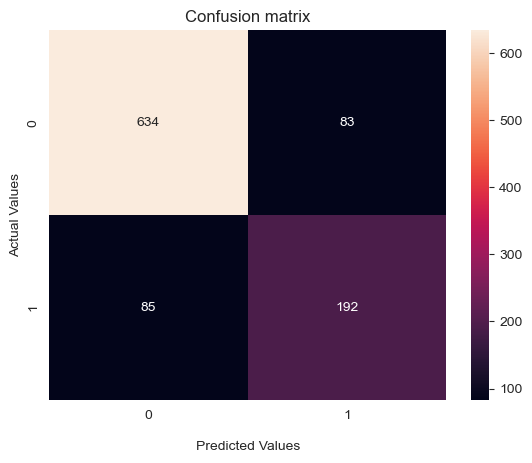

In [51]:
# finl_model score
trial = xgb_study.best_trial
trial_params = trial.params

final_model = XGBClassifier(**trial_params, random_state=42)
final_model.fit(X_train_scaled, y_train)
pred = final_model.predict(X_test_scaled)
final_cm_model = confusion_matrix(y_test, pred)

print("Accuracy: %.4f" % accuracy_score(y_test, pred))
print("Roc_auc  Score: %.4f \n" % roc_auc_score(y_test, pred))
print(classification_report(y_test, pred))
plot_cm(final_cm_model)